## Bidirectional LSTM model na predikciu hodnot DST o 4 hodiny dopredu na zaklade 12-hodinoveho vstupneho okna z atributov DST a BZ_GSM

Subor: prediction_DST+4_12H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-27 08:57:55.531254: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 4
y_col = f"DST+{shift}"

n_input = 12
atr_count = 2

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', 'bz_gsm', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])
predicators = ["DST", "bz_gsm"]

valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train[predicators].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid[predicators].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test[predicators].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  12


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 12, 2)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 12, 256)             │         134,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 12, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 12, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              13 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 331,406 (1.26 MB)

 Trainable params: 331,406 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H_BZ.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32:40 6s/step - loss: 1.5783 - mae: 0.9498

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 87ms/step - loss: 1.3152 - mae: 0.8633 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step - loss: 1.2067 - mae: 0.8333

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 79ms/step - loss: 1.1008 - mae: 0.7899

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 1.0527 - mae: 0.7674

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 1.0480 - mae: 0.7554

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 1.0397 - mae: 0.7482

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 1.0212 - mae: 0.7371

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.9980 - mae: 0.7245

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.9728 - mae: 0.7112

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.9467 - mae: 0.6974

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.9231 - mae: 0.6856

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.8999 - mae: 0.6738

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.8789 - mae: 0.6634

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.8606 - mae: 0.6542

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.8431 - mae: 0.6454

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.8261 - mae: 0.6368

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.8097 - mae: 0.6285

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.7938 - mae: 0.6205

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.7860 - mae: 0.6142

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.7778 - mae: 0.6080

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.7696 - mae: 0.6022

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.7614 - mae: 0.5966

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.7540 - mae: 0.5916

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.7466 - mae: 0.5867

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.7392 - mae: 0.5821

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.7319 - mae: 0.5775

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.7246 - mae: 0.5731

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.7174 - mae: 0.5689

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.7103 - mae: 0.5648

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.7040 - mae: 0.5611

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.6979 - mae: 0.5577

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.6932 - mae: 0.5548

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.6883 - mae: 0.5519

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.6835 - mae: 0.5490

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.6788 - mae: 0.5462

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.6744 - mae: 0.5437

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.6714 - mae: 0.5415

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.6683 - mae: 0.5393

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.6652 - mae: 0.5372

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.6620 - mae: 0.5352

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.6590 - mae: 0.5333

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.6559 - mae: 0.5314

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.6530 - mae: 0.5296

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.6500 - mae: 0.5279

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.6471 - mae: 0.5263

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.6441 - mae: 0.5246

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.6411 - mae: 0.5230

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.6381 - mae: 0.5214 

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.6351 - mae: 0.5198

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.6327 - mae: 0.5183

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.6303 - mae: 0.5168

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.6278 - mae: 0.5154

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.6253 - mae: 0.5139

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.6229 - mae: 0.5125

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.6204 - mae: 0.5112

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.6180 - mae: 0.5098

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.6155 - mae: 0.5085

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.6131 - mae: 0.5072

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.6108 - mae: 0.5059

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.6084 - mae: 0.5047

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.6061 - mae: 0.5034

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.6038 - mae: 0.5022

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.6015 - mae: 0.5010

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5993 - mae: 0.4999

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5972 - mae: 0.4988

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5951 - mae: 0.4977

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5930 - mae: 0.4966

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5909 - mae: 0.4955

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5889 - mae: 0.4944

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5868 - mae: 0.4934

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5848 - mae: 0.4924

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.5828 - mae: 0.4914

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.5808 - mae: 0.4904

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.5790 - mae: 0.4894

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.5773 - mae: 0.4885

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.5763 - mae: 0.4877

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.5754 - mae: 0.4870

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.5745 - mae: 0.4863

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.5736 - mae: 0.4856

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.5726 - mae: 0.4849

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.5716 - mae: 0.4842

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.5706 - mae: 0.4835

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.5696 - mae: 0.4828

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.5685 - mae: 0.4820

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.5675 - mae: 0.4814

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.5664 - mae: 0.4807

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.5654 - mae: 0.4801

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.5644 - mae: 0.4794

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.5633 - mae: 0.4788

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.5623 - mae: 0.4781

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.5612 - mae: 0.4775

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.5602 - mae: 0.4769

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.5592 - mae: 0.4763

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.5582 - mae: 0.4757

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.5572 - mae: 0.4752

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.5562 - mae: 0.4746

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.5552 - mae: 0.4741

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.5542 - mae: 0.4735

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.5533 - mae: 0.4730

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.5523 - mae: 0.4725

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.5513 - mae: 0.4719

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.5505 - mae: 0.4714

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.5498 - mae: 0.4710

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.5490 - mae: 0.4705

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.5482 - mae: 0.4701

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.5475 - mae: 0.4696

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.5467 - mae: 0.4692

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.5459 - mae: 0.4687

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.5452 - mae: 0.4683

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.5444 - mae: 0.4679

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.5436 - mae: 0.4674

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.5428 - mae: 0.4670

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.5420 - mae: 0.4666

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.5412 - mae: 0.4662

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.5404 - mae: 0.4657

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.5396 - mae: 0.4653

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.5388 - mae: 0.4649

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.5380 - mae: 0.4645

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.5372 - mae: 0.4641

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.5365 - mae: 0.4637

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.5357 - mae: 0.4633

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.5350 - mae: 0.4629

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.5344 - mae: 0.4626

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.5338 - mae: 0.4622

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5331 - mae: 0.4619

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5325 - mae: 0.4615

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5319 - mae: 0.4612

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5313 - mae: 0.4608

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5307 - mae: 0.4605

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5300 - mae: 0.4601

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5294 - mae: 0.4598

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5287 - mae: 0.4594

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5281 - mae: 0.4591

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5274 - mae: 0.4587

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5268 - mae: 0.4584

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5261 - mae: 0.4580

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.5254 - mae: 0.4577

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5248 - mae: 0.4573

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5241 - mae: 0.4570

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5234 - mae: 0.4566

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5228 - mae: 0.4563

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5221 - mae: 0.4560

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5215 - mae: 0.4556

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5209 - mae: 0.4553

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5203 - mae: 0.4550

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5198 - mae: 0.4547

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5192 - mae: 0.4544

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5187 - mae: 0.4541

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5181 - mae: 0.4538

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.5176 - mae: 0.4536

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5171 - mae: 0.4533

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5166 - mae: 0.4530

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5160 - mae: 0.4527

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5155 - mae: 0.4525

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5150 - mae: 0.4522

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5144 - mae: 0.4519

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5139 - mae: 0.4516

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5134 - mae: 0.4514

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5129 - mae: 0.4511

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5124 - mae: 0.4509

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5119 - mae: 0.4506

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5114 - mae: 0.4504

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5109 - mae: 0.4501

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.5104 - mae: 0.4499

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.5100 - mae: 0.4496

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.5095 - mae: 0.4494

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.5090 - mae: 0.4492

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.5085 - mae: 0.4489

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.5080 - mae: 0.4487

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.5075 - mae: 0.4485

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.5070 - mae: 0.4483

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.5066 - mae: 0.4480

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.5061 - mae: 0.4478

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.5056 - mae: 0.4476

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.5051 - mae: 0.4473

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.5046 - mae: 0.4471

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.5041 - mae: 0.4469

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.5036 - mae: 0.4466

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.5031 - mae: 0.4464

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.5026 - mae: 0.4462

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.5021 - mae: 0.4459

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.5016 - mae: 0.4457

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.5011 - mae: 0.4455

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.5006 - mae: 0.4453

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.5001 - mae: 0.4450

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4996 - mae: 0.4448

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4992 - mae: 0.4446

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4987 - mae: 0.4444

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4982 - mae: 0.4442

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4977 - mae: 0.4440

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.4973 - mae: 0.4438

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4969 - mae: 0.4436

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4964 - mae: 0.4434

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4960 - mae: 0.4432

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4955 - mae: 0.4430

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4951 - mae: 0.4428

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4947 - mae: 0.4425

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4942 - mae: 0.4423

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4938 - mae: 0.4421

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4934 - mae: 0.4420

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4930 - mae: 0.4418

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4926 - mae: 0.4416

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4922 - mae: 0.4414

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4919 - mae: 0.4412

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4915 - mae: 0.4410

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.4911 - mae: 0.4408

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.4907 - mae: 0.4407

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.4903 - mae: 0.4405

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.4900 - mae: 0.4403

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.4896 - mae: 0.4401

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.4892 - mae: 0.4399

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.4888 - mae: 0.4398

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.4885 - mae: 0.4396

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.4882 - mae: 0.4394

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.4878 - mae: 0.4393

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.4875 - mae: 0.4391

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.4872 - mae: 0.4390

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.4869 - mae: 0.4388

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.4866 - mae: 0.4386

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.4863 - mae: 0.4385

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4860 - mae: 0.4383

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4856 - mae: 0.4382

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4853 - mae: 0.4380

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4850 - mae: 0.4378

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4847 - mae: 0.4377

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4844 - mae: 0.4375

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4841 - mae: 0.4374

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4838 - mae: 0.4372

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4835 - mae: 0.4371

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4831 - mae: 0.4369

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4828 - mae: 0.4368

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4825 - mae: 0.4366

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.4822 - mae: 0.4364

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4819 - mae: 0.4363

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4816 - mae: 0.4362

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4813 - mae: 0.4360

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4811 - mae: 0.4359

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4808 - mae: 0.4357

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4805 - mae: 0.4356

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4802 - mae: 0.4354

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4800 - mae: 0.4353

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4797 - mae: 0.4352

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4794 - mae: 0.4350

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4791 - mae: 0.4349

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4788 - mae: 0.4347

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4786 - mae: 0.4346

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4783 - mae: 0.4344

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4780 - mae: 0.4343

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.4777 - mae: 0.4342

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4774 - mae: 0.4340

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4772 - mae: 0.4339

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4769 - mae: 0.4337

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4766 - mae: 0.4336

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4763 - mae: 0.4335

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4760 - mae: 0.4333

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4758 - mae: 0.4332

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4755 - mae: 0.4330

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4752 - mae: 0.4329

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4750 - mae: 0.4328

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4747 - mae: 0.4327

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4745 - mae: 0.4325

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4742 - mae: 0.4324

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.4740 - mae: 0.4323

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4737 - mae: 0.4321

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4735 - mae: 0.4320

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4732 - mae: 0.4319

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4730 - mae: 0.4318

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4727 - mae: 0.4316

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4725 - mae: 0.4315

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4722 - mae: 0.4314

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4720 - mae: 0.4313

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4717 - mae: 0.4311

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4715 - mae: 0.4310

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4713 - mae: 0.4309

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4710 - mae: 0.4308

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4708 - mae: 0.4307

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.4706 - mae: 0.4305

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4703 - mae: 0.4304

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4701 - mae: 0.4303

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4699 - mae: 0.4302

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4696 - mae: 0.4300

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4694 - mae: 0.4299

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4692 - mae: 0.4298

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4690 - mae: 0.4297

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4688 - mae: 0.4296

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4686 - mae: 0.4295

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4683 - mae: 0.4293

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4681 - mae: 0.4292

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4679 - mae: 0.4291

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4677 - mae: 0.4290

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4675 - mae: 0.4289

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.4673 - mae: 0.4288

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4671 - mae: 0.4287

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4669 - mae: 0.4286

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4667 - mae: 0.4284

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4665 - mae: 0.4283

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4662 - mae: 0.4282

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4660 - mae: 0.4281

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4658 - mae: 0.4280

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4656 - mae: 0.4279

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4654 - mae: 0.4278

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4652 - mae: 0.4277

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4649 - mae: 0.4275

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4647 - mae: 0.4274

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4645 - mae: 0.4273

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.4643 - mae: 0.4272

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4640 - mae: 0.4271

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4638 - mae: 0.4270

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4636 - mae: 0.4269

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4634 - mae: 0.4267

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4631 - mae: 0.4266

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4629 - mae: 0.4265

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4627 - mae: 0.4264

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4625 - mae: 0.4263

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4622 - mae: 0.4262

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4620 - mae: 0.4261

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4618 - mae: 0.4260

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4615 - mae: 0.4258

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4613 - mae: 0.4257

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.4611 - mae: 0.4256

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4609 - mae: 0.4255

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4606 - mae: 0.4254

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4604 - mae: 0.4253

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4602 - mae: 0.4252

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4600 - mae: 0.4251

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4598 - mae: 0.4250

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4596 - mae: 0.4249

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4594 - mae: 0.4248

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4591 - mae: 0.4247

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4589 - mae: 0.4246

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4587 - mae: 0.4244

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4585 - mae: 0.4243

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4583 - mae: 0.4242

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.4581 - mae: 0.4241

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.4579 - mae: 0.4240

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.4577 - mae: 0.4239

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.4575 - mae: 0.4238

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.4573 - mae: 0.4237

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.4571 - mae: 0.4236

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.4569 - mae: 0.4235

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.4567 - mae: 0.4234

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.4565 - mae: 0.4233

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.4563 - mae: 0.4232

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.4561 - mae: 0.4231

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.4559 - mae: 0.4231

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.4557 - mae: 0.4230

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.4555 - mae: 0.4229

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.4553 - mae: 0.4228

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.4551 - mae: 0.4227

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.4549 - mae: 0.4226

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.4547 - mae: 0.4225

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4545 - mae: 0.4224

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4543 - mae: 0.4223

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4541 - mae: 0.4222

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4539 - mae: 0.4221

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4537 - mae: 0.4220

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4535 - mae: 0.4219

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.4533 - mae: 0.4218

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.4531 - mae: 0.4217

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4529 - mae: 0.4216

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4527 - mae: 0.4215

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.4525 - mae: 0.4215

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4523 - mae: 0.4214

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4521 - mae: 0.4213

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4519 - mae: 0.4212

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4517 - mae: 0.4211

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4515 - mae: 0.4210

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4513 - mae: 0.4209

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4511 - mae: 0.4208

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4509 - mae: 0.4207

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4507 - mae: 0.4206

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4505 - mae: 0.4205

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4503 - mae: 0.4204

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4501 - mae: 0.4203

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4499 - mae: 0.4202

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.4497 - mae: 0.4201

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4495 - mae: 0.4201

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4493 - mae: 0.4200

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4491 - mae: 0.4199

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4489 - mae: 0.4198

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4487 - mae: 0.4197

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4485 - mae: 0.4196

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4483 - mae: 0.4195

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4481 - mae: 0.4194

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4479 - mae: 0.4193

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4477 - mae: 0.4192

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4475 - mae: 0.4191

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4473 - mae: 0.4190

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4471 - mae: 0.4189

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.4469 - mae: 0.4188

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4467 - mae: 0.4187

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4465 - mae: 0.4186

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4463 - mae: 0.4186

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4461 - mae: 0.4185

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4459 - mae: 0.4184

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4457 - mae: 0.4183

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4455 - mae: 0.4182

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4453 - mae: 0.4181

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4451 - mae: 0.4180

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4449 - mae: 0.4179

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4446 - mae: 0.4178

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4444 - mae: 0.4177

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4442 - mae: 0.4176

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.4440 - mae: 0.4175

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.4438 - mae: 0.4174

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.4436 - mae: 0.4173

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.4434 - mae: 0.4172

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.4432 - mae: 0.4172

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.4430 - mae: 0.4171

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.4428 - mae: 0.4170

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.4426 - mae: 0.4169

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.4424 - mae: 0.4168

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.4422 - mae: 0.4167

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.4420 - mae: 0.4166

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.4418 - mae: 0.4165

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.4416 - mae: 0.4164

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.4414 - mae: 0.4163

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.4412 - mae: 0.4162

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.4410 - mae: 0.4162

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.4408 - mae: 0.4161

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.4406 - mae: 0.4160

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.4404 - mae: 0.4159

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.4402 - mae: 0.4158

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.4400 - mae: 0.4157

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.4398 - mae: 0.4156

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.4396 - mae: 0.4155

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.4394 - mae: 0.4154

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.4392 - mae: 0.4153

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.4390 - mae: 0.4152

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.4388 - mae: 0.4152

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.4386 - mae: 0.4151

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.4384 - mae: 0.4150

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.4382 - mae: 0.4149

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.4380 - mae: 0.4148

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.4378 - mae: 0.4147

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.4376 - mae: 0.4146

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.4374 - mae: 0.4145

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.4372 - mae: 0.4145

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.4370 - mae: 0.4144

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.4368 - mae: 0.4143

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.4366 - mae: 0.4142

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.4364 - mae: 0.4141

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.4362 - mae: 0.4140

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.4360 - mae: 0.4139

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.4358 - mae: 0.4138

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.4356 - mae: 0.4138

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.4354 - mae: 0.4137

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.4352 - mae: 0.4136

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.4350 - mae: 0.4135

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.4348 - mae: 0.4134

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.4346 - mae: 0.4133

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.4344 - mae: 0.4132

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.4342 - mae: 0.4131

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.4340 - mae: 0.4131

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.4339 - mae: 0.4130

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.4337 - mae: 0.4129

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.4335 - mae: 0.4128

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.4333 - mae: 0.4127

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.4331 - mae: 0.4126

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.4329 - mae: 0.4125

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.4327 - mae: 0.4125

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.4325 - mae: 0.4124

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.4323 - mae: 0.4123

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.4321 - mae: 0.4122

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.4319 - mae: 0.4121

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.4317 - mae: 0.4120

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.4315 - mae: 0.4119

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.4313 - mae: 0.4119

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.4311 - mae: 0.4118

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.4309 - mae: 0.4117

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.4307 - mae: 0.4116

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.4305 - mae: 0.4115

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4304 - mae: 0.4114

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4302 - mae: 0.4114

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4300 - mae: 0.4113

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4298 - mae: 0.4112

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4296 - mae: 0.4111

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4294 - mae: 0.4110

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4292 - mae: 0.4109

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4290 - mae: 0.4108

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4288 - mae: 0.4108

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4286 - mae: 0.4107

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4284 - mae: 0.4106

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4282 - mae: 0.4105

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4281 - mae: 0.4104

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.4279 - mae: 0.4104

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.4277 - mae: 0.4103

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4275 - mae: 0.4102

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4273 - mae: 0.4101

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4271 - mae: 0.4100

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4270 - mae: 0.4100

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4268 - mae: 0.4099

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4266 - mae: 0.4098

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4264 - mae: 0.4097

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4263 - mae: 0.4096

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4261 - mae: 0.4096

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4259 - mae: 0.4095

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4257 - mae: 0.4094

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4256 - mae: 0.4093

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.4254 - mae: 0.4093

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4252 - mae: 0.4092

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4250 - mae: 0.4091

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4248 - mae: 0.4090

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4247 - mae: 0.4089

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4245 - mae: 0.4089

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4243 - mae: 0.4088

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4242 - mae: 0.4087

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4240 - mae: 0.4087

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4238 - mae: 0.4086

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4237 - mae: 0.4085

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4235 - mae: 0.4084

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4233 - mae: 0.4084

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4232 - mae: 0.4083

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.4230 - mae: 0.4082

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4228 - mae: 0.4081

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4227 - mae: 0.4081

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4225 - mae: 0.4080

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4223 - mae: 0.4079

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4222 - mae: 0.4078

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4220 - mae: 0.4078

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4218 - mae: 0.4077

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4217 - mae: 0.4076

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4215 - mae: 0.4075

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4213 - mae: 0.4075

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4212 - mae: 0.4074

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4210 - mae: 0.4073

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4209 - mae: 0.4073

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.4207 - mae: 0.4072

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.4205 - mae: 0.4071

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.4204 - mae: 0.4070

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.4202 - mae: 0.4070

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.4201 - mae: 0.4069

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.4199 - mae: 0.4068

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.4197 - mae: 0.4067

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.4196 - mae: 0.4067

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.4194 - mae: 0.4066

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.4192 - mae: 0.4065

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.4191 - mae: 0.4065

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.4189 - mae: 0.4064

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.4188 - mae: 0.4063

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.4186 - mae: 0.4062

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.4184 - mae: 0.4062

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.4183 - mae: 0.4061

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.4181 - mae: 0.4060

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.4180 - mae: 0.4060

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.4178 - mae: 0.4059

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.4176 - mae: 0.4058

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.4175 - mae: 0.4057

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.4173 - mae: 0.4057

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.4172 - mae: 0.4056

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.4170 - mae: 0.4055

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.4168 - mae: 0.4055

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.4167 - mae: 0.4054

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.4165 - mae: 0.4053

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.4164 - mae: 0.4053

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.4162 - mae: 0.4052

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.4161 - mae: 0.4051

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.4159 - mae: 0.4050

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.4158 - mae: 0.4050

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.4156 - mae: 0.4049

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.4154 - mae: 0.4048

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.4153 - mae: 0.4048

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.4151 - mae: 0.4047

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.4150 - mae: 0.4046

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.4148 - mae: 0.4046

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.4147 - mae: 0.4045

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.4145 - mae: 0.4044

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.4144 - mae: 0.4044

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.4142 - mae: 0.4043

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.4141 - mae: 0.4042

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.4139 - mae: 0.4042

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.4138 - mae: 0.4041

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.4136 - mae: 0.4040

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.4135 - mae: 0.4040

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.4133 - mae: 0.4039

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.4132 - mae: 0.4038

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.4130 - mae: 0.4038

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.4129 - mae: 0.4037

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.4127 - mae: 0.4036

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.4126 - mae: 0.4036

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.4124 - mae: 0.4035

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.4123 - mae: 0.4034

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.4122 - mae: 0.4034

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.4120 - mae: 0.4033

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.4119 - mae: 0.4032

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.4117 - mae: 0.4032

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.4116 - mae: 0.4031

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.4114 - mae: 0.4030

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.4113 - mae: 0.4030

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.4111 - mae: 0.4029

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.4110 - mae: 0.4028

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.4108 - mae: 0.4028

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.4107 - mae: 0.4027

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.4105 - mae: 0.4027

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.4104 - mae: 0.4026

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.4103 - mae: 0.4025

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.4101 - mae: 0.4025

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.4100 - mae: 0.4024

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.4098 - mae: 0.4023

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.4097 - mae: 0.4023

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.4095 - mae: 0.4022

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.4094 - mae: 0.4021

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4093 - mae: 0.4021

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4091 - mae: 0.4020

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4090 - mae: 0.4020

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4088 - mae: 0.4019

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4087 - mae: 0.4018

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4086 - mae: 0.4018

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4084 - mae: 0.4017

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4083 - mae: 0.4016

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4081 - mae: 0.4016

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4080 - mae: 0.4015

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4079 - mae: 0.4015

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4077 - mae: 0.4014

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4076 - mae: 0.4013

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4074 - mae: 0.4013

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.4073 - mae: 0.4012

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4072 - mae: 0.4012

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4070 - mae: 0.4011

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4069 - mae: 0.4010

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4068 - mae: 0.4010

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4066 - mae: 0.4009

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4065 - mae: 0.4008

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4064 - mae: 0.4008

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4062 - mae: 0.4007

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4061 - mae: 0.4007

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4059 - mae: 0.4006

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4058 - mae: 0.4005

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4057 - mae: 0.4005

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4055 - mae: 0.4004

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.4054 - mae: 0.4004

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4053 - mae: 0.4003

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4051 - mae: 0.4002

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4050 - mae: 0.4002

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4049 - mae: 0.4001

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4047 - mae: 0.4001

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4046 - mae: 0.4000

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4045 - mae: 0.4000

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4043 - mae: 0.3999

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4042 - mae: 0.3998

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4041 - mae: 0.3998

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4039 - mae: 0.3997

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4038 - mae: 0.3997

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4037 - mae: 0.3996

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4035 - mae: 0.3995

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.4034 - mae: 0.3995

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4033 - mae: 0.3994

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4031 - mae: 0.3994

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4030 - mae: 0.3993

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4029 - mae: 0.3992

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4028 - mae: 0.3992

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4026 - mae: 0.3991

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4025 - mae: 0.3991

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4024 - mae: 0.3990

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4022 - mae: 0.3990

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4021 - mae: 0.3989

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4020 - mae: 0.3988

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4018 - mae: 0.3988

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4017 - mae: 0.3987

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.4016 - mae: 0.3987

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4014 - mae: 0.3986

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4013 - mae: 0.3985

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4012 - mae: 0.3985

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4011 - mae: 0.3984

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4009 - mae: 0.3984

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4008 - mae: 0.3983

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4007 - mae: 0.3983

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4005 - mae: 0.3982

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4004 - mae: 0.3981

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4003 - mae: 0.3981

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4002 - mae: 0.3980

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.4000 - mae: 0.3980

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3999 - mae: 0.3979

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3998 - mae: 0.3979

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3997 - mae: 0.3978

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3995 - mae: 0.3978

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3994 - mae: 0.3977

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3993 - mae: 0.3976

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3992 - mae: 0.3976

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3990 - mae: 0.3975

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3989 - mae: 0.3975

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3988 - mae: 0.3974

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3987 - mae: 0.3974

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3986 - mae: 0.3973

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3984 - mae: 0.3973

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3983 - mae: 0.3972

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3982 - mae: 0.3972

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3981 - mae: 0.3971

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3979 - mae: 0.3970

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3978 - mae: 0.3970

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3977 - mae: 0.3969

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3976 - mae: 0.3969

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3974 - mae: 0.3968

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3973 - mae: 0.3968

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3972 - mae: 0.3967

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3971 - mae: 0.3967

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3970 - mae: 0.3966

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3968 - mae: 0.3966

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3967 - mae: 0.3965

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3966 - mae: 0.3964

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3965 - mae: 0.3964

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3964 - mae: 0.3963

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3962 - mae: 0.3963

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3961 - mae: 0.3962

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3960 - mae: 0.3962

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3959 - mae: 0.3961

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3958 - mae: 0.3961

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3957 - mae: 0.3960

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3956 - mae: 0.3960

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3954 - mae: 0.3959

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3953 - mae: 0.3959

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3952 - mae: 0.3958

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3951 - mae: 0.3958

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3950 - mae: 0.3957

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3949 - mae: 0.3957

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3948 - mae: 0.3956

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3947 - mae: 0.3956

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3945 - mae: 0.3955

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3944 - mae: 0.3955

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3943 - mae: 0.3954

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3942 - mae: 0.3954

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3941 - mae: 0.3953

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3940 - mae: 0.3953

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3939 - mae: 0.3952

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3938 - mae: 0.3952

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3937 - mae: 0.3951

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3936 - mae: 0.3951

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3934 - mae: 0.3950

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3933 - mae: 0.3950

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3932 - mae: 0.3949

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3931 - mae: 0.3949

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3930 - mae: 0.3948

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3929 - mae: 0.3948

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3928 - mae: 0.3948

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3927 - mae: 0.3947

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3926 - mae: 0.3947

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3925 - mae: 0.3946

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3924 - mae: 0.3946

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3923 - mae: 0.3945

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3922 - mae: 0.3945

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3921 - mae: 0.3944

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3920 - mae: 0.3944

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3919 - mae: 0.3943

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3918 - mae: 0.3943

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3917 - mae: 0.3942

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3916 - mae: 0.3942

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3915 - mae: 0.3942

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3914 - mae: 0.3941

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3913 - mae: 0.3941 

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3912 - mae: 0.3940

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3911 - mae: 0.3940

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3910 - mae: 0.3939

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3909 - mae: 0.3939

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3908 - mae: 0.3938

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3907 - mae: 0.3938

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3906 - mae: 0.3938

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3905 - mae: 0.3937

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3904 - mae: 0.3937

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3903 - mae: 0.3936

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3902 - mae: 0.3936

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3901 - mae: 0.3935

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3900 - mae: 0.3935

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3899 - mae: 0.3935

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3898 - mae: 0.3934

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3897 - mae: 0.3934

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3897 - mae: 0.3933

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3896 - mae: 0.3933

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3895 - mae: 0.3933

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3894 - mae: 0.3932

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3893 - mae: 0.3932

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3892 - mae: 0.3931

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3891 - mae: 0.3931

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3891 - mae: 0.3931

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3890 - mae: 0.3930

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3889 - mae: 0.3930

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3888 - mae: 0.3929

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3887 - mae: 0.3929

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3886 - mae: 0.3929

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3886 - mae: 0.3928

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3885 - mae: 0.3928

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3884 - mae: 0.3928

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3883 - mae: 0.3927

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3882 - mae: 0.3927

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3881 - mae: 0.3926

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3881 - mae: 0.3926

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3880 - mae: 0.3926

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3879 - mae: 0.3925

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3878 - mae: 0.3925

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3877 - mae: 0.3925

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3877 - mae: 0.3924

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3876 - mae: 0.3924

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3875 - mae: 0.3923

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3874 - mae: 0.3923

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3873 - mae: 0.3923

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3873 - mae: 0.3922

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3872 - mae: 0.3922

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3871 - mae: 0.3922

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3870 - mae: 0.3921

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3869 - mae: 0.3921

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3869 - mae: 0.3920

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3868 - mae: 0.3920

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3867 - mae: 0.3920

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3866 - mae: 0.3919

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3865 - mae: 0.3919

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3865 - mae: 0.3919

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3864 - mae: 0.3918

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.3863 - mae: 0.3918

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3862 - mae: 0.3918

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3861 - mae: 0.3917

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3861 - mae: 0.3917

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3860 - mae: 0.3917

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3859 - mae: 0.3916

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3858 - mae: 0.3916

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3857 - mae: 0.3915

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3857 - mae: 0.3915

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3856 - mae: 0.3915

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3855 - mae: 0.3914

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3854 - mae: 0.3914

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3853 - mae: 0.3914

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3853 - mae: 0.3913

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.3852 - mae: 0.3913

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3851 - mae: 0.3913

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3850 - mae: 0.3912

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3849 - mae: 0.3912

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3849 - mae: 0.3911

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3848 - mae: 0.3911

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3847 - mae: 0.3911

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3846 - mae: 0.3910

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3845 - mae: 0.3910

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3845 - mae: 0.3910

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3844 - mae: 0.3909

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3843 - mae: 0.3909

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3842 - mae: 0.3909

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3841 - mae: 0.3908

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3841 - mae: 0.3908

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.3840 - mae: 0.3908

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3839 - mae: 0.3907

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3838 - mae: 0.3907

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3837 - mae: 0.3907

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3837 - mae: 0.3906

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3836 - mae: 0.3906

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3835 - mae: 0.3905

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3834 - mae: 0.3905

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3834 - mae: 0.3905

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3833 - mae: 0.3904

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3832 - mae: 0.3904

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3831 - mae: 0.3904

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3830 - mae: 0.3903

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3830 - mae: 0.3903

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3829 - mae: 0.3903

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.3828 - mae: 0.3902

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3827 - mae: 0.3902

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3827 - mae: 0.3902

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3826 - mae: 0.3901

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3825 - mae: 0.3901

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3824 - mae: 0.3901

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3824 - mae: 0.3900

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3823 - mae: 0.3900

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3822 - mae: 0.3900

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3821 - mae: 0.3899

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3820 - mae: 0.3899

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3820 - mae: 0.3899

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3819 - mae: 0.3898

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3818 - mae: 0.3898

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.3817 - mae: 0.3897

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3817 - mae: 0.3897

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3816 - mae: 0.3897

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3815 - mae: 0.3896

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3814 - mae: 0.3896

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3814 - mae: 0.3896

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3813 - mae: 0.3895

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3812 - mae: 0.3895

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3811 - mae: 0.3895

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3810 - mae: 0.3894

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3810 - mae: 0.3894

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3809 - mae: 0.3894

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3808 - mae: 0.3893

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3807 - mae: 0.3893

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3807 - mae: 0.3893

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.3806 - mae: 0.3892

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3805 - mae: 0.3892

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3804 - mae: 0.3892

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3804 - mae: 0.3891

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3803 - mae: 0.3891

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3802 - mae: 0.3891

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3801 - mae: 0.3890

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3801 - mae: 0.3890

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3800 - mae: 0.3890

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3799 - mae: 0.3889

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3798 - mae: 0.3889

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3798 - mae: 0.3889

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3797 - mae: 0.3888

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3796 - mae: 0.3888

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3795 - mae: 0.3888

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3795 - mae: 0.3887


Epoch 1: val_mae improved from inf to 0.37539, saving model to models/DST+4_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 74s 76ms/step - loss: 0.3794 - mae: 0.3887 - val_loss: 0.3969 - val_mae: 0.3754


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.7709 - mae: 0.5129

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.8248 - mae: 0.5113 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.7844 - mae: 0.4963

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.7338 - mae: 0.4813

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.7123 - mae: 0.4764

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.6906 - mae: 0.4708

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.6658 - mae: 0.4636

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.6419 - mae: 0.4565

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.6189 - mae: 0.4493

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.5972 - mae: 0.4421

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.5829 - mae: 0.4370

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.5762 - mae: 0.4337

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.5695 - mae: 0.4310

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.5621 - mae: 0.4283

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.5542 - mae: 0.4254

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.5462 - mae: 0.4225

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.5388 - mae: 0.4199

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.5315 - mae: 0.4173

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5243 - mae: 0.4149

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5199 - mae: 0.4135

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5153 - mae: 0.4119

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5105 - mae: 0.4102

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5058 - mae: 0.4086

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5009 - mae: 0.4070

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.4962 - mae: 0.4054

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.4916 - mae: 0.4038

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.4870 - mae: 0.4023

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.4828 - mae: 0.4009

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4804 - mae: 0.4000

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4779 - mae: 0.3991

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4757 - mae: 0.3983

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4733 - mae: 0.3975

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4710 - mae: 0.3967

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4687 - mae: 0.3960

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.4664 - mae: 0.3954

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.4641 - mae: 0.3947

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.4618 - mae: 0.3940

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.4595 - mae: 0.3934

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4572 - mae: 0.3928

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4550 - mae: 0.3922

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4528 - mae: 0.3916

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4506 - mae: 0.3911

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4484 - mae: 0.3904 

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4462 - mae: 0.3898

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4440 - mae: 0.3892

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4419 - mae: 0.3886

 47/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4399 - mae: 0.3880

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4380 - mae: 0.3875

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4360 - mae: 0.3870

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4340 - mae: 0.3864

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4320 - mae: 0.3858

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4299 - mae: 0.3852

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4279 - mae: 0.3846

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4260 - mae: 0.3840

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4240 - mae: 0.3834

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4221 - mae: 0.3828

 57/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4202 - mae: 0.3822

 58/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4183 - mae: 0.3816

 59/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4164 - mae: 0.3810

 60/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4145 - mae: 0.3804

 61/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4127 - mae: 0.3798

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4111 - mae: 0.3792

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4095 - mae: 0.3787

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4079 - mae: 0.3781

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4063 - mae: 0.3776

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4048 - mae: 0.3770

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4033 - mae: 0.3765

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4018 - mae: 0.3760

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.4003 - mae: 0.3755

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3988 - mae: 0.3750

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 70ms/step - loss: 0.3974 - mae: 0.3745

 72/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3960 - mae: 0.3741

 73/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3947 - mae: 0.3736

 74/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3934 - mae: 0.3731

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3921 - mae: 0.3727

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3908 - mae: 0.3722

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3895 - mae: 0.3718

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3883 - mae: 0.3714

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3870 - mae: 0.3710

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3858 - mae: 0.3705

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3846 - mae: 0.3701

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3834 - mae: 0.3698

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.3822 - mae: 0.3694

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3810 - mae: 0.3690

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3799 - mae: 0.3686

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3787 - mae: 0.3682

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3776 - mae: 0.3679

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3765 - mae: 0.3675

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3754 - mae: 0.3672

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3744 - mae: 0.3669

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3734 - mae: 0.3665

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3724 - mae: 0.3662

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3715 - mae: 0.3659

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3705 - mae: 0.3656

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.3695 - mae: 0.3653

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3686 - mae: 0.3650

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3677 - mae: 0.3647

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3668 - mae: 0.3644

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3659 - mae: 0.3641

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3650 - mae: 0.3639

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3642 - mae: 0.3636

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3634 - mae: 0.3634

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3626 - mae: 0.3631

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3618 - mae: 0.3628

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3610 - mae: 0.3626

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.3602 - mae: 0.3623

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3594 - mae: 0.3621

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3586 - mae: 0.3618

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3578 - mae: 0.3616

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3570 - mae: 0.3613

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3563 - mae: 0.3611

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3555 - mae: 0.3609

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3547 - mae: 0.3606

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3540 - mae: 0.3604

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3533 - mae: 0.3602

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3526 - mae: 0.3600

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3518 - mae: 0.3597

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3511 - mae: 0.3595

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.3504 - mae: 0.3593

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3498 - mae: 0.3591

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3491 - mae: 0.3589

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3484 - mae: 0.3586

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3478 - mae: 0.3584

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3472 - mae: 0.3582

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3466 - mae: 0.3580

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3460 - mae: 0.3578

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3455 - mae: 0.3576

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3449 - mae: 0.3575

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3444 - mae: 0.3573

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3438 - mae: 0.3571

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3433 - mae: 0.3569

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3428 - mae: 0.3567

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3422 - mae: 0.3565

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3417 - mae: 0.3563

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3412 - mae: 0.3562

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3407 - mae: 0.3560

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3402 - mae: 0.3558

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3397 - mae: 0.3556

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3392 - mae: 0.3555

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3388 - mae: 0.3553

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3384 - mae: 0.3552

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3380 - mae: 0.3551

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3375 - mae: 0.3549

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3371 - mae: 0.3548

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3368 - mae: 0.3547

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3364 - mae: 0.3545

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3360 - mae: 0.3544

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3356 - mae: 0.3543

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3352 - mae: 0.3542

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3349 - mae: 0.3540

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3345 - mae: 0.3539

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3341 - mae: 0.3538

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3337 - mae: 0.3537

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3334 - mae: 0.3536

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3330 - mae: 0.3534

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3326 - mae: 0.3533

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3323 - mae: 0.3532

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3319 - mae: 0.3531

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3316 - mae: 0.3530

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3312 - mae: 0.3529

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3309 - mae: 0.3528

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3305 - mae: 0.3527

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3302 - mae: 0.3526

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3298 - mae: 0.3525

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3295 - mae: 0.3523

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3292 - mae: 0.3522

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3289 - mae: 0.3521

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3285 - mae: 0.3520

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.3282 - mae: 0.3519

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3279 - mae: 0.3518

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3276 - mae: 0.3517

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3272 - mae: 0.3516

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3269 - mae: 0.3516

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3266 - mae: 0.3515

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3263 - mae: 0.3514

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3260 - mae: 0.3513

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3257 - mae: 0.3512

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3255 - mae: 0.3511

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3252 - mae: 0.3510

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3249 - mae: 0.3509

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.3246 - mae: 0.3509

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3243 - mae: 0.3508

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3241 - mae: 0.3507

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3238 - mae: 0.3506

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3236 - mae: 0.3506

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3233 - mae: 0.3505

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3231 - mae: 0.3504

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3228 - mae: 0.3503

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3226 - mae: 0.3503

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3223 - mae: 0.3502

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3221 - mae: 0.3501

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3218 - mae: 0.3500

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3216 - mae: 0.3500

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.3213 - mae: 0.3499

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.3211 - mae: 0.3498

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3208 - mae: 0.3497

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3206 - mae: 0.3497

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3203 - mae: 0.3496

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3201 - mae: 0.3495

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3198 - mae: 0.3495

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3196 - mae: 0.3494

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3193 - mae: 0.3493

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3191 - mae: 0.3492

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3189 - mae: 0.3492

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3186 - mae: 0.3491

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3184 - mae: 0.3490

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3182 - mae: 0.3490

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.3180 - mae: 0.3489

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3178 - mae: 0.3488

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3176 - mae: 0.3488

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3174 - mae: 0.3487

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3172 - mae: 0.3487

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3170 - mae: 0.3486

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3168 - mae: 0.3485

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3166 - mae: 0.3485

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3164 - mae: 0.3484

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3162 - mae: 0.3483

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3160 - mae: 0.3483

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3158 - mae: 0.3482

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3156 - mae: 0.3481

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3154 - mae: 0.3481

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.3152 - mae: 0.3480

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3150 - mae: 0.3479

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3148 - mae: 0.3479

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3146 - mae: 0.3478

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3144 - mae: 0.3477

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3142 - mae: 0.3477

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3140 - mae: 0.3476

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3138 - mae: 0.3475

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3136 - mae: 0.3475

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3133 - mae: 0.3474

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3131 - mae: 0.3473

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3129 - mae: 0.3473

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3127 - mae: 0.3472

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3125 - mae: 0.3471

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.3124 - mae: 0.3471

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3122 - mae: 0.3470

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3120 - mae: 0.3469

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3118 - mae: 0.3469

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3116 - mae: 0.3468

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3114 - mae: 0.3467

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3112 - mae: 0.3467

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3110 - mae: 0.3466

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3108 - mae: 0.3465

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3106 - mae: 0.3465

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3104 - mae: 0.3464

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3103 - mae: 0.3463

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3101 - mae: 0.3463

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3099 - mae: 0.3462

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.3097 - mae: 0.3461

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3095 - mae: 0.3461

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3093 - mae: 0.3460

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3091 - mae: 0.3459

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3089 - mae: 0.3459

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3088 - mae: 0.3458

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3086 - mae: 0.3457

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3084 - mae: 0.3457

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3082 - mae: 0.3456

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3080 - mae: 0.3455

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3078 - mae: 0.3455

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3076 - mae: 0.3454

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3074 - mae: 0.3453

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3073 - mae: 0.3453

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.3071 - mae: 0.3452

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3069 - mae: 0.3451

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3067 - mae: 0.3451

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3065 - mae: 0.3450

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3064 - mae: 0.3450

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3062 - mae: 0.3449

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3060 - mae: 0.3448

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3059 - mae: 0.3448

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3057 - mae: 0.3447

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3055 - mae: 0.3447

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3054 - mae: 0.3446

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3052 - mae: 0.3445

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3050 - mae: 0.3445

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3049 - mae: 0.3444

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.3047 - mae: 0.3444

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3045 - mae: 0.3443

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3044 - mae: 0.3442

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3042 - mae: 0.3442

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3041 - mae: 0.3441

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3039 - mae: 0.3441

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3038 - mae: 0.3440

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3036 - mae: 0.3440

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3034 - mae: 0.3439

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3033 - mae: 0.3439

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3031 - mae: 0.3438

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3030 - mae: 0.3437

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3028 - mae: 0.3437

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3027 - mae: 0.3436

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.3026 - mae: 0.3436

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3024 - mae: 0.3435

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3023 - mae: 0.3435

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3021 - mae: 0.3434

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3020 - mae: 0.3434

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3018 - mae: 0.3433

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3017 - mae: 0.3433

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3016 - mae: 0.3432

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3014 - mae: 0.3432

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3013 - mae: 0.3432

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3011 - mae: 0.3431

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3010 - mae: 0.3431

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3009 - mae: 0.3430

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3007 - mae: 0.3430

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3006 - mae: 0.3429

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.3005 - mae: 0.3429

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3003 - mae: 0.3428

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3002 - mae: 0.3428

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.3000 - mae: 0.3427

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2999 - mae: 0.3427

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2998 - mae: 0.3426

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2996 - mae: 0.3426

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2995 - mae: 0.3425

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2994 - mae: 0.3425

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2992 - mae: 0.3425

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2991 - mae: 0.3424

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2990 - mae: 0.3424

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2988 - mae: 0.3423

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2987 - mae: 0.3423

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2986 - mae: 0.3422

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2984 - mae: 0.3422

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2983 - mae: 0.3421

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2981 - mae: 0.3421

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2980 - mae: 0.3420

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2979 - mae: 0.3420

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2977 - mae: 0.3419

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2976 - mae: 0.3419

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2975 - mae: 0.3418

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2973 - mae: 0.3418

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2972 - mae: 0.3418

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2971 - mae: 0.3417

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2969 - mae: 0.3417

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2968 - mae: 0.3416

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2967 - mae: 0.3416

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2966 - mae: 0.3415

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2964 - mae: 0.3415

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2963 - mae: 0.3414

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2962 - mae: 0.3414

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2960 - mae: 0.3413

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2959 - mae: 0.3413

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2958 - mae: 0.3413

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2957 - mae: 0.3412

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2955 - mae: 0.3412

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2954 - mae: 0.3411

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2953 - mae: 0.3411

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2952 - mae: 0.3411

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2951 - mae: 0.3410

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2949 - mae: 0.3410

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2948 - mae: 0.3409

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2947 - mae: 0.3409

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2946 - mae: 0.3408

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2945 - mae: 0.3408

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2943 - mae: 0.3408

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2942 - mae: 0.3407

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2941 - mae: 0.3407

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2940 - mae: 0.3406

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2939 - mae: 0.3406

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2937 - mae: 0.3406

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2936 - mae: 0.3405

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2935 - mae: 0.3405

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2934 - mae: 0.3404

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2933 - mae: 0.3404

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2932 - mae: 0.3404

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2930 - mae: 0.3403

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2929 - mae: 0.3403

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2928 - mae: 0.3403

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2927 - mae: 0.3402

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2926 - mae: 0.3402

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2925 - mae: 0.3401

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2924 - mae: 0.3401

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2922 - mae: 0.3401

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2921 - mae: 0.3400

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2920 - mae: 0.3400

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2919 - mae: 0.3399

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2918 - mae: 0.3399

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2917 - mae: 0.3399

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2915 - mae: 0.3398

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2914 - mae: 0.3398

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2913 - mae: 0.3397

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2912 - mae: 0.3397

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2911 - mae: 0.3397

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2910 - mae: 0.3396

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2909 - mae: 0.3396

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2907 - mae: 0.3395

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2906 - mae: 0.3395

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2905 - mae: 0.3395

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2904 - mae: 0.3394

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2903 - mae: 0.3394

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2902 - mae: 0.3393

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2901 - mae: 0.3393

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2900 - mae: 0.3393

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2898 - mae: 0.3392

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2897 - mae: 0.3392

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2896 - mae: 0.3391

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2895 - mae: 0.3391

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2894 - mae: 0.3391

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2893 - mae: 0.3390

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2892 - mae: 0.3390

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2891 - mae: 0.3390

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2890 - mae: 0.3389

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2889 - mae: 0.3389

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2888 - mae: 0.3388

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2887 - mae: 0.3388

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2886 - mae: 0.3388

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2885 - mae: 0.3387

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2884 - mae: 0.3387

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2882 - mae: 0.3387

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2881 - mae: 0.3386

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2880 - mae: 0.3386

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2879 - mae: 0.3386

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2878 - mae: 0.3385

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2877 - mae: 0.3385

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2876 - mae: 0.3384

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2875 - mae: 0.3384

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2874 - mae: 0.3384

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2873 - mae: 0.3383

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2872 - mae: 0.3383

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2871 - mae: 0.3383

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2870 - mae: 0.3382

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2870 - mae: 0.3382

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2869 - mae: 0.3382

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2868 - mae: 0.3381

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2867 - mae: 0.3381

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2866 - mae: 0.3381

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2865 - mae: 0.3380

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2864 - mae: 0.3380

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2863 - mae: 0.3380

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2863 - mae: 0.3380

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2862 - mae: 0.3379

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2861 - mae: 0.3379

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2860 - mae: 0.3379

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2859 - mae: 0.3378

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2858 - mae: 0.3378

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2857 - mae: 0.3378

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2857 - mae: 0.3378

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2856 - mae: 0.3377

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2855 - mae: 0.3377

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2854 - mae: 0.3377

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2853 - mae: 0.3376

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2852 - mae: 0.3376

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2852 - mae: 0.3376

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2851 - mae: 0.3376

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2850 - mae: 0.3375

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2849 - mae: 0.3375

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2848 - mae: 0.3375

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2847 - mae: 0.3374

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2847 - mae: 0.3374

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2846 - mae: 0.3374

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2845 - mae: 0.3373

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2844 - mae: 0.3373

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2843 - mae: 0.3373

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2842 - mae: 0.3372

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2842 - mae: 0.3372

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2841 - mae: 0.3372

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2840 - mae: 0.3372

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2840 - mae: 0.3371

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2839 - mae: 0.3371

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2838 - mae: 0.3371

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2838 - mae: 0.3371

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2837 - mae: 0.3370

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2836 - mae: 0.3370

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2836 - mae: 0.3370

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2835 - mae: 0.3370

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2834 - mae: 0.3369

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2834 - mae: 0.3369

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3369

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2833 - mae: 0.3369

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2832 - mae: 0.3368

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2831 - mae: 0.3368

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2831 - mae: 0.3368

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2830 - mae: 0.3368

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2830 - mae: 0.3367

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2829 - mae: 0.3367

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2828 - mae: 0.3367

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2828 - mae: 0.3367

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2827 - mae: 0.3366

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2827 - mae: 0.3366

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2826 - mae: 0.3366

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2826 - mae: 0.3366

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2825 - mae: 0.3366

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2824 - mae: 0.3365

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2824 - mae: 0.3365

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2823 - mae: 0.3365

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2823 - mae: 0.3365

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2822 - mae: 0.3364

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2821 - mae: 0.3364

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2821 - mae: 0.3364

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2820 - mae: 0.3364

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2820 - mae: 0.3363

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2819 - mae: 0.3363

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2818 - mae: 0.3363

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2818 - mae: 0.3363

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2817 - mae: 0.3362

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2816 - mae: 0.3362

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2816 - mae: 0.3362

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2815 - mae: 0.3362

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2815 - mae: 0.3361

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2814 - mae: 0.3361

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2813 - mae: 0.3361

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2813 - mae: 0.3361

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2812 - mae: 0.3360

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2812 - mae: 0.3360

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2811 - mae: 0.3360

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2810 - mae: 0.3360

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2810 - mae: 0.3359

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2809 - mae: 0.3359

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2809 - mae: 0.3359

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2808 - mae: 0.3359

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2807 - mae: 0.3359

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2807 - mae: 0.3358

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2806 - mae: 0.3358

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2805 - mae: 0.3358

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2805 - mae: 0.3358

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2804 - mae: 0.3357

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2804 - mae: 0.3357

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2803 - mae: 0.3357

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2802 - mae: 0.3357

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2802 - mae: 0.3356

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2801 - mae: 0.3356

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2801 - mae: 0.3356

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2800 - mae: 0.3356

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2800 - mae: 0.3355

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2799 - mae: 0.3355

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2798 - mae: 0.3355

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2798 - mae: 0.3355

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2797 - mae: 0.3355

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2797 - mae: 0.3354

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2796 - mae: 0.3354

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2795 - mae: 0.3354

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2795 - mae: 0.3354

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2794 - mae: 0.3353

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2794 - mae: 0.3353

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2793 - mae: 0.3353

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2792 - mae: 0.3353

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2792 - mae: 0.3352

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2791 - mae: 0.3352

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2791 - mae: 0.3352

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2790 - mae: 0.3352

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2789 - mae: 0.3351

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2789 - mae: 0.3351

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2788 - mae: 0.3351

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2788 - mae: 0.3351

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2787 - mae: 0.3351

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2786 - mae: 0.3350

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2786 - mae: 0.3350

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2785 - mae: 0.3350

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2785 - mae: 0.3350

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2784 - mae: 0.3349

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2784 - mae: 0.3349

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2783 - mae: 0.3349

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2782 - mae: 0.3349

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2782 - mae: 0.3349

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2781 - mae: 0.3348

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2781 - mae: 0.3348

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2780 - mae: 0.3348

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2779 - mae: 0.3348

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2779 - mae: 0.3347

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2778 - mae: 0.3347

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2778 - mae: 0.3347

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2777 - mae: 0.3347

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2777 - mae: 0.3347

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2776 - mae: 0.3346

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2775 - mae: 0.3346

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2775 - mae: 0.3346

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2774 - mae: 0.3346

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2774 - mae: 0.3345

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2773 - mae: 0.3345

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2773 - mae: 0.3345

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2772 - mae: 0.3345

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2771 - mae: 0.3345

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2771 - mae: 0.3344

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2770 - mae: 0.3344

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2770 - mae: 0.3344

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2769 - mae: 0.3344

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2769 - mae: 0.3343

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2768 - mae: 0.3343

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2767 - mae: 0.3343

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2767 - mae: 0.3343

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2766 - mae: 0.3343

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2766 - mae: 0.3342

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2765 - mae: 0.3342

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2765 - mae: 0.3342

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2764 - mae: 0.3342

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2763 - mae: 0.3341

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2763 - mae: 0.3341

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2762 - mae: 0.3341

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2762 - mae: 0.3341

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2761 - mae: 0.3341

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2761 - mae: 0.3340

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2760 - mae: 0.3340

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2760 - mae: 0.3340

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2759 - mae: 0.3340

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2758 - mae: 0.3339

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2758 - mae: 0.3339

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2757 - mae: 0.3339

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2757 - mae: 0.3339

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2756 - mae: 0.3339

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2756 - mae: 0.3338

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2755 - mae: 0.3338

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2754 - mae: 0.3338

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2754 - mae: 0.3338

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2753 - mae: 0.3338

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2753 - mae: 0.3337

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2752 - mae: 0.3337

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2752 - mae: 0.3337

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2751 - mae: 0.3337

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2750 - mae: 0.3336

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2750 - mae: 0.3336

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2749 - mae: 0.3336

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2749 - mae: 0.3336

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2748 - mae: 0.3336

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2748 - mae: 0.3335

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2747 - mae: 0.3335

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2747 - mae: 0.3335

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2746 - mae: 0.3335

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2746 - mae: 0.3335

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2745 - mae: 0.3334

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2744 - mae: 0.3334

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2744 - mae: 0.3334

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2743 - mae: 0.3334

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2743 - mae: 0.3334

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2742 - mae: 0.3333

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2742 - mae: 0.3333

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2741 - mae: 0.3333

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2741 - mae: 0.3333

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2740 - mae: 0.3333

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2740 - mae: 0.3332

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2739 - mae: 0.3332

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2738 - mae: 0.3332

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2738 - mae: 0.3332

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2737 - mae: 0.3332

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2737 - mae: 0.3331

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2736 - mae: 0.3331

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2736 - mae: 0.3331

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3331

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2735 - mae: 0.3331

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2734 - mae: 0.3330

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2734 - mae: 0.3330

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2733 - mae: 0.3330

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2733 - mae: 0.3330

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2732 - mae: 0.3329

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2732 - mae: 0.3329

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2731 - mae: 0.3329

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2730 - mae: 0.3329

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2730 - mae: 0.3329

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2729 - mae: 0.3328

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2729 - mae: 0.3328

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2728 - mae: 0.3328

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2728 - mae: 0.3328

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2727 - mae: 0.3328

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2727 - mae: 0.3327

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2726 - mae: 0.3327

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2726 - mae: 0.3327

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2725 - mae: 0.3327

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2725 - mae: 0.3327

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2724 - mae: 0.3326

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2724 - mae: 0.3326

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2723 - mae: 0.3326

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2723 - mae: 0.3326

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2722 - mae: 0.3326

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2721 - mae: 0.3325

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2721 - mae: 0.3325

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2720 - mae: 0.3325

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2720 - mae: 0.3325

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2719 - mae: 0.3325

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2719 - mae: 0.3324

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2718 - mae: 0.3324

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2718 - mae: 0.3324

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2717 - mae: 0.3324

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2717 - mae: 0.3324

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2716 - mae: 0.3323

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2716 - mae: 0.3323

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2715 - mae: 0.3323

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2715 - mae: 0.3323

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2714 - mae: 0.3323

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2714 - mae: 0.3322

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2713 - mae: 0.3322

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2713 - mae: 0.3322

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2712 - mae: 0.3322

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2711 - mae: 0.3321

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2711 - mae: 0.3321

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2710 - mae: 0.3321

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2710 - mae: 0.3321

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2709 - mae: 0.3321

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2709 - mae: 0.3320

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2708 - mae: 0.3320

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2708 - mae: 0.3320

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2707 - mae: 0.3320

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2707 - mae: 0.3320

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2706 - mae: 0.3319

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2706 - mae: 0.3319

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2705 - mae: 0.3319

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2705 - mae: 0.3319

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2704 - mae: 0.3319

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2704 - mae: 0.3318

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2703 - mae: 0.3318

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2703 - mae: 0.3318

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2702 - mae: 0.3318

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2702 - mae: 0.3318

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2701 - mae: 0.3317

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2701 - mae: 0.3317

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2700 - mae: 0.3317

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2700 - mae: 0.3317

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2699 - mae: 0.3316

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2699 - mae: 0.3316

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2698 - mae: 0.3316

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2697 - mae: 0.3316

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2697 - mae: 0.3316

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2697 - mae: 0.3315

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2696 - mae: 0.3315

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2696 - mae: 0.3315

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2695 - mae: 0.3315

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2695 - mae: 0.3315

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2694 - mae: 0.3314

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2694 - mae: 0.3314

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2693 - mae: 0.3314

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2693 - mae: 0.3314

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2692 - mae: 0.3314

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2692 - mae: 0.3314

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2691 - mae: 0.3313

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2691 - mae: 0.3313

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2690 - mae: 0.3313

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2690 - mae: 0.3313

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2689 - mae: 0.3313

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2689 - mae: 0.3312

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2688 - mae: 0.3312

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2688 - mae: 0.3312

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2687 - mae: 0.3312

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2687 - mae: 0.3312

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2687 - mae: 0.3311

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2686 - mae: 0.3311

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2686 - mae: 0.3311

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2685 - mae: 0.3311

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2685 - mae: 0.3311

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2684 - mae: 0.3310

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2684 - mae: 0.3310

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2683 - mae: 0.3310

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2683 - mae: 0.3310

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2682 - mae: 0.3310

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2682 - mae: 0.3310

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2681 - mae: 0.3309

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2681 - mae: 0.3309

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2680 - mae: 0.3309

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2680 - mae: 0.3309

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2679 - mae: 0.3309

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2679 - mae: 0.3308 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2679 - mae: 0.3308

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2678 - mae: 0.3308

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2678 - mae: 0.3308

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2677 - mae: 0.3308

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2677 - mae: 0.3307

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2676 - mae: 0.3307

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2676 - mae: 0.3307

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3307

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2675 - mae: 0.3307

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2674 - mae: 0.3307

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2674 - mae: 0.3306

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2674 - mae: 0.3306

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2673 - mae: 0.3306

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2673 - mae: 0.3306

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2672 - mae: 0.3306

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2672 - mae: 0.3306

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2671 - mae: 0.3305

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2671 - mae: 0.3305

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2671 - mae: 0.3305

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2670 - mae: 0.3305

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2670 - mae: 0.3305

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2669 - mae: 0.3305

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2669 - mae: 0.3304

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2668 - mae: 0.3304

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2668 - mae: 0.3304

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2668 - mae: 0.3304

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2667 - mae: 0.3304

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2667 - mae: 0.3303

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2666 - mae: 0.3303

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2666 - mae: 0.3303

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2665 - mae: 0.3303

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2665 - mae: 0.3303

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2665 - mae: 0.3303

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2664 - mae: 0.3302

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2664 - mae: 0.3302

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2663 - mae: 0.3302

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2663 - mae: 0.3302

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2663 - mae: 0.3302

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2662 - mae: 0.3302

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2662 - mae: 0.3301

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2661 - mae: 0.3301

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2661 - mae: 0.3301

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2660 - mae: 0.3301

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2660 - mae: 0.3301

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2660 - mae: 0.3301

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2659 - mae: 0.3300

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2659 - mae: 0.3300

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2658 - mae: 0.3300

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2658 - mae: 0.3300

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2658 - mae: 0.3300

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2657 - mae: 0.3300

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2657 - mae: 0.3300

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2656 - mae: 0.3299

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2656 - mae: 0.3299

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2656 - mae: 0.3299

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2655 - mae: 0.3299

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2655 - mae: 0.3299

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2654 - mae: 0.3299

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2654 - mae: 0.3298

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2654 - mae: 0.3298

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2653 - mae: 0.3298

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2653 - mae: 0.3298

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2652 - mae: 0.3298

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2652 - mae: 0.3298

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2652 - mae: 0.3298

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2651 - mae: 0.3297

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2651 - mae: 0.3297

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2651 - mae: 0.3297

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2650 - mae: 0.3297

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2650 - mae: 0.3297

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2650 - mae: 0.3297

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2649 - mae: 0.3297

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2649 - mae: 0.3296

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2649 - mae: 0.3296

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2648 - mae: 0.3296

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2648 - mae: 0.3296

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2648 - mae: 0.3296

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2647 - mae: 0.3296

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2647 - mae: 0.3296

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2647 - mae: 0.3296

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2647 - mae: 0.3295

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2646 - mae: 0.3295

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2646 - mae: 0.3295

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2646 - mae: 0.3295

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2645 - mae: 0.3295

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2645 - mae: 0.3295

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2645 - mae: 0.3295

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2645 - mae: 0.3295

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2644 - mae: 0.3294

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2644 - mae: 0.3294

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2644 - mae: 0.3294

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2643 - mae: 0.3294

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2643 - mae: 0.3294

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2643 - mae: 0.3294

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2643 - mae: 0.3294

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2642 - mae: 0.3294

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2642 - mae: 0.3294

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2642 - mae: 0.3293

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2641 - mae: 0.3293

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2641 - mae: 0.3293

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2641 - mae: 0.3293

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2641 - mae: 0.3293

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2640 - mae: 0.3293

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2640 - mae: 0.3293

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2640 - mae: 0.3293

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2640 - mae: 0.3293

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2639 - mae: 0.3292

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2639 - mae: 0.3292

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2639 - mae: 0.3292

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2639 - mae: 0.3292

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2638 - mae: 0.3292

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2638 - mae: 0.3292

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2638 - mae: 0.3292

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2638 - mae: 0.3292

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2637 - mae: 0.3292

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2637 - mae: 0.3292

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2637 - mae: 0.3291

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2637 - mae: 0.3291

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2636 - mae: 0.3291

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2636 - mae: 0.3291

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2636 - mae: 0.3291

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2636 - mae: 0.3291

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2635 - mae: 0.3291

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2635 - mae: 0.3291

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2635 - mae: 0.3291

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2635 - mae: 0.3291

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2635 - mae: 0.3291

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2634 - mae: 0.3290

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2634 - mae: 0.3290

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2634 - mae: 0.3290

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2634 - mae: 0.3290

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2633 - mae: 0.3290

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2633 - mae: 0.3290

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2633 - mae: 0.3290

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2633 - mae: 0.3290

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2633 - mae: 0.3290

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2632 - mae: 0.3290

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2632 - mae: 0.3290

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2632 - mae: 0.3290

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2632 - mae: 0.3289

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2632 - mae: 0.3289

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2631 - mae: 0.3289

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2631 - mae: 0.3289

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2631 - mae: 0.3289

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2631 - mae: 0.3289

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2631 - mae: 0.3289

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2630 - mae: 0.3289

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2630 - mae: 0.3289

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2630 - mae: 0.3289


Epoch 2: val_mae improved from 0.37539 to 0.36783, saving model to models/DST+4_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.2630 - mae: 0.3289 - val_loss: 0.3533 - val_mae: 0.3678


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.1114 - mae: 0.2533

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1106 - mae: 0.2576 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1636 - mae: 0.2859

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1786 - mae: 0.2929

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1839 - mae: 0.2957

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1861 - mae: 0.2973

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2022 - mae: 0.3047

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2136 - mae: 0.3107 

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2200 - mae: 0.3139

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2239 - mae: 0.3161

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2274 - mae: 0.3183

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2304 - mae: 0.3203

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2319 - mae: 0.3214

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2334 - mae: 0.3222

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2339 - mae: 0.3224

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2342 - mae: 0.3225

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2342 - mae: 0.3224

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2343 - mae: 0.3224

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2346 - mae: 0.3225

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2349 - mae: 0.3225

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2353 - mae: 0.3226

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2360 - mae: 0.3230

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2365 - mae: 0.3233

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2368 - mae: 0.3236

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2370 - mae: 0.3237

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2370 - mae: 0.3237

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2369 - mae: 0.3238

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2368 - mae: 0.3238

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2367 - mae: 0.3240

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2366 - mae: 0.3241

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2364 - mae: 0.3242

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2362 - mae: 0.3243

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2359 - mae: 0.3244

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2356 - mae: 0.3243

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2351 - mae: 0.3242

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2346 - mae: 0.3241

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2341 - mae: 0.3239

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2337 - mae: 0.3238

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2332 - mae: 0.3237

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2331 - mae: 0.3236

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2331 - mae: 0.3236

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2329 - mae: 0.3235

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2328 - mae: 0.3234

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2325 - mae: 0.3233

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2323 - mae: 0.3232

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2320 - mae: 0.3231

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2317 - mae: 0.3229

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2318 - mae: 0.3229

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2318 - mae: 0.3228

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2318 - mae: 0.3227

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2317 - mae: 0.3226

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2316 - mae: 0.3225

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2315 - mae: 0.3224

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2315 - mae: 0.3223

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2314 - mae: 0.3222

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2313 - mae: 0.3221

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2312 - mae: 0.3221

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2311 - mae: 0.3221

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2310 - mae: 0.3220

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2309 - mae: 0.3219

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2308 - mae: 0.3219

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2306 - mae: 0.3218

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2305 - mae: 0.3217

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2305 - mae: 0.3217

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2305 - mae: 0.3217

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2305 - mae: 0.3216

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2305 - mae: 0.3216

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2304 - mae: 0.3216

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2304 - mae: 0.3216

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2304 - mae: 0.3215

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2304 - mae: 0.3215

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2303 - mae: 0.3215

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2302 - mae: 0.3215

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2303 - mae: 0.3215

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2303 - mae: 0.3215

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2303 - mae: 0.3215

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2303 - mae: 0.3215

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2303 - mae: 0.3215

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2303 - mae: 0.3215

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2303 - mae: 0.3215

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2303 - mae: 0.3216

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2302 - mae: 0.3216

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2302 - mae: 0.3215

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2302 - mae: 0.3215

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2301 - mae: 0.3215

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2304 - mae: 0.3216

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2306 - mae: 0.3216

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2309 - mae: 0.3217

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2311 - mae: 0.3217

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2313 - mae: 0.3217

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2315 - mae: 0.3218

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2317 - mae: 0.3218

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2320 - mae: 0.3219

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2321 - mae: 0.3219

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2323 - mae: 0.3220

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2325 - mae: 0.3220

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2326 - mae: 0.3220

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2328 - mae: 0.3220

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2329 - mae: 0.3221

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2330 - mae: 0.3221

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2332 - mae: 0.3221

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2333 - mae: 0.3221

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2334 - mae: 0.3222

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2335 - mae: 0.3222

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2336 - mae: 0.3222

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2338 - mae: 0.3222

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2339 - mae: 0.3223

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2341 - mae: 0.3223

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2343 - mae: 0.3224

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2345 - mae: 0.3224

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2347 - mae: 0.3224

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2349 - mae: 0.3225

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2350 - mae: 0.3225

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2352 - mae: 0.3225

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2354 - mae: 0.3226

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2355 - mae: 0.3226

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2357 - mae: 0.3226

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2358 - mae: 0.3227

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2359 - mae: 0.3227

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2361 - mae: 0.3227

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2362 - mae: 0.3228

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2363 - mae: 0.3228

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2365 - mae: 0.3228

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2366 - mae: 0.3228

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2367 - mae: 0.3228

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2368 - mae: 0.3228

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2369 - mae: 0.3228

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2369 - mae: 0.3228

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2370 - mae: 0.3228

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2371 - mae: 0.3228

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2372 - mae: 0.3228

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2372 - mae: 0.3228

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2373 - mae: 0.3229

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2374 - mae: 0.3229

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2375 - mae: 0.3229

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2375 - mae: 0.3229

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2376 - mae: 0.3229

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2376 - mae: 0.3229

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2377 - mae: 0.3229

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2377 - mae: 0.3229

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2378 - mae: 0.3229

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2378 - mae: 0.3229

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2378 - mae: 0.3228

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2379 - mae: 0.3228

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2379 - mae: 0.3228

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2379 - mae: 0.3228

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2379 - mae: 0.3228

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2379 - mae: 0.3227

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2379 - mae: 0.3227

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2379 - mae: 0.3227

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2379 - mae: 0.3226

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2379 - mae: 0.3226

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2378 - mae: 0.3226

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2378 - mae: 0.3225

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2378 - mae: 0.3225

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2377 - mae: 0.3224

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2377 - mae: 0.3224

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2377 - mae: 0.3223

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2376 - mae: 0.3223

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2376 - mae: 0.3223

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2376 - mae: 0.3222

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2375 - mae: 0.3222

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2375 - mae: 0.3221

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2374 - mae: 0.3221

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2374 - mae: 0.3220

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2373 - mae: 0.3220

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2373 - mae: 0.3219

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2372 - mae: 0.3219

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2372 - mae: 0.3218

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2371 - mae: 0.3218

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2371 - mae: 0.3217

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2370 - mae: 0.3217

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2369 - mae: 0.3216

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2369 - mae: 0.3216

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2368 - mae: 0.3215

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2368 - mae: 0.3215

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2367 - mae: 0.3214

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2366 - mae: 0.3214

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2366 - mae: 0.3213

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2365 - mae: 0.3213

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2365 - mae: 0.3212

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2364 - mae: 0.3212

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2364 - mae: 0.3212

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2364 - mae: 0.3211

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2363 - mae: 0.3211

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2363 - mae: 0.3210

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2362 - mae: 0.3210

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2362 - mae: 0.3210

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2361 - mae: 0.3209

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2361 - mae: 0.3209

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2360 - mae: 0.3208

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2360 - mae: 0.3208

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2360 - mae: 0.3208

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2360 - mae: 0.3207

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2360 - mae: 0.3207

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2360 - mae: 0.3207

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2360 - mae: 0.3207

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2360 - mae: 0.3206

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2360 - mae: 0.3206

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2360 - mae: 0.3206

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2360 - mae: 0.3206

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2360 - mae: 0.3206

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2360 - mae: 0.3205

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2360 - mae: 0.3205

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2360 - mae: 0.3205

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2360 - mae: 0.3205

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2360 - mae: 0.3204

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2360 - mae: 0.3204

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2360 - mae: 0.3204

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2360 - mae: 0.3204

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2360 - mae: 0.3203

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2360 - mae: 0.3203

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2360 - mae: 0.3203

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2359 - mae: 0.3202

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2359 - mae: 0.3202

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2359 - mae: 0.3202

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2359 - mae: 0.3202

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2359 - mae: 0.3201

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2359 - mae: 0.3201

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2359 - mae: 0.3201

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2358 - mae: 0.3201

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2358 - mae: 0.3200

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2358 - mae: 0.3200

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2358 - mae: 0.3200

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2358 - mae: 0.3199

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2358 - mae: 0.3199

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2357 - mae: 0.3199

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2357 - mae: 0.3199

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2357 - mae: 0.3198

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2357 - mae: 0.3198

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2357 - mae: 0.3198

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2357 - mae: 0.3198

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2357 - mae: 0.3197

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2357 - mae: 0.3197

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2357 - mae: 0.3197

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2357 - mae: 0.3197

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2356 - mae: 0.3196

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2356 - mae: 0.3196

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2356 - mae: 0.3196

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2356 - mae: 0.3196

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2356 - mae: 0.3195

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2356 - mae: 0.3195

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2356 - mae: 0.3195

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2355 - mae: 0.3195

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2355 - mae: 0.3194

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2355 - mae: 0.3194

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2355 - mae: 0.3194

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2355 - mae: 0.3193

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2354 - mae: 0.3193

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2354 - mae: 0.3193

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2354 - mae: 0.3193

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2354 - mae: 0.3192

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2354 - mae: 0.3192

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2353 - mae: 0.3192

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2353 - mae: 0.3192

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2353 - mae: 0.3192

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2353 - mae: 0.3191

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2352 - mae: 0.3191

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2352 - mae: 0.3191

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2352 - mae: 0.3191

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2352 - mae: 0.3190

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2351 - mae: 0.3190

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2351 - mae: 0.3190

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2351 - mae: 0.3190

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2350 - mae: 0.3189

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2350 - mae: 0.3189

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2350 - mae: 0.3189

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2350 - mae: 0.3189

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2349 - mae: 0.3188

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2349 - mae: 0.3188

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2349 - mae: 0.3188

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2348 - mae: 0.3187

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2348 - mae: 0.3187

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2348 - mae: 0.3187

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2348 - mae: 0.3187

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2347 - mae: 0.3187

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2347 - mae: 0.3186

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2347 - mae: 0.3186

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2347 - mae: 0.3186

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2346 - mae: 0.3185

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2346 - mae: 0.3185

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2346 - mae: 0.3185

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2346 - mae: 0.3185

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2346 - mae: 0.3184

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2345 - mae: 0.3184

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2345 - mae: 0.3184

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2345 - mae: 0.3184

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2345 - mae: 0.3184

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2345 - mae: 0.3183

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2345 - mae: 0.3183

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2345 - mae: 0.3183

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2345 - mae: 0.3183

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2345 - mae: 0.3183

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2345 - mae: 0.3182

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2345 - mae: 0.3182

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2344 - mae: 0.3182

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2344 - mae: 0.3182

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2344 - mae: 0.3182

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2344 - mae: 0.3181

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2344 - mae: 0.3181

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2344 - mae: 0.3181

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2344 - mae: 0.3181

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2344 - mae: 0.3181

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2344 - mae: 0.3181

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2344 - mae: 0.3180

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2344 - mae: 0.3180

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2344 - mae: 0.3180

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2343 - mae: 0.3180

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2343 - mae: 0.3180

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2343 - mae: 0.3179

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2343 - mae: 0.3179

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2343 - mae: 0.3179

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2343 - mae: 0.3179

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2343 - mae: 0.3179

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2343 - mae: 0.3179

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2343 - mae: 0.3178

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2343 - mae: 0.3178

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2343 - mae: 0.3178

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2343 - mae: 0.3178

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2343 - mae: 0.3178

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2343 - mae: 0.3178

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2343 - mae: 0.3177

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2343 - mae: 0.3177

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2343 - mae: 0.3177

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2343 - mae: 0.3177

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2343 - mae: 0.3177

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2343 - mae: 0.3177

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2343 - mae: 0.3176

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2343 - mae: 0.3176

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2343 - mae: 0.3176

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2343 - mae: 0.3176

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2342 - mae: 0.3176

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2342 - mae: 0.3176

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2342 - mae: 0.3175

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2342 - mae: 0.3175

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2342 - mae: 0.3175

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2342 - mae: 0.3175

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2342 - mae: 0.3175

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2342 - mae: 0.3174

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2342 - mae: 0.3174

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2341 - mae: 0.3174

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2341 - mae: 0.3174

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2341 - mae: 0.3174

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2341 - mae: 0.3174

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2341 - mae: 0.3173

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2341 - mae: 0.3173

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2341 - mae: 0.3173

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2341 - mae: 0.3173

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2341 - mae: 0.3173

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2341 - mae: 0.3172

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2340 - mae: 0.3172

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2340 - mae: 0.3172

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2340 - mae: 0.3172

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2340 - mae: 0.3172

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2340 - mae: 0.3172

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2340 - mae: 0.3172

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2340 - mae: 0.3171

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2340 - mae: 0.3171

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2340 - mae: 0.3171

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2340 - mae: 0.3171

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2340 - mae: 0.3171

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2340 - mae: 0.3171

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2339 - mae: 0.3170

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2339 - mae: 0.3170

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2339 - mae: 0.3170

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2339 - mae: 0.3170

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2339 - mae: 0.3170

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2339 - mae: 0.3170

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2339 - mae: 0.3169

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2339 - mae: 0.3169

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2338 - mae: 0.3169

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2338 - mae: 0.3169

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2338 - mae: 0.3169

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2338 - mae: 0.3169

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2338 - mae: 0.3168

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2338 - mae: 0.3168

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2338 - mae: 0.3168

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2338 - mae: 0.3168

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2338 - mae: 0.3168

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2338 - mae: 0.3168

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2338 - mae: 0.3168

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2337 - mae: 0.3167

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2337 - mae: 0.3167

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2337 - mae: 0.3167

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2337 - mae: 0.3167

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2337 - mae: 0.3167

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2337 - mae: 0.3167

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2337 - mae: 0.3167

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2337 - mae: 0.3167

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2337 - mae: 0.3167

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2337 - mae: 0.3166

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2337 - mae: 0.3166

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2337 - mae: 0.3166

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2337 - mae: 0.3166

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2337 - mae: 0.3166

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2337 - mae: 0.3166

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2337 - mae: 0.3166

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2337 - mae: 0.3166

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2337 - mae: 0.3166

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2337 - mae: 0.3165

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2337 - mae: 0.3165

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2337 - mae: 0.3165

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2336 - mae: 0.3165

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2336 - mae: 0.3165

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2336 - mae: 0.3165

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2336 - mae: 0.3165

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2336 - mae: 0.3165

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2336 - mae: 0.3164

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2336 - mae: 0.3164

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2336 - mae: 0.3164

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2336 - mae: 0.3164

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2336 - mae: 0.3164

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2336 - mae: 0.3164

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2336 - mae: 0.3164

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2336 - mae: 0.3164

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2336 - mae: 0.3163

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2335 - mae: 0.3163

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2335 - mae: 0.3163

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2335 - mae: 0.3163

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2335 - mae: 0.3163

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2335 - mae: 0.3163

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2335 - mae: 0.3163

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2335 - mae: 0.3163

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2335 - mae: 0.3162

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2335 - mae: 0.3162

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2335 - mae: 0.3162

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2335 - mae: 0.3162

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2334 - mae: 0.3162

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2334 - mae: 0.3162

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2334 - mae: 0.3162

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2334 - mae: 0.3161

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2334 - mae: 0.3161

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2334 - mae: 0.3161

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2334 - mae: 0.3161

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2334 - mae: 0.3161

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2334 - mae: 0.3161

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2333 - mae: 0.3161

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2333 - mae: 0.3161

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2333 - mae: 0.3160

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2333 - mae: 0.3160

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2333 - mae: 0.3160

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2333 - mae: 0.3160

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2333 - mae: 0.3160

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2333 - mae: 0.3160

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2332 - mae: 0.3160

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2332 - mae: 0.3159

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2332 - mae: 0.3159

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2332 - mae: 0.3159

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2332 - mae: 0.3159

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2332 - mae: 0.3159

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2332 - mae: 0.3159

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2332 - mae: 0.3159

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2331 - mae: 0.3159

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2331 - mae: 0.3158

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2331 - mae: 0.3158

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2331 - mae: 0.3158

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2331 - mae: 0.3158

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2331 - mae: 0.3158

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2331 - mae: 0.3158

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2331 - mae: 0.3158

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2330 - mae: 0.3158

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2330 - mae: 0.3157

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2330 - mae: 0.3157

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2330 - mae: 0.3157

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2330 - mae: 0.3157

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2330 - mae: 0.3157

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2330 - mae: 0.3157

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2329 - mae: 0.3157

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2329 - mae: 0.3157

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2329 - mae: 0.3157

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2329 - mae: 0.3156

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2329 - mae: 0.3156

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2329 - mae: 0.3156

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2329 - mae: 0.3156

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2328 - mae: 0.3156

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2328 - mae: 0.3156

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2328 - mae: 0.3156

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2328 - mae: 0.3156

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2328 - mae: 0.3155

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2328 - mae: 0.3155

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2327 - mae: 0.3155

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2327 - mae: 0.3155

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2327 - mae: 0.3155

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2327 - mae: 0.3155

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2327 - mae: 0.3155

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2326 - mae: 0.3154

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2326 - mae: 0.3154

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2326 - mae: 0.3154

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2326 - mae: 0.3154

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2326 - mae: 0.3154

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2325 - mae: 0.3154

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2325 - mae: 0.3154

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2325 - mae: 0.3154

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2325 - mae: 0.3153

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2325 - mae: 0.3153

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2325 - mae: 0.3153

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2324 - mae: 0.3153

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2324 - mae: 0.3153

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2324 - mae: 0.3153

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2324 - mae: 0.3153

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2324 - mae: 0.3153

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2323 - mae: 0.3152

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2323 - mae: 0.3152

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2323 - mae: 0.3152

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2323 - mae: 0.3152

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2323 - mae: 0.3152

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2322 - mae: 0.3152

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2322 - mae: 0.3152

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2322 - mae: 0.3152

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2322 - mae: 0.3151

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2322 - mae: 0.3151

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2321 - mae: 0.3151

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2321 - mae: 0.3151

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2321 - mae: 0.3151

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2321 - mae: 0.3151

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2321 - mae: 0.3151

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2321 - mae: 0.3151

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2321 - mae: 0.3151

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2320 - mae: 0.3150

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2320 - mae: 0.3150

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2320 - mae: 0.3150

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2320 - mae: 0.3150

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2320 - mae: 0.3150

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2320 - mae: 0.3150

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2320 - mae: 0.3150

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2320 - mae: 0.3150

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2320 - mae: 0.3150

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2319 - mae: 0.3150

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2319 - mae: 0.3149

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2319 - mae: 0.3149

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2319 - mae: 0.3149

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2319 - mae: 0.3149

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2319 - mae: 0.3149

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2319 - mae: 0.3149

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2319 - mae: 0.3149

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2319 - mae: 0.3149

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2319 - mae: 0.3149

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2319 - mae: 0.3149

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2319 - mae: 0.3149

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2319 - mae: 0.3149

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2318 - mae: 0.3148

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2318 - mae: 0.3148

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2318 - mae: 0.3148

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2318 - mae: 0.3148

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2318 - mae: 0.3148

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2318 - mae: 0.3148

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2318 - mae: 0.3148

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2318 - mae: 0.3148

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2318 - mae: 0.3148

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.2318 - mae: 0.3148

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2318 - mae: 0.3148

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2318 - mae: 0.3148

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2318 - mae: 0.3148

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2318 - mae: 0.3148

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2318 - mae: 0.3148

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2318 - mae: 0.3148

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2318 - mae: 0.3148

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2318 - mae: 0.3147

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2317 - mae: 0.3147

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2317 - mae: 0.3147

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2317 - mae: 0.3147

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2317 - mae: 0.3147

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2317 - mae: 0.3147

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.2317 - mae: 0.3147

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2317 - mae: 0.3147

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2317 - mae: 0.3147

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2317 - mae: 0.3147

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2317 - mae: 0.3147

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2317 - mae: 0.3147

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2317 - mae: 0.3147

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2317 - mae: 0.3147

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2317 - mae: 0.3147

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2316 - mae: 0.3147

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2316 - mae: 0.3147

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2316 - mae: 0.3146

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2316 - mae: 0.3146

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2316 - mae: 0.3146

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2316 - mae: 0.3146

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.2316 - mae: 0.3146

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2316 - mae: 0.3146

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2316 - mae: 0.3146

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2316 - mae: 0.3146

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2316 - mae: 0.3146

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2316 - mae: 0.3146

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2316 - mae: 0.3146

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2316 - mae: 0.3146

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2315 - mae: 0.3146

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2315 - mae: 0.3146

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2315 - mae: 0.3146

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2315 - mae: 0.3146

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2315 - mae: 0.3146

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2315 - mae: 0.3145

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2315 - mae: 0.3145

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2315 - mae: 0.3145

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2315 - mae: 0.3145

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2315 - mae: 0.3145

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2315 - mae: 0.3145

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2315 - mae: 0.3145

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2314 - mae: 0.3145

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2314 - mae: 0.3145

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2314 - mae: 0.3145

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2314 - mae: 0.3145

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2314 - mae: 0.3145

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2314 - mae: 0.3145

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2314 - mae: 0.3145

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2314 - mae: 0.3145

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2314 - mae: 0.3145

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2314 - mae: 0.3145

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2314 - mae: 0.3144

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2313 - mae: 0.3144

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2313 - mae: 0.3144

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2313 - mae: 0.3144

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2313 - mae: 0.3144

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2313 - mae: 0.3144

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2313 - mae: 0.3144

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2313 - mae: 0.3144

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2313 - mae: 0.3144

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2313 - mae: 0.3144

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2313 - mae: 0.3144

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2313 - mae: 0.3144

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2313 - mae: 0.3144

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2312 - mae: 0.3144

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2312 - mae: 0.3144

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2312 - mae: 0.3144

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2312 - mae: 0.3144

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2312 - mae: 0.3144

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2312 - mae: 0.3144

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2312 - mae: 0.3144

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2312 - mae: 0.3143

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2312 - mae: 0.3143

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2312 - mae: 0.3143

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2312 - mae: 0.3143

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2312 - mae: 0.3143

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2312 - mae: 0.3143

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2311 - mae: 0.3143

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2311 - mae: 0.3143

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2311 - mae: 0.3143

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2311 - mae: 0.3143

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2311 - mae: 0.3143

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2311 - mae: 0.3143

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2311 - mae: 0.3143

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2311 - mae: 0.3143

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2311 - mae: 0.3143

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2311 - mae: 0.3143

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2311 - mae: 0.3143

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2311 - mae: 0.3143

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2311 - mae: 0.3143

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2311 - mae: 0.3143

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2311 - mae: 0.3143

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2311 - mae: 0.3143

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2311 - mae: 0.3143

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2311 - mae: 0.3143

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2311 - mae: 0.3143

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2311 - mae: 0.3143

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2311 - mae: 0.3142

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2311 - mae: 0.3142

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2311 - mae: 0.3142

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2311 - mae: 0.3142

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2311 - mae: 0.3142

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2311 - mae: 0.3142

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2311 - mae: 0.3142

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2311 - mae: 0.3142

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2311 - mae: 0.3142

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2311 - mae: 0.3142

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2311 - mae: 0.3142

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2311 - mae: 0.3142

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2311 - mae: 0.3142

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2311 - mae: 0.3142

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2311 - mae: 0.3142

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2311 - mae: 0.3142

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2311 - mae: 0.3142

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2311 - mae: 0.3142

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2311 - mae: 0.3142

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2311 - mae: 0.3142

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2311 - mae: 0.3142

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2311 - mae: 0.3142

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2311 - mae: 0.3142

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2311 - mae: 0.3142

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2311 - mae: 0.3142

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2311 - mae: 0.3142

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2311 - mae: 0.3142

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2311 - mae: 0.3142

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2311 - mae: 0.3142

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2311 - mae: 0.3142

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2311 - mae: 0.3142

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2310 - mae: 0.3142

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2310 - mae: 0.3142

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2310 - mae: 0.3141

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2310 - mae: 0.3141

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2310 - mae: 0.3141

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2310 - mae: 0.3141

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2310 - mae: 0.3141

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2310 - mae: 0.3141

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2310 - mae: 0.3141

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2310 - mae: 0.3141

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2310 - mae: 0.3141

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2310 - mae: 0.3141

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2310 - mae: 0.3141

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2310 - mae: 0.3141

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2310 - mae: 0.3141

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2310 - mae: 0.3141

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2310 - mae: 0.3141

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2310 - mae: 0.3141

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2310 - mae: 0.3141

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2310 - mae: 0.3141

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2310 - mae: 0.3141

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2310 - mae: 0.3141

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2310 - mae: 0.3141

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2310 - mae: 0.3141

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2310 - mae: 0.3141

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2310 - mae: 0.3141

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2310 - mae: 0.3141

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2310 - mae: 0.3141

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2310 - mae: 0.3141

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2310 - mae: 0.3141

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2309 - mae: 0.3141

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2309 - mae: 0.3141

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2309 - mae: 0.3141

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2309 - mae: 0.3140

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2309 - mae: 0.3140

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2309 - mae: 0.3140

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2309 - mae: 0.3140

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2309 - mae: 0.3140

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2309 - mae: 0.3140

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2309 - mae: 0.3140

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2309 - mae: 0.3140

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2309 - mae: 0.3140

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2309 - mae: 0.3140

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2309 - mae: 0.3140

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2309 - mae: 0.3140

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2310 - mae: 0.3140

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2310 - mae: 0.3140

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2310 - mae: 0.3140

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2310 - mae: 0.3140

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2310 - mae: 0.3140

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2310 - mae: 0.3140

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2310 - mae: 0.3140

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2310 - mae: 0.3140

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2310 - mae: 0.3140

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2310 - mae: 0.3140

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2310 - mae: 0.3140

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2310 - mae: 0.3140

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2310 - mae: 0.3140

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2310 - mae: 0.3140

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2310 - mae: 0.3140

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2310 - mae: 0.3140 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2310 - mae: 0.3140

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2310 - mae: 0.3140

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2310 - mae: 0.3140

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2310 - mae: 0.3140

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2310 - mae: 0.3140

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2310 - mae: 0.3140

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2310 - mae: 0.3140

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2310 - mae: 0.3140

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2310 - mae: 0.3140

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2310 - mae: 0.3140

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2310 - mae: 0.3140

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2310 - mae: 0.3140

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2310 - mae: 0.3140

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2310 - mae: 0.3140

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2310 - mae: 0.3140

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2310 - mae: 0.3140

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2310 - mae: 0.3140

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2310 - mae: 0.3140

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2310 - mae: 0.3140

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2310 - mae: 0.3140

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2311 - mae: 0.3140

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2311 - mae: 0.3140

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2311 - mae: 0.3140

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2311 - mae: 0.3140

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2311 - mae: 0.3140

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2311 - mae: 0.3140

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2311 - mae: 0.3140

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2311 - mae: 0.3140

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2311 - mae: 0.3140

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2311 - mae: 0.3140

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2311 - mae: 0.3140

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2311 - mae: 0.3140

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2311 - mae: 0.3140

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2311 - mae: 0.3140

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2311 - mae: 0.3140

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2311 - mae: 0.3140

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2311 - mae: 0.3140

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2311 - mae: 0.3140

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2311 - mae: 0.3140

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2311 - mae: 0.3140

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2311 - mae: 0.3140

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2311 - mae: 0.3140

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2311 - mae: 0.3140

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2311 - mae: 0.3140

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2311 - mae: 0.3140

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2311 - mae: 0.3140

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2311 - mae: 0.3140

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2311 - mae: 0.3140

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2311 - mae: 0.3140

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2311 - mae: 0.3140

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2311 - mae: 0.3140

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2311 - mae: 0.3140

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2311 - mae: 0.3140

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2311 - mae: 0.3140

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2311 - mae: 0.3140

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2311 - mae: 0.3140

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2311 - mae: 0.3140

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2311 - mae: 0.3140

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2311 - mae: 0.3140

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2311 - mae: 0.3140

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2311 - mae: 0.3140

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2311 - mae: 0.3140

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2311 - mae: 0.3140

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2311 - mae: 0.3140

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2311 - mae: 0.3140

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2311 - mae: 0.3140

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2311 - mae: 0.3140

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2311 - mae: 0.3140

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2311 - mae: 0.3140

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2311 - mae: 0.3140

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2311 - mae: 0.3140

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2311 - mae: 0.3140

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2311 - mae: 0.3140

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2311 - mae: 0.3140

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2311 - mae: 0.3140

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2311 - mae: 0.3140

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2311 - mae: 0.3140

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2311 - mae: 0.3140

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2311 - mae: 0.3140

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2311 - mae: 0.3140

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2311 - mae: 0.3140

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2311 - mae: 0.3140

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2311 - mae: 0.3140

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2311 - mae: 0.3140

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2311 - mae: 0.3140

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2311 - mae: 0.3140

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2311 - mae: 0.3140

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2311 - mae: 0.3140

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2311 - mae: 0.3140

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2311 - mae: 0.3140

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2311 - mae: 0.3140

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2311 - mae: 0.3140

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2311 - mae: 0.3140

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2311 - mae: 0.3140

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2311 - mae: 0.3140

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2311 - mae: 0.3140

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2311 - mae: 0.3140

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2311 - mae: 0.3140

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2311 - mae: 0.3140

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2311 - mae: 0.3140

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2311 - mae: 0.3140

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2311 - mae: 0.3140

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2311 - mae: 0.3140

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2311 - mae: 0.3140

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2311 - mae: 0.3140

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2311 - mae: 0.3140

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2311 - mae: 0.3140

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2311 - mae: 0.3140

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2311 - mae: 0.3139

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2311 - mae: 0.3139

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2311 - mae: 0.3139

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2311 - mae: 0.3139

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2311 - mae: 0.3139

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2311 - mae: 0.3139

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2311 - mae: 0.3139

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2311 - mae: 0.3139

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2311 - mae: 0.3139

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2311 - mae: 0.3139

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2311 - mae: 0.3139

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2311 - mae: 0.3139

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2311 - mae: 0.3139

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2311 - mae: 0.3139

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2311 - mae: 0.3139

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2311 - mae: 0.3139

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2311 - mae: 0.3139

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2311 - mae: 0.3139

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2311 - mae: 0.3139

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2311 - mae: 0.3139

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2311 - mae: 0.3139

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2311 - mae: 0.3139

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2311 - mae: 0.3139

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2311 - mae: 0.3139

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2311 - mae: 0.3139

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2311 - mae: 0.3139

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2311 - mae: 0.3139

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2311 - mae: 0.3139

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2311 - mae: 0.3139

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2311 - mae: 0.3139

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2311 - mae: 0.3139

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2311 - mae: 0.3139

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2311 - mae: 0.3139

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2311 - mae: 0.3139

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2311 - mae: 0.3139

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2311 - mae: 0.3139

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2311 - mae: 0.3139

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2311 - mae: 0.3139

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2311 - mae: 0.3139

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2311 - mae: 0.3139

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2311 - mae: 0.3139

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2311 - mae: 0.3139


Epoch 3: val_mae improved from 0.36783 to 0.36675, saving model to models/DST+4_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.2311 - mae: 0.3139 - val_loss: 0.3481 - val_mae: 0.3668


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 0.1282 - mae: 0.2699

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1339 - mae: 0.2758 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1344 - mae: 0.2782

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1477 - mae: 0.2832

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1512 - mae: 0.2823

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1535 - mae: 0.2817

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1565 - mae: 0.2827

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1579 - mae: 0.2828

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1607 - mae: 0.2843

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1624 - mae: 0.2852

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1634 - mae: 0.2857

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1641 - mae: 0.2859

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1677 - mae: 0.2865

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1705 - mae: 0.2869

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1814 - mae: 0.2892

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1902 - mae: 0.2909

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1977 - mae: 0.2924

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2036 - mae: 0.2935

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2087 - mae: 0.2946

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2131 - mae: 0.2958 

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2180 - mae: 0.2971

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2219 - mae: 0.2982

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2253 - mae: 0.2992

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2281 - mae: 0.2999

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2306 - mae: 0.3007

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2330 - mae: 0.3015

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2352 - mae: 0.3024

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2370 - mae: 0.3030

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2384 - mae: 0.3036

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2397 - mae: 0.3041

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2408 - mae: 0.3046

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2421 - mae: 0.3051

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2432 - mae: 0.3055

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2445 - mae: 0.3060

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2458 - mae: 0.3066

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2470 - mae: 0.3070

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2480 - mae: 0.3074

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2488 - mae: 0.3078

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2496 - mae: 0.3082

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2504 - mae: 0.3087

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2511 - mae: 0.3091

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2522 - mae: 0.3096

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2532 - mae: 0.3101

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2541 - mae: 0.3106

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2549 - mae: 0.3110

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2555 - mae: 0.3114

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2562 - mae: 0.3118

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2568 - mae: 0.3123

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2575 - mae: 0.3127

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2580 - mae: 0.3130

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2584 - mae: 0.3133

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2588 - mae: 0.3136

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2591 - mae: 0.3139

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2594 - mae: 0.3141

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2596 - mae: 0.3143

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2598 - mae: 0.3145

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2599 - mae: 0.3146

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2600 - mae: 0.3148

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2601 - mae: 0.3149

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2602 - mae: 0.3151

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2603 - mae: 0.3152

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2605 - mae: 0.3154

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2606 - mae: 0.3156

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2607 - mae: 0.3158

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2608 - mae: 0.3159

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2608 - mae: 0.3161

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2608 - mae: 0.3162

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2608 - mae: 0.3163

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2608 - mae: 0.3164

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2608 - mae: 0.3165

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2607 - mae: 0.3166

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2606 - mae: 0.3166

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2606 - mae: 0.3167

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2605 - mae: 0.3168

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2605 - mae: 0.3169

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2604 - mae: 0.3169

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2603 - mae: 0.3170

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2602 - mae: 0.3171

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2601 - mae: 0.3171

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2600 - mae: 0.3172

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2599 - mae: 0.3172

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2597 - mae: 0.3173

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2596 - mae: 0.3173

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2594 - mae: 0.3173

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2593 - mae: 0.3174

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2591 - mae: 0.3174

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2589 - mae: 0.3174

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2587 - mae: 0.3174

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2585 - mae: 0.3174

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2583 - mae: 0.3174

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2581 - mae: 0.3174

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2578 - mae: 0.3174

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2576 - mae: 0.3174

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2574 - mae: 0.3174

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2572 - mae: 0.3174

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2570 - mae: 0.3174

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2568 - mae: 0.3173

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2566 - mae: 0.3173

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2563 - mae: 0.3173

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2561 - mae: 0.3173

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2559 - mae: 0.3173

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2557 - mae: 0.3173

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2555 - mae: 0.3173

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2554 - mae: 0.3173

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2552 - mae: 0.3173

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2550 - mae: 0.3173

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2549 - mae: 0.3174

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2547 - mae: 0.3174

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2545 - mae: 0.3174

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2543 - mae: 0.3174

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2542 - mae: 0.3174

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2541 - mae: 0.3174

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2540 - mae: 0.3174

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2538 - mae: 0.3174

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2537 - mae: 0.3174

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2536 - mae: 0.3175

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2535 - mae: 0.3175

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2534 - mae: 0.3175

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2533 - mae: 0.3175

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2531 - mae: 0.3175

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2530 - mae: 0.3175

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2529 - mae: 0.3175

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2527 - mae: 0.3175

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2526 - mae: 0.3175

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2525 - mae: 0.3175

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2523 - mae: 0.3175

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2522 - mae: 0.3174

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2520 - mae: 0.3174

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2519 - mae: 0.3174

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2518 - mae: 0.3174

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2517 - mae: 0.3174

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2515 - mae: 0.3174

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2515 - mae: 0.3174

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2515 - mae: 0.3174

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2515 - mae: 0.3174

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2514 - mae: 0.3175

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2514 - mae: 0.3175

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2514 - mae: 0.3175

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2514 - mae: 0.3175

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2514 - mae: 0.3175

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2513 - mae: 0.3175

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2513 - mae: 0.3175

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2512 - mae: 0.3175

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2512 - mae: 0.3175

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2512 - mae: 0.3176

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2511 - mae: 0.3176

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2511 - mae: 0.3176

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2510 - mae: 0.3176

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2510 - mae: 0.3176

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2510 - mae: 0.3176

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2509 - mae: 0.3176

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2509 - mae: 0.3176

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2509 - mae: 0.3176

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2508 - mae: 0.3176

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2508 - mae: 0.3176

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2508 - mae: 0.3176

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2507 - mae: 0.3177

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2507 - mae: 0.3177

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2507 - mae: 0.3177

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2506 - mae: 0.3177

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2506 - mae: 0.3177

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2506 - mae: 0.3177

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2506 - mae: 0.3177

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2506 - mae: 0.3177

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2505 - mae: 0.3177

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2505 - mae: 0.3177

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2504 - mae: 0.3177

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2504 - mae: 0.3177

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2504 - mae: 0.3177

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2503 - mae: 0.3177

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2503 - mae: 0.3177

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2503 - mae: 0.3177

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2503 - mae: 0.3177

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2502 - mae: 0.3177

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2502 - mae: 0.3177

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2502 - mae: 0.3177

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2501 - mae: 0.3177

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2501 - mae: 0.3177

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2501 - mae: 0.3177

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2500 - mae: 0.3177

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2500 - mae: 0.3177

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2500 - mae: 0.3177

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2499 - mae: 0.3177

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2499 - mae: 0.3177

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2499 - mae: 0.3177

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2498 - mae: 0.3177

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2498 - mae: 0.3177

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2498 - mae: 0.3177

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2498 - mae: 0.3177

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2498 - mae: 0.3178

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2498 - mae: 0.3178

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2498 - mae: 0.3178

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2498 - mae: 0.3178

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2498 - mae: 0.3178

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2498 - mae: 0.3178

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2498 - mae: 0.3178

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2498 - mae: 0.3178

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2498 - mae: 0.3178

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2498 - mae: 0.3178

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2498 - mae: 0.3178

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2498 - mae: 0.3178

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2498 - mae: 0.3179

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2498 - mae: 0.3179

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2499 - mae: 0.3179

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2499 - mae: 0.3179

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2499 - mae: 0.3179

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2499 - mae: 0.3179

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2499 - mae: 0.3179

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2499 - mae: 0.3179

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2499 - mae: 0.3179

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2499 - mae: 0.3179

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2499 - mae: 0.3179

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2499 - mae: 0.3179

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2498 - mae: 0.3179

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2498 - mae: 0.3179

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2498 - mae: 0.3179

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2498 - mae: 0.3179

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2498 - mae: 0.3179

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2498 - mae: 0.3179

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2498 - mae: 0.3179

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2497 - mae: 0.3179

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2497 - mae: 0.3179

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2497 - mae: 0.3179

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2497 - mae: 0.3179

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2496 - mae: 0.3179

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2496 - mae: 0.3179

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2496 - mae: 0.3179

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2495 - mae: 0.3179

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2495 - mae: 0.3179

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2494 - mae: 0.3179

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2494 - mae: 0.3179

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2494 - mae: 0.3179

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2493 - mae: 0.3178

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2493 - mae: 0.3178

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2493 - mae: 0.3178

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2492 - mae: 0.3178

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2492 - mae: 0.3178

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2492 - mae: 0.3178

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2491 - mae: 0.3178

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2491 - mae: 0.3178

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2491 - mae: 0.3178

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2491 - mae: 0.3178

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2491 - mae: 0.3178

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2490 - mae: 0.3177

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2490 - mae: 0.3177

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2490 - mae: 0.3177

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2490 - mae: 0.3177

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2489 - mae: 0.3177

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2489 - mae: 0.3177

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2489 - mae: 0.3177

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2488 - mae: 0.3177

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2488 - mae: 0.3177

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2488 - mae: 0.3176

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2488 - mae: 0.3176

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2488 - mae: 0.3176

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2487 - mae: 0.3176

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2487 - mae: 0.3176

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2487 - mae: 0.3176

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2486 - mae: 0.3176

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2486 - mae: 0.3176

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2486 - mae: 0.3175

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2486 - mae: 0.3175

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2485 - mae: 0.3175

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2485 - mae: 0.3175

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2485 - mae: 0.3175

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2485 - mae: 0.3175

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2485 - mae: 0.3175

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2485 - mae: 0.3175

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2484 - mae: 0.3175

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2484 - mae: 0.3175

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2484 - mae: 0.3175

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2484 - mae: 0.3174

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2484 - mae: 0.3174

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2483 - mae: 0.3174

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2483 - mae: 0.3174

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2483 - mae: 0.3174

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2483 - mae: 0.3174

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2482 - mae: 0.3174

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2482 - mae: 0.3174

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2482 - mae: 0.3174

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2482 - mae: 0.3173

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2482 - mae: 0.3173

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2481 - mae: 0.3173

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2481 - mae: 0.3173

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2481 - mae: 0.3173

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2481 - mae: 0.3173

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2481 - mae: 0.3173

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2480 - mae: 0.3173

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2480 - mae: 0.3173

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2480 - mae: 0.3173

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2480 - mae: 0.3173

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2479 - mae: 0.3173

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2479 - mae: 0.3173

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2479 - mae: 0.3172

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2479 - mae: 0.3172

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2478 - mae: 0.3172

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2478 - mae: 0.3172

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2478 - mae: 0.3172

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2478 - mae: 0.3172

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2478 - mae: 0.3172

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2477 - mae: 0.3172

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2477 - mae: 0.3172

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2477 - mae: 0.3172

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2477 - mae: 0.3172

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2476 - mae: 0.3172

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2476 - mae: 0.3172

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2476 - mae: 0.3172

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2476 - mae: 0.3172

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2475 - mae: 0.3171

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2475 - mae: 0.3171

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2475 - mae: 0.3171

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2475 - mae: 0.3171

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2474 - mae: 0.3171

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2474 - mae: 0.3171

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2474 - mae: 0.3171

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2474 - mae: 0.3171

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2474 - mae: 0.3171

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2474 - mae: 0.3171

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2473 - mae: 0.3171

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2473 - mae: 0.3171

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2473 - mae: 0.3171

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2473 - mae: 0.3171

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2473 - mae: 0.3171

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2473 - mae: 0.3171

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2473 - mae: 0.3171

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2473 - mae: 0.3171

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2473 - mae: 0.3171

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2473 - mae: 0.3171

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2473 - mae: 0.3171

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2474 - mae: 0.3171

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2474 - mae: 0.3171

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2474 - mae: 0.3171

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2474 - mae: 0.3171

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2474 - mae: 0.3171

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2474 - mae: 0.3170

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2474 - mae: 0.3170

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2474 - mae: 0.3170

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2474 - mae: 0.3170

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2474 - mae: 0.3170

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2474 - mae: 0.3170

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2474 - mae: 0.3170

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2474 - mae: 0.3170

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2474 - mae: 0.3170

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2474 - mae: 0.3170

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2474 - mae: 0.3170

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2474 - mae: 0.3170

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2474 - mae: 0.3170

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2474 - mae: 0.3170

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2474 - mae: 0.3170

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2474 - mae: 0.3170

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2474 - mae: 0.3170

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2474 - mae: 0.3170

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2474 - mae: 0.3170

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2474 - mae: 0.3169

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2474 - mae: 0.3169

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2474 - mae: 0.3169

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2474 - mae: 0.3169

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2474 - mae: 0.3169

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2474 - mae: 0.3169

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2474 - mae: 0.3169

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2473 - mae: 0.3169

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2473 - mae: 0.3169

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2473 - mae: 0.3169

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2473 - mae: 0.3169

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2473 - mae: 0.3169

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2473 - mae: 0.3168

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2473 - mae: 0.3168

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2473 - mae: 0.3168

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2473 - mae: 0.3168

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2472 - mae: 0.3168

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2472 - mae: 0.3168

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2472 - mae: 0.3168

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2472 - mae: 0.3168

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2472 - mae: 0.3168

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2472 - mae: 0.3168

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2472 - mae: 0.3167

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2471 - mae: 0.3167

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2471 - mae: 0.3167

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2471 - mae: 0.3167

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2471 - mae: 0.3167

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2471 - mae: 0.3167

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2471 - mae: 0.3167

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2470 - mae: 0.3167

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2470 - mae: 0.3167

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2470 - mae: 0.3166

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2470 - mae: 0.3166

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2470 - mae: 0.3166

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2469 - mae: 0.3166

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2469 - mae: 0.3166

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2469 - mae: 0.3166

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2469 - mae: 0.3166

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2468 - mae: 0.3166

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2468 - mae: 0.3166

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2468 - mae: 0.3165

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2468 - mae: 0.3165

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2468 - mae: 0.3165

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2467 - mae: 0.3165

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2467 - mae: 0.3165

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2467 - mae: 0.3165

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2467 - mae: 0.3165

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2467 - mae: 0.3165

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2467 - mae: 0.3165

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2466 - mae: 0.3164

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2466 - mae: 0.3164

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2466 - mae: 0.3164

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2466 - mae: 0.3164

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2466 - mae: 0.3164

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2465 - mae: 0.3164

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2465 - mae: 0.3164

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2465 - mae: 0.3164

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2465 - mae: 0.3164

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2464 - mae: 0.3163

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2464 - mae: 0.3163

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2464 - mae: 0.3163

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2464 - mae: 0.3163

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2464 - mae: 0.3163

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2463 - mae: 0.3163

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2463 - mae: 0.3163

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2463 - mae: 0.3163

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2463 - mae: 0.3163

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2463 - mae: 0.3162

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2463 - mae: 0.3162

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2462 - mae: 0.3162

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2462 - mae: 0.3162

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2462 - mae: 0.3162

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2462 - mae: 0.3162

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2461 - mae: 0.3162

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2461 - mae: 0.3162

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2461 - mae: 0.3161

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2461 - mae: 0.3161

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2461 - mae: 0.3161

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2460 - mae: 0.3161

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2460 - mae: 0.3161

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2460 - mae: 0.3161

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2460 - mae: 0.3161

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2460 - mae: 0.3161

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2459 - mae: 0.3160

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2459 - mae: 0.3160

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2459 - mae: 0.3160

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2459 - mae: 0.3160

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2458 - mae: 0.3160

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2458 - mae: 0.3160

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2458 - mae: 0.3160

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2458 - mae: 0.3160

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2458 - mae: 0.3160

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2458 - mae: 0.3160

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2458 - mae: 0.3159

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2458 - mae: 0.3159

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2457 - mae: 0.3159

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2457 - mae: 0.3159

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2457 - mae: 0.3159

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2457 - mae: 0.3159

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2457 - mae: 0.3159

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2457 - mae: 0.3159

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2457 - mae: 0.3159

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2457 - mae: 0.3159

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2456 - mae: 0.3159

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2456 - mae: 0.3159

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2456 - mae: 0.3159

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2456 - mae: 0.3158

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2456 - mae: 0.3158

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2456 - mae: 0.3158

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2456 - mae: 0.3158

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2456 - mae: 0.3158

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2456 - mae: 0.3158

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2455 - mae: 0.3158

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2455 - mae: 0.3158

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2455 - mae: 0.3158

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2455 - mae: 0.3158

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2455 - mae: 0.3158

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2455 - mae: 0.3158

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2455 - mae: 0.3157

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2454 - mae: 0.3157

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2454 - mae: 0.3157

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2454 - mae: 0.3157

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2454 - mae: 0.3157

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2454 - mae: 0.3157

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2454 - mae: 0.3157

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2453 - mae: 0.3157

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2453 - mae: 0.3157

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2453 - mae: 0.3157

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2453 - mae: 0.3156

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2453 - mae: 0.3156

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2453 - mae: 0.3156

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2452 - mae: 0.3156

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2452 - mae: 0.3156

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2452 - mae: 0.3156

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2452 - mae: 0.3156

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2452 - mae: 0.3156

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2452 - mae: 0.3156

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2451 - mae: 0.3156

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2451 - mae: 0.3156

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2451 - mae: 0.3156

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2451 - mae: 0.3156

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2451 - mae: 0.3155

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2451 - mae: 0.3155

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2450 - mae: 0.3155

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2450 - mae: 0.3155

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2450 - mae: 0.3155

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2450 - mae: 0.3155

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2450 - mae: 0.3155

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2449 - mae: 0.3155

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2449 - mae: 0.3155

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2449 - mae: 0.3155

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2449 - mae: 0.3155

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2449 - mae: 0.3155

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2448 - mae: 0.3154

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2448 - mae: 0.3154

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2448 - mae: 0.3154

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2448 - mae: 0.3154

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2448 - mae: 0.3154

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2447 - mae: 0.3154

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2447 - mae: 0.3154

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2447 - mae: 0.3154

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2447 - mae: 0.3154

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2447 - mae: 0.3154

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2447 - mae: 0.3154

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2446 - mae: 0.3154

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2446 - mae: 0.3154

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2446 - mae: 0.3154

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2446 - mae: 0.3154

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2446 - mae: 0.3153

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2446 - mae: 0.3153

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2445 - mae: 0.3153

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2445 - mae: 0.3153

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2445 - mae: 0.3153

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2445 - mae: 0.3153

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2445 - mae: 0.3153

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2445 - mae: 0.3153

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2444 - mae: 0.3153

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2444 - mae: 0.3153

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2444 - mae: 0.3153

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2444 - mae: 0.3153

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2444 - mae: 0.3153

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2443 - mae: 0.3153

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2443 - mae: 0.3153

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2443 - mae: 0.3152

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2443 - mae: 0.3152

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2443 - mae: 0.3152

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2443 - mae: 0.3152

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2442 - mae: 0.3152

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2442 - mae: 0.3152

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2442 - mae: 0.3152

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2442 - mae: 0.3152

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2442 - mae: 0.3152

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2441 - mae: 0.3152

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2441 - mae: 0.3152

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2441 - mae: 0.3152

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2441 - mae: 0.3152

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2441 - mae: 0.3151

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2441 - mae: 0.3151

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2440 - mae: 0.3151

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2440 - mae: 0.3151

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2440 - mae: 0.3151

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2440 - mae: 0.3151

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2440 - mae: 0.3151

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2440 - mae: 0.3151

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2439 - mae: 0.3151

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2439 - mae: 0.3151

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2439 - mae: 0.3151

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2439 - mae: 0.3151

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2439 - mae: 0.3151

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2438 - mae: 0.3151

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2438 - mae: 0.3150

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2438 - mae: 0.3150

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2438 - mae: 0.3150

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2438 - mae: 0.3150

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2438 - mae: 0.3150

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2437 - mae: 0.3150

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2437 - mae: 0.3150

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2437 - mae: 0.3150

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2437 - mae: 0.3150

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2437 - mae: 0.3150

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2437 - mae: 0.3150

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2436 - mae: 0.3150

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2436 - mae: 0.3150

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2436 - mae: 0.3150

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2436 - mae: 0.3150

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2436 - mae: 0.3149

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2436 - mae: 0.3149

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2435 - mae: 0.3149

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2435 - mae: 0.3149

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2435 - mae: 0.3149

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2435 - mae: 0.3149

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2435 - mae: 0.3149

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2435 - mae: 0.3149

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2434 - mae: 0.3149

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2434 - mae: 0.3149

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2434 - mae: 0.3149

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2434 - mae: 0.3149

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2434 - mae: 0.3149

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2434 - mae: 0.3149

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2433 - mae: 0.3148

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2433 - mae: 0.3148

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.2433 - mae: 0.3148

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2433 - mae: 0.3148

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2433 - mae: 0.3148

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2433 - mae: 0.3148

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2433 - mae: 0.3148

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2432 - mae: 0.3148

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2432 - mae: 0.3148

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2432 - mae: 0.3148

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2432 - mae: 0.3148

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2432 - mae: 0.3148

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2432 - mae: 0.3148

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2432 - mae: 0.3148

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2431 - mae: 0.3147

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2431 - mae: 0.3147

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.2431 - mae: 0.3147

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2431 - mae: 0.3147

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2431 - mae: 0.3147

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2431 - mae: 0.3147

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2430 - mae: 0.3147

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2430 - mae: 0.3147

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2430 - mae: 0.3147

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2430 - mae: 0.3147

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2430 - mae: 0.3147

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2430 - mae: 0.3147

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2430 - mae: 0.3147

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2429 - mae: 0.3147

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2429 - mae: 0.3147

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2429 - mae: 0.3146

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2429 - mae: 0.3146

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.2429 - mae: 0.3146

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2429 - mae: 0.3146

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2428 - mae: 0.3146

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2428 - mae: 0.3146

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2428 - mae: 0.3146

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2428 - mae: 0.3146

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2428 - mae: 0.3146

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2428 - mae: 0.3146

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2427 - mae: 0.3146

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2427 - mae: 0.3146

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2427 - mae: 0.3146

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2427 - mae: 0.3146

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2427 - mae: 0.3145

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2427 - mae: 0.3145

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2426 - mae: 0.3145

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.2426 - mae: 0.3145

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2426 - mae: 0.3145

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2426 - mae: 0.3145

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2426 - mae: 0.3145

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2425 - mae: 0.3145

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2425 - mae: 0.3145

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2425 - mae: 0.3145

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2425 - mae: 0.3145

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2425 - mae: 0.3145

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2425 - mae: 0.3145

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2424 - mae: 0.3145

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2424 - mae: 0.3144

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2424 - mae: 0.3144

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2424 - mae: 0.3144

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2424 - mae: 0.3144

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.2423 - mae: 0.3144

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2423 - mae: 0.3144

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2423 - mae: 0.3144

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2423 - mae: 0.3144

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2423 - mae: 0.3144

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2422 - mae: 0.3144

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2422 - mae: 0.3144

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2422 - mae: 0.3144

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2422 - mae: 0.3144

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2422 - mae: 0.3143

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2422 - mae: 0.3143

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2421 - mae: 0.3143

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2421 - mae: 0.3143

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2421 - mae: 0.3143

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2421 - mae: 0.3143

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.2421 - mae: 0.3143

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2420 - mae: 0.3143

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2420 - mae: 0.3143

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2420 - mae: 0.3143

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2420 - mae: 0.3143

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2420 - mae: 0.3143

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2419 - mae: 0.3143

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2419 - mae: 0.3143

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2419 - mae: 0.3142

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2419 - mae: 0.3142

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2419 - mae: 0.3142

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2419 - mae: 0.3142

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2418 - mae: 0.3142

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2418 - mae: 0.3142

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2418 - mae: 0.3142

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2418 - mae: 0.3142

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2418 - mae: 0.3142

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2418 - mae: 0.3142

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2418 - mae: 0.3142

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2417 - mae: 0.3142

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2417 - mae: 0.3142

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2417 - mae: 0.3142

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2417 - mae: 0.3142

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2417 - mae: 0.3141

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2417 - mae: 0.3141

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2416 - mae: 0.3141

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2416 - mae: 0.3141

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2416 - mae: 0.3141

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2416 - mae: 0.3141

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2416 - mae: 0.3141

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2416 - mae: 0.3141

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2415 - mae: 0.3141

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2415 - mae: 0.3141

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2415 - mae: 0.3141

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2415 - mae: 0.3141

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2415 - mae: 0.3141

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2415 - mae: 0.3141

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2414 - mae: 0.3141

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2414 - mae: 0.3140

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2414 - mae: 0.3140

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2414 - mae: 0.3140

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2414 - mae: 0.3140

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2414 - mae: 0.3140

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2413 - mae: 0.3140

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2413 - mae: 0.3140

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2413 - mae: 0.3140

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2413 - mae: 0.3140

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2413 - mae: 0.3140

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2413 - mae: 0.3140

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2412 - mae: 0.3140

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2412 - mae: 0.3140

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2412 - mae: 0.3140

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2412 - mae: 0.3140

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2412 - mae: 0.3140

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2412 - mae: 0.3140

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2412 - mae: 0.3139

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2412 - mae: 0.3139

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2411 - mae: 0.3139

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2411 - mae: 0.3139

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2411 - mae: 0.3139

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2411 - mae: 0.3139

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2411 - mae: 0.3139

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2411 - mae: 0.3139

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2411 - mae: 0.3139

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2410 - mae: 0.3139

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2410 - mae: 0.3139

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2410 - mae: 0.3139

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2410 - mae: 0.3139

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2410 - mae: 0.3139

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2410 - mae: 0.3139

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2410 - mae: 0.3139

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2410 - mae: 0.3139

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2409 - mae: 0.3138

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2409 - mae: 0.3138

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2409 - mae: 0.3138

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2409 - mae: 0.3138

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2409 - mae: 0.3138

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2409 - mae: 0.3138 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2409 - mae: 0.3138

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2409 - mae: 0.3138

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2408 - mae: 0.3138

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2408 - mae: 0.3138

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2408 - mae: 0.3138

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2408 - mae: 0.3138

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2408 - mae: 0.3138

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2408 - mae: 0.3138

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2408 - mae: 0.3138

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2408 - mae: 0.3138

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2407 - mae: 0.3138

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2407 - mae: 0.3137

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2407 - mae: 0.3137

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2407 - mae: 0.3137

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2407 - mae: 0.3137

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2407 - mae: 0.3137

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2407 - mae: 0.3137

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2406 - mae: 0.3137

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2406 - mae: 0.3137

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2406 - mae: 0.3137

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2406 - mae: 0.3137

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2406 - mae: 0.3137

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2406 - mae: 0.3137

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2406 - mae: 0.3137

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2406 - mae: 0.3137

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2405 - mae: 0.3137

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2405 - mae: 0.3137

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2405 - mae: 0.3136

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2405 - mae: 0.3136

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2405 - mae: 0.3136

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2405 - mae: 0.3136

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2405 - mae: 0.3136

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2405 - mae: 0.3136

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2404 - mae: 0.3136

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2404 - mae: 0.3136

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2404 - mae: 0.3136

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2404 - mae: 0.3136

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2404 - mae: 0.3136

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2404 - mae: 0.3136

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2404 - mae: 0.3136

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2403 - mae: 0.3136

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2403 - mae: 0.3136

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2403 - mae: 0.3135

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2403 - mae: 0.3135

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2403 - mae: 0.3135

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2403 - mae: 0.3135

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2403 - mae: 0.3135

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3135

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3135

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3135

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3135

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3135

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3135

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2402 - mae: 0.3135

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2401 - mae: 0.3135

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2401 - mae: 0.3135

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2401 - mae: 0.3135

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2401 - mae: 0.3134

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2401 - mae: 0.3134

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2401 - mae: 0.3134

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2400 - mae: 0.3134

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2400 - mae: 0.3134

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2400 - mae: 0.3134

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2400 - mae: 0.3134

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2400 - mae: 0.3134

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2400 - mae: 0.3134

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2400 - mae: 0.3134

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2399 - mae: 0.3134

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2399 - mae: 0.3134

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2399 - mae: 0.3134

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2399 - mae: 0.3134

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2399 - mae: 0.3133

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2399 - mae: 0.3133

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2398 - mae: 0.3133

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2398 - mae: 0.3133

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2398 - mae: 0.3133

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2398 - mae: 0.3133

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2398 - mae: 0.3133

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2398 - mae: 0.3133

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2397 - mae: 0.3133

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2397 - mae: 0.3133

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2397 - mae: 0.3133

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2397 - mae: 0.3133

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2397 - mae: 0.3133

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2397 - mae: 0.3133

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2396 - mae: 0.3132

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2396 - mae: 0.3132

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2396 - mae: 0.3132

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2396 - mae: 0.3132

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2396 - mae: 0.3132

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2395 - mae: 0.3132

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2395 - mae: 0.3132

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2395 - mae: 0.3132

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2395 - mae: 0.3132

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2395 - mae: 0.3132

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2395 - mae: 0.3132

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2394 - mae: 0.3132

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2394 - mae: 0.3132

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2394 - mae: 0.3131

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2394 - mae: 0.3131

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2394 - mae: 0.3131

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2394 - mae: 0.3131

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2393 - mae: 0.3131

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2393 - mae: 0.3131

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2393 - mae: 0.3131

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2393 - mae: 0.3131

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2393 - mae: 0.3131

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2392 - mae: 0.3131

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2392 - mae: 0.3131

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2392 - mae: 0.3131

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2392 - mae: 0.3131

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2392 - mae: 0.3130

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2392 - mae: 0.3130

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2391 - mae: 0.3130

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2391 - mae: 0.3130

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2391 - mae: 0.3130

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2391 - mae: 0.3130

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2391 - mae: 0.3130

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2390 - mae: 0.3130

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2390 - mae: 0.3130

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2390 - mae: 0.3130

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2390 - mae: 0.3130

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2390 - mae: 0.3130

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2390 - mae: 0.3130

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2389 - mae: 0.3129

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2389 - mae: 0.3129

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2389 - mae: 0.3129

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2389 - mae: 0.3129

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2389 - mae: 0.3129

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2388 - mae: 0.3129

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2388 - mae: 0.3129

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2388 - mae: 0.3129

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2388 - mae: 0.3129

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2388 - mae: 0.3129

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2388 - mae: 0.3129

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2387 - mae: 0.3129

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2387 - mae: 0.3128

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2387 - mae: 0.3128

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2387 - mae: 0.3128

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2387 - mae: 0.3128

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2386 - mae: 0.3128

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2386 - mae: 0.3128

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2386 - mae: 0.3128

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2386 - mae: 0.3128

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2386 - mae: 0.3128

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2385 - mae: 0.3128

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2385 - mae: 0.3128

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2385 - mae: 0.3128

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2385 - mae: 0.3127

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2385 - mae: 0.3127


Epoch 4: val_mae did not improve from 0.36675


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.2385 - mae: 0.3127 - val_loss: 0.3701 - val_mae: 0.3695


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.0952 - mae: 0.2329

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1078 - mae: 0.2402 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1115 - mae: 0.2461

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1216 - mae: 0.2510 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.1285 - mae: 0.2549

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1433 - mae: 0.2624 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1509 - mae: 0.2658

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1561 - mae: 0.2687

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1614 - mae: 0.2716

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1654 - mae: 0.2743

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1716 - mae: 0.2775

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1756 - mae: 0.2792

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1787 - mae: 0.2807

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1811 - mae: 0.2818

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1842 - mae: 0.2834

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1871 - mae: 0.2848

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1891 - mae: 0.2856

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1905 - mae: 0.2863 

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1916 - mae: 0.2869

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1923 - mae: 0.2872

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1928 - mae: 0.2875

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1932 - mae: 0.2878

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1934 - mae: 0.2881

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1935 - mae: 0.2883

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1935 - mae: 0.2885

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1934 - mae: 0.2886

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1932 - mae: 0.2886

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1929 - mae: 0.2885

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1925 - mae: 0.2883

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1922 - mae: 0.2883

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1920 - mae: 0.2883

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1917 - mae: 0.2882

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1914 - mae: 0.2882

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1911 - mae: 0.2881

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1908 - mae: 0.2880

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1905 - mae: 0.2880

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1902 - mae: 0.2879

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1899 - mae: 0.2879

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1897 - mae: 0.2878

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1894 - mae: 0.2878

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1892 - mae: 0.2878

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1889 - mae: 0.2878

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1885 - mae: 0.2877

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1882 - mae: 0.2876

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1879 - mae: 0.2876

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1876 - mae: 0.2876

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1874 - mae: 0.2876

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1871 - mae: 0.2876

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1868 - mae: 0.2876

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1866 - mae: 0.2876

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1864 - mae: 0.2877

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1863 - mae: 0.2877

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1861 - mae: 0.2878

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1862 - mae: 0.2879

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1862 - mae: 0.2880

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1862 - mae: 0.2881

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1863 - mae: 0.2883

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1864 - mae: 0.2884

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1865 - mae: 0.2885

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1866 - mae: 0.2886

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1866 - mae: 0.2887

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1868 - mae: 0.2889

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1870 - mae: 0.2891

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1872 - mae: 0.2893

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1874 - mae: 0.2895

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1876 - mae: 0.2897

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1878 - mae: 0.2898

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1879 - mae: 0.2900

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1880 - mae: 0.2901

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1881 - mae: 0.2902

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1882 - mae: 0.2903

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1883 - mae: 0.2905

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1883 - mae: 0.2905

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1884 - mae: 0.2907

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1885 - mae: 0.2908

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1886 - mae: 0.2908

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1886 - mae: 0.2909

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1886 - mae: 0.2910

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1886 - mae: 0.2910

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1886 - mae: 0.2911

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1887 - mae: 0.2911

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1887 - mae: 0.2912

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1887 - mae: 0.2912

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1887 - mae: 0.2913

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1887 - mae: 0.2913

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1887 - mae: 0.2914

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1886 - mae: 0.2914

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1886 - mae: 0.2914

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1886 - mae: 0.2914

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1885 - mae: 0.2914

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1885 - mae: 0.2914

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1884 - mae: 0.2914

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1883 - mae: 0.2914

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1883 - mae: 0.2914

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1883 - mae: 0.2914

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1882 - mae: 0.2915

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1882 - mae: 0.2915

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1881 - mae: 0.2915

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1880 - mae: 0.2915

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1880 - mae: 0.2914

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1879 - mae: 0.2914

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1878 - mae: 0.2914

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1877 - mae: 0.2914

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1876 - mae: 0.2914

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1876 - mae: 0.2914

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1875 - mae: 0.2914

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1874 - mae: 0.2914

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1873 - mae: 0.2913

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1872 - mae: 0.2913

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1872 - mae: 0.2913

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1871 - mae: 0.2913

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1870 - mae: 0.2913

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1869 - mae: 0.2913

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1869 - mae: 0.2912

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1868 - mae: 0.2912

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1867 - mae: 0.2912

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1866 - mae: 0.2912

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1866 - mae: 0.2912

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1865 - mae: 0.2912

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1864 - mae: 0.2911

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1863 - mae: 0.2911

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1863 - mae: 0.2911

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1862 - mae: 0.2911

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1861 - mae: 0.2911

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1860 - mae: 0.2911

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1860 - mae: 0.2911

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1859 - mae: 0.2910

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1858 - mae: 0.2910

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1858 - mae: 0.2910

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1857 - mae: 0.2910

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1857 - mae: 0.2910

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1856 - mae: 0.2910

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1855 - mae: 0.2910

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1855 - mae: 0.2909

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1854 - mae: 0.2909

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1853 - mae: 0.2909

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1853 - mae: 0.2909

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1852 - mae: 0.2909

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1851 - mae: 0.2908

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1851 - mae: 0.2908

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1850 - mae: 0.2908

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1849 - mae: 0.2908

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1849 - mae: 0.2908

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1848 - mae: 0.2907

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1848 - mae: 0.2907

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1847 - mae: 0.2907

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1847 - mae: 0.2907

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1846 - mae: 0.2907

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1846 - mae: 0.2907

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1845 - mae: 0.2907

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1845 - mae: 0.2906

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1845 - mae: 0.2906

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1844 - mae: 0.2906

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1844 - mae: 0.2906

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1844 - mae: 0.2906

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1844 - mae: 0.2906

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1843 - mae: 0.2906

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1843 - mae: 0.2906

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1843 - mae: 0.2906

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1843 - mae: 0.2906

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1843 - mae: 0.2906

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1843 - mae: 0.2906

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1843 - mae: 0.2906

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1843 - mae: 0.2906

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1843 - mae: 0.2906

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1842 - mae: 0.2906

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1842 - mae: 0.2906

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1842 - mae: 0.2906

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1842 - mae: 0.2906

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1842 - mae: 0.2906

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1843 - mae: 0.2906

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1843 - mae: 0.2906

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1844 - mae: 0.2906

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1844 - mae: 0.2906

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1845 - mae: 0.2907

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1845 - mae: 0.2907

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1846 - mae: 0.2907

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1846 - mae: 0.2907

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1847 - mae: 0.2907

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1847 - mae: 0.2907

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1848 - mae: 0.2907

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1848 - mae: 0.2908

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1849 - mae: 0.2908

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1849 - mae: 0.2908

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1849 - mae: 0.2908

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1850 - mae: 0.2908

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1850 - mae: 0.2909

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1851 - mae: 0.2909

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1851 - mae: 0.2909

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1852 - mae: 0.2909

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1852 - mae: 0.2909

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1852 - mae: 0.2909

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1853 - mae: 0.2910

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1853 - mae: 0.2910

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1854 - mae: 0.2910

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1854 - mae: 0.2910

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1855 - mae: 0.2910

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1855 - mae: 0.2911

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1855 - mae: 0.2911

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1856 - mae: 0.2911

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1856 - mae: 0.2911

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1856 - mae: 0.2911

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1857 - mae: 0.2911

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1857 - mae: 0.2911

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1857 - mae: 0.2911

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1858 - mae: 0.2912

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1858 - mae: 0.2912

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1858 - mae: 0.2912

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1859 - mae: 0.2912

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1859 - mae: 0.2912

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1860 - mae: 0.2912

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1860 - mae: 0.2912

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1860 - mae: 0.2913

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1861 - mae: 0.2913

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1861 - mae: 0.2913

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1861 - mae: 0.2913

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1862 - mae: 0.2913

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1862 - mae: 0.2913

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1862 - mae: 0.2913

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1863 - mae: 0.2914

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1863 - mae: 0.2914

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1863 - mae: 0.2914

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1863 - mae: 0.2914

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1864 - mae: 0.2914

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1864 - mae: 0.2914

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1864 - mae: 0.2914

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1864 - mae: 0.2914

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1865 - mae: 0.2915

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1865 - mae: 0.2915

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1865 - mae: 0.2915

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1865 - mae: 0.2915

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1866 - mae: 0.2915

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1866 - mae: 0.2915

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1866 - mae: 0.2915

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1866 - mae: 0.2915

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1867 - mae: 0.2915

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1867 - mae: 0.2916

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1867 - mae: 0.2916

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1867 - mae: 0.2916

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1868 - mae: 0.2916

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1868 - mae: 0.2916

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1869 - mae: 0.2916

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1869 - mae: 0.2916

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1870 - mae: 0.2916

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1870 - mae: 0.2917

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1870 - mae: 0.2917

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1871 - mae: 0.2917

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1871 - mae: 0.2917

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1872 - mae: 0.2917

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1872 - mae: 0.2917

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1872 - mae: 0.2917

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1873 - mae: 0.2917

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1873 - mae: 0.2917

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1873 - mae: 0.2918

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1874 - mae: 0.2918

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1874 - mae: 0.2918

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1875 - mae: 0.2918

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1875 - mae: 0.2918

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1876 - mae: 0.2918

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1876 - mae: 0.2918

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1876 - mae: 0.2918

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1877 - mae: 0.2919

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1877 - mae: 0.2919

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1878 - mae: 0.2919

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1878 - mae: 0.2919

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1879 - mae: 0.2919

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1879 - mae: 0.2919

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1880 - mae: 0.2919

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1880 - mae: 0.2920

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1881 - mae: 0.2920

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1881 - mae: 0.2920

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1882 - mae: 0.2920

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1882 - mae: 0.2920

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1883 - mae: 0.2920

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1883 - mae: 0.2921

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1884 - mae: 0.2921

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1884 - mae: 0.2921

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1884 - mae: 0.2921

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1885 - mae: 0.2921

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1885 - mae: 0.2921

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1886 - mae: 0.2922

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1886 - mae: 0.2922

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1887 - mae: 0.2922

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1887 - mae: 0.2922

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1888 - mae: 0.2922

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1889 - mae: 0.2922

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1889 - mae: 0.2923

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1890 - mae: 0.2923

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1890 - mae: 0.2923

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1891 - mae: 0.2923

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1891 - mae: 0.2923

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1892 - mae: 0.2923

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1892 - mae: 0.2924

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1892 - mae: 0.2924

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1893 - mae: 0.2924

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1894 - mae: 0.2924

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1894 - mae: 0.2924

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1895 - mae: 0.2925

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1895 - mae: 0.2925

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1896 - mae: 0.2925

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1896 - mae: 0.2925

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1896 - mae: 0.2925

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1897 - mae: 0.2926

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1897 - mae: 0.2926

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1898 - mae: 0.2926

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1898 - mae: 0.2926

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1899 - mae: 0.2926

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1899 - mae: 0.2926

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1900 - mae: 0.2926

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1900 - mae: 0.2927

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1900 - mae: 0.2927

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1901 - mae: 0.2927

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1901 - mae: 0.2927

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1902 - mae: 0.2927

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1902 - mae: 0.2927

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1902 - mae: 0.2927

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1903 - mae: 0.2928

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1903 - mae: 0.2928

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1903 - mae: 0.2928

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1904 - mae: 0.2928

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1904 - mae: 0.2928

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1904 - mae: 0.2928

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1905 - mae: 0.2928

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1905 - mae: 0.2928

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1905 - mae: 0.2929

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1906 - mae: 0.2929

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1906 - mae: 0.2929

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1906 - mae: 0.2929

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1907 - mae: 0.2929

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1907 - mae: 0.2929

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1907 - mae: 0.2929

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1908 - mae: 0.2929

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1908 - mae: 0.2930

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1908 - mae: 0.2930

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1909 - mae: 0.2930

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1909 - mae: 0.2930

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1909 - mae: 0.2930

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1909 - mae: 0.2930

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1910 - mae: 0.2930

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1910 - mae: 0.2930

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1910 - mae: 0.2931

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1911 - mae: 0.2931

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1911 - mae: 0.2931

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1911 - mae: 0.2931

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1912 - mae: 0.2931

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1912 - mae: 0.2931

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1912 - mae: 0.2931

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1912 - mae: 0.2931

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1913 - mae: 0.2932

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1913 - mae: 0.2932

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1913 - mae: 0.2932

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1913 - mae: 0.2932

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1914 - mae: 0.2932

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1914 - mae: 0.2932

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1914 - mae: 0.2932

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1914 - mae: 0.2932

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1915 - mae: 0.2932

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1915 - mae: 0.2932

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1915 - mae: 0.2933

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1915 - mae: 0.2933

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1916 - mae: 0.2933

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1916 - mae: 0.2933

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1916 - mae: 0.2933

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1916 - mae: 0.2933

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1916 - mae: 0.2933

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1917 - mae: 0.2933

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1917 - mae: 0.2933

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1917 - mae: 0.2933

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1918 - mae: 0.2934

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1918 - mae: 0.2934

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1918 - mae: 0.2934

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1919 - mae: 0.2934

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1919 - mae: 0.2934

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1919 - mae: 0.2934

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1920 - mae: 0.2934

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1920 - mae: 0.2934

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1920 - mae: 0.2935

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1920 - mae: 0.2935

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1921 - mae: 0.2935

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1921 - mae: 0.2935

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1921 - mae: 0.2935

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1921 - mae: 0.2935

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1922 - mae: 0.2935

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1922 - mae: 0.2935

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1922 - mae: 0.2935

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1922 - mae: 0.2936

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1923 - mae: 0.2936

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1923 - mae: 0.2936

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1923 - mae: 0.2936

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1923 - mae: 0.2936

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1923 - mae: 0.2936

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1924 - mae: 0.2936

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1924 - mae: 0.2936

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1924 - mae: 0.2936

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1924 - mae: 0.2936

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1924 - mae: 0.2936

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1925 - mae: 0.2936

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1925 - mae: 0.2936

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1925 - mae: 0.2937

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1925 - mae: 0.2937

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1925 - mae: 0.2937

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1926 - mae: 0.2937

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1926 - mae: 0.2937

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1926 - mae: 0.2937

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1926 - mae: 0.2937

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1926 - mae: 0.2937

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1926 - mae: 0.2937

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1927 - mae: 0.2937

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1927 - mae: 0.2937

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1927 - mae: 0.2937

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1927 - mae: 0.2937

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1928 - mae: 0.2937

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1928 - mae: 0.2938

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1928 - mae: 0.2938

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1928 - mae: 0.2938

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1929 - mae: 0.2938

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1929 - mae: 0.2938

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1929 - mae: 0.2938

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1929 - mae: 0.2938

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1930 - mae: 0.2938

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1930 - mae: 0.2938

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1930 - mae: 0.2938

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1930 - mae: 0.2939

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1931 - mae: 0.2939

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1931 - mae: 0.2939

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1931 - mae: 0.2939

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1932 - mae: 0.2939

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1932 - mae: 0.2939

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1932 - mae: 0.2939

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1933 - mae: 0.2939

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1933 - mae: 0.2940

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1933 - mae: 0.2940

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1934 - mae: 0.2940

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1934 - mae: 0.2940

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1934 - mae: 0.2940

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1935 - mae: 0.2940

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1935 - mae: 0.2940

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1935 - mae: 0.2940

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1936 - mae: 0.2940

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1936 - mae: 0.2940

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1936 - mae: 0.2941

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1936 - mae: 0.2941

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1937 - mae: 0.2941

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1937 - mae: 0.2941

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1937 - mae: 0.2941

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1938 - mae: 0.2941

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1938 - mae: 0.2941

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1938 - mae: 0.2941

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1938 - mae: 0.2941

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1939 - mae: 0.2941

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1939 - mae: 0.2941

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1939 - mae: 0.2941

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1939 - mae: 0.2941

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1940 - mae: 0.2942

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1940 - mae: 0.2942

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1940 - mae: 0.2942

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1940 - mae: 0.2942

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1941 - mae: 0.2942

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1941 - mae: 0.2942

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1941 - mae: 0.2942

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1942 - mae: 0.2942

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1942 - mae: 0.2942

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1942 - mae: 0.2942

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1942 - mae: 0.2942

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1943 - mae: 0.2942

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1943 - mae: 0.2942

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1943 - mae: 0.2943

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1943 - mae: 0.2943

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1944 - mae: 0.2943

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1944 - mae: 0.2943

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1944 - mae: 0.2943

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1944 - mae: 0.2943

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1945 - mae: 0.2943

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1945 - mae: 0.2943

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1945 - mae: 0.2943

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1945 - mae: 0.2943

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1946 - mae: 0.2943

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1946 - mae: 0.2943

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1946 - mae: 0.2944

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1947 - mae: 0.2944

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1947 - mae: 0.2944

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1947 - mae: 0.2944

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1947 - mae: 0.2944

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1948 - mae: 0.2944

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1948 - mae: 0.2944

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1948 - mae: 0.2944

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1949 - mae: 0.2944

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1949 - mae: 0.2944

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1949 - mae: 0.2944

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1950 - mae: 0.2944

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1950 - mae: 0.2945

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1950 - mae: 0.2945

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1950 - mae: 0.2945

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1951 - mae: 0.2945

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1951 - mae: 0.2945

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1951 - mae: 0.2945

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1951 - mae: 0.2945

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1952 - mae: 0.2945

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1952 - mae: 0.2945

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1952 - mae: 0.2945

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1953 - mae: 0.2945

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1953 - mae: 0.2945

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1953 - mae: 0.2946

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1953 - mae: 0.2946

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1954 - mae: 0.2946

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1954 - mae: 0.2946

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1954 - mae: 0.2946

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1954 - mae: 0.2946

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1955 - mae: 0.2946

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1955 - mae: 0.2946

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1955 - mae: 0.2946

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1955 - mae: 0.2946

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1956 - mae: 0.2946

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1956 - mae: 0.2947

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1956 - mae: 0.2947

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1956 - mae: 0.2947

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1957 - mae: 0.2947

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1957 - mae: 0.2947

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1957 - mae: 0.2947

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1958 - mae: 0.2947

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1958 - mae: 0.2947

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1958 - mae: 0.2947

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1958 - mae: 0.2947

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1959 - mae: 0.2947

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1959 - mae: 0.2947

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1959 - mae: 0.2948

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1959 - mae: 0.2948

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1959 - mae: 0.2948

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1960 - mae: 0.2948

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1960 - mae: 0.2948

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1960 - mae: 0.2948

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1960 - mae: 0.2948

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1961 - mae: 0.2948

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1961 - mae: 0.2948

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1961 - mae: 0.2948

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1961 - mae: 0.2948

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1962 - mae: 0.2948

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1962 - mae: 0.2948

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1962 - mae: 0.2949

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1962 - mae: 0.2949

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1963 - mae: 0.2949

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1963 - mae: 0.2949

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1963 - mae: 0.2949

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1963 - mae: 0.2949

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1963 - mae: 0.2949

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1964 - mae: 0.2949

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1964 - mae: 0.2949

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1964 - mae: 0.2949

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1964 - mae: 0.2949

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1965 - mae: 0.2949

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1965 - mae: 0.2949

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1965 - mae: 0.2950

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1965 - mae: 0.2950

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1966 - mae: 0.2950

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1966 - mae: 0.2950

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1966 - mae: 0.2950

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1966 - mae: 0.2950

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1967 - mae: 0.2950

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1967 - mae: 0.2950

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1967 - mae: 0.2950

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1967 - mae: 0.2950

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1967 - mae: 0.2950

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1968 - mae: 0.2950

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1968 - mae: 0.2951

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1968 - mae: 0.2951

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1968 - mae: 0.2951

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1969 - mae: 0.2951

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1969 - mae: 0.2951

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1969 - mae: 0.2951

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1969 - mae: 0.2951

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1969 - mae: 0.2951

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1970 - mae: 0.2951

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1970 - mae: 0.2951

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1970 - mae: 0.2951

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1970 - mae: 0.2951

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1970 - mae: 0.2952

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1971 - mae: 0.2952

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1971 - mae: 0.2952

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1971 - mae: 0.2952

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1971 - mae: 0.2952

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1971 - mae: 0.2952

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1971 - mae: 0.2952

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1972 - mae: 0.2952

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1972 - mae: 0.2952

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1972 - mae: 0.2952

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1972 - mae: 0.2952

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1972 - mae: 0.2952

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1973 - mae: 0.2952

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1973 - mae: 0.2952

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1973 - mae: 0.2952

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1973 - mae: 0.2953

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1973 - mae: 0.2953

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1973 - mae: 0.2953

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1974 - mae: 0.2953

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1974 - mae: 0.2953

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1974 - mae: 0.2953

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1974 - mae: 0.2953

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1974 - mae: 0.2953

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1974 - mae: 0.2953

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1975 - mae: 0.2953

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1975 - mae: 0.2953

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1975 - mae: 0.2953

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1975 - mae: 0.2953

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1975 - mae: 0.2953

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1975 - mae: 0.2953

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1976 - mae: 0.2954

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1976 - mae: 0.2954

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1976 - mae: 0.2954

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1976 - mae: 0.2954

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1976 - mae: 0.2954

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1976 - mae: 0.2954

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1976 - mae: 0.2954

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1977 - mae: 0.2954

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1977 - mae: 0.2954

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1977 - mae: 0.2954

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1977 - mae: 0.2954

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1977 - mae: 0.2954

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1977 - mae: 0.2954

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1977 - mae: 0.2954

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1978 - mae: 0.2954

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1978 - mae: 0.2954

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1978 - mae: 0.2955

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1978 - mae: 0.2955

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1978 - mae: 0.2955

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1978 - mae: 0.2955

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1978 - mae: 0.2955

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1979 - mae: 0.2955

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1979 - mae: 0.2955

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1979 - mae: 0.2955

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1979 - mae: 0.2955

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1979 - mae: 0.2955

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1979 - mae: 0.2955

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1979 - mae: 0.2955

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1980 - mae: 0.2955

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1980 - mae: 0.2955

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1980 - mae: 0.2955

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1980 - mae: 0.2955

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1980 - mae: 0.2956

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1980 - mae: 0.2956

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1980 - mae: 0.2956

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1980 - mae: 0.2956

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1980 - mae: 0.2956

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1981 - mae: 0.2956

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1981 - mae: 0.2956

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1981 - mae: 0.2956

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1981 - mae: 0.2956

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1981 - mae: 0.2956

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1981 - mae: 0.2956

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1981 - mae: 0.2956

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1981 - mae: 0.2956

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1982 - mae: 0.2956

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1982 - mae: 0.2956

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1982 - mae: 0.2956

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1982 - mae: 0.2956

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1982 - mae: 0.2956

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1982 - mae: 0.2956

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1982 - mae: 0.2957

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1982 - mae: 0.2957

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1982 - mae: 0.2957

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1983 - mae: 0.2957

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1983 - mae: 0.2957

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1983 - mae: 0.2957

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1983 - mae: 0.2957

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1983 - mae: 0.2957

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1983 - mae: 0.2957

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1983 - mae: 0.2957

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1983 - mae: 0.2957

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1984 - mae: 0.2957

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1984 - mae: 0.2957

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1984 - mae: 0.2957

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1984 - mae: 0.2957

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1984 - mae: 0.2957

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1984 - mae: 0.2957

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1984 - mae: 0.2957

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1985 - mae: 0.2958

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1985 - mae: 0.2958

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1985 - mae: 0.2958

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1985 - mae: 0.2958

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1985 - mae: 0.2958

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2958

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2958

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2958

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2958

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2958

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2958

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1987 - mae: 0.2958

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2958

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2958

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2959

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2959

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2959

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1988 - mae: 0.2959

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1988 - mae: 0.2959

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1988 - mae: 0.2959

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1988 - mae: 0.2959

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1988 - mae: 0.2959

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1989 - mae: 0.2959

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1989 - mae: 0.2959

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1989 - mae: 0.2959

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1989 - mae: 0.2959

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1989 - mae: 0.2959

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1989 - mae: 0.2960

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1990 - mae: 0.2960

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1990 - mae: 0.2960

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1990 - mae: 0.2960

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1990 - mae: 0.2960

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1990 - mae: 0.2960

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1990 - mae: 0.2960

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1990 - mae: 0.2960

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1991 - mae: 0.2960

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1991 - mae: 0.2960

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1991 - mae: 0.2960

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1991 - mae: 0.2960

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1991 - mae: 0.2960

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1991 - mae: 0.2960

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1991 - mae: 0.2960

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1992 - mae: 0.2960

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1992 - mae: 0.2961

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1992 - mae: 0.2961

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1992 - mae: 0.2961

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1992 - mae: 0.2961

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1992 - mae: 0.2961

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1992 - mae: 0.2961

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1993 - mae: 0.2961

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1993 - mae: 0.2961

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1993 - mae: 0.2961

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1993 - mae: 0.2961

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1993 - mae: 0.2961

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1993 - mae: 0.2961

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1994 - mae: 0.2961

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1994 - mae: 0.2961

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1994 - mae: 0.2961

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1994 - mae: 0.2962

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1994 - mae: 0.2962

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1994 - mae: 0.2962

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1994 - mae: 0.2962

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1995 - mae: 0.2962

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1995 - mae: 0.2962

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1995 - mae: 0.2962

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1995 - mae: 0.2962

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1995 - mae: 0.2962

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1995 - mae: 0.2962

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1996 - mae: 0.2962

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1996 - mae: 0.2962

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1996 - mae: 0.2962

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1996 - mae: 0.2962

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1996 - mae: 0.2962 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1996 - mae: 0.2963

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1997 - mae: 0.2963

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1997 - mae: 0.2963

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1997 - mae: 0.2963

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1997 - mae: 0.2963

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1997 - mae: 0.2963

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1997 - mae: 0.2963

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1997 - mae: 0.2963

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1998 - mae: 0.2963

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1998 - mae: 0.2963

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1998 - mae: 0.2963

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1998 - mae: 0.2963

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1998 - mae: 0.2963

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1998 - mae: 0.2963

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1998 - mae: 0.2963

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1999 - mae: 0.2963

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1999 - mae: 0.2963

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1999 - mae: 0.2964

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1999 - mae: 0.2964

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1999 - mae: 0.2964

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1999 - mae: 0.2964

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1999 - mae: 0.2964

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1999 - mae: 0.2964

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2000 - mae: 0.2964

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2000 - mae: 0.2964

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2000 - mae: 0.2964

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2000 - mae: 0.2964

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2000 - mae: 0.2964

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2000 - mae: 0.2964

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2000 - mae: 0.2964

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2001 - mae: 0.2964

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2001 - mae: 0.2964

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2001 - mae: 0.2964

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2001 - mae: 0.2964

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2001 - mae: 0.2964

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2001 - mae: 0.2965

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2001 - mae: 0.2965

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2001 - mae: 0.2965

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2002 - mae: 0.2965

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2002 - mae: 0.2965

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2002 - mae: 0.2965

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2002 - mae: 0.2965

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2002 - mae: 0.2965

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2002 - mae: 0.2965

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2002 - mae: 0.2965

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2002 - mae: 0.2965

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2003 - mae: 0.2965

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2003 - mae: 0.2965

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2003 - mae: 0.2965

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2003 - mae: 0.2965

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2003 - mae: 0.2965

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2003 - mae: 0.2965

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2003 - mae: 0.2965

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2004 - mae: 0.2965

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2004 - mae: 0.2965

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2004 - mae: 0.2966

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2004 - mae: 0.2966

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2004 - mae: 0.2966

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2004 - mae: 0.2966

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2004 - mae: 0.2966

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2004 - mae: 0.2966

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2004 - mae: 0.2966

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2005 - mae: 0.2966

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2005 - mae: 0.2966

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2005 - mae: 0.2966

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2005 - mae: 0.2966

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2005 - mae: 0.2966

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2005 - mae: 0.2966

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2005 - mae: 0.2966

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2005 - mae: 0.2966

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2006 - mae: 0.2966

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2006 - mae: 0.2966

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2006 - mae: 0.2966

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2006 - mae: 0.2966

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2006 - mae: 0.2966

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2006 - mae: 0.2967

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2006 - mae: 0.2967

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2006 - mae: 0.2967

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2006 - mae: 0.2967

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2007 - mae: 0.2967

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2007 - mae: 0.2967

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2007 - mae: 0.2967

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2007 - mae: 0.2967

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2007 - mae: 0.2967

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2007 - mae: 0.2967

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2007 - mae: 0.2967

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2007 - mae: 0.2967

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2007 - mae: 0.2967

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2008 - mae: 0.2967

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2008 - mae: 0.2967

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2008 - mae: 0.2967

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2008 - mae: 0.2967

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2008 - mae: 0.2967

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2008 - mae: 0.2967

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2008 - mae: 0.2967

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2008 - mae: 0.2967

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2008 - mae: 0.2967

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2009 - mae: 0.2968

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2009 - mae: 0.2968

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2009 - mae: 0.2968

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2009 - mae: 0.2968

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2009 - mae: 0.2968

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2009 - mae: 0.2968

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2009 - mae: 0.2968

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2009 - mae: 0.2968

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2009 - mae: 0.2968

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2010 - mae: 0.2968

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2010 - mae: 0.2968

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2010 - mae: 0.2968

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2010 - mae: 0.2968

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2010 - mae: 0.2968

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2010 - mae: 0.2968

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2010 - mae: 0.2968

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2010 - mae: 0.2968

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2010 - mae: 0.2968

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2011 - mae: 0.2968

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2011 - mae: 0.2968

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2011 - mae: 0.2968

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2011 - mae: 0.2968

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2011 - mae: 0.2969

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2011 - mae: 0.2969

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2011 - mae: 0.2969

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2012 - mae: 0.2969

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2012 - mae: 0.2969

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2012 - mae: 0.2969

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2012 - mae: 0.2969

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2012 - mae: 0.2969

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2012 - mae: 0.2969

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2012 - mae: 0.2969

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2013 - mae: 0.2969

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2013 - mae: 0.2969

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2013 - mae: 0.2969

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2013 - mae: 0.2969

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2013 - mae: 0.2969

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2013 - mae: 0.2969

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2013 - mae: 0.2969

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2014 - mae: 0.2969

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2014 - mae: 0.2969

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2014 - mae: 0.2969

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2014 - mae: 0.2970

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2014 - mae: 0.2970

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2014 - mae: 0.2970

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2014 - mae: 0.2970

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2015 - mae: 0.2970

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2015 - mae: 0.2970

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2015 - mae: 0.2970

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2015 - mae: 0.2970

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2015 - mae: 0.2970

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2015 - mae: 0.2970


Epoch 5: val_mae improved from 0.36675 to 0.35173, saving model to models/DST+4_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.2015 - mae: 0.2970 - val_loss: 0.3230 - val_mae: 0.3517


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 97ms/step - loss: 0.1103 - mae: 0.2419

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1284 - mae: 0.2597

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1362 - mae: 0.2715

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1358 - mae: 0.2735

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.1514 - mae: 0.2788

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1573 - mae: 0.2790 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1693 - mae: 0.2812

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1780 - mae: 0.2837

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1834 - mae: 0.2852

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2012 - mae: 0.2898

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2136 - mae: 0.2929

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2227 - mae: 0.2953

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2299 - mae: 0.2976

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2352 - mae: 0.2993

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2398 - mae: 0.3014

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2434 - mae: 0.3032 

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2460 - mae: 0.3046

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2478 - mae: 0.3058

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2490 - mae: 0.3066

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2496 - mae: 0.3070

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2497 - mae: 0.3071

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2494 - mae: 0.3070

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2489 - mae: 0.3068

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2486 - mae: 0.3068

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2489 - mae: 0.3071

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2489 - mae: 0.3072

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2490 - mae: 0.3074

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2489 - mae: 0.3076

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2487 - mae: 0.3078

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2484 - mae: 0.3078

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2479 - mae: 0.3078

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2473 - mae: 0.3078

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2469 - mae: 0.3077

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2464 - mae: 0.3076

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2459 - mae: 0.3076

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2454 - mae: 0.3074

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2448 - mae: 0.3073

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2442 - mae: 0.3071

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2436 - mae: 0.3069

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2431 - mae: 0.3069

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2425 - mae: 0.3067

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2420 - mae: 0.3066

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2415 - mae: 0.3065

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2409 - mae: 0.3063

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2403 - mae: 0.3061

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2396 - mae: 0.3060

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2390 - mae: 0.3058

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2384 - mae: 0.3056

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2378 - mae: 0.3055

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2372 - mae: 0.3053

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2366 - mae: 0.3052

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2360 - mae: 0.3050

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2353 - mae: 0.3048

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2347 - mae: 0.3047

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2341 - mae: 0.3045

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2334 - mae: 0.3043

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2328 - mae: 0.3041

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2322 - mae: 0.3040

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2316 - mae: 0.3038

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2311 - mae: 0.3036

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2305 - mae: 0.3035

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2300 - mae: 0.3033

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2295 - mae: 0.3032

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2290 - mae: 0.3030

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2285 - mae: 0.3029

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2280 - mae: 0.3027

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2275 - mae: 0.3026

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2270 - mae: 0.3025

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2265 - mae: 0.3023

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2260 - mae: 0.3022

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2259 - mae: 0.3021

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2257 - mae: 0.3021

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2256 - mae: 0.3020

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2254 - mae: 0.3020

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2252 - mae: 0.3019

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2251 - mae: 0.3019

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2249 - mae: 0.3019

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2248 - mae: 0.3018

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2246 - mae: 0.3018

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2244 - mae: 0.3018

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2242 - mae: 0.3017

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2241 - mae: 0.3016

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2239 - mae: 0.3016

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2237 - mae: 0.3015

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2235 - mae: 0.3014

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2233 - mae: 0.3014

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2231 - mae: 0.3013

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2229 - mae: 0.3013

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2227 - mae: 0.3012

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2225 - mae: 0.3011

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2222 - mae: 0.3010

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2220 - mae: 0.3009

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2218 - mae: 0.3009

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2216 - mae: 0.3008

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2214 - mae: 0.3007

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2212 - mae: 0.3006

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2210 - mae: 0.3006

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2210 - mae: 0.3006

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2209 - mae: 0.3005

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2208 - mae: 0.3005

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2207 - mae: 0.3005

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2206 - mae: 0.3004

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2206 - mae: 0.3004

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2205 - mae: 0.3004

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2205 - mae: 0.3004

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2204 - mae: 0.3003

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2203 - mae: 0.3003

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2202 - mae: 0.3003

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2202 - mae: 0.3003

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2202 - mae: 0.3003

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2202 - mae: 0.3002

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2202 - mae: 0.3002

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2202 - mae: 0.3002

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2202 - mae: 0.3002

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2202 - mae: 0.3002

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2202 - mae: 0.3002

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2201 - mae: 0.3001

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2201 - mae: 0.3001

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2201 - mae: 0.3001

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2201 - mae: 0.3001

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2201 - mae: 0.3001

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2201 - mae: 0.3001

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2201 - mae: 0.3001

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2200 - mae: 0.3001

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2200 - mae: 0.3001

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2200 - mae: 0.3001

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2200 - mae: 0.3001

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2199 - mae: 0.3001

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2199 - mae: 0.3001

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2199 - mae: 0.3001

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2198 - mae: 0.3000

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2198 - mae: 0.3000

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2197 - mae: 0.3000

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2197 - mae: 0.3000

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2196 - mae: 0.3000

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2196 - mae: 0.3000

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2195 - mae: 0.2999

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2195 - mae: 0.2999

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2194 - mae: 0.2999

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2193 - mae: 0.2999

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2192 - mae: 0.2999

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2192 - mae: 0.2998

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2192 - mae: 0.2998

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2191 - mae: 0.2998

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2191 - mae: 0.2998

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2191 - mae: 0.2998

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2191 - mae: 0.2998

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2191 - mae: 0.2998

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2190 - mae: 0.2998

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2190 - mae: 0.2998

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2189 - mae: 0.2998

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2189 - mae: 0.2997

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2189 - mae: 0.2997

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2188 - mae: 0.2997

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2188 - mae: 0.2997

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2187 - mae: 0.2997

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2187 - mae: 0.2997

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2187 - mae: 0.2997

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2186 - mae: 0.2996

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2186 - mae: 0.2996

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2185 - mae: 0.2996

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2185 - mae: 0.2996

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2185 - mae: 0.2996

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2184 - mae: 0.2996

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2184 - mae: 0.2996

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2183 - mae: 0.2996

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2183 - mae: 0.2996

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2182 - mae: 0.2996

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2182 - mae: 0.2996

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2182 - mae: 0.2996

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2181 - mae: 0.2996

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2181 - mae: 0.2996

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2180 - mae: 0.2995

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2180 - mae: 0.2995

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2180 - mae: 0.2995

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2179 - mae: 0.2995

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2179 - mae: 0.2995

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2178 - mae: 0.2995

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2178 - mae: 0.2995

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2177 - mae: 0.2995

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2177 - mae: 0.2995

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2176 - mae: 0.2995

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2176 - mae: 0.2995

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2175 - mae: 0.2995

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2175 - mae: 0.2995

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2175 - mae: 0.2995

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2174 - mae: 0.2994

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2174 - mae: 0.2994

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2173 - mae: 0.2994

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2173 - mae: 0.2994

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2172 - mae: 0.2994

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2172 - mae: 0.2994

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2171 - mae: 0.2994

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2171 - mae: 0.2994

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2170 - mae: 0.2994

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2170 - mae: 0.2994

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2169 - mae: 0.2994

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2169 - mae: 0.2994

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2168 - mae: 0.2993

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2168 - mae: 0.2993

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2167 - mae: 0.2993

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2167 - mae: 0.2993

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2166 - mae: 0.2993

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2165 - mae: 0.2993

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2165 - mae: 0.2993

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2164 - mae: 0.2992

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2164 - mae: 0.2992

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2163 - mae: 0.2992

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2163 - mae: 0.2992

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2162 - mae: 0.2992

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2162 - mae: 0.2992

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2161 - mae: 0.2992

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2161 - mae: 0.2991

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2160 - mae: 0.2991

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2160 - mae: 0.2991

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2159 - mae: 0.2991

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2159 - mae: 0.2991

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2158 - mae: 0.2991

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2158 - mae: 0.2990

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2158 - mae: 0.2990

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2157 - mae: 0.2990

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2157 - mae: 0.2990

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2156 - mae: 0.2990

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2156 - mae: 0.2990

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2155 - mae: 0.2989

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2155 - mae: 0.2989

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2155 - mae: 0.2989

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2154 - mae: 0.2989

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2154 - mae: 0.2989

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2153 - mae: 0.2989

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2153 - mae: 0.2989

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2152 - mae: 0.2988

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2152 - mae: 0.2988

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2151 - mae: 0.2988

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2151 - mae: 0.2988

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2150 - mae: 0.2988

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2150 - mae: 0.2988

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2149 - mae: 0.2987

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2148 - mae: 0.2987

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2148 - mae: 0.2987

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2147 - mae: 0.2987

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2147 - mae: 0.2987

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2146 - mae: 0.2986

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2146 - mae: 0.2986

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2145 - mae: 0.2986

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2145 - mae: 0.2986

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2144 - mae: 0.2986

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2144 - mae: 0.2985

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2143 - mae: 0.2985

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2142 - mae: 0.2985

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2142 - mae: 0.2985

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2141 - mae: 0.2985

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2141 - mae: 0.2985

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2140 - mae: 0.2984

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2140 - mae: 0.2984

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2139 - mae: 0.2984

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2139 - mae: 0.2984

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2138 - mae: 0.2984

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2138 - mae: 0.2983

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2137 - mae: 0.2983

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2136 - mae: 0.2983

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2136 - mae: 0.2983

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2135 - mae: 0.2983

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2135 - mae: 0.2982

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2134 - mae: 0.2982

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2134 - mae: 0.2982

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2133 - mae: 0.2982

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2133 - mae: 0.2981

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2133 - mae: 0.2981

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2132 - mae: 0.2981

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2132 - mae: 0.2981

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2131 - mae: 0.2981

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2131 - mae: 0.2980

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2130 - mae: 0.2980

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2130 - mae: 0.2980

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2129 - mae: 0.2980

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2129 - mae: 0.2980

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2129 - mae: 0.2980

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2128 - mae: 0.2979

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2128 - mae: 0.2979

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2128 - mae: 0.2979

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2127 - mae: 0.2979

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2127 - mae: 0.2979

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2127 - mae: 0.2979

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2126 - mae: 0.2978

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2126 - mae: 0.2978

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2126 - mae: 0.2978

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2126 - mae: 0.2978

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2125 - mae: 0.2978

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2125 - mae: 0.2978

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2125 - mae: 0.2978

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2125 - mae: 0.2978

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2124 - mae: 0.2977

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2124 - mae: 0.2977

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2124 - mae: 0.2977

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2124 - mae: 0.2977

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2123 - mae: 0.2977

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2123 - mae: 0.2977

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2123 - mae: 0.2977

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2123 - mae: 0.2977

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2122 - mae: 0.2977

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2122 - mae: 0.2976

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2122 - mae: 0.2976

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2122 - mae: 0.2976

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2122 - mae: 0.2976

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2121 - mae: 0.2976

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2121 - mae: 0.2976

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2121 - mae: 0.2976

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2121 - mae: 0.2976

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2120 - mae: 0.2976

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2120 - mae: 0.2976

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2120 - mae: 0.2976

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2120 - mae: 0.2975

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2120 - mae: 0.2975

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2119 - mae: 0.2975

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2119 - mae: 0.2975

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2119 - mae: 0.2975

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2119 - mae: 0.2975

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2118 - mae: 0.2975

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2118 - mae: 0.2975

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2118 - mae: 0.2975

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2118 - mae: 0.2975

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2117 - mae: 0.2974

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2117 - mae: 0.2974

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2117 - mae: 0.2974

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2116 - mae: 0.2974

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2116 - mae: 0.2974

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2116 - mae: 0.2974

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2116 - mae: 0.2974

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2115 - mae: 0.2974

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2115 - mae: 0.2974

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2115 - mae: 0.2974

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2115 - mae: 0.2973

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2114 - mae: 0.2973

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2114 - mae: 0.2973

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2114 - mae: 0.2973

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2113 - mae: 0.2973

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2113 - mae: 0.2973

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2113 - mae: 0.2973

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2113 - mae: 0.2973

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2112 - mae: 0.2973

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2112 - mae: 0.2973

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2112 - mae: 0.2973

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2112 - mae: 0.2973

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2112 - mae: 0.2973

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2111 - mae: 0.2972

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2111 - mae: 0.2972

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2111 - mae: 0.2972

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2111 - mae: 0.2972

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2110 - mae: 0.2972

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2110 - mae: 0.2972

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2110 - mae: 0.2972

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2110 - mae: 0.2972

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2109 - mae: 0.2972

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2109 - mae: 0.2972

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2109 - mae: 0.2972

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2109 - mae: 0.2972

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2109 - mae: 0.2972

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2108 - mae: 0.2972

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2108 - mae: 0.2972

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2108 - mae: 0.2972

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2108 - mae: 0.2971

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2108 - mae: 0.2971

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2107 - mae: 0.2971

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2107 - mae: 0.2971

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2107 - mae: 0.2971

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2107 - mae: 0.2971

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2106 - mae: 0.2971

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2106 - mae: 0.2971

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2106 - mae: 0.2971

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2106 - mae: 0.2971

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2106 - mae: 0.2971

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2105 - mae: 0.2971

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2105 - mae: 0.2971

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2105 - mae: 0.2971

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2105 - mae: 0.2971

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2104 - mae: 0.2970

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2104 - mae: 0.2970

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2104 - mae: 0.2970

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2104 - mae: 0.2970

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2103 - mae: 0.2970

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2103 - mae: 0.2970

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2103 - mae: 0.2970

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2103 - mae: 0.2970

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2102 - mae: 0.2970

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2102 - mae: 0.2970

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2102 - mae: 0.2970

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2101 - mae: 0.2970

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2101 - mae: 0.2970

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2101 - mae: 0.2969

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2101 - mae: 0.2969

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2100 - mae: 0.2969

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2100 - mae: 0.2969

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2100 - mae: 0.2969

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2100 - mae: 0.2969

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2099 - mae: 0.2969

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2099 - mae: 0.2969

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2099 - mae: 0.2969

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2099 - mae: 0.2969

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2098 - mae: 0.2969

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2098 - mae: 0.2969

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2098 - mae: 0.2968

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2098 - mae: 0.2968

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2097 - mae: 0.2968

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2097 - mae: 0.2968

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2097 - mae: 0.2968

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2096 - mae: 0.2968

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2096 - mae: 0.2968

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2096 - mae: 0.2968

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2096 - mae: 0.2968

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2095 - mae: 0.2968

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2095 - mae: 0.2968

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2095 - mae: 0.2968

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2095 - mae: 0.2967

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2094 - mae: 0.2967

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2094 - mae: 0.2967

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2094 - mae: 0.2967

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2094 - mae: 0.2967

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2093 - mae: 0.2967

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2093 - mae: 0.2967

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2093 - mae: 0.2967

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2093 - mae: 0.2967

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2092 - mae: 0.2967

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2092 - mae: 0.2967

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2092 - mae: 0.2967

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2091 - mae: 0.2966

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2091 - mae: 0.2966

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2091 - mae: 0.2966

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2091 - mae: 0.2966

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2090 - mae: 0.2966

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2090 - mae: 0.2966

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2090 - mae: 0.2966

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2090 - mae: 0.2966

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2089 - mae: 0.2966

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2089 - mae: 0.2965

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2089 - mae: 0.2965

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2088 - mae: 0.2965

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2088 - mae: 0.2965

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2088 - mae: 0.2965

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2088 - mae: 0.2965

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2087 - mae: 0.2965

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2087 - mae: 0.2965

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2087 - mae: 0.2965

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2087 - mae: 0.2965

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2087 - mae: 0.2965

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2086 - mae: 0.2964

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2086 - mae: 0.2964

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2086 - mae: 0.2964

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2086 - mae: 0.2964

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2086 - mae: 0.2964

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2086 - mae: 0.2964

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2086 - mae: 0.2964

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2086 - mae: 0.2964

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2086 - mae: 0.2964

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2085 - mae: 0.2964

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2085 - mae: 0.2964

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2085 - mae: 0.2964

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2085 - mae: 0.2964

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2085 - mae: 0.2964

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2085 - mae: 0.2964

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2085 - mae: 0.2964

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2085 - mae: 0.2964

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2085 - mae: 0.2963

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2085 - mae: 0.2963

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2085 - mae: 0.2963

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2084 - mae: 0.2963

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2084 - mae: 0.2963

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2084 - mae: 0.2963

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2084 - mae: 0.2963

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2084 - mae: 0.2963

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2084 - mae: 0.2963

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2084 - mae: 0.2963

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2084 - mae: 0.2963

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2084 - mae: 0.2963

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2084 - mae: 0.2963

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2084 - mae: 0.2963

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2084 - mae: 0.2963

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2084 - mae: 0.2963

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2084 - mae: 0.2963

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2084 - mae: 0.2963

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2084 - mae: 0.2963

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2084 - mae: 0.2963

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2084 - mae: 0.2963

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2084 - mae: 0.2963

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2084 - mae: 0.2963

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2084 - mae: 0.2963

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2084 - mae: 0.2963

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2084 - mae: 0.2963

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2084 - mae: 0.2963

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2084 - mae: 0.2963

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2084 - mae: 0.2963

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2084 - mae: 0.2963

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2084 - mae: 0.2963

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2084 - mae: 0.2963

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2084 - mae: 0.2963

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2084 - mae: 0.2963

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2084 - mae: 0.2963

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2084 - mae: 0.2963

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2084 - mae: 0.2963

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2084 - mae: 0.2963

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2084 - mae: 0.2963

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2084 - mae: 0.2963

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2084 - mae: 0.2963

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2084 - mae: 0.2963

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2084 - mae: 0.2963

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2084 - mae: 0.2963

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2084 - mae: 0.2963

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2084 - mae: 0.2963

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2084 - mae: 0.2963

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2084 - mae: 0.2963

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2084 - mae: 0.2963

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2084 - mae: 0.2963

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2084 - mae: 0.2963

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2084 - mae: 0.2963

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2084 - mae: 0.2963

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2084 - mae: 0.2963

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2084 - mae: 0.2963

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2084 - mae: 0.2963

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2084 - mae: 0.2963

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2084 - mae: 0.2963

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2084 - mae: 0.2963

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2084 - mae: 0.2963

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2084 - mae: 0.2963

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2084 - mae: 0.2963

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2084 - mae: 0.2963

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2084 - mae: 0.2963

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2084 - mae: 0.2963

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2084 - mae: 0.2963

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2084 - mae: 0.2963

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2084 - mae: 0.2963

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2084 - mae: 0.2963

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2084 - mae: 0.2963

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2084 - mae: 0.2963

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2084 - mae: 0.2963

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2084 - mae: 0.2963

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2084 - mae: 0.2963

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2084 - mae: 0.2963

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2084 - mae: 0.2963

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2084 - mae: 0.2963

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2084 - mae: 0.2963

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2083 - mae: 0.2963

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2083 - mae: 0.2963

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2083 - mae: 0.2963

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2083 - mae: 0.2963

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2083 - mae: 0.2963

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2083 - mae: 0.2963

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2083 - mae: 0.2963

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2083 - mae: 0.2963

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2083 - mae: 0.2963

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2083 - mae: 0.2963

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2083 - mae: 0.2963

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2083 - mae: 0.2963

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2083 - mae: 0.2963

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2083 - mae: 0.2963

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2083 - mae: 0.2963

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2083 - mae: 0.2963

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2083 - mae: 0.2963

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2083 - mae: 0.2963

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2083 - mae: 0.2963

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2083 - mae: 0.2963

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2083 - mae: 0.2963

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2083 - mae: 0.2963

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2083 - mae: 0.2963

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2082 - mae: 0.2963

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2082 - mae: 0.2963

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2082 - mae: 0.2963

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2082 - mae: 0.2963

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2082 - mae: 0.2963

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2082 - mae: 0.2963

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2082 - mae: 0.2963

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2082 - mae: 0.2963

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2082 - mae: 0.2963

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2082 - mae: 0.2963

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2082 - mae: 0.2963

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2082 - mae: 0.2963

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2082 - mae: 0.2963

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2082 - mae: 0.2963

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2082 - mae: 0.2963

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2082 - mae: 0.2962

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2081 - mae: 0.2962

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2081 - mae: 0.2962

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2081 - mae: 0.2962

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2081 - mae: 0.2962

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2081 - mae: 0.2962

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2081 - mae: 0.2962

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2081 - mae: 0.2962

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2081 - mae: 0.2962

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2081 - mae: 0.2962

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2081 - mae: 0.2962

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2081 - mae: 0.2962

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2081 - mae: 0.2962

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2080 - mae: 0.2962

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2080 - mae: 0.2962

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2080 - mae: 0.2962

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2080 - mae: 0.2962

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2080 - mae: 0.2962

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2080 - mae: 0.2962

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2080 - mae: 0.2962

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2080 - mae: 0.2962

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2080 - mae: 0.2962

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2080 - mae: 0.2962

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2080 - mae: 0.2962

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2080 - mae: 0.2962

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2080 - mae: 0.2962

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2080 - mae: 0.2962

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2080 - mae: 0.2962

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2080 - mae: 0.2962

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2079 - mae: 0.2962

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2079 - mae: 0.2962

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2079 - mae: 0.2962

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2079 - mae: 0.2962

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2079 - mae: 0.2962

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2079 - mae: 0.2962

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2079 - mae: 0.2962

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2079 - mae: 0.2962

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2079 - mae: 0.2962

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2079 - mae: 0.2962

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2079 - mae: 0.2962

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2079 - mae: 0.2962

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2079 - mae: 0.2962

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2079 - mae: 0.2962

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2078 - mae: 0.2962

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2078 - mae: 0.2962

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2078 - mae: 0.2962

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2078 - mae: 0.2962

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2078 - mae: 0.2962

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2078 - mae: 0.2962

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2078 - mae: 0.2962

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2078 - mae: 0.2962

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2078 - mae: 0.2962

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2078 - mae: 0.2962

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2078 - mae: 0.2962

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2078 - mae: 0.2962

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2078 - mae: 0.2962

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2078 - mae: 0.2961

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2078 - mae: 0.2961

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2077 - mae: 0.2961

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2077 - mae: 0.2961

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2077 - mae: 0.2961

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2077 - mae: 0.2961

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2077 - mae: 0.2961

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2077 - mae: 0.2961

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2077 - mae: 0.2961

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2077 - mae: 0.2961

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2077 - mae: 0.2961

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2077 - mae: 0.2961

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2077 - mae: 0.2961

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2077 - mae: 0.2961

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2077 - mae: 0.2961

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2077 - mae: 0.2961

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2076 - mae: 0.2961

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2076 - mae: 0.2961

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2076 - mae: 0.2961

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2076 - mae: 0.2961

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2076 - mae: 0.2961

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2076 - mae: 0.2961

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2076 - mae: 0.2961

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2076 - mae: 0.2961

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2076 - mae: 0.2961

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2076 - mae: 0.2961

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2076 - mae: 0.2961

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2076 - mae: 0.2961

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2076 - mae: 0.2961

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2076 - mae: 0.2961

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2076 - mae: 0.2961

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2076 - mae: 0.2961

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2076 - mae: 0.2961

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2076 - mae: 0.2961

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2075 - mae: 0.2961

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2075 - mae: 0.2961

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2075 - mae: 0.2961

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2075 - mae: 0.2961

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2075 - mae: 0.2961

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2075 - mae: 0.2961

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2075 - mae: 0.2961

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2075 - mae: 0.2961

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2075 - mae: 0.2961

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2075 - mae: 0.2961

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2075 - mae: 0.2961

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2075 - mae: 0.2961

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2075 - mae: 0.2961

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2075 - mae: 0.2961

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2075 - mae: 0.2961

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2075 - mae: 0.2961

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2075 - mae: 0.2961

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2074 - mae: 0.2961

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2074 - mae: 0.2961

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2074 - mae: 0.2961

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2074 - mae: 0.2961

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2074 - mae: 0.2961

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2074 - mae: 0.2961

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2074 - mae: 0.2961

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2074 - mae: 0.2961

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2074 - mae: 0.2961

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2074 - mae: 0.2961

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2074 - mae: 0.2961

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2074 - mae: 0.2961

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2074 - mae: 0.2961

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2074 - mae: 0.2961

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2074 - mae: 0.2961

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2074 - mae: 0.2961

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2961

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2961

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2961

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2961

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2961

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2961

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2961

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2961

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2961

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2961

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2961

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2961

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2961

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2961

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2073 - mae: 0.2961

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2073 - mae: 0.2961

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2073 - mae: 0.2961

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2073 - mae: 0.2961

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2073 - mae: 0.2961

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2073 - mae: 0.2961

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2073 - mae: 0.2961

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2072 - mae: 0.2961

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2072 - mae: 0.2961

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2072 - mae: 0.2961

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2072 - mae: 0.2961

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2072 - mae: 0.2961

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2072 - mae: 0.2961

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2072 - mae: 0.2961

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2072 - mae: 0.2961

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2072 - mae: 0.2961

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2072 - mae: 0.2961

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2072 - mae: 0.2961

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2072 - mae: 0.2961

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2072 - mae: 0.2961

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2072 - mae: 0.2961

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2072 - mae: 0.2961

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2072 - mae: 0.2961

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2072 - mae: 0.2961

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2072 - mae: 0.2961

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2072 - mae: 0.2961

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2072 - mae: 0.2961

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2072 - mae: 0.2961

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2072 - mae: 0.2961

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2072 - mae: 0.2961

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2072 - mae: 0.2961 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2072 - mae: 0.2961

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2072 - mae: 0.2961

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2072 - mae: 0.2961

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2072 - mae: 0.2961

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2072 - mae: 0.2961

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2072 - mae: 0.2961

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2072 - mae: 0.2961

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2072 - mae: 0.2961

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2072 - mae: 0.2961

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2072 - mae: 0.2961

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2072 - mae: 0.2961

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2072 - mae: 0.2961

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2072 - mae: 0.2961

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2072 - mae: 0.2961

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2072 - mae: 0.2961

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2072 - mae: 0.2961

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2072 - mae: 0.2961

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2072 - mae: 0.2961

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2072 - mae: 0.2961

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2072 - mae: 0.2961

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2072 - mae: 0.2961

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2072 - mae: 0.2961

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2072 - mae: 0.2961

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2072 - mae: 0.2961

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2072 - mae: 0.2961

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2072 - mae: 0.2961

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2072 - mae: 0.2961

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2072 - mae: 0.2961

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2072 - mae: 0.2961

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2072 - mae: 0.2961

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2072 - mae: 0.2961

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2072 - mae: 0.2962

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2072 - mae: 0.2962

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2072 - mae: 0.2962

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2072 - mae: 0.2962

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2073 - mae: 0.2962

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2073 - mae: 0.2962

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2073 - mae: 0.2962

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2073 - mae: 0.2962

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2073 - mae: 0.2962

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2073 - mae: 0.2962

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2073 - mae: 0.2962

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2073 - mae: 0.2962

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2073 - mae: 0.2962

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2073 - mae: 0.2962

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2073 - mae: 0.2962

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2073 - mae: 0.2962

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2073 - mae: 0.2962

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2073 - mae: 0.2962

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2073 - mae: 0.2962

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2073 - mae: 0.2962

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2073 - mae: 0.2962

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2073 - mae: 0.2962

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2073 - mae: 0.2962

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2073 - mae: 0.2962

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2073 - mae: 0.2962

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2073 - mae: 0.2962

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2073 - mae: 0.2962

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2073 - mae: 0.2962

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2073 - mae: 0.2962

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2073 - mae: 0.2962

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2073 - mae: 0.2962

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2073 - mae: 0.2962

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2073 - mae: 0.2962

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2073 - mae: 0.2962

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2073 - mae: 0.2962

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2073 - mae: 0.2962

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2073 - mae: 0.2962

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2073 - mae: 0.2962

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2073 - mae: 0.2962

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2073 - mae: 0.2962

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2073 - mae: 0.2963

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2073 - mae: 0.2963

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2073 - mae: 0.2963

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2073 - mae: 0.2963

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2073 - mae: 0.2963

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2073 - mae: 0.2963

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2073 - mae: 0.2963

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2073 - mae: 0.2963

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2073 - mae: 0.2963

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2073 - mae: 0.2963

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2073 - mae: 0.2963

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2073 - mae: 0.2963

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2073 - mae: 0.2963

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2073 - mae: 0.2963

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2074 - mae: 0.2963

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2074 - mae: 0.2963

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2074 - mae: 0.2963

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2074 - mae: 0.2963

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2074 - mae: 0.2963

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2074 - mae: 0.2963

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2074 - mae: 0.2963

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2074 - mae: 0.2963

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2074 - mae: 0.2963

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2074 - mae: 0.2963

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2074 - mae: 0.2963

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2074 - mae: 0.2963

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2074 - mae: 0.2963

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2074 - mae: 0.2963

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2074 - mae: 0.2963

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2074 - mae: 0.2963

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2074 - mae: 0.2963

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2074 - mae: 0.2963

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2074 - mae: 0.2963

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2074 - mae: 0.2963

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2074 - mae: 0.2963

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2074 - mae: 0.2963

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2074 - mae: 0.2963

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2074 - mae: 0.2963

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2074 - mae: 0.2963

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2074 - mae: 0.2963

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2074 - mae: 0.2963

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2074 - mae: 0.2963

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2074 - mae: 0.2963

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2074 - mae: 0.2963

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2074 - mae: 0.2963

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2074 - mae: 0.2963

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2074 - mae: 0.2963

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2074 - mae: 0.2963

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2074 - mae: 0.2963

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2074 - mae: 0.2963

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2074 - mae: 0.2963

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2074 - mae: 0.2963

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2074 - mae: 0.2963

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2074 - mae: 0.2963

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2074 - mae: 0.2963

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2074 - mae: 0.2963

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2074 - mae: 0.2963

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2074 - mae: 0.2963

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2074 - mae: 0.2963

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2074 - mae: 0.2963

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2074 - mae: 0.2963

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2074 - mae: 0.2963

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2074 - mae: 0.2963

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2074 - mae: 0.2963

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2074 - mae: 0.2963

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2074 - mae: 0.2963

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2074 - mae: 0.2963

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2074 - mae: 0.2963

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2074 - mae: 0.2963

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2074 - mae: 0.2963

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2074 - mae: 0.2963

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2074 - mae: 0.2964

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2074 - mae: 0.2964

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2074 - mae: 0.2964

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2074 - mae: 0.2964

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2074 - mae: 0.2964

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2074 - mae: 0.2964

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2074 - mae: 0.2964

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2074 - mae: 0.2964


Epoch 6: val_mae improved from 0.35173 to 0.34949, saving model to models/DST+4_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.2073 - mae: 0.2964 - val_loss: 0.3295 - val_mae: 0.3495


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 98ms/step - loss: 0.2488 - mae: 0.3867

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2406 - mae: 0.3655

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 68ms/step - loss: 0.2254 - mae: 0.3488

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2140 - mae: 0.3363

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2059 - mae: 0.3274

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2037 - mae: 0.3232 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2010 - mae: 0.3197

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1988 - mae: 0.3173

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1970 - mae: 0.3154

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1946 - mae: 0.3133

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1920 - mae: 0.3109

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1916 - mae: 0.3097

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1911 - mae: 0.3085

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1969 - mae: 0.3088

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2011 - mae: 0.3088

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2044 - mae: 0.3087

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2069 - mae: 0.3085 

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2089 - mae: 0.3084

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2102 - mae: 0.3079

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2115 - mae: 0.3076

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2124 - mae: 0.3073

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2131 - mae: 0.3069

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2134 - mae: 0.3065

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2135 - mae: 0.3059

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2145 - mae: 0.3056

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2153 - mae: 0.3052

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2157 - mae: 0.3048

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2160 - mae: 0.3043

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2163 - mae: 0.3038

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2164 - mae: 0.3033

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2165 - mae: 0.3028

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2164 - mae: 0.3023

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2162 - mae: 0.3018

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2159 - mae: 0.3012

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2156 - mae: 0.3006

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2153 - mae: 0.3002

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2151 - mae: 0.2997

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2147 - mae: 0.2993

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2145 - mae: 0.2989

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2142 - mae: 0.2986

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2139 - mae: 0.2982

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2136 - mae: 0.2979

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2132 - mae: 0.2975

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2128 - mae: 0.2972

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2124 - mae: 0.2968

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2119 - mae: 0.2965

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2114 - mae: 0.2961

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2109 - mae: 0.2958

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2104 - mae: 0.2954

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2099 - mae: 0.2951

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2094 - mae: 0.2947

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2089 - mae: 0.2945

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2085 - mae: 0.2942

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2080 - mae: 0.2939

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2075 - mae: 0.2936

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2070 - mae: 0.2933

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2066 - mae: 0.2931

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2062 - mae: 0.2928

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2058 - mae: 0.2925

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2054 - mae: 0.2923

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2050 - mae: 0.2921

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2047 - mae: 0.2919

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2044 - mae: 0.2917

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2041 - mae: 0.2915

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2037 - mae: 0.2913

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2034 - mae: 0.2912

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2031 - mae: 0.2910

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2028 - mae: 0.2908

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2025 - mae: 0.2907

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2022 - mae: 0.2905

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2019 - mae: 0.2904

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2016 - mae: 0.2902

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2013 - mae: 0.2901

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2010 - mae: 0.2899

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2008 - mae: 0.2898

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2005 - mae: 0.2896

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2003 - mae: 0.2895

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2001 - mae: 0.2894

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2000 - mae: 0.2893

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1998 - mae: 0.2891

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1996 - mae: 0.2890

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1995 - mae: 0.2889

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1994 - mae: 0.2888

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1993 - mae: 0.2887

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1992 - mae: 0.2886

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1991 - mae: 0.2885

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1991 - mae: 0.2885

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1990 - mae: 0.2884

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1990 - mae: 0.2883

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1989 - mae: 0.2882

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1989 - mae: 0.2882

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1988 - mae: 0.2881

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1988 - mae: 0.2880

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1987 - mae: 0.2880

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1987 - mae: 0.2879

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1986 - mae: 0.2879

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1986 - mae: 0.2878

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1985 - mae: 0.2878

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1984 - mae: 0.2877

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1984 - mae: 0.2877

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1983 - mae: 0.2876

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1982 - mae: 0.2876

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1983 - mae: 0.2876

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1983 - mae: 0.2876

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1983 - mae: 0.2876

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1984 - mae: 0.2876

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1984 - mae: 0.2875

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1984 - mae: 0.2875

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1986 - mae: 0.2876

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1988 - mae: 0.2876

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1990 - mae: 0.2876

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1992 - mae: 0.2877

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1993 - mae: 0.2877

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1995 - mae: 0.2877

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1996 - mae: 0.2877

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1998 - mae: 0.2877

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2000 - mae: 0.2878

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2001 - mae: 0.2878

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2003 - mae: 0.2878

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2005 - mae: 0.2879

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2006 - mae: 0.2879

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2008 - mae: 0.2879

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2009 - mae: 0.2879

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2010 - mae: 0.2879

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2011 - mae: 0.2880

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2013 - mae: 0.2880

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2014 - mae: 0.2880

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2015 - mae: 0.2880

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2016 - mae: 0.2880

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2017 - mae: 0.2880

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2017 - mae: 0.2880

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2018 - mae: 0.2880

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2019 - mae: 0.2881

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2020 - mae: 0.2881

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2020 - mae: 0.2881

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2021 - mae: 0.2881

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2022 - mae: 0.2881

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2022 - mae: 0.2881

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2024 - mae: 0.2881

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2025 - mae: 0.2881

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2026 - mae: 0.2881

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2027 - mae: 0.2881

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2028 - mae: 0.2882

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2029 - mae: 0.2882

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2030 - mae: 0.2882

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2031 - mae: 0.2882

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2032 - mae: 0.2882

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2032 - mae: 0.2882

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2033 - mae: 0.2882

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2034 - mae: 0.2883

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2035 - mae: 0.2883

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2035 - mae: 0.2883

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2036 - mae: 0.2883

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2037 - mae: 0.2883

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2038 - mae: 0.2883

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2038 - mae: 0.2883

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2039 - mae: 0.2883

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2040 - mae: 0.2884

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2040 - mae: 0.2884

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2041 - mae: 0.2884

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2041 - mae: 0.2884

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2042 - mae: 0.2884

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2043 - mae: 0.2884

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2043 - mae: 0.2885

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2044 - mae: 0.2885

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2044 - mae: 0.2885

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2045 - mae: 0.2885

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2045 - mae: 0.2885

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2046 - mae: 0.2886

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2046 - mae: 0.2886

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2047 - mae: 0.2886

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2047 - mae: 0.2886

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2048 - mae: 0.2886

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2049 - mae: 0.2887

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2049 - mae: 0.2887

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2050 - mae: 0.2887

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2051 - mae: 0.2887

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2051 - mae: 0.2887

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2052 - mae: 0.2888

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2052 - mae: 0.2888

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2053 - mae: 0.2888

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2053 - mae: 0.2888

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2054 - mae: 0.2888

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2054 - mae: 0.2889

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2054 - mae: 0.2889

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2055 - mae: 0.2889

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2055 - mae: 0.2889

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2055 - mae: 0.2889

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2056 - mae: 0.2889

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2056 - mae: 0.2889

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2056 - mae: 0.2889

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2056 - mae: 0.2889

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2056 - mae: 0.2890

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2057 - mae: 0.2890

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2057 - mae: 0.2890

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2057 - mae: 0.2890

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2057 - mae: 0.2890

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2057 - mae: 0.2890

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2057 - mae: 0.2890

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2058 - mae: 0.2890

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2058 - mae: 0.2891

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2058 - mae: 0.2891

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2058 - mae: 0.2891

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2058 - mae: 0.2891

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2058 - mae: 0.2891

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2059 - mae: 0.2891

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2059 - mae: 0.2891

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2059 - mae: 0.2892

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2059 - mae: 0.2892

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2059 - mae: 0.2892

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2059 - mae: 0.2892

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2059 - mae: 0.2892

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2059 - mae: 0.2892

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2059 - mae: 0.2892

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2059 - mae: 0.2892

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2059 - mae: 0.2892

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2059 - mae: 0.2892

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2059 - mae: 0.2892

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2059 - mae: 0.2892

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2059 - mae: 0.2893

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2059 - mae: 0.2893

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2059 - mae: 0.2893

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2059 - mae: 0.2893

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2059 - mae: 0.2893

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2059 - mae: 0.2893

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2059 - mae: 0.2893

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2059 - mae: 0.2893

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2059 - mae: 0.2893

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2059 - mae: 0.2893

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2059 - mae: 0.2893

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2059 - mae: 0.2893

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2059 - mae: 0.2893

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2059 - mae: 0.2893

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2059 - mae: 0.2893

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2059 - mae: 0.2893

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2059 - mae: 0.2894

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2059 - mae: 0.2894

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2059 - mae: 0.2894

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2059 - mae: 0.2894

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2059 - mae: 0.2894

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2059 - mae: 0.2894

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2059 - mae: 0.2894

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2059 - mae: 0.2894

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2059 - mae: 0.2894

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2059 - mae: 0.2894

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2059 - mae: 0.2894

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2059 - mae: 0.2894

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2058 - mae: 0.2894

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2058 - mae: 0.2894

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2058 - mae: 0.2894

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2058 - mae: 0.2894

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2058 - mae: 0.2894

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2058 - mae: 0.2894

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2058 - mae: 0.2894

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2058 - mae: 0.2894

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2057 - mae: 0.2894

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2057 - mae: 0.2894

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2057 - mae: 0.2895

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2057 - mae: 0.2894

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2057 - mae: 0.2894

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2057 - mae: 0.2894

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2056 - mae: 0.2894

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2056 - mae: 0.2894

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2056 - mae: 0.2894

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2056 - mae: 0.2894

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2056 - mae: 0.2894

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2055 - mae: 0.2894

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2055 - mae: 0.2894

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2055 - mae: 0.2894

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2055 - mae: 0.2894

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2054 - mae: 0.2894

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2054 - mae: 0.2894

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2054 - mae: 0.2894

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2054 - mae: 0.2894

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2053 - mae: 0.2894

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2053 - mae: 0.2894

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2053 - mae: 0.2894

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2053 - mae: 0.2894

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2053 - mae: 0.2894

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2053 - mae: 0.2894

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2053 - mae: 0.2894

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2052 - mae: 0.2894

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2052 - mae: 0.2894

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2052 - mae: 0.2894

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2052 - mae: 0.2894

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2052 - mae: 0.2894

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2052 - mae: 0.2894

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2053 - mae: 0.2894

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2053 - mae: 0.2894

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2053 - mae: 0.2894

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2053 - mae: 0.2894

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2053 - mae: 0.2894

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2053 - mae: 0.2894

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2053 - mae: 0.2895

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2053 - mae: 0.2895

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2053 - mae: 0.2895

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2052 - mae: 0.2895

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2052 - mae: 0.2895

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2052 - mae: 0.2895

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2052 - mae: 0.2895

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2052 - mae: 0.2895

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2052 - mae: 0.2895

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2052 - mae: 0.2895

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2052 - mae: 0.2895

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2052 - mae: 0.2895

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2052 - mae: 0.2895

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2052 - mae: 0.2895

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2052 - mae: 0.2895

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2052 - mae: 0.2895

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2052 - mae: 0.2895

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2052 - mae: 0.2895

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2052 - mae: 0.2895

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2052 - mae: 0.2895

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2052 - mae: 0.2895

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2052 - mae: 0.2896

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2052 - mae: 0.2896

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2052 - mae: 0.2896

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2052 - mae: 0.2896

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2052 - mae: 0.2896

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2053 - mae: 0.2896

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2053 - mae: 0.2896

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2053 - mae: 0.2896

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2053 - mae: 0.2896

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2053 - mae: 0.2896

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2053 - mae: 0.2896

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2053 - mae: 0.2896

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2053 - mae: 0.2897

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2053 - mae: 0.2897

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2053 - mae: 0.2897

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2053 - mae: 0.2897

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2053 - mae: 0.2897

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2053 - mae: 0.2897

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2053 - mae: 0.2897

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2053 - mae: 0.2897

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2053 - mae: 0.2897

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2053 - mae: 0.2897

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2053 - mae: 0.2897

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2053 - mae: 0.2897

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2053 - mae: 0.2897

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2053 - mae: 0.2898

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2053 - mae: 0.2898

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2053 - mae: 0.2898

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2053 - mae: 0.2898

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2053 - mae: 0.2898

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2053 - mae: 0.2898

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2053 - mae: 0.2898

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2053 - mae: 0.2898

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2053 - mae: 0.2898

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2053 - mae: 0.2898

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2053 - mae: 0.2898

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2053 - mae: 0.2898

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2053 - mae: 0.2898

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2053 - mae: 0.2898

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2053 - mae: 0.2898

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2053 - mae: 0.2899

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2053 - mae: 0.2899

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2053 - mae: 0.2899

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2052 - mae: 0.2899

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2052 - mae: 0.2899

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2052 - mae: 0.2899

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2052 - mae: 0.2899

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2052 - mae: 0.2899

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2052 - mae: 0.2899

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2052 - mae: 0.2899

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2052 - mae: 0.2899

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2052 - mae: 0.2899

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2052 - mae: 0.2899

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2052 - mae: 0.2899

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2052 - mae: 0.2899

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2052 - mae: 0.2900

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2052 - mae: 0.2900

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2052 - mae: 0.2900

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2052 - mae: 0.2900

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2052 - mae: 0.2900

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2051 - mae: 0.2900

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2051 - mae: 0.2900

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2051 - mae: 0.2900

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2051 - mae: 0.2900

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2051 - mae: 0.2900

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2051 - mae: 0.2900

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2051 - mae: 0.2900

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2051 - mae: 0.2900

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2051 - mae: 0.2900

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2051 - mae: 0.2900

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2051 - mae: 0.2900

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2051 - mae: 0.2900

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2050 - mae: 0.2900

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2050 - mae: 0.2900

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2050 - mae: 0.2900

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2050 - mae: 0.2901

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2050 - mae: 0.2901

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2050 - mae: 0.2901

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2050 - mae: 0.2901

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2050 - mae: 0.2901

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2050 - mae: 0.2901

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2050 - mae: 0.2901

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2049 - mae: 0.2901

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2049 - mae: 0.2901

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2049 - mae: 0.2901

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2049 - mae: 0.2901

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2049 - mae: 0.2901

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2049 - mae: 0.2901

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2049 - mae: 0.2901

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2048 - mae: 0.2901

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2048 - mae: 0.2901

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2048 - mae: 0.2901

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2048 - mae: 0.2901

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2048 - mae: 0.2901

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2048 - mae: 0.2901

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2047 - mae: 0.2901

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2047 - mae: 0.2901

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2047 - mae: 0.2901

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2047 - mae: 0.2901

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2047 - mae: 0.2901

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2047 - mae: 0.2901

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2046 - mae: 0.2901

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2046 - mae: 0.2901

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2046 - mae: 0.2901

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2046 - mae: 0.2901

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2046 - mae: 0.2901

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2046 - mae: 0.2901

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2045 - mae: 0.2901

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2045 - mae: 0.2901

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2045 - mae: 0.2901

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2045 - mae: 0.2901

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2045 - mae: 0.2901

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2045 - mae: 0.2901

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2044 - mae: 0.2901

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2044 - mae: 0.2901

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2044 - mae: 0.2901

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2044 - mae: 0.2901

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2044 - mae: 0.2901

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2044 - mae: 0.2901

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2043 - mae: 0.2901

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2043 - mae: 0.2901

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2043 - mae: 0.2901

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2043 - mae: 0.2901

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2043 - mae: 0.2901

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2042 - mae: 0.2901

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2042 - mae: 0.2901

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2042 - mae: 0.2901

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2042 - mae: 0.2901

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2042 - mae: 0.2901

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2042 - mae: 0.2901

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2041 - mae: 0.2901

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2041 - mae: 0.2901

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2041 - mae: 0.2901

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2041 - mae: 0.2901

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2041 - mae: 0.2901

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2041 - mae: 0.2901

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2040 - mae: 0.2901

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2040 - mae: 0.2901

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2040 - mae: 0.2901

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2040 - mae: 0.2901

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2040 - mae: 0.2901

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2040 - mae: 0.2901

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2039 - mae: 0.2901

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2039 - mae: 0.2901

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2039 - mae: 0.2901

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2039 - mae: 0.2901

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2039 - mae: 0.2901

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2039 - mae: 0.2901

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2039 - mae: 0.2901

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2038 - mae: 0.2901

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2038 - mae: 0.2901

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2038 - mae: 0.2901

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2038 - mae: 0.2901

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2038 - mae: 0.2901

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2038 - mae: 0.2901

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2038 - mae: 0.2901

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2037 - mae: 0.2901

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2037 - mae: 0.2901

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2037 - mae: 0.2901

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2037 - mae: 0.2901

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2037 - mae: 0.2901

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2037 - mae: 0.2901

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2037 - mae: 0.2901

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2036 - mae: 0.2900

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2036 - mae: 0.2900

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2036 - mae: 0.2900

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2036 - mae: 0.2900

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2036 - mae: 0.2900

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2036 - mae: 0.2900

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2035 - mae: 0.2900

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2035 - mae: 0.2900

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2035 - mae: 0.2900

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2035 - mae: 0.2900

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2035 - mae: 0.2900

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2035 - mae: 0.2900

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2035 - mae: 0.2900

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2034 - mae: 0.2900

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2034 - mae: 0.2900

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2034 - mae: 0.2900

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2034 - mae: 0.2900

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2034 - mae: 0.2900

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2034 - mae: 0.2900

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2033 - mae: 0.2900

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2033 - mae: 0.2900

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2033 - mae: 0.2900

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2033 - mae: 0.2900

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2033 - mae: 0.2900

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2033 - mae: 0.2900

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2032 - mae: 0.2900

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2032 - mae: 0.2900

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2032 - mae: 0.2900

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2032 - mae: 0.2900

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2032 - mae: 0.2900

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2032 - mae: 0.2900

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2031 - mae: 0.2900

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2031 - mae: 0.2900

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2031 - mae: 0.2900

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2031 - mae: 0.2900

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2031 - mae: 0.2900

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2030 - mae: 0.2900

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2030 - mae: 0.2900

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2030 - mae: 0.2900

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2030 - mae: 0.2900

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2030 - mae: 0.2900

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2030 - mae: 0.2900

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2030 - mae: 0.2900

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2029 - mae: 0.2900

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2029 - mae: 0.2900

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2029 - mae: 0.2900

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2029 - mae: 0.2900

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2029 - mae: 0.2900

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2029 - mae: 0.2900

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2029 - mae: 0.2900

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2029 - mae: 0.2900

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2028 - mae: 0.2900

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2028 - mae: 0.2900

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2028 - mae: 0.2900

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2028 - mae: 0.2900

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2028 - mae: 0.2900

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2028 - mae: 0.2900

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2028 - mae: 0.2900

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2028 - mae: 0.2900

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2028 - mae: 0.2900

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2028 - mae: 0.2900

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2028 - mae: 0.2900

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2028 - mae: 0.2900

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2027 - mae: 0.2900

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2027 - mae: 0.2900

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2027 - mae: 0.2900

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2027 - mae: 0.2900

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2027 - mae: 0.2900

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2027 - mae: 0.2900

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2027 - mae: 0.2900

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2027 - mae: 0.2900

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2027 - mae: 0.2900

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2027 - mae: 0.2900

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2027 - mae: 0.2900

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2027 - mae: 0.2900

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2027 - mae: 0.2900

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2026 - mae: 0.2900

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2026 - mae: 0.2900

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2026 - mae: 0.2900

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2026 - mae: 0.2900

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2026 - mae: 0.2900

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2026 - mae: 0.2900

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2026 - mae: 0.2900

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2026 - mae: 0.2900

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2026 - mae: 0.2900

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2026 - mae: 0.2900

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2026 - mae: 0.2900

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2026 - mae: 0.2900

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2026 - mae: 0.2900

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2025 - mae: 0.2900

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2025 - mae: 0.2901

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2025 - mae: 0.2901

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2025 - mae: 0.2901

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2025 - mae: 0.2901

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2025 - mae: 0.2901

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2025 - mae: 0.2901

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2025 - mae: 0.2901

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2025 - mae: 0.2901

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2025 - mae: 0.2901

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2025 - mae: 0.2901

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2025 - mae: 0.2901

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2025 - mae: 0.2901

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2025 - mae: 0.2901

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2025 - mae: 0.2901

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2024 - mae: 0.2901

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2024 - mae: 0.2901

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2024 - mae: 0.2901

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2024 - mae: 0.2901

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2024 - mae: 0.2901

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2024 - mae: 0.2901

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2024 - mae: 0.2901

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2024 - mae: 0.2901

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2024 - mae: 0.2901

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2024 - mae: 0.2901

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2024 - mae: 0.2901

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2024 - mae: 0.2901

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2024 - mae: 0.2901

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2024 - mae: 0.2901

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2024 - mae: 0.2901

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2024 - mae: 0.2901

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2024 - mae: 0.2901

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2024 - mae: 0.2901

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2023 - mae: 0.2901

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2023 - mae: 0.2901

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2023 - mae: 0.2901

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2023 - mae: 0.2901

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2023 - mae: 0.2902

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2023 - mae: 0.2902

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2023 - mae: 0.2902

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2023 - mae: 0.2902

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2023 - mae: 0.2902

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2023 - mae: 0.2902

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2023 - mae: 0.2902

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2023 - mae: 0.2902

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2023 - mae: 0.2902

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2023 - mae: 0.2902

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2023 - mae: 0.2902

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2023 - mae: 0.2902

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2023 - mae: 0.2902

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2023 - mae: 0.2902

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2022 - mae: 0.2902

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2022 - mae: 0.2902

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2022 - mae: 0.2902

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2022 - mae: 0.2902

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2022 - mae: 0.2902

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2022 - mae: 0.2902

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2022 - mae: 0.2902

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2022 - mae: 0.2902

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2022 - mae: 0.2902

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2022 - mae: 0.2902

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2022 - mae: 0.2902

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2022 - mae: 0.2902

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2022 - mae: 0.2902

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2022 - mae: 0.2902

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2022 - mae: 0.2902

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2022 - mae: 0.2902

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2022 - mae: 0.2902

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2022 - mae: 0.2902

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2022 - mae: 0.2903

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2021 - mae: 0.2903

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2021 - mae: 0.2903

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2021 - mae: 0.2903

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2021 - mae: 0.2903

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2021 - mae: 0.2903

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2021 - mae: 0.2903

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2021 - mae: 0.2903

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2021 - mae: 0.2903

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2021 - mae: 0.2903

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2021 - mae: 0.2903

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2021 - mae: 0.2903

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2021 - mae: 0.2903

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2021 - mae: 0.2903

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2021 - mae: 0.2903

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2021 - mae: 0.2903

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2021 - mae: 0.2903

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2021 - mae: 0.2903

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2021 - mae: 0.2903

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2021 - mae: 0.2903

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2021 - mae: 0.2903

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2021 - mae: 0.2903

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2021 - mae: 0.2903

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2021 - mae: 0.2903

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2021 - mae: 0.2904

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2021 - mae: 0.2904

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2021 - mae: 0.2904

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2021 - mae: 0.2904

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2021 - mae: 0.2904

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2021 - mae: 0.2904

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2021 - mae: 0.2904

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2021 - mae: 0.2904

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2021 - mae: 0.2904

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2021 - mae: 0.2904

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2021 - mae: 0.2904

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2021 - mae: 0.2904

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2021 - mae: 0.2904

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2021 - mae: 0.2904

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2021 - mae: 0.2904

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2021 - mae: 0.2904

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2021 - mae: 0.2904

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2021 - mae: 0.2904

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2021 - mae: 0.2904

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2021 - mae: 0.2905

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2021 - mae: 0.2905

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2021 - mae: 0.2905

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2021 - mae: 0.2905

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2021 - mae: 0.2905

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2021 - mae: 0.2905

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2021 - mae: 0.2905

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2021 - mae: 0.2905

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2021 - mae: 0.2905

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2021 - mae: 0.2905

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2021 - mae: 0.2905

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2021 - mae: 0.2905

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2021 - mae: 0.2905

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2021 - mae: 0.2905

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2021 - mae: 0.2905

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2021 - mae: 0.2905

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2021 - mae: 0.2905

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2021 - mae: 0.2905

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2021 - mae: 0.2906

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2021 - mae: 0.2906

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2021 - mae: 0.2906

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2021 - mae: 0.2906

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2021 - mae: 0.2906

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2021 - mae: 0.2906

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2021 - mae: 0.2906

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2021 - mae: 0.2906

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2021 - mae: 0.2906

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2021 - mae: 0.2906

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2021 - mae: 0.2906

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2021 - mae: 0.2906

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2021 - mae: 0.2906

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2021 - mae: 0.2906

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2021 - mae: 0.2906

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2021 - mae: 0.2906

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2021 - mae: 0.2906

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2021 - mae: 0.2906

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2021 - mae: 0.2906

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2021 - mae: 0.2906

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2021 - mae: 0.2906

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2021 - mae: 0.2906

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2021 - mae: 0.2907

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2021 - mae: 0.2907

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2021 - mae: 0.2907

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2021 - mae: 0.2907

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2021 - mae: 0.2907

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2021 - mae: 0.2907

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2021 - mae: 0.2907

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2021 - mae: 0.2907

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2021 - mae: 0.2907

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2021 - mae: 0.2907

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2021 - mae: 0.2907

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2021 - mae: 0.2907

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2021 - mae: 0.2907

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2021 - mae: 0.2907

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2021 - mae: 0.2907

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2021 - mae: 0.2907

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2021 - mae: 0.2907

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2021 - mae: 0.2907

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2021 - mae: 0.2907

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2021 - mae: 0.2907

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2021 - mae: 0.2907

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2021 - mae: 0.2907

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2021 - mae: 0.2908

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2021 - mae: 0.2908

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2021 - mae: 0.2908

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2021 - mae: 0.2908

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2021 - mae: 0.2908

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2021 - mae: 0.2908

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2021 - mae: 0.2908 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2021 - mae: 0.2908

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2021 - mae: 0.2908

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2021 - mae: 0.2908

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2021 - mae: 0.2908

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2021 - mae: 0.2908

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2021 - mae: 0.2908

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2021 - mae: 0.2908

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2021 - mae: 0.2908

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2021 - mae: 0.2908

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2021 - mae: 0.2908

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2021 - mae: 0.2908

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2021 - mae: 0.2908

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2021 - mae: 0.2908

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2021 - mae: 0.2908

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2021 - mae: 0.2908

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2021 - mae: 0.2908

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2021 - mae: 0.2908

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2021 - mae: 0.2909

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2021 - mae: 0.2909

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2021 - mae: 0.2909

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2021 - mae: 0.2909

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2021 - mae: 0.2909

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2021 - mae: 0.2909

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2021 - mae: 0.2909

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2021 - mae: 0.2909

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2021 - mae: 0.2909

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2021 - mae: 0.2909

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2021 - mae: 0.2909

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2021 - mae: 0.2909

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2021 - mae: 0.2909

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2021 - mae: 0.2909

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2021 - mae: 0.2909

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2021 - mae: 0.2909

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2021 - mae: 0.2909

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2021 - mae: 0.2909

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2021 - mae: 0.2909

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2021 - mae: 0.2909

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2021 - mae: 0.2909

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2021 - mae: 0.2909

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2021 - mae: 0.2909

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2021 - mae: 0.2909

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2021 - mae: 0.2909

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2021 - mae: 0.2909

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2021 - mae: 0.2909

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2021 - mae: 0.2910

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2021 - mae: 0.2910

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2021 - mae: 0.2910

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2021 - mae: 0.2910

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2021 - mae: 0.2910

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2021 - mae: 0.2910

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2020 - mae: 0.2910

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2020 - mae: 0.2910

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2020 - mae: 0.2910

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2020 - mae: 0.2910

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2020 - mae: 0.2910

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2020 - mae: 0.2910

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2020 - mae: 0.2910

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2020 - mae: 0.2910

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2020 - mae: 0.2910

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2020 - mae: 0.2910

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2020 - mae: 0.2910

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2020 - mae: 0.2910

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2020 - mae: 0.2910

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2020 - mae: 0.2910

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2020 - mae: 0.2910

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2020 - mae: 0.2910

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2020 - mae: 0.2910

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2020 - mae: 0.2910

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2020 - mae: 0.2910

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2020 - mae: 0.2910

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2020 - mae: 0.2910

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2020 - mae: 0.2911

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2020 - mae: 0.2911

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2020 - mae: 0.2911

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2020 - mae: 0.2911

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2020 - mae: 0.2911

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2020 - mae: 0.2911

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2020 - mae: 0.2911

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2020 - mae: 0.2911

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2020 - mae: 0.2911

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2020 - mae: 0.2911

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2020 - mae: 0.2911

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2020 - mae: 0.2911

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2020 - mae: 0.2911

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2020 - mae: 0.2911

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2020 - mae: 0.2911

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2020 - mae: 0.2911

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2020 - mae: 0.2911

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2020 - mae: 0.2911

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2020 - mae: 0.2911

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2020 - mae: 0.2911

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2020 - mae: 0.2911

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2020 - mae: 0.2911

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2019 - mae: 0.2911

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2019 - mae: 0.2911

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2019 - mae: 0.2911

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2019 - mae: 0.2911

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2019 - mae: 0.2911

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2019 - mae: 0.2911

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2019 - mae: 0.2911

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2019 - mae: 0.2911

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2019 - mae: 0.2911

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2019 - mae: 0.2911

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2019 - mae: 0.2911

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2019 - mae: 0.2911

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2019 - mae: 0.2912

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2019 - mae: 0.2912

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2019 - mae: 0.2912

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2019 - mae: 0.2912

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2019 - mae: 0.2912

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2019 - mae: 0.2912

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2019 - mae: 0.2912

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2019 - mae: 0.2912

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2019 - mae: 0.2912

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2019 - mae: 0.2912

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2019 - mae: 0.2912

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2019 - mae: 0.2912

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2019 - mae: 0.2912

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2019 - mae: 0.2912

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2019 - mae: 0.2912

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2019 - mae: 0.2912

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2019 - mae: 0.2912

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2019 - mae: 0.2912

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2019 - mae: 0.2912

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2019 - mae: 0.2912

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2019 - mae: 0.2912

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2018 - mae: 0.2912

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2018 - mae: 0.2912

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2018 - mae: 0.2912

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2018 - mae: 0.2912

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2018 - mae: 0.2912

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2018 - mae: 0.2912

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2018 - mae: 0.2912

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2018 - mae: 0.2912

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2018 - mae: 0.2912

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2018 - mae: 0.2912

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2018 - mae: 0.2912

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2018 - mae: 0.2912

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2018 - mae: 0.2912

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2018 - mae: 0.2912

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2018 - mae: 0.2912

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2018 - mae: 0.2912

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2018 - mae: 0.2912

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2018 - mae: 0.2912

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2018 - mae: 0.2912

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2018 - mae: 0.2913

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2018 - mae: 0.2913

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2018 - mae: 0.2913

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2018 - mae: 0.2913


Epoch 7: val_mae did not improve from 0.34949


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.2018 - mae: 0.2913 - val_loss: 0.3536 - val_mae: 0.3689


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1320 - mae: 0.2669

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1371 - mae: 0.2697  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1320 - mae: 0.2640

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.1373 - mae: 0.2675

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1401 - mae: 0.2702

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1468 - mae: 0.2736

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1504 - mae: 0.2752

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1521 - mae: 0.2759

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1535 - mae: 0.2770

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1558 - mae: 0.2790

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1578 - mae: 0.2807 

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1587 - mae: 0.2815

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1593 - mae: 0.2822

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1594 - mae: 0.2824

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1594 - mae: 0.2825

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1595 - mae: 0.2826

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1597 - mae: 0.2829

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1598 - mae: 0.2832

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1600 - mae: 0.2836

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1600 - mae: 0.2837

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1605 - mae: 0.2841

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1608 - mae: 0.2844

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1611 - mae: 0.2847

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1615 - mae: 0.2849

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1617 - mae: 0.2851

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1619 - mae: 0.2853

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1621 - mae: 0.2854

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1623 - mae: 0.2856

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1627 - mae: 0.2858

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1649 - mae: 0.2865

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1669 - mae: 0.2871

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1687 - mae: 0.2877

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1704 - mae: 0.2883

 34/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1719 - mae: 0.2888

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1732 - mae: 0.2892

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1745 - mae: 0.2897

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1756 - mae: 0.2901

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1766 - mae: 0.2904

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1775 - mae: 0.2906

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1783 - mae: 0.2909

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1791 - mae: 0.2912

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1798 - mae: 0.2915

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1805 - mae: 0.2917

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1810 - mae: 0.2919

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1815 - mae: 0.2921

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1820 - mae: 0.2923

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1824 - mae: 0.2924

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1828 - mae: 0.2925

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1832 - mae: 0.2926

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1835 - mae: 0.2927

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1838 - mae: 0.2928

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1842 - mae: 0.2929

 53/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1846 - mae: 0.2931

 54/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1849 - mae: 0.2932

 55/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1852 - mae: 0.2933

 56/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.1854 - mae: 0.2934

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1856 - mae: 0.2934

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1860 - mae: 0.2935

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1863 - mae: 0.2936

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1865 - mae: 0.2936

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1868 - mae: 0.2937

 62/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1870 - mae: 0.2937

 63/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1872 - mae: 0.2937

 64/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1873 - mae: 0.2937

 65/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1875 - mae: 0.2938

 66/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1877 - mae: 0.2938

 67/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.1878 - mae: 0.2938

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1879 - mae: 0.2938

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1880 - mae: 0.2938

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1880 - mae: 0.2938

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1881 - mae: 0.2937

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1881 - mae: 0.2937

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1882 - mae: 0.2937

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1882 - mae: 0.2936

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1882 - mae: 0.2936

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1882 - mae: 0.2935

 77/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1883 - mae: 0.2935

 78/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1885 - mae: 0.2936

 79/896 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - loss: 0.1886 - mae: 0.2936

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1888 - mae: 0.2936

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1890 - mae: 0.2937

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1891 - mae: 0.2937

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1893 - mae: 0.2937

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1894 - mae: 0.2938

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1896 - mae: 0.2938

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1898 - mae: 0.2939

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1900 - mae: 0.2939

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1901 - mae: 0.2939

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1903 - mae: 0.2940

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1905 - mae: 0.2940

 91/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1906 - mae: 0.2941

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1908 - mae: 0.2941

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1910 - mae: 0.2942

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1911 - mae: 0.2942

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1913 - mae: 0.2943

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1916 - mae: 0.2943

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1918 - mae: 0.2944

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1920 - mae: 0.2945

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1923 - mae: 0.2946

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1925 - mae: 0.2947

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1927 - mae: 0.2947

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1929 - mae: 0.2948

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1931 - mae: 0.2949

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1933 - mae: 0.2950

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1935 - mae: 0.2951

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1937 - mae: 0.2951

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1939 - mae: 0.2952

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1941 - mae: 0.2953

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1943 - mae: 0.2954

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1944 - mae: 0.2954

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1946 - mae: 0.2955

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1947 - mae: 0.2955

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1949 - mae: 0.2956

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1951 - mae: 0.2957

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1953 - mae: 0.2958

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1955 - mae: 0.2958

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1957 - mae: 0.2959

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1959 - mae: 0.2960

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1960 - mae: 0.2960

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1962 - mae: 0.2961

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1963 - mae: 0.2961

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1965 - mae: 0.2962

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1966 - mae: 0.2962

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1967 - mae: 0.2962

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1968 - mae: 0.2963

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1969 - mae: 0.2963

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1970 - mae: 0.2963

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1971 - mae: 0.2963

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1972 - mae: 0.2964

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1973 - mae: 0.2964

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1974 - mae: 0.2964

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1974 - mae: 0.2964

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1975 - mae: 0.2964

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1975 - mae: 0.2964

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1976 - mae: 0.2964

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1977 - mae: 0.2964

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1977 - mae: 0.2964

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1978 - mae: 0.2964

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1979 - mae: 0.2964

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1980 - mae: 0.2965

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1980 - mae: 0.2965

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1981 - mae: 0.2965

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1982 - mae: 0.2965

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1983 - mae: 0.2965

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1984 - mae: 0.2965

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1985 - mae: 0.2965

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1985 - mae: 0.2965

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1986 - mae: 0.2965

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1987 - mae: 0.2966

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1987 - mae: 0.2966

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1988 - mae: 0.2966

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1988 - mae: 0.2966

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1989 - mae: 0.2965

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1989 - mae: 0.2965

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1989 - mae: 0.2965

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1990 - mae: 0.2965

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1990 - mae: 0.2965

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1990 - mae: 0.2965

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1990 - mae: 0.2965

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1990 - mae: 0.2964

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1991 - mae: 0.2964

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1991 - mae: 0.2964

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1991 - mae: 0.2964

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1991 - mae: 0.2964

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1991 - mae: 0.2963

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1991 - mae: 0.2963

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1991 - mae: 0.2963

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1991 - mae: 0.2963

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1991 - mae: 0.2962

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1991 - mae: 0.2962

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1991 - mae: 0.2962

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1991 - mae: 0.2961

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1991 - mae: 0.2961

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1990 - mae: 0.2961

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1990 - mae: 0.2961

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1990 - mae: 0.2960

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1990 - mae: 0.2960

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1990 - mae: 0.2960

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1990 - mae: 0.2959

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1990 - mae: 0.2959

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1989 - mae: 0.2959

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1989 - mae: 0.2958

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1989 - mae: 0.2958

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1989 - mae: 0.2958

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1989 - mae: 0.2958

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1989 - mae: 0.2958

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1989 - mae: 0.2957

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1989 - mae: 0.2957

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1988 - mae: 0.2957

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1988 - mae: 0.2956

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1988 - mae: 0.2956

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1988 - mae: 0.2956

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1988 - mae: 0.2956

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1987 - mae: 0.2955

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1987 - mae: 0.2955

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1987 - mae: 0.2955

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1987 - mae: 0.2955

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1986 - mae: 0.2954

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1986 - mae: 0.2954

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1986 - mae: 0.2954

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1986 - mae: 0.2953

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1985 - mae: 0.2953

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1985 - mae: 0.2953

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1985 - mae: 0.2953

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1985 - mae: 0.2952

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1984 - mae: 0.2952

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1984 - mae: 0.2952

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1984 - mae: 0.2951

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1983 - mae: 0.2951

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1983 - mae: 0.2951

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1983 - mae: 0.2950

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1982 - mae: 0.2950

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1982 - mae: 0.2950

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1982 - mae: 0.2950

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1981 - mae: 0.2949

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1981 - mae: 0.2949

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1981 - mae: 0.2949

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1981 - mae: 0.2949

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1980 - mae: 0.2948

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1980 - mae: 0.2948

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1980 - mae: 0.2948

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1979 - mae: 0.2948

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1979 - mae: 0.2947

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1979 - mae: 0.2947

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1978 - mae: 0.2947

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1978 - mae: 0.2946

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1978 - mae: 0.2946

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1977 - mae: 0.2946

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1977 - mae: 0.2946

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1976 - mae: 0.2945

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1976 - mae: 0.2945

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1976 - mae: 0.2945

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1975 - mae: 0.2945

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1975 - mae: 0.2944

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1975 - mae: 0.2944

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1974 - mae: 0.2944

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1974 - mae: 0.2944

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1974 - mae: 0.2943

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1973 - mae: 0.2943

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1973 - mae: 0.2943

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1972 - mae: 0.2943

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1972 - mae: 0.2943

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1972 - mae: 0.2942

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1971 - mae: 0.2942

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1971 - mae: 0.2942

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1971 - mae: 0.2942

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1971 - mae: 0.2942

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1970 - mae: 0.2941

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1970 - mae: 0.2941

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1970 - mae: 0.2941

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1969 - mae: 0.2941

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1969 - mae: 0.2941

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1969 - mae: 0.2940

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1968 - mae: 0.2940

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1968 - mae: 0.2940

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1968 - mae: 0.2940

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1968 - mae: 0.2940

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1967 - mae: 0.2940

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1967 - mae: 0.2939

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1967 - mae: 0.2939

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1967 - mae: 0.2939

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1966 - mae: 0.2939

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1966 - mae: 0.2939

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1966 - mae: 0.2939

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1966 - mae: 0.2938

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1965 - mae: 0.2938

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1965 - mae: 0.2938

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1965 - mae: 0.2938

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1964 - mae: 0.2938

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1964 - mae: 0.2938

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1964 - mae: 0.2937

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1963 - mae: 0.2937

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1963 - mae: 0.2937

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1963 - mae: 0.2937

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1962 - mae: 0.2937

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1962 - mae: 0.2936

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1961 - mae: 0.2936

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1961 - mae: 0.2936

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1961 - mae: 0.2936

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1961 - mae: 0.2936

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1960 - mae: 0.2935

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1960 - mae: 0.2935

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1960 - mae: 0.2935

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1960 - mae: 0.2935

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1959 - mae: 0.2935

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1959 - mae: 0.2935

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1959 - mae: 0.2934

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1959 - mae: 0.2934

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1959 - mae: 0.2934

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1959 - mae: 0.2934

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1958 - mae: 0.2934

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1958 - mae: 0.2934

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1958 - mae: 0.2934

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1958 - mae: 0.2934

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1958 - mae: 0.2933

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1958 - mae: 0.2933

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1957 - mae: 0.2933

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1957 - mae: 0.2933

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1957 - mae: 0.2933

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1957 - mae: 0.2933

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1957 - mae: 0.2933

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1957 - mae: 0.2933

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1956 - mae: 0.2933

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1956 - mae: 0.2932

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1956 - mae: 0.2932

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1956 - mae: 0.2932

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1956 - mae: 0.2932

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1956 - mae: 0.2932

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1955 - mae: 0.2932

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1955 - mae: 0.2932

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1955 - mae: 0.2932

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1955 - mae: 0.2931

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1954 - mae: 0.2931

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1954 - mae: 0.2931

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1954 - mae: 0.2931

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1954 - mae: 0.2931

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1954 - mae: 0.2931

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1953 - mae: 0.2931

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1953 - mae: 0.2930

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1953 - mae: 0.2930

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1953 - mae: 0.2930

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1952 - mae: 0.2930

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1952 - mae: 0.2930

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1952 - mae: 0.2930

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1952 - mae: 0.2930

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1952 - mae: 0.2929

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1951 - mae: 0.2929

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1951 - mae: 0.2929

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1951 - mae: 0.2929

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1951 - mae: 0.2929

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1950 - mae: 0.2929

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1950 - mae: 0.2929

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1950 - mae: 0.2928

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1950 - mae: 0.2928

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1950 - mae: 0.2928

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1950 - mae: 0.2928

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1950 - mae: 0.2928

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1950 - mae: 0.2928

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1950 - mae: 0.2928

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1950 - mae: 0.2928

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1950 - mae: 0.2928

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1950 - mae: 0.2928

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1950 - mae: 0.2927

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1950 - mae: 0.2927

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1950 - mae: 0.2927

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1951 - mae: 0.2927

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1951 - mae: 0.2927

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1951 - mae: 0.2927

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1951 - mae: 0.2927

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1951 - mae: 0.2927

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1951 - mae: 0.2927

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1951 - mae: 0.2927

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1951 - mae: 0.2927

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1951 - mae: 0.2927

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1951 - mae: 0.2927

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1951 - mae: 0.2927

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1951 - mae: 0.2927

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1951 - mae: 0.2926

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1951 - mae: 0.2926

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1951 - mae: 0.2926

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1951 - mae: 0.2926

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1951 - mae: 0.2926

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1951 - mae: 0.2926

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1952 - mae: 0.2926

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1952 - mae: 0.2926

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1952 - mae: 0.2926

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1952 - mae: 0.2926

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1952 - mae: 0.2926

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1952 - mae: 0.2926

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1952 - mae: 0.2926

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1952 - mae: 0.2926

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1952 - mae: 0.2925

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1952 - mae: 0.2925

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1952 - mae: 0.2925

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1952 - mae: 0.2925

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1952 - mae: 0.2925

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1952 - mae: 0.2925

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1953 - mae: 0.2925

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1953 - mae: 0.2925

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1953 - mae: 0.2925

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1953 - mae: 0.2925

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1953 - mae: 0.2925

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1954 - mae: 0.2925

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1954 - mae: 0.2925

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1954 - mae: 0.2925

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1954 - mae: 0.2925

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1954 - mae: 0.2925

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1955 - mae: 0.2925

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1955 - mae: 0.2925

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1955 - mae: 0.2925

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1955 - mae: 0.2925

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1955 - mae: 0.2925

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1956 - mae: 0.2925

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1956 - mae: 0.2925

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1956 - mae: 0.2925

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1956 - mae: 0.2925

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1956 - mae: 0.2925

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1957 - mae: 0.2925

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1957 - mae: 0.2925

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1957 - mae: 0.2925

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1957 - mae: 0.2926

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1957 - mae: 0.2926

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1957 - mae: 0.2926

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1958 - mae: 0.2926

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1958 - mae: 0.2926

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1958 - mae: 0.2926

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1958 - mae: 0.2926

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1958 - mae: 0.2926

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1958 - mae: 0.2926

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1958 - mae: 0.2926

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1959 - mae: 0.2926

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1959 - mae: 0.2926

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1959 - mae: 0.2926

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1959 - mae: 0.2926

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1960 - mae: 0.2926

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1960 - mae: 0.2926

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1960 - mae: 0.2926

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1960 - mae: 0.2926

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1960 - mae: 0.2926

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1961 - mae: 0.2926

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1961 - mae: 0.2926

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1961 - mae: 0.2926

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1961 - mae: 0.2926

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1962 - mae: 0.2926

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1962 - mae: 0.2926

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1962 - mae: 0.2926

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1962 - mae: 0.2926

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1962 - mae: 0.2926

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1963 - mae: 0.2926

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1963 - mae: 0.2926

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1963 - mae: 0.2927

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1963 - mae: 0.2927

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1963 - mae: 0.2927

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1964 - mae: 0.2927

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1964 - mae: 0.2927

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1964 - mae: 0.2927

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1964 - mae: 0.2927

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1964 - mae: 0.2927

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1964 - mae: 0.2927

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1965 - mae: 0.2927

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1965 - mae: 0.2927

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1965 - mae: 0.2927

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1965 - mae: 0.2927

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1965 - mae: 0.2927

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1965 - mae: 0.2927

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1966 - mae: 0.2927

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1966 - mae: 0.2927

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1966 - mae: 0.2927

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1966 - mae: 0.2927

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1966 - mae: 0.2927

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1966 - mae: 0.2927

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1966 - mae: 0.2927

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1967 - mae: 0.2927

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1967 - mae: 0.2927

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1967 - mae: 0.2927

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1967 - mae: 0.2927

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1967 - mae: 0.2927

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1967 - mae: 0.2927

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1967 - mae: 0.2927

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1967 - mae: 0.2927

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1968 - mae: 0.2927

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1968 - mae: 0.2928

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1968 - mae: 0.2928

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1968 - mae: 0.2928

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1968 - mae: 0.2928

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1968 - mae: 0.2928

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1968 - mae: 0.2928

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1968 - mae: 0.2928

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1969 - mae: 0.2928

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1969 - mae: 0.2928

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1969 - mae: 0.2928

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1969 - mae: 0.2928

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1969 - mae: 0.2928

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1969 - mae: 0.2928

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1969 - mae: 0.2928

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1969 - mae: 0.2928

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1969 - mae: 0.2928

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1969 - mae: 0.2928

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1970 - mae: 0.2928

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1970 - mae: 0.2928

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1970 - mae: 0.2928

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1970 - mae: 0.2928

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1970 - mae: 0.2928

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1970 - mae: 0.2928

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1970 - mae: 0.2928

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1970 - mae: 0.2928

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1970 - mae: 0.2928

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1970 - mae: 0.2928

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1970 - mae: 0.2928

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1970 - mae: 0.2928

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1971 - mae: 0.2928

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1971 - mae: 0.2928

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1971 - mae: 0.2928

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1971 - mae: 0.2928

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1971 - mae: 0.2928

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1971 - mae: 0.2928

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1971 - mae: 0.2928

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1971 - mae: 0.2928

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1971 - mae: 0.2928

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1971 - mae: 0.2928

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1971 - mae: 0.2928

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1971 - mae: 0.2928

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1971 - mae: 0.2928

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1972 - mae: 0.2928

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1972 - mae: 0.2928

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1972 - mae: 0.2928

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1972 - mae: 0.2928

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1972 - mae: 0.2928

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1972 - mae: 0.2928

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1972 - mae: 0.2928

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1972 - mae: 0.2928

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1972 - mae: 0.2928

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1972 - mae: 0.2928

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1972 - mae: 0.2928

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1972 - mae: 0.2928

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1972 - mae: 0.2928

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1973 - mae: 0.2928

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1973 - mae: 0.2928

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1973 - mae: 0.2928

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1973 - mae: 0.2928

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1973 - mae: 0.2928

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1973 - mae: 0.2928

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1973 - mae: 0.2928

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1973 - mae: 0.2928

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1973 - mae: 0.2928

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1973 - mae: 0.2928

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1973 - mae: 0.2928

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1973 - mae: 0.2928

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1973 - mae: 0.2928

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1973 - mae: 0.2928

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1973 - mae: 0.2928

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1974 - mae: 0.2928

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1974 - mae: 0.2928

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1974 - mae: 0.2928

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1974 - mae: 0.2928

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1974 - mae: 0.2928

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1974 - mae: 0.2928

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1974 - mae: 0.2928

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1974 - mae: 0.2928

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1974 - mae: 0.2928

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1974 - mae: 0.2928

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1974 - mae: 0.2928

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1974 - mae: 0.2928

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1974 - mae: 0.2928

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1974 - mae: 0.2928

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1974 - mae: 0.2928

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1974 - mae: 0.2928

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1974 - mae: 0.2928

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1975 - mae: 0.2928

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1975 - mae: 0.2928

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1975 - mae: 0.2928

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1975 - mae: 0.2928

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1975 - mae: 0.2928

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1975 - mae: 0.2928

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1975 - mae: 0.2928

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1975 - mae: 0.2928

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1975 - mae: 0.2928

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1976 - mae: 0.2929

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1976 - mae: 0.2929

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1976 - mae: 0.2929

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1976 - mae: 0.2929

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1976 - mae: 0.2929

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1976 - mae: 0.2929

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1976 - mae: 0.2929

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1976 - mae: 0.2929

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1976 - mae: 0.2929

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1976 - mae: 0.2929

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1976 - mae: 0.2929

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1976 - mae: 0.2929

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1976 - mae: 0.2929

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1977 - mae: 0.2929

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1977 - mae: 0.2929

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1977 - mae: 0.2929

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1977 - mae: 0.2929

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1977 - mae: 0.2929

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1977 - mae: 0.2929

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1977 - mae: 0.2929

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1977 - mae: 0.2929

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1977 - mae: 0.2929

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1977 - mae: 0.2929

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1977 - mae: 0.2929

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1977 - mae: 0.2929

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1978 - mae: 0.2929

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1978 - mae: 0.2929

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1978 - mae: 0.2929

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1978 - mae: 0.2929

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1978 - mae: 0.2929

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1978 - mae: 0.2929

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1978 - mae: 0.2929

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1978 - mae: 0.2929

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1978 - mae: 0.2929

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1978 - mae: 0.2929

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1979 - mae: 0.2929

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1979 - mae: 0.2929

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1979 - mae: 0.2929

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1979 - mae: 0.2929

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1979 - mae: 0.2929

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1979 - mae: 0.2929

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1979 - mae: 0.2929

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1979 - mae: 0.2929

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1979 - mae: 0.2929

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1979 - mae: 0.2929

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1980 - mae: 0.2929

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1980 - mae: 0.2929

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1980 - mae: 0.2929

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1980 - mae: 0.2929

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1980 - mae: 0.2929

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1980 - mae: 0.2929

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1980 - mae: 0.2929

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1980 - mae: 0.2929

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1980 - mae: 0.2929

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1980 - mae: 0.2929

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1980 - mae: 0.2929

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1981 - mae: 0.2929

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1981 - mae: 0.2929

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1981 - mae: 0.2929

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1981 - mae: 0.2930

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1981 - mae: 0.2930

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1981 - mae: 0.2930

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1981 - mae: 0.2930

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1981 - mae: 0.2930

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1981 - mae: 0.2930

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1981 - mae: 0.2930

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1981 - mae: 0.2930

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1981 - mae: 0.2930

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1982 - mae: 0.2930

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1982 - mae: 0.2930

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1982 - mae: 0.2930

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1982 - mae: 0.2930

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1982 - mae: 0.2930

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1982 - mae: 0.2930

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1982 - mae: 0.2930

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1982 - mae: 0.2930

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1982 - mae: 0.2930

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1982 - mae: 0.2930

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1982 - mae: 0.2930

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1982 - mae: 0.2930

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1982 - mae: 0.2930

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1982 - mae: 0.2930

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1983 - mae: 0.2930

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1983 - mae: 0.2930

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1983 - mae: 0.2930

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1983 - mae: 0.2930

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1983 - mae: 0.2930

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1983 - mae: 0.2930

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1983 - mae: 0.2930

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1983 - mae: 0.2930

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1983 - mae: 0.2930

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1983 - mae: 0.2930

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1984 - mae: 0.2930

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1984 - mae: 0.2930

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1984 - mae: 0.2930

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1984 - mae: 0.2930

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1984 - mae: 0.2930

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1984 - mae: 0.2930

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1984 - mae: 0.2930

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1984 - mae: 0.2930

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1984 - mae: 0.2930

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1984 - mae: 0.2930

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1985 - mae: 0.2930

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1985 - mae: 0.2930

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1985 - mae: 0.2930

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1985 - mae: 0.2930

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1985 - mae: 0.2931

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1985 - mae: 0.2931

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1985 - mae: 0.2931

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1985 - mae: 0.2931

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1985 - mae: 0.2931

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1985 - mae: 0.2931

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1985 - mae: 0.2931

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1985 - mae: 0.2931

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1985 - mae: 0.2931

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1986 - mae: 0.2931

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2931

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2931

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2931

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2931

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2931

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2931

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2931

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2931

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2931

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2931

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2931

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2931

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2931

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2931

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1986 - mae: 0.2931

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1986 - mae: 0.2931

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1986 - mae: 0.2931

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2931

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2931

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2931

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2931

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2931

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2931

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2931

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2931

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2931

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2931

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2931

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1987 - mae: 0.2931

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1987 - mae: 0.2931

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1987 - mae: 0.2931

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1987 - mae: 0.2931

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1987 - mae: 0.2931

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1987 - mae: 0.2931

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1987 - mae: 0.2931

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1987 - mae: 0.2931

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1987 - mae: 0.2931

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1988 - mae: 0.2931

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1988 - mae: 0.2931

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1988 - mae: 0.2931

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1988 - mae: 0.2931

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1988 - mae: 0.2931

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1988 - mae: 0.2931

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1988 - mae: 0.2931

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1988 - mae: 0.2931

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1988 - mae: 0.2931

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1988 - mae: 0.2931

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1988 - mae: 0.2931

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1988 - mae: 0.2931

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1988 - mae: 0.2931

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1988 - mae: 0.2931

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1988 - mae: 0.2931

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1988 - mae: 0.2931

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1988 - mae: 0.2931

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1988 - mae: 0.2931

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1988 - mae: 0.2931

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1989 - mae: 0.2931

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1989 - mae: 0.2931

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1989 - mae: 0.2931

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1989 - mae: 0.2931

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1989 - mae: 0.2931

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1989 - mae: 0.2931

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1989 - mae: 0.2931

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1989 - mae: 0.2931

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1989 - mae: 0.2931

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1989 - mae: 0.2931

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1989 - mae: 0.2931

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1989 - mae: 0.2931

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1989 - mae: 0.2931

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1989 - mae: 0.2931

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1989 - mae: 0.2931

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1989 - mae: 0.2931

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1989 - mae: 0.2931

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1989 - mae: 0.2931

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1989 - mae: 0.2931 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1989 - mae: 0.2931

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1989 - mae: 0.2931

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1989 - mae: 0.2931

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1989 - mae: 0.2931

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1989 - mae: 0.2931

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1989 - mae: 0.2931

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1989 - mae: 0.2931

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1989 - mae: 0.2931

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1989 - mae: 0.2931

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1989 - mae: 0.2931

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1989 - mae: 0.2931

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1989 - mae: 0.2931

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1989 - mae: 0.2931

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1989 - mae: 0.2931

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1990 - mae: 0.2931

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1990 - mae: 0.2931

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1990 - mae: 0.2931

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1990 - mae: 0.2931

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1990 - mae: 0.2931

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1990 - mae: 0.2931

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1990 - mae: 0.2931

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1990 - mae: 0.2931

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1990 - mae: 0.2931

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1990 - mae: 0.2931

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1990 - mae: 0.2931

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1990 - mae: 0.2931

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1990 - mae: 0.2931

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1990 - mae: 0.2931

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1990 - mae: 0.2931

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1990 - mae: 0.2931

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1990 - mae: 0.2931

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1990 - mae: 0.2931

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1990 - mae: 0.2931

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1990 - mae: 0.2931

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1990 - mae: 0.2931

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1990 - mae: 0.2931

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1990 - mae: 0.2931

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1990 - mae: 0.2931

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1990 - mae: 0.2931

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1990 - mae: 0.2931

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1990 - mae: 0.2931

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1990 - mae: 0.2931

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1990 - mae: 0.2931

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1990 - mae: 0.2931

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1990 - mae: 0.2931

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1990 - mae: 0.2931

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1990 - mae: 0.2931

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1990 - mae: 0.2931

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1990 - mae: 0.2931

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1990 - mae: 0.2931

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1990 - mae: 0.2931

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1990 - mae: 0.2931

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1990 - mae: 0.2931

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1990 - mae: 0.2931

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1990 - mae: 0.2931

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1990 - mae: 0.2931

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1990 - mae: 0.2931

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1990 - mae: 0.2931

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1990 - mae: 0.2931

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1991 - mae: 0.2931

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1991 - mae: 0.2931

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1991 - mae: 0.2931

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1991 - mae: 0.2931

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1991 - mae: 0.2931

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1991 - mae: 0.2931

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1991 - mae: 0.2931

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1991 - mae: 0.2931

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1991 - mae: 0.2931

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1991 - mae: 0.2931

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1991 - mae: 0.2931

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1991 - mae: 0.2931

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1991 - mae: 0.2931

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1991 - mae: 0.2931

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1991 - mae: 0.2931

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1991 - mae: 0.2931

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1991 - mae: 0.2931

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1991 - mae: 0.2931

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1991 - mae: 0.2931

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1991 - mae: 0.2931

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1991 - mae: 0.2931

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1991 - mae: 0.2931

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1991 - mae: 0.2931

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1991 - mae: 0.2931

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1991 - mae: 0.2931

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1991 - mae: 0.2931

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1991 - mae: 0.2931

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1991 - mae: 0.2931

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1991 - mae: 0.2931

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1991 - mae: 0.2931

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1992 - mae: 0.2931

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1992 - mae: 0.2931

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1992 - mae: 0.2931

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1992 - mae: 0.2931

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1992 - mae: 0.2931

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1992 - mae: 0.2931

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1992 - mae: 0.2931

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1992 - mae: 0.2931

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1992 - mae: 0.2931

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1992 - mae: 0.2931

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1992 - mae: 0.2931

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1992 - mae: 0.2931

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1992 - mae: 0.2931

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1992 - mae: 0.2931

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1992 - mae: 0.2931

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1992 - mae: 0.2931

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1992 - mae: 0.2931

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1992 - mae: 0.2931

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1992 - mae: 0.2931

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1992 - mae: 0.2931

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.2931

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.2931

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.2931

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.2932

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.2932

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.2932

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.2932

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.2932

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1993 - mae: 0.2932

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1993 - mae: 0.2932

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1993 - mae: 0.2932

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1993 - mae: 0.2932

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1993 - mae: 0.2932

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1993 - mae: 0.2932

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1993 - mae: 0.2932

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1993 - mae: 0.2932

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1993 - mae: 0.2932

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1993 - mae: 0.2932

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1993 - mae: 0.2932

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1993 - mae: 0.2932

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1993 - mae: 0.2932

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1993 - mae: 0.2932

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1993 - mae: 0.2932

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1993 - mae: 0.2932

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1993 - mae: 0.2932

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1993 - mae: 0.2932

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1994 - mae: 0.2932

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1994 - mae: 0.2932

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1994 - mae: 0.2932

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1994 - mae: 0.2932

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1994 - mae: 0.2932

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1994 - mae: 0.2932

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1994 - mae: 0.2932

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1994 - mae: 0.2932

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1994 - mae: 0.2932

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1994 - mae: 0.2932

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1994 - mae: 0.2932

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1994 - mae: 0.2932

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1994 - mae: 0.2932


Epoch 8: val_mae improved from 0.34949 to 0.34470, saving model to models/DST+4_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.1994 - mae: 0.2932 - val_loss: 0.3139 - val_mae: 0.3447


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.0781 - mae: 0.2140

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1045 - mae: 0.2377 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1112 - mae: 0.2430

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1130 - mae: 0.2444

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1166 - mae: 0.2486

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1211 - mae: 0.2529

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1249 - mae: 0.2570

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1275 - mae: 0.2596

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1291 - mae: 0.2615

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1301 - mae: 0.2625

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1307 - mae: 0.2632

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1317 - mae: 0.2643 

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1321 - mae: 0.2648

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1334 - mae: 0.2656

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1346 - mae: 0.2664

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1353 - mae: 0.2669

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1359 - mae: 0.2673

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1367 - mae: 0.2679

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1386 - mae: 0.2690

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1401 - mae: 0.2700

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1414 - mae: 0.2707

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1424 - mae: 0.2713

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1433 - mae: 0.2718

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1441 - mae: 0.2723

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1448 - mae: 0.2727

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1454 - mae: 0.2730

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1458 - mae: 0.2732

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1461 - mae: 0.2734

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1464 - mae: 0.2736

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1465 - mae: 0.2736

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1466 - mae: 0.2736

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1465 - mae: 0.2734

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1464 - mae: 0.2733

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1463 - mae: 0.2731

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1463 - mae: 0.2731

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1462 - mae: 0.2730

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1462 - mae: 0.2730

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1461 - mae: 0.2729

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1462 - mae: 0.2729

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1463 - mae: 0.2729

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1463 - mae: 0.2728

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1462 - mae: 0.2728

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1462 - mae: 0.2727

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1462 - mae: 0.2726

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1461 - mae: 0.2725

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1461 - mae: 0.2725

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1460 - mae: 0.2724

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1460 - mae: 0.2723

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1460 - mae: 0.2723

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1460 - mae: 0.2723

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1462 - mae: 0.2723

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1463 - mae: 0.2724

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1464 - mae: 0.2724

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1464 - mae: 0.2725

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1465 - mae: 0.2725

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1466 - mae: 0.2726

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1468 - mae: 0.2726

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1471 - mae: 0.2727

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1474 - mae: 0.2729

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1478 - mae: 0.2730

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1486 - mae: 0.2733

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1493 - mae: 0.2735

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1500 - mae: 0.2737

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1506 - mae: 0.2739

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1513 - mae: 0.2741

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1518 - mae: 0.2742

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1524 - mae: 0.2744

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1529 - mae: 0.2746

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1535 - mae: 0.2747

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1540 - mae: 0.2749

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1545 - mae: 0.2751

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1550 - mae: 0.2753

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1554 - mae: 0.2754

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1559 - mae: 0.2756

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1564 - mae: 0.2758

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1568 - mae: 0.2759

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1572 - mae: 0.2761

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1576 - mae: 0.2762

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1580 - mae: 0.2764

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1583 - mae: 0.2765

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1587 - mae: 0.2766

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1590 - mae: 0.2767

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1593 - mae: 0.2768

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1596 - mae: 0.2769

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1599 - mae: 0.2770

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1602 - mae: 0.2772

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1605 - mae: 0.2773

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1608 - mae: 0.2774

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1611 - mae: 0.2775

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1614 - mae: 0.2776

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1616 - mae: 0.2777

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1619 - mae: 0.2778

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1622 - mae: 0.2780

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1624 - mae: 0.2781

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1627 - mae: 0.2782

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1629 - mae: 0.2783

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1631 - mae: 0.2784

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1633 - mae: 0.2785

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1635 - mae: 0.2785

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1637 - mae: 0.2786

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1638 - mae: 0.2787

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1640 - mae: 0.2788

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1642 - mae: 0.2788

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1643 - mae: 0.2789

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1645 - mae: 0.2790

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1646 - mae: 0.2790

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1647 - mae: 0.2791

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1649 - mae: 0.2791

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1650 - mae: 0.2792

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1651 - mae: 0.2792

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1653 - mae: 0.2793

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1655 - mae: 0.2794

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1656 - mae: 0.2795

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1658 - mae: 0.2795

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1660 - mae: 0.2796

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1661 - mae: 0.2797

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1663 - mae: 0.2797

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1664 - mae: 0.2798

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1666 - mae: 0.2799

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1667 - mae: 0.2800

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1669 - mae: 0.2800

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1670 - mae: 0.2801

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1671 - mae: 0.2802

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1673 - mae: 0.2802

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1674 - mae: 0.2803

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1675 - mae: 0.2804

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1676 - mae: 0.2804

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1678 - mae: 0.2805

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1679 - mae: 0.2806

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1680 - mae: 0.2806

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1681 - mae: 0.2807

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1682 - mae: 0.2807

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1683 - mae: 0.2808

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1684 - mae: 0.2809

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1685 - mae: 0.2809

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1686 - mae: 0.2810

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1687 - mae: 0.2810

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1688 - mae: 0.2811

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1688 - mae: 0.2811

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1689 - mae: 0.2812

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1690 - mae: 0.2812

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1691 - mae: 0.2812

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1691 - mae: 0.2813

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1692 - mae: 0.2813

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1692 - mae: 0.2813

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1693 - mae: 0.2813

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1693 - mae: 0.2813

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1694 - mae: 0.2814

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1694 - mae: 0.2814

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1694 - mae: 0.2814

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1695 - mae: 0.2814

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1695 - mae: 0.2814

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1695 - mae: 0.2814

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1696 - mae: 0.2815

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1696 - mae: 0.2815

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1697 - mae: 0.2815

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1698 - mae: 0.2815

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1698 - mae: 0.2815

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1698 - mae: 0.2816

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1699 - mae: 0.2816

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1699 - mae: 0.2816

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1700 - mae: 0.2816

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1700 - mae: 0.2816

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1701 - mae: 0.2816

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1701 - mae: 0.2817

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1702 - mae: 0.2817

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1702 - mae: 0.2817

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1703 - mae: 0.2817

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1703 - mae: 0.2817

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1704 - mae: 0.2818

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1704 - mae: 0.2818

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1705 - mae: 0.2818

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1705 - mae: 0.2818

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1705 - mae: 0.2818

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1706 - mae: 0.2818

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1706 - mae: 0.2819

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1707 - mae: 0.2819

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1707 - mae: 0.2819

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1707 - mae: 0.2819

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1707 - mae: 0.2819

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1708 - mae: 0.2819

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1708 - mae: 0.2819

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1708 - mae: 0.2819

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1709 - mae: 0.2819

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1709 - mae: 0.2819

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1709 - mae: 0.2819

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1709 - mae: 0.2819

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1710 - mae: 0.2820

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1710 - mae: 0.2820

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1711 - mae: 0.2820

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1711 - mae: 0.2820

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1711 - mae: 0.2820

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1712 - mae: 0.2820

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1712 - mae: 0.2820

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1712 - mae: 0.2820

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1712 - mae: 0.2820

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1713 - mae: 0.2820

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1713 - mae: 0.2820

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1713 - mae: 0.2820

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1713 - mae: 0.2820

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1713 - mae: 0.2820

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1714 - mae: 0.2820

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1714 - mae: 0.2820

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1714 - mae: 0.2820

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1714 - mae: 0.2820

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1715 - mae: 0.2820

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1715 - mae: 0.2820

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1715 - mae: 0.2820

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1715 - mae: 0.2820

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1715 - mae: 0.2820

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1715 - mae: 0.2820

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1716 - mae: 0.2820

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1716 - mae: 0.2820

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1716 - mae: 0.2820

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1716 - mae: 0.2820

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1716 - mae: 0.2820

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1717 - mae: 0.2820

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1717 - mae: 0.2820

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1717 - mae: 0.2820

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1717 - mae: 0.2820

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1717 - mae: 0.2820

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1717 - mae: 0.2819

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1717 - mae: 0.2819

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1718 - mae: 0.2819

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1718 - mae: 0.2819

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1718 - mae: 0.2819

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1718 - mae: 0.2819

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1718 - mae: 0.2819

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1719 - mae: 0.2819

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1719 - mae: 0.2819

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1719 - mae: 0.2819

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1719 - mae: 0.2819

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1720 - mae: 0.2819

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1720 - mae: 0.2819

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1720 - mae: 0.2820

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1720 - mae: 0.2820

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1721 - mae: 0.2820

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1721 - mae: 0.2820

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1721 - mae: 0.2820

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1722 - mae: 0.2820

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1722 - mae: 0.2820

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1722 - mae: 0.2820

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1722 - mae: 0.2820

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1723 - mae: 0.2820

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1723 - mae: 0.2820

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1723 - mae: 0.2820

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1724 - mae: 0.2820

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1724 - mae: 0.2820

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1724 - mae: 0.2820

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1725 - mae: 0.2820

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1725 - mae: 0.2820

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1725 - mae: 0.2820

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1726 - mae: 0.2820

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1726 - mae: 0.2820

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1726 - mae: 0.2821

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1726 - mae: 0.2821

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1727 - mae: 0.2821

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1727 - mae: 0.2821

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1727 - mae: 0.2821

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1728 - mae: 0.2821

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1728 - mae: 0.2821

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1728 - mae: 0.2821

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1729 - mae: 0.2821

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1729 - mae: 0.2821

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1729 - mae: 0.2821

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1730 - mae: 0.2822

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1730 - mae: 0.2822

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1730 - mae: 0.2822

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1731 - mae: 0.2822

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1731 - mae: 0.2822

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1731 - mae: 0.2822

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1731 - mae: 0.2822

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1732 - mae: 0.2822

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1732 - mae: 0.2822

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1732 - mae: 0.2823

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1732 - mae: 0.2823

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1733 - mae: 0.2823

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1733 - mae: 0.2823

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1733 - mae: 0.2823

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1733 - mae: 0.2823

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1734 - mae: 0.2823

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1734 - mae: 0.2823

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1734 - mae: 0.2823

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1734 - mae: 0.2823

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1734 - mae: 0.2823

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1735 - mae: 0.2824

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1735 - mae: 0.2824

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1735 - mae: 0.2824

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1735 - mae: 0.2824

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1735 - mae: 0.2824

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1736 - mae: 0.2824

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1736 - mae: 0.2824

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1736 - mae: 0.2824

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1736 - mae: 0.2824

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1736 - mae: 0.2824

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1737 - mae: 0.2824

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1737 - mae: 0.2825

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1737 - mae: 0.2825

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1737 - mae: 0.2825

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1737 - mae: 0.2825

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1737 - mae: 0.2825

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1737 - mae: 0.2825

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1738 - mae: 0.2825

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1738 - mae: 0.2825

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1738 - mae: 0.2825

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1738 - mae: 0.2825

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1738 - mae: 0.2825

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1738 - mae: 0.2825

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1738 - mae: 0.2826

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1739 - mae: 0.2826

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1739 - mae: 0.2826

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1739 - mae: 0.2826

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1739 - mae: 0.2826

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1739 - mae: 0.2826

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1739 - mae: 0.2826

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1739 - mae: 0.2826

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1739 - mae: 0.2826

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1740 - mae: 0.2826

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1740 - mae: 0.2826

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1740 - mae: 0.2826

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1740 - mae: 0.2827

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1740 - mae: 0.2827

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1741 - mae: 0.2827

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1741 - mae: 0.2827

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1741 - mae: 0.2827

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1741 - mae: 0.2827

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1741 - mae: 0.2827

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1741 - mae: 0.2827

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1742 - mae: 0.2827

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1742 - mae: 0.2828

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1742 - mae: 0.2828

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1742 - mae: 0.2828

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1742 - mae: 0.2828

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1742 - mae: 0.2828

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1743 - mae: 0.2828

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1743 - mae: 0.2828

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1743 - mae: 0.2828

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1743 - mae: 0.2828

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1743 - mae: 0.2828

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1743 - mae: 0.2829

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1744 - mae: 0.2829

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1744 - mae: 0.2829

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1744 - mae: 0.2829

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1744 - mae: 0.2829

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1744 - mae: 0.2829

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1744 - mae: 0.2829

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1744 - mae: 0.2829

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1745 - mae: 0.2829

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1745 - mae: 0.2829

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1745 - mae: 0.2829

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1745 - mae: 0.2829

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1745 - mae: 0.2830

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1745 - mae: 0.2830

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1746 - mae: 0.2830

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1746 - mae: 0.2830

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1746 - mae: 0.2830

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1746 - mae: 0.2830

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1746 - mae: 0.2830

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1747 - mae: 0.2830

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1747 - mae: 0.2830

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1747 - mae: 0.2830

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1748 - mae: 0.2831

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1748 - mae: 0.2831

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1748 - mae: 0.2831

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1748 - mae: 0.2831

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1749 - mae: 0.2831

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1749 - mae: 0.2831

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1749 - mae: 0.2831

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1750 - mae: 0.2831

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1750 - mae: 0.2831

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1750 - mae: 0.2832

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1751 - mae: 0.2832

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1751 - mae: 0.2832

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1751 - mae: 0.2832

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1752 - mae: 0.2832

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1752 - mae: 0.2832

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1752 - mae: 0.2832

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1753 - mae: 0.2833

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1753 - mae: 0.2833

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1753 - mae: 0.2833

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1754 - mae: 0.2833

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1754 - mae: 0.2833

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1754 - mae: 0.2833

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1755 - mae: 0.2833

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1755 - mae: 0.2834

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1756 - mae: 0.2834

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1756 - mae: 0.2834

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1756 - mae: 0.2834

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1757 - mae: 0.2834

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1757 - mae: 0.2834

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1758 - mae: 0.2834

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1758 - mae: 0.2835

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1758 - mae: 0.2835

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1759 - mae: 0.2835

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1759 - mae: 0.2835

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1759 - mae: 0.2835

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1760 - mae: 0.2835

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1760 - mae: 0.2836

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1760 - mae: 0.2836

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1761 - mae: 0.2836

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1761 - mae: 0.2836

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1761 - mae: 0.2836

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1762 - mae: 0.2836

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1762 - mae: 0.2836

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1762 - mae: 0.2837

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1763 - mae: 0.2837

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1763 - mae: 0.2837

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1763 - mae: 0.2837

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1764 - mae: 0.2837

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1764 - mae: 0.2837

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1764 - mae: 0.2837

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1765 - mae: 0.2838

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1765 - mae: 0.2838

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1765 - mae: 0.2838

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1766 - mae: 0.2838

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1766 - mae: 0.2838

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1766 - mae: 0.2838

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1767 - mae: 0.2838

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1767 - mae: 0.2838

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1767 - mae: 0.2839

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1767 - mae: 0.2839

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1768 - mae: 0.2839

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1768 - mae: 0.2839

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1768 - mae: 0.2839

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1769 - mae: 0.2839

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1769 - mae: 0.2839

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1769 - mae: 0.2839

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1769 - mae: 0.2840

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1770 - mae: 0.2840

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1770 - mae: 0.2840

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1770 - mae: 0.2840

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1771 - mae: 0.2840

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1771 - mae: 0.2840

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1772 - mae: 0.2841

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1772 - mae: 0.2841

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1772 - mae: 0.2841

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1773 - mae: 0.2841

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1773 - mae: 0.2841

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1774 - mae: 0.2841

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1774 - mae: 0.2842

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1775 - mae: 0.2842

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1775 - mae: 0.2842

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1776 - mae: 0.2842

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1776 - mae: 0.2842

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1776 - mae: 0.2842

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1777 - mae: 0.2843

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1778 - mae: 0.2843

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1778 - mae: 0.2843

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1779 - mae: 0.2843

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1779 - mae: 0.2843

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1780 - mae: 0.2844

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1780 - mae: 0.2844

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1781 - mae: 0.2844

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1781 - mae: 0.2844

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1782 - mae: 0.2844

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1782 - mae: 0.2845

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1783 - mae: 0.2845

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1783 - mae: 0.2845

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1784 - mae: 0.2845

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1784 - mae: 0.2845

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1784 - mae: 0.2845

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1785 - mae: 0.2846

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1785 - mae: 0.2846

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1786 - mae: 0.2846

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1786 - mae: 0.2846

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1787 - mae: 0.2846

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1787 - mae: 0.2847

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1788 - mae: 0.2847

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1788 - mae: 0.2847

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1789 - mae: 0.2847

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1789 - mae: 0.2847

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1790 - mae: 0.2847

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1790 - mae: 0.2848

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1791 - mae: 0.2848

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1791 - mae: 0.2848

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1792 - mae: 0.2848

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1792 - mae: 0.2848

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1793 - mae: 0.2849

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1793 - mae: 0.2849

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1794 - mae: 0.2849

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1794 - mae: 0.2849

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1795 - mae: 0.2849

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1795 - mae: 0.2850

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1796 - mae: 0.2850

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1796 - mae: 0.2850

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1797 - mae: 0.2850

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1797 - mae: 0.2850

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1798 - mae: 0.2851

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1798 - mae: 0.2851

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1799 - mae: 0.2851

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1799 - mae: 0.2851

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1800 - mae: 0.2851

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1800 - mae: 0.2852

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1801 - mae: 0.2852

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1801 - mae: 0.2852

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1801 - mae: 0.2852

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1802 - mae: 0.2852

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1802 - mae: 0.2852

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1803 - mae: 0.2853

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1803 - mae: 0.2853

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1804 - mae: 0.2853

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1804 - mae: 0.2853

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1805 - mae: 0.2853

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1805 - mae: 0.2854

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1806 - mae: 0.2854

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1806 - mae: 0.2854

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1806 - mae: 0.2854

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1807 - mae: 0.2854

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1807 - mae: 0.2854

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1808 - mae: 0.2855

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1808 - mae: 0.2855

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1809 - mae: 0.2855

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1809 - mae: 0.2855

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1809 - mae: 0.2855

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1810 - mae: 0.2855

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1810 - mae: 0.2856

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1811 - mae: 0.2856

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1811 - mae: 0.2856

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1811 - mae: 0.2856

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1812 - mae: 0.2856

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1812 - mae: 0.2856

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1813 - mae: 0.2857

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1813 - mae: 0.2857

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1813 - mae: 0.2857

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1814 - mae: 0.2857

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1814 - mae: 0.2857

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1815 - mae: 0.2857

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1815 - mae: 0.2858

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1815 - mae: 0.2858

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1816 - mae: 0.2858

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1816 - mae: 0.2858

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1817 - mae: 0.2858

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1817 - mae: 0.2858

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1817 - mae: 0.2859

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1818 - mae: 0.2859

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1818 - mae: 0.2859

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1819 - mae: 0.2859

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1819 - mae: 0.2859

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1820 - mae: 0.2859

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1820 - mae: 0.2860

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1820 - mae: 0.2860

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1821 - mae: 0.2860

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1821 - mae: 0.2860

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1822 - mae: 0.2860

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1822 - mae: 0.2860

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1822 - mae: 0.2861

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2861

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2861

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1824 - mae: 0.2861

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1824 - mae: 0.2861

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1824 - mae: 0.2861

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1825 - mae: 0.2861

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1825 - mae: 0.2862

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1825 - mae: 0.2862

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1826 - mae: 0.2862

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1826 - mae: 0.2862

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1827 - mae: 0.2862

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1827 - mae: 0.2862

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1827 - mae: 0.2863

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1828 - mae: 0.2863

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1828 - mae: 0.2863

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1828 - mae: 0.2863

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1829 - mae: 0.2863

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1829 - mae: 0.2863

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1829 - mae: 0.2863

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1830 - mae: 0.2863

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1830 - mae: 0.2864

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1830 - mae: 0.2864

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1831 - mae: 0.2864

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1831 - mae: 0.2864

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1831 - mae: 0.2864

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1832 - mae: 0.2864

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1832 - mae: 0.2864

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1832 - mae: 0.2865

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1833 - mae: 0.2865

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1833 - mae: 0.2865

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1833 - mae: 0.2865

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1833 - mae: 0.2865

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1834 - mae: 0.2865

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1834 - mae: 0.2865

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1834 - mae: 0.2865

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1835 - mae: 0.2866

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1835 - mae: 0.2866

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1835 - mae: 0.2866

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1836 - mae: 0.2866

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1836 - mae: 0.2866

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1836 - mae: 0.2866

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1837 - mae: 0.2866

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1837 - mae: 0.2866

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1837 - mae: 0.2867

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1837 - mae: 0.2867

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1838 - mae: 0.2867

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1838 - mae: 0.2867

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1838 - mae: 0.2867

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1839 - mae: 0.2867

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1839 - mae: 0.2867

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1839 - mae: 0.2867

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1839 - mae: 0.2867

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1840 - mae: 0.2868

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1840 - mae: 0.2868

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1840 - mae: 0.2868

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1841 - mae: 0.2868

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1841 - mae: 0.2868

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1841 - mae: 0.2868

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1841 - mae: 0.2868

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1842 - mae: 0.2868

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1842 - mae: 0.2868

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1842 - mae: 0.2869

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1842 - mae: 0.2869

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1843 - mae: 0.2869

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1843 - mae: 0.2869

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1843 - mae: 0.2869

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1843 - mae: 0.2869

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1844 - mae: 0.2869

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1844 - mae: 0.2869

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1844 - mae: 0.2869

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1844 - mae: 0.2870

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1845 - mae: 0.2870

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1845 - mae: 0.2870

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1845 - mae: 0.2870

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1845 - mae: 0.2870

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1846 - mae: 0.2870

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1846 - mae: 0.2870

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1846 - mae: 0.2870

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1846 - mae: 0.2870

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1846 - mae: 0.2870

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1847 - mae: 0.2870

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1847 - mae: 0.2871

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1847 - mae: 0.2871

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1847 - mae: 0.2871

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1848 - mae: 0.2871

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1848 - mae: 0.2871

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1848 - mae: 0.2871

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1848 - mae: 0.2871

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1849 - mae: 0.2871

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1849 - mae: 0.2871

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1849 - mae: 0.2872

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1849 - mae: 0.2872

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1850 - mae: 0.2872

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1850 - mae: 0.2872

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1850 - mae: 0.2872

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1850 - mae: 0.2872

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1851 - mae: 0.2872

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1851 - mae: 0.2872

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1851 - mae: 0.2872

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1851 - mae: 0.2872

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2873

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2873

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2873

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2873

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1852 - mae: 0.2873

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2873

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2873

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2873

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2873

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1854 - mae: 0.2873

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1854 - mae: 0.2874

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1854 - mae: 0.2874

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1854 - mae: 0.2874

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1854 - mae: 0.2874

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1855 - mae: 0.2874

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1855 - mae: 0.2874

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1855 - mae: 0.2874

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1855 - mae: 0.2874

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1855 - mae: 0.2874

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1856 - mae: 0.2874

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1856 - mae: 0.2874

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1856 - mae: 0.2875

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1856 - mae: 0.2875

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1856 - mae: 0.2875

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1857 - mae: 0.2875

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1857 - mae: 0.2875

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1857 - mae: 0.2875

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1857 - mae: 0.2875

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1857 - mae: 0.2875

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1858 - mae: 0.2875

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1858 - mae: 0.2875

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1858 - mae: 0.2875

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1858 - mae: 0.2875

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1858 - mae: 0.2876

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1859 - mae: 0.2876

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1859 - mae: 0.2876

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1859 - mae: 0.2876

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1859 - mae: 0.2876

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1859 - mae: 0.2876

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1860 - mae: 0.2876

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1860 - mae: 0.2876

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1860 - mae: 0.2876

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1860 - mae: 0.2876

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1860 - mae: 0.2876

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1861 - mae: 0.2876

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1861 - mae: 0.2877

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1861 - mae: 0.2877

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1861 - mae: 0.2877

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1861 - mae: 0.2877

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1862 - mae: 0.2877

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1862 - mae: 0.2877

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1862 - mae: 0.2877

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1862 - mae: 0.2877

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1862 - mae: 0.2877

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1863 - mae: 0.2877

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1863 - mae: 0.2877

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1863 - mae: 0.2877

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1863 - mae: 0.2878

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1863 - mae: 0.2878

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1864 - mae: 0.2878

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1864 - mae: 0.2878

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1864 - mae: 0.2878

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1864 - mae: 0.2878

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1864 - mae: 0.2878

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1865 - mae: 0.2878

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1865 - mae: 0.2878

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1865 - mae: 0.2878

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1865 - mae: 0.2878

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1865 - mae: 0.2878

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1866 - mae: 0.2879

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1866 - mae: 0.2879

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1866 - mae: 0.2879

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1866 - mae: 0.2879

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1866 - mae: 0.2879

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1867 - mae: 0.2879

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1867 - mae: 0.2879

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1867 - mae: 0.2879

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1867 - mae: 0.2879

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1867 - mae: 0.2879

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1868 - mae: 0.2879

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1868 - mae: 0.2879

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1868 - mae: 0.2879

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1868 - mae: 0.2880

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1868 - mae: 0.2880

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1869 - mae: 0.2880

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1869 - mae: 0.2880

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1869 - mae: 0.2880

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1869 - mae: 0.2880

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1869 - mae: 0.2880

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1869 - mae: 0.2880

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1870 - mae: 0.2880

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1870 - mae: 0.2880

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1870 - mae: 0.2880

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1870 - mae: 0.2880

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1870 - mae: 0.2880

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1870 - mae: 0.2880

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1871 - mae: 0.2880

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1871 - mae: 0.2881

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1871 - mae: 0.2881

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1871 - mae: 0.2881

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1871 - mae: 0.2881

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1872 - mae: 0.2881 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1872 - mae: 0.2881

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1872 - mae: 0.2881

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1872 - mae: 0.2881

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1872 - mae: 0.2881

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1872 - mae: 0.2881

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1873 - mae: 0.2881

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1873 - mae: 0.2881

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1873 - mae: 0.2881

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1873 - mae: 0.2881

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1873 - mae: 0.2881

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1873 - mae: 0.2882

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1874 - mae: 0.2882

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1874 - mae: 0.2882

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1874 - mae: 0.2882

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1874 - mae: 0.2882

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1874 - mae: 0.2882

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1874 - mae: 0.2882

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1875 - mae: 0.2882

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1875 - mae: 0.2882

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1875 - mae: 0.2882

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1875 - mae: 0.2882

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1875 - mae: 0.2882

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1875 - mae: 0.2882

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1876 - mae: 0.2882

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1876 - mae: 0.2882

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1876 - mae: 0.2883

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1876 - mae: 0.2883

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1876 - mae: 0.2883

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1876 - mae: 0.2883

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1877 - mae: 0.2883

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1877 - mae: 0.2883

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1877 - mae: 0.2883

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1877 - mae: 0.2883

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1877 - mae: 0.2883

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1877 - mae: 0.2883

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1878 - mae: 0.2883

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1878 - mae: 0.2883

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1878 - mae: 0.2883

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1878 - mae: 0.2883

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1878 - mae: 0.2883

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1878 - mae: 0.2883

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1879 - mae: 0.2884

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1879 - mae: 0.2884

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1879 - mae: 0.2884

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1879 - mae: 0.2884

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1879 - mae: 0.2884

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1879 - mae: 0.2884

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1880 - mae: 0.2884

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1880 - mae: 0.2884

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1880 - mae: 0.2884

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1880 - mae: 0.2884

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1880 - mae: 0.2884

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1881 - mae: 0.2884

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1881 - mae: 0.2884

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1881 - mae: 0.2884

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1881 - mae: 0.2884

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1881 - mae: 0.2884

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1881 - mae: 0.2885

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1882 - mae: 0.2885

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1882 - mae: 0.2885

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1882 - mae: 0.2885

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1882 - mae: 0.2885

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1882 - mae: 0.2885

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1882 - mae: 0.2885

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1883 - mae: 0.2885

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1883 - mae: 0.2885

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1883 - mae: 0.2885

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1883 - mae: 0.2885

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1883 - mae: 0.2885

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1883 - mae: 0.2885

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1884 - mae: 0.2885

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1884 - mae: 0.2885

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1884 - mae: 0.2886

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1884 - mae: 0.2886

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1884 - mae: 0.2886

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1884 - mae: 0.2886

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1885 - mae: 0.2886

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1885 - mae: 0.2886

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1885 - mae: 0.2886

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1885 - mae: 0.2886

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1885 - mae: 0.2886

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1885 - mae: 0.2886

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1886 - mae: 0.2886

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1886 - mae: 0.2886

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1886 - mae: 0.2886

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1886 - mae: 0.2886

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1886 - mae: 0.2886

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1886 - mae: 0.2886

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1886 - mae: 0.2886

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1887 - mae: 0.2887

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1887 - mae: 0.2887

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1887 - mae: 0.2887

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1887 - mae: 0.2887

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1887 - mae: 0.2887

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1887 - mae: 0.2887

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1887 - mae: 0.2887

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1888 - mae: 0.2887

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1888 - mae: 0.2887

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1888 - mae: 0.2887

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1888 - mae: 0.2887

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1888 - mae: 0.2887

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1888 - mae: 0.2887

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1888 - mae: 0.2887

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1889 - mae: 0.2887

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1889 - mae: 0.2887

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1889 - mae: 0.2887

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1889 - mae: 0.2887

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1889 - mae: 0.2887

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1889 - mae: 0.2887

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1889 - mae: 0.2888

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1889 - mae: 0.2888

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1890 - mae: 0.2888

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1890 - mae: 0.2888

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1890 - mae: 0.2888

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1890 - mae: 0.2888

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1890 - mae: 0.2888

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1890 - mae: 0.2888

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1890 - mae: 0.2888

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1891 - mae: 0.2888

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1891 - mae: 0.2888

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1891 - mae: 0.2888

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1891 - mae: 0.2888

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1891 - mae: 0.2888

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1891 - mae: 0.2888

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1891 - mae: 0.2888

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1891 - mae: 0.2888

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1892 - mae: 0.2888

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1892 - mae: 0.2888

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1892 - mae: 0.2888

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1892 - mae: 0.2888

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1892 - mae: 0.2889

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1892 - mae: 0.2889

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1892 - mae: 0.2889

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1892 - mae: 0.2889

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1893 - mae: 0.2889

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1893 - mae: 0.2889

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1893 - mae: 0.2889

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1893 - mae: 0.2889

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1893 - mae: 0.2889

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1893 - mae: 0.2889

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1893 - mae: 0.2889

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1893 - mae: 0.2889

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1893 - mae: 0.2889

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1894 - mae: 0.2889

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1894 - mae: 0.2889

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1894 - mae: 0.2889

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1894 - mae: 0.2889

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1894 - mae: 0.2889


Epoch 9: val_mae did not improve from 0.34470


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.1894 - mae: 0.2889 - val_loss: 0.3746 - val_mae: 0.3700


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0662 - mae: 0.2015

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1187 - mae: 0.2411  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1299 - mae: 0.2526

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1312 - mae: 0.2545

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1322 - mae: 0.2564

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1308 - mae: 0.2555

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1309 - mae: 0.2549

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1328 - mae: 0.2560

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1339 - mae: 0.2567

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1342 - mae: 0.2568

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1343 - mae: 0.2568

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1338 - mae: 0.2563

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1339 - mae: 0.2565

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1341 - mae: 0.2568

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1338 - mae: 0.2566

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1334 - mae: 0.2563 

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1329 - mae: 0.2558

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1325 - mae: 0.2556

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1323 - mae: 0.2555 

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1320 - mae: 0.2553

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1317 - mae: 0.2551

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1314 - mae: 0.2549

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1313 - mae: 0.2549

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1313 - mae: 0.2550

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1319 - mae: 0.2554

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.1325 - mae: 0.2559

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1341 - mae: 0.2568

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1398 - mae: 0.2583

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1449 - mae: 0.2597

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1496 - mae: 0.2610

 31/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1539 - mae: 0.2623

 32/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1580 - mae: 0.2636

 33/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1616 - mae: 0.2647

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1649 - mae: 0.2657

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1681 - mae: 0.2668

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1710 - mae: 0.2678

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1739 - mae: 0.2689

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1766 - mae: 0.2700

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1791 - mae: 0.2709

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1814 - mae: 0.2718

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1834 - mae: 0.2726

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1853 - mae: 0.2734

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1872 - mae: 0.2742

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1891 - mae: 0.2750

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1908 - mae: 0.2757

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1923 - mae: 0.2764

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1937 - mae: 0.2770

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1950 - mae: 0.2776

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1962 - mae: 0.2781

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1974 - mae: 0.2787

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1985 - mae: 0.2793

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1995 - mae: 0.2798

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2010 - mae: 0.2804

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2024 - mae: 0.2810

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2037 - mae: 0.2817

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2050 - mae: 0.2822

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2065 - mae: 0.2829

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2079 - mae: 0.2835

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2092 - mae: 0.2841

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2104 - mae: 0.2846

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2116 - mae: 0.2851

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2129 - mae: 0.2856

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2141 - mae: 0.2861

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2153 - mae: 0.2866

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2164 - mae: 0.2871

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2173 - mae: 0.2875

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2183 - mae: 0.2879

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2191 - mae: 0.2882

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2199 - mae: 0.2886

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2207 - mae: 0.2889

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2214 - mae: 0.2892

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2221 - mae: 0.2895

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2227 - mae: 0.2898

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2233 - mae: 0.2900

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2238 - mae: 0.2902

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2244 - mae: 0.2905

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2249 - mae: 0.2907

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2253 - mae: 0.2909

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2258 - mae: 0.2911

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2262 - mae: 0.2913

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2265 - mae: 0.2915

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2269 - mae: 0.2916

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2272 - mae: 0.2918

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2275 - mae: 0.2919

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2278 - mae: 0.2920

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2280 - mae: 0.2921

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2282 - mae: 0.2923

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2284 - mae: 0.2924

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2286 - mae: 0.2924

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2288 - mae: 0.2925

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2289 - mae: 0.2926

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2290 - mae: 0.2927

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2291 - mae: 0.2927

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2292 - mae: 0.2928

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2293 - mae: 0.2928

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2294 - mae: 0.2929

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2294 - mae: 0.2929

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2294 - mae: 0.2929

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2295 - mae: 0.2930

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2295 - mae: 0.2930

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2295 - mae: 0.2930

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2295 - mae: 0.2930

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2295 - mae: 0.2931

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2295 - mae: 0.2931

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2295 - mae: 0.2931

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2294 - mae: 0.2931

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2294 - mae: 0.2931

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2294 - mae: 0.2932

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2293 - mae: 0.2932

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2292 - mae: 0.2932

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2292 - mae: 0.2932

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2291 - mae: 0.2932

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2290 - mae: 0.2932

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2290 - mae: 0.2932

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2289 - mae: 0.2932

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2289 - mae: 0.2932

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2288 - mae: 0.2932

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2288 - mae: 0.2932

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2287 - mae: 0.2932

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2287 - mae: 0.2932

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2286 - mae: 0.2932

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2286 - mae: 0.2932

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2285 - mae: 0.2932

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2284 - mae: 0.2933

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2284 - mae: 0.2933

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2283 - mae: 0.2933

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2282 - mae: 0.2933

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2281 - mae: 0.2933

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2280 - mae: 0.2933

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2279 - mae: 0.2933

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2279 - mae: 0.2933

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2278 - mae: 0.2932

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2277 - mae: 0.2932

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2276 - mae: 0.2932

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2276 - mae: 0.2933

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2276 - mae: 0.2933

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2276 - mae: 0.2933

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2276 - mae: 0.2933

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2276 - mae: 0.2934

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2276 - mae: 0.2934

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2276 - mae: 0.2934

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2276 - mae: 0.2934

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2275 - mae: 0.2934

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2275 - mae: 0.2935

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2275 - mae: 0.2935

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2275 - mae: 0.2935

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2274 - mae: 0.2935

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2274 - mae: 0.2935

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2274 - mae: 0.2935

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2273 - mae: 0.2935

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2273 - mae: 0.2935

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2273 - mae: 0.2936

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2272 - mae: 0.2936

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2272 - mae: 0.2936

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2271 - mae: 0.2936

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2271 - mae: 0.2936

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2271 - mae: 0.2936

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2270 - mae: 0.2936

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2270 - mae: 0.2936

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2270 - mae: 0.2936

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2269 - mae: 0.2936

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2269 - mae: 0.2937

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2269 - mae: 0.2937

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2268 - mae: 0.2937

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2268 - mae: 0.2937

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2267 - mae: 0.2937

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2267 - mae: 0.2937

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2266 - mae: 0.2937

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2266 - mae: 0.2938

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2266 - mae: 0.2938

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2265 - mae: 0.2938

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2265 - mae: 0.2938

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2264 - mae: 0.2938

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2264 - mae: 0.2938

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2263 - mae: 0.2938

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2263 - mae: 0.2939

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2263 - mae: 0.2939

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2263 - mae: 0.2939

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2262 - mae: 0.2939

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2262 - mae: 0.2939

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2262 - mae: 0.2940

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2261 - mae: 0.2940

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2261 - mae: 0.2940

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2261 - mae: 0.2940

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2260 - mae: 0.2940

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2260 - mae: 0.2940

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2260 - mae: 0.2941

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2259 - mae: 0.2941

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2259 - mae: 0.2941

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2259 - mae: 0.2941

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2258 - mae: 0.2941

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2258 - mae: 0.2942

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2257 - mae: 0.2942

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2257 - mae: 0.2942

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2257 - mae: 0.2942

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2256 - mae: 0.2942

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2256 - mae: 0.2942

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2255 - mae: 0.2942

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2255 - mae: 0.2942

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2254 - mae: 0.2942

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2253 - mae: 0.2942

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2253 - mae: 0.2943

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2253 - mae: 0.2943

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2252 - mae: 0.2943

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2252 - mae: 0.2943

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2251 - mae: 0.2943

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2251 - mae: 0.2943

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2250 - mae: 0.2943

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2250 - mae: 0.2943

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2249 - mae: 0.2943

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2249 - mae: 0.2943

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2248 - mae: 0.2943

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2248 - mae: 0.2943

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2247 - mae: 0.2943

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2247 - mae: 0.2943

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2246 - mae: 0.2943

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2246 - mae: 0.2943

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2245 - mae: 0.2943

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2244 - mae: 0.2943

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2244 - mae: 0.2944

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2243 - mae: 0.2944

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2243 - mae: 0.2944

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2242 - mae: 0.2944

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2242 - mae: 0.2944

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2241 - mae: 0.2944

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2241 - mae: 0.2944

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2240 - mae: 0.2944

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2240 - mae: 0.2944

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2239 - mae: 0.2944

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2239 - mae: 0.2944

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2238 - mae: 0.2944

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2237 - mae: 0.2944

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2237 - mae: 0.2944

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2236 - mae: 0.2944

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2236 - mae: 0.2943

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2235 - mae: 0.2943

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2235 - mae: 0.2943

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2234 - mae: 0.2943

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2234 - mae: 0.2943

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2233 - mae: 0.2943

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2233 - mae: 0.2943

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2232 - mae: 0.2943

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2231 - mae: 0.2943

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2231 - mae: 0.2943

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2230 - mae: 0.2943

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2230 - mae: 0.2943

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2229 - mae: 0.2943

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2229 - mae: 0.2943

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2228 - mae: 0.2943

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2228 - mae: 0.2943

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2227 - mae: 0.2943

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2227 - mae: 0.2943

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2226 - mae: 0.2943

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2226 - mae: 0.2943

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2226 - mae: 0.2943

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2225 - mae: 0.2943

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2225 - mae: 0.2943

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2224 - mae: 0.2943

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2224 - mae: 0.2943

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2223 - mae: 0.2943

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2223 - mae: 0.2943

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2222 - mae: 0.2943

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2222 - mae: 0.2943

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2221 - mae: 0.2943

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2221 - mae: 0.2943

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2220 - mae: 0.2943

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2220 - mae: 0.2943

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2220 - mae: 0.2943

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2219 - mae: 0.2943

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2219 - mae: 0.2943

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2218 - mae: 0.2943

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2218 - mae: 0.2943

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2217 - mae: 0.2943

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2217 - mae: 0.2943

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2216 - mae: 0.2943

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2216 - mae: 0.2943

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2215 - mae: 0.2943

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2215 - mae: 0.2943

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2214 - mae: 0.2943

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2214 - mae: 0.2943

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2213 - mae: 0.2943

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2213 - mae: 0.2943

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2212 - mae: 0.2943

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2211 - mae: 0.2943

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2211 - mae: 0.2943

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2210 - mae: 0.2943

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2210 - mae: 0.2943

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2209 - mae: 0.2942

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2208 - mae: 0.2942

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2208 - mae: 0.2942

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2207 - mae: 0.2942

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2207 - mae: 0.2942

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2206 - mae: 0.2942

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2205 - mae: 0.2942

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2205 - mae: 0.2942

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2204 - mae: 0.2942

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2204 - mae: 0.2942

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2203 - mae: 0.2941

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2203 - mae: 0.2941

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2203 - mae: 0.2941

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2202 - mae: 0.2941

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2202 - mae: 0.2941

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2201 - mae: 0.2941

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2201 - mae: 0.2941

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2200 - mae: 0.2941

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2200 - mae: 0.2941

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2199 - mae: 0.2941

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2198 - mae: 0.2941

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2198 - mae: 0.2941

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2197 - mae: 0.2940

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2197 - mae: 0.2940

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2196 - mae: 0.2940

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2196 - mae: 0.2940

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2195 - mae: 0.2940

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2195 - mae: 0.2940

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2194 - mae: 0.2940

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2194 - mae: 0.2940

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2193 - mae: 0.2940

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2192 - mae: 0.2939

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2192 - mae: 0.2939

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2191 - mae: 0.2939

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2191 - mae: 0.2939

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2190 - mae: 0.2939

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2190 - mae: 0.2939

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2189 - mae: 0.2939

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2189 - mae: 0.2939

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2188 - mae: 0.2939

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2188 - mae: 0.2938

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2187 - mae: 0.2938

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2187 - mae: 0.2938

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2186 - mae: 0.2938

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2186 - mae: 0.2938

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2185 - mae: 0.2938

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2185 - mae: 0.2938

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2184 - mae: 0.2938

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2184 - mae: 0.2938

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2183 - mae: 0.2938

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2183 - mae: 0.2938

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2182 - mae: 0.2937

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2182 - mae: 0.2937

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2181 - mae: 0.2937

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2181 - mae: 0.2937

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2180 - mae: 0.2937

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2180 - mae: 0.2937

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2179 - mae: 0.2937

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2179 - mae: 0.2937

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2178 - mae: 0.2937

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2178 - mae: 0.2937

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2177 - mae: 0.2936

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2177 - mae: 0.2936

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2176 - mae: 0.2936

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2176 - mae: 0.2936

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2175 - mae: 0.2936

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2175 - mae: 0.2936

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2174 - mae: 0.2936

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2174 - mae: 0.2936

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2173 - mae: 0.2936

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2173 - mae: 0.2936

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2172 - mae: 0.2936

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2172 - mae: 0.2935

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2171 - mae: 0.2935

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2171 - mae: 0.2935

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2170 - mae: 0.2935

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2170 - mae: 0.2935

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2170 - mae: 0.2935

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2169 - mae: 0.2935

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2169 - mae: 0.2935

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2168 - mae: 0.2935

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2168 - mae: 0.2935

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2167 - mae: 0.2935

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2167 - mae: 0.2935

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2167 - mae: 0.2935

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2166 - mae: 0.2935

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2166 - mae: 0.2934

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2165 - mae: 0.2934

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2165 - mae: 0.2934

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2164 - mae: 0.2934

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2164 - mae: 0.2934

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2163 - mae: 0.2934

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2163 - mae: 0.2934

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2163 - mae: 0.2934

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2162 - mae: 0.2934

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2162 - mae: 0.2934

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2161 - mae: 0.2934

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2161 - mae: 0.2934

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2160 - mae: 0.2933

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2160 - mae: 0.2933

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2159 - mae: 0.2933

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2159 - mae: 0.2933

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2159 - mae: 0.2933

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2158 - mae: 0.2933

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2158 - mae: 0.2933

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2157 - mae: 0.2933

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2157 - mae: 0.2933

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2156 - mae: 0.2933

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2156 - mae: 0.2933

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2155 - mae: 0.2932

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2155 - mae: 0.2932

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2155 - mae: 0.2932

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2154 - mae: 0.2932

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2154 - mae: 0.2932

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2154 - mae: 0.2932

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2153 - mae: 0.2932

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2153 - mae: 0.2932

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2153 - mae: 0.2932

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2152 - mae: 0.2932

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2152 - mae: 0.2932

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2152 - mae: 0.2932

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2151 - mae: 0.2932

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2151 - mae: 0.2932

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2151 - mae: 0.2932

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2151 - mae: 0.2932

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2150 - mae: 0.2932

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2150 - mae: 0.2932

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2150 - mae: 0.2932

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2149 - mae: 0.2931

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2149 - mae: 0.2931

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2149 - mae: 0.2931

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2148 - mae: 0.2931

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2148 - mae: 0.2931

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2148 - mae: 0.2931

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2147 - mae: 0.2931

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2147 - mae: 0.2931

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2147 - mae: 0.2931

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2147 - mae: 0.2931

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2146 - mae: 0.2931

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2146 - mae: 0.2931

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2146 - mae: 0.2931

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2146 - mae: 0.2931

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2145 - mae: 0.2931

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2145 - mae: 0.2931

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2145 - mae: 0.2931

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2144 - mae: 0.2931

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2144 - mae: 0.2931

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2144 - mae: 0.2931

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2144 - mae: 0.2931

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2143 - mae: 0.2931

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2143 - mae: 0.2931

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2143 - mae: 0.2931

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2142 - mae: 0.2931

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2142 - mae: 0.2931

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2142 - mae: 0.2931

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2142 - mae: 0.2930

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2141 - mae: 0.2930

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2141 - mae: 0.2930

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2141 - mae: 0.2930

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2141 - mae: 0.2930

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2140 - mae: 0.2930

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2140 - mae: 0.2930

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2140 - mae: 0.2930

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2139 - mae: 0.2930

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2139 - mae: 0.2930

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2139 - mae: 0.2930

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2139 - mae: 0.2930

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2138 - mae: 0.2930

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2138 - mae: 0.2930

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2138 - mae: 0.2930

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2137 - mae: 0.2930

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2137 - mae: 0.2930

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2137 - mae: 0.2930

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2137 - mae: 0.2930

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2136 - mae: 0.2930

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2136 - mae: 0.2930

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2136 - mae: 0.2930

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2136 - mae: 0.2930

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2135 - mae: 0.2930

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2135 - mae: 0.2930

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2135 - mae: 0.2930

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2135 - mae: 0.2929

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2134 - mae: 0.2929

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2134 - mae: 0.2929

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2134 - mae: 0.2929

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2133 - mae: 0.2929

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2133 - mae: 0.2929

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2133 - mae: 0.2929

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2133 - mae: 0.2929

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2132 - mae: 0.2929

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2132 - mae: 0.2929

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2132 - mae: 0.2929

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2131 - mae: 0.2929

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2131 - mae: 0.2929

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2131 - mae: 0.2929

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2131 - mae: 0.2929

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2130 - mae: 0.2929

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2130 - mae: 0.2929

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2130 - mae: 0.2929

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2129 - mae: 0.2929

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2129 - mae: 0.2929

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2129 - mae: 0.2929

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2129 - mae: 0.2929

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2128 - mae: 0.2929

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2128 - mae: 0.2929

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2128 - mae: 0.2928

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2128 - mae: 0.2928

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2127 - mae: 0.2928

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2127 - mae: 0.2928

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2127 - mae: 0.2928

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2126 - mae: 0.2928

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2126 - mae: 0.2928

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2126 - mae: 0.2928

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2126 - mae: 0.2928

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2125 - mae: 0.2928

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2125 - mae: 0.2928

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2125 - mae: 0.2928

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2125 - mae: 0.2928

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2124 - mae: 0.2928

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2124 - mae: 0.2928

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2124 - mae: 0.2928

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2124 - mae: 0.2928

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2123 - mae: 0.2928

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2123 - mae: 0.2928

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2123 - mae: 0.2928

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2123 - mae: 0.2928

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2122 - mae: 0.2928

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2122 - mae: 0.2928

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2122 - mae: 0.2928

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2122 - mae: 0.2928

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2121 - mae: 0.2928

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2121 - mae: 0.2928

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2121 - mae: 0.2928

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2121 - mae: 0.2928

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2120 - mae: 0.2928

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2120 - mae: 0.2928

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2120 - mae: 0.2928

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2120 - mae: 0.2928

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2119 - mae: 0.2928

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2119 - mae: 0.2928

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2119 - mae: 0.2928

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2119 - mae: 0.2928

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2118 - mae: 0.2928

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2118 - mae: 0.2928

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2118 - mae: 0.2928

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2118 - mae: 0.2928

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2118 - mae: 0.2928

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2117 - mae: 0.2928

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2117 - mae: 0.2928

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2117 - mae: 0.2928

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2117 - mae: 0.2928

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2116 - mae: 0.2928

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2116 - mae: 0.2928

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2116 - mae: 0.2928

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2116 - mae: 0.2928

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2116 - mae: 0.2928

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2115 - mae: 0.2928

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2115 - mae: 0.2927

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2115 - mae: 0.2927

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2115 - mae: 0.2927

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2114 - mae: 0.2927

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2114 - mae: 0.2927

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2114 - mae: 0.2927

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2114 - mae: 0.2927

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2113 - mae: 0.2927

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2113 - mae: 0.2927

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2113 - mae: 0.2927

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2113 - mae: 0.2927

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2112 - mae: 0.2927

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2112 - mae: 0.2927

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2112 - mae: 0.2927

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2112 - mae: 0.2927

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2111 - mae: 0.2927

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2111 - mae: 0.2927

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2111 - mae: 0.2927

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2111 - mae: 0.2927

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2110 - mae: 0.2927

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2110 - mae: 0.2927

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2110 - mae: 0.2927

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2110 - mae: 0.2927

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2110 - mae: 0.2927

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2109 - mae: 0.2927

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2109 - mae: 0.2927

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2109 - mae: 0.2927

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2109 - mae: 0.2927

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2108 - mae: 0.2927

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2108 - mae: 0.2927

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2108 - mae: 0.2927

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2108 - mae: 0.2927

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2107 - mae: 0.2927

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2107 - mae: 0.2927

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2107 - mae: 0.2927

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2107 - mae: 0.2926

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2106 - mae: 0.2926

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2106 - mae: 0.2926

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2106 - mae: 0.2926

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2106 - mae: 0.2926

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2106 - mae: 0.2926

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2105 - mae: 0.2926

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2105 - mae: 0.2926

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2105 - mae: 0.2926

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2105 - mae: 0.2926

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2104 - mae: 0.2926

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2104 - mae: 0.2926

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2104 - mae: 0.2926

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2104 - mae: 0.2926

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2103 - mae: 0.2926

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2103 - mae: 0.2926

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2103 - mae: 0.2926

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2103 - mae: 0.2926

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2103 - mae: 0.2926

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2102 - mae: 0.2926

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2102 - mae: 0.2926

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2102 - mae: 0.2926

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2102 - mae: 0.2926

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2102 - mae: 0.2926

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2101 - mae: 0.2926

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2101 - mae: 0.2926

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2101 - mae: 0.2926

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2101 - mae: 0.2926

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2101 - mae: 0.2926

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2101 - mae: 0.2926

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2100 - mae: 0.2926

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2100 - mae: 0.2926

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2100 - mae: 0.2926

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2100 - mae: 0.2926

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2100 - mae: 0.2925

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2099 - mae: 0.2925

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2099 - mae: 0.2925

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2099 - mae: 0.2925

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2099 - mae: 0.2925

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2099 - mae: 0.2925

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2098 - mae: 0.2925

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2098 - mae: 0.2925

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2098 - mae: 0.2925

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2098 - mae: 0.2925

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2098 - mae: 0.2925

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2097 - mae: 0.2925

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2097 - mae: 0.2925

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2097 - mae: 0.2925

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2097 - mae: 0.2925

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2097 - mae: 0.2925

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2097 - mae: 0.2925

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2096 - mae: 0.2925

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2096 - mae: 0.2925

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2096 - mae: 0.2925

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2096 - mae: 0.2925

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2096 - mae: 0.2925

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2096 - mae: 0.2925

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2095 - mae: 0.2925

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2095 - mae: 0.2925

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2095 - mae: 0.2925

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2095 - mae: 0.2925

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2095 - mae: 0.2925

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2094 - mae: 0.2925

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2094 - mae: 0.2925

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2094 - mae: 0.2925

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2094 - mae: 0.2925

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2094 - mae: 0.2925

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2093 - mae: 0.2925

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2093 - mae: 0.2925

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2093 - mae: 0.2925

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2093 - mae: 0.2925

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2093 - mae: 0.2925

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2093 - mae: 0.2925

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2092 - mae: 0.2925

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2092 - mae: 0.2925

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2092 - mae: 0.2925

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2092 - mae: 0.2924

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2092 - mae: 0.2924

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2091 - mae: 0.2924

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2091 - mae: 0.2924

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2091 - mae: 0.2924

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2091 - mae: 0.2924

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2091 - mae: 0.2924

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2090 - mae: 0.2924

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2090 - mae: 0.2924

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2090 - mae: 0.2924

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2090 - mae: 0.2924

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2090 - mae: 0.2924

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2090 - mae: 0.2924

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2089 - mae: 0.2924

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2089 - mae: 0.2924

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2089 - mae: 0.2924

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2089 - mae: 0.2924

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2089 - mae: 0.2924

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2088 - mae: 0.2924

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2088 - mae: 0.2924

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2088 - mae: 0.2924

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2088 - mae: 0.2924

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2088 - mae: 0.2924

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2087 - mae: 0.2924

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2087 - mae: 0.2924

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2087 - mae: 0.2924

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2087 - mae: 0.2924

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2087 - mae: 0.2924

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2087 - mae: 0.2924

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2086 - mae: 0.2924

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2086 - mae: 0.2924

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2086 - mae: 0.2924

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2086 - mae: 0.2924

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2086 - mae: 0.2924

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2086 - mae: 0.2924

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2085 - mae: 0.2924

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2085 - mae: 0.2924

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2085 - mae: 0.2924

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2085 - mae: 0.2923

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2085 - mae: 0.2923

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2085 - mae: 0.2923

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2084 - mae: 0.2923

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2084 - mae: 0.2923

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2084 - mae: 0.2923

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2084 - mae: 0.2923

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2084 - mae: 0.2923

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2083 - mae: 0.2923

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2083 - mae: 0.2923

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2083 - mae: 0.2923

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2083 - mae: 0.2923

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2083 - mae: 0.2923

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2083 - mae: 0.2923

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2083 - mae: 0.2923

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2082 - mae: 0.2923

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2082 - mae: 0.2923

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2082 - mae: 0.2923

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2082 - mae: 0.2923

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2082 - mae: 0.2923

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2082 - mae: 0.2923

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2081 - mae: 0.2923

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2081 - mae: 0.2923

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2081 - mae: 0.2923

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2081 - mae: 0.2923

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2081 - mae: 0.2923

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2081 - mae: 0.2923

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2080 - mae: 0.2923

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2080 - mae: 0.2923

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2080 - mae: 0.2923

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2080 - mae: 0.2923

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2080 - mae: 0.2923

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2080 - mae: 0.2923

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2079 - mae: 0.2923

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2079 - mae: 0.2923

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2079 - mae: 0.2923

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2079 - mae: 0.2923

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2079 - mae: 0.2923

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2079 - mae: 0.2923

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2078 - mae: 0.2923

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2078 - mae: 0.2923

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2078 - mae: 0.2923

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2078 - mae: 0.2923

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2078 - mae: 0.2922

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2078 - mae: 0.2922

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2078 - mae: 0.2922

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2077 - mae: 0.2922

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2077 - mae: 0.2922

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2077 - mae: 0.2922

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2077 - mae: 0.2922

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2077 - mae: 0.2922

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2077 - mae: 0.2922

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2076 - mae: 0.2922

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2076 - mae: 0.2922

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2076 - mae: 0.2922

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2076 - mae: 0.2922 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2076 - mae: 0.2922

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2076 - mae: 0.2922

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2076 - mae: 0.2922

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2075 - mae: 0.2922

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2075 - mae: 0.2922

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2075 - mae: 0.2922

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2075 - mae: 0.2922

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2075 - mae: 0.2922

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2075 - mae: 0.2922

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2075 - mae: 0.2922

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2075 - mae: 0.2922

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2074 - mae: 0.2922

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2074 - mae: 0.2922

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2074 - mae: 0.2922

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2074 - mae: 0.2922

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2074 - mae: 0.2922

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2074 - mae: 0.2922

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2074 - mae: 0.2922

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2074 - mae: 0.2922

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2073 - mae: 0.2922

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2073 - mae: 0.2922

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2073 - mae: 0.2922

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2073 - mae: 0.2922

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2073 - mae: 0.2922

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2073 - mae: 0.2922

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2073 - mae: 0.2922

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2073 - mae: 0.2922

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2072 - mae: 0.2922

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2072 - mae: 0.2922

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2072 - mae: 0.2922

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2072 - mae: 0.2922

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2072 - mae: 0.2922

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2072 - mae: 0.2922

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2072 - mae: 0.2922

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2072 - mae: 0.2922

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2072 - mae: 0.2922

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2071 - mae: 0.2922

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2071 - mae: 0.2922

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2071 - mae: 0.2922

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2071 - mae: 0.2922

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2071 - mae: 0.2922

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2071 - mae: 0.2922

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2071 - mae: 0.2922

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2071 - mae: 0.2922

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2070 - mae: 0.2922

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2070 - mae: 0.2922

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2070 - mae: 0.2922

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2070 - mae: 0.2922

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2070 - mae: 0.2922

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2070 - mae: 0.2922

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2070 - mae: 0.2922

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2070 - mae: 0.2922

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2070 - mae: 0.2922

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2070 - mae: 0.2922

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2069 - mae: 0.2922

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2069 - mae: 0.2922

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2069 - mae: 0.2922

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2069 - mae: 0.2922

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2069 - mae: 0.2922

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2069 - mae: 0.2922

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2069 - mae: 0.2922

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2069 - mae: 0.2922

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2069 - mae: 0.2922

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2069 - mae: 0.2922

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2068 - mae: 0.2922

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2068 - mae: 0.2922

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2068 - mae: 0.2922

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2068 - mae: 0.2922

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2068 - mae: 0.2922

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2068 - mae: 0.2922

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2068 - mae: 0.2922

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2068 - mae: 0.2922

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2068 - mae: 0.2921

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2068 - mae: 0.2921

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2067 - mae: 0.2921

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2067 - mae: 0.2921

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2067 - mae: 0.2921

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2067 - mae: 0.2921

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2067 - mae: 0.2921

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2067 - mae: 0.2921

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2067 - mae: 0.2921

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2067 - mae: 0.2921

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2067 - mae: 0.2921

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2067 - mae: 0.2921

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2066 - mae: 0.2921

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2066 - mae: 0.2921

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2066 - mae: 0.2921

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2066 - mae: 0.2921

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2066 - mae: 0.2921

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2066 - mae: 0.2921

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2066 - mae: 0.2921

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2066 - mae: 0.2921

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2066 - mae: 0.2921

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2066 - mae: 0.2921

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2065 - mae: 0.2921

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2065 - mae: 0.2921

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2065 - mae: 0.2921

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2065 - mae: 0.2921

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2065 - mae: 0.2921

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2065 - mae: 0.2921

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2065 - mae: 0.2921

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2065 - mae: 0.2921

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2065 - mae: 0.2921

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2065 - mae: 0.2921

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2064 - mae: 0.2921

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2064 - mae: 0.2921

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2064 - mae: 0.2921

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2064 - mae: 0.2921

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2064 - mae: 0.2921

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2064 - mae: 0.2921

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2064 - mae: 0.2921

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2064 - mae: 0.2921

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2064 - mae: 0.2921

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2064 - mae: 0.2921

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2064 - mae: 0.2921

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2063 - mae: 0.2921

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2063 - mae: 0.2921

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2063 - mae: 0.2921

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2063 - mae: 0.2921

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2063 - mae: 0.2921

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2063 - mae: 0.2921

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2063 - mae: 0.2921

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2063 - mae: 0.2921

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2063 - mae: 0.2921

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2063 - mae: 0.2921

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2063 - mae: 0.2921

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2062 - mae: 0.2921

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2062 - mae: 0.2921

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2062 - mae: 0.2921

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2062 - mae: 0.2921

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2062 - mae: 0.2921

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2062 - mae: 0.2921

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2062 - mae: 0.2921

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2062 - mae: 0.2921

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2062 - mae: 0.2921

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2062 - mae: 0.2921

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2062 - mae: 0.2921

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2062 - mae: 0.2921

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2061 - mae: 0.2921

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2061 - mae: 0.2921

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2061 - mae: 0.2921

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2061 - mae: 0.2921

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2061 - mae: 0.2921

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2061 - mae: 0.2921

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2061 - mae: 0.2921

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2061 - mae: 0.2921

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2061 - mae: 0.2921


Epoch 10: val_mae improved from 0.34470 to 0.33744, saving model to models/DST+4_12H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.2061 - mae: 0.2921 - val_loss: 0.2971 - val_mae: 0.3374


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.1453 - mae: 0.2845

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2310 - mae: 0.3336  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2322 - mae: 0.3306

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2307 - mae: 0.3258

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2243 - mae: 0.3195

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2836 - mae: 0.3278

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3173 - mae: 0.3326

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3355 - mae: 0.3336

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3484 - mae: 0.3345

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3568 - mae: 0.3352 

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3619 - mae: 0.3357

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3651 - mae: 0.3364

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3667 - mae: 0.3369

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3668 - mae: 0.3371

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3656 - mae: 0.3367

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3640 - mae: 0.3361

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3618 - mae: 0.3353

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3592 - mae: 0.3345

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3564 - mae: 0.3336

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3535 - mae: 0.3327

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3505 - mae: 0.3318

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3474 - mae: 0.3308

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.3442 - mae: 0.3296

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3408 - mae: 0.3283

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3375 - mae: 0.3272

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3347 - mae: 0.3263

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3326 - mae: 0.3257

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3307 - mae: 0.3253

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3288 - mae: 0.3248

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3269 - mae: 0.3243

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3250 - mae: 0.3239

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3232 - mae: 0.3236

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.3214 - mae: 0.3232

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3196 - mae: 0.3228

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3178 - mae: 0.3224

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3160 - mae: 0.3220

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3144 - mae: 0.3217

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3127 - mae: 0.3213

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3111 - mae: 0.3209

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.3095 - mae: 0.3205

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3080 - mae: 0.3202

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3065 - mae: 0.3198

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3050 - mae: 0.3195

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3035 - mae: 0.3191

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3019 - mae: 0.3187

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3004 - mae: 0.3182

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2989 - mae: 0.3179

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2974 - mae: 0.3175

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2960 - mae: 0.3171

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2946 - mae: 0.3167

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2932 - mae: 0.3163

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2919 - mae: 0.3159

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2906 - mae: 0.3155

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2893 - mae: 0.3152

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2881 - mae: 0.3148

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2868 - mae: 0.3144

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2856 - mae: 0.3141

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2843 - mae: 0.3137

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2831 - mae: 0.3133

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2819 - mae: 0.3129

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2807 - mae: 0.3126

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2797 - mae: 0.3122

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2787 - mae: 0.3119

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2777 - mae: 0.3117

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2767 - mae: 0.3114

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2757 - mae: 0.3111

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2748 - mae: 0.3108

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2738 - mae: 0.3105

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2729 - mae: 0.3102

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2721 - mae: 0.3100

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2712 - mae: 0.3098

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2703 - mae: 0.3095

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2696 - mae: 0.3093

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2688 - mae: 0.3091

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2681 - mae: 0.3089

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2673 - mae: 0.3087

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2666 - mae: 0.3085

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2660 - mae: 0.3083

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2654 - mae: 0.3081

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2648 - mae: 0.3079

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2643 - mae: 0.3078

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2637 - mae: 0.3076

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2632 - mae: 0.3075

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2627 - mae: 0.3073

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2622 - mae: 0.3072

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2617 - mae: 0.3071

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2612 - mae: 0.3070

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2607 - mae: 0.3069

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2602 - mae: 0.3068

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2598 - mae: 0.3067

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2593 - mae: 0.3066

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2588 - mae: 0.3065

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2584 - mae: 0.3064

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2579 - mae: 0.3063

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2574 - mae: 0.3062

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2570 - mae: 0.3061

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2566 - mae: 0.3060

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2562 - mae: 0.3059

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2558 - mae: 0.3058

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2554 - mae: 0.3058

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2550 - mae: 0.3057

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2546 - mae: 0.3056

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2542 - mae: 0.3055

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2538 - mae: 0.3054

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2534 - mae: 0.3053

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2531 - mae: 0.3052

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2527 - mae: 0.3051

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2525 - mae: 0.3050

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2522 - mae: 0.3050

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2520 - mae: 0.3049

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2517 - mae: 0.3048

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2514 - mae: 0.3047

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2511 - mae: 0.3047

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2509 - mae: 0.3046

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2506 - mae: 0.3045

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2503 - mae: 0.3044

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2500 - mae: 0.3044

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2499 - mae: 0.3043

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2497 - mae: 0.3043

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2495 - mae: 0.3042

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2493 - mae: 0.3042

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2491 - mae: 0.3041

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2489 - mae: 0.3040

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2488 - mae: 0.3040

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2486 - mae: 0.3039

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2484 - mae: 0.3039

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2482 - mae: 0.3038

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2480 - mae: 0.3038

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2478 - mae: 0.3037

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2476 - mae: 0.3037

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2474 - mae: 0.3036

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2472 - mae: 0.3036

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2470 - mae: 0.3035

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2468 - mae: 0.3034

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2467 - mae: 0.3034

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2465 - mae: 0.3034

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2464 - mae: 0.3033

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2462 - mae: 0.3033

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.2460 - mae: 0.3033

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2459 - mae: 0.3032

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2457 - mae: 0.3032

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2456 - mae: 0.3032

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2454 - mae: 0.3031

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2453 - mae: 0.3031

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2451 - mae: 0.3031

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2450 - mae: 0.3030

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2448 - mae: 0.3030

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2447 - mae: 0.3030

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2445 - mae: 0.3029

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2443 - mae: 0.3029

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2442 - mae: 0.3028

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2440 - mae: 0.3028

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2439 - mae: 0.3028

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2437 - mae: 0.3027

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.2435 - mae: 0.3027

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2433 - mae: 0.3026

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2432 - mae: 0.3026

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2430 - mae: 0.3025

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2428 - mae: 0.3025

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2427 - mae: 0.3024

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2425 - mae: 0.3024

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2423 - mae: 0.3023

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2421 - mae: 0.3023

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2419 - mae: 0.3022

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2418 - mae: 0.3022

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2416 - mae: 0.3021

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2414 - mae: 0.3021

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2412 - mae: 0.3021

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2411 - mae: 0.3020

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2409 - mae: 0.3020

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2407 - mae: 0.3019

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2405 - mae: 0.3019

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2404 - mae: 0.3018

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2402 - mae: 0.3018

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2400 - mae: 0.3017

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2399 - mae: 0.3017

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2397 - mae: 0.3016

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2395 - mae: 0.3016

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2393 - mae: 0.3015

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2392 - mae: 0.3015

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2390 - mae: 0.3014

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2388 - mae: 0.3014

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2387 - mae: 0.3013

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2385 - mae: 0.3013

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2383 - mae: 0.3012

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2382 - mae: 0.3012

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2380 - mae: 0.3011

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2379 - mae: 0.3011

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2377 - mae: 0.3010

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2375 - mae: 0.3010

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2374 - mae: 0.3009

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2372 - mae: 0.3009

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2371 - mae: 0.3008

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2369 - mae: 0.3008

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2368 - mae: 0.3008

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2366 - mae: 0.3007

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2365 - mae: 0.3007

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2364 - mae: 0.3006

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2362 - mae: 0.3006

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2361 - mae: 0.3005

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2360 - mae: 0.3005

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2358 - mae: 0.3004

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2357 - mae: 0.3004

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2355 - mae: 0.3003

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2354 - mae: 0.3003

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2353 - mae: 0.3003

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2352 - mae: 0.3002

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2350 - mae: 0.3002

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2349 - mae: 0.3001

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2348 - mae: 0.3001

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2346 - mae: 0.3001

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2345 - mae: 0.3000

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2344 - mae: 0.3000

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2342 - mae: 0.2999

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2341 - mae: 0.2999

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2340 - mae: 0.2998

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2338 - mae: 0.2998

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2337 - mae: 0.2998

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2336 - mae: 0.2997

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2334 - mae: 0.2997

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2333 - mae: 0.2996

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2332 - mae: 0.2996

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2330 - mae: 0.2995

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2329 - mae: 0.2995

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2328 - mae: 0.2995

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2326 - mae: 0.2994

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2325 - mae: 0.2994

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2324 - mae: 0.2993

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2322 - mae: 0.2993

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2321 - mae: 0.2992

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2320 - mae: 0.2992

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2318 - mae: 0.2992

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2317 - mae: 0.2991

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2316 - mae: 0.2991

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2315 - mae: 0.2990

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2313 - mae: 0.2990

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2312 - mae: 0.2989

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2311 - mae: 0.2989

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2309 - mae: 0.2989

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2308 - mae: 0.2988

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2307 - mae: 0.2988

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2306 - mae: 0.2987

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2304 - mae: 0.2987

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2303 - mae: 0.2987

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2302 - mae: 0.2986

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2301 - mae: 0.2986

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2299 - mae: 0.2986

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2298 - mae: 0.2985

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2297 - mae: 0.2985

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2296 - mae: 0.2984

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2294 - mae: 0.2984

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2293 - mae: 0.2984

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2292 - mae: 0.2983

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2290 - mae: 0.2983

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2289 - mae: 0.2982

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2288 - mae: 0.2982

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2287 - mae: 0.2982

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2286 - mae: 0.2981

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2285 - mae: 0.2981

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2283 - mae: 0.2981

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2282 - mae: 0.2980

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2281 - mae: 0.2980

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2280 - mae: 0.2980

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2279 - mae: 0.2979

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2278 - mae: 0.2979

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2277 - mae: 0.2979

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2276 - mae: 0.2978

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2274 - mae: 0.2978

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2273 - mae: 0.2977

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2272 - mae: 0.2977

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2271 - mae: 0.2977

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2270 - mae: 0.2976

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2269 - mae: 0.2976

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2268 - mae: 0.2976

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2267 - mae: 0.2975

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2266 - mae: 0.2975

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2264 - mae: 0.2975

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2263 - mae: 0.2974

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2262 - mae: 0.2974

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2261 - mae: 0.2974

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2260 - mae: 0.2973

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2259 - mae: 0.2973

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2258 - mae: 0.2973

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2257 - mae: 0.2972

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2256 - mae: 0.2972

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2255 - mae: 0.2972

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2254 - mae: 0.2972

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2253 - mae: 0.2971

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2252 - mae: 0.2971

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2251 - mae: 0.2971

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2250 - mae: 0.2970

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2249 - mae: 0.2970

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2248 - mae: 0.2970

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2247 - mae: 0.2970

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2246 - mae: 0.2969

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2245 - mae: 0.2969

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2244 - mae: 0.2969

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2243 - mae: 0.2969

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2242 - mae: 0.2968

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2241 - mae: 0.2968

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2241 - mae: 0.2968

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2240 - mae: 0.2968

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2239 - mae: 0.2967

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2238 - mae: 0.2967

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2237 - mae: 0.2967

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2236 - mae: 0.2967

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2235 - mae: 0.2967

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2234 - mae: 0.2966

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2233 - mae: 0.2966

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2233 - mae: 0.2966

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2232 - mae: 0.2966

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2231 - mae: 0.2965

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2230 - mae: 0.2965

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2229 - mae: 0.2965

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2228 - mae: 0.2965

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2227 - mae: 0.2964

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2226 - mae: 0.2964

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2226 - mae: 0.2964

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2225 - mae: 0.2964

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2224 - mae: 0.2964

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2223 - mae: 0.2963

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2222 - mae: 0.2963

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2221 - mae: 0.2963

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2221 - mae: 0.2963

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2220 - mae: 0.2963

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2219 - mae: 0.2962

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2218 - mae: 0.2962

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2217 - mae: 0.2962

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2217 - mae: 0.2962

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2216 - mae: 0.2962

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2215 - mae: 0.2962

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2214 - mae: 0.2961

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2213 - mae: 0.2961

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2213 - mae: 0.2961

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2212 - mae: 0.2961

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2211 - mae: 0.2961

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2210 - mae: 0.2960

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2209 - mae: 0.2960

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2208 - mae: 0.2960

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2208 - mae: 0.2960

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2207 - mae: 0.2960

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2206 - mae: 0.2959

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2205 - mae: 0.2959

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2205 - mae: 0.2959

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2204 - mae: 0.2959

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.2203 - mae: 0.2959

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2202 - mae: 0.2959

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2202 - mae: 0.2958

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2201 - mae: 0.2958

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2200 - mae: 0.2958

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2200 - mae: 0.2958

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2199 - mae: 0.2958

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2199 - mae: 0.2958

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2198 - mae: 0.2958

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2197 - mae: 0.2957

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2197 - mae: 0.2957

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2196 - mae: 0.2957

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2195 - mae: 0.2957

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2195 - mae: 0.2957

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2194 - mae: 0.2957

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.2194 - mae: 0.2957

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2193 - mae: 0.2957

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2192 - mae: 0.2956

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2192 - mae: 0.2956

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2191 - mae: 0.2956

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2190 - mae: 0.2956

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2190 - mae: 0.2956

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2189 - mae: 0.2956

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2189 - mae: 0.2956

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2188 - mae: 0.2956

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2188 - mae: 0.2955

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2187 - mae: 0.2955

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2187 - mae: 0.2955

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2186 - mae: 0.2955

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2186 - mae: 0.2955

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.2185 - mae: 0.2955

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2185 - mae: 0.2955

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2184 - mae: 0.2955

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2183 - mae: 0.2955

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2183 - mae: 0.2954

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2182 - mae: 0.2954

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2182 - mae: 0.2954

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2181 - mae: 0.2954

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2181 - mae: 0.2954

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2180 - mae: 0.2954

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2180 - mae: 0.2954

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2179 - mae: 0.2954

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2179 - mae: 0.2954

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2178 - mae: 0.2953

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2178 - mae: 0.2953

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2177 - mae: 0.2953

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2177 - mae: 0.2953

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2176 - mae: 0.2953

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2176 - mae: 0.2953

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2175 - mae: 0.2953

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2175 - mae: 0.2953

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2174 - mae: 0.2953

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2174 - mae: 0.2953

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2174 - mae: 0.2953

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2173 - mae: 0.2953

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2173 - mae: 0.2953

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2172 - mae: 0.2953

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2172 - mae: 0.2953

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2172 - mae: 0.2952

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2171 - mae: 0.2952

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2171 - mae: 0.2952

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2170 - mae: 0.2952

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2170 - mae: 0.2952

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2170 - mae: 0.2952

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2169 - mae: 0.2952

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2169 - mae: 0.2952

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2168 - mae: 0.2952

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2168 - mae: 0.2952

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2952

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2952

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2167 - mae: 0.2952

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2166 - mae: 0.2952

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2166 - mae: 0.2952

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2165 - mae: 0.2952

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2165 - mae: 0.2952

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2165 - mae: 0.2952

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2164 - mae: 0.2952

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2164 - mae: 0.2951

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2163 - mae: 0.2951

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2163 - mae: 0.2951

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2162 - mae: 0.2951

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2162 - mae: 0.2951

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2162 - mae: 0.2951

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2161 - mae: 0.2951

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2161 - mae: 0.2951

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2160 - mae: 0.2951

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2160 - mae: 0.2951

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2160 - mae: 0.2951

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2159 - mae: 0.2951

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2159 - mae: 0.2951

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2159 - mae: 0.2951

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2158 - mae: 0.2951

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2158 - mae: 0.2951

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2158 - mae: 0.2951

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2157 - mae: 0.2951

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2157 - mae: 0.2951

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2156 - mae: 0.2951

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2156 - mae: 0.2951

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2156 - mae: 0.2951

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2155 - mae: 0.2950

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2155 - mae: 0.2950

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2155 - mae: 0.2950

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2154 - mae: 0.2950

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2154 - mae: 0.2950

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2153 - mae: 0.2950

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2153 - mae: 0.2950

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2153 - mae: 0.2950

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2152 - mae: 0.2950

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2152 - mae: 0.2950

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2152 - mae: 0.2950

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2151 - mae: 0.2950

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2151 - mae: 0.2950

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2150 - mae: 0.2950

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2150 - mae: 0.2950

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2150 - mae: 0.2950

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2149 - mae: 0.2950

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2149 - mae: 0.2950

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2149 - mae: 0.2950

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2148 - mae: 0.2950

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2148 - mae: 0.2950

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2147 - mae: 0.2950

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2147 - mae: 0.2950

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2147 - mae: 0.2949

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2146 - mae: 0.2949

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2146 - mae: 0.2949

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2146 - mae: 0.2949

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2145 - mae: 0.2949

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2145 - mae: 0.2949

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2144 - mae: 0.2949

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2144 - mae: 0.2949

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2144 - mae: 0.2949

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2143 - mae: 0.2949

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2143 - mae: 0.2949

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2142 - mae: 0.2949

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2142 - mae: 0.2949

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2142 - mae: 0.2949

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2141 - mae: 0.2949

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2141 - mae: 0.2949

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2141 - mae: 0.2949

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2140 - mae: 0.2949

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2140 - mae: 0.2949

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2140 - mae: 0.2948

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2139 - mae: 0.2948

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2139 - mae: 0.2948

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2138 - mae: 0.2948

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2138 - mae: 0.2948

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2138 - mae: 0.2948

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2137 - mae: 0.2948

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2137 - mae: 0.2948

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2137 - mae: 0.2948

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2136 - mae: 0.2948

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2136 - mae: 0.2948

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2135 - mae: 0.2948

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2135 - mae: 0.2948

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2135 - mae: 0.2948

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2134 - mae: 0.2948

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2134 - mae: 0.2948

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2134 - mae: 0.2948

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2133 - mae: 0.2947

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2133 - mae: 0.2947

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2132 - mae: 0.2947

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2132 - mae: 0.2947

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2132 - mae: 0.2947

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2131 - mae: 0.2947

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2131 - mae: 0.2947

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2131 - mae: 0.2947

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2130 - mae: 0.2947

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2130 - mae: 0.2947

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2129 - mae: 0.2947

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2129 - mae: 0.2947

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2129 - mae: 0.2947

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2128 - mae: 0.2947

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2128 - mae: 0.2947

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2128 - mae: 0.2947

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2127 - mae: 0.2946

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2127 - mae: 0.2946

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2126 - mae: 0.2946

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2126 - mae: 0.2946

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2126 - mae: 0.2946

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2125 - mae: 0.2946

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2125 - mae: 0.2946

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2125 - mae: 0.2946

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2124 - mae: 0.2946

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2124 - mae: 0.2946

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2123 - mae: 0.2946

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2123 - mae: 0.2946

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2123 - mae: 0.2946

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2122 - mae: 0.2946

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2122 - mae: 0.2946

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2122 - mae: 0.2946

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2121 - mae: 0.2945

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2121 - mae: 0.2945

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2121 - mae: 0.2945

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2120 - mae: 0.2945

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2120 - mae: 0.2945

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2120 - mae: 0.2945

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2119 - mae: 0.2945

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2119 - mae: 0.2945

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2119 - mae: 0.2945

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2118 - mae: 0.2945

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2118 - mae: 0.2945

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2118 - mae: 0.2945

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2117 - mae: 0.2945

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2117 - mae: 0.2945

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2117 - mae: 0.2945

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2116 - mae: 0.2945

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2116 - mae: 0.2945

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2116 - mae: 0.2945

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2115 - mae: 0.2945

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2115 - mae: 0.2945

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2115 - mae: 0.2945

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2114 - mae: 0.2945

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2114 - mae: 0.2944

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2114 - mae: 0.2944

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2113 - mae: 0.2944

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2113 - mae: 0.2944

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2113 - mae: 0.2944

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2112 - mae: 0.2944

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2112 - mae: 0.2944

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2112 - mae: 0.2944

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2112 - mae: 0.2944

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2111 - mae: 0.2944

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2111 - mae: 0.2944

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2111 - mae: 0.2944

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2110 - mae: 0.2944

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2110 - mae: 0.2944

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2110 - mae: 0.2944

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2109 - mae: 0.2944

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2109 - mae: 0.2944

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2109 - mae: 0.2944

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2109 - mae: 0.2944

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2108 - mae: 0.2944

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2108 - mae: 0.2943

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2108 - mae: 0.2943

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2107 - mae: 0.2943

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2107 - mae: 0.2943

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2107 - mae: 0.2943

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2106 - mae: 0.2943

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2106 - mae: 0.2943

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2106 - mae: 0.2943

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2106 - mae: 0.2943

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2105 - mae: 0.2943

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2105 - mae: 0.2943

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2105 - mae: 0.2943

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2104 - mae: 0.2943

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2104 - mae: 0.2943

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2104 - mae: 0.2943

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2103 - mae: 0.2943

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2103 - mae: 0.2943

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2103 - mae: 0.2942

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2103 - mae: 0.2942

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2102 - mae: 0.2942

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2102 - mae: 0.2942

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2102 - mae: 0.2942

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2101 - mae: 0.2942

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2101 - mae: 0.2942

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2101 - mae: 0.2942

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2101 - mae: 0.2942

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2100 - mae: 0.2942

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2100 - mae: 0.2942

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2100 - mae: 0.2942

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2099 - mae: 0.2942

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2099 - mae: 0.2942

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2099 - mae: 0.2942

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2099 - mae: 0.2942

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2098 - mae: 0.2942

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2098 - mae: 0.2942

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2098 - mae: 0.2941

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2097 - mae: 0.2941

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2097 - mae: 0.2941

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2097 - mae: 0.2941

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2097 - mae: 0.2941

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2096 - mae: 0.2941

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2096 - mae: 0.2941

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2096 - mae: 0.2941

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2095 - mae: 0.2941

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2095 - mae: 0.2941

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2095 - mae: 0.2941

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2095 - mae: 0.2941

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2094 - mae: 0.2941

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2094 - mae: 0.2941

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2094 - mae: 0.2941

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2094 - mae: 0.2941

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2093 - mae: 0.2941

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2093 - mae: 0.2940

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2093 - mae: 0.2940

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2093 - mae: 0.2940

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2092 - mae: 0.2940

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2092 - mae: 0.2940

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2092 - mae: 0.2940

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2092 - mae: 0.2940

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2091 - mae: 0.2940

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2091 - mae: 0.2940

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2091 - mae: 0.2940

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2090 - mae: 0.2940

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2090 - mae: 0.2940

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2090 - mae: 0.2940

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2090 - mae: 0.2940

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2089 - mae: 0.2940

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2089 - mae: 0.2940

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2089 - mae: 0.2940

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2089 - mae: 0.2940

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2088 - mae: 0.2939

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2088 - mae: 0.2939

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2088 - mae: 0.2939

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2088 - mae: 0.2939

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2087 - mae: 0.2939

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2087 - mae: 0.2939

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2087 - mae: 0.2939

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2087 - mae: 0.2939

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2086 - mae: 0.2939

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2086 - mae: 0.2939

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2086 - mae: 0.2939

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2086 - mae: 0.2939

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2085 - mae: 0.2939

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2085 - mae: 0.2939

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2085 - mae: 0.2939

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2085 - mae: 0.2939

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2084 - mae: 0.2939

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2084 - mae: 0.2939

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2084 - mae: 0.2938

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2084 - mae: 0.2938

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2084 - mae: 0.2938

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2083 - mae: 0.2938

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2083 - mae: 0.2938

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2083 - mae: 0.2938

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2083 - mae: 0.2938

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2082 - mae: 0.2938

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2082 - mae: 0.2938

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2082 - mae: 0.2938

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2082 - mae: 0.2938

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2081 - mae: 0.2938

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2081 - mae: 0.2938

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2081 - mae: 0.2938

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2081 - mae: 0.2938

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2080 - mae: 0.2938

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2080 - mae: 0.2938

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2080 - mae: 0.2938

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2080 - mae: 0.2937

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2080 - mae: 0.2937

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2079 - mae: 0.2937

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2079 - mae: 0.2937

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2079 - mae: 0.2937

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2079 - mae: 0.2937

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2078 - mae: 0.2937

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2078 - mae: 0.2937

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2078 - mae: 0.2937

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2078 - mae: 0.2937

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2077 - mae: 0.2937

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2077 - mae: 0.2937

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2077 - mae: 0.2937

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2077 - mae: 0.2937

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2077 - mae: 0.2937

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2076 - mae: 0.2937

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2076 - mae: 0.2937

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2076 - mae: 0.2937

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2076 - mae: 0.2937

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.2075 - mae: 0.2937

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2075 - mae: 0.2936

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2075 - mae: 0.2936

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2075 - mae: 0.2936

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2075 - mae: 0.2936

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2075 - mae: 0.2936

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2074 - mae: 0.2936

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2074 - mae: 0.2936

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2074 - mae: 0.2936

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2074 - mae: 0.2936

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2074 - mae: 0.2936

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2936

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2936

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2936

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.2073 - mae: 0.2936

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2073 - mae: 0.2936

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2072 - mae: 0.2936

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2072 - mae: 0.2936

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2072 - mae: 0.2936

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2072 - mae: 0.2936

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2072 - mae: 0.2936

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2071 - mae: 0.2936

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2071 - mae: 0.2936

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2071 - mae: 0.2936

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2071 - mae: 0.2936

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2071 - mae: 0.2935

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2070 - mae: 0.2935

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2070 - mae: 0.2935

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2070 - mae: 0.2935

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.2070 - mae: 0.2935

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2070 - mae: 0.2935

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2070 - mae: 0.2935

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2069 - mae: 0.2935

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2069 - mae: 0.2935

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2069 - mae: 0.2935

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2069 - mae: 0.2935

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2069 - mae: 0.2935

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2069 - mae: 0.2935

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2068 - mae: 0.2935

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2068 - mae: 0.2935

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2068 - mae: 0.2935

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2068 - mae: 0.2935

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2068 - mae: 0.2935

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2068 - mae: 0.2935

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.2068 - mae: 0.2935

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2067 - mae: 0.2935 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2067 - mae: 0.2935

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2067 - mae: 0.2935

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2067 - mae: 0.2935

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2067 - mae: 0.2935

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2067 - mae: 0.2935

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2067 - mae: 0.2935

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2066 - mae: 0.2935

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2066 - mae: 0.2935

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2066 - mae: 0.2935

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2066 - mae: 0.2935

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2066 - mae: 0.2935

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2066 - mae: 0.2935

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2066 - mae: 0.2935

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.2065 - mae: 0.2934

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2065 - mae: 0.2934

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2065 - mae: 0.2934

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2065 - mae: 0.2934

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2065 - mae: 0.2934

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2065 - mae: 0.2934

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2065 - mae: 0.2934

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2064 - mae: 0.2934

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2064 - mae: 0.2934

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2064 - mae: 0.2934

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2064 - mae: 0.2934

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2064 - mae: 0.2934

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2064 - mae: 0.2934

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2064 - mae: 0.2934

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2063 - mae: 0.2934

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.2063 - mae: 0.2934

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2063 - mae: 0.2934

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2063 - mae: 0.2934

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2063 - mae: 0.2934

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2063 - mae: 0.2934

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2063 - mae: 0.2934

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2063 - mae: 0.2934

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2062 - mae: 0.2934

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2062 - mae: 0.2934

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2062 - mae: 0.2934

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2062 - mae: 0.2934

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2062 - mae: 0.2934

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2062 - mae: 0.2934

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2062 - mae: 0.2934

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2062 - mae: 0.2934

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.2062 - mae: 0.2934

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2061 - mae: 0.2934

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2061 - mae: 0.2934

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2061 - mae: 0.2934

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2061 - mae: 0.2934

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2061 - mae: 0.2934

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2061 - mae: 0.2934

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2061 - mae: 0.2934

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2061 - mae: 0.2934

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2060 - mae: 0.2934

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2060 - mae: 0.2934

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2060 - mae: 0.2933

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2060 - mae: 0.2933

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2060 - mae: 0.2933

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2060 - mae: 0.2933

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.2060 - mae: 0.2933

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2059 - mae: 0.2933

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2059 - mae: 0.2933

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2059 - mae: 0.2933

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2059 - mae: 0.2933

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2059 - mae: 0.2933

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2059 - mae: 0.2933

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2059 - mae: 0.2933

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2059 - mae: 0.2933

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2058 - mae: 0.2933

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2058 - mae: 0.2933

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2058 - mae: 0.2933

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2058 - mae: 0.2933

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2058 - mae: 0.2933

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.2058 - mae: 0.2933

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2058 - mae: 0.2933

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2058 - mae: 0.2933

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2057 - mae: 0.2933

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2057 - mae: 0.2933

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2057 - mae: 0.2933

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2057 - mae: 0.2933

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2057 - mae: 0.2933

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2057 - mae: 0.2933

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2057 - mae: 0.2933

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2057 - mae: 0.2933

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2056 - mae: 0.2933

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2056 - mae: 0.2933

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2056 - mae: 0.2933

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2056 - mae: 0.2933

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.2056 - mae: 0.2933

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2056 - mae: 0.2933

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2056 - mae: 0.2932

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2056 - mae: 0.2932

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2055 - mae: 0.2932

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2055 - mae: 0.2932

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2055 - mae: 0.2932

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2055 - mae: 0.2932

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2055 - mae: 0.2932

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2055 - mae: 0.2932

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2055 - mae: 0.2932

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2055 - mae: 0.2932

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2055 - mae: 0.2932

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2054 - mae: 0.2932

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2054 - mae: 0.2932

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.2054 - mae: 0.2932

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2054 - mae: 0.2932

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2054 - mae: 0.2932

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2054 - mae: 0.2932

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2054 - mae: 0.2932

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2054 - mae: 0.2932

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2053 - mae: 0.2932

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2053 - mae: 0.2932

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2053 - mae: 0.2932

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2053 - mae: 0.2932

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2053 - mae: 0.2932

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2053 - mae: 0.2932

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2053 - mae: 0.2932

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2053 - mae: 0.2932

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2053 - mae: 0.2932

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.2053 - mae: 0.2932

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2053 - mae: 0.2932

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2052 - mae: 0.2932

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2052 - mae: 0.2932

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2052 - mae: 0.2932

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2052 - mae: 0.2932

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2052 - mae: 0.2932

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2052 - mae: 0.2932

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2052 - mae: 0.2932

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2052 - mae: 0.2932

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2052 - mae: 0.2932

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2052 - mae: 0.2932

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2052 - mae: 0.2932

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2051 - mae: 0.2932

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2051 - mae: 0.2932

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2051 - mae: 0.2932

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2051 - mae: 0.2932

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2051 - mae: 0.2932

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2051 - mae: 0.2932

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2051 - mae: 0.2932

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2051 - mae: 0.2932

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2051 - mae: 0.2932

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2051 - mae: 0.2932

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2051 - mae: 0.2932

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2050 - mae: 0.2932

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2050 - mae: 0.2932

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2050 - mae: 0.2932

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2050 - mae: 0.2932

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2050 - mae: 0.2931

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2050 - mae: 0.2931

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.2050 - mae: 0.2931


Epoch 11: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.2050 - mae: 0.2931 - val_loss: 0.3228 - val_mae: 0.3516


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.1191 - mae: 0.2634

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1293 - mae: 0.2715 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1281 - mae: 0.2702

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1266 - mae: 0.2687

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1268 - mae: 0.2687

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1275 - mae: 0.2686 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1288 - mae: 0.2691

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1293 - mae: 0.2687

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1297 - mae: 0.2686

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1297 - mae: 0.2681

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1300 - mae: 0.2679 

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1300 - mae: 0.2673

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1298 - mae: 0.2667

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1296 - mae: 0.2662

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1294 - mae: 0.2657

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1299 - mae: 0.2656

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1307 - mae: 0.2657

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1312 - mae: 0.2657

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1315 - mae: 0.2655

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1317 - mae: 0.2654

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1320 - mae: 0.2653

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1325 - mae: 0.2654

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1329 - mae: 0.2655

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1333 - mae: 0.2657

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1336 - mae: 0.2658

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1339 - mae: 0.2660

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1342 - mae: 0.2661

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1345 - mae: 0.2663

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1347 - mae: 0.2664

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1348 - mae: 0.2665

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1350 - mae: 0.2665

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1351 - mae: 0.2666

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1352 - mae: 0.2667

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1353 - mae: 0.2666

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1353 - mae: 0.2666

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1352 - mae: 0.2665

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1351 - mae: 0.2664

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1351 - mae: 0.2663

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1351 - mae: 0.2662

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1352 - mae: 0.2662

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1353 - mae: 0.2661

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1355 - mae: 0.2661

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1357 - mae: 0.2662

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1358 - mae: 0.2662

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1359 - mae: 0.2662

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1360 - mae: 0.2662

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1361 - mae: 0.2662

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1363 - mae: 0.2662

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1364 - mae: 0.2662

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1365 - mae: 0.2662

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1366 - mae: 0.2663

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1367 - mae: 0.2663

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1368 - mae: 0.2663

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1369 - mae: 0.2664

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1370 - mae: 0.2664

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1371 - mae: 0.2664

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1372 - mae: 0.2665

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1375 - mae: 0.2665

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1378 - mae: 0.2666

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1381 - mae: 0.2667

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1384 - mae: 0.2668

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1387 - mae: 0.2670

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1390 - mae: 0.2671

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1393 - mae: 0.2672

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1396 - mae: 0.2674

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1399 - mae: 0.2675

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1402 - mae: 0.2676

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1404 - mae: 0.2677

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1407 - mae: 0.2678

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1409 - mae: 0.2679

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1412 - mae: 0.2681

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1414 - mae: 0.2682

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1416 - mae: 0.2683

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1421 - mae: 0.2685

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1425 - mae: 0.2687

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1429 - mae: 0.2688

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1432 - mae: 0.2690

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1436 - mae: 0.2691

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1439 - mae: 0.2693

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1442 - mae: 0.2694

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1445 - mae: 0.2695

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1448 - mae: 0.2696

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1451 - mae: 0.2697

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1454 - mae: 0.2699

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1458 - mae: 0.2700

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1461 - mae: 0.2702

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1465 - mae: 0.2703

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1468 - mae: 0.2705

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1471 - mae: 0.2706

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1474 - mae: 0.2708

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1477 - mae: 0.2709

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1480 - mae: 0.2710

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1483 - mae: 0.2712

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1485 - mae: 0.2713

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1488 - mae: 0.2714

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1491 - mae: 0.2716

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1494 - mae: 0.2717

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1497 - mae: 0.2719

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1501 - mae: 0.2721

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1504 - mae: 0.2722

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1507 - mae: 0.2724

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1510 - mae: 0.2725

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1514 - mae: 0.2727

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1517 - mae: 0.2729

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1520 - mae: 0.2730

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1523 - mae: 0.2732

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1526 - mae: 0.2733

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1529 - mae: 0.2735

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1532 - mae: 0.2736

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1535 - mae: 0.2738

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1537 - mae: 0.2739

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1540 - mae: 0.2740

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1542 - mae: 0.2742

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1545 - mae: 0.2743

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1547 - mae: 0.2744

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1549 - mae: 0.2745

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1552 - mae: 0.2746

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1554 - mae: 0.2747

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1556 - mae: 0.2749

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1558 - mae: 0.2750

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1560 - mae: 0.2751

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1563 - mae: 0.2752

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1565 - mae: 0.2753

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1567 - mae: 0.2754

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1569 - mae: 0.2756

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1571 - mae: 0.2757

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1573 - mae: 0.2758

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1575 - mae: 0.2759

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1577 - mae: 0.2760

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1579 - mae: 0.2761

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1581 - mae: 0.2762

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1582 - mae: 0.2763

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1584 - mae: 0.2764

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1586 - mae: 0.2765

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1588 - mae: 0.2766

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1590 - mae: 0.2767

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1591 - mae: 0.2768

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1593 - mae: 0.2768

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1594 - mae: 0.2769

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1596 - mae: 0.2770

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1597 - mae: 0.2771

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1599 - mae: 0.2772

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1600 - mae: 0.2772

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1602 - mae: 0.2773

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1603 - mae: 0.2774

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1605 - mae: 0.2775

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1607 - mae: 0.2775

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1608 - mae: 0.2776

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1610 - mae: 0.2777

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1611 - mae: 0.2778

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1613 - mae: 0.2778

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1614 - mae: 0.2779

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1616 - mae: 0.2780

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1617 - mae: 0.2781

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1619 - mae: 0.2782

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1620 - mae: 0.2782

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1622 - mae: 0.2783

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1623 - mae: 0.2784

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1625 - mae: 0.2785

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1626 - mae: 0.2785

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1628 - mae: 0.2786

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1629 - mae: 0.2787

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1631 - mae: 0.2788

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1632 - mae: 0.2788

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1634 - mae: 0.2789

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1635 - mae: 0.2790

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1636 - mae: 0.2790

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1638 - mae: 0.2791

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1639 - mae: 0.2792

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1641 - mae: 0.2792

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1642 - mae: 0.2793

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1643 - mae: 0.2794

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1644 - mae: 0.2794

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1645 - mae: 0.2795

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1647 - mae: 0.2795

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1648 - mae: 0.2796

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1649 - mae: 0.2796

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1650 - mae: 0.2797

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1651 - mae: 0.2797

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1652 - mae: 0.2798

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1653 - mae: 0.2798

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1654 - mae: 0.2799

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1655 - mae: 0.2799

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1656 - mae: 0.2800

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1657 - mae: 0.2800

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1658 - mae: 0.2801

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1659 - mae: 0.2802

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1661 - mae: 0.2802

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1662 - mae: 0.2803

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1663 - mae: 0.2803

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1664 - mae: 0.2803

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1665 - mae: 0.2804

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1666 - mae: 0.2804

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1667 - mae: 0.2805

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1668 - mae: 0.2805

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1669 - mae: 0.2806

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1669 - mae: 0.2806

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1670 - mae: 0.2807

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1671 - mae: 0.2807

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1672 - mae: 0.2807

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1673 - mae: 0.2808

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1674 - mae: 0.2808

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1675 - mae: 0.2809

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1675 - mae: 0.2809

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1676 - mae: 0.2809

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1677 - mae: 0.2810

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1678 - mae: 0.2810

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1679 - mae: 0.2811

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1680 - mae: 0.2811

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1681 - mae: 0.2811

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1681 - mae: 0.2812

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1682 - mae: 0.2812

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1683 - mae: 0.2812

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1684 - mae: 0.2813

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1685 - mae: 0.2813

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1685 - mae: 0.2814

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1686 - mae: 0.2814

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1687 - mae: 0.2814

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1688 - mae: 0.2815

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1689 - mae: 0.2815

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1689 - mae: 0.2816

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1690 - mae: 0.2816

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1691 - mae: 0.2816

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1691 - mae: 0.2817

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1692 - mae: 0.2817

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1693 - mae: 0.2817

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1693 - mae: 0.2817

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1694 - mae: 0.2818

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1694 - mae: 0.2818

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1695 - mae: 0.2818

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1696 - mae: 0.2819

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1696 - mae: 0.2819

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1697 - mae: 0.2819

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1697 - mae: 0.2819

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1698 - mae: 0.2820

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1698 - mae: 0.2820

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1699 - mae: 0.2820

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1700 - mae: 0.2821

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1700 - mae: 0.2821

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1701 - mae: 0.2821

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1701 - mae: 0.2821

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1702 - mae: 0.2822

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1703 - mae: 0.2822

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1703 - mae: 0.2822

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1704 - mae: 0.2823

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1705 - mae: 0.2823

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1705 - mae: 0.2823

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1706 - mae: 0.2823

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1706 - mae: 0.2824

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1707 - mae: 0.2824

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1708 - mae: 0.2824

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1708 - mae: 0.2825

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1709 - mae: 0.2825

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1709 - mae: 0.2825

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1710 - mae: 0.2826

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1710 - mae: 0.2826

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1711 - mae: 0.2826

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1711 - mae: 0.2826

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1712 - mae: 0.2827

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1713 - mae: 0.2827

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1713 - mae: 0.2827

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1714 - mae: 0.2828

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1714 - mae: 0.2828

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1715 - mae: 0.2828

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1715 - mae: 0.2828

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1716 - mae: 0.2829

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1716 - mae: 0.2829

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1717 - mae: 0.2829

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1717 - mae: 0.2829

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1718 - mae: 0.2830

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1718 - mae: 0.2830

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1719 - mae: 0.2830

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1719 - mae: 0.2830

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1719 - mae: 0.2831

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1720 - mae: 0.2831

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1720 - mae: 0.2831

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1721 - mae: 0.2831

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1721 - mae: 0.2832

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1722 - mae: 0.2832

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1722 - mae: 0.2832

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1722 - mae: 0.2832

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1723 - mae: 0.2832

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1723 - mae: 0.2833

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1724 - mae: 0.2833

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1724 - mae: 0.2833

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1725 - mae: 0.2833

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1725 - mae: 0.2834

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1726 - mae: 0.2834

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1726 - mae: 0.2834

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1727 - mae: 0.2834

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1727 - mae: 0.2835

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1728 - mae: 0.2835

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1728 - mae: 0.2835

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1729 - mae: 0.2835

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1729 - mae: 0.2836

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1730 - mae: 0.2836

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1730 - mae: 0.2836

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1731 - mae: 0.2836

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1731 - mae: 0.2837

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1732 - mae: 0.2837

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1732 - mae: 0.2837

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1733 - mae: 0.2837

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1733 - mae: 0.2838

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1733 - mae: 0.2838

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1734 - mae: 0.2838

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1734 - mae: 0.2838

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1735 - mae: 0.2838

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1735 - mae: 0.2839

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1735 - mae: 0.2839

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1736 - mae: 0.2839

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1736 - mae: 0.2839

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1737 - mae: 0.2839

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1737 - mae: 0.2840

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1737 - mae: 0.2840

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1738 - mae: 0.2840

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1738 - mae: 0.2840

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1738 - mae: 0.2840

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1739 - mae: 0.2841

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1739 - mae: 0.2841

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1740 - mae: 0.2841

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1740 - mae: 0.2841

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1740 - mae: 0.2841

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1741 - mae: 0.2842

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1741 - mae: 0.2842

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1742 - mae: 0.2842

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1742 - mae: 0.2842

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1742 - mae: 0.2842

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1743 - mae: 0.2842

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1743 - mae: 0.2843

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1743 - mae: 0.2843

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1744 - mae: 0.2843

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1744 - mae: 0.2843

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1744 - mae: 0.2843

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1745 - mae: 0.2844

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1745 - mae: 0.2844

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1745 - mae: 0.2844

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1746 - mae: 0.2844

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1746 - mae: 0.2844

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1746 - mae: 0.2844

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1747 - mae: 0.2844

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1747 - mae: 0.2845

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1747 - mae: 0.2845

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1748 - mae: 0.2845

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1748 - mae: 0.2845

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1748 - mae: 0.2845

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1749 - mae: 0.2845

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1749 - mae: 0.2846

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1749 - mae: 0.2846

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1750 - mae: 0.2846

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1750 - mae: 0.2846

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1750 - mae: 0.2846

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1751 - mae: 0.2846

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1751 - mae: 0.2847

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1751 - mae: 0.2847

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1752 - mae: 0.2847

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1752 - mae: 0.2847

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1753 - mae: 0.2847

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1753 - mae: 0.2847

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1753 - mae: 0.2848

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1753 - mae: 0.2848

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1754 - mae: 0.2848

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1754 - mae: 0.2848

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1755 - mae: 0.2848

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1755 - mae: 0.2848

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1755 - mae: 0.2849

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1756 - mae: 0.2849

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1756 - mae: 0.2849

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1757 - mae: 0.2849

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1757 - mae: 0.2849

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1757 - mae: 0.2849

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1758 - mae: 0.2850

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1758 - mae: 0.2850

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1759 - mae: 0.2850

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1759 - mae: 0.2850

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1759 - mae: 0.2850

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1760 - mae: 0.2851

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1760 - mae: 0.2851

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1760 - mae: 0.2851

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1761 - mae: 0.2851

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1761 - mae: 0.2851

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1762 - mae: 0.2851

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1762 - mae: 0.2851

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1762 - mae: 0.2852

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1763 - mae: 0.2852

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1763 - mae: 0.2852

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1763 - mae: 0.2852

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1763 - mae: 0.2852

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1764 - mae: 0.2852

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1764 - mae: 0.2852

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1764 - mae: 0.2852

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1765 - mae: 0.2853

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1765 - mae: 0.2853

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1765 - mae: 0.2853

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1766 - mae: 0.2853

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1766 - mae: 0.2853

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1766 - mae: 0.2853

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1766 - mae: 0.2853

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1767 - mae: 0.2853

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1767 - mae: 0.2853

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1767 - mae: 0.2853

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1767 - mae: 0.2854

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1768 - mae: 0.2854

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1768 - mae: 0.2854

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1768 - mae: 0.2854

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1768 - mae: 0.2854

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1768 - mae: 0.2854

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1769 - mae: 0.2854

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1769 - mae: 0.2854

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1769 - mae: 0.2854

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1769 - mae: 0.2854

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1770 - mae: 0.2854

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1770 - mae: 0.2854

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1770 - mae: 0.2855

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1770 - mae: 0.2855

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1770 - mae: 0.2855

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1771 - mae: 0.2855

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1771 - mae: 0.2855

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1771 - mae: 0.2855

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1771 - mae: 0.2855

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1771 - mae: 0.2855

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1772 - mae: 0.2855

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1772 - mae: 0.2855

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1772 - mae: 0.2855

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1772 - mae: 0.2855

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1772 - mae: 0.2855

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1773 - mae: 0.2855

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1773 - mae: 0.2855

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1773 - mae: 0.2855

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1773 - mae: 0.2855

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1773 - mae: 0.2856

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1773 - mae: 0.2856

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1774 - mae: 0.2856

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1774 - mae: 0.2856

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1774 - mae: 0.2856

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1774 - mae: 0.2856

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1774 - mae: 0.2856

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1774 - mae: 0.2856

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1775 - mae: 0.2856

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1775 - mae: 0.2856

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1775 - mae: 0.2856

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1775 - mae: 0.2856

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1775 - mae: 0.2856

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1775 - mae: 0.2856

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1776 - mae: 0.2856

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1776 - mae: 0.2856

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1776 - mae: 0.2856

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1776 - mae: 0.2856

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1776 - mae: 0.2856

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1777 - mae: 0.2856

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1777 - mae: 0.2857

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1777 - mae: 0.2857

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1778 - mae: 0.2857

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1778 - mae: 0.2857

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1778 - mae: 0.2857

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1778 - mae: 0.2857

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1779 - mae: 0.2857

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1779 - mae: 0.2857

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1779 - mae: 0.2857

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1780 - mae: 0.2857

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1780 - mae: 0.2858

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1780 - mae: 0.2858

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1780 - mae: 0.2858

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1781 - mae: 0.2858

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1781 - mae: 0.2858

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1781 - mae: 0.2858

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1782 - mae: 0.2858

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1782 - mae: 0.2858

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1782 - mae: 0.2858

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1782 - mae: 0.2858

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1783 - mae: 0.2859

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1783 - mae: 0.2859

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1783 - mae: 0.2859

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1783 - mae: 0.2859

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1784 - mae: 0.2859

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1784 - mae: 0.2859

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1784 - mae: 0.2859

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1784 - mae: 0.2859

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1785 - mae: 0.2859

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1785 - mae: 0.2859

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1785 - mae: 0.2859

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1785 - mae: 0.2860

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1786 - mae: 0.2860

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1786 - mae: 0.2860

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1786 - mae: 0.2860

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1786 - mae: 0.2860

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1787 - mae: 0.2860

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1787 - mae: 0.2860

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1787 - mae: 0.2860

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1787 - mae: 0.2860

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1788 - mae: 0.2860

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1788 - mae: 0.2860

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1788 - mae: 0.2860

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1788 - mae: 0.2861

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1788 - mae: 0.2861

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1789 - mae: 0.2861

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1789 - mae: 0.2861

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1789 - mae: 0.2861

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1789 - mae: 0.2861

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1790 - mae: 0.2861

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1790 - mae: 0.2861

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1790 - mae: 0.2861

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1790 - mae: 0.2861

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1791 - mae: 0.2861

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1791 - mae: 0.2861

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1791 - mae: 0.2861

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1791 - mae: 0.2862

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1792 - mae: 0.2862

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1792 - mae: 0.2862

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1792 - mae: 0.2862

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1792 - mae: 0.2862

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1793 - mae: 0.2862

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1793 - mae: 0.2862

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1793 - mae: 0.2862

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1793 - mae: 0.2862

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1794 - mae: 0.2862

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1794 - mae: 0.2862

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1794 - mae: 0.2862

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1794 - mae: 0.2863

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1795 - mae: 0.2863

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1795 - mae: 0.2863

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1795 - mae: 0.2863

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1795 - mae: 0.2863

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1796 - mae: 0.2863

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1796 - mae: 0.2863

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1796 - mae: 0.2863

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1797 - mae: 0.2863

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1797 - mae: 0.2863

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1797 - mae: 0.2864

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1798 - mae: 0.2864

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1798 - mae: 0.2864

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1798 - mae: 0.2864

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1798 - mae: 0.2864

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1799 - mae: 0.2864

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1799 - mae: 0.2864

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1799 - mae: 0.2864

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1800 - mae: 0.2864

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1800 - mae: 0.2864

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1800 - mae: 0.2865

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1800 - mae: 0.2865

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1801 - mae: 0.2865

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1801 - mae: 0.2865

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1801 - mae: 0.2865

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1801 - mae: 0.2865

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1802 - mae: 0.2865

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1802 - mae: 0.2865

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1802 - mae: 0.2865

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1803 - mae: 0.2865

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1803 - mae: 0.2866

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1803 - mae: 0.2866

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1803 - mae: 0.2866

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1804 - mae: 0.2866

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1804 - mae: 0.2866

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1804 - mae: 0.2866

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1805 - mae: 0.2866

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1805 - mae: 0.2866

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1805 - mae: 0.2866

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1805 - mae: 0.2867

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1806 - mae: 0.2867

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1806 - mae: 0.2867

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1806 - mae: 0.2867

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1806 - mae: 0.2867

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1807 - mae: 0.2867

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1807 - mae: 0.2867

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1807 - mae: 0.2867

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1807 - mae: 0.2867

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1808 - mae: 0.2867

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1808 - mae: 0.2868

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1808 - mae: 0.2868

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1808 - mae: 0.2868

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1809 - mae: 0.2868

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1809 - mae: 0.2868

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1809 - mae: 0.2868

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1809 - mae: 0.2868

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1810 - mae: 0.2868

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1810 - mae: 0.2868

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1810 - mae: 0.2868

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1810 - mae: 0.2868

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1811 - mae: 0.2869

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1811 - mae: 0.2869

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1811 - mae: 0.2869

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1811 - mae: 0.2869

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1812 - mae: 0.2869

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1812 - mae: 0.2869

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1812 - mae: 0.2869

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1812 - mae: 0.2869

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1812 - mae: 0.2869

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1813 - mae: 0.2869

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1813 - mae: 0.2869

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1813 - mae: 0.2870

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1813 - mae: 0.2870

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1814 - mae: 0.2870

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1814 - mae: 0.2870

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1814 - mae: 0.2870

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1814 - mae: 0.2870

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1814 - mae: 0.2870

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1815 - mae: 0.2870

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1815 - mae: 0.2870

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1815 - mae: 0.2870

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1815 - mae: 0.2870

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1815 - mae: 0.2870

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1816 - mae: 0.2870

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1816 - mae: 0.2871

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1816 - mae: 0.2871

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1816 - mae: 0.2871

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1816 - mae: 0.2871

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1817 - mae: 0.2871

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1817 - mae: 0.2871

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1817 - mae: 0.2871

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1817 - mae: 0.2871

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1817 - mae: 0.2871

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1818 - mae: 0.2871

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1818 - mae: 0.2871

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1818 - mae: 0.2871

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1818 - mae: 0.2871

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1818 - mae: 0.2871

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1819 - mae: 0.2872

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1819 - mae: 0.2872

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1819 - mae: 0.2872

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1819 - mae: 0.2872

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1819 - mae: 0.2872

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1820 - mae: 0.2872

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1820 - mae: 0.2872

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1820 - mae: 0.2872

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1820 - mae: 0.2872

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1820 - mae: 0.2872

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1821 - mae: 0.2872

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1821 - mae: 0.2872

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1821 - mae: 0.2872

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1821 - mae: 0.2872

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1821 - mae: 0.2872

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1821 - mae: 0.2873

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1822 - mae: 0.2873

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1822 - mae: 0.2873

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1822 - mae: 0.2873

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1822 - mae: 0.2873

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1822 - mae: 0.2873

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1823 - mae: 0.2873

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1823 - mae: 0.2873

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1823 - mae: 0.2873

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1823 - mae: 0.2873

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1823 - mae: 0.2873

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1824 - mae: 0.2873

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1824 - mae: 0.2873

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1824 - mae: 0.2873

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1824 - mae: 0.2873

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1824 - mae: 0.2874

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1825 - mae: 0.2874

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1825 - mae: 0.2874

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1825 - mae: 0.2874

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1825 - mae: 0.2874

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1825 - mae: 0.2874

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1825 - mae: 0.2874

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1826 - mae: 0.2874

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1826 - mae: 0.2874

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1826 - mae: 0.2874

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1826 - mae: 0.2874

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1826 - mae: 0.2874

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1827 - mae: 0.2874

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1827 - mae: 0.2874

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1827 - mae: 0.2874

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1827 - mae: 0.2875

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1827 - mae: 0.2875

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1828 - mae: 0.2875

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1828 - mae: 0.2875

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1828 - mae: 0.2875

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1828 - mae: 0.2875

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1828 - mae: 0.2875

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1829 - mae: 0.2875

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1829 - mae: 0.2875

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1829 - mae: 0.2875

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1829 - mae: 0.2875

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1830 - mae: 0.2875

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1830 - mae: 0.2875

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1830 - mae: 0.2876

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1830 - mae: 0.2876

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1831 - mae: 0.2876

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1831 - mae: 0.2876

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1831 - mae: 0.2876

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1831 - mae: 0.2876

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1831 - mae: 0.2876

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1832 - mae: 0.2876

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1832 - mae: 0.2876

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1832 - mae: 0.2876

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1832 - mae: 0.2876

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1833 - mae: 0.2876

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1833 - mae: 0.2876

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1833 - mae: 0.2876

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1833 - mae: 0.2877

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1833 - mae: 0.2877

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1834 - mae: 0.2877

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1834 - mae: 0.2877

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1834 - mae: 0.2877

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1834 - mae: 0.2877

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1834 - mae: 0.2877

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1835 - mae: 0.2877

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1835 - mae: 0.2877

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1835 - mae: 0.2877

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1835 - mae: 0.2877

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1835 - mae: 0.2877

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1836 - mae: 0.2877

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1836 - mae: 0.2877

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1836 - mae: 0.2878

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1836 - mae: 0.2878

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1837 - mae: 0.2878

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1837 - mae: 0.2878

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1837 - mae: 0.2878

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1837 - mae: 0.2878

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1837 - mae: 0.2878

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1838 - mae: 0.2878

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1838 - mae: 0.2878

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1838 - mae: 0.2878

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1838 - mae: 0.2878

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1838 - mae: 0.2878

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1839 - mae: 0.2878

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1839 - mae: 0.2878

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1839 - mae: 0.2878

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1839 - mae: 0.2879

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1839 - mae: 0.2879

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1840 - mae: 0.2879

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1840 - mae: 0.2879

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1840 - mae: 0.2879

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1840 - mae: 0.2879

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1840 - mae: 0.2879

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1840 - mae: 0.2879

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1841 - mae: 0.2879

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1841 - mae: 0.2879

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1841 - mae: 0.2879

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1841 - mae: 0.2879

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1841 - mae: 0.2879

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1841 - mae: 0.2879

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1842 - mae: 0.2879

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1842 - mae: 0.2879

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1842 - mae: 0.2879

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1842 - mae: 0.2879

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1842 - mae: 0.2879

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1842 - mae: 0.2879

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1843 - mae: 0.2879

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1843 - mae: 0.2879

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1843 - mae: 0.2879

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1843 - mae: 0.2880

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1843 - mae: 0.2880

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1843 - mae: 0.2880

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1843 - mae: 0.2880

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1844 - mae: 0.2880

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1844 - mae: 0.2880

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1844 - mae: 0.2880

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1844 - mae: 0.2880

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1844 - mae: 0.2880

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1844 - mae: 0.2880 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1844 - mae: 0.2880

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1845 - mae: 0.2880

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1845 - mae: 0.2880

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1845 - mae: 0.2880

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1845 - mae: 0.2880

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1845 - mae: 0.2880

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1845 - mae: 0.2880

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1846 - mae: 0.2880

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1846 - mae: 0.2880

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1846 - mae: 0.2880

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1846 - mae: 0.2880

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1846 - mae: 0.2880

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1846 - mae: 0.2880

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1846 - mae: 0.2880

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1847 - mae: 0.2880

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1847 - mae: 0.2880

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1847 - mae: 0.2880

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1847 - mae: 0.2880

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1847 - mae: 0.2880

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1847 - mae: 0.2881

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1847 - mae: 0.2881

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1848 - mae: 0.2881

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1848 - mae: 0.2881

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1848 - mae: 0.2881

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1848 - mae: 0.2881

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1848 - mae: 0.2881

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1848 - mae: 0.2881

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1848 - mae: 0.2881

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1849 - mae: 0.2881

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1849 - mae: 0.2881

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1849 - mae: 0.2881

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1849 - mae: 0.2881

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1849 - mae: 0.2881

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1849 - mae: 0.2881

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1849 - mae: 0.2881

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1850 - mae: 0.2881

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1850 - mae: 0.2881

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1850 - mae: 0.2881

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1850 - mae: 0.2881

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1850 - mae: 0.2881

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1850 - mae: 0.2881

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1850 - mae: 0.2881

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1851 - mae: 0.2881

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1851 - mae: 0.2881

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1851 - mae: 0.2881

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1851 - mae: 0.2881

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1851 - mae: 0.2881

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1851 - mae: 0.2882

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1851 - mae: 0.2882

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1851 - mae: 0.2882

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1852 - mae: 0.2882

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1852 - mae: 0.2882

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1852 - mae: 0.2882

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1852 - mae: 0.2882

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1852 - mae: 0.2882

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1852 - mae: 0.2882

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1852 - mae: 0.2882

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1852 - mae: 0.2882

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1853 - mae: 0.2882

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1853 - mae: 0.2882

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1853 - mae: 0.2882

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1853 - mae: 0.2882

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1853 - mae: 0.2882

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1853 - mae: 0.2882

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1853 - mae: 0.2882

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1853 - mae: 0.2882

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1853 - mae: 0.2882

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1854 - mae: 0.2882

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1854 - mae: 0.2882

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1854 - mae: 0.2882

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1854 - mae: 0.2882

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1854 - mae: 0.2882

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1854 - mae: 0.2882

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1854 - mae: 0.2882

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1854 - mae: 0.2882

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1855 - mae: 0.2882

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1855 - mae: 0.2882

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1855 - mae: 0.2882

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1855 - mae: 0.2882

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1855 - mae: 0.2882

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1855 - mae: 0.2883

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1855 - mae: 0.2883

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1855 - mae: 0.2883

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1856 - mae: 0.2883

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1856 - mae: 0.2883

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1856 - mae: 0.2883

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1856 - mae: 0.2883

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1856 - mae: 0.2883

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1856 - mae: 0.2883

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1856 - mae: 0.2883

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1856 - mae: 0.2883

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1857 - mae: 0.2883

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1857 - mae: 0.2883

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1857 - mae: 0.2883

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1857 - mae: 0.2883

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1857 - mae: 0.2883

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1857 - mae: 0.2883

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1857 - mae: 0.2883

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1857 - mae: 0.2883

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1858 - mae: 0.2883

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1858 - mae: 0.2883

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1858 - mae: 0.2883

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1858 - mae: 0.2883

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1858 - mae: 0.2883

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1858 - mae: 0.2883

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1858 - mae: 0.2883

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1858 - mae: 0.2883

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1858 - mae: 0.2883

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1859 - mae: 0.2883

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1859 - mae: 0.2883

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1859 - mae: 0.2883

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1859 - mae: 0.2883

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1859 - mae: 0.2884

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1859 - mae: 0.2884

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1859 - mae: 0.2884

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1859 - mae: 0.2884

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1860 - mae: 0.2884

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1860 - mae: 0.2884

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1860 - mae: 0.2884

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1860 - mae: 0.2884

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1860 - mae: 0.2884

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1860 - mae: 0.2884

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1860 - mae: 0.2884

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1860 - mae: 0.2884

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1860 - mae: 0.2884

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1861 - mae: 0.2884

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1861 - mae: 0.2884

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1861 - mae: 0.2884

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1861 - mae: 0.2884

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1861 - mae: 0.2884

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1861 - mae: 0.2884

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1861 - mae: 0.2884

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1861 - mae: 0.2884

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1861 - mae: 0.2884

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2884

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2884

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2884

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2884

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2884

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2884

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2884

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2884

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2884

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2884

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1863 - mae: 0.2884

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1863 - mae: 0.2884

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1863 - mae: 0.2884


Epoch 12: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.1863 - mae: 0.2884 - val_loss: 0.3161 - val_mae: 0.3476


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1351 - mae: 0.2841

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1875 - mae: 0.2965  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1891 - mae: 0.2912

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2058 - mae: 0.2964

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2104 - mae: 0.2971

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.2175 - mae: 0.2984

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2246 - mae: 0.3004

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2308 - mae: 0.3038

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2336 - mae: 0.3055

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2350 - mae: 0.3069

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2350 - mae: 0.3075

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2343 - mae: 0.3078

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2339 - mae: 0.3086

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2331 - mae: 0.3090

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2333 - mae: 0.3101 

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2334 - mae: 0.3112

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2336 - mae: 0.3121

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2335 - mae: 0.3127

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2337 - mae: 0.3135

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2339 - mae: 0.3143

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2339 - mae: 0.3149

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2341 - mae: 0.3157

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2341 - mae: 0.3162

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2337 - mae: 0.3165

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2333 - mae: 0.3166

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2329 - mae: 0.3168

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2334 - mae: 0.3173

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2339 - mae: 0.3177

 29/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2344 - mae: 0.3182

 30/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.2349 - mae: 0.3187

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2353 - mae: 0.3191

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2356 - mae: 0.3195

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2359 - mae: 0.3199

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2361 - mae: 0.3203

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2363 - mae: 0.3206

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2363 - mae: 0.3209

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2363 - mae: 0.3210

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2361 - mae: 0.3210

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2360 - mae: 0.3210

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2358 - mae: 0.3210

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2357 - mae: 0.3210

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2356 - mae: 0.3211

 43/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2354 - mae: 0.3210

 44/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2352 - mae: 0.3210

 45/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2350 - mae: 0.3209

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2347 - mae: 0.3207

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.2343 - mae: 0.3206

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2341 - mae: 0.3206

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2338 - mae: 0.3205

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2335 - mae: 0.3203

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2332 - mae: 0.3202

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2328 - mae: 0.3201

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2325 - mae: 0.3199

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2322 - mae: 0.3198

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2318 - mae: 0.3197

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2314 - mae: 0.3195

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2310 - mae: 0.3193

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2306 - mae: 0.3191

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2302 - mae: 0.3190

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2298 - mae: 0.3188

 61/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.2294 - mae: 0.3186

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2290 - mae: 0.3184

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2287 - mae: 0.3183

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2284 - mae: 0.3181

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2280 - mae: 0.3180

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2277 - mae: 0.3178

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2274 - mae: 0.3177

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2271 - mae: 0.3175

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2267 - mae: 0.3174

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2264 - mae: 0.3172

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2260 - mae: 0.3170

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2257 - mae: 0.3168

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2254 - mae: 0.3166

 74/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2250 - mae: 0.3165

 75/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2247 - mae: 0.3163

 76/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.2243 - mae: 0.3161

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2239 - mae: 0.3159

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2236 - mae: 0.3157

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2233 - mae: 0.3155

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2230 - mae: 0.3153

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2227 - mae: 0.3152

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2224 - mae: 0.3150

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2220 - mae: 0.3148

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2217 - mae: 0.3147

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2214 - mae: 0.3145

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2211 - mae: 0.3143

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2208 - mae: 0.3142

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2205 - mae: 0.3140

 89/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2203 - mae: 0.3139

 90/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.2200 - mae: 0.3137

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2198 - mae: 0.3136

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2195 - mae: 0.3134

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2193 - mae: 0.3133

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2190 - mae: 0.3131

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2188 - mae: 0.3130

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2185 - mae: 0.3128

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2183 - mae: 0.3127

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2181 - mae: 0.3126

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2179 - mae: 0.3124

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2177 - mae: 0.3123

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2175 - mae: 0.3122

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2173 - mae: 0.3121

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2171 - mae: 0.3119

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2169 - mae: 0.3118

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2167 - mae: 0.3117

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2166 - mae: 0.3116

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2165 - mae: 0.3115

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2164 - mae: 0.3114

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2163 - mae: 0.3113

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2162 - mae: 0.3112

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2161 - mae: 0.3111

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2160 - mae: 0.3110

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2160 - mae: 0.3110

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2159 - mae: 0.3109

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2158 - mae: 0.3108

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2157 - mae: 0.3107

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2156 - mae: 0.3107

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2156 - mae: 0.3106

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2156 - mae: 0.3105

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2155 - mae: 0.3105

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2155 - mae: 0.3105

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2155 - mae: 0.3104

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2155 - mae: 0.3104

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2155 - mae: 0.3104

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2155 - mae: 0.3103

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2155 - mae: 0.3103

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2155 - mae: 0.3103

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2156 - mae: 0.3103

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2157 - mae: 0.3103

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2158 - mae: 0.3103

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2158 - mae: 0.3103

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2159 - mae: 0.3103

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2160 - mae: 0.3103

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2161 - mae: 0.3103

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2162 - mae: 0.3103

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2163 - mae: 0.3103

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2163 - mae: 0.3103

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2164 - mae: 0.3103

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2165 - mae: 0.3103

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2165 - mae: 0.3103

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2166 - mae: 0.3103

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2166 - mae: 0.3103

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2167 - mae: 0.3103

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2167 - mae: 0.3103

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2167 - mae: 0.3103

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2168 - mae: 0.3103

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2168 - mae: 0.3103

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2169 - mae: 0.3103

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2169 - mae: 0.3103

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2170 - mae: 0.3103

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2170 - mae: 0.3103

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2171 - mae: 0.3103

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2171 - mae: 0.3102

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2171 - mae: 0.3102

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2172 - mae: 0.3102

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2172 - mae: 0.3102

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2172 - mae: 0.3102

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2173 - mae: 0.3102

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2173 - mae: 0.3102

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2173 - mae: 0.3102

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2173 - mae: 0.3102

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2174 - mae: 0.3102

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2174 - mae: 0.3102

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2174 - mae: 0.3102

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2174 - mae: 0.3102

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2175 - mae: 0.3102

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2175 - mae: 0.3101

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2175 - mae: 0.3101

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2175 - mae: 0.3101

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2175 - mae: 0.3101

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2175 - mae: 0.3101

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2175 - mae: 0.3101

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2175 - mae: 0.3101

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2176 - mae: 0.3101

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2176 - mae: 0.3101

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2176 - mae: 0.3101

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2176 - mae: 0.3101

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2176 - mae: 0.3101

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2176 - mae: 0.3100

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2177 - mae: 0.3100

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2177 - mae: 0.3100

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2177 - mae: 0.3100

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2177 - mae: 0.3100

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2177 - mae: 0.3100

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2177 - mae: 0.3100

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2177 - mae: 0.3100

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2177 - mae: 0.3100

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2177 - mae: 0.3100

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2177 - mae: 0.3100

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2177 - mae: 0.3100

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2177 - mae: 0.3099

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2177 - mae: 0.3099

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2177 - mae: 0.3099

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2177 - mae: 0.3099

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2177 - mae: 0.3099

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2177 - mae: 0.3099

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2177 - mae: 0.3098

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2177 - mae: 0.3098

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2176 - mae: 0.3098

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2176 - mae: 0.3098

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2176 - mae: 0.3098

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2176 - mae: 0.3097

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2176 - mae: 0.3097

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2176 - mae: 0.3097

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2176 - mae: 0.3097

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2176 - mae: 0.3097

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2176 - mae: 0.3097

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2177 - mae: 0.3097

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2177 - mae: 0.3097

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2177 - mae: 0.3097

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2177 - mae: 0.3096

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2177 - mae: 0.3096

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2177 - mae: 0.3096

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2177 - mae: 0.3096

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2178 - mae: 0.3096

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2178 - mae: 0.3096

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2178 - mae: 0.3096

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2178 - mae: 0.3096

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2178 - mae: 0.3095

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2178 - mae: 0.3095

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2178 - mae: 0.3095

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2177 - mae: 0.3095

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2177 - mae: 0.3095

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2177 - mae: 0.3094

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2177 - mae: 0.3094

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2177 - mae: 0.3094

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2177 - mae: 0.3094

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2177 - mae: 0.3094

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2177 - mae: 0.3093

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2176 - mae: 0.3093

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2176 - mae: 0.3093

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2176 - mae: 0.3093

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2176 - mae: 0.3093

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2176 - mae: 0.3092

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2176 - mae: 0.3092

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2175 - mae: 0.3092

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2175 - mae: 0.3092

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2175 - mae: 0.3091

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2175 - mae: 0.3091

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2175 - mae: 0.3091

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2174 - mae: 0.3091

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2174 - mae: 0.3091

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2174 - mae: 0.3090

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2174 - mae: 0.3090

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2174 - mae: 0.3090

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2174 - mae: 0.3090

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2174 - mae: 0.3090

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2173 - mae: 0.3089

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2173 - mae: 0.3089

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2173 - mae: 0.3089

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2173 - mae: 0.3089

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2173 - mae: 0.3089

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2173 - mae: 0.3088

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2173 - mae: 0.3088

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2172 - mae: 0.3088

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2172 - mae: 0.3088

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2172 - mae: 0.3087

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2172 - mae: 0.3087

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2172 - mae: 0.3087

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2171 - mae: 0.3087

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2171 - mae: 0.3086

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2171 - mae: 0.3086

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2171 - mae: 0.3086

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2171 - mae: 0.3086

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2170 - mae: 0.3086

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2170 - mae: 0.3085

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2170 - mae: 0.3085

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2170 - mae: 0.3085

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2170 - mae: 0.3085

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2169 - mae: 0.3084

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2169 - mae: 0.3084

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2169 - mae: 0.3084

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2169 - mae: 0.3084

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2168 - mae: 0.3083

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2168 - mae: 0.3083

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2168 - mae: 0.3083

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2168 - mae: 0.3083

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2167 - mae: 0.3083

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2167 - mae: 0.3082

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2167 - mae: 0.3082

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2167 - mae: 0.3082

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2166 - mae: 0.3082

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2166 - mae: 0.3081

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2166 - mae: 0.3081

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2166 - mae: 0.3081

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2165 - mae: 0.3081

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2165 - mae: 0.3080

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2165 - mae: 0.3080

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2164 - mae: 0.3080

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2164 - mae: 0.3080

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2164 - mae: 0.3079

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2164 - mae: 0.3079

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2163 - mae: 0.3079

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2163 - mae: 0.3079

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2163 - mae: 0.3078

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2163 - mae: 0.3078

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2162 - mae: 0.3078

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2162 - mae: 0.3078

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2162 - mae: 0.3077

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2162 - mae: 0.3077

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2162 - mae: 0.3077

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2162 - mae: 0.3077

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2162 - mae: 0.3077

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2161 - mae: 0.3076

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2161 - mae: 0.3076

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2161 - mae: 0.3076

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2161 - mae: 0.3076

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2161 - mae: 0.3076

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2160 - mae: 0.3075

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2160 - mae: 0.3075

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2160 - mae: 0.3075

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2160 - mae: 0.3075

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2159 - mae: 0.3074

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2159 - mae: 0.3074

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2159 - mae: 0.3074

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2159 - mae: 0.3074

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2158 - mae: 0.3073

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2158 - mae: 0.3073

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2158 - mae: 0.3073

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2158 - mae: 0.3073

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2158 - mae: 0.3072

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2157 - mae: 0.3072

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2157 - mae: 0.3072

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2157 - mae: 0.3072

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2157 - mae: 0.3072

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2157 - mae: 0.3071

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2156 - mae: 0.3071

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2156 - mae: 0.3071

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2156 - mae: 0.3071

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2156 - mae: 0.3071

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2155 - mae: 0.3070

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2155 - mae: 0.3070

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2155 - mae: 0.3070

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2155 - mae: 0.3070

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2155 - mae: 0.3069

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2154 - mae: 0.3069

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2154 - mae: 0.3069

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2154 - mae: 0.3069

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2154 - mae: 0.3069

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2154 - mae: 0.3068

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2154 - mae: 0.3068

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2153 - mae: 0.3068

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2153 - mae: 0.3068

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2153 - mae: 0.3068

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2153 - mae: 0.3067

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2153 - mae: 0.3067

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2152 - mae: 0.3067

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2152 - mae: 0.3067

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2152 - mae: 0.3067

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2152 - mae: 0.3066

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2152 - mae: 0.3066

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2151 - mae: 0.3066

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2151 - mae: 0.3066

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2151 - mae: 0.3066

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2151 - mae: 0.3065

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2151 - mae: 0.3065

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2150 - mae: 0.3065

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2150 - mae: 0.3065

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2150 - mae: 0.3065

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2150 - mae: 0.3064

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2150 - mae: 0.3064

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2149 - mae: 0.3064

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2149 - mae: 0.3064

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2149 - mae: 0.3064

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2149 - mae: 0.3063

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2149 - mae: 0.3063

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2148 - mae: 0.3063

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2148 - mae: 0.3063

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2148 - mae: 0.3062

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2148 - mae: 0.3062

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2148 - mae: 0.3062

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2147 - mae: 0.3062

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2147 - mae: 0.3062

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2147 - mae: 0.3061

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2147 - mae: 0.3061

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2146 - mae: 0.3061

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2146 - mae: 0.3061

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2146 - mae: 0.3060

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2146 - mae: 0.3060

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.2146 - mae: 0.3060

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2145 - mae: 0.3060

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2145 - mae: 0.3059

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2145 - mae: 0.3059

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2144 - mae: 0.3059

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2144 - mae: 0.3059

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2144 - mae: 0.3059

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2144 - mae: 0.3058

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2143 - mae: 0.3058

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2143 - mae: 0.3058

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2143 - mae: 0.3058

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2142 - mae: 0.3057

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2142 - mae: 0.3057

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2142 - mae: 0.3057

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2142 - mae: 0.3057

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.2141 - mae: 0.3056

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2141 - mae: 0.3056

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2141 - mae: 0.3056

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2140 - mae: 0.3056

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2140 - mae: 0.3055

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2140 - mae: 0.3055

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2139 - mae: 0.3055

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2139 - mae: 0.3054

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2139 - mae: 0.3054

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2138 - mae: 0.3054

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2138 - mae: 0.3054

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2138 - mae: 0.3053

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2137 - mae: 0.3053

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2137 - mae: 0.3053

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.2137 - mae: 0.3053

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2136 - mae: 0.3052

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2136 - mae: 0.3052

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2136 - mae: 0.3052

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2135 - mae: 0.3052

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2135 - mae: 0.3051

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2135 - mae: 0.3051

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2134 - mae: 0.3051

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2134 - mae: 0.3051

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2134 - mae: 0.3050

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2133 - mae: 0.3050

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2133 - mae: 0.3050

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2133 - mae: 0.3050

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2132 - mae: 0.3050

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2132 - mae: 0.3049

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.2132 - mae: 0.3049

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2131 - mae: 0.3049

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2131 - mae: 0.3049

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2131 - mae: 0.3048

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2130 - mae: 0.3048

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2130 - mae: 0.3048

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2130 - mae: 0.3048

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2129 - mae: 0.3047

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2129 - mae: 0.3047

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2129 - mae: 0.3047

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2128 - mae: 0.3047

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2128 - mae: 0.3046

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2128 - mae: 0.3046

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2127 - mae: 0.3046

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2127 - mae: 0.3046

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.2127 - mae: 0.3045

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2126 - mae: 0.3045

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2126 - mae: 0.3045

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2126 - mae: 0.3045

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2126 - mae: 0.3044

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2125 - mae: 0.3044

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2125 - mae: 0.3044

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2125 - mae: 0.3044

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2124 - mae: 0.3043

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2124 - mae: 0.3043

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2123 - mae: 0.3043

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2123 - mae: 0.3043

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2123 - mae: 0.3042

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2122 - mae: 0.3042

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.2122 - mae: 0.3042

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2122 - mae: 0.3042

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2121 - mae: 0.3041

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2121 - mae: 0.3041

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2121 - mae: 0.3041

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2120 - mae: 0.3041

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2120 - mae: 0.3040

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2120 - mae: 0.3040

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2119 - mae: 0.3040

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2119 - mae: 0.3040

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2119 - mae: 0.3039

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2118 - mae: 0.3039

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2118 - mae: 0.3039

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2118 - mae: 0.3039

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2117 - mae: 0.3038

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.2117 - mae: 0.3038

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2117 - mae: 0.3038

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2116 - mae: 0.3038

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2116 - mae: 0.3037

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2115 - mae: 0.3037

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2115 - mae: 0.3037

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2115 - mae: 0.3037

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2114 - mae: 0.3036

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2114 - mae: 0.3036

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2114 - mae: 0.3036

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2113 - mae: 0.3036

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2113 - mae: 0.3035

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2113 - mae: 0.3035

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2112 - mae: 0.3035

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2112 - mae: 0.3035

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.2112 - mae: 0.3034

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2111 - mae: 0.3034

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2111 - mae: 0.3034

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2111 - mae: 0.3034

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2110 - mae: 0.3033

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2110 - mae: 0.3033

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2109 - mae: 0.3033

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2109 - mae: 0.3033

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2109 - mae: 0.3032

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2108 - mae: 0.3032

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2108 - mae: 0.3032

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2108 - mae: 0.3032

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2107 - mae: 0.3031

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2107 - mae: 0.3031

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2107 - mae: 0.3031

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.2106 - mae: 0.3031

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2106 - mae: 0.3030

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2106 - mae: 0.3030

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2105 - mae: 0.3030

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2105 - mae: 0.3030

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2105 - mae: 0.3030

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2104 - mae: 0.3029

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2104 - mae: 0.3029

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2104 - mae: 0.3029

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2103 - mae: 0.3029

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2103 - mae: 0.3028

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2103 - mae: 0.3028

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2102 - mae: 0.3028

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2102 - mae: 0.3028

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.2102 - mae: 0.3027

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2102 - mae: 0.3027

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2101 - mae: 0.3027

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2101 - mae: 0.3027

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2101 - mae: 0.3026

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2100 - mae: 0.3026

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2100 - mae: 0.3026

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2100 - mae: 0.3026

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2099 - mae: 0.3026

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2099 - mae: 0.3025

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2099 - mae: 0.3025

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2098 - mae: 0.3025

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2098 - mae: 0.3025

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2098 - mae: 0.3024

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2097 - mae: 0.3024

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.2097 - mae: 0.3024

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2097 - mae: 0.3024

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2096 - mae: 0.3024

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2096 - mae: 0.3023

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2096 - mae: 0.3023

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2095 - mae: 0.3023

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2095 - mae: 0.3023

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2095 - mae: 0.3022

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2094 - mae: 0.3022

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2094 - mae: 0.3022

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2094 - mae: 0.3022

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2093 - mae: 0.3021

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2093 - mae: 0.3021

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2093 - mae: 0.3021

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2093 - mae: 0.3021

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.2092 - mae: 0.3021

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2092 - mae: 0.3020

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2092 - mae: 0.3020

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2091 - mae: 0.3020

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2091 - mae: 0.3020

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2091 - mae: 0.3020

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2090 - mae: 0.3019

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2090 - mae: 0.3019

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2090 - mae: 0.3019

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2090 - mae: 0.3019

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2089 - mae: 0.3018

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2089 - mae: 0.3018

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2089 - mae: 0.3018

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2088 - mae: 0.3018

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2088 - mae: 0.3018

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.2088 - mae: 0.3017

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2087 - mae: 0.3017

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2087 - mae: 0.3017

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2087 - mae: 0.3017

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2087 - mae: 0.3016

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2086 - mae: 0.3016

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2086 - mae: 0.3016

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2086 - mae: 0.3016

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2085 - mae: 0.3016

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2085 - mae: 0.3015

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2085 - mae: 0.3015

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2085 - mae: 0.3015

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2084 - mae: 0.3015

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2084 - mae: 0.3015

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.2084 - mae: 0.3014

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2084 - mae: 0.3014

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2083 - mae: 0.3014

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2083 - mae: 0.3014

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2083 - mae: 0.3014

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2083 - mae: 0.3013

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2082 - mae: 0.3013

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2082 - mae: 0.3013

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2082 - mae: 0.3013

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2082 - mae: 0.3013

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2081 - mae: 0.3013

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2081 - mae: 0.3012

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2081 - mae: 0.3012

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2081 - mae: 0.3012

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2080 - mae: 0.3012

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.2080 - mae: 0.3012

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2080 - mae: 0.3011

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2080 - mae: 0.3011

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2079 - mae: 0.3011

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2079 - mae: 0.3011

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2079 - mae: 0.3011

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2079 - mae: 0.3011

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2078 - mae: 0.3010

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2078 - mae: 0.3010

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2078 - mae: 0.3010

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2078 - mae: 0.3010

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2077 - mae: 0.3010

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2077 - mae: 0.3009

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2077 - mae: 0.3009

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2077 - mae: 0.3009

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.2076 - mae: 0.3009

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2076 - mae: 0.3009

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2076 - mae: 0.3009

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2076 - mae: 0.3008

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2075 - mae: 0.3008

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2075 - mae: 0.3008

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2075 - mae: 0.3008

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2075 - mae: 0.3008

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2074 - mae: 0.3007

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2074 - mae: 0.3007

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2074 - mae: 0.3007

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2074 - mae: 0.3007

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2074 - mae: 0.3007

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2073 - mae: 0.3007

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.2073 - mae: 0.3006

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2073 - mae: 0.3006

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2073 - mae: 0.3006

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2072 - mae: 0.3006

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2072 - mae: 0.3006

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2072 - mae: 0.3005

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2072 - mae: 0.3005

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2071 - mae: 0.3005

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2071 - mae: 0.3005

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2071 - mae: 0.3005

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2071 - mae: 0.3005

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2071 - mae: 0.3004

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2070 - mae: 0.3004

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2070 - mae: 0.3004

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2070 - mae: 0.3004

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.2070 - mae: 0.3004

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2069 - mae: 0.3004

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2069 - mae: 0.3003

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2069 - mae: 0.3003

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2069 - mae: 0.3003

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2068 - mae: 0.3003

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2068 - mae: 0.3003

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2068 - mae: 0.3003

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2068 - mae: 0.3002

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2067 - mae: 0.3002

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2067 - mae: 0.3002

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2067 - mae: 0.3002

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2067 - mae: 0.3002

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2067 - mae: 0.3002

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2066 - mae: 0.3001

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.2066 - mae: 0.3001

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2066 - mae: 0.3001

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2066 - mae: 0.3001

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2065 - mae: 0.3001

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2065 - mae: 0.3001

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2065 - mae: 0.3000

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2065 - mae: 0.3000

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2064 - mae: 0.3000

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2064 - mae: 0.3000

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2064 - mae: 0.3000

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2064 - mae: 0.3000

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2064 - mae: 0.2999

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2063 - mae: 0.2999

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2063 - mae: 0.2999

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2063 - mae: 0.2999

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.2063 - mae: 0.2999

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2062 - mae: 0.2999

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2062 - mae: 0.2998

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2062 - mae: 0.2998

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2062 - mae: 0.2998

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2062 - mae: 0.2998

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2061 - mae: 0.2998

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2061 - mae: 0.2998

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2061 - mae: 0.2997

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2061 - mae: 0.2997

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2060 - mae: 0.2997

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2060 - mae: 0.2997

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2060 - mae: 0.2997

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2060 - mae: 0.2997

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.2060 - mae: 0.2997

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2059 - mae: 0.2996

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2059 - mae: 0.2996

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2059 - mae: 0.2996

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2059 - mae: 0.2996

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2059 - mae: 0.2996

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2058 - mae: 0.2996

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2058 - mae: 0.2995

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2058 - mae: 0.2995

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2058 - mae: 0.2995

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2058 - mae: 0.2995

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2057 - mae: 0.2995

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2057 - mae: 0.2995

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2057 - mae: 0.2995

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2057 - mae: 0.2994

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.2057 - mae: 0.2994

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2056 - mae: 0.2994

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2056 - mae: 0.2994

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2056 - mae: 0.2994

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2056 - mae: 0.2994

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2056 - mae: 0.2994

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2055 - mae: 0.2993

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2055 - mae: 0.2993

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2055 - mae: 0.2993

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2055 - mae: 0.2993

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2055 - mae: 0.2993

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2055 - mae: 0.2993

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2054 - mae: 0.2993

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2054 - mae: 0.2993

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2054 - mae: 0.2992

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.2054 - mae: 0.2992

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2054 - mae: 0.2992

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2053 - mae: 0.2992

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2053 - mae: 0.2992

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2053 - mae: 0.2992

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2053 - mae: 0.2992

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2053 - mae: 0.2991

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2052 - mae: 0.2991

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2052 - mae: 0.2991

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2052 - mae: 0.2991

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2052 - mae: 0.2991

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2052 - mae: 0.2991

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2052 - mae: 0.2991

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2051 - mae: 0.2990

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.2051 - mae: 0.2990

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2051 - mae: 0.2990

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2051 - mae: 0.2990

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2051 - mae: 0.2990

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2050 - mae: 0.2990

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2050 - mae: 0.2990

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2050 - mae: 0.2989

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2050 - mae: 0.2989

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2050 - mae: 0.2989

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.2989

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.2989

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.2989

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.2989

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.2989

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2049 - mae: 0.2988

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.2048 - mae: 0.2988

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2048 - mae: 0.2988

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2048 - mae: 0.2988

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2048 - mae: 0.2988

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2048 - mae: 0.2988

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2047 - mae: 0.2988

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2047 - mae: 0.2987

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2047 - mae: 0.2987

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2047 - mae: 0.2987

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2047 - mae: 0.2987

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2046 - mae: 0.2987

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2046 - mae: 0.2987

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2046 - mae: 0.2987

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2046 - mae: 0.2987

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2046 - mae: 0.2986

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.2046 - mae: 0.2986

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2046 - mae: 0.2986 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2045 - mae: 0.2986

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2045 - mae: 0.2986

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2045 - mae: 0.2986

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2045 - mae: 0.2986

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2045 - mae: 0.2986

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2045 - mae: 0.2985

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2045 - mae: 0.2985

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2044 - mae: 0.2985

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2044 - mae: 0.2985

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2044 - mae: 0.2985

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2044 - mae: 0.2985

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2044 - mae: 0.2985

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2044 - mae: 0.2985

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.2044 - mae: 0.2985

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2044 - mae: 0.2984

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2043 - mae: 0.2984

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2043 - mae: 0.2984

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2043 - mae: 0.2984

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2043 - mae: 0.2984

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2043 - mae: 0.2984

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2043 - mae: 0.2984

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2043 - mae: 0.2984

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2043 - mae: 0.2984

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2042 - mae: 0.2983

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2042 - mae: 0.2983

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2042 - mae: 0.2983

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2042 - mae: 0.2983

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.2042 - mae: 0.2983

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2042 - mae: 0.2983

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2042 - mae: 0.2983

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2042 - mae: 0.2983

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2041 - mae: 0.2983

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2041 - mae: 0.2983

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2041 - mae: 0.2982

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2041 - mae: 0.2982

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2041 - mae: 0.2982

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2041 - mae: 0.2982

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2041 - mae: 0.2982

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2041 - mae: 0.2982

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2040 - mae: 0.2982

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2040 - mae: 0.2982

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2040 - mae: 0.2982

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.2040 - mae: 0.2981

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2040 - mae: 0.2981

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2040 - mae: 0.2981

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2040 - mae: 0.2981

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2040 - mae: 0.2981

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2040 - mae: 0.2981

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2039 - mae: 0.2981

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2039 - mae: 0.2981

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2039 - mae: 0.2981

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2039 - mae: 0.2981

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2039 - mae: 0.2980

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2039 - mae: 0.2980

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2039 - mae: 0.2980

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2039 - mae: 0.2980

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2039 - mae: 0.2980

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.2038 - mae: 0.2980

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2038 - mae: 0.2980

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2038 - mae: 0.2980

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2038 - mae: 0.2980

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2038 - mae: 0.2980

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2038 - mae: 0.2980

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2038 - mae: 0.2979

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2038 - mae: 0.2979

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2038 - mae: 0.2979

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2038 - mae: 0.2979

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2037 - mae: 0.2979

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2037 - mae: 0.2979

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2037 - mae: 0.2979

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2037 - mae: 0.2979

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2037 - mae: 0.2979

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.2037 - mae: 0.2979

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2037 - mae: 0.2979

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2037 - mae: 0.2978

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2037 - mae: 0.2978

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2037 - mae: 0.2978

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2036 - mae: 0.2978

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2036 - mae: 0.2978

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2036 - mae: 0.2978

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2036 - mae: 0.2978

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2036 - mae: 0.2978

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2036 - mae: 0.2978

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2036 - mae: 0.2978

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2036 - mae: 0.2978

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2036 - mae: 0.2977

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2036 - mae: 0.2977

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.2035 - mae: 0.2977

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2035 - mae: 0.2977

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2035 - mae: 0.2977

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2035 - mae: 0.2977

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2035 - mae: 0.2977

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2035 - mae: 0.2977

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2035 - mae: 0.2977

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2035 - mae: 0.2977

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2035 - mae: 0.2977

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2035 - mae: 0.2976

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2034 - mae: 0.2976

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2034 - mae: 0.2976

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2034 - mae: 0.2976

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2034 - mae: 0.2976

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.2034 - mae: 0.2976

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2034 - mae: 0.2976

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2034 - mae: 0.2976

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2034 - mae: 0.2976

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2034 - mae: 0.2976

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2034 - mae: 0.2976

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2033 - mae: 0.2976

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2033 - mae: 0.2975

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2033 - mae: 0.2975

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2033 - mae: 0.2975

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2033 - mae: 0.2975

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2033 - mae: 0.2975

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2033 - mae: 0.2975

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2033 - mae: 0.2975

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2033 - mae: 0.2975

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.2032 - mae: 0.2975

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2032 - mae: 0.2975

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2032 - mae: 0.2975

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2032 - mae: 0.2975

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2032 - mae: 0.2974

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2032 - mae: 0.2974

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2032 - mae: 0.2974

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2032 - mae: 0.2974

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2032 - mae: 0.2974

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2031 - mae: 0.2974

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2031 - mae: 0.2974

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2031 - mae: 0.2974

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2031 - mae: 0.2974

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2031 - mae: 0.2974

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2031 - mae: 0.2974

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2031 - mae: 0.2973

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2031 - mae: 0.2973

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2031 - mae: 0.2973

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2030 - mae: 0.2973

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2030 - mae: 0.2973

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2030 - mae: 0.2973

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2030 - mae: 0.2973

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2030 - mae: 0.2973

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2030 - mae: 0.2973

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2030 - mae: 0.2973

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2030 - mae: 0.2973

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2030 - mae: 0.2973

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2029 - mae: 0.2972

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2029 - mae: 0.2972

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2029 - mae: 0.2972

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.2029 - mae: 0.2972


Epoch 13: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.2029 - mae: 0.2972 - val_loss: 0.3100 - val_mae: 0.3425


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.1799 - mae: 0.2753

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1606 - mae: 0.2667 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 68ms/step - loss: 0.1532 - mae: 0.2664

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1570 - mae: 0.2743

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.1700 - mae: 0.2804

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1789 - mae: 0.2855 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1822 - mae: 0.2871

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1864 - mae: 0.2891

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1897 - mae: 0.2909

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1909 - mae: 0.2914

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1915 - mae: 0.2918

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1922 - mae: 0.2923 

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1924 - mae: 0.2927

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1922 - mae: 0.2928

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1919 - mae: 0.2930

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1916 - mae: 0.2931

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1916 - mae: 0.2934

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1916 - mae: 0.2936 

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1912 - mae: 0.2936

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1911 - mae: 0.2937

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1909 - mae: 0.2938

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1905 - mae: 0.2937

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1899 - mae: 0.2934

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1894 - mae: 0.2933

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1888 - mae: 0.2931

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1882 - mae: 0.2928

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1876 - mae: 0.2925

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1871 - mae: 0.2923

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1865 - mae: 0.2919

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1858 - mae: 0.2915

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1851 - mae: 0.2912

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1846 - mae: 0.2909

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1842 - mae: 0.2908

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1839 - mae: 0.2906

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1835 - mae: 0.2905

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1831 - mae: 0.2903

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1827 - mae: 0.2900

 38/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1823 - mae: 0.2898

 39/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1818 - mae: 0.2895

 40/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1816 - mae: 0.2893

 41/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1813 - mae: 0.2891

 42/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.1812 - mae: 0.2890

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1811 - mae: 0.2889

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1811 - mae: 0.2889

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1810 - mae: 0.2888

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1809 - mae: 0.2887

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1808 - mae: 0.2885

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1806 - mae: 0.2884

 49/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1804 - mae: 0.2882

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1801 - mae: 0.2880

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1799 - mae: 0.2879

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1797 - mae: 0.2877

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1794 - mae: 0.2875

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1792 - mae: 0.2874

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1790 - mae: 0.2872

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1788 - mae: 0.2871

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1786 - mae: 0.2869

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.1784 - mae: 0.2868

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1782 - mae: 0.2867

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1780 - mae: 0.2866

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1778 - mae: 0.2865

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1775 - mae: 0.2863

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1773 - mae: 0.2862

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1771 - mae: 0.2861

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1769 - mae: 0.2860

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1767 - mae: 0.2858

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1765 - mae: 0.2857

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1763 - mae: 0.2856

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1761 - mae: 0.2855

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1759 - mae: 0.2854

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1758 - mae: 0.2853

 72/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1756 - mae: 0.2852

 73/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.1754 - mae: 0.2851

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1753 - mae: 0.2851

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1752 - mae: 0.2850

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1750 - mae: 0.2849

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1749 - mae: 0.2849

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1748 - mae: 0.2848

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1747 - mae: 0.2848

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1746 - mae: 0.2847

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1745 - mae: 0.2847

 82/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1744 - mae: 0.2846

 83/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1744 - mae: 0.2846

 84/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1743 - mae: 0.2845

 85/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1742 - mae: 0.2845

 86/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1742 - mae: 0.2844

 87/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1741 - mae: 0.2844

 88/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.1740 - mae: 0.2844

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1740 - mae: 0.2843

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1739 - mae: 0.2843

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1739 - mae: 0.2843

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1739 - mae: 0.2842

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1740 - mae: 0.2842

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1740 - mae: 0.2842

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1740 - mae: 0.2843

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1741 - mae: 0.2843

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1741 - mae: 0.2843

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1741 - mae: 0.2843

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1741 - mae: 0.2843

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1742 - mae: 0.2843

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1743 - mae: 0.2843

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.1744 - mae: 0.2844

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1744 - mae: 0.2844

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1745 - mae: 0.2844

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1745 - mae: 0.2844

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1746 - mae: 0.2844

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1746 - mae: 0.2844

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1746 - mae: 0.2844

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1746 - mae: 0.2843

110/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1747 - mae: 0.2843

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1747 - mae: 0.2843

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1747 - mae: 0.2843

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1747 - mae: 0.2843

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1747 - mae: 0.2843

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1747 - mae: 0.2843

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.1747 - mae: 0.2843

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1747 - mae: 0.2843

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1747 - mae: 0.2842

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1748 - mae: 0.2842

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1748 - mae: 0.2842

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1748 - mae: 0.2842

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1748 - mae: 0.2842

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1748 - mae: 0.2842

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1748 - mae: 0.2842

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1748 - mae: 0.2842

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1748 - mae: 0.2841

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1748 - mae: 0.2841

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1747 - mae: 0.2841

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1747 - mae: 0.2841

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1747 - mae: 0.2841

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1747 - mae: 0.2841

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1747 - mae: 0.2841

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1746 - mae: 0.2840

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1746 - mae: 0.2840

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1746 - mae: 0.2840

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1745 - mae: 0.2839

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1745 - mae: 0.2839

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1745 - mae: 0.2839

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1745 - mae: 0.2839

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1744 - mae: 0.2839

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1744 - mae: 0.2838

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1744 - mae: 0.2838

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1743 - mae: 0.2838

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1743 - mae: 0.2837

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1742 - mae: 0.2837

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1742 - mae: 0.2837

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1742 - mae: 0.2836

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1742 - mae: 0.2836

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1742 - mae: 0.2836

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1742 - mae: 0.2836

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1742 - mae: 0.2835

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1741 - mae: 0.2835

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1741 - mae: 0.2835

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1741 - mae: 0.2835

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1741 - mae: 0.2834

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1740 - mae: 0.2834

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1740 - mae: 0.2833

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1740 - mae: 0.2833

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1739 - mae: 0.2833

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1739 - mae: 0.2833

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1739 - mae: 0.2832

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1739 - mae: 0.2832

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1738 - mae: 0.2832

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1738 - mae: 0.2831

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1738 - mae: 0.2831

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1738 - mae: 0.2831

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1738 - mae: 0.2831

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1737 - mae: 0.2831

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1737 - mae: 0.2830

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1737 - mae: 0.2830

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1737 - mae: 0.2830

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1737 - mae: 0.2830

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1737 - mae: 0.2830

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1737 - mae: 0.2829

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1737 - mae: 0.2829

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1737 - mae: 0.2829

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1737 - mae: 0.2829

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1737 - mae: 0.2829

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1736 - mae: 0.2829

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1736 - mae: 0.2828

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1736 - mae: 0.2828

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1736 - mae: 0.2828

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1736 - mae: 0.2828

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1736 - mae: 0.2828

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1736 - mae: 0.2828

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1735 - mae: 0.2827

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1735 - mae: 0.2827

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1735 - mae: 0.2827

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1735 - mae: 0.2827

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1735 - mae: 0.2827

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1734 - mae: 0.2826

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1734 - mae: 0.2826

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1734 - mae: 0.2826

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1734 - mae: 0.2826

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1733 - mae: 0.2826

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1733 - mae: 0.2825

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1733 - mae: 0.2825

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1733 - mae: 0.2825

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1733 - mae: 0.2825

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1732 - mae: 0.2825

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1732 - mae: 0.2824

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1732 - mae: 0.2824

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1732 - mae: 0.2824

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1731 - mae: 0.2824

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1731 - mae: 0.2824

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1731 - mae: 0.2824

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1731 - mae: 0.2823

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1731 - mae: 0.2823

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1730 - mae: 0.2823

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1730 - mae: 0.2823

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1730 - mae: 0.2823

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1729 - mae: 0.2822

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1729 - mae: 0.2822

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1729 - mae: 0.2822

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1729 - mae: 0.2822

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1729 - mae: 0.2822

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1728 - mae: 0.2822

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1728 - mae: 0.2822

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1728 - mae: 0.2822

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1728 - mae: 0.2821

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1728 - mae: 0.2821

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1728 - mae: 0.2821

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1728 - mae: 0.2821

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1727 - mae: 0.2821

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1727 - mae: 0.2821

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1727 - mae: 0.2821

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1727 - mae: 0.2821

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1727 - mae: 0.2820

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1726 - mae: 0.2820

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1726 - mae: 0.2820

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1726 - mae: 0.2820

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1726 - mae: 0.2820

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1726 - mae: 0.2820

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1726 - mae: 0.2820

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1726 - mae: 0.2820

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1726 - mae: 0.2820

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1726 - mae: 0.2820

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1725 - mae: 0.2820

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1725 - mae: 0.2819

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1725 - mae: 0.2819

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1725 - mae: 0.2819

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1725 - mae: 0.2819

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1725 - mae: 0.2819

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1725 - mae: 0.2819

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1724 - mae: 0.2819

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1724 - mae: 0.2819

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1724 - mae: 0.2819

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1724 - mae: 0.2819

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1724 - mae: 0.2818

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1724 - mae: 0.2818

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1723 - mae: 0.2818

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1723 - mae: 0.2818

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1723 - mae: 0.2818

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1723 - mae: 0.2818

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1723 - mae: 0.2818

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1722 - mae: 0.2818

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1722 - mae: 0.2817

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1722 - mae: 0.2817

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1722 - mae: 0.2817

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1722 - mae: 0.2817

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1722 - mae: 0.2817

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1722 - mae: 0.2817

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1722 - mae: 0.2817

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1722 - mae: 0.2817

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1722 - mae: 0.2817

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1721 - mae: 0.2817

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1721 - mae: 0.2817

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1721 - mae: 0.2817

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1721 - mae: 0.2817

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1721 - mae: 0.2817

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1721 - mae: 0.2817

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1721 - mae: 0.2817

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1721 - mae: 0.2816

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1721 - mae: 0.2816

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1721 - mae: 0.2816

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1721 - mae: 0.2816

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1721 - mae: 0.2816

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1721 - mae: 0.2816

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1721 - mae: 0.2816

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1720 - mae: 0.2816

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1720 - mae: 0.2816

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1720 - mae: 0.2816

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1720 - mae: 0.2816

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1720 - mae: 0.2816

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1720 - mae: 0.2816

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1720 - mae: 0.2816

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1720 - mae: 0.2816

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1720 - mae: 0.2815

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1720 - mae: 0.2815

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1720 - mae: 0.2815

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1720 - mae: 0.2815

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1720 - mae: 0.2815

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1720 - mae: 0.2815

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1720 - mae: 0.2815

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1720 - mae: 0.2815

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1720 - mae: 0.2815

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1720 - mae: 0.2815

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1719 - mae: 0.2815

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1719 - mae: 0.2815

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1719 - mae: 0.2815

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1719 - mae: 0.2815

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1719 - mae: 0.2815

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1719 - mae: 0.2815

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1719 - mae: 0.2815

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1719 - mae: 0.2815

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1720 - mae: 0.2815

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1720 - mae: 0.2815

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1720 - mae: 0.2815

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1720 - mae: 0.2815

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1720 - mae: 0.2815

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1720 - mae: 0.2815

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1720 - mae: 0.2815

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1720 - mae: 0.2815

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1720 - mae: 0.2815

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1720 - mae: 0.2815

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1720 - mae: 0.2814

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1720 - mae: 0.2814

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1720 - mae: 0.2814

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1720 - mae: 0.2814

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1720 - mae: 0.2814

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1720 - mae: 0.2814

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1720 - mae: 0.2814

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1720 - mae: 0.2814

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1720 - mae: 0.2814

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1720 - mae: 0.2814

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1720 - mae: 0.2814

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1720 - mae: 0.2814

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1720 - mae: 0.2814

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1720 - mae: 0.2814

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1720 - mae: 0.2814

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1720 - mae: 0.2814

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1720 - mae: 0.2814

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1720 - mae: 0.2814

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1720 - mae: 0.2814

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1720 - mae: 0.2814

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1720 - mae: 0.2814

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1720 - mae: 0.2814

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1720 - mae: 0.2814

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1720 - mae: 0.2814

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1720 - mae: 0.2814

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1720 - mae: 0.2814

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1720 - mae: 0.2814

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1720 - mae: 0.2814

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1720 - mae: 0.2814

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1720 - mae: 0.2814

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1720 - mae: 0.2814

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1720 - mae: 0.2814

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1720 - mae: 0.2814

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1720 - mae: 0.2814

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1720 - mae: 0.2814

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1720 - mae: 0.2814

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1720 - mae: 0.2814

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1721 - mae: 0.2814

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1721 - mae: 0.2814

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1721 - mae: 0.2814

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1721 - mae: 0.2814

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1721 - mae: 0.2814

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1721 - mae: 0.2814

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1721 - mae: 0.2814

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1721 - mae: 0.2814

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1721 - mae: 0.2814

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1721 - mae: 0.2814

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1721 - mae: 0.2814

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1721 - mae: 0.2814

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1722 - mae: 0.2814

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1722 - mae: 0.2814

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1722 - mae: 0.2814

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1722 - mae: 0.2814

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1722 - mae: 0.2814

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1722 - mae: 0.2814

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1723 - mae: 0.2814

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1723 - mae: 0.2814

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1723 - mae: 0.2814

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1723 - mae: 0.2814

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1723 - mae: 0.2814

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1724 - mae: 0.2814

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1724 - mae: 0.2814

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1724 - mae: 0.2814

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1724 - mae: 0.2815

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1724 - mae: 0.2815

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1725 - mae: 0.2815

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1725 - mae: 0.2815

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1725 - mae: 0.2815

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1725 - mae: 0.2815

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1726 - mae: 0.2815

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1726 - mae: 0.2815

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1726 - mae: 0.2815

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1726 - mae: 0.2815

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1727 - mae: 0.2815

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1727 - mae: 0.2816

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1727 - mae: 0.2816

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1727 - mae: 0.2816

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1727 - mae: 0.2816

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1728 - mae: 0.2816

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1728 - mae: 0.2816

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1728 - mae: 0.2816

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1728 - mae: 0.2816

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1729 - mae: 0.2816

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1729 - mae: 0.2816

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1729 - mae: 0.2816

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1729 - mae: 0.2816

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1730 - mae: 0.2817

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1730 - mae: 0.2817

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1730 - mae: 0.2817

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1731 - mae: 0.2817

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1731 - mae: 0.2817

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1731 - mae: 0.2817

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1732 - mae: 0.2817

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1732 - mae: 0.2817

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1733 - mae: 0.2817

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1733 - mae: 0.2818

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1733 - mae: 0.2818

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1734 - mae: 0.2818

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1734 - mae: 0.2818

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1735 - mae: 0.2818

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1735 - mae: 0.2818

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1735 - mae: 0.2818

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1736 - mae: 0.2818

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1736 - mae: 0.2819

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1736 - mae: 0.2819

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1737 - mae: 0.2819

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1737 - mae: 0.2819

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1738 - mae: 0.2819

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1738 - mae: 0.2819

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1738 - mae: 0.2819

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1739 - mae: 0.2819

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1739 - mae: 0.2819

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1739 - mae: 0.2820

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1740 - mae: 0.2820

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1740 - mae: 0.2820

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1740 - mae: 0.2820

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1741 - mae: 0.2820

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1741 - mae: 0.2820

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1741 - mae: 0.2820

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1742 - mae: 0.2820

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1742 - mae: 0.2820

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1742 - mae: 0.2820

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1743 - mae: 0.2821

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1743 - mae: 0.2821

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1743 - mae: 0.2821

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1744 - mae: 0.2821

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1744 - mae: 0.2821

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1744 - mae: 0.2821

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1745 - mae: 0.2821

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1745 - mae: 0.2821

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1745 - mae: 0.2821

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1746 - mae: 0.2821

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1746 - mae: 0.2822

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1746 - mae: 0.2822

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1747 - mae: 0.2822

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1747 - mae: 0.2822

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1747 - mae: 0.2822

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1748 - mae: 0.2822

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1748 - mae: 0.2822

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1748 - mae: 0.2822

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1749 - mae: 0.2822

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1749 - mae: 0.2823

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1749 - mae: 0.2823

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1750 - mae: 0.2823

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1750 - mae: 0.2823

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1750 - mae: 0.2823

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1751 - mae: 0.2823

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1751 - mae: 0.2823

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1751 - mae: 0.2823

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1752 - mae: 0.2823

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1752 - mae: 0.2823

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1752 - mae: 0.2824

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1752 - mae: 0.2824

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1753 - mae: 0.2824

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1753 - mae: 0.2824

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1753 - mae: 0.2824

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1754 - mae: 0.2824

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1754 - mae: 0.2824

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1754 - mae: 0.2824

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1755 - mae: 0.2824

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1755 - mae: 0.2824

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1755 - mae: 0.2825

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1755 - mae: 0.2825

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1756 - mae: 0.2825

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1756 - mae: 0.2825

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1756 - mae: 0.2825

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1757 - mae: 0.2825

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1757 - mae: 0.2825

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1757 - mae: 0.2825

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1757 - mae: 0.2825

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1758 - mae: 0.2825

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1758 - mae: 0.2826

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1758 - mae: 0.2826

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1758 - mae: 0.2826

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1759 - mae: 0.2826

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1759 - mae: 0.2826

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1759 - mae: 0.2826

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1760 - mae: 0.2826

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1760 - mae: 0.2826

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1760 - mae: 0.2826

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1760 - mae: 0.2826

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1761 - mae: 0.2826

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1761 - mae: 0.2827

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1761 - mae: 0.2827

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1761 - mae: 0.2827

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1762 - mae: 0.2827

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1762 - mae: 0.2827

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1762 - mae: 0.2827

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1762 - mae: 0.2827

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1763 - mae: 0.2827

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1763 - mae: 0.2827

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1763 - mae: 0.2827

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1764 - mae: 0.2828

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1764 - mae: 0.2828

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1764 - mae: 0.2828

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1764 - mae: 0.2828

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1765 - mae: 0.2828

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1765 - mae: 0.2828

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1765 - mae: 0.2828

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1766 - mae: 0.2828

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1766 - mae: 0.2828

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1766 - mae: 0.2829

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1766 - mae: 0.2829

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1767 - mae: 0.2829

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1767 - mae: 0.2829

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1767 - mae: 0.2829

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1768 - mae: 0.2829

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1768 - mae: 0.2829

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1768 - mae: 0.2829

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1768 - mae: 0.2829

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1769 - mae: 0.2830

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1769 - mae: 0.2830

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1769 - mae: 0.2830

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1770 - mae: 0.2830

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1770 - mae: 0.2830

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1770 - mae: 0.2830

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1771 - mae: 0.2830

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1771 - mae: 0.2830

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1771 - mae: 0.2830

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1771 - mae: 0.2831

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1772 - mae: 0.2831

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1772 - mae: 0.2831

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1772 - mae: 0.2831

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1773 - mae: 0.2831

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1773 - mae: 0.2831

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1773 - mae: 0.2831

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1773 - mae: 0.2831

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1774 - mae: 0.2831

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1774 - mae: 0.2832

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1774 - mae: 0.2832

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1775 - mae: 0.2832

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1775 - mae: 0.2832

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1775 - mae: 0.2832

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1775 - mae: 0.2832

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1776 - mae: 0.2832

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1776 - mae: 0.2832

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1776 - mae: 0.2832

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1777 - mae: 0.2833

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1777 - mae: 0.2833

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1777 - mae: 0.2833

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1778 - mae: 0.2833

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1778 - mae: 0.2833

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1778 - mae: 0.2833

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1778 - mae: 0.2833

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1779 - mae: 0.2833

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1779 - mae: 0.2834

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1779 - mae: 0.2834

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1780 - mae: 0.2834

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1780 - mae: 0.2834

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1780 - mae: 0.2834

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1781 - mae: 0.2834

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1781 - mae: 0.2834

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1781 - mae: 0.2834

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1781 - mae: 0.2834

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1782 - mae: 0.2835

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1782 - mae: 0.2835

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1782 - mae: 0.2835

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1783 - mae: 0.2835

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1783 - mae: 0.2835

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1783 - mae: 0.2835

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1783 - mae: 0.2835

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1784 - mae: 0.2835

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1784 - mae: 0.2835

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1784 - mae: 0.2836

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1784 - mae: 0.2836

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1785 - mae: 0.2836

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1785 - mae: 0.2836

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1785 - mae: 0.2836

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1785 - mae: 0.2836

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1786 - mae: 0.2836

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1786 - mae: 0.2836

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1786 - mae: 0.2836

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1787 - mae: 0.2837

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1787 - mae: 0.2837

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1787 - mae: 0.2837

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1787 - mae: 0.2837

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1788 - mae: 0.2837

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1788 - mae: 0.2837

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1788 - mae: 0.2837

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1788 - mae: 0.2837

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1789 - mae: 0.2837

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1789 - mae: 0.2838

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1789 - mae: 0.2838

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1790 - mae: 0.2838

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1790 - mae: 0.2838

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1790 - mae: 0.2838

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1790 - mae: 0.2838

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1790 - mae: 0.2838

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1791 - mae: 0.2838

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1791 - mae: 0.2838

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1791 - mae: 0.2839

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1791 - mae: 0.2839

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1792 - mae: 0.2839

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1792 - mae: 0.2839

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1792 - mae: 0.2839

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1792 - mae: 0.2839

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1793 - mae: 0.2839

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1793 - mae: 0.2839

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1793 - mae: 0.2839

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1793 - mae: 0.2839

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1794 - mae: 0.2840

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1794 - mae: 0.2840

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1794 - mae: 0.2840

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1794 - mae: 0.2840

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1795 - mae: 0.2840

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1795 - mae: 0.2840

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1795 - mae: 0.2840

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1795 - mae: 0.2840

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1795 - mae: 0.2840

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1796 - mae: 0.2840

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1796 - mae: 0.2840

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1796 - mae: 0.2841

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1796 - mae: 0.2841

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1797 - mae: 0.2841

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1797 - mae: 0.2841

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1797 - mae: 0.2841

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1797 - mae: 0.2841

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1798 - mae: 0.2841

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1798 - mae: 0.2841

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1798 - mae: 0.2841

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1798 - mae: 0.2841

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1798 - mae: 0.2842

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1799 - mae: 0.2842

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1799 - mae: 0.2842

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1799 - mae: 0.2842

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1799 - mae: 0.2842

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1800 - mae: 0.2842

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1800 - mae: 0.2842

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1800 - mae: 0.2842

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1800 - mae: 0.2842

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1800 - mae: 0.2842

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1801 - mae: 0.2842

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1801 - mae: 0.2843

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1801 - mae: 0.2843

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1801 - mae: 0.2843

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1801 - mae: 0.2843

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1802 - mae: 0.2843

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1802 - mae: 0.2843

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1802 - mae: 0.2843

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1802 - mae: 0.2843

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1802 - mae: 0.2843

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1803 - mae: 0.2843

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1803 - mae: 0.2843

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1803 - mae: 0.2844

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1803 - mae: 0.2844

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1803 - mae: 0.2844

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1804 - mae: 0.2844

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1804 - mae: 0.2844

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1804 - mae: 0.2844

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1804 - mae: 0.2844

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1804 - mae: 0.2844

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1804 - mae: 0.2844

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1805 - mae: 0.2844

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1805 - mae: 0.2844

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1805 - mae: 0.2844

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1805 - mae: 0.2844

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1805 - mae: 0.2844

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1806 - mae: 0.2845

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1806 - mae: 0.2845

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1806 - mae: 0.2845

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1806 - mae: 0.2845

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1806 - mae: 0.2845

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1807 - mae: 0.2845

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1807 - mae: 0.2845

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1807 - mae: 0.2845

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1807 - mae: 0.2845

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1807 - mae: 0.2845

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1808 - mae: 0.2845

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1808 - mae: 0.2845

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1808 - mae: 0.2846

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1808 - mae: 0.2846

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1808 - mae: 0.2846

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1809 - mae: 0.2846

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1809 - mae: 0.2846

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1809 - mae: 0.2846

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1809 - mae: 0.2846

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1809 - mae: 0.2846

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1810 - mae: 0.2846

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1810 - mae: 0.2846

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1810 - mae: 0.2846

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1810 - mae: 0.2846

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1810 - mae: 0.2846

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1811 - mae: 0.2847

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1811 - mae: 0.2847

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1811 - mae: 0.2847

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1811 - mae: 0.2847

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1811 - mae: 0.2847

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1812 - mae: 0.2847

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1812 - mae: 0.2847

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1812 - mae: 0.2847

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1812 - mae: 0.2847

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1812 - mae: 0.2847

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1813 - mae: 0.2847

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1813 - mae: 0.2847

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1813 - mae: 0.2848

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1813 - mae: 0.2848

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1813 - mae: 0.2848

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1814 - mae: 0.2848

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1814 - mae: 0.2848

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1814 - mae: 0.2848

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1814 - mae: 0.2848

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1814 - mae: 0.2848

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1814 - mae: 0.2848

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1815 - mae: 0.2848

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1815 - mae: 0.2848

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1815 - mae: 0.2848

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1815 - mae: 0.2848

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1815 - mae: 0.2848

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1815 - mae: 0.2849

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1816 - mae: 0.2849

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1816 - mae: 0.2849

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1816 - mae: 0.2849

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1816 - mae: 0.2849

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1816 - mae: 0.2849

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1816 - mae: 0.2849

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1817 - mae: 0.2849

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1817 - mae: 0.2849

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1817 - mae: 0.2849

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1817 - mae: 0.2849

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1817 - mae: 0.2849

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1817 - mae: 0.2849

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1818 - mae: 0.2849

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1818 - mae: 0.2849

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1818 - mae: 0.2849

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1818 - mae: 0.2850

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1818 - mae: 0.2850

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1818 - mae: 0.2850

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1819 - mae: 0.2850

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1819 - mae: 0.2850

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1819 - mae: 0.2850

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1819 - mae: 0.2850

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1819 - mae: 0.2850

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1819 - mae: 0.2850

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1819 - mae: 0.2850 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1820 - mae: 0.2850

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1820 - mae: 0.2850

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1820 - mae: 0.2850

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1820 - mae: 0.2850

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1820 - mae: 0.2850

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1820 - mae: 0.2850

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1821 - mae: 0.2851

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1821 - mae: 0.2851

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1821 - mae: 0.2851

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1821 - mae: 0.2851

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1821 - mae: 0.2851

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1821 - mae: 0.2851

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1821 - mae: 0.2851

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1822 - mae: 0.2851

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1822 - mae: 0.2851

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1822 - mae: 0.2851

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1822 - mae: 0.2851

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1822 - mae: 0.2851

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1822 - mae: 0.2851

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1823 - mae: 0.2851

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1823 - mae: 0.2851

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1823 - mae: 0.2851

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1823 - mae: 0.2852

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1823 - mae: 0.2852

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1823 - mae: 0.2852

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1824 - mae: 0.2852

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1824 - mae: 0.2852

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1824 - mae: 0.2852

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1824 - mae: 0.2852

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1824 - mae: 0.2852

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1824 - mae: 0.2852

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1825 - mae: 0.2852

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1825 - mae: 0.2852

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1825 - mae: 0.2852

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1825 - mae: 0.2852

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1825 - mae: 0.2852

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1825 - mae: 0.2852

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1826 - mae: 0.2852

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1826 - mae: 0.2853

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1826 - mae: 0.2853

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1826 - mae: 0.2853

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1826 - mae: 0.2853

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1826 - mae: 0.2853

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1826 - mae: 0.2853

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1827 - mae: 0.2853

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1827 - mae: 0.2853

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1827 - mae: 0.2853

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1827 - mae: 0.2853

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1827 - mae: 0.2853

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1827 - mae: 0.2853

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1827 - mae: 0.2853

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1828 - mae: 0.2853

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1828 - mae: 0.2853

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1828 - mae: 0.2853

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1828 - mae: 0.2853

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1828 - mae: 0.2853

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1828 - mae: 0.2853

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1828 - mae: 0.2854

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1828 - mae: 0.2854

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1829 - mae: 0.2854

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1829 - mae: 0.2854

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1829 - mae: 0.2854

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1829 - mae: 0.2854

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1829 - mae: 0.2854

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1829 - mae: 0.2854

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1830 - mae: 0.2854

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1830 - mae: 0.2854

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1830 - mae: 0.2854

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1830 - mae: 0.2854

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1830 - mae: 0.2854

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1830 - mae: 0.2854

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1830 - mae: 0.2854

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1831 - mae: 0.2854

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1831 - mae: 0.2854

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1831 - mae: 0.2854

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1831 - mae: 0.2854

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1831 - mae: 0.2855

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1831 - mae: 0.2855

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1831 - mae: 0.2855

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1832 - mae: 0.2855

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1832 - mae: 0.2855

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1832 - mae: 0.2855

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1832 - mae: 0.2855

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1832 - mae: 0.2855

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1832 - mae: 0.2855

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1832 - mae: 0.2855

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1833 - mae: 0.2855

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1833 - mae: 0.2855

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1833 - mae: 0.2855

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1833 - mae: 0.2855

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1833 - mae: 0.2855

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1833 - mae: 0.2855

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1833 - mae: 0.2855

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1833 - mae: 0.2855

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2855

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2856

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2856

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2856

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2856

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2856

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1834 - mae: 0.2856

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1835 - mae: 0.2856

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1835 - mae: 0.2856

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1835 - mae: 0.2856

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1835 - mae: 0.2856

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1835 - mae: 0.2856

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1835 - mae: 0.2856

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1835 - mae: 0.2856

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1835 - mae: 0.2856

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1835 - mae: 0.2856

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1836 - mae: 0.2856

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1836 - mae: 0.2856

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1836 - mae: 0.2856

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1836 - mae: 0.2856

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1836 - mae: 0.2856

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1836 - mae: 0.2856

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1836 - mae: 0.2857

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1836 - mae: 0.2857

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1836 - mae: 0.2857

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1837 - mae: 0.2857

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1837 - mae: 0.2857

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1837 - mae: 0.2857

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1837 - mae: 0.2857

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1837 - mae: 0.2857

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1837 - mae: 0.2857

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1837 - mae: 0.2857

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1837 - mae: 0.2857

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1837 - mae: 0.2857

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1838 - mae: 0.2857

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1838 - mae: 0.2857

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1838 - mae: 0.2857

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1838 - mae: 0.2857

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1838 - mae: 0.2857

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1838 - mae: 0.2857

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1838 - mae: 0.2857

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1838 - mae: 0.2857

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1838 - mae: 0.2857

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1838 - mae: 0.2857

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1838 - mae: 0.2857

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1839 - mae: 0.2857

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1839 - mae: 0.2857

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1839 - mae: 0.2857

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1839 - mae: 0.2857

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1839 - mae: 0.2857

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1839 - mae: 0.2857

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1839 - mae: 0.2858

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1839 - mae: 0.2858


Epoch 14: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 75ms/step - loss: 0.1839 - mae: 0.2858 - val_loss: 0.3203 - val_mae: 0.3458


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 0.1752 - mae: 0.3164

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1655 - mae: 0.3002 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1599 - mae: 0.2938

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1552 - mae: 0.2882

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1515 - mae: 0.2849

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1522 - mae: 0.2831 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1516 - mae: 0.2809

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1555 - mae: 0.2813

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1571 - mae: 0.2805

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1580 - mae: 0.2799

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1579 - mae: 0.2786

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1608 - mae: 0.2785

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1633 - mae: 0.2784

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1649 - mae: 0.2781

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1662 - mae: 0.2780

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1671 - mae: 0.2779

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1682 - mae: 0.2778

 18/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1689 - mae: 0.2776

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1706 - mae: 0.2780

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1718 - mae: 0.2780

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1727 - mae: 0.2780

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1733 - mae: 0.2779

 23/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1739 - mae: 0.2779

 24/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1746 - mae: 0.2780

 25/896 ━━━━━━━━━━━━━━━━━━━━ 55s 63ms/step - loss: 0.1754 - mae: 0.2783

 26/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1760 - mae: 0.2785

 27/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1764 - mae: 0.2786

 28/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1769 - mae: 0.2788

 29/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1773 - mae: 0.2791

 30/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1775 - mae: 0.2792

 31/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1778 - mae: 0.2794

 32/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1779 - mae: 0.2796

 33/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1780 - mae: 0.2798

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1781 - mae: 0.2800

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1781 - mae: 0.2801

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1780 - mae: 0.2801

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1779 - mae: 0.2801

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1778 - mae: 0.2801

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1776 - mae: 0.2801

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1781 - mae: 0.2802

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1787 - mae: 0.2804

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1792 - mae: 0.2806

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1796 - mae: 0.2807

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1799 - mae: 0.2808

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1802 - mae: 0.2809

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1805 - mae: 0.2810

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1808 - mae: 0.2811

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1810 - mae: 0.2811

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1811 - mae: 0.2811

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1812 - mae: 0.2812

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1813 - mae: 0.2812

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1815 - mae: 0.2813

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1817 - mae: 0.2814

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1819 - mae: 0.2815

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1820 - mae: 0.2816

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1821 - mae: 0.2817

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1822 - mae: 0.2817

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1823 - mae: 0.2818

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1824 - mae: 0.2818

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1825 - mae: 0.2819

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1825 - mae: 0.2819

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1826 - mae: 0.2820

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1826 - mae: 0.2820

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1826 - mae: 0.2820

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1827 - mae: 0.2821

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1827 - mae: 0.2821

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1827 - mae: 0.2822

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1827 - mae: 0.2822

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1827 - mae: 0.2822

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1827 - mae: 0.2822

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1826 - mae: 0.2822

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1826 - mae: 0.2822

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1826 - mae: 0.2822

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1825 - mae: 0.2822

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1825 - mae: 0.2823

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1824 - mae: 0.2823

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1823 - mae: 0.2823

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1823 - mae: 0.2823

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1822 - mae: 0.2823

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1822 - mae: 0.2823

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1821 - mae: 0.2823

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1820 - mae: 0.2823

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1819 - mae: 0.2823

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1818 - mae: 0.2823

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1819 - mae: 0.2823

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1820 - mae: 0.2824

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1820 - mae: 0.2824

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1821 - mae: 0.2825

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1821 - mae: 0.2825

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1821 - mae: 0.2825

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1821 - mae: 0.2826

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1822 - mae: 0.2826

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1822 - mae: 0.2826

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1822 - mae: 0.2826

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1822 - mae: 0.2826

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1821 - mae: 0.2826

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1821 - mae: 0.2826

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1821 - mae: 0.2826

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1820 - mae: 0.2826

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1820 - mae: 0.2825

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1819 - mae: 0.2825

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1819 - mae: 0.2825

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1818 - mae: 0.2824

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1818 - mae: 0.2824

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1818 - mae: 0.2824

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1818 - mae: 0.2824

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1818 - mae: 0.2824

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1818 - mae: 0.2824

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1817 - mae: 0.2824

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1817 - mae: 0.2823

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1817 - mae: 0.2823

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1816 - mae: 0.2823

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1816 - mae: 0.2823

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1815 - mae: 0.2822

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1815 - mae: 0.2822

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1815 - mae: 0.2822

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1815 - mae: 0.2822

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1814 - mae: 0.2822

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1814 - mae: 0.2822

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1814 - mae: 0.2822

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1814 - mae: 0.2821

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1813 - mae: 0.2821

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1813 - mae: 0.2821

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1812 - mae: 0.2821

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1812 - mae: 0.2821

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1812 - mae: 0.2821

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1811 - mae: 0.2820

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1811 - mae: 0.2820

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1810 - mae: 0.2820

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1810 - mae: 0.2820

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1809 - mae: 0.2820

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1809 - mae: 0.2819

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1809 - mae: 0.2819

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1808 - mae: 0.2819

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1808 - mae: 0.2819

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1807 - mae: 0.2819

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1807 - mae: 0.2819

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1807 - mae: 0.2819

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1806 - mae: 0.2818

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1806 - mae: 0.2818

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1805 - mae: 0.2818

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1805 - mae: 0.2818

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1804 - mae: 0.2818

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1804 - mae: 0.2818

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1803 - mae: 0.2817

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1803 - mae: 0.2817

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1803 - mae: 0.2817

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1802 - mae: 0.2817

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1801 - mae: 0.2817

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1801 - mae: 0.2817

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1800 - mae: 0.2817

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1800 - mae: 0.2816

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1799 - mae: 0.2816

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1799 - mae: 0.2816

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1799 - mae: 0.2816

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1798 - mae: 0.2816

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1798 - mae: 0.2816

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1798 - mae: 0.2816

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1797 - mae: 0.2816

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1797 - mae: 0.2815

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1797 - mae: 0.2815

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1796 - mae: 0.2815

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1796 - mae: 0.2815

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1795 - mae: 0.2815

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1795 - mae: 0.2815

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1794 - mae: 0.2815

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1794 - mae: 0.2814

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1794 - mae: 0.2814

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1793 - mae: 0.2814

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1793 - mae: 0.2814

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1792 - mae: 0.2814

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1792 - mae: 0.2813

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1791 - mae: 0.2813

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1791 - mae: 0.2813

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1791 - mae: 0.2813

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1791 - mae: 0.2813

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1791 - mae: 0.2813

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1791 - mae: 0.2813

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1791 - mae: 0.2813

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1791 - mae: 0.2813

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1791 - mae: 0.2813

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1791 - mae: 0.2813

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1791 - mae: 0.2813

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1791 - mae: 0.2812

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1792 - mae: 0.2812

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1792 - mae: 0.2812

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1792 - mae: 0.2812

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1792 - mae: 0.2812

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1792 - mae: 0.2812

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1792 - mae: 0.2812

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1792 - mae: 0.2812

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1792 - mae: 0.2812

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1792 - mae: 0.2812

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1792 - mae: 0.2812

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1792 - mae: 0.2811

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1792 - mae: 0.2811

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1792 - mae: 0.2811

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1792 - mae: 0.2811

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1792 - mae: 0.2811

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1792 - mae: 0.2811

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1792 - mae: 0.2811

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1792 - mae: 0.2811

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1792 - mae: 0.2811

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1793 - mae: 0.2811

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1793 - mae: 0.2811

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1793 - mae: 0.2811

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1793 - mae: 0.2811

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1793 - mae: 0.2811

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1793 - mae: 0.2811

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1793 - mae: 0.2811

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1794 - mae: 0.2811

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1794 - mae: 0.2811

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1794 - mae: 0.2811

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1794 - mae: 0.2811

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1794 - mae: 0.2811

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1794 - mae: 0.2811

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1794 - mae: 0.2811

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1794 - mae: 0.2811

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1794 - mae: 0.2811

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1794 - mae: 0.2811

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1795 - mae: 0.2811

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1795 - mae: 0.2811

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1795 - mae: 0.2811

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1795 - mae: 0.2811

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1795 - mae: 0.2811

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1796 - mae: 0.2811

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1796 - mae: 0.2811

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1796 - mae: 0.2811

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1796 - mae: 0.2811

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1797 - mae: 0.2811

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1797 - mae: 0.2811

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1797 - mae: 0.2811

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1797 - mae: 0.2811

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1798 - mae: 0.2811

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1798 - mae: 0.2811

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1798 - mae: 0.2811

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1798 - mae: 0.2811

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1799 - mae: 0.2811

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1799 - mae: 0.2811

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1799 - mae: 0.2811

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1799 - mae: 0.2811

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1799 - mae: 0.2811

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1800 - mae: 0.2811

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1800 - mae: 0.2811

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1800 - mae: 0.2811

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1800 - mae: 0.2812

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1800 - mae: 0.2812

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1800 - mae: 0.2812

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1801 - mae: 0.2812

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1801 - mae: 0.2812

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1801 - mae: 0.2812

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1801 - mae: 0.2812

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1801 - mae: 0.2812

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1801 - mae: 0.2812

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1801 - mae: 0.2812

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1802 - mae: 0.2812

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1802 - mae: 0.2812

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1802 - mae: 0.2812

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1802 - mae: 0.2812

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1802 - mae: 0.2812

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1802 - mae: 0.2812

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1802 - mae: 0.2812

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1802 - mae: 0.2812

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1802 - mae: 0.2812

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1803 - mae: 0.2812

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1803 - mae: 0.2812

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1803 - mae: 0.2812

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1803 - mae: 0.2812

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1803 - mae: 0.2812

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1803 - mae: 0.2812

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1803 - mae: 0.2812

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1803 - mae: 0.2812

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1803 - mae: 0.2812

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1803 - mae: 0.2812

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1803 - mae: 0.2812

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1803 - mae: 0.2812

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1804 - mae: 0.2812

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1804 - mae: 0.2812

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1804 - mae: 0.2812

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1804 - mae: 0.2812

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1804 - mae: 0.2812

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1804 - mae: 0.2812

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1804 - mae: 0.2812

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1804 - mae: 0.2812

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1804 - mae: 0.2812

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1805 - mae: 0.2812

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1805 - mae: 0.2812

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1805 - mae: 0.2812

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1805 - mae: 0.2812

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1805 - mae: 0.2812

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1805 - mae: 0.2812

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1805 - mae: 0.2812

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1806 - mae: 0.2812

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1806 - mae: 0.2812

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1806 - mae: 0.2812

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1807 - mae: 0.2812

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1807 - mae: 0.2813

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1807 - mae: 0.2813

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1808 - mae: 0.2813

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1808 - mae: 0.2813

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1808 - mae: 0.2813

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1809 - mae: 0.2813

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1809 - mae: 0.2813

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1809 - mae: 0.2813

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1809 - mae: 0.2814

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1810 - mae: 0.2814

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1810 - mae: 0.2814

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1810 - mae: 0.2814

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1811 - mae: 0.2814

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1811 - mae: 0.2814

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1811 - mae: 0.2814

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1811 - mae: 0.2814

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1812 - mae: 0.2814

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1812 - mae: 0.2815

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1812 - mae: 0.2815

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1813 - mae: 0.2815

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1813 - mae: 0.2815

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1813 - mae: 0.2815

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1814 - mae: 0.2815

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1814 - mae: 0.2816

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1814 - mae: 0.2816

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1815 - mae: 0.2816

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1815 - mae: 0.2816

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1815 - mae: 0.2816

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1816 - mae: 0.2816

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1816 - mae: 0.2816

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1816 - mae: 0.2816

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1817 - mae: 0.2817

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1817 - mae: 0.2817

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1817 - mae: 0.2817

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1818 - mae: 0.2817

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1818 - mae: 0.2817

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1818 - mae: 0.2817

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1818 - mae: 0.2817

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1819 - mae: 0.2818

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1819 - mae: 0.2818

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1819 - mae: 0.2818

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1820 - mae: 0.2818

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1820 - mae: 0.2818

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1820 - mae: 0.2818

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1821 - mae: 0.2818

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1821 - mae: 0.2818

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1821 - mae: 0.2819

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1821 - mae: 0.2819

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1822 - mae: 0.2819

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1822 - mae: 0.2819

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1822 - mae: 0.2819

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1822 - mae: 0.2819

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1823 - mae: 0.2819

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1823 - mae: 0.2819

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1823 - mae: 0.2819

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1823 - mae: 0.2819

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1823 - mae: 0.2820

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1824 - mae: 0.2820

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1824 - mae: 0.2820

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1824 - mae: 0.2820

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1825 - mae: 0.2820

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1825 - mae: 0.2820

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1825 - mae: 0.2820

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1826 - mae: 0.2821

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1826 - mae: 0.2821

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1826 - mae: 0.2821

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1827 - mae: 0.2821

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1827 - mae: 0.2821

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1827 - mae: 0.2821

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1827 - mae: 0.2821

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1828 - mae: 0.2821

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1828 - mae: 0.2822

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1828 - mae: 0.2822

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1829 - mae: 0.2822

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1829 - mae: 0.2822

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1829 - mae: 0.2822

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1829 - mae: 0.2822

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1829 - mae: 0.2822

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1830 - mae: 0.2822

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1830 - mae: 0.2822

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1830 - mae: 0.2823

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1830 - mae: 0.2823

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1831 - mae: 0.2823

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1831 - mae: 0.2823

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1831 - mae: 0.2823

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1831 - mae: 0.2823

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1831 - mae: 0.2823

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1832 - mae: 0.2823

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1832 - mae: 0.2823

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1832 - mae: 0.2823

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1832 - mae: 0.2823

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1832 - mae: 0.2823

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1832 - mae: 0.2824

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1833 - mae: 0.2824

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1833 - mae: 0.2824

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1833 - mae: 0.2824

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1833 - mae: 0.2824

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1833 - mae: 0.2824

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1833 - mae: 0.2824

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1833 - mae: 0.2824

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1834 - mae: 0.2824

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1834 - mae: 0.2824

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1834 - mae: 0.2824

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1834 - mae: 0.2824

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1834 - mae: 0.2824

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1834 - mae: 0.2824

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1834 - mae: 0.2824

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1835 - mae: 0.2825

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1835 - mae: 0.2825

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1835 - mae: 0.2825

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1835 - mae: 0.2825

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1835 - mae: 0.2825

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1835 - mae: 0.2825

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1836 - mae: 0.2825

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1836 - mae: 0.2825

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1836 - mae: 0.2825

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1836 - mae: 0.2825

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1836 - mae: 0.2825

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1836 - mae: 0.2825

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1836 - mae: 0.2825

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1837 - mae: 0.2826

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1837 - mae: 0.2826

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1837 - mae: 0.2826

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1837 - mae: 0.2826

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1837 - mae: 0.2826

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1837 - mae: 0.2826

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1837 - mae: 0.2826

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1837 - mae: 0.2826

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1838 - mae: 0.2826

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1838 - mae: 0.2826

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1838 - mae: 0.2826

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1838 - mae: 0.2826

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1838 - mae: 0.2826

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1838 - mae: 0.2826

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1838 - mae: 0.2826

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1838 - mae: 0.2826

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1839 - mae: 0.2827

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1839 - mae: 0.2827

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1839 - mae: 0.2827

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1839 - mae: 0.2827

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1839 - mae: 0.2827

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1839 - mae: 0.2827

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1839 - mae: 0.2827

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1840 - mae: 0.2827

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1840 - mae: 0.2827

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1840 - mae: 0.2827

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1840 - mae: 0.2827

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1840 - mae: 0.2827

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1840 - mae: 0.2827

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1840 - mae: 0.2827

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1841 - mae: 0.2828

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1841 - mae: 0.2828

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1841 - mae: 0.2828

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1841 - mae: 0.2828

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1841 - mae: 0.2828

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1841 - mae: 0.2828

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1841 - mae: 0.2828

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1841 - mae: 0.2828

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1842 - mae: 0.2828

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1842 - mae: 0.2828

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1842 - mae: 0.2828

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1842 - mae: 0.2828

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1842 - mae: 0.2829

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1842 - mae: 0.2829

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1842 - mae: 0.2829

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1843 - mae: 0.2829

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1843 - mae: 0.2829

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1843 - mae: 0.2829

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1843 - mae: 0.2829

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1843 - mae: 0.2829

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1843 - mae: 0.2829

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1843 - mae: 0.2829

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1843 - mae: 0.2829

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1844 - mae: 0.2829

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1844 - mae: 0.2829

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1844 - mae: 0.2830

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1844 - mae: 0.2830

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1844 - mae: 0.2830

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1844 - mae: 0.2830

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1844 - mae: 0.2830

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1844 - mae: 0.2830

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1844 - mae: 0.2830

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1845 - mae: 0.2830

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1845 - mae: 0.2830

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1845 - mae: 0.2830

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1845 - mae: 0.2830

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1845 - mae: 0.2830

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1845 - mae: 0.2831

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1845 - mae: 0.2831

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1845 - mae: 0.2831

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1845 - mae: 0.2831

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1846 - mae: 0.2831

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1846 - mae: 0.2831

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1846 - mae: 0.2831

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1846 - mae: 0.2831

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1846 - mae: 0.2831

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1846 - mae: 0.2831

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1846 - mae: 0.2831

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1846 - mae: 0.2831

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1846 - mae: 0.2831

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1846 - mae: 0.2832

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1847 - mae: 0.2832

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1847 - mae: 0.2832

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1847 - mae: 0.2832

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1847 - mae: 0.2832

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1847 - mae: 0.2832

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1847 - mae: 0.2832

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1847 - mae: 0.2832

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1847 - mae: 0.2832

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1847 - mae: 0.2832

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1847 - mae: 0.2832

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1847 - mae: 0.2832

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1848 - mae: 0.2832

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1848 - mae: 0.2833

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1848 - mae: 0.2833

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1848 - mae: 0.2833

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1848 - mae: 0.2833

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1848 - mae: 0.2833

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1848 - mae: 0.2833

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1848 - mae: 0.2833

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1848 - mae: 0.2833

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1848 - mae: 0.2833

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1848 - mae: 0.2833

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1848 - mae: 0.2833

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1848 - mae: 0.2833

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1848 - mae: 0.2833

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1848 - mae: 0.2833

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1849 - mae: 0.2833

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1849 - mae: 0.2833

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1849 - mae: 0.2833

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1849 - mae: 0.2834

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1849 - mae: 0.2834

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1849 - mae: 0.2834

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1849 - mae: 0.2834

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1849 - mae: 0.2834

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1849 - mae: 0.2834

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1849 - mae: 0.2834

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1849 - mae: 0.2834

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1849 - mae: 0.2834

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1849 - mae: 0.2834

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1849 - mae: 0.2834

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1849 - mae: 0.2834

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1849 - mae: 0.2834

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1849 - mae: 0.2834

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1849 - mae: 0.2834

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1849 - mae: 0.2834

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1849 - mae: 0.2834

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1850 - mae: 0.2834

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1850 - mae: 0.2834

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1850 - mae: 0.2834

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1850 - mae: 0.2834

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1850 - mae: 0.2835

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1850 - mae: 0.2835

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1850 - mae: 0.2835

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1850 - mae: 0.2835

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1850 - mae: 0.2835

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1850 - mae: 0.2835

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1850 - mae: 0.2835

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1850 - mae: 0.2835

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1850 - mae: 0.2835

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1850 - mae: 0.2835

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1850 - mae: 0.2835

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1850 - mae: 0.2835

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1850 - mae: 0.2835

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1850 - mae: 0.2835

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1850 - mae: 0.2835

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1850 - mae: 0.2835

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1850 - mae: 0.2835

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1850 - mae: 0.2835

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1850 - mae: 0.2835

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1850 - mae: 0.2835

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1850 - mae: 0.2835

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1850 - mae: 0.2835

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1850 - mae: 0.2835

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1851 - mae: 0.2836

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1851 - mae: 0.2836

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1851 - mae: 0.2836

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1851 - mae: 0.2836

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1851 - mae: 0.2836

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1851 - mae: 0.2836

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1851 - mae: 0.2836

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1851 - mae: 0.2836

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1851 - mae: 0.2836

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1851 - mae: 0.2836

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1851 - mae: 0.2836

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1851 - mae: 0.2836

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1851 - mae: 0.2836

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1851 - mae: 0.2836

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1851 - mae: 0.2836

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1851 - mae: 0.2836

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1851 - mae: 0.2836

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1851 - mae: 0.2836

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1851 - mae: 0.2836

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1851 - mae: 0.2836

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1851 - mae: 0.2836

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1851 - mae: 0.2836

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1851 - mae: 0.2836

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1851 - mae: 0.2836

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1851 - mae: 0.2836

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1851 - mae: 0.2836

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1851 - mae: 0.2836

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1851 - mae: 0.2837

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1851 - mae: 0.2837

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1851 - mae: 0.2837

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1851 - mae: 0.2837

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1851 - mae: 0.2837

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1851 - mae: 0.2837

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1851 - mae: 0.2837

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1851 - mae: 0.2837

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1851 - mae: 0.2837

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1851 - mae: 0.2837

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1851 - mae: 0.2837

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1851 - mae: 0.2837

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1851 - mae: 0.2837

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1851 - mae: 0.2837

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1851 - mae: 0.2837

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1851 - mae: 0.2837

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1852 - mae: 0.2837

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1852 - mae: 0.2837

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1852 - mae: 0.2837

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1852 - mae: 0.2837

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1852 - mae: 0.2837

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1852 - mae: 0.2837

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1852 - mae: 0.2837

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1852 - mae: 0.2837

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1852 - mae: 0.2837

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1852 - mae: 0.2838

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1852 - mae: 0.2838

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1852 - mae: 0.2838

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1852 - mae: 0.2838

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1852 - mae: 0.2838

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1852 - mae: 0.2838

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1852 - mae: 0.2838

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1852 - mae: 0.2838

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1852 - mae: 0.2838

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1852 - mae: 0.2838

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1852 - mae: 0.2838

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1852 - mae: 0.2838

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1852 - mae: 0.2838

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1852 - mae: 0.2838

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1852 - mae: 0.2838

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1852 - mae: 0.2838

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1852 - mae: 0.2838

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1852 - mae: 0.2838

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1852 - mae: 0.2838

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1852 - mae: 0.2838

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1852 - mae: 0.2838

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1853 - mae: 0.2838

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1853 - mae: 0.2838

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2838

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2838

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2838

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2839

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2839

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2839

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2839

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2839

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2839

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2839

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2839

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2839

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2839

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2839

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1853 - mae: 0.2839

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1853 - mae: 0.2839

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1853 - mae: 0.2839

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1853 - mae: 0.2839

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1853 - mae: 0.2839

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1853 - mae: 0.2839

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1853 - mae: 0.2839

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1853 - mae: 0.2839

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1853 - mae: 0.2839

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1853 - mae: 0.2839

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1853 - mae: 0.2839

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1853 - mae: 0.2839

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1853 - mae: 0.2839

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1853 - mae: 0.2839

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1853 - mae: 0.2840

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1853 - mae: 0.2840

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1854 - mae: 0.2840

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1854 - mae: 0.2840

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1854 - mae: 0.2840

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1854 - mae: 0.2840

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1854 - mae: 0.2840

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1854 - mae: 0.2840

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1854 - mae: 0.2840

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1854 - mae: 0.2840

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1854 - mae: 0.2840

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1854 - mae: 0.2840

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1854 - mae: 0.2840

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1854 - mae: 0.2840

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1854 - mae: 0.2840

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1854 - mae: 0.2840

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1854 - mae: 0.2840

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1854 - mae: 0.2840

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1854 - mae: 0.2840

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1854 - mae: 0.2840

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1854 - mae: 0.2840

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1854 - mae: 0.2840

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1854 - mae: 0.2840

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1854 - mae: 0.2840

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1854 - mae: 0.2840

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1854 - mae: 0.2840

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1854 - mae: 0.2840

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1854 - mae: 0.2840

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1854 - mae: 0.2840

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1854 - mae: 0.2841

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1854 - mae: 0.2841

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1854 - mae: 0.2841

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1854 - mae: 0.2841

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1854 - mae: 0.2841

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1854 - mae: 0.2841

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1854 - mae: 0.2841

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1854 - mae: 0.2841

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1854 - mae: 0.2841

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1854 - mae: 0.2841

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1854 - mae: 0.2841

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1854 - mae: 0.2841

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1854 - mae: 0.2841

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1854 - mae: 0.2841

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1854 - mae: 0.2841

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1854 - mae: 0.2841

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1854 - mae: 0.2841

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1854 - mae: 0.2841

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1854 - mae: 0.2841

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1854 - mae: 0.2841

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1854 - mae: 0.2841

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1854 - mae: 0.2841

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1854 - mae: 0.2841

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1854 - mae: 0.2841

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1854 - mae: 0.2841

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1854 - mae: 0.2841

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1854 - mae: 0.2841

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1854 - mae: 0.2841

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1854 - mae: 0.2841

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1854 - mae: 0.2841

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1854 - mae: 0.2841

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1854 - mae: 0.2841

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1854 - mae: 0.2841

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1854 - mae: 0.2841

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1854 - mae: 0.2841

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1854 - mae: 0.2841

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1854 - mae: 0.2842

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1855 - mae: 0.2842

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1855 - mae: 0.2842

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1855 - mae: 0.2842

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1855 - mae: 0.2842

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1855 - mae: 0.2842

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1855 - mae: 0.2842

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1855 - mae: 0.2842

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1855 - mae: 0.2842

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1855 - mae: 0.2842

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1855 - mae: 0.2842 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1855 - mae: 0.2842

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1855 - mae: 0.2842

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1855 - mae: 0.2842

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1855 - mae: 0.2842

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1855 - mae: 0.2842

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1855 - mae: 0.2842

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1855 - mae: 0.2842

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1855 - mae: 0.2842

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1855 - mae: 0.2842

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1855 - mae: 0.2842

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1855 - mae: 0.2842

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1855 - mae: 0.2842

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1855 - mae: 0.2842

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1855 - mae: 0.2842

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1856 - mae: 0.2842

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1856 - mae: 0.2842

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1856 - mae: 0.2842

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1856 - mae: 0.2842

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1856 - mae: 0.2842

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1856 - mae: 0.2842

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1856 - mae: 0.2842

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1856 - mae: 0.2842

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1856 - mae: 0.2842

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1856 - mae: 0.2842

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1856 - mae: 0.2843

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1856 - mae: 0.2843

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1856 - mae: 0.2843

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1856 - mae: 0.2843

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1856 - mae: 0.2843

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1856 - mae: 0.2843

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1856 - mae: 0.2843

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1856 - mae: 0.2843

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1856 - mae: 0.2843

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1856 - mae: 0.2843

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1856 - mae: 0.2843

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1856 - mae: 0.2843

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1856 - mae: 0.2843

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1856 - mae: 0.2843

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1857 - mae: 0.2843

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1857 - mae: 0.2843

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1857 - mae: 0.2843

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1857 - mae: 0.2843

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1857 - mae: 0.2843

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1857 - mae: 0.2843

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1857 - mae: 0.2843

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1857 - mae: 0.2843

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1857 - mae: 0.2843

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1857 - mae: 0.2843

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1857 - mae: 0.2843

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1857 - mae: 0.2843

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1857 - mae: 0.2843

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1857 - mae: 0.2843

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1857 - mae: 0.2844

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1857 - mae: 0.2844

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1858 - mae: 0.2844

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1858 - mae: 0.2844

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1858 - mae: 0.2844

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1858 - mae: 0.2844

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1858 - mae: 0.2844

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1858 - mae: 0.2844

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1858 - mae: 0.2844

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1858 - mae: 0.2844

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1858 - mae: 0.2844

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1858 - mae: 0.2844

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1858 - mae: 0.2844

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1858 - mae: 0.2844

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1858 - mae: 0.2844

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1858 - mae: 0.2844

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1858 - mae: 0.2844

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1858 - mae: 0.2844

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1859 - mae: 0.2844

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1859 - mae: 0.2844

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1859 - mae: 0.2844

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1859 - mae: 0.2844

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1859 - mae: 0.2844

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1859 - mae: 0.2844

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1859 - mae: 0.2845

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1859 - mae: 0.2845

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1859 - mae: 0.2845

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1859 - mae: 0.2845

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1859 - mae: 0.2845

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1859 - mae: 0.2845

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1859 - mae: 0.2845

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1859 - mae: 0.2845

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1859 - mae: 0.2845

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1859 - mae: 0.2845

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1859 - mae: 0.2845

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1859 - mae: 0.2845

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1859 - mae: 0.2845

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1860 - mae: 0.2845

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1860 - mae: 0.2845

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1860 - mae: 0.2845

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1860 - mae: 0.2845

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1860 - mae: 0.2845

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1860 - mae: 0.2845

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1860 - mae: 0.2845

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1860 - mae: 0.2845

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1860 - mae: 0.2845

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1860 - mae: 0.2845

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1860 - mae: 0.2845

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1860 - mae: 0.2845

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1860 - mae: 0.2845

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1860 - mae: 0.2846

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1860 - mae: 0.2846

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1860 - mae: 0.2846

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1860 - mae: 0.2846

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1860 - mae: 0.2846

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1860 - mae: 0.2846

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1861 - mae: 0.2846

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1861 - mae: 0.2846

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1861 - mae: 0.2846

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1861 - mae: 0.2846

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1861 - mae: 0.2846

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1861 - mae: 0.2846

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1861 - mae: 0.2846

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1861 - mae: 0.2846

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1861 - mae: 0.2846

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1861 - mae: 0.2846

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1861 - mae: 0.2846

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1861 - mae: 0.2846

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1861 - mae: 0.2846

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1861 - mae: 0.2846

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1861 - mae: 0.2846

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1861 - mae: 0.2846

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1861 - mae: 0.2846

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1862 - mae: 0.2846

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1862 - mae: 0.2846

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1862 - mae: 0.2847

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1862 - mae: 0.2847

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1862 - mae: 0.2847

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1862 - mae: 0.2847

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1862 - mae: 0.2847

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2847

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2847

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2847

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2847

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2847

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2847

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2847

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2847

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2847

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2847

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2847

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1862 - mae: 0.2847

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1863 - mae: 0.2847

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1863 - mae: 0.2847

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1863 - mae: 0.2847


Epoch 15: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.1863 - mae: 0.2847 - val_loss: 0.3183 - val_mae: 0.3489


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.0837 - mae: 0.2275

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0948 - mae: 0.2360 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0969 - mae: 0.2364

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1107 - mae: 0.2465

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1369 - mae: 0.2609

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1536 - mae: 0.2706

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1634 - mae: 0.2764

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1710 - mae: 0.2808 

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1765 - mae: 0.2844

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1797 - mae: 0.2865

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1814 - mae: 0.2878

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1834 - mae: 0.2896

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1843 - mae: 0.2904

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1845 - mae: 0.2906

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1842 - mae: 0.2905

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1845 - mae: 0.2906

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1855 - mae: 0.2911

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1861 - mae: 0.2912

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1867 - mae: 0.2916

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1870 - mae: 0.2918

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1870 - mae: 0.2918

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1869 - mae: 0.2918

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1867 - mae: 0.2917

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1865 - mae: 0.2916

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1861 - mae: 0.2914

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1857 - mae: 0.2912

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1853 - mae: 0.2910

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1848 - mae: 0.2908

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1842 - mae: 0.2905

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1836 - mae: 0.2902

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1830 - mae: 0.2899

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1825 - mae: 0.2897

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1820 - mae: 0.2894

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1816 - mae: 0.2893

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1813 - mae: 0.2891

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1810 - mae: 0.2890

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1807 - mae: 0.2888

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1804 - mae: 0.2887

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1800 - mae: 0.2886

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1797 - mae: 0.2884

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1793 - mae: 0.2882

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1789 - mae: 0.2880

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1785 - mae: 0.2878

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1781 - mae: 0.2876

 45/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1778 - mae: 0.2874

 46/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1776 - mae: 0.2873

 47/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1773 - mae: 0.2872

 48/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1771 - mae: 0.2871

 49/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1768 - mae: 0.2869

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1766 - mae: 0.2868

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1763 - mae: 0.2867

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1760 - mae: 0.2865

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1759 - mae: 0.2864

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1758 - mae: 0.2864

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1756 - mae: 0.2863

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1755 - mae: 0.2862

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1754 - mae: 0.2862

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1754 - mae: 0.2861

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1754 - mae: 0.2861

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1754 - mae: 0.2860

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1755 - mae: 0.2860

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1755 - mae: 0.2860

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1755 - mae: 0.2859

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1754 - mae: 0.2858

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1754 - mae: 0.2858

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1753 - mae: 0.2857

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1753 - mae: 0.2856

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1753 - mae: 0.2856

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1754 - mae: 0.2857

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1755 - mae: 0.2857

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1755 - mae: 0.2857

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1756 - mae: 0.2857

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1756 - mae: 0.2858

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1756 - mae: 0.2858

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1757 - mae: 0.2858

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1757 - mae: 0.2858

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1757 - mae: 0.2858

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1757 - mae: 0.2858

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1757 - mae: 0.2858

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1757 - mae: 0.2858

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1757 - mae: 0.2858

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1756 - mae: 0.2858

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1756 - mae: 0.2857

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1755 - mae: 0.2857

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1755 - mae: 0.2857

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1754 - mae: 0.2856

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1754 - mae: 0.2856

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1753 - mae: 0.2855

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1752 - mae: 0.2855

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1751 - mae: 0.2854

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1750 - mae: 0.2854

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1749 - mae: 0.2853

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1749 - mae: 0.2853

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1748 - mae: 0.2852

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1747 - mae: 0.2852

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1746 - mae: 0.2852

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1746 - mae: 0.2851

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1745 - mae: 0.2850

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1744 - mae: 0.2850

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1743 - mae: 0.2849

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1742 - mae: 0.2849

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1741 - mae: 0.2848

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1740 - mae: 0.2847

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1740 - mae: 0.2847

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1739 - mae: 0.2846

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1738 - mae: 0.2846

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1738 - mae: 0.2845

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1738 - mae: 0.2845

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1738 - mae: 0.2844

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1738 - mae: 0.2844

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1738 - mae: 0.2844

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1738 - mae: 0.2844

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1739 - mae: 0.2844

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1739 - mae: 0.2844

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1739 - mae: 0.2843

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1739 - mae: 0.2843

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1739 - mae: 0.2843

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1740 - mae: 0.2843

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1740 - mae: 0.2843

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1740 - mae: 0.2843

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1740 - mae: 0.2843

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1741 - mae: 0.2843

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1741 - mae: 0.2843

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1741 - mae: 0.2843

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1741 - mae: 0.2843

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1741 - mae: 0.2843

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1742 - mae: 0.2843

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1742 - mae: 0.2843

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1742 - mae: 0.2843

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1742 - mae: 0.2843

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1742 - mae: 0.2842

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1743 - mae: 0.2842

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1743 - mae: 0.2842

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1743 - mae: 0.2842

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1743 - mae: 0.2842

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1744 - mae: 0.2842

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1744 - mae: 0.2842

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1745 - mae: 0.2842

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1746 - mae: 0.2842

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1748 - mae: 0.2843

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1749 - mae: 0.2843

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1750 - mae: 0.2843

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1751 - mae: 0.2843

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1752 - mae: 0.2843

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1754 - mae: 0.2844

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1755 - mae: 0.2844

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1756 - mae: 0.2844

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1757 - mae: 0.2844

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1758 - mae: 0.2844

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1759 - mae: 0.2845

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1760 - mae: 0.2845

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1761 - mae: 0.2845

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1762 - mae: 0.2845

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1763 - mae: 0.2845

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1763 - mae: 0.2845

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1764 - mae: 0.2845

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1765 - mae: 0.2845

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1766 - mae: 0.2846

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1767 - mae: 0.2846

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1768 - mae: 0.2846

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1768 - mae: 0.2846

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1769 - mae: 0.2846

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1770 - mae: 0.2846

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1771 - mae: 0.2846

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1771 - mae: 0.2846

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1772 - mae: 0.2846

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1772 - mae: 0.2846

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1773 - mae: 0.2846

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1773 - mae: 0.2846

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1774 - mae: 0.2846

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1775 - mae: 0.2846

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1775 - mae: 0.2846

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1776 - mae: 0.2846

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1776 - mae: 0.2846

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1777 - mae: 0.2846

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1777 - mae: 0.2846

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1777 - mae: 0.2846

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1778 - mae: 0.2846

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1778 - mae: 0.2846

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1779 - mae: 0.2846

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1779 - mae: 0.2846

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1780 - mae: 0.2846

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1781 - mae: 0.2846

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1781 - mae: 0.2846

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1782 - mae: 0.2847

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1782 - mae: 0.2847

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1783 - mae: 0.2847

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1783 - mae: 0.2847

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1784 - mae: 0.2847

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1784 - mae: 0.2847

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1785 - mae: 0.2847

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1785 - mae: 0.2847

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1786 - mae: 0.2847

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1787 - mae: 0.2847

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1787 - mae: 0.2847

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1788 - mae: 0.2847

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1788 - mae: 0.2847

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1789 - mae: 0.2847

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1790 - mae: 0.2847

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1790 - mae: 0.2847

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1791 - mae: 0.2848

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1791 - mae: 0.2848

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1792 - mae: 0.2848

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1792 - mae: 0.2848

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1793 - mae: 0.2848

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1793 - mae: 0.2848

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1794 - mae: 0.2848

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1794 - mae: 0.2848

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1795 - mae: 0.2848

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1795 - mae: 0.2848

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1796 - mae: 0.2848

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1796 - mae: 0.2848

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1797 - mae: 0.2849

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1797 - mae: 0.2849

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1798 - mae: 0.2849

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1798 - mae: 0.2849

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1799 - mae: 0.2849

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1799 - mae: 0.2849

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1799 - mae: 0.2849

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1800 - mae: 0.2849

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1800 - mae: 0.2849

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1801 - mae: 0.2849

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1801 - mae: 0.2849

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1802 - mae: 0.2849

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1802 - mae: 0.2849

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1802 - mae: 0.2849

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1803 - mae: 0.2849

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1803 - mae: 0.2849

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1803 - mae: 0.2850

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1804 - mae: 0.2850

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1804 - mae: 0.2850

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1805 - mae: 0.2850

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1805 - mae: 0.2850

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1805 - mae: 0.2850

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1806 - mae: 0.2850

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1806 - mae: 0.2850

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1806 - mae: 0.2850

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1807 - mae: 0.2850

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1807 - mae: 0.2850

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1807 - mae: 0.2850

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1808 - mae: 0.2850

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1808 - mae: 0.2850

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1808 - mae: 0.2850

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1808 - mae: 0.2851

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1809 - mae: 0.2851

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1809 - mae: 0.2851

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1809 - mae: 0.2851

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1809 - mae: 0.2851

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1810 - mae: 0.2851

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1810 - mae: 0.2851

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1810 - mae: 0.2851

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1810 - mae: 0.2851

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1810 - mae: 0.2851

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1811 - mae: 0.2851

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1811 - mae: 0.2851

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1811 - mae: 0.2851

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1811 - mae: 0.2851

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1811 - mae: 0.2851

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1812 - mae: 0.2851

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1812 - mae: 0.2851

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1812 - mae: 0.2851

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1812 - mae: 0.2852

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1812 - mae: 0.2852

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1812 - mae: 0.2852

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1812 - mae: 0.2852

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1812 - mae: 0.2852

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1813 - mae: 0.2852

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1813 - mae: 0.2852

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1813 - mae: 0.2852

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1813 - mae: 0.2852

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1813 - mae: 0.2852

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1813 - mae: 0.2852

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1813 - mae: 0.2852

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1813 - mae: 0.2852

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1813 - mae: 0.2852

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1814 - mae: 0.2852

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1814 - mae: 0.2852

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1814 - mae: 0.2852

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1814 - mae: 0.2852

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1814 - mae: 0.2852

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1814 - mae: 0.2852

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1814 - mae: 0.2852

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1814 - mae: 0.2852

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1814 - mae: 0.2852

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1815 - mae: 0.2852

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1815 - mae: 0.2852

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1815 - mae: 0.2852

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1815 - mae: 0.2852

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1815 - mae: 0.2852

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1815 - mae: 0.2852

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1815 - mae: 0.2852

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1815 - mae: 0.2852

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1815 - mae: 0.2852

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1815 - mae: 0.2852

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1815 - mae: 0.2852

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1815 - mae: 0.2852

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1815 - mae: 0.2852

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1815 - mae: 0.2852

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1815 - mae: 0.2852

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1815 - mae: 0.2852

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1815 - mae: 0.2852

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1815 - mae: 0.2852

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1815 - mae: 0.2852

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1815 - mae: 0.2852

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1815 - mae: 0.2852

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1815 - mae: 0.2852

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1815 - mae: 0.2852

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1815 - mae: 0.2852

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1815 - mae: 0.2852

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1815 - mae: 0.2852

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1815 - mae: 0.2852

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1815 - mae: 0.2852

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1815 - mae: 0.2852

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1815 - mae: 0.2852

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1815 - mae: 0.2852

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1815 - mae: 0.2852

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1815 - mae: 0.2852

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1815 - mae: 0.2852

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1815 - mae: 0.2852

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1815 - mae: 0.2852

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1815 - mae: 0.2852

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1815 - mae: 0.2852

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1815 - mae: 0.2852

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1815 - mae: 0.2852

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1815 - mae: 0.2852

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1815 - mae: 0.2852

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1815 - mae: 0.2852

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1815 - mae: 0.2852

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1815 - mae: 0.2852

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1815 - mae: 0.2852

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1815 - mae: 0.2852

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1816 - mae: 0.2852

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1816 - mae: 0.2852

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1816 - mae: 0.2852

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1816 - mae: 0.2852

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1816 - mae: 0.2852

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1816 - mae: 0.2852

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1816 - mae: 0.2852

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1816 - mae: 0.2852

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1816 - mae: 0.2853

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1816 - mae: 0.2853

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1816 - mae: 0.2853

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1816 - mae: 0.2853

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1816 - mae: 0.2853

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1816 - mae: 0.2853

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1816 - mae: 0.2853

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1816 - mae: 0.2853

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1816 - mae: 0.2853

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.1816 - mae: 0.2853

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1816 - mae: 0.2853

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1816 - mae: 0.2853

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1816 - mae: 0.2853

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1816 - mae: 0.2853

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1816 - mae: 0.2853

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1816 - mae: 0.2853

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1816 - mae: 0.2853

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1816 - mae: 0.2853

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1816 - mae: 0.2852

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1816 - mae: 0.2852

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1816 - mae: 0.2852

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1816 - mae: 0.2852

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1816 - mae: 0.2852

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.1816 - mae: 0.2852

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1816 - mae: 0.2852

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1816 - mae: 0.2852

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1816 - mae: 0.2852

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1816 - mae: 0.2852

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1816 - mae: 0.2852

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1816 - mae: 0.2852

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1816 - mae: 0.2852

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1816 - mae: 0.2852

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1816 - mae: 0.2852

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1816 - mae: 0.2852

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1816 - mae: 0.2852

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1816 - mae: 0.2852

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1816 - mae: 0.2852

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1816 - mae: 0.2852

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 68ms/step - loss: 0.1816 - mae: 0.2852

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1816 - mae: 0.2852

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1816 - mae: 0.2852

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1816 - mae: 0.2852

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1816 - mae: 0.2852

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1816 - mae: 0.2852

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1816 - mae: 0.2852

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1815 - mae: 0.2852

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1815 - mae: 0.2852

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1815 - mae: 0.2852

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1815 - mae: 0.2852

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1815 - mae: 0.2852

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1815 - mae: 0.2852

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1815 - mae: 0.2852

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1815 - mae: 0.2852

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 68ms/step - loss: 0.1815 - mae: 0.2852

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1815 - mae: 0.2852

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1815 - mae: 0.2852

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1815 - mae: 0.2852

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1815 - mae: 0.2852

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1815 - mae: 0.2852

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1815 - mae: 0.2852

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1815 - mae: 0.2851

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1815 - mae: 0.2851

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1815 - mae: 0.2851

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1815 - mae: 0.2851

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1815 - mae: 0.2851

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1815 - mae: 0.2851

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1815 - mae: 0.2851

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1815 - mae: 0.2851

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1815 - mae: 0.2851

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1815 - mae: 0.2852

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1816 - mae: 0.2852

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1816 - mae: 0.2852

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1816 - mae: 0.2852

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1816 - mae: 0.2852

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1816 - mae: 0.2852

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1816 - mae: 0.2852

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1816 - mae: 0.2852

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1816 - mae: 0.2852

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1816 - mae: 0.2852

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1816 - mae: 0.2852

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1816 - mae: 0.2852

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1817 - mae: 0.2852

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1817 - mae: 0.2852

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1817 - mae: 0.2852

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1817 - mae: 0.2852

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1817 - mae: 0.2852

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1817 - mae: 0.2852

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1817 - mae: 0.2852

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1817 - mae: 0.2852

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1817 - mae: 0.2852

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1818 - mae: 0.2852

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1818 - mae: 0.2852

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1818 - mae: 0.2852

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1818 - mae: 0.2852

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1818 - mae: 0.2852

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1818 - mae: 0.2852

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1818 - mae: 0.2852

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1818 - mae: 0.2852

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1818 - mae: 0.2852

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1818 - mae: 0.2852

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1818 - mae: 0.2852

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1819 - mae: 0.2852

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1819 - mae: 0.2852

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1819 - mae: 0.2852

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1819 - mae: 0.2852

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1819 - mae: 0.2852

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1819 - mae: 0.2852

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1819 - mae: 0.2853

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1819 - mae: 0.2853

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1819 - mae: 0.2853

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1819 - mae: 0.2853

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1819 - mae: 0.2853

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1819 - mae: 0.2853

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1819 - mae: 0.2853

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1819 - mae: 0.2853

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1819 - mae: 0.2853

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1819 - mae: 0.2853

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1819 - mae: 0.2853

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1819 - mae: 0.2853

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1820 - mae: 0.2853

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1820 - mae: 0.2853

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1820 - mae: 0.2853

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1820 - mae: 0.2853

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1820 - mae: 0.2853

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1820 - mae: 0.2853

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1820 - mae: 0.2853

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1820 - mae: 0.2853

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1820 - mae: 0.2853

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1820 - mae: 0.2853

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1820 - mae: 0.2853

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1820 - mae: 0.2853

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1820 - mae: 0.2853

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1820 - mae: 0.2853

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1820 - mae: 0.2853

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1820 - mae: 0.2853

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1820 - mae: 0.2853

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1821 - mae: 0.2853

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1821 - mae: 0.2853

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1821 - mae: 0.2853

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1821 - mae: 0.2853

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1821 - mae: 0.2853

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1821 - mae: 0.2853

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1821 - mae: 0.2853

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1821 - mae: 0.2853

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1821 - mae: 0.2853

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1821 - mae: 0.2853

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1821 - mae: 0.2853

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1821 - mae: 0.2853

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1821 - mae: 0.2853

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1821 - mae: 0.2853

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1821 - mae: 0.2853

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1821 - mae: 0.2853

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1821 - mae: 0.2853

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1821 - mae: 0.2853

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1821 - mae: 0.2853

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1821 - mae: 0.2853

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1821 - mae: 0.2853

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1821 - mae: 0.2853

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1821 - mae: 0.2853

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1821 - mae: 0.2853

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1822 - mae: 0.2853

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1822 - mae: 0.2853

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1822 - mae: 0.2853

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1822 - mae: 0.2853

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1822 - mae: 0.2853

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1822 - mae: 0.2853

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1822 - mae: 0.2853

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1822 - mae: 0.2853

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1822 - mae: 0.2853

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1822 - mae: 0.2853

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1822 - mae: 0.2853

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1822 - mae: 0.2853

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1822 - mae: 0.2853

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1822 - mae: 0.2853

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1822 - mae: 0.2853

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1822 - mae: 0.2853

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1822 - mae: 0.2853

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1822 - mae: 0.2853

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1822 - mae: 0.2853

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1822 - mae: 0.2853

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1822 - mae: 0.2853

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1822 - mae: 0.2853

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1822 - mae: 0.2853

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1822 - mae: 0.2853

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1822 - mae: 0.2853

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1822 - mae: 0.2853

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1822 - mae: 0.2853

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1822 - mae: 0.2853

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1822 - mae: 0.2853

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1823 - mae: 0.2853

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1823 - mae: 0.2853

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1823 - mae: 0.2853

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1823 - mae: 0.2853

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1823 - mae: 0.2853

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1823 - mae: 0.2853

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1823 - mae: 0.2853

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1823 - mae: 0.2853

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1823 - mae: 0.2853

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1823 - mae: 0.2853

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1823 - mae: 0.2853

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1823 - mae: 0.2853

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1823 - mae: 0.2853

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1823 - mae: 0.2853

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2853

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2853

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2853

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2853

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2853

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2853

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2853

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2853

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2853

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2853

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2853

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2853

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2853

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2853

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1823 - mae: 0.2853

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1823 - mae: 0.2853

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1823 - mae: 0.2853

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1823 - mae: 0.2853

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1823 - mae: 0.2853

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1823 - mae: 0.2853

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1823 - mae: 0.2853

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1823 - mae: 0.2853

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1823 - mae: 0.2853

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1823 - mae: 0.2853

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1824 - mae: 0.2853

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1824 - mae: 0.2853

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1824 - mae: 0.2853

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1824 - mae: 0.2853

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1824 - mae: 0.2853

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1824 - mae: 0.2853

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1824 - mae: 0.2853

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1824 - mae: 0.2853

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1824 - mae: 0.2853

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1824 - mae: 0.2853

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1824 - mae: 0.2853

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1824 - mae: 0.2853

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1824 - mae: 0.2853

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1824 - mae: 0.2853

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1824 - mae: 0.2853

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1824 - mae: 0.2853

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1824 - mae: 0.2853

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1824 - mae: 0.2853

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1824 - mae: 0.2853

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1824 - mae: 0.2853

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1824 - mae: 0.2853

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1824 - mae: 0.2853

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1824 - mae: 0.2853

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1824 - mae: 0.2853

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1824 - mae: 0.2853

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1824 - mae: 0.2853

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1824 - mae: 0.2853

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1824 - mae: 0.2853

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1824 - mae: 0.2853

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1824 - mae: 0.2853

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1824 - mae: 0.2853

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1824 - mae: 0.2853

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1824 - mae: 0.2853

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1824 - mae: 0.2853

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1824 - mae: 0.2853

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1824 - mae: 0.2853

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1824 - mae: 0.2853

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1824 - mae: 0.2853

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1824 - mae: 0.2853

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1824 - mae: 0.2853

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1824 - mae: 0.2853

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1824 - mae: 0.2853

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1824 - mae: 0.2853

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1824 - mae: 0.2853

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1824 - mae: 0.2853

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1825 - mae: 0.2853

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1825 - mae: 0.2853

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1825 - mae: 0.2853

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1825 - mae: 0.2853

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1825 - mae: 0.2853

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1825 - mae: 0.2853

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1825 - mae: 0.2853

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1825 - mae: 0.2853

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1825 - mae: 0.2853

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1825 - mae: 0.2853

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1825 - mae: 0.2853

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1825 - mae: 0.2853

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1825 - mae: 0.2853

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1825 - mae: 0.2853

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1825 - mae: 0.2853

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1825 - mae: 0.2853

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1825 - mae: 0.2853

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1825 - mae: 0.2853

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1825 - mae: 0.2853

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1826 - mae: 0.2853

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1826 - mae: 0.2853

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1826 - mae: 0.2853

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1826 - mae: 0.2853

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1826 - mae: 0.2853

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1826 - mae: 0.2853

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1826 - mae: 0.2853

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1826 - mae: 0.2853

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1826 - mae: 0.2853

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1826 - mae: 0.2854

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1826 - mae: 0.2854

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1826 - mae: 0.2854

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1826 - mae: 0.2854

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1826 - mae: 0.2854

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1826 - mae: 0.2854

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1826 - mae: 0.2854

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1826 - mae: 0.2854

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1826 - mae: 0.2854

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1826 - mae: 0.2854

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1826 - mae: 0.2854

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1826 - mae: 0.2854

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1826 - mae: 0.2854

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1826 - mae: 0.2854

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1826 - mae: 0.2854

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1827 - mae: 0.2854

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1827 - mae: 0.2854

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1827 - mae: 0.2854

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1827 - mae: 0.2854

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1827 - mae: 0.2854

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1827 - mae: 0.2854

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1827 - mae: 0.2854

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1827 - mae: 0.2854

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1827 - mae: 0.2854

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1827 - mae: 0.2854

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1827 - mae: 0.2854

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1827 - mae: 0.2854

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1827 - mae: 0.2854

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1827 - mae: 0.2854

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1827 - mae: 0.2854

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1827 - mae: 0.2854

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1827 - mae: 0.2854

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1827 - mae: 0.2854

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1827 - mae: 0.2854

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1827 - mae: 0.2854

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1827 - mae: 0.2854

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1827 - mae: 0.2854

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1827 - mae: 0.2854

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1827 - mae: 0.2854

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1827 - mae: 0.2854

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1827 - mae: 0.2854

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1828 - mae: 0.2854

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1828 - mae: 0.2854

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1828 - mae: 0.2854

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1828 - mae: 0.2854

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1828 - mae: 0.2854

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1828 - mae: 0.2854

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1828 - mae: 0.2854

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1828 - mae: 0.2854

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1828 - mae: 0.2854

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1828 - mae: 0.2854

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1828 - mae: 0.2854

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1828 - mae: 0.2854

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1828 - mae: 0.2854

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1829 - mae: 0.2854

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1829 - mae: 0.2854

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1829 - mae: 0.2854

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1829 - mae: 0.2854

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1829 - mae: 0.2855

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1829 - mae: 0.2855

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1829 - mae: 0.2855

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1829 - mae: 0.2855

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1829 - mae: 0.2855

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1829 - mae: 0.2855

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1829 - mae: 0.2855

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1829 - mae: 0.2855

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1829 - mae: 0.2855

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1829 - mae: 0.2855

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1830 - mae: 0.2855

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1830 - mae: 0.2855

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1830 - mae: 0.2855

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1830 - mae: 0.2855

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1830 - mae: 0.2855

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1830 - mae: 0.2855

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1830 - mae: 0.2855

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1830 - mae: 0.2855

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1830 - mae: 0.2855

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1830 - mae: 0.2855

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1830 - mae: 0.2855

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1830 - mae: 0.2855

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1830 - mae: 0.2855

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1830 - mae: 0.2855

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1830 - mae: 0.2855

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1830 - mae: 0.2855

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1831 - mae: 0.2855

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1831 - mae: 0.2855

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1831 - mae: 0.2855

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1831 - mae: 0.2855

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1831 - mae: 0.2855

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1831 - mae: 0.2855

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1831 - mae: 0.2855

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1831 - mae: 0.2855

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1831 - mae: 0.2855

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1831 - mae: 0.2855

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1831 - mae: 0.2855

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1831 - mae: 0.2855

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1831 - mae: 0.2855

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1832 - mae: 0.2855

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1832 - mae: 0.2855

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1832 - mae: 0.2855

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1832 - mae: 0.2855

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1832 - mae: 0.2855

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1832 - mae: 0.2855

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1832 - mae: 0.2856

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1832 - mae: 0.2856

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1832 - mae: 0.2856

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1832 - mae: 0.2856

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1833 - mae: 0.2856

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1833 - mae: 0.2856

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1833 - mae: 0.2856 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1833 - mae: 0.2856

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1833 - mae: 0.2856

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1833 - mae: 0.2856

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1833 - mae: 0.2856

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1833 - mae: 0.2856

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1833 - mae: 0.2856

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1833 - mae: 0.2856

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1834 - mae: 0.2856

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1834 - mae: 0.2856

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1834 - mae: 0.2856

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1834 - mae: 0.2856

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1834 - mae: 0.2856

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1834 - mae: 0.2856

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1834 - mae: 0.2856

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1834 - mae: 0.2856

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1835 - mae: 0.2856

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1835 - mae: 0.2856

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1835 - mae: 0.2856

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1835 - mae: 0.2856

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1835 - mae: 0.2856

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1835 - mae: 0.2857

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1835 - mae: 0.2857

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1836 - mae: 0.2857

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1836 - mae: 0.2857

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1836 - mae: 0.2857

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1836 - mae: 0.2857

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1836 - mae: 0.2857

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1836 - mae: 0.2857

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1836 - mae: 0.2857

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1836 - mae: 0.2857

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1837 - mae: 0.2857

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1837 - mae: 0.2857

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1837 - mae: 0.2857

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1837 - mae: 0.2857

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1837 - mae: 0.2857

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1837 - mae: 0.2857

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1837 - mae: 0.2857

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1837 - mae: 0.2857

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1837 - mae: 0.2857

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1838 - mae: 0.2857

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1838 - mae: 0.2857

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1838 - mae: 0.2857

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1838 - mae: 0.2857

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1838 - mae: 0.2857

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1838 - mae: 0.2857

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1838 - mae: 0.2858

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1838 - mae: 0.2858

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1838 - mae: 0.2858

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1839 - mae: 0.2858

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1839 - mae: 0.2858

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1839 - mae: 0.2858

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1839 - mae: 0.2858

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1839 - mae: 0.2858

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1839 - mae: 0.2858

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1839 - mae: 0.2858

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1839 - mae: 0.2858

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1839 - mae: 0.2858

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1840 - mae: 0.2858

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1840 - mae: 0.2858

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1840 - mae: 0.2858

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1840 - mae: 0.2858

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1840 - mae: 0.2858

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1840 - mae: 0.2858

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1840 - mae: 0.2858

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1840 - mae: 0.2858

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1840 - mae: 0.2858

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1840 - mae: 0.2858

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1840 - mae: 0.2858

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1841 - mae: 0.2858

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1841 - mae: 0.2858

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1841 - mae: 0.2858

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1841 - mae: 0.2858

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1841 - mae: 0.2858

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1841 - mae: 0.2858

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1841 - mae: 0.2858

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1841 - mae: 0.2858

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1841 - mae: 0.2858

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1841 - mae: 0.2859

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1842 - mae: 0.2859

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1842 - mae: 0.2859

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1842 - mae: 0.2859

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1842 - mae: 0.2859

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1842 - mae: 0.2859

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1842 - mae: 0.2859

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1842 - mae: 0.2859

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1842 - mae: 0.2859

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1842 - mae: 0.2859

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1842 - mae: 0.2859

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1842 - mae: 0.2859

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1842 - mae: 0.2859

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1843 - mae: 0.2859

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1843 - mae: 0.2859

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1843 - mae: 0.2859

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1843 - mae: 0.2859

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1843 - mae: 0.2859

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1843 - mae: 0.2859

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1843 - mae: 0.2859

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1843 - mae: 0.2859

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1843 - mae: 0.2859

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1843 - mae: 0.2859

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1844 - mae: 0.2859

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1844 - mae: 0.2859

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1844 - mae: 0.2859

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1844 - mae: 0.2859

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1844 - mae: 0.2859

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1844 - mae: 0.2859

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1844 - mae: 0.2859

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1844 - mae: 0.2859

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1844 - mae: 0.2859

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1844 - mae: 0.2860

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1844 - mae: 0.2860

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1845 - mae: 0.2860

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1845 - mae: 0.2860

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1845 - mae: 0.2860

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1845 - mae: 0.2860

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1845 - mae: 0.2860

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1845 - mae: 0.2860

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1845 - mae: 0.2860

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1845 - mae: 0.2860

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1845 - mae: 0.2860

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1845 - mae: 0.2860

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1846 - mae: 0.2860

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1846 - mae: 0.2860

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1846 - mae: 0.2860

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1846 - mae: 0.2860

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1846 - mae: 0.2860

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1846 - mae: 0.2860

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1846 - mae: 0.2860

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1846 - mae: 0.2860

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1846 - mae: 0.2860

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1846 - mae: 0.2860

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1846 - mae: 0.2860

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1847 - mae: 0.2860

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1847 - mae: 0.2860

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1847 - mae: 0.2860

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1847 - mae: 0.2860

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1847 - mae: 0.2860

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1847 - mae: 0.2861

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1847 - mae: 0.2861

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1847 - mae: 0.2861

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1847 - mae: 0.2861

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1847 - mae: 0.2861

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1847 - mae: 0.2861

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1847 - mae: 0.2861

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1848 - mae: 0.2861

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1848 - mae: 0.2861

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1848 - mae: 0.2861


Epoch 16: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 67s 74ms/step - loss: 0.1848 - mae: 0.2861 - val_loss: 0.3111 - val_mae: 0.3438


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1178 - mae: 0.2700

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1096 - mae: 0.2586  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1080 - mae: 0.2564

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1101 - mae: 0.2570

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1148 - mae: 0.2609

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1182 - mae: 0.2633

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1194 - mae: 0.2638

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1196 - mae: 0.2636

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1200 - mae: 0.2640

 10/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1220 - mae: 0.2650

 11/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1239 - mae: 0.2661

 12/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1259 - mae: 0.2674

 13/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1277 - mae: 0.2687

 14/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1291 - mae: 0.2696

 15/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1347 - mae: 0.2717

 16/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1401 - mae: 0.2739

 17/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1444 - mae: 0.2755

 18/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1481 - mae: 0.2768

 19/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1516 - mae: 0.2780

 20/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1545 - mae: 0.2791

 21/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1569 - mae: 0.2799

 22/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1589 - mae: 0.2805

 23/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1606 - mae: 0.2810

 24/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1622 - mae: 0.2815

 25/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1637 - mae: 0.2821

 26/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1651 - mae: 0.2826

 27/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1661 - mae: 0.2829

 28/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1680 - mae: 0.2835

 29/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1703 - mae: 0.2842

 30/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1724 - mae: 0.2849

 31/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1741 - mae: 0.2854

 32/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1757 - mae: 0.2858

 33/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1770 - mae: 0.2862

 34/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1782 - mae: 0.2865

 35/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1793 - mae: 0.2868

 36/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1803 - mae: 0.2870

 37/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1812 - mae: 0.2873

 38/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1822 - mae: 0.2875

 39/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1830 - mae: 0.2878

 40/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1838 - mae: 0.2879

 41/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1846 - mae: 0.2882

 42/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1854 - mae: 0.2884

 43/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1860 - mae: 0.2886

 44/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1867 - mae: 0.2888

 45/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1873 - mae: 0.2890

 46/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1879 - mae: 0.2892

 47/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1884 - mae: 0.2894

 48/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1888 - mae: 0.2896

 49/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1893 - mae: 0.2897

 50/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1896 - mae: 0.2899

 51/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1899 - mae: 0.2900

 52/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1902 - mae: 0.2901

 53/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1904 - mae: 0.2902

 54/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1906 - mae: 0.2902

 55/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1909 - mae: 0.2904

 56/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1911 - mae: 0.2905

 57/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1913 - mae: 0.2906

 58/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1915 - mae: 0.2907

 59/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1917 - mae: 0.2907

 60/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1918 - mae: 0.2908

 61/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1919 - mae: 0.2908

 62/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1920 - mae: 0.2909

 63/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1920 - mae: 0.2909

 64/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1921 - mae: 0.2910

 65/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1921 - mae: 0.2910

 66/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1922 - mae: 0.2911

 67/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1922 - mae: 0.2911

 68/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1922 - mae: 0.2911

 69/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1922 - mae: 0.2911

 70/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1922 - mae: 0.2911

 71/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1922 - mae: 0.2912

 72/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1922 - mae: 0.2912

 73/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1921 - mae: 0.2912

 74/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1921 - mae: 0.2912

 75/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1920 - mae: 0.2911

 76/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1919 - mae: 0.2911

 77/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1918 - mae: 0.2910

 78/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1921 - mae: 0.2911

 79/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1924 - mae: 0.2911

 80/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1926 - mae: 0.2912

 81/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1929 - mae: 0.2912

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1932 - mae: 0.2913

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1935 - mae: 0.2913

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1938 - mae: 0.2914

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1940 - mae: 0.2915

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1944 - mae: 0.2916

 87/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1947 - mae: 0.2917

 88/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1950 - mae: 0.2917

 89/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1953 - mae: 0.2918

 90/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1955 - mae: 0.2919

 91/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1957 - mae: 0.2919

 92/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1960 - mae: 0.2920

 93/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1962 - mae: 0.2920

 94/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1964 - mae: 0.2920

 95/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1965 - mae: 0.2921

 96/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1967 - mae: 0.2921

 97/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1969 - mae: 0.2922

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1971 - mae: 0.2922

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1972 - mae: 0.2922

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1974 - mae: 0.2923

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1975 - mae: 0.2923

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1977 - mae: 0.2923

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1978 - mae: 0.2924

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1981 - mae: 0.2924

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1983 - mae: 0.2925

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1985 - mae: 0.2925

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1987 - mae: 0.2926

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1989 - mae: 0.2926

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1990 - mae: 0.2927

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1992 - mae: 0.2928

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1994 - mae: 0.2928

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1996 - mae: 0.2929

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1997 - mae: 0.2929

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1999 - mae: 0.2929

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2000 - mae: 0.2930

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2001 - mae: 0.2930

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2003 - mae: 0.2931

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2004 - mae: 0.2931

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2005 - mae: 0.2932

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2007 - mae: 0.2932

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2008 - mae: 0.2933

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2009 - mae: 0.2933

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2010 - mae: 0.2934

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2011 - mae: 0.2934

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2012 - mae: 0.2934

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2013 - mae: 0.2935

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2014 - mae: 0.2935

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2015 - mae: 0.2936

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2016 - mae: 0.2936

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2017 - mae: 0.2936

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2018 - mae: 0.2936

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2018 - mae: 0.2937

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2019 - mae: 0.2937

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2020 - mae: 0.2937

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2020 - mae: 0.2937

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2021 - mae: 0.2937

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2022 - mae: 0.2938

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2023 - mae: 0.2938

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2023 - mae: 0.2938

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2024 - mae: 0.2938

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2024 - mae: 0.2938

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2025 - mae: 0.2938

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2025 - mae: 0.2938

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2025 - mae: 0.2938

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2026 - mae: 0.2938

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2026 - mae: 0.2939

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2026 - mae: 0.2939

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2027 - mae: 0.2939

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2027 - mae: 0.2939

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2027 - mae: 0.2939

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2027 - mae: 0.2939

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2028 - mae: 0.2939

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2028 - mae: 0.2939

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2028 - mae: 0.2939

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2938

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2938

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2938

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2938

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2938

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2938

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2938

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2937

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2937

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2937

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2937

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2937

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2937

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2937

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2937

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2937

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2028 - mae: 0.2937

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2028 - mae: 0.2937

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2027 - mae: 0.2936

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2027 - mae: 0.2936

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2027 - mae: 0.2936

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2027 - mae: 0.2936

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2027 - mae: 0.2936

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2027 - mae: 0.2936

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2027 - mae: 0.2935

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2027 - mae: 0.2935

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2026 - mae: 0.2935

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2026 - mae: 0.2935

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2026 - mae: 0.2935

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2026 - mae: 0.2935

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2025 - mae: 0.2934

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2025 - mae: 0.2934

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2025 - mae: 0.2934

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2025 - mae: 0.2934

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2024 - mae: 0.2934

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2024 - mae: 0.2933

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2024 - mae: 0.2933

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2024 - mae: 0.2933

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2024 - mae: 0.2933

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2024 - mae: 0.2933

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2024 - mae: 0.2933

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2023 - mae: 0.2933

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2023 - mae: 0.2933

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2023 - mae: 0.2933

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2023 - mae: 0.2933

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2023 - mae: 0.2932

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2023 - mae: 0.2932

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2023 - mae: 0.2932

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2023 - mae: 0.2932

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2023 - mae: 0.2932

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2022 - mae: 0.2932

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2022 - mae: 0.2932

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2022 - mae: 0.2932

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2022 - mae: 0.2932

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2022 - mae: 0.2932

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2021 - mae: 0.2932

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2021 - mae: 0.2931

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2021 - mae: 0.2931

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2020 - mae: 0.2931

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2020 - mae: 0.2931

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2020 - mae: 0.2931

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2020 - mae: 0.2931

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2019 - mae: 0.2931

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2019 - mae: 0.2930

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2019 - mae: 0.2930

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2018 - mae: 0.2930

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2018 - mae: 0.2930

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2018 - mae: 0.2930

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2018 - mae: 0.2930

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2018 - mae: 0.2930

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2018 - mae: 0.2930

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2017 - mae: 0.2929

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2017 - mae: 0.2929

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2017 - mae: 0.2929

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2017 - mae: 0.2929

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2017 - mae: 0.2929

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2016 - mae: 0.2929

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2016 - mae: 0.2929

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2016 - mae: 0.2929

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2016 - mae: 0.2929

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2016 - mae: 0.2929

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2015 - mae: 0.2928

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2015 - mae: 0.2928

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2015 - mae: 0.2928

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2015 - mae: 0.2928

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2014 - mae: 0.2928

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2014 - mae: 0.2928

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2014 - mae: 0.2928

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2014 - mae: 0.2928

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2013 - mae: 0.2928

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2013 - mae: 0.2927

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2013 - mae: 0.2927

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2013 - mae: 0.2927

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2012 - mae: 0.2927

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2012 - mae: 0.2927

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2012 - mae: 0.2927

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2011 - mae: 0.2927

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2011 - mae: 0.2927

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2011 - mae: 0.2927

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2010 - mae: 0.2926

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2010 - mae: 0.2926

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2010 - mae: 0.2926

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2009 - mae: 0.2926

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2009 - mae: 0.2926

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2009 - mae: 0.2926

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2008 - mae: 0.2926

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2008 - mae: 0.2925

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2008 - mae: 0.2925

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2007 - mae: 0.2925

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2007 - mae: 0.2925

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2007 - mae: 0.2925

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2006 - mae: 0.2925

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2006 - mae: 0.2925

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2006 - mae: 0.2924

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2006 - mae: 0.2924

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2005 - mae: 0.2924

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2005 - mae: 0.2924

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2005 - mae: 0.2924

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2004 - mae: 0.2924

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2004 - mae: 0.2924

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2004 - mae: 0.2923

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2003 - mae: 0.2923

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2003 - mae: 0.2923

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2003 - mae: 0.2923

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2003 - mae: 0.2923

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2003 - mae: 0.2923

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2003 - mae: 0.2923

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2003 - mae: 0.2923

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2003 - mae: 0.2923

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2002 - mae: 0.2923

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2002 - mae: 0.2923

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2002 - mae: 0.2923

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2002 - mae: 0.2923

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2002 - mae: 0.2923

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2002 - mae: 0.2923

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2001 - mae: 0.2922

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2001 - mae: 0.2922

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2001 - mae: 0.2922

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2001 - mae: 0.2922

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2001 - mae: 0.2922

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2001 - mae: 0.2922

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2001 - mae: 0.2922

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2001 - mae: 0.2922

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2001 - mae: 0.2922

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2001 - mae: 0.2922

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2001 - mae: 0.2922

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2000 - mae: 0.2922

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2000 - mae: 0.2922

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2000 - mae: 0.2922

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2000 - mae: 0.2922

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2000 - mae: 0.2922

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2000 - mae: 0.2922

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2000 - mae: 0.2922

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2000 - mae: 0.2921

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2000 - mae: 0.2921

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2000 - mae: 0.2921

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2000 - mae: 0.2921

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1999 - mae: 0.2921

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1999 - mae: 0.2921

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1999 - mae: 0.2921

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1999 - mae: 0.2921

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1999 - mae: 0.2921

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1999 - mae: 0.2921

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1999 - mae: 0.2921

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1999 - mae: 0.2921

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1998 - mae: 0.2921

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1998 - mae: 0.2920

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1998 - mae: 0.2920

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1998 - mae: 0.2920

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1998 - mae: 0.2920

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1998 - mae: 0.2920

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1998 - mae: 0.2920

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1997 - mae: 0.2920

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1997 - mae: 0.2920

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1997 - mae: 0.2920

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1997 - mae: 0.2920

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1997 - mae: 0.2920

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1997 - mae: 0.2920

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1997 - mae: 0.2920

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1997 - mae: 0.2920

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1997 - mae: 0.2919

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1997 - mae: 0.2919

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1996 - mae: 0.2919

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1996 - mae: 0.2919

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1996 - mae: 0.2919

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1996 - mae: 0.2919

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1996 - mae: 0.2919

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1996 - mae: 0.2919

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1996 - mae: 0.2919

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1996 - mae: 0.2919

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1996 - mae: 0.2919

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1996 - mae: 0.2919

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1996 - mae: 0.2919

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1995 - mae: 0.2919

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1995 - mae: 0.2919

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1995 - mae: 0.2919

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1995 - mae: 0.2919

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1995 - mae: 0.2918

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1995 - mae: 0.2918

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1995 - mae: 0.2918

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1995 - mae: 0.2918

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1994 - mae: 0.2918

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1994 - mae: 0.2918

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1994 - mae: 0.2918

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1994 - mae: 0.2918

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1994 - mae: 0.2918

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1994 - mae: 0.2918

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1994 - mae: 0.2918

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1994 - mae: 0.2918

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1994 - mae: 0.2918

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1994 - mae: 0.2918

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1994 - mae: 0.2918

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1994 - mae: 0.2918

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1994 - mae: 0.2918

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1994 - mae: 0.2918

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1994 - mae: 0.2918

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1994 - mae: 0.2918

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1994 - mae: 0.2918

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1994 - mae: 0.2918

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1994 - mae: 0.2918

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1994 - mae: 0.2918

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1993 - mae: 0.2918

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1993 - mae: 0.2918

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1993 - mae: 0.2918

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1993 - mae: 0.2918

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1993 - mae: 0.2918

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1993 - mae: 0.2918

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1993 - mae: 0.2918

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1993 - mae: 0.2918

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1993 - mae: 0.2918

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1993 - mae: 0.2918

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1993 - mae: 0.2918

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1993 - mae: 0.2917

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1993 - mae: 0.2917

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1993 - mae: 0.2917

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1993 - mae: 0.2917

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1993 - mae: 0.2917

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1993 - mae: 0.2917

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1993 - mae: 0.2917

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1993 - mae: 0.2917

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1993 - mae: 0.2917

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1992 - mae: 0.2917

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1992 - mae: 0.2917

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1992 - mae: 0.2917

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1992 - mae: 0.2917

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1992 - mae: 0.2917

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1992 - mae: 0.2917

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1992 - mae: 0.2917

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1992 - mae: 0.2917

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1992 - mae: 0.2917

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1992 - mae: 0.2917

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1992 - mae: 0.2917

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1992 - mae: 0.2917

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1992 - mae: 0.2917

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1992 - mae: 0.2917

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1992 - mae: 0.2917

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1992 - mae: 0.2917

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1992 - mae: 0.2917

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1992 - mae: 0.2917

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1991 - mae: 0.2917

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1991 - mae: 0.2917

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1991 - mae: 0.2917

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1991 - mae: 0.2917

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1991 - mae: 0.2917

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1991 - mae: 0.2917

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1991 - mae: 0.2917

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1991 - mae: 0.2917

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1991 - mae: 0.2917

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1991 - mae: 0.2917

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1991 - mae: 0.2917

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1990 - mae: 0.2916

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1990 - mae: 0.2916

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1990 - mae: 0.2916

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1990 - mae: 0.2916

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1990 - mae: 0.2916

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1990 - mae: 0.2916

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1990 - mae: 0.2916

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1990 - mae: 0.2916

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1990 - mae: 0.2916

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1990 - mae: 0.2916

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1990 - mae: 0.2916

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1989 - mae: 0.2916

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1989 - mae: 0.2916

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1989 - mae: 0.2916

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1989 - mae: 0.2916

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1989 - mae: 0.2916

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1989 - mae: 0.2916

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1989 - mae: 0.2916

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1989 - mae: 0.2916

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1989 - mae: 0.2916

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1989 - mae: 0.2916

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1989 - mae: 0.2916

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1989 - mae: 0.2916

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1989 - mae: 0.2916

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1989 - mae: 0.2916

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1989 - mae: 0.2916

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1988 - mae: 0.2916

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1988 - mae: 0.2916

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1988 - mae: 0.2916

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1988 - mae: 0.2916

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1988 - mae: 0.2916

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1988 - mae: 0.2916

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1988 - mae: 0.2916

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1988 - mae: 0.2916

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1988 - mae: 0.2916

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1988 - mae: 0.2916

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1988 - mae: 0.2916

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1988 - mae: 0.2916

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1988 - mae: 0.2916

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1988 - mae: 0.2916

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1988 - mae: 0.2916

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1988 - mae: 0.2916

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1988 - mae: 0.2916

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1987 - mae: 0.2916

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1987 - mae: 0.2916

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1987 - mae: 0.2916

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1987 - mae: 0.2916

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1987 - mae: 0.2916

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1987 - mae: 0.2916

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1987 - mae: 0.2916

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1987 - mae: 0.2916

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1987 - mae: 0.2916

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1987 - mae: 0.2916

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1987 - mae: 0.2916

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1987 - mae: 0.2916

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1987 - mae: 0.2916

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1987 - mae: 0.2916

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1987 - mae: 0.2916

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1986 - mae: 0.2916

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1986 - mae: 0.2916

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1986 - mae: 0.2916

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1986 - mae: 0.2916

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1986 - mae: 0.2916

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1986 - mae: 0.2916

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1986 - mae: 0.2916

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1986 - mae: 0.2916

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1986 - mae: 0.2916

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1986 - mae: 0.2916

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1986 - mae: 0.2916

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1985 - mae: 0.2916

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1985 - mae: 0.2916

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1985 - mae: 0.2916

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1985 - mae: 0.2916

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1985 - mae: 0.2916

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1985 - mae: 0.2916

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1985 - mae: 0.2916

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1985 - mae: 0.2916

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1985 - mae: 0.2916

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1985 - mae: 0.2916

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1985 - mae: 0.2916

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1985 - mae: 0.2916

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1985 - mae: 0.2916

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1984 - mae: 0.2916

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1984 - mae: 0.2916

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1984 - mae: 0.2916

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1984 - mae: 0.2916

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1984 - mae: 0.2916

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1984 - mae: 0.2916

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1984 - mae: 0.2916

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1984 - mae: 0.2916

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1984 - mae: 0.2916

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1984 - mae: 0.2916

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1984 - mae: 0.2916

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1984 - mae: 0.2916

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1983 - mae: 0.2915

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1983 - mae: 0.2915

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1983 - mae: 0.2915

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1983 - mae: 0.2915

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1983 - mae: 0.2915

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1983 - mae: 0.2915

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1983 - mae: 0.2915

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1983 - mae: 0.2915

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1983 - mae: 0.2915

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1983 - mae: 0.2915

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1982 - mae: 0.2915

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1982 - mae: 0.2915

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1982 - mae: 0.2915

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1982 - mae: 0.2915

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1982 - mae: 0.2915

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1982 - mae: 0.2915

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1982 - mae: 0.2915

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1982 - mae: 0.2915

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1982 - mae: 0.2915

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1982 - mae: 0.2915

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1982 - mae: 0.2915

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1981 - mae: 0.2915

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1981 - mae: 0.2915

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1981 - mae: 0.2915

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1981 - mae: 0.2915

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1981 - mae: 0.2915

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1981 - mae: 0.2915

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1981 - mae: 0.2915

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1981 - mae: 0.2915

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1981 - mae: 0.2915

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1981 - mae: 0.2915

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1981 - mae: 0.2915

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1981 - mae: 0.2915

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1981 - mae: 0.2915

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1981 - mae: 0.2915

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1980 - mae: 0.2915

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1980 - mae: 0.2915

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1980 - mae: 0.2915

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1980 - mae: 0.2915

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1980 - mae: 0.2915

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1980 - mae: 0.2915

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1980 - mae: 0.2915

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1980 - mae: 0.2915

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1980 - mae: 0.2915

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1980 - mae: 0.2915

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1980 - mae: 0.2915

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1980 - mae: 0.2915

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1980 - mae: 0.2915

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1980 - mae: 0.2915

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1980 - mae: 0.2915

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1980 - mae: 0.2915

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1980 - mae: 0.2915

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1979 - mae: 0.2915

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1979 - mae: 0.2915

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1979 - mae: 0.2915

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1979 - mae: 0.2915

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1979 - mae: 0.2915

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1979 - mae: 0.2915

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1979 - mae: 0.2915

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1979 - mae: 0.2915

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1979 - mae: 0.2915

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1979 - mae: 0.2915

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1979 - mae: 0.2915

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1979 - mae: 0.2915

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1979 - mae: 0.2915

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1979 - mae: 0.2915

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1979 - mae: 0.2915

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1979 - mae: 0.2915

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1979 - mae: 0.2915

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1979 - mae: 0.2915

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1979 - mae: 0.2915

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1979 - mae: 0.2915

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1979 - mae: 0.2915

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1979 - mae: 0.2915

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1978 - mae: 0.2915

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1978 - mae: 0.2915

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1978 - mae: 0.2915

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1978 - mae: 0.2915

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1978 - mae: 0.2915

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1978 - mae: 0.2914

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1978 - mae: 0.2914

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1978 - mae: 0.2914

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1978 - mae: 0.2914

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1978 - mae: 0.2914

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1978 - mae: 0.2914

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1978 - mae: 0.2914

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1978 - mae: 0.2914

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1978 - mae: 0.2914

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1977 - mae: 0.2914

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1977 - mae: 0.2914

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1977 - mae: 0.2914

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1977 - mae: 0.2914

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1977 - mae: 0.2914

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1977 - mae: 0.2914

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1977 - mae: 0.2914

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1977 - mae: 0.2914

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1977 - mae: 0.2914

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1977 - mae: 0.2914

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1977 - mae: 0.2914

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1977 - mae: 0.2914

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1977 - mae: 0.2914

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1976 - mae: 0.2914

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1976 - mae: 0.2914

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1976 - mae: 0.2914

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1976 - mae: 0.2914

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1976 - mae: 0.2914

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1976 - mae: 0.2914

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1976 - mae: 0.2914

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1976 - mae: 0.2914

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1976 - mae: 0.2914

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1976 - mae: 0.2914

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1976 - mae: 0.2914

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1976 - mae: 0.2914

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1976 - mae: 0.2914

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1976 - mae: 0.2914

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1976 - mae: 0.2914

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1975 - mae: 0.2914

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1975 - mae: 0.2914

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1975 - mae: 0.2914

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1975 - mae: 0.2914

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1975 - mae: 0.2914

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1975 - mae: 0.2914

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1975 - mae: 0.2914

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1975 - mae: 0.2914

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1975 - mae: 0.2914

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1975 - mae: 0.2914

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1975 - mae: 0.2914

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1975 - mae: 0.2914

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1975 - mae: 0.2913

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1975 - mae: 0.2913

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1974 - mae: 0.2913

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1974 - mae: 0.2913

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1974 - mae: 0.2913

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1974 - mae: 0.2913

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1974 - mae: 0.2913

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1974 - mae: 0.2913

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1974 - mae: 0.2913

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1974 - mae: 0.2913

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1974 - mae: 0.2913

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1974 - mae: 0.2913

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1974 - mae: 0.2913

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1974 - mae: 0.2913

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1974 - mae: 0.2913

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1974 - mae: 0.2913

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1974 - mae: 0.2913

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1973 - mae: 0.2913

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1973 - mae: 0.2913

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1973 - mae: 0.2913

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1973 - mae: 0.2913

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1973 - mae: 0.2913

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1973 - mae: 0.2913

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1973 - mae: 0.2913

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1973 - mae: 0.2913

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1973 - mae: 0.2913

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1973 - mae: 0.2913

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1973 - mae: 0.2913

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1973 - mae: 0.2913

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1973 - mae: 0.2913

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1973 - mae: 0.2913

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1972 - mae: 0.2913

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1972 - mae: 0.2913

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1972 - mae: 0.2913

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1972 - mae: 0.2913

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1972 - mae: 0.2913

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1972 - mae: 0.2913

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1972 - mae: 0.2912

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1972 - mae: 0.2912

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1972 - mae: 0.2912

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1972 - mae: 0.2912

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1972 - mae: 0.2912

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1972 - mae: 0.2912

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1972 - mae: 0.2912

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1972 - mae: 0.2912

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1972 - mae: 0.2912

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1972 - mae: 0.2912

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1972 - mae: 0.2912

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1972 - mae: 0.2912

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1972 - mae: 0.2912

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1972 - mae: 0.2912

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1972 - mae: 0.2912

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1972 - mae: 0.2912

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1971 - mae: 0.2912

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1971 - mae: 0.2912

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1971 - mae: 0.2912

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1971 - mae: 0.2912

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1971 - mae: 0.2912

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1971 - mae: 0.2912

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1971 - mae: 0.2912

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1971 - mae: 0.2912

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1971 - mae: 0.2912

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1971 - mae: 0.2912

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1971 - mae: 0.2912

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1971 - mae: 0.2912

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1971 - mae: 0.2912

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1971 - mae: 0.2912

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1971 - mae: 0.2912

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1971 - mae: 0.2912

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1971 - mae: 0.2912

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1971 - mae: 0.2912

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1971 - mae: 0.2912

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1971 - mae: 0.2912

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1971 - mae: 0.2912

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1971 - mae: 0.2912

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1971 - mae: 0.2912

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1971 - mae: 0.2912

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1971 - mae: 0.2912

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1971 - mae: 0.2912

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1971 - mae: 0.2912

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1971 - mae: 0.2912

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1971 - mae: 0.2912

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1971 - mae: 0.2912

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1971 - mae: 0.2912

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1971 - mae: 0.2912

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1971 - mae: 0.2912

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1971 - mae: 0.2912

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1971 - mae: 0.2912

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1971 - mae: 0.2912

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1971 - mae: 0.2912

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1971 - mae: 0.2912

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1971 - mae: 0.2912

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1971 - mae: 0.2912

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1971 - mae: 0.2912

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1971 - mae: 0.2912

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1971 - mae: 0.2912

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1971 - mae: 0.2912

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1971 - mae: 0.2912

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1971 - mae: 0.2912

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1971 - mae: 0.2912

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1971 - mae: 0.2912

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1971 - mae: 0.2912

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1971 - mae: 0.2912 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1971 - mae: 0.2911

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1970 - mae: 0.2911

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1970 - mae: 0.2911

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1970 - mae: 0.2911

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1970 - mae: 0.2911

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1970 - mae: 0.2911

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1970 - mae: 0.2911

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1970 - mae: 0.2911

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1970 - mae: 0.2911

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1970 - mae: 0.2911

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1970 - mae: 0.2911

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1970 - mae: 0.2911

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1970 - mae: 0.2911

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1970 - mae: 0.2911

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1970 - mae: 0.2911

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1970 - mae: 0.2911

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1970 - mae: 0.2911

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1970 - mae: 0.2911

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1970 - mae: 0.2911

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1970 - mae: 0.2911

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1970 - mae: 0.2911

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1970 - mae: 0.2911

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1970 - mae: 0.2911

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1970 - mae: 0.2911

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1970 - mae: 0.2911

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1970 - mae: 0.2911

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1970 - mae: 0.2911

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1970 - mae: 0.2911

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1970 - mae: 0.2911

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1970 - mae: 0.2911

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1969 - mae: 0.2911

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1969 - mae: 0.2911

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1969 - mae: 0.2911

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1969 - mae: 0.2911

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1969 - mae: 0.2911

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1969 - mae: 0.2911

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1969 - mae: 0.2911

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1969 - mae: 0.2911

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1969 - mae: 0.2911

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1969 - mae: 0.2911

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1969 - mae: 0.2911

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1969 - mae: 0.2911

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1969 - mae: 0.2911

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1969 - mae: 0.2911

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1969 - mae: 0.2911

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1969 - mae: 0.2911

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1969 - mae: 0.2911

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1969 - mae: 0.2911

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1969 - mae: 0.2911

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1969 - mae: 0.2911

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1969 - mae: 0.2911

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1969 - mae: 0.2911

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1969 - mae: 0.2911

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1968 - mae: 0.2911

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1968 - mae: 0.2911

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1968 - mae: 0.2911

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1968 - mae: 0.2911

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1968 - mae: 0.2911

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1968 - mae: 0.2911

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1968 - mae: 0.2911

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1968 - mae: 0.2911

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1968 - mae: 0.2910

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1968 - mae: 0.2910

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1968 - mae: 0.2910

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1968 - mae: 0.2910

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1968 - mae: 0.2910

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1968 - mae: 0.2910

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1968 - mae: 0.2910

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1968 - mae: 0.2910

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1968 - mae: 0.2910

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1967 - mae: 0.2910

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1967 - mae: 0.2910

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1967 - mae: 0.2910

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1967 - mae: 0.2910

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1967 - mae: 0.2910

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1967 - mae: 0.2910

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1967 - mae: 0.2910

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1967 - mae: 0.2910

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1967 - mae: 0.2910

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1967 - mae: 0.2910

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1967 - mae: 0.2910

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1967 - mae: 0.2910

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1967 - mae: 0.2910

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1967 - mae: 0.2910

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1966 - mae: 0.2910

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1966 - mae: 0.2910

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1966 - mae: 0.2910

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1966 - mae: 0.2910

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1966 - mae: 0.2910

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1966 - mae: 0.2910

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1966 - mae: 0.2910

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1966 - mae: 0.2910

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1966 - mae: 0.2910

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1966 - mae: 0.2909

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1966 - mae: 0.2909

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1966 - mae: 0.2909

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1966 - mae: 0.2909

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1966 - mae: 0.2909

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1966 - mae: 0.2909

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1965 - mae: 0.2909

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1965 - mae: 0.2909

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1965 - mae: 0.2909

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1965 - mae: 0.2909

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1965 - mae: 0.2909

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1965 - mae: 0.2909

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1965 - mae: 0.2909

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1965 - mae: 0.2909

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1965 - mae: 0.2909

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1965 - mae: 0.2909

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1965 - mae: 0.2909

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1965 - mae: 0.2909

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1965 - mae: 0.2909

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1965 - mae: 0.2909

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1964 - mae: 0.2909

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1964 - mae: 0.2909

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1964 - mae: 0.2909

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1964 - mae: 0.2909

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2909

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2909

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2909

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2909

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2909

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2909

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2909

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2908

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2908

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1964 - mae: 0.2908

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1963 - mae: 0.2908

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1963 - mae: 0.2908

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1963 - mae: 0.2908

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1963 - mae: 0.2908

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1963 - mae: 0.2908

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1963 - mae: 0.2908

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1963 - mae: 0.2908

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1963 - mae: 0.2908

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1963 - mae: 0.2908

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1963 - mae: 0.2908

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1963 - mae: 0.2908

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1963 - mae: 0.2908

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1963 - mae: 0.2908

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1963 - mae: 0.2908

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1963 - mae: 0.2908

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1962 - mae: 0.2908

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1962 - mae: 0.2908

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1962 - mae: 0.2908

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1962 - mae: 0.2908

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1962 - mae: 0.2908


Epoch 17: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.1962 - mae: 0.2908 - val_loss: 0.3145 - val_mae: 0.3449


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.2166 - mae: 0.3135

  2/896 ━━━━━━━━━━━━━━━━━━━━ 56s 63ms/step - loss: 0.1858 - mae: 0.2930 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1684 - mae: 0.2814

  4/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1629 - mae: 0.2795

  5/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1615 - mae: 0.2797

  6/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1600 - mae: 0.2793

  7/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1582 - mae: 0.2784

  8/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1586 - mae: 0.2780

  9/896 ━━━━━━━━━━━━━━━━━━━━ 56s 63ms/step - loss: 0.1635 - mae: 0.2787

 10/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1663 - mae: 0.2787

 11/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1692 - mae: 0.2793

 12/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1715 - mae: 0.2799

 13/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1735 - mae: 0.2806

 14/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1751 - mae: 0.2810

 15/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1768 - mae: 0.2817

 16/896 ━━━━━━━━━━━━━━━━━━━━ 55s 63ms/step - loss: 0.1780 - mae: 0.2823

 17/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1788 - mae: 0.2825

 18/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1794 - mae: 0.2828

 19/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1796 - mae: 0.2829

 20/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1795 - mae: 0.2827

 21/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1796 - mae: 0.2827

 22/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1795 - mae: 0.2825

 23/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1793 - mae: 0.2823

 24/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1791 - mae: 0.2821

 25/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1788 - mae: 0.2818

 26/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1783 - mae: 0.2815

 27/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1779 - mae: 0.2812

 28/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1774 - mae: 0.2808

 29/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1770 - mae: 0.2805

 30/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1766 - mae: 0.2802

 31/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1763 - mae: 0.2799

 32/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1761 - mae: 0.2797

 33/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1758 - mae: 0.2794

 34/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1755 - mae: 0.2792

 35/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1751 - mae: 0.2789

 36/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1748 - mae: 0.2786

 37/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1743 - mae: 0.2782

 38/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1740 - mae: 0.2780

 39/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1736 - mae: 0.2777

 40/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1732 - mae: 0.2774

 41/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1728 - mae: 0.2772

 42/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1724 - mae: 0.2770

 43/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1722 - mae: 0.2768

 44/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1720 - mae: 0.2767

 45/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1718 - mae: 0.2765

 46/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1716 - mae: 0.2764

 47/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1713 - mae: 0.2762

 48/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1711 - mae: 0.2761

 49/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1708 - mae: 0.2759

 50/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1706 - mae: 0.2758

 51/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1703 - mae: 0.2757

 52/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1701 - mae: 0.2756

 53/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1699 - mae: 0.2756

 54/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1698 - mae: 0.2755

 55/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1696 - mae: 0.2754

 56/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1694 - mae: 0.2753

 57/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1693 - mae: 0.2753

 58/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1693 - mae: 0.2753

 59/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1692 - mae: 0.2753

 60/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1692 - mae: 0.2752

 61/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1691 - mae: 0.2752

 62/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1691 - mae: 0.2751

 63/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1690 - mae: 0.2751

 64/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1690 - mae: 0.2750

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1689 - mae: 0.2750

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1689 - mae: 0.2750

 67/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1688 - mae: 0.2749

 68/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1687 - mae: 0.2748

 69/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1686 - mae: 0.2748

 70/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1686 - mae: 0.2748

 71/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1686 - mae: 0.2748

 72/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1685 - mae: 0.2747

 73/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1685 - mae: 0.2747

 74/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1685 - mae: 0.2747

 75/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1685 - mae: 0.2748

 76/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1685 - mae: 0.2747

 77/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1685 - mae: 0.2747

 78/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1684 - mae: 0.2747

 79/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1684 - mae: 0.2747

 80/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1684 - mae: 0.2747

 81/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1684 - mae: 0.2747

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1684 - mae: 0.2747

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1684 - mae: 0.2747

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.1684 - mae: 0.2747

 85/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1684 - mae: 0.2747

 86/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1685 - mae: 0.2747

 87/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1685 - mae: 0.2747

 88/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1685 - mae: 0.2747

 89/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1684 - mae: 0.2747

 90/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1684 - mae: 0.2747

 91/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1684 - mae: 0.2747

 92/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1684 - mae: 0.2747

 93/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1684 - mae: 0.2747

 94/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1684 - mae: 0.2747

 95/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1683 - mae: 0.2747

 96/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1683 - mae: 0.2747

 97/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1683 - mae: 0.2747

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1682 - mae: 0.2747

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1682 - mae: 0.2747

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1682 - mae: 0.2747

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1682 - mae: 0.2747

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1681 - mae: 0.2747

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1681 - mae: 0.2747

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1681 - mae: 0.2747

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1681 - mae: 0.2747

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1681 - mae: 0.2747

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1681 - mae: 0.2747

108/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1681 - mae: 0.2747

109/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1681 - mae: 0.2747

110/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1681 - mae: 0.2748

111/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1682 - mae: 0.2748

112/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1683 - mae: 0.2749

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1684 - mae: 0.2750

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1684 - mae: 0.2750

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1685 - mae: 0.2751

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1686 - mae: 0.2752

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1687 - mae: 0.2752

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1688 - mae: 0.2753

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1689 - mae: 0.2754

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1691 - mae: 0.2754

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1692 - mae: 0.2755

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1693 - mae: 0.2756

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1694 - mae: 0.2756

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1695 - mae: 0.2757

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1695 - mae: 0.2757

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1696 - mae: 0.2758

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1697 - mae: 0.2758

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1698 - mae: 0.2759

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1698 - mae: 0.2759

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1699 - mae: 0.2760

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1699 - mae: 0.2760

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1700 - mae: 0.2761

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1700 - mae: 0.2761

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1701 - mae: 0.2761

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1701 - mae: 0.2762

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1702 - mae: 0.2762

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1702 - mae: 0.2762

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1702 - mae: 0.2763

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1702 - mae: 0.2763

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1703 - mae: 0.2763

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1703 - mae: 0.2763

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1703 - mae: 0.2764

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1703 - mae: 0.2764

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1704 - mae: 0.2764

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1704 - mae: 0.2764

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1704 - mae: 0.2764

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1704 - mae: 0.2765

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1704 - mae: 0.2765

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1704 - mae: 0.2765

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1704 - mae: 0.2765

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1704 - mae: 0.2765

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1704 - mae: 0.2766

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1704 - mae: 0.2766

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1705 - mae: 0.2766

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1705 - mae: 0.2766

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1705 - mae: 0.2766

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1705 - mae: 0.2767

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1706 - mae: 0.2767

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1706 - mae: 0.2767

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1706 - mae: 0.2767

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1707 - mae: 0.2768

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1707 - mae: 0.2768

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1708 - mae: 0.2768

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1708 - mae: 0.2769

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1708 - mae: 0.2769

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1709 - mae: 0.2769

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1709 - mae: 0.2770

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1709 - mae: 0.2770

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1710 - mae: 0.2770

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1710 - mae: 0.2770

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1711 - mae: 0.2771

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1711 - mae: 0.2771

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1712 - mae: 0.2771

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1712 - mae: 0.2772

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1712 - mae: 0.2772

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1713 - mae: 0.2772

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1713 - mae: 0.2773

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1714 - mae: 0.2773

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1714 - mae: 0.2773

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1715 - mae: 0.2774

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1715 - mae: 0.2774

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1716 - mae: 0.2774

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1717 - mae: 0.2775

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1717 - mae: 0.2775

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1718 - mae: 0.2776

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1718 - mae: 0.2776

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1719 - mae: 0.2776

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1719 - mae: 0.2777

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1720 - mae: 0.2777

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1720 - mae: 0.2777

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1721 - mae: 0.2778

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1721 - mae: 0.2778

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1722 - mae: 0.2778

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1722 - mae: 0.2779

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1723 - mae: 0.2779

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1723 - mae: 0.2779

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1724 - mae: 0.2779

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1724 - mae: 0.2780

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1724 - mae: 0.2780

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1725 - mae: 0.2780

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1725 - mae: 0.2781

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1726 - mae: 0.2781

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1726 - mae: 0.2781

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1726 - mae: 0.2781

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1727 - mae: 0.2782

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1727 - mae: 0.2782

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1727 - mae: 0.2782

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1728 - mae: 0.2782

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1728 - mae: 0.2783

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1728 - mae: 0.2783

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1729 - mae: 0.2783

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1729 - mae: 0.2783

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1729 - mae: 0.2784

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1730 - mae: 0.2784

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1730 - mae: 0.2784

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1730 - mae: 0.2784

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1731 - mae: 0.2784

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1731 - mae: 0.2785

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1732 - mae: 0.2785

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1732 - mae: 0.2785

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1733 - mae: 0.2786

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1733 - mae: 0.2786

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1733 - mae: 0.2786

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1734 - mae: 0.2786

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1734 - mae: 0.2787

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1735 - mae: 0.2787

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1735 - mae: 0.2787

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1735 - mae: 0.2787

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1736 - mae: 0.2788

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1736 - mae: 0.2788

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1736 - mae: 0.2788

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1737 - mae: 0.2788

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1737 - mae: 0.2789

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1737 - mae: 0.2789

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1738 - mae: 0.2789

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1738 - mae: 0.2789

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1738 - mae: 0.2789

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1738 - mae: 0.2790

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1739 - mae: 0.2790

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1739 - mae: 0.2790

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1739 - mae: 0.2790

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1740 - mae: 0.2790

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1740 - mae: 0.2791

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1741 - mae: 0.2791

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1741 - mae: 0.2791

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1741 - mae: 0.2791

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1742 - mae: 0.2792

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1742 - mae: 0.2792

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1743 - mae: 0.2792

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1743 - mae: 0.2793

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1744 - mae: 0.2793

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1744 - mae: 0.2793

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1745 - mae: 0.2793

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1745 - mae: 0.2794

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1746 - mae: 0.2794

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1746 - mae: 0.2794

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1747 - mae: 0.2794

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1747 - mae: 0.2795

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1748 - mae: 0.2795

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1748 - mae: 0.2795

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1749 - mae: 0.2795

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1749 - mae: 0.2796

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1750 - mae: 0.2796

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1750 - mae: 0.2796

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1751 - mae: 0.2796

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1751 - mae: 0.2797

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1751 - mae: 0.2797

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1752 - mae: 0.2797

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1752 - mae: 0.2797

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1753 - mae: 0.2797

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1753 - mae: 0.2798

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1753 - mae: 0.2798

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1754 - mae: 0.2798

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1754 - mae: 0.2798

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1754 - mae: 0.2798

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1755 - mae: 0.2799

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1755 - mae: 0.2799

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1755 - mae: 0.2799

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1756 - mae: 0.2799

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1756 - mae: 0.2799

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1756 - mae: 0.2800

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1757 - mae: 0.2800

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1757 - mae: 0.2800

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1757 - mae: 0.2800

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1758 - mae: 0.2800

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1758 - mae: 0.2800

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1758 - mae: 0.2801

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1758 - mae: 0.2801

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1759 - mae: 0.2801

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1759 - mae: 0.2801

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1759 - mae: 0.2801

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1759 - mae: 0.2801

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1760 - mae: 0.2801

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1760 - mae: 0.2802

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1760 - mae: 0.2802

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1760 - mae: 0.2802

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1761 - mae: 0.2802

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1761 - mae: 0.2802

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1761 - mae: 0.2802

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1761 - mae: 0.2802

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1761 - mae: 0.2802

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1762 - mae: 0.2802

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1762 - mae: 0.2803

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1762 - mae: 0.2803

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1762 - mae: 0.2803

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1762 - mae: 0.2803

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1763 - mae: 0.2803

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1763 - mae: 0.2803

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1763 - mae: 0.2803

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1763 - mae: 0.2803

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1763 - mae: 0.2804

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1764 - mae: 0.2804

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1764 - mae: 0.2804

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1764 - mae: 0.2804

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1764 - mae: 0.2804

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1764 - mae: 0.2804

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1764 - mae: 0.2804

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1765 - mae: 0.2804

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1765 - mae: 0.2804

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1765 - mae: 0.2805

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1765 - mae: 0.2805

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1765 - mae: 0.2805

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1765 - mae: 0.2805

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1766 - mae: 0.2805

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1766 - mae: 0.2805

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1766 - mae: 0.2805

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1766 - mae: 0.2805

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1766 - mae: 0.2805

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1766 - mae: 0.2805

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1766 - mae: 0.2805

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1766 - mae: 0.2805

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1766 - mae: 0.2805

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1766 - mae: 0.2805

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1767 - mae: 0.2805

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1767 - mae: 0.2806

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1767 - mae: 0.2806

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1767 - mae: 0.2806

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1767 - mae: 0.2806

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1767 - mae: 0.2806

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1767 - mae: 0.2806

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1767 - mae: 0.2806

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1767 - mae: 0.2806

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1767 - mae: 0.2806

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1767 - mae: 0.2806

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1767 - mae: 0.2806

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1767 - mae: 0.2806

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1767 - mae: 0.2806

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1767 - mae: 0.2806

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1768 - mae: 0.2806

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1768 - mae: 0.2806

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1768 - mae: 0.2806

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1768 - mae: 0.2806

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1768 - mae: 0.2806

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1768 - mae: 0.2806

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1768 - mae: 0.2807

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1768 - mae: 0.2807

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1768 - mae: 0.2807

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1768 - mae: 0.2807

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1768 - mae: 0.2807

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1768 - mae: 0.2807

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1768 - mae: 0.2807

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1768 - mae: 0.2807

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1768 - mae: 0.2807

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1769 - mae: 0.2807

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1769 - mae: 0.2807

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1769 - mae: 0.2807

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1769 - mae: 0.2807

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1769 - mae: 0.2807

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1769 - mae: 0.2807

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1769 - mae: 0.2807

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1769 - mae: 0.2807

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1769 - mae: 0.2808

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1769 - mae: 0.2808

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1770 - mae: 0.2808

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1770 - mae: 0.2808

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1770 - mae: 0.2808

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1770 - mae: 0.2808

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1770 - mae: 0.2808

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1770 - mae: 0.2808

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1770 - mae: 0.2808

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1770 - mae: 0.2808

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1771 - mae: 0.2808

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1771 - mae: 0.2808

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1771 - mae: 0.2809

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1771 - mae: 0.2809

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1771 - mae: 0.2809

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1771 - mae: 0.2809

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1771 - mae: 0.2809

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1772 - mae: 0.2809

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1772 - mae: 0.2809

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1772 - mae: 0.2809

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1772 - mae: 0.2809

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1772 - mae: 0.2809

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1772 - mae: 0.2810

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1773 - mae: 0.2810

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1773 - mae: 0.2810

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1773 - mae: 0.2810

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1773 - mae: 0.2810

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1773 - mae: 0.2810

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1774 - mae: 0.2810

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1774 - mae: 0.2810

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1774 - mae: 0.2811

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1774 - mae: 0.2811

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1774 - mae: 0.2811

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1775 - mae: 0.2811

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1775 - mae: 0.2811

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 68ms/step - loss: 0.1775 - mae: 0.2811

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1775 - mae: 0.2811

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1776 - mae: 0.2811

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1776 - mae: 0.2812

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1776 - mae: 0.2812

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1776 - mae: 0.2812

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1777 - mae: 0.2812

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1777 - mae: 0.2812

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1777 - mae: 0.2812

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1777 - mae: 0.2812

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1777 - mae: 0.2813

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1778 - mae: 0.2813

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1778 - mae: 0.2813

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1778 - mae: 0.2813

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1778 - mae: 0.2813

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 68ms/step - loss: 0.1779 - mae: 0.2813

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1779 - mae: 0.2813

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1779 - mae: 0.2814

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1779 - mae: 0.2814

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1779 - mae: 0.2814

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1780 - mae: 0.2814

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1780 - mae: 0.2814

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1780 - mae: 0.2814

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1780 - mae: 0.2814

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1781 - mae: 0.2815

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1781 - mae: 0.2815

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1781 - mae: 0.2815

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1781 - mae: 0.2815

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1782 - mae: 0.2815

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1782 - mae: 0.2815

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 68ms/step - loss: 0.1782 - mae: 0.2815

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1782 - mae: 0.2816

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1782 - mae: 0.2816

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1783 - mae: 0.2816

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1783 - mae: 0.2816

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1783 - mae: 0.2816

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1783 - mae: 0.2816

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1784 - mae: 0.2816

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1784 - mae: 0.2817

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1784 - mae: 0.2817

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1784 - mae: 0.2817

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1785 - mae: 0.2817

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1785 - mae: 0.2817

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1785 - mae: 0.2817

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1785 - mae: 0.2818

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - loss: 0.1785 - mae: 0.2818

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1786 - mae: 0.2818

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1786 - mae: 0.2818

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1786 - mae: 0.2818

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1786 - mae: 0.2818

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1787 - mae: 0.2818

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1787 - mae: 0.2819

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1787 - mae: 0.2819

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1787 - mae: 0.2819

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1788 - mae: 0.2819

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1788 - mae: 0.2819

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1788 - mae: 0.2819

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1788 - mae: 0.2819

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1789 - mae: 0.2820

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1789 - mae: 0.2820

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 68ms/step - loss: 0.1789 - mae: 0.2820

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1789 - mae: 0.2820

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1789 - mae: 0.2820

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1790 - mae: 0.2820

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1790 - mae: 0.2820

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1790 - mae: 0.2821

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1790 - mae: 0.2821

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1791 - mae: 0.2821

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1791 - mae: 0.2821

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1791 - mae: 0.2821

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1791 - mae: 0.2821

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1792 - mae: 0.2821

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1792 - mae: 0.2821

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1792 - mae: 0.2822

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1792 - mae: 0.2822

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1792 - mae: 0.2822

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1793 - mae: 0.2822

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1793 - mae: 0.2822

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1793 - mae: 0.2822

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1793 - mae: 0.2822

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1793 - mae: 0.2822

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1794 - mae: 0.2823

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1794 - mae: 0.2823

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1794 - mae: 0.2823

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1794 - mae: 0.2823

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1794 - mae: 0.2823

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1795 - mae: 0.2823

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1795 - mae: 0.2823

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1795 - mae: 0.2823

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1795 - mae: 0.2823

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1795 - mae: 0.2824

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1795 - mae: 0.2824

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1796 - mae: 0.2824

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1796 - mae: 0.2824

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1796 - mae: 0.2824

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1796 - mae: 0.2824

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1796 - mae: 0.2824

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1796 - mae: 0.2824

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1797 - mae: 0.2824

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1797 - mae: 0.2825

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1797 - mae: 0.2825

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1797 - mae: 0.2825

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1797 - mae: 0.2825

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1798 - mae: 0.2825

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1798 - mae: 0.2825

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1798 - mae: 0.2825

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1798 - mae: 0.2825

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1798 - mae: 0.2826

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1799 - mae: 0.2826

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1799 - mae: 0.2826

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1799 - mae: 0.2826

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1799 - mae: 0.2826

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1799 - mae: 0.2826

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1800 - mae: 0.2826

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1800 - mae: 0.2826

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1800 - mae: 0.2826

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1800 - mae: 0.2827

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1800 - mae: 0.2827

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1800 - mae: 0.2827

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1801 - mae: 0.2827

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1801 - mae: 0.2827

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1801 - mae: 0.2827

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1801 - mae: 0.2827

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1801 - mae: 0.2827

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1801 - mae: 0.2827

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1802 - mae: 0.2828

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1802 - mae: 0.2828

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1802 - mae: 0.2828

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1802 - mae: 0.2828

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1802 - mae: 0.2828

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1802 - mae: 0.2828

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1803 - mae: 0.2828

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1803 - mae: 0.2828

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1803 - mae: 0.2828

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - loss: 0.1803 - mae: 0.2828

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1803 - mae: 0.2828

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1803 - mae: 0.2829

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1803 - mae: 0.2829

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1804 - mae: 0.2829

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1804 - mae: 0.2829

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1804 - mae: 0.2829

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1804 - mae: 0.2829

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1804 - mae: 0.2829

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1804 - mae: 0.2829

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1804 - mae: 0.2829

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1804 - mae: 0.2829

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1805 - mae: 0.2829

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1805 - mae: 0.2830

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1805 - mae: 0.2830

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - loss: 0.1805 - mae: 0.2830

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1805 - mae: 0.2830

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1805 - mae: 0.2830

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1805 - mae: 0.2830

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1805 - mae: 0.2830

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1806 - mae: 0.2830

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1806 - mae: 0.2830

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1806 - mae: 0.2830

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1806 - mae: 0.2830

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1806 - mae: 0.2830

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1806 - mae: 0.2831

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1806 - mae: 0.2831

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1806 - mae: 0.2831

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1807 - mae: 0.2831

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1807 - mae: 0.2831

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.1807 - mae: 0.2831

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1807 - mae: 0.2831

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1807 - mae: 0.2831

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1807 - mae: 0.2831

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1807 - mae: 0.2831

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1807 - mae: 0.2831

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1807 - mae: 0.2831

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1808 - mae: 0.2831

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1808 - mae: 0.2832

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1808 - mae: 0.2832

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1808 - mae: 0.2832

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1808 - mae: 0.2832

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1808 - mae: 0.2832

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1808 - mae: 0.2832

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.1808 - mae: 0.2832

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1809 - mae: 0.2832

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1809 - mae: 0.2832

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1809 - mae: 0.2832

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1809 - mae: 0.2832

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1809 - mae: 0.2832

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1809 - mae: 0.2832

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1809 - mae: 0.2833

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1809 - mae: 0.2833

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1809 - mae: 0.2833

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1809 - mae: 0.2833

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1810 - mae: 0.2833

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1810 - mae: 0.2833

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1810 - mae: 0.2833

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1810 - mae: 0.2833

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.1810 - mae: 0.2833

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1810 - mae: 0.2833

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1810 - mae: 0.2833

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1810 - mae: 0.2833

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1810 - mae: 0.2833

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1810 - mae: 0.2833

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1810 - mae: 0.2833

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1811 - mae: 0.2833

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1811 - mae: 0.2834

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1811 - mae: 0.2834

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1811 - mae: 0.2834

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1811 - mae: 0.2834

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1811 - mae: 0.2834

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1811 - mae: 0.2834

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1811 - mae: 0.2834

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.1811 - mae: 0.2834

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1812 - mae: 0.2834

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1812 - mae: 0.2834

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1812 - mae: 0.2834

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1812 - mae: 0.2834

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1812 - mae: 0.2834

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1812 - mae: 0.2835

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1812 - mae: 0.2835

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1812 - mae: 0.2835

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1812 - mae: 0.2835

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1812 - mae: 0.2835

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1813 - mae: 0.2835

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1813 - mae: 0.2835

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1813 - mae: 0.2835

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1813 - mae: 0.2835

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.1813 - mae: 0.2835

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1813 - mae: 0.2835

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1813 - mae: 0.2835

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1813 - mae: 0.2835

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1814 - mae: 0.2836

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1814 - mae: 0.2836

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1814 - mae: 0.2836

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1814 - mae: 0.2836

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1814 - mae: 0.2836

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1814 - mae: 0.2836

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1814 - mae: 0.2836

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1814 - mae: 0.2836

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1814 - mae: 0.2836

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1814 - mae: 0.2836

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.1815 - mae: 0.2836

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1815 - mae: 0.2836

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1815 - mae: 0.2836

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1815 - mae: 0.2836

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1815 - mae: 0.2836

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1815 - mae: 0.2837

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1815 - mae: 0.2837

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1815 - mae: 0.2837

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1816 - mae: 0.2837

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1816 - mae: 0.2837

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1816 - mae: 0.2837

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1816 - mae: 0.2837

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1816 - mae: 0.2837

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1816 - mae: 0.2837

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1816 - mae: 0.2837

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.1817 - mae: 0.2837

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1817 - mae: 0.2837

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1817 - mae: 0.2837

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1817 - mae: 0.2837

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1817 - mae: 0.2838

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1817 - mae: 0.2838

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1817 - mae: 0.2838

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1818 - mae: 0.2838

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1818 - mae: 0.2838

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1818 - mae: 0.2838

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1818 - mae: 0.2838

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1818 - mae: 0.2838

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1818 - mae: 0.2838

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1818 - mae: 0.2838

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1818 - mae: 0.2838

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.1819 - mae: 0.2838

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1819 - mae: 0.2838

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1819 - mae: 0.2838

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1819 - mae: 0.2838

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1819 - mae: 0.2838

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1819 - mae: 0.2839

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1819 - mae: 0.2839

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1819 - mae: 0.2839

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1819 - mae: 0.2839

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1820 - mae: 0.2839

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1820 - mae: 0.2839

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1820 - mae: 0.2839

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1820 - mae: 0.2839

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1820 - mae: 0.2839

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1820 - mae: 0.2839

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.1820 - mae: 0.2839

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1820 - mae: 0.2839

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1820 - mae: 0.2839

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1821 - mae: 0.2839

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1821 - mae: 0.2839

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1821 - mae: 0.2839

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1821 - mae: 0.2839

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1821 - mae: 0.2839

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1821 - mae: 0.2839

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1821 - mae: 0.2839

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1821 - mae: 0.2840

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1822 - mae: 0.2840

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1822 - mae: 0.2840

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1822 - mae: 0.2840

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1822 - mae: 0.2840

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.1822 - mae: 0.2840

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1822 - mae: 0.2840

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1822 - mae: 0.2840

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1822 - mae: 0.2840

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1822 - mae: 0.2840

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1823 - mae: 0.2840

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1823 - mae: 0.2840

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1823 - mae: 0.2840

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1823 - mae: 0.2840

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1823 - mae: 0.2840

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1823 - mae: 0.2840

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1823 - mae: 0.2840

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1823 - mae: 0.2840

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1824 - mae: 0.2840

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1824 - mae: 0.2840

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.1824 - mae: 0.2841

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1824 - mae: 0.2841

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1824 - mae: 0.2841

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1824 - mae: 0.2841

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1824 - mae: 0.2841

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1824 - mae: 0.2841

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1825 - mae: 0.2841

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1825 - mae: 0.2841

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1825 - mae: 0.2841

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1825 - mae: 0.2841

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1825 - mae: 0.2841

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1825 - mae: 0.2841

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1825 - mae: 0.2841

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1826 - mae: 0.2841

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.1826 - mae: 0.2841

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1826 - mae: 0.2841

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1826 - mae: 0.2841

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1826 - mae: 0.2841

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1826 - mae: 0.2841

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1826 - mae: 0.2842

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1826 - mae: 0.2842

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1827 - mae: 0.2842

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1827 - mae: 0.2842

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1827 - mae: 0.2842

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1827 - mae: 0.2842

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1827 - mae: 0.2842

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1827 - mae: 0.2842

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1827 - mae: 0.2842

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1827 - mae: 0.2842

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.1828 - mae: 0.2842

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1828 - mae: 0.2842 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1828 - mae: 0.2842

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1828 - mae: 0.2842

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1828 - mae: 0.2842

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1828 - mae: 0.2842

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1828 - mae: 0.2842

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1828 - mae: 0.2842

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1828 - mae: 0.2842

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1829 - mae: 0.2842

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1829 - mae: 0.2843

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1829 - mae: 0.2843

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1829 - mae: 0.2843

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1829 - mae: 0.2843

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1829 - mae: 0.2843

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.1829 - mae: 0.2843

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1829 - mae: 0.2843

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1829 - mae: 0.2843

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1830 - mae: 0.2843

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1830 - mae: 0.2843

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1830 - mae: 0.2843

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1830 - mae: 0.2843

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1830 - mae: 0.2843

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1830 - mae: 0.2843

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1830 - mae: 0.2843

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1830 - mae: 0.2843

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1830 - mae: 0.2843

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1831 - mae: 0.2843

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1831 - mae: 0.2843

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1831 - mae: 0.2843

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.1831 - mae: 0.2844

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1831 - mae: 0.2844

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1831 - mae: 0.2844

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1831 - mae: 0.2844

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1831 - mae: 0.2844

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1831 - mae: 0.2844

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1831 - mae: 0.2844

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1832 - mae: 0.2844

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1832 - mae: 0.2844

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1832 - mae: 0.2844

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1832 - mae: 0.2844

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1832 - mae: 0.2844

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1832 - mae: 0.2844

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1832 - mae: 0.2844

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.1832 - mae: 0.2844

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1832 - mae: 0.2844

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1833 - mae: 0.2844

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1833 - mae: 0.2844

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1833 - mae: 0.2844

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1833 - mae: 0.2844

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1833 - mae: 0.2844

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1833 - mae: 0.2845

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1833 - mae: 0.2845

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1833 - mae: 0.2845

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1833 - mae: 0.2845

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1834 - mae: 0.2845

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1834 - mae: 0.2845

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1834 - mae: 0.2845

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1834 - mae: 0.2845

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 68ms/step - loss: 0.1834 - mae: 0.2845

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1834 - mae: 0.2845

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1834 - mae: 0.2845

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1834 - mae: 0.2845

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1834 - mae: 0.2845

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1834 - mae: 0.2845

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1834 - mae: 0.2845

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1835 - mae: 0.2845

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1835 - mae: 0.2845

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1835 - mae: 0.2845

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1835 - mae: 0.2845

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1835 - mae: 0.2845

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1835 - mae: 0.2845

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1835 - mae: 0.2845

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1835 - mae: 0.2845

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.1835 - mae: 0.2845

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1835 - mae: 0.2846

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1835 - mae: 0.2846

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1835 - mae: 0.2846

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2846

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2846

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2846

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2846

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2846

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2846

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2846

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2846

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2846

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2846

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2846

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - loss: 0.1836 - mae: 0.2846

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1837 - mae: 0.2846

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1837 - mae: 0.2846

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1837 - mae: 0.2846

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1837 - mae: 0.2846

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1837 - mae: 0.2846

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1837 - mae: 0.2846

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1837 - mae: 0.2846

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1837 - mae: 0.2846

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1837 - mae: 0.2846

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1837 - mae: 0.2846

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1837 - mae: 0.2846

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1837 - mae: 0.2847

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1838 - mae: 0.2847

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - loss: 0.1838 - mae: 0.2847

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1838 - mae: 0.2847

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1838 - mae: 0.2847

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1838 - mae: 0.2847

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1838 - mae: 0.2847

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1838 - mae: 0.2847

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1838 - mae: 0.2847

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1838 - mae: 0.2847

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1838 - mae: 0.2847

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1838 - mae: 0.2847

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1838 - mae: 0.2847

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1838 - mae: 0.2847

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1838 - mae: 0.2847

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1839 - mae: 0.2847

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1839 - mae: 0.2847

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - loss: 0.1839 - mae: 0.2847

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1839 - mae: 0.2847

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1839 - mae: 0.2847

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1839 - mae: 0.2847

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1839 - mae: 0.2847

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1839 - mae: 0.2847

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1839 - mae: 0.2847

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1839 - mae: 0.2847

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1839 - mae: 0.2847

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1839 - mae: 0.2847

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1839 - mae: 0.2847

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1839 - mae: 0.2847

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1840 - mae: 0.2848

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1840 - mae: 0.2848

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1840 - mae: 0.2848

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.1840 - mae: 0.2848

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1840 - mae: 0.2848

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1840 - mae: 0.2848

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1840 - mae: 0.2848

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1840 - mae: 0.2848

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1840 - mae: 0.2848

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1840 - mae: 0.2848

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1840 - mae: 0.2848

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1840 - mae: 0.2848

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1840 - mae: 0.2848

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1840 - mae: 0.2848

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1840 - mae: 0.2848

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1840 - mae: 0.2848

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1841 - mae: 0.2848

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1841 - mae: 0.2848

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.1841 - mae: 0.2848


Epoch 18: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 74ms/step - loss: 0.1841 - mae: 0.2848 - val_loss: 0.3088 - val_mae: 0.3460


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1930 - mae: 0.3239

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2046 - mae: 0.3120

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1956 - mae: 0.3027

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1948 - mae: 0.2992

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1924 - mae: 0.2955

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1888 - mae: 0.2925

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1846 - mae: 0.2889

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1801 - mae: 0.2851

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1761 - mae: 0.2819

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1759 - mae: 0.2808

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1749 - mae: 0.2795

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1744 - mae: 0.2789

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1744 - mae: 0.2788

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1748 - mae: 0.2791

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1751 - mae: 0.2793

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1752 - mae: 0.2794

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.1749 - mae: 0.2793

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1746 - mae: 0.2792

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.1747 - mae: 0.2795 

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1748 - mae: 0.2797

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1753 - mae: 0.2800

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1754 - mae: 0.2802

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1754 - mae: 0.2803

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1752 - mae: 0.2803

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1750 - mae: 0.2802

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1747 - mae: 0.2801

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1743 - mae: 0.2800

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1740 - mae: 0.2799

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1738 - mae: 0.2799

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1737 - mae: 0.2799

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1734 - mae: 0.2798

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1732 - mae: 0.2797

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1731 - mae: 0.2796

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1728 - mae: 0.2795

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1727 - mae: 0.2794

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1724 - mae: 0.2793

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1722 - mae: 0.2792

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1722 - mae: 0.2792

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1722 - mae: 0.2793

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1722 - mae: 0.2793

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1722 - mae: 0.2795

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1723 - mae: 0.2796

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1723 - mae: 0.2797

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1722 - mae: 0.2797

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1722 - mae: 0.2798

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1721 - mae: 0.2798

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1720 - mae: 0.2799

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1720 - mae: 0.2799

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1720 - mae: 0.2799

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1719 - mae: 0.2800

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1719 - mae: 0.2800

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1718 - mae: 0.2800

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1718 - mae: 0.2800

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1717 - mae: 0.2800

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1716 - mae: 0.2799

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1715 - mae: 0.2799

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1713 - mae: 0.2798

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1712 - mae: 0.2798

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1712 - mae: 0.2798

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1712 - mae: 0.2798

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1713 - mae: 0.2799

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1713 - mae: 0.2799

 63/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1714 - mae: 0.2800

 64/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1714 - mae: 0.2800

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1715 - mae: 0.2801

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1715 - mae: 0.2801

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1715 - mae: 0.2802

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1716 - mae: 0.2802

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1716 - mae: 0.2803

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1717 - mae: 0.2803

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1717 - mae: 0.2804

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1717 - mae: 0.2804

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1717 - mae: 0.2804

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1717 - mae: 0.2805

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1717 - mae: 0.2805

 76/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1717 - mae: 0.2806

 77/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1718 - mae: 0.2806

 78/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1718 - mae: 0.2806

 79/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1718 - mae: 0.2807

 80/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1719 - mae: 0.2808

 81/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1719 - mae: 0.2808

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1721 - mae: 0.2809

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1722 - mae: 0.2810

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1723 - mae: 0.2810

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1725 - mae: 0.2811

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1726 - mae: 0.2812

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1728 - mae: 0.2813

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1730 - mae: 0.2813

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1732 - mae: 0.2814

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1734 - mae: 0.2815

 91/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1735 - mae: 0.2815

 92/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1737 - mae: 0.2816

 93/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1739 - mae: 0.2817

 94/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1741 - mae: 0.2818

 95/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1742 - mae: 0.2819

 96/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1744 - mae: 0.2819

 97/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1745 - mae: 0.2820

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1747 - mae: 0.2821

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1749 - mae: 0.2822

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1750 - mae: 0.2823

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1752 - mae: 0.2824

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1754 - mae: 0.2825

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.1756 - mae: 0.2826

104/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1758 - mae: 0.2827

105/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1760 - mae: 0.2828

106/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1762 - mae: 0.2829

107/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1764 - mae: 0.2830

108/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1766 - mae: 0.2831

109/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1767 - mae: 0.2832

110/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1769 - mae: 0.2833

111/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1770 - mae: 0.2834

112/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1772 - mae: 0.2834

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1773 - mae: 0.2835

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1774 - mae: 0.2836

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1775 - mae: 0.2837

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.1776 - mae: 0.2837

117/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1777 - mae: 0.2838

118/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1778 - mae: 0.2838

119/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1779 - mae: 0.2839

120/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1780 - mae: 0.2839

121/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1781 - mae: 0.2840

122/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1782 - mae: 0.2840

123/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1782 - mae: 0.2841

124/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1783 - mae: 0.2841

125/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1783 - mae: 0.2841

126/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1784 - mae: 0.2842

127/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1784 - mae: 0.2842

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1785 - mae: 0.2842

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1785 - mae: 0.2842

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1785 - mae: 0.2842

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1786 - mae: 0.2843

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1786 - mae: 0.2843

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1786 - mae: 0.2843

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 64ms/step - loss: 0.1787 - mae: 0.2843

135/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1787 - mae: 0.2844

136/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1788 - mae: 0.2844

137/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1788 - mae: 0.2844

138/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1789 - mae: 0.2844

139/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1789 - mae: 0.2844

140/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1790 - mae: 0.2845

141/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1790 - mae: 0.2845

142/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1790 - mae: 0.2845

143/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1791 - mae: 0.2845

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1791 - mae: 0.2845

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1791 - mae: 0.2846

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1792 - mae: 0.2846

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1792 - mae: 0.2846

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1792 - mae: 0.2846

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step - loss: 0.1792 - mae: 0.2846

150/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1793 - mae: 0.2846

151/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1793 - mae: 0.2846

152/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1793 - mae: 0.2846

153/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1793 - mae: 0.2846

154/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1793 - mae: 0.2846

155/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1793 - mae: 0.2847

156/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1793 - mae: 0.2847

157/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1794 - mae: 0.2847

158/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1794 - mae: 0.2847

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1794 - mae: 0.2847

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1794 - mae: 0.2847

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1794 - mae: 0.2847

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1794 - mae: 0.2847

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step - loss: 0.1795 - mae: 0.2847

164/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - loss: 0.1795 - mae: 0.2848

165/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - loss: 0.1795 - mae: 0.2848

166/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - loss: 0.1795 - mae: 0.2848

167/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - loss: 0.1795 - mae: 0.2848

168/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - loss: 0.1796 - mae: 0.2848

169/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - loss: 0.1796 - mae: 0.2848

170/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - loss: 0.1796 - mae: 0.2849

171/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - loss: 0.1796 - mae: 0.2849

172/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - loss: 0.1796 - mae: 0.2849

173/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - loss: 0.1797 - mae: 0.2849

174/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - loss: 0.1797 - mae: 0.2849

175/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - loss: 0.1797 - mae: 0.2850

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - loss: 0.1797 - mae: 0.2850

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - loss: 0.1798 - mae: 0.2850

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - loss: 0.1798 - mae: 0.2850

179/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step - loss: 0.1798 - mae: 0.2850

180/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step - loss: 0.1798 - mae: 0.2850

181/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step - loss: 0.1799 - mae: 0.2850

182/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step - loss: 0.1799 - mae: 0.2851

183/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step - loss: 0.1799 - mae: 0.2851

184/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step - loss: 0.1799 - mae: 0.2851

185/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step - loss: 0.1800 - mae: 0.2851

186/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step - loss: 0.1800 - mae: 0.2851

187/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step - loss: 0.1800 - mae: 0.2851

188/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step - loss: 0.1801 - mae: 0.2852

189/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step - loss: 0.1801 - mae: 0.2852

190/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step - loss: 0.1802 - mae: 0.2852

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step - loss: 0.1802 - mae: 0.2852

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step - loss: 0.1803 - mae: 0.2853

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step - loss: 0.1803 - mae: 0.2853

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step - loss: 0.1804 - mae: 0.2853

195/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step - loss: 0.1804 - mae: 0.2853

196/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step - loss: 0.1805 - mae: 0.2854

197/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step - loss: 0.1805 - mae: 0.2854

198/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step - loss: 0.1806 - mae: 0.2854

199/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step - loss: 0.1806 - mae: 0.2854

200/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step - loss: 0.1807 - mae: 0.2855

201/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step - loss: 0.1807 - mae: 0.2855

202/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step - loss: 0.1808 - mae: 0.2855

203/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step - loss: 0.1809 - mae: 0.2856

204/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step - loss: 0.1809 - mae: 0.2856

205/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step - loss: 0.1810 - mae: 0.2856

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step - loss: 0.1810 - mae: 0.2856

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step - loss: 0.1811 - mae: 0.2857

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step - loss: 0.1811 - mae: 0.2857

209/896 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - loss: 0.1812 - mae: 0.2857

210/896 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - loss: 0.1813 - mae: 0.2857

211/896 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - loss: 0.1813 - mae: 0.2858

212/896 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - loss: 0.1814 - mae: 0.2858

213/896 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - loss: 0.1814 - mae: 0.2858

214/896 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - loss: 0.1815 - mae: 0.2858

215/896 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - loss: 0.1815 - mae: 0.2859

216/896 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - loss: 0.1815 - mae: 0.2859

217/896 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - loss: 0.1816 - mae: 0.2859

218/896 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - loss: 0.1816 - mae: 0.2859

219/896 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - loss: 0.1817 - mae: 0.2859

220/896 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - loss: 0.1817 - mae: 0.2860

221/896 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - loss: 0.1817 - mae: 0.2860

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - loss: 0.1818 - mae: 0.2860

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step - loss: 0.1818 - mae: 0.2860

224/896 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step - loss: 0.1819 - mae: 0.2860

225/896 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step - loss: 0.1819 - mae: 0.2861

226/896 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step - loss: 0.1819 - mae: 0.2861

227/896 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step - loss: 0.1820 - mae: 0.2861

228/896 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step - loss: 0.1820 - mae: 0.2861

229/896 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step - loss: 0.1820 - mae: 0.2861

230/896 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step - loss: 0.1821 - mae: 0.2861

231/896 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step - loss: 0.1821 - mae: 0.2862

232/896 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step - loss: 0.1821 - mae: 0.2862

233/896 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step - loss: 0.1822 - mae: 0.2862

234/896 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step - loss: 0.1822 - mae: 0.2862

235/896 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step - loss: 0.1822 - mae: 0.2862

236/896 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step - loss: 0.1823 - mae: 0.2862

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step - loss: 0.1823 - mae: 0.2862

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step - loss: 0.1824 - mae: 0.2863

239/896 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - loss: 0.1824 - mae: 0.2863

240/896 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - loss: 0.1825 - mae: 0.2863

241/896 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - loss: 0.1825 - mae: 0.2863

242/896 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - loss: 0.1826 - mae: 0.2863

243/896 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - loss: 0.1826 - mae: 0.2863

244/896 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - loss: 0.1827 - mae: 0.2864

245/896 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - loss: 0.1827 - mae: 0.2864

246/896 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - loss: 0.1828 - mae: 0.2864

247/896 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - loss: 0.1828 - mae: 0.2864

248/896 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - loss: 0.1829 - mae: 0.2864

249/896 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - loss: 0.1829 - mae: 0.2864

250/896 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - loss: 0.1830 - mae: 0.2864

251/896 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - loss: 0.1830 - mae: 0.2865

252/896 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - loss: 0.1831 - mae: 0.2865

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - loss: 0.1831 - mae: 0.2865

254/896 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step - loss: 0.1832 - mae: 0.2865

255/896 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step - loss: 0.1832 - mae: 0.2865

256/896 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step - loss: 0.1833 - mae: 0.2865

257/896 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step - loss: 0.1833 - mae: 0.2866

258/896 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step - loss: 0.1834 - mae: 0.2866

259/896 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step - loss: 0.1834 - mae: 0.2866

260/896 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step - loss: 0.1834 - mae: 0.2866

261/896 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step - loss: 0.1835 - mae: 0.2866

262/896 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step - loss: 0.1835 - mae: 0.2866

263/896 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step - loss: 0.1836 - mae: 0.2867

264/896 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step - loss: 0.1836 - mae: 0.2867

265/896 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step - loss: 0.1836 - mae: 0.2867

266/896 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step - loss: 0.1837 - mae: 0.2867

267/896 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step - loss: 0.1837 - mae: 0.2867

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 64ms/step - loss: 0.1838 - mae: 0.2867

269/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1838 - mae: 0.2867

270/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1838 - mae: 0.2867

271/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1838 - mae: 0.2867

272/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1839 - mae: 0.2868

273/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1839 - mae: 0.2868

274/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1839 - mae: 0.2868

275/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1840 - mae: 0.2868

276/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1840 - mae: 0.2868

277/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1840 - mae: 0.2868

278/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1841 - mae: 0.2868

279/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1841 - mae: 0.2868

280/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1841 - mae: 0.2868

281/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1842 - mae: 0.2869

282/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1842 - mae: 0.2869

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1842 - mae: 0.2869

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 64ms/step - loss: 0.1842 - mae: 0.2869

285/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1843 - mae: 0.2869

286/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1843 - mae: 0.2869

287/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1843 - mae: 0.2869

288/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1844 - mae: 0.2869

289/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1844 - mae: 0.2869

290/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1844 - mae: 0.2869

291/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1844 - mae: 0.2869

292/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1845 - mae: 0.2869

293/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1845 - mae: 0.2870

294/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1845 - mae: 0.2870

295/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1845 - mae: 0.2870

296/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1846 - mae: 0.2870

297/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1846 - mae: 0.2870

298/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1846 - mae: 0.2870

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 64ms/step - loss: 0.1847 - mae: 0.2870

300/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1847 - mae: 0.2870

301/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1847 - mae: 0.2870

302/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1847 - mae: 0.2870

303/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1848 - mae: 0.2870

304/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1848 - mae: 0.2871

305/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1848 - mae: 0.2871

306/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1848 - mae: 0.2871

307/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1849 - mae: 0.2871

308/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1849 - mae: 0.2871

309/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1849 - mae: 0.2871

310/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1850 - mae: 0.2871

311/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1850 - mae: 0.2871

312/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1850 - mae: 0.2871

313/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1850 - mae: 0.2871

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 64ms/step - loss: 0.1851 - mae: 0.2872

315/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1851 - mae: 0.2872

316/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1851 - mae: 0.2872

317/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1851 - mae: 0.2872

318/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1852 - mae: 0.2872

319/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1852 - mae: 0.2872

320/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1852 - mae: 0.2872

321/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1852 - mae: 0.2872

322/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1852 - mae: 0.2872

323/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1853 - mae: 0.2872

324/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1853 - mae: 0.2872

325/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1853 - mae: 0.2872

326/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1853 - mae: 0.2872

327/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1853 - mae: 0.2872

328/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1854 - mae: 0.2873

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1854 - mae: 0.2873

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 64ms/step - loss: 0.1854 - mae: 0.2873

331/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1854 - mae: 0.2873

332/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1854 - mae: 0.2873

333/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1854 - mae: 0.2873

334/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1855 - mae: 0.2873

335/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1855 - mae: 0.2873

336/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1855 - mae: 0.2873

337/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1855 - mae: 0.2873

338/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1855 - mae: 0.2873

339/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1855 - mae: 0.2873

340/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1855 - mae: 0.2873

341/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1856 - mae: 0.2873

342/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1856 - mae: 0.2873

343/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1856 - mae: 0.2873

344/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1856 - mae: 0.2873

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1856 - mae: 0.2873

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step - loss: 0.1856 - mae: 0.2873

347/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1856 - mae: 0.2873

348/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1856 - mae: 0.2873

349/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1856 - mae: 0.2873

350/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1856 - mae: 0.2873

351/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1856 - mae: 0.2873

352/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1857 - mae: 0.2873

353/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1857 - mae: 0.2873

354/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1857 - mae: 0.2873

355/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1857 - mae: 0.2873

356/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1857 - mae: 0.2873

357/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1857 - mae: 0.2873

358/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1857 - mae: 0.2873

359/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1857 - mae: 0.2873

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1857 - mae: 0.2873

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 64ms/step - loss: 0.1857 - mae: 0.2873

362/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1858 - mae: 0.2874

363/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1858 - mae: 0.2874

364/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1858 - mae: 0.2874

365/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1858 - mae: 0.2874

366/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1858 - mae: 0.2874

367/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1858 - mae: 0.2874

368/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1858 - mae: 0.2874

369/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1858 - mae: 0.2874

370/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1858 - mae: 0.2874

371/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1858 - mae: 0.2874

372/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1858 - mae: 0.2874

373/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1859 - mae: 0.2874

374/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1859 - mae: 0.2874

375/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1859 - mae: 0.2874

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1859 - mae: 0.2874

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 64ms/step - loss: 0.1859 - mae: 0.2874

378/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1859 - mae: 0.2874

379/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1859 - mae: 0.2874

380/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1859 - mae: 0.2874

381/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1859 - mae: 0.2874

382/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1860 - mae: 0.2874

383/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1860 - mae: 0.2874

384/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1860 - mae: 0.2874

385/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1860 - mae: 0.2874

386/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1860 - mae: 0.2874

387/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1860 - mae: 0.2874

388/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1860 - mae: 0.2874

389/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1860 - mae: 0.2874

390/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1860 - mae: 0.2874

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1860 - mae: 0.2875

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1861 - mae: 0.2875

393/896 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step - loss: 0.1861 - mae: 0.2875

394/896 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step - loss: 0.1861 - mae: 0.2875

395/896 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step - loss: 0.1861 - mae: 0.2875

396/896 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step - loss: 0.1861 - mae: 0.2875

397/896 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step - loss: 0.1861 - mae: 0.2875

398/896 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step - loss: 0.1861 - mae: 0.2875

399/896 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step - loss: 0.1861 - mae: 0.2875

400/896 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step - loss: 0.1861 - mae: 0.2875

401/896 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step - loss: 0.1861 - mae: 0.2875

402/896 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step - loss: 0.1861 - mae: 0.2875

403/896 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step - loss: 0.1861 - mae: 0.2875

404/896 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step - loss: 0.1861 - mae: 0.2875

405/896 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step - loss: 0.1861 - mae: 0.2875

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step - loss: 0.1861 - mae: 0.2875

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step - loss: 0.1861 - mae: 0.2875

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 64ms/step - loss: 0.1862 - mae: 0.2875

409/896 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step - loss: 0.1862 - mae: 0.2875

410/896 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step - loss: 0.1862 - mae: 0.2875

411/896 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step - loss: 0.1862 - mae: 0.2875

412/896 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step - loss: 0.1862 - mae: 0.2875

413/896 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step - loss: 0.1862 - mae: 0.2875

414/896 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step - loss: 0.1862 - mae: 0.2875

415/896 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step - loss: 0.1862 - mae: 0.2875

416/896 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step - loss: 0.1862 - mae: 0.2875

417/896 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step - loss: 0.1862 - mae: 0.2875

418/896 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step - loss: 0.1862 - mae: 0.2875

419/896 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step - loss: 0.1862 - mae: 0.2875

420/896 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step - loss: 0.1862 - mae: 0.2875

421/896 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step - loss: 0.1862 - mae: 0.2875

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step - loss: 0.1862 - mae: 0.2875

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 64ms/step - loss: 0.1862 - mae: 0.2875

424/896 ━━━━━━━━━━━━━━━━━━━━ 29s 64ms/step - loss: 0.1862 - mae: 0.2875

425/896 ━━━━━━━━━━━━━━━━━━━━ 29s 64ms/step - loss: 0.1862 - mae: 0.2875

426/896 ━━━━━━━━━━━━━━━━━━━━ 29s 64ms/step - loss: 0.1862 - mae: 0.2875

427/896 ━━━━━━━━━━━━━━━━━━━━ 29s 64ms/step - loss: 0.1862 - mae: 0.2875

428/896 ━━━━━━━━━━━━━━━━━━━━ 29s 64ms/step - loss: 0.1862 - mae: 0.2875

429/896 ━━━━━━━━━━━━━━━━━━━━ 29s 64ms/step - loss: 0.1862 - mae: 0.2875

430/896 ━━━━━━━━━━━━━━━━━━━━ 29s 64ms/step - loss: 0.1863 - mae: 0.2875

431/896 ━━━━━━━━━━━━━━━━━━━━ 29s 64ms/step - loss: 0.1863 - mae: 0.2875

432/896 ━━━━━━━━━━━━━━━━━━━━ 29s 64ms/step - loss: 0.1863 - mae: 0.2876

433/896 ━━━━━━━━━━━━━━━━━━━━ 29s 64ms/step - loss: 0.1863 - mae: 0.2876

434/896 ━━━━━━━━━━━━━━━━━━━━ 29s 64ms/step - loss: 0.1863 - mae: 0.2876

435/896 ━━━━━━━━━━━━━━━━━━━━ 29s 64ms/step - loss: 0.1863 - mae: 0.2876

436/896 ━━━━━━━━━━━━━━━━━━━━ 29s 64ms/step - loss: 0.1863 - mae: 0.2876

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 64ms/step - loss: 0.1863 - mae: 0.2876

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 64ms/step - loss: 0.1863 - mae: 0.2876

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 64ms/step - loss: 0.1863 - mae: 0.2876

440/896 ━━━━━━━━━━━━━━━━━━━━ 28s 64ms/step - loss: 0.1863 - mae: 0.2876

441/896 ━━━━━━━━━━━━━━━━━━━━ 28s 64ms/step - loss: 0.1863 - mae: 0.2876

442/896 ━━━━━━━━━━━━━━━━━━━━ 28s 64ms/step - loss: 0.1863 - mae: 0.2876

443/896 ━━━━━━━━━━━━━━━━━━━━ 28s 64ms/step - loss: 0.1863 - mae: 0.2876

444/896 ━━━━━━━━━━━━━━━━━━━━ 28s 64ms/step - loss: 0.1863 - mae: 0.2876

445/896 ━━━━━━━━━━━━━━━━━━━━ 28s 64ms/step - loss: 0.1863 - mae: 0.2876

446/896 ━━━━━━━━━━━━━━━━━━━━ 28s 64ms/step - loss: 0.1863 - mae: 0.2876

447/896 ━━━━━━━━━━━━━━━━━━━━ 28s 64ms/step - loss: 0.1863 - mae: 0.2876

448/896 ━━━━━━━━━━━━━━━━━━━━ 28s 64ms/step - loss: 0.1863 - mae: 0.2876

449/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1863 - mae: 0.2876

450/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1863 - mae: 0.2876

451/896 ━━━━━━━━━━━━━━━━━━━━ 28s 64ms/step - loss: 0.1863 - mae: 0.2876

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 64ms/step - loss: 0.1863 - mae: 0.2876

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 64ms/step - loss: 0.1863 - mae: 0.2876

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 64ms/step - loss: 0.1863 - mae: 0.2876

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 64ms/step - loss: 0.1863 - mae: 0.2876

456/896 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - loss: 0.1863 - mae: 0.2876

457/896 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - loss: 0.1863 - mae: 0.2876

458/896 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - loss: 0.1863 - mae: 0.2876

459/896 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - loss: 0.1863 - mae: 0.2876

460/896 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - loss: 0.1864 - mae: 0.2876

461/896 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - loss: 0.1864 - mae: 0.2876

462/896 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - loss: 0.1864 - mae: 0.2876

463/896 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - loss: 0.1864 - mae: 0.2876

464/896 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - loss: 0.1864 - mae: 0.2876

465/896 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - loss: 0.1864 - mae: 0.2876

466/896 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - loss: 0.1864 - mae: 0.2876

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - loss: 0.1864 - mae: 0.2876

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - loss: 0.1864 - mae: 0.2876

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - loss: 0.1864 - mae: 0.2876

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - loss: 0.1864 - mae: 0.2876

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 64ms/step - loss: 0.1864 - mae: 0.2876

472/896 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - loss: 0.1864 - mae: 0.2876

473/896 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - loss: 0.1864 - mae: 0.2876

474/896 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - loss: 0.1864 - mae: 0.2876

475/896 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - loss: 0.1864 - mae: 0.2876

476/896 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - loss: 0.1864 - mae: 0.2876

477/896 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - loss: 0.1864 - mae: 0.2876

478/896 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - loss: 0.1864 - mae: 0.2876

479/896 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - loss: 0.1864 - mae: 0.2876

480/896 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - loss: 0.1864 - mae: 0.2876

481/896 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - loss: 0.1864 - mae: 0.2876

482/896 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - loss: 0.1864 - mae: 0.2876

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - loss: 0.1864 - mae: 0.2876

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - loss: 0.1864 - mae: 0.2876

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - loss: 0.1864 - mae: 0.2876

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - loss: 0.1864 - mae: 0.2876

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 64ms/step - loss: 0.1864 - mae: 0.2876

488/896 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - loss: 0.1864 - mae: 0.2876

489/896 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - loss: 0.1864 - mae: 0.2876

490/896 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - loss: 0.1864 - mae: 0.2876

491/896 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - loss: 0.1864 - mae: 0.2876

492/896 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - loss: 0.1864 - mae: 0.2876

493/896 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - loss: 0.1864 - mae: 0.2877

494/896 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - loss: 0.1864 - mae: 0.2877

495/896 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - loss: 0.1864 - mae: 0.2877

496/896 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - loss: 0.1864 - mae: 0.2877

497/896 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - loss: 0.1864 - mae: 0.2877

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - loss: 0.1864 - mae: 0.2877

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - loss: 0.1864 - mae: 0.2877

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - loss: 0.1865 - mae: 0.2877

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - loss: 0.1865 - mae: 0.2877

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - loss: 0.1865 - mae: 0.2876

503/896 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - loss: 0.1865 - mae: 0.2876

504/896 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - loss: 0.1865 - mae: 0.2876

505/896 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - loss: 0.1865 - mae: 0.2876

506/896 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - loss: 0.1865 - mae: 0.2876

507/896 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - loss: 0.1865 - mae: 0.2876

508/896 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - loss: 0.1865 - mae: 0.2876

509/896 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - loss: 0.1865 - mae: 0.2876

510/896 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - loss: 0.1865 - mae: 0.2876

511/896 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - loss: 0.1865 - mae: 0.2876

512/896 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - loss: 0.1865 - mae: 0.2876

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - loss: 0.1865 - mae: 0.2876

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - loss: 0.1865 - mae: 0.2876

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - loss: 0.1865 - mae: 0.2876

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - loss: 0.1865 - mae: 0.2876

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - loss: 0.1865 - mae: 0.2876

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - loss: 0.1865 - mae: 0.2876

519/896 ━━━━━━━━━━━━━━━━━━━━ 23s 64ms/step - loss: 0.1865 - mae: 0.2876

520/896 ━━━━━━━━━━━━━━━━━━━━ 23s 64ms/step - loss: 0.1865 - mae: 0.2876

521/896 ━━━━━━━━━━━━━━━━━━━━ 23s 64ms/step - loss: 0.1865 - mae: 0.2876

522/896 ━━━━━━━━━━━━━━━━━━━━ 23s 64ms/step - loss: 0.1865 - mae: 0.2876

523/896 ━━━━━━━━━━━━━━━━━━━━ 23s 64ms/step - loss: 0.1865 - mae: 0.2876

524/896 ━━━━━━━━━━━━━━━━━━━━ 23s 64ms/step - loss: 0.1865 - mae: 0.2876

525/896 ━━━━━━━━━━━━━━━━━━━━ 23s 64ms/step - loss: 0.1865 - mae: 0.2876

526/896 ━━━━━━━━━━━━━━━━━━━━ 23s 64ms/step - loss: 0.1865 - mae: 0.2876

527/896 ━━━━━━━━━━━━━━━━━━━━ 23s 64ms/step - loss: 0.1865 - mae: 0.2876

528/896 ━━━━━━━━━━━━━━━━━━━━ 23s 64ms/step - loss: 0.1865 - mae: 0.2876

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 64ms/step - loss: 0.1865 - mae: 0.2876

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 64ms/step - loss: 0.1865 - mae: 0.2876

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 64ms/step - loss: 0.1865 - mae: 0.2876

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 64ms/step - loss: 0.1865 - mae: 0.2876

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 64ms/step - loss: 0.1865 - mae: 0.2876

534/896 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - loss: 0.1865 - mae: 0.2876

535/896 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - loss: 0.1865 - mae: 0.2876

536/896 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - loss: 0.1865 - mae: 0.2876

537/896 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - loss: 0.1865 - mae: 0.2876

538/896 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - loss: 0.1865 - mae: 0.2876

539/896 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - loss: 0.1865 - mae: 0.2876

540/896 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - loss: 0.1865 - mae: 0.2876

541/896 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - loss: 0.1865 - mae: 0.2876

542/896 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - loss: 0.1865 - mae: 0.2877

543/896 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - loss: 0.1865 - mae: 0.2877

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - loss: 0.1865 - mae: 0.2877

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - loss: 0.1866 - mae: 0.2877

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - loss: 0.1866 - mae: 0.2877

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - loss: 0.1866 - mae: 0.2877

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - loss: 0.1866 - mae: 0.2877

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - loss: 0.1866 - mae: 0.2877

550/896 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - loss: 0.1866 - mae: 0.2877

551/896 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - loss: 0.1866 - mae: 0.2877

552/896 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - loss: 0.1866 - mae: 0.2877

553/896 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - loss: 0.1866 - mae: 0.2877

554/896 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - loss: 0.1866 - mae: 0.2877

555/896 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - loss: 0.1866 - mae: 0.2877

556/896 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - loss: 0.1866 - mae: 0.2877

557/896 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - loss: 0.1866 - mae: 0.2877

558/896 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - loss: 0.1867 - mae: 0.2877

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - loss: 0.1867 - mae: 0.2877

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1867 - mae: 0.2877

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1867 - mae: 0.2877

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1867 - mae: 0.2877

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1867 - mae: 0.2877

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1867 - mae: 0.2877

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1867 - mae: 0.2877

566/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1867 - mae: 0.2877

567/896 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - loss: 0.1867 - mae: 0.2877

568/896 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - loss: 0.1867 - mae: 0.2877

569/896 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - loss: 0.1868 - mae: 0.2877

570/896 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - loss: 0.1868 - mae: 0.2877

571/896 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - loss: 0.1868 - mae: 0.2877

572/896 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - loss: 0.1868 - mae: 0.2877

573/896 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - loss: 0.1868 - mae: 0.2877

574/896 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - loss: 0.1868 - mae: 0.2877

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - loss: 0.1868 - mae: 0.2877

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - loss: 0.1868 - mae: 0.2877

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - loss: 0.1868 - mae: 0.2877

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - loss: 0.1868 - mae: 0.2877

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - loss: 0.1868 - mae: 0.2877

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - loss: 0.1868 - mae: 0.2877

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - loss: 0.1869 - mae: 0.2877

582/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1869 - mae: 0.2877

583/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1869 - mae: 0.2877

584/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1869 - mae: 0.2877

585/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1869 - mae: 0.2877

586/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1869 - mae: 0.2877

587/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1869 - mae: 0.2877

588/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1869 - mae: 0.2877

589/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1869 - mae: 0.2877

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1869 - mae: 0.2877

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1869 - mae: 0.2877

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1869 - mae: 0.2877

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1869 - mae: 0.2877

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1870 - mae: 0.2877

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1870 - mae: 0.2877

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1870 - mae: 0.2877

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1870 - mae: 0.2877

598/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1870 - mae: 0.2878

599/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1870 - mae: 0.2878

600/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1870 - mae: 0.2878

601/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1870 - mae: 0.2878

602/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1870 - mae: 0.2878

603/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1870 - mae: 0.2878

604/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1870 - mae: 0.2878

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1870 - mae: 0.2878

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1870 - mae: 0.2878

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1870 - mae: 0.2878

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1870 - mae: 0.2878

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1870 - mae: 0.2877

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1870 - mae: 0.2877

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1870 - mae: 0.2877

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1870 - mae: 0.2877

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1870 - mae: 0.2877

614/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1870 - mae: 0.2877

615/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1870 - mae: 0.2877

616/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1870 - mae: 0.2877

617/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1870 - mae: 0.2877

618/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1870 - mae: 0.2877

619/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1871 - mae: 0.2877

620/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1871 - mae: 0.2877

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1871 - mae: 0.2877

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1871 - mae: 0.2877

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1871 - mae: 0.2877

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1871 - mae: 0.2877

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1871 - mae: 0.2877

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1871 - mae: 0.2877

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1871 - mae: 0.2877

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1871 - mae: 0.2877

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1871 - mae: 0.2877

630/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1871 - mae: 0.2877

631/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1871 - mae: 0.2877

632/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1871 - mae: 0.2877

633/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1871 - mae: 0.2877

634/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1871 - mae: 0.2877

635/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1871 - mae: 0.2877

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1871 - mae: 0.2877

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1871 - mae: 0.2877

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1871 - mae: 0.2877

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1871 - mae: 0.2877

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1871 - mae: 0.2877

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1871 - mae: 0.2877

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1871 - mae: 0.2877

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1871 - mae: 0.2877

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1871 - mae: 0.2877

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1871 - mae: 0.2877

646/896 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - loss: 0.1871 - mae: 0.2877

647/896 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - loss: 0.1871 - mae: 0.2877

648/896 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - loss: 0.1871 - mae: 0.2877

649/896 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - loss: 0.1871 - mae: 0.2877

650/896 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - loss: 0.1871 - mae: 0.2877

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - loss: 0.1871 - mae: 0.2877

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - loss: 0.1871 - mae: 0.2877

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - loss: 0.1871 - mae: 0.2877

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - loss: 0.1871 - mae: 0.2877

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - loss: 0.1871 - mae: 0.2877

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - loss: 0.1871 - mae: 0.2877

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - loss: 0.1871 - mae: 0.2877

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - loss: 0.1871 - mae: 0.2877

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - loss: 0.1871 - mae: 0.2877

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - loss: 0.1871 - mae: 0.2877

661/896 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.1871 - mae: 0.2877

662/896 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.1871 - mae: 0.2877

663/896 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.1871 - mae: 0.2877

664/896 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.1871 - mae: 0.2877

665/896 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.1871 - mae: 0.2877

666/896 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.1871 - mae: 0.2877

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.1871 - mae: 0.2877

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.1871 - mae: 0.2877

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.1871 - mae: 0.2877

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.1871 - mae: 0.2877

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.1871 - mae: 0.2876

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.1871 - mae: 0.2876

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.1871 - mae: 0.2876

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.1871 - mae: 0.2876

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.1871 - mae: 0.2876

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - loss: 0.1871 - mae: 0.2876

677/896 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.1871 - mae: 0.2876

678/896 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.1871 - mae: 0.2876

679/896 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.1871 - mae: 0.2876

680/896 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.1871 - mae: 0.2876

681/896 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.1871 - mae: 0.2876

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.1871 - mae: 0.2876

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.1871 - mae: 0.2876

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.1871 - mae: 0.2876

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.1871 - mae: 0.2876

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.1871 - mae: 0.2876

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.1871 - mae: 0.2876

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.1871 - mae: 0.2876

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.1871 - mae: 0.2876

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.1871 - mae: 0.2876

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.1871 - mae: 0.2876

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - loss: 0.1871 - mae: 0.2876

693/896 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1871 - mae: 0.2876

694/896 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1871 - mae: 0.2876

695/896 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1871 - mae: 0.2876

696/896 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1871 - mae: 0.2876

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1871 - mae: 0.2876

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1871 - mae: 0.2876

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1871 - mae: 0.2876

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1871 - mae: 0.2876

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1871 - mae: 0.2876

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1871 - mae: 0.2876

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1871 - mae: 0.2876

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1871 - mae: 0.2876

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1871 - mae: 0.2876

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1871 - mae: 0.2876

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1871 - mae: 0.2876

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - loss: 0.1871 - mae: 0.2876

709/896 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.1871 - mae: 0.2876

710/896 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.1871 - mae: 0.2876

711/896 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.1871 - mae: 0.2876

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.1871 - mae: 0.2876

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.1871 - mae: 0.2876

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.1871 - mae: 0.2876

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.1871 - mae: 0.2876

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.1871 - mae: 0.2876

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.1871 - mae: 0.2876

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.1871 - mae: 0.2876

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.1871 - mae: 0.2876

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.1871 - mae: 0.2876

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.1871 - mae: 0.2876

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.1871 - mae: 0.2876

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - loss: 0.1871 - mae: 0.2876

724/896 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.1871 - mae: 0.2876

725/896 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.1871 - mae: 0.2876

726/896 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.1871 - mae: 0.2876

727/896 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.1871 - mae: 0.2876

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.1871 - mae: 0.2876

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.1871 - mae: 0.2876

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.1871 - mae: 0.2876

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.1871 - mae: 0.2876

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.1871 - mae: 0.2876

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.1871 - mae: 0.2876

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.1871 - mae: 0.2875

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.1871 - mae: 0.2875

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.1871 - mae: 0.2875

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.1871 - mae: 0.2875

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.1871 - mae: 0.2875

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - loss: 0.1871 - mae: 0.2875

740/896 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.1871 - mae: 0.2875 

741/896 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.1870 - mae: 0.2875

742/896 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.1870 - mae: 0.2875

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.1870 - mae: 0.2875

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.1870 - mae: 0.2875

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.1870 - mae: 0.2875

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.1870 - mae: 0.2875

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.1870 - mae: 0.2875

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.1870 - mae: 0.2875

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.1870 - mae: 0.2875

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.1870 - mae: 0.2875

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.1870 - mae: 0.2875

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.1871 - mae: 0.2875

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.1871 - mae: 0.2875

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - loss: 0.1871 - mae: 0.2875

755/896 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - loss: 0.1871 - mae: 0.2875

756/896 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - loss: 0.1871 - mae: 0.2875

757/896 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - loss: 0.1871 - mae: 0.2875

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - loss: 0.1871 - mae: 0.2875

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - loss: 0.1871 - mae: 0.2875

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - loss: 0.1871 - mae: 0.2875

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - loss: 0.1871 - mae: 0.2875

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - loss: 0.1871 - mae: 0.2875

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - loss: 0.1871 - mae: 0.2875

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - loss: 0.1871 - mae: 0.2875

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - loss: 0.1871 - mae: 0.2875

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - loss: 0.1871 - mae: 0.2875

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - loss: 0.1871 - mae: 0.2875

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - loss: 0.1871 - mae: 0.2875

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - loss: 0.1871 - mae: 0.2875

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - loss: 0.1871 - mae: 0.2875

771/896 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.1871 - mae: 0.2875

772/896 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.1871 - mae: 0.2875

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.1871 - mae: 0.2875

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.1871 - mae: 0.2875

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.1871 - mae: 0.2875

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.1871 - mae: 0.2875

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.1871 - mae: 0.2875

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.1871 - mae: 0.2875

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.1871 - mae: 0.2875

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.1871 - mae: 0.2875

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.1871 - mae: 0.2875

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.1871 - mae: 0.2875

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.1871 - mae: 0.2875

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.1871 - mae: 0.2875

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.1871 - mae: 0.2875

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - loss: 0.1871 - mae: 0.2875

787/896 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.1871 - mae: 0.2875

788/896 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.1871 - mae: 0.2875

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.1871 - mae: 0.2875

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.1871 - mae: 0.2875

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.1871 - mae: 0.2875

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.1871 - mae: 0.2875

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.1871 - mae: 0.2875

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.1871 - mae: 0.2875

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.1871 - mae: 0.2875

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.1871 - mae: 0.2875

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.1871 - mae: 0.2875

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.1871 - mae: 0.2875

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.1871 - mae: 0.2875

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.1871 - mae: 0.2875

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - loss: 0.1871 - mae: 0.2875

802/896 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1871 - mae: 0.2875

803/896 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1871 - mae: 0.2875

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1871 - mae: 0.2875

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1871 - mae: 0.2875

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1871 - mae: 0.2875

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1871 - mae: 0.2875

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1871 - mae: 0.2875

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1871 - mae: 0.2875

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1871 - mae: 0.2875

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1871 - mae: 0.2875

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1871 - mae: 0.2875

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1871 - mae: 0.2875

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1871 - mae: 0.2875

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1871 - mae: 0.2875

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1871 - mae: 0.2874

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - loss: 0.1871 - mae: 0.2874

818/896 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.1871 - mae: 0.2874

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.1871 - mae: 0.2874

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.1871 - mae: 0.2874

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.1871 - mae: 0.2874

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.1871 - mae: 0.2874

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.1871 - mae: 0.2874

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.1871 - mae: 0.2874

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.1871 - mae: 0.2874

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.1871 - mae: 0.2874

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.1871 - mae: 0.2874

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.1871 - mae: 0.2874

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.1871 - mae: 0.2874

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.1871 - mae: 0.2874

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.1871 - mae: 0.2874

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.1871 - mae: 0.2874

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.1871 - mae: 0.2874

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - loss: 0.1871 - mae: 0.2874

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - loss: 0.1871 - mae: 0.2874

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - loss: 0.1871 - mae: 0.2874

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - loss: 0.1871 - mae: 0.2874

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - loss: 0.1871 - mae: 0.2874

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - loss: 0.1871 - mae: 0.2874

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - loss: 0.1871 - mae: 0.2874

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - loss: 0.1871 - mae: 0.2874

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - loss: 0.1871 - mae: 0.2874

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - loss: 0.1871 - mae: 0.2874

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - loss: 0.1871 - mae: 0.2874

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - loss: 0.1871 - mae: 0.2874

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - loss: 0.1871 - mae: 0.2874

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - loss: 0.1871 - mae: 0.2874

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - loss: 0.1871 - mae: 0.2874

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 0.1871 - mae: 0.2874

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 0.1871 - mae: 0.2874

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 0.1871 - mae: 0.2874

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 0.1871 - mae: 0.2874

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 0.1871 - mae: 0.2874

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 0.1871 - mae: 0.2874

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 0.1871 - mae: 0.2874

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 0.1871 - mae: 0.2874

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 0.1871 - mae: 0.2874

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 0.1871 - mae: 0.2874

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 0.1871 - mae: 0.2874

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 0.1871 - mae: 0.2874

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 0.1871 - mae: 0.2874

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 0.1871 - mae: 0.2874

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 0.1871 - mae: 0.2874

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - loss: 0.1871 - mae: 0.2874

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1871 - mae: 0.2874

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1871 - mae: 0.2874

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1871 - mae: 0.2874

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1871 - mae: 0.2874

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1871 - mae: 0.2874

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1871 - mae: 0.2874

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1871 - mae: 0.2874

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1871 - mae: 0.2874

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1871 - mae: 0.2874

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1871 - mae: 0.2874

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1871 - mae: 0.2874

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1871 - mae: 0.2874

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1871 - mae: 0.2874

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1871 - mae: 0.2874

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1871 - mae: 0.2874

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.1871 - mae: 0.2874

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1871 - mae: 0.2874

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1871 - mae: 0.2874

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1871 - mae: 0.2874

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1871 - mae: 0.2874

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1871 - mae: 0.2874

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1871 - mae: 0.2874

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1871 - mae: 0.2874

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1871 - mae: 0.2874

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1871 - mae: 0.2874

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1871 - mae: 0.2874

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1871 - mae: 0.2874

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1871 - mae: 0.2874

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1871 - mae: 0.2874

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1871 - mae: 0.2874

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1871 - mae: 0.2874

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.1871 - mae: 0.2874


Epoch 19: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 63s 71ms/step - loss: 0.1871 - mae: 0.2873 - val_loss: 0.3315 - val_mae: 0.3613


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 115ms/step - loss: 0.1987 - mae: 0.3411

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1877 - mae: 0.3238 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1838 - mae: 0.3167

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1845 - mae: 0.3150

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1801 - mae: 0.3096

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.1753 - mae: 0.3046

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1709 - mae: 0.3005 

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1667 - mae: 0.2966

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1628 - mae: 0.2927

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1590 - mae: 0.2891

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1583 - mae: 0.2873

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1583 - mae: 0.2866

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1589 - mae: 0.2865

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1595 - mae: 0.2866

 15/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1597 - mae: 0.2863

 16/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1594 - mae: 0.2856

 17/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1604 - mae: 0.2857

 18/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1641 - mae: 0.2865

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1669 - mae: 0.2870

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1693 - mae: 0.2873

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1711 - mae: 0.2876

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1726 - mae: 0.2877

 23/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1738 - mae: 0.2877

 24/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1748 - mae: 0.2878

 25/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1759 - mae: 0.2880

 26/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1766 - mae: 0.2880

 27/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1774 - mae: 0.2881

 28/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1785 - mae: 0.2882

 29/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1794 - mae: 0.2882

 30/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.1803 - mae: 0.2884

 31/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1811 - mae: 0.2885

 32/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1817 - mae: 0.2885

 33/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1822 - mae: 0.2884

 34/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1825 - mae: 0.2883

 35/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1827 - mae: 0.2882

 36/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.1829 - mae: 0.2880

 37/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.1830 - mae: 0.2878

 38/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1830 - mae: 0.2876

 39/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.1830 - mae: 0.2874

 40/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1831 - mae: 0.2872

 41/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1831 - mae: 0.2871

 42/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.1831 - mae: 0.2869

 43/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.1830 - mae: 0.2867

 44/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.1828 - mae: 0.2865

 45/896 ━━━━━━━━━━━━━━━━━━━━ 54s 63ms/step - loss: 0.1827 - mae: 0.2863

 46/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.1828 - mae: 0.2862

 47/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1829 - mae: 0.2861

 48/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1830 - mae: 0.2860

 49/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1831 - mae: 0.2859

 50/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1831 - mae: 0.2858

 51/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1832 - mae: 0.2857

 52/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1832 - mae: 0.2855

 53/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1832 - mae: 0.2854

 54/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1832 - mae: 0.2853

 55/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1832 - mae: 0.2852

 56/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1832 - mae: 0.2851

 57/896 ━━━━━━━━━━━━━━━━━━━━ 53s 63ms/step - loss: 0.1832 - mae: 0.2850

 58/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1832 - mae: 0.2850

 59/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1831 - mae: 0.2849

 60/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1831 - mae: 0.2848

 61/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1830 - mae: 0.2847

 62/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1829 - mae: 0.2846

 63/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1828 - mae: 0.2845

 64/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1827 - mae: 0.2844

 65/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1826 - mae: 0.2843

 66/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1825 - mae: 0.2842

 67/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1825 - mae: 0.2842

 68/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1824 - mae: 0.2841

 69/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1823 - mae: 0.2840

 70/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1823 - mae: 0.2840

 71/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1822 - mae: 0.2839

 72/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1821 - mae: 0.2838

 73/896 ━━━━━━━━━━━━━━━━━━━━ 52s 63ms/step - loss: 0.1819 - mae: 0.2837

 74/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.1818 - mae: 0.2837

 75/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.1817 - mae: 0.2836

 76/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.1816 - mae: 0.2835

 77/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.1815 - mae: 0.2835

 78/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.1815 - mae: 0.2834

 79/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.1815 - mae: 0.2834

 80/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.1814 - mae: 0.2833

 81/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.1813 - mae: 0.2833

 82/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.1813 - mae: 0.2832

 83/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.1813 - mae: 0.2832

 84/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.1812 - mae: 0.2831

 85/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.1811 - mae: 0.2831

 86/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.1811 - mae: 0.2830

 87/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.1810 - mae: 0.2830

 88/896 ━━━━━━━━━━━━━━━━━━━━ 51s 63ms/step - loss: 0.1810 - mae: 0.2829

 89/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1809 - mae: 0.2829

 90/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1809 - mae: 0.2829

 91/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1808 - mae: 0.2828

 92/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1808 - mae: 0.2828

 93/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1808 - mae: 0.2828

 94/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1807 - mae: 0.2827

 95/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1807 - mae: 0.2827

 96/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1807 - mae: 0.2827

 97/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1806 - mae: 0.2827

 98/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1806 - mae: 0.2826

 99/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1805 - mae: 0.2826

100/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1805 - mae: 0.2826

101/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1804 - mae: 0.2826

102/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1804 - mae: 0.2825

103/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1804 - mae: 0.2825

104/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1804 - mae: 0.2825

105/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1803 - mae: 0.2825

106/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1803 - mae: 0.2824

107/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.1803 - mae: 0.2824

108/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1803 - mae: 0.2824

109/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1802 - mae: 0.2824

110/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1802 - mae: 0.2823

111/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1802 - mae: 0.2823

112/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1801 - mae: 0.2823

113/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1801 - mae: 0.2823

114/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1801 - mae: 0.2823

115/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1801 - mae: 0.2822

116/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1800 - mae: 0.2822

117/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1800 - mae: 0.2822

118/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1800 - mae: 0.2822

119/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1800 - mae: 0.2822

120/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1801 - mae: 0.2822

121/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1801 - mae: 0.2822

122/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.1801 - mae: 0.2822

123/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.1801 - mae: 0.2822

124/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.1801 - mae: 0.2822

125/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.1801 - mae: 0.2822

126/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.1801 - mae: 0.2822

127/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.1801 - mae: 0.2822

128/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.1801 - mae: 0.2823

129/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.1801 - mae: 0.2823

130/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.1801 - mae: 0.2823

131/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.1801 - mae: 0.2823

132/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.1801 - mae: 0.2823

133/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.1801 - mae: 0.2823

134/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.1801 - mae: 0.2823

135/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.1801 - mae: 0.2823

136/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.1801 - mae: 0.2823

137/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.1801 - mae: 0.2824

138/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.1801 - mae: 0.2824

139/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.1801 - mae: 0.2824

140/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.1801 - mae: 0.2824

141/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.1801 - mae: 0.2824

142/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.1801 - mae: 0.2824

143/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.1801 - mae: 0.2824

144/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.1801 - mae: 0.2824

145/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.1801 - mae: 0.2824

146/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.1801 - mae: 0.2824

147/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.1801 - mae: 0.2825

148/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.1801 - mae: 0.2825

149/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.1801 - mae: 0.2825

150/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.1801 - mae: 0.2825

151/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.1800 - mae: 0.2825

152/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.1800 - mae: 0.2825

153/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.1800 - mae: 0.2825

154/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.1800 - mae: 0.2825

155/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.1800 - mae: 0.2825

156/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.1800 - mae: 0.2825

157/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.1800 - mae: 0.2825

158/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.1800 - mae: 0.2825

159/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.1800 - mae: 0.2825

160/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.1799 - mae: 0.2825

161/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.1799 - mae: 0.2825

162/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.1799 - mae: 0.2825

163/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.1799 - mae: 0.2825

164/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.1799 - mae: 0.2825

165/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.1799 - mae: 0.2825

166/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.1799 - mae: 0.2825

167/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.1799 - mae: 0.2825

168/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.1798 - mae: 0.2825

169/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.1798 - mae: 0.2825

170/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.1798 - mae: 0.2825

171/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.1798 - mae: 0.2825

172/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.1798 - mae: 0.2825

173/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.1798 - mae: 0.2825

174/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.1798 - mae: 0.2825

175/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.1798 - mae: 0.2825

176/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.1798 - mae: 0.2825

177/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.1798 - mae: 0.2826

178/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.1798 - mae: 0.2826

179/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.1798 - mae: 0.2826

180/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.1798 - mae: 0.2826

181/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.1798 - mae: 0.2826

182/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.1798 - mae: 0.2826

183/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.1798 - mae: 0.2826

184/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.1798 - mae: 0.2826

185/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.1798 - mae: 0.2826

186/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.1799 - mae: 0.2827

187/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.1799 - mae: 0.2827

188/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.1799 - mae: 0.2827

189/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.1800 - mae: 0.2827

190/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.1800 - mae: 0.2827

191/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.1800 - mae: 0.2828

192/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.1800 - mae: 0.2828

193/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.1801 - mae: 0.2828

194/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.1801 - mae: 0.2828

195/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.1801 - mae: 0.2828

196/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.1801 - mae: 0.2828

197/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.1801 - mae: 0.2828

198/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.1802 - mae: 0.2829

199/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.1802 - mae: 0.2829

200/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.1802 - mae: 0.2829

201/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.1802 - mae: 0.2829

202/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.1802 - mae: 0.2829

203/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.1802 - mae: 0.2829

204/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.1802 - mae: 0.2829

205/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.1802 - mae: 0.2829

206/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.1803 - mae: 0.2829

207/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.1803 - mae: 0.2829

208/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.1803 - mae: 0.2829

209/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.1803 - mae: 0.2830

210/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.1803 - mae: 0.2830

211/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.1803 - mae: 0.2830

212/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.1803 - mae: 0.2830

213/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.1803 - mae: 0.2830

214/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.1803 - mae: 0.2830

215/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.1803 - mae: 0.2830

216/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.1804 - mae: 0.2830

217/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.1804 - mae: 0.2830

218/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.1804 - mae: 0.2830

219/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.1804 - mae: 0.2830

220/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.1804 - mae: 0.2831

221/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.1804 - mae: 0.2831

222/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.1804 - mae: 0.2831

223/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.1804 - mae: 0.2831

224/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.1804 - mae: 0.2831

225/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.1804 - mae: 0.2831

226/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.1805 - mae: 0.2831

227/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.1805 - mae: 0.2831

228/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.1805 - mae: 0.2831

229/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.1805 - mae: 0.2831

230/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.1805 - mae: 0.2831

231/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.1805 - mae: 0.2831

232/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.1805 - mae: 0.2832

233/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.1805 - mae: 0.2832

234/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.1805 - mae: 0.2832

235/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.1805 - mae: 0.2832

236/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.1805 - mae: 0.2832

237/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.1805 - mae: 0.2832

238/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.1805 - mae: 0.2832

239/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.1805 - mae: 0.2832

240/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.1805 - mae: 0.2832

241/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.1805 - mae: 0.2832

242/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.1805 - mae: 0.2832

243/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.1805 - mae: 0.2832

244/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.1805 - mae: 0.2833

245/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.1805 - mae: 0.2833

246/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.1805 - mae: 0.2833

247/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.1805 - mae: 0.2833

248/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.1805 - mae: 0.2833

249/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.1805 - mae: 0.2833

250/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.1805 - mae: 0.2833

251/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.1805 - mae: 0.2833

252/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.1805 - mae: 0.2833

253/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.1805 - mae: 0.2833

254/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.1805 - mae: 0.2833

255/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.1805 - mae: 0.2833

256/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.1805 - mae: 0.2833

257/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.1805 - mae: 0.2833

258/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.1805 - mae: 0.2833

259/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.1805 - mae: 0.2833

260/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.1805 - mae: 0.2834

261/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.1805 - mae: 0.2834

262/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.1806 - mae: 0.2834

263/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.1806 - mae: 0.2834

264/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.1806 - mae: 0.2834

265/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.1806 - mae: 0.2834

266/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.1806 - mae: 0.2834

267/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.1806 - mae: 0.2834

268/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.1806 - mae: 0.2834

269/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.1806 - mae: 0.2835

270/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.1807 - mae: 0.2835

271/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.1807 - mae: 0.2835

272/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.1807 - mae: 0.2835

273/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.1807 - mae: 0.2835

274/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.1808 - mae: 0.2835

275/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.1808 - mae: 0.2835

276/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.1808 - mae: 0.2836

277/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.1808 - mae: 0.2836

278/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.1808 - mae: 0.2836

279/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.1809 - mae: 0.2836

280/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.1809 - mae: 0.2836

281/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.1809 - mae: 0.2836

282/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.1809 - mae: 0.2836

283/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.1809 - mae: 0.2836

284/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.1809 - mae: 0.2836

285/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.1809 - mae: 0.2836

286/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.1810 - mae: 0.2837

287/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.1810 - mae: 0.2837

288/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.1810 - mae: 0.2837

289/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.1810 - mae: 0.2837

290/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.1810 - mae: 0.2837

291/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.1810 - mae: 0.2837

292/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.1810 - mae: 0.2837

293/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.1810 - mae: 0.2837

294/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1811 - mae: 0.2837

295/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1811 - mae: 0.2837

296/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1811 - mae: 0.2837

297/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1811 - mae: 0.2837

298/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1811 - mae: 0.2838

299/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1811 - mae: 0.2838

300/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1811 - mae: 0.2838

301/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1812 - mae: 0.2838

302/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1812 - mae: 0.2838

303/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1812 - mae: 0.2838

304/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1812 - mae: 0.2838

305/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1812 - mae: 0.2838

306/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1812 - mae: 0.2838

307/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1812 - mae: 0.2838

308/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1813 - mae: 0.2839

309/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1813 - mae: 0.2839

310/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1813 - mae: 0.2839

311/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1813 - mae: 0.2839

312/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1813 - mae: 0.2839

313/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1813 - mae: 0.2839

314/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1813 - mae: 0.2839

315/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1813 - mae: 0.2839

316/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1813 - mae: 0.2839

317/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1813 - mae: 0.2839

318/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1814 - mae: 0.2839

319/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1814 - mae: 0.2839

320/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1814 - mae: 0.2839

321/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1814 - mae: 0.2839

322/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1814 - mae: 0.2839

323/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1814 - mae: 0.2839

324/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1815 - mae: 0.2840

325/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1815 - mae: 0.2840

326/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1815 - mae: 0.2840

327/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1815 - mae: 0.2840

328/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1815 - mae: 0.2840

329/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1815 - mae: 0.2840

330/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1816 - mae: 0.2840

331/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1816 - mae: 0.2840

332/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1816 - mae: 0.2840

333/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1816 - mae: 0.2840

334/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1816 - mae: 0.2840

335/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1816 - mae: 0.2840

336/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1816 - mae: 0.2841

337/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1816 - mae: 0.2841

338/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1817 - mae: 0.2841

339/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1817 - mae: 0.2841

340/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1817 - mae: 0.2841

341/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1817 - mae: 0.2841

342/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1817 - mae: 0.2841

343/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1817 - mae: 0.2841

344/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1817 - mae: 0.2841

345/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1817 - mae: 0.2841

346/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1817 - mae: 0.2841

347/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1817 - mae: 0.2841

348/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1817 - mae: 0.2841

349/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1817 - mae: 0.2841

350/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1817 - mae: 0.2841

351/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1817 - mae: 0.2841

352/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1818 - mae: 0.2841

353/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1818 - mae: 0.2841

354/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1818 - mae: 0.2841

355/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1818 - mae: 0.2841

356/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1818 - mae: 0.2841

357/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1818 - mae: 0.2841

358/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1818 - mae: 0.2841

359/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1818 - mae: 0.2842

360/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1818 - mae: 0.2842

361/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1818 - mae: 0.2842

362/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1818 - mae: 0.2842

363/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1818 - mae: 0.2842

364/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1818 - mae: 0.2842

365/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1818 - mae: 0.2842

366/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1818 - mae: 0.2842

367/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1818 - mae: 0.2842

368/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1818 - mae: 0.2842

369/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1818 - mae: 0.2842

370/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1818 - mae: 0.2842

371/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1818 - mae: 0.2842

372/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1818 - mae: 0.2842

373/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1818 - mae: 0.2842

374/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1818 - mae: 0.2842

375/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1818 - mae: 0.2842

376/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1818 - mae: 0.2842

377/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1818 - mae: 0.2842

378/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1818 - mae: 0.2842

379/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1818 - mae: 0.2842

380/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1818 - mae: 0.2842

381/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1818 - mae: 0.2842

382/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1818 - mae: 0.2842

383/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1818 - mae: 0.2842

384/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1818 - mae: 0.2842

385/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1818 - mae: 0.2842

386/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1818 - mae: 0.2842

387/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1818 - mae: 0.2842

388/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1818 - mae: 0.2842

389/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1818 - mae: 0.2842

390/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1818 - mae: 0.2842

391/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1818 - mae: 0.2842

392/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1818 - mae: 0.2842

393/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1818 - mae: 0.2842

394/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1818 - mae: 0.2842

395/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1818 - mae: 0.2842

396/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1818 - mae: 0.2842

397/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1818 - mae: 0.2842

398/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1818 - mae: 0.2842

399/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1818 - mae: 0.2842

400/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1818 - mae: 0.2842

401/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1818 - mae: 0.2842

402/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1818 - mae: 0.2842

403/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1818 - mae: 0.2842

404/896 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step - loss: 0.1818 - mae: 0.2842

405/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1818 - mae: 0.2842

406/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1818 - mae: 0.2842

407/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1818 - mae: 0.2842

408/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1818 - mae: 0.2842

409/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1818 - mae: 0.2842

410/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1818 - mae: 0.2842

411/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1818 - mae: 0.2842

412/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1818 - mae: 0.2842

413/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1818 - mae: 0.2842

414/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1818 - mae: 0.2842

415/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1818 - mae: 0.2842

416/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1818 - mae: 0.2842

417/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1818 - mae: 0.2842

418/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1817 - mae: 0.2842

419/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1817 - mae: 0.2842

420/896 ━━━━━━━━━━━━━━━━━━━━ 30s 63ms/step - loss: 0.1817 - mae: 0.2842

421/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1817 - mae: 0.2842

422/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1817 - mae: 0.2842

423/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1817 - mae: 0.2842

424/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1817 - mae: 0.2842

425/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1817 - mae: 0.2842

426/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1817 - mae: 0.2842

427/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1817 - mae: 0.2842

428/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1817 - mae: 0.2842

429/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1817 - mae: 0.2842

430/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1817 - mae: 0.2842

431/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1817 - mae: 0.2842

432/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1817 - mae: 0.2842

433/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1817 - mae: 0.2842

434/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1817 - mae: 0.2842

435/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1817 - mae: 0.2842

436/896 ━━━━━━━━━━━━━━━━━━━━ 29s 63ms/step - loss: 0.1817 - mae: 0.2842

437/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1817 - mae: 0.2842

438/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1817 - mae: 0.2842

439/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1817 - mae: 0.2842

440/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1817 - mae: 0.2842

441/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1817 - mae: 0.2842

442/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1817 - mae: 0.2842

443/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1817 - mae: 0.2842

444/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1817 - mae: 0.2842

445/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1817 - mae: 0.2842

446/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1817 - mae: 0.2842

447/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1817 - mae: 0.2842

448/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1817 - mae: 0.2842

449/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1817 - mae: 0.2842

450/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1817 - mae: 0.2842

451/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1817 - mae: 0.2842

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - loss: 0.1817 - mae: 0.2842

453/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1817 - mae: 0.2842

454/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1817 - mae: 0.2842

455/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1817 - mae: 0.2842

456/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1817 - mae: 0.2842

457/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1817 - mae: 0.2842

458/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1817 - mae: 0.2842

459/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1817 - mae: 0.2842

460/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1817 - mae: 0.2842

461/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1817 - mae: 0.2842

462/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1817 - mae: 0.2841

463/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1817 - mae: 0.2841

464/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1817 - mae: 0.2841

465/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1817 - mae: 0.2841

466/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1817 - mae: 0.2841

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1817 - mae: 0.2841

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - loss: 0.1817 - mae: 0.2841

469/896 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - loss: 0.1817 - mae: 0.2841

470/896 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - loss: 0.1817 - mae: 0.2841

471/896 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - loss: 0.1817 - mae: 0.2841

472/896 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - loss: 0.1817 - mae: 0.2841

473/896 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - loss: 0.1816 - mae: 0.2841

474/896 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - loss: 0.1816 - mae: 0.2841

475/896 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - loss: 0.1816 - mae: 0.2841

476/896 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - loss: 0.1816 - mae: 0.2841

477/896 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - loss: 0.1816 - mae: 0.2841

478/896 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - loss: 0.1816 - mae: 0.2841

479/896 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - loss: 0.1816 - mae: 0.2841

480/896 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - loss: 0.1816 - mae: 0.2841

481/896 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - loss: 0.1816 - mae: 0.2841

482/896 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - loss: 0.1816 - mae: 0.2841

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - loss: 0.1816 - mae: 0.2841

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - loss: 0.1816 - mae: 0.2841

485/896 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - loss: 0.1816 - mae: 0.2841

486/896 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - loss: 0.1816 - mae: 0.2841

487/896 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - loss: 0.1816 - mae: 0.2841

488/896 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - loss: 0.1816 - mae: 0.2841

489/896 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - loss: 0.1816 - mae: 0.2841

490/896 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - loss: 0.1816 - mae: 0.2841

491/896 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - loss: 0.1816 - mae: 0.2841

492/896 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - loss: 0.1816 - mae: 0.2841

493/896 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - loss: 0.1816 - mae: 0.2841

494/896 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - loss: 0.1816 - mae: 0.2841

495/896 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - loss: 0.1816 - mae: 0.2841

496/896 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - loss: 0.1816 - mae: 0.2841

497/896 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - loss: 0.1816 - mae: 0.2841

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - loss: 0.1816 - mae: 0.2841

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - loss: 0.1816 - mae: 0.2841

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - loss: 0.1816 - mae: 0.2841

501/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1816 - mae: 0.2841

502/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1816 - mae: 0.2840

503/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1815 - mae: 0.2840

504/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1815 - mae: 0.2840

505/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1815 - mae: 0.2840

506/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1815 - mae: 0.2840

507/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1815 - mae: 0.2840

508/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1815 - mae: 0.2840

509/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1815 - mae: 0.2840

510/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1815 - mae: 0.2840

511/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1815 - mae: 0.2840

512/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1815 - mae: 0.2840

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1815 - mae: 0.2840

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1815 - mae: 0.2840

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1815 - mae: 0.2840

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - loss: 0.1815 - mae: 0.2840

517/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

518/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

519/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

520/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

521/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

522/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

523/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

524/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

525/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

526/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

527/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

528/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - loss: 0.1815 - mae: 0.2840

534/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1815 - mae: 0.2840

535/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1815 - mae: 0.2840

536/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1815 - mae: 0.2840

537/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1815 - mae: 0.2840

538/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1815 - mae: 0.2840

539/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1815 - mae: 0.2840

540/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1815 - mae: 0.2840

541/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1815 - mae: 0.2840

542/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1815 - mae: 0.2840

543/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1815 - mae: 0.2840

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1815 - mae: 0.2840

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1815 - mae: 0.2840

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1815 - mae: 0.2840

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1815 - mae: 0.2840

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1815 - mae: 0.2840

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - loss: 0.1815 - mae: 0.2840

550/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1815 - mae: 0.2840

551/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1815 - mae: 0.2840

552/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1815 - mae: 0.2840

553/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1815 - mae: 0.2840

554/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1815 - mae: 0.2840

555/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1815 - mae: 0.2840

556/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1815 - mae: 0.2840

557/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1815 - mae: 0.2840

558/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1815 - mae: 0.2840

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1815 - mae: 0.2840

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1815 - mae: 0.2840

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1815 - mae: 0.2840

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1815 - mae: 0.2840

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1815 - mae: 0.2840

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - loss: 0.1815 - mae: 0.2840

565/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1815 - mae: 0.2840

566/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1815 - mae: 0.2840

567/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1815 - mae: 0.2840

568/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1815 - mae: 0.2840

569/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1815 - mae: 0.2840

570/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1815 - mae: 0.2840

571/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1815 - mae: 0.2840

572/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1815 - mae: 0.2840

573/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1815 - mae: 0.2840

574/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1815 - mae: 0.2840

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1815 - mae: 0.2840

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1815 - mae: 0.2840

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1815 - mae: 0.2840

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1815 - mae: 0.2840

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1815 - mae: 0.2840

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - loss: 0.1815 - mae: 0.2840

581/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.1815 - mae: 0.2840

582/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.1815 - mae: 0.2840

583/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.1815 - mae: 0.2840

584/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.1815 - mae: 0.2840

585/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.1815 - mae: 0.2840

586/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.1815 - mae: 0.2840

587/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.1815 - mae: 0.2840

588/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.1815 - mae: 0.2840

589/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.1815 - mae: 0.2840

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.1815 - mae: 0.2840

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.1814 - mae: 0.2840

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 63ms/step - loss: 0.1814 - mae: 0.2840

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1814 - mae: 0.2840

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1814 - mae: 0.2840

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1814 - mae: 0.2840

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - loss: 0.1814 - mae: 0.2840

597/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1814 - mae: 0.2840

598/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1814 - mae: 0.2840

599/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1814 - mae: 0.2840

600/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1814 - mae: 0.2840

601/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1814 - mae: 0.2840

602/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1814 - mae: 0.2840

603/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1814 - mae: 0.2840

604/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1814 - mae: 0.2840

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1814 - mae: 0.2840

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1814 - mae: 0.2840

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1814 - mae: 0.2840

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1814 - mae: 0.2840

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1814 - mae: 0.2840

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1814 - mae: 0.2840

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1814 - mae: 0.2840

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - loss: 0.1814 - mae: 0.2840

613/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1814 - mae: 0.2840

614/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1814 - mae: 0.2840

615/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1814 - mae: 0.2840

616/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1814 - mae: 0.2840

617/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1814 - mae: 0.2840

618/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1814 - mae: 0.2840

619/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1814 - mae: 0.2840

620/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1814 - mae: 0.2840

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1814 - mae: 0.2840

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1814 - mae: 0.2840

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1814 - mae: 0.2840

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1814 - mae: 0.2840

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1814 - mae: 0.2840

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1814 - mae: 0.2840

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1814 - mae: 0.2840

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - loss: 0.1814 - mae: 0.2840

629/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1814 - mae: 0.2840

630/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1814 - mae: 0.2840

631/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1814 - mae: 0.2840

632/896 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - loss: 0.1814 - mae: 0.2840

633/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.1814 - mae: 0.2840

634/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.1814 - mae: 0.2840

635/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.1814 - mae: 0.2840

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.1814 - mae: 0.2840

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.1814 - mae: 0.2840

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.1813 - mae: 0.2840

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.1813 - mae: 0.2840

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.1813 - mae: 0.2840

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.1813 - mae: 0.2840

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.1813 - mae: 0.2840

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step - loss: 0.1813 - mae: 0.2840

644/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.1813 - mae: 0.2840

645/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.1813 - mae: 0.2840

646/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.1813 - mae: 0.2840

647/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.1813 - mae: 0.2840

648/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.1813 - mae: 0.2840

649/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.1813 - mae: 0.2840

650/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.1813 - mae: 0.2840

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.1813 - mae: 0.2840

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.1813 - mae: 0.2840

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.1813 - mae: 0.2840

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.1813 - mae: 0.2840

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.1813 - mae: 0.2840

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.1813 - mae: 0.2840

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.1813 - mae: 0.2840

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.1813 - mae: 0.2840

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 63ms/step - loss: 0.1813 - mae: 0.2840

660/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.1813 - mae: 0.2840

661/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.1813 - mae: 0.2840

662/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.1813 - mae: 0.2840

663/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.1813 - mae: 0.2840

664/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.1813 - mae: 0.2840

665/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.1813 - mae: 0.2840

666/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.1813 - mae: 0.2840

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.1813 - mae: 0.2840

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.1813 - mae: 0.2840

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.1813 - mae: 0.2840

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.1813 - mae: 0.2840

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.1813 - mae: 0.2840

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.1813 - mae: 0.2840

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.1813 - mae: 0.2840

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.1813 - mae: 0.2840

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step - loss: 0.1813 - mae: 0.2840

676/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.1813 - mae: 0.2840

677/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.1813 - mae: 0.2840

678/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.1813 - mae: 0.2840

679/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.1813 - mae: 0.2840

680/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.1813 - mae: 0.2840

681/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.1813 - mae: 0.2840

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.1813 - mae: 0.2840

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.1813 - mae: 0.2840

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.1813 - mae: 0.2840

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.1813 - mae: 0.2840

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.1813 - mae: 0.2840

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.1813 - mae: 0.2840

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.1813 - mae: 0.2840

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.1813 - mae: 0.2840

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.1813 - mae: 0.2840

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step - loss: 0.1813 - mae: 0.2840

692/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.1813 - mae: 0.2840

693/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.1813 - mae: 0.2840

694/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.1813 - mae: 0.2840

695/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.1813 - mae: 0.2840

696/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.1813 - mae: 0.2840

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.1813 - mae: 0.2840

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.1813 - mae: 0.2840

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.1813 - mae: 0.2840

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.1813 - mae: 0.2840

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.1813 - mae: 0.2840

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.1813 - mae: 0.2840

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.1813 - mae: 0.2840

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.1813 - mae: 0.2840

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.1813 - mae: 0.2840

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.1813 - mae: 0.2840

707/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.1813 - mae: 0.2840

708/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.1813 - mae: 0.2840

709/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.1813 - mae: 0.2840

710/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.1813 - mae: 0.2840

711/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.1813 - mae: 0.2840

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.1814 - mae: 0.2840

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.1814 - mae: 0.2840

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.1814 - mae: 0.2840

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.1814 - mae: 0.2840

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.1814 - mae: 0.2840

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.1814 - mae: 0.2840

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.1814 - mae: 0.2840

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.1814 - mae: 0.2840

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.1814 - mae: 0.2840

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.1814 - mae: 0.2840

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - loss: 0.1814 - mae: 0.2840

723/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.1814 - mae: 0.2840

724/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.1814 - mae: 0.2840

725/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.1814 - mae: 0.2840

726/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.1814 - mae: 0.2840

727/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.1814 - mae: 0.2840

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.1814 - mae: 0.2840

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.1814 - mae: 0.2840

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.1814 - mae: 0.2841

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.1814 - mae: 0.2841

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.1814 - mae: 0.2841

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.1814 - mae: 0.2841

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.1814 - mae: 0.2841

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.1814 - mae: 0.2841

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.1814 - mae: 0.2841

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.1814 - mae: 0.2841

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - loss: 0.1814 - mae: 0.2841

739/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.1814 - mae: 0.2841 

740/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.1814 - mae: 0.2841

741/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.1814 - mae: 0.2841

742/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.1814 - mae: 0.2841

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.1814 - mae: 0.2841

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.1814 - mae: 0.2841

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.1814 - mae: 0.2841

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.1814 - mae: 0.2841

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.1814 - mae: 0.2841

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.1815 - mae: 0.2841

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.1815 - mae: 0.2841

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.1815 - mae: 0.2841

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.1815 - mae: 0.2841

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.1815 - mae: 0.2841

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.1815 - mae: 0.2841

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - loss: 0.1815 - mae: 0.2841

755/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.1815 - mae: 0.2841

756/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.1815 - mae: 0.2841

757/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.1815 - mae: 0.2841

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.1815 - mae: 0.2841

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.1815 - mae: 0.2841

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.1815 - mae: 0.2841

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.1815 - mae: 0.2841

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.1815 - mae: 0.2841

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.1815 - mae: 0.2841

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.1815 - mae: 0.2841

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.1815 - mae: 0.2841

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.1815 - mae: 0.2841

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.1815 - mae: 0.2841

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.1816 - mae: 0.2841

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - loss: 0.1816 - mae: 0.2841

770/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.1816 - mae: 0.2841

771/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.1816 - mae: 0.2841

772/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.1816 - mae: 0.2841

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.1816 - mae: 0.2841

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.1816 - mae: 0.2841

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.1816 - mae: 0.2842

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.1816 - mae: 0.2842

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.1816 - mae: 0.2842

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.1816 - mae: 0.2842

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.1816 - mae: 0.2842

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.1816 - mae: 0.2842

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.1816 - mae: 0.2842

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.1816 - mae: 0.2842

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.1816 - mae: 0.2842

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.1816 - mae: 0.2842

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - loss: 0.1816 - mae: 0.2842

786/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.1816 - mae: 0.2842

787/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.1816 - mae: 0.2842

788/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.1816 - mae: 0.2842

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.1816 - mae: 0.2842

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.1816 - mae: 0.2842

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.1816 - mae: 0.2842

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.1817 - mae: 0.2842

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.1817 - mae: 0.2842

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.1817 - mae: 0.2842

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.1817 - mae: 0.2842

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.1817 - mae: 0.2842

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.1817 - mae: 0.2842

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.1817 - mae: 0.2842

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.1817 - mae: 0.2842

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.1817 - mae: 0.2842

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - loss: 0.1817 - mae: 0.2842

802/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1817 - mae: 0.2842

803/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1817 - mae: 0.2842

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1817 - mae: 0.2842

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1817 - mae: 0.2842

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1817 - mae: 0.2842

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1817 - mae: 0.2842

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1817 - mae: 0.2842

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1817 - mae: 0.2842

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1817 - mae: 0.2842

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1817 - mae: 0.2842

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1818 - mae: 0.2842

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1818 - mae: 0.2842

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1818 - mae: 0.2842

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1818 - mae: 0.2842

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1818 - mae: 0.2842

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - loss: 0.1818 - mae: 0.2842

818/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.1818 - mae: 0.2842

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.1818 - mae: 0.2842

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.1818 - mae: 0.2842

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.1818 - mae: 0.2842

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.1818 - mae: 0.2843

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.1818 - mae: 0.2843

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.1818 - mae: 0.2843

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.1818 - mae: 0.2843

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.1818 - mae: 0.2843

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.1818 - mae: 0.2843

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.1818 - mae: 0.2843

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.1818 - mae: 0.2843

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.1818 - mae: 0.2843

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.1818 - mae: 0.2843

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - loss: 0.1818 - mae: 0.2843

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.1818 - mae: 0.2843

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.1819 - mae: 0.2843

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.1819 - mae: 0.2843

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.1819 - mae: 0.2843

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.1819 - mae: 0.2843

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.1819 - mae: 0.2843

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.1819 - mae: 0.2843

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.1819 - mae: 0.2843

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.1819 - mae: 0.2843

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.1819 - mae: 0.2843

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.1819 - mae: 0.2843

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.1819 - mae: 0.2843

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.1819 - mae: 0.2843

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.1819 - mae: 0.2843

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.1819 - mae: 0.2843

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 0.1819 - mae: 0.2843

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.1819 - mae: 0.2843

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.1819 - mae: 0.2843

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.1819 - mae: 0.2843

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.1820 - mae: 0.2843

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.1820 - mae: 0.2843

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.1820 - mae: 0.2843

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.1820 - mae: 0.2843

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.1820 - mae: 0.2843

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.1820 - mae: 0.2843

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.1820 - mae: 0.2843

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.1820 - mae: 0.2843

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.1820 - mae: 0.2843

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.1820 - mae: 0.2843

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.1820 - mae: 0.2843

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.1820 - mae: 0.2844

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.1820 - mae: 0.2844

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1820 - mae: 0.2844

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1820 - mae: 0.2844

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1820 - mae: 0.2844

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1820 - mae: 0.2844

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1820 - mae: 0.2844

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1820 - mae: 0.2844

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1820 - mae: 0.2844

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1820 - mae: 0.2844

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1820 - mae: 0.2844

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1821 - mae: 0.2844

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1821 - mae: 0.2844

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1821 - mae: 0.2844

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1821 - mae: 0.2844

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1821 - mae: 0.2844

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1821 - mae: 0.2844

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.1821 - mae: 0.2844

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1821 - mae: 0.2844

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1821 - mae: 0.2844

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1821 - mae: 0.2844

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1821 - mae: 0.2844

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1821 - mae: 0.2844

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1821 - mae: 0.2844

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1821 - mae: 0.2844

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1821 - mae: 0.2844

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1821 - mae: 0.2844

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1821 - mae: 0.2844

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1821 - mae: 0.2844

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1821 - mae: 0.2844

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1821 - mae: 0.2844

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1821 - mae: 0.2844

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1822 - mae: 0.2844

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.1822 - mae: 0.2844


Epoch 20: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 63s 70ms/step - loss: 0.1822 - mae: 0.2844 - val_loss: 0.2963 - val_mae: 0.3410


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.2923 - mae: 0.3785

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 70ms/step - loss: 0.2501 - mae: 0.3446 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2242 - mae: 0.3240

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2160 - mae: 0.3189

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2213 - mae: 0.3182

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2478 - mae: 0.3251

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2620 - mae: 0.3287 

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2731 - mae: 0.3320

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2824 - mae: 0.3350

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2872 - mae: 0.3362

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2900 - mae: 0.3368

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2907 - mae: 0.3365

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2910 - mae: 0.3362

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2901 - mae: 0.3353

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2883 - mae: 0.3340

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2861 - mae: 0.3324

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2838 - mae: 0.3309

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2813 - mae: 0.3293

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2788 - mae: 0.3278

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2764 - mae: 0.3264

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2741 - mae: 0.3251

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2718 - mae: 0.3238

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2694 - mae: 0.3225

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2670 - mae: 0.3213

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2647 - mae: 0.3200

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2629 - mae: 0.3190

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2611 - mae: 0.3181

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2604 - mae: 0.3175

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2598 - mae: 0.3171

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2591 - mae: 0.3167

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2585 - mae: 0.3163

 32/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2578 - mae: 0.3159

 33/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2572 - mae: 0.3155

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2564 - mae: 0.3151

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2557 - mae: 0.3147

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2550 - mae: 0.3143

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2542 - mae: 0.3139

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2537 - mae: 0.3136

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 64ms/step - loss: 0.2531 - mae: 0.3133

 40/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2526 - mae: 0.3130

 41/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2520 - mae: 0.3128

 42/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2513 - mae: 0.3125

 43/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2507 - mae: 0.3121

 44/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2500 - mae: 0.3118

 45/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2492 - mae: 0.3114

 46/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2485 - mae: 0.3111

 47/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2478 - mae: 0.3107

 48/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2470 - mae: 0.3103

 49/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2463 - mae: 0.3100

 50/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2456 - mae: 0.3097

 51/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2450 - mae: 0.3094

 52/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2443 - mae: 0.3091

 53/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2436 - mae: 0.3088

 54/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2429 - mae: 0.3085

 55/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2422 - mae: 0.3082

 56/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2416 - mae: 0.3079

 57/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2410 - mae: 0.3077

 58/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2405 - mae: 0.3075

 59/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2399 - mae: 0.3073

 60/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2393 - mae: 0.3070

 61/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2387 - mae: 0.3067

 62/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2381 - mae: 0.3065

 63/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2376 - mae: 0.3062

 64/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2370 - mae: 0.3059

 65/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2364 - mae: 0.3057

 66/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2358 - mae: 0.3054

 67/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2353 - mae: 0.3051

 68/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2348 - mae: 0.3049

 69/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2343 - mae: 0.3047

 70/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2338 - mae: 0.3044

 71/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2333 - mae: 0.3042

 72/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2328 - mae: 0.3040

 73/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2323 - mae: 0.3037

 74/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2318 - mae: 0.3035

 75/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2314 - mae: 0.3033

 76/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2310 - mae: 0.3032

 77/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2307 - mae: 0.3030

 78/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2303 - mae: 0.3029

 79/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2300 - mae: 0.3027

 80/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2297 - mae: 0.3026

 81/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2295 - mae: 0.3025

 82/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2292 - mae: 0.3024

 83/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2289 - mae: 0.3023

 84/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2286 - mae: 0.3022

 85/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2284 - mae: 0.3021

 86/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2281 - mae: 0.3020

 87/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2277 - mae: 0.3018

 88/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2274 - mae: 0.3017

 89/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2271 - mae: 0.3016

 90/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2269 - mae: 0.3015

 91/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2266 - mae: 0.3014

 92/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2264 - mae: 0.3013

 93/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2261 - mae: 0.3012

 94/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2259 - mae: 0.3011

 95/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2256 - mae: 0.3010

 96/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2254 - mae: 0.3009

 97/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2251 - mae: 0.3007

 98/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.2248 - mae: 0.3006

 99/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.2246 - mae: 0.3005

100/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.2243 - mae: 0.3004

101/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.2240 - mae: 0.3003

102/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.2238 - mae: 0.3001

103/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.2235 - mae: 0.3000

104/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.2233 - mae: 0.2999

105/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.2231 - mae: 0.2998

106/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.2228 - mae: 0.2997

107/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step - loss: 0.2226 - mae: 0.2996

108/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.2224 - mae: 0.2995

109/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.2221 - mae: 0.2994

110/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.2219 - mae: 0.2993

111/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.2216 - mae: 0.2992

112/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.2214 - mae: 0.2991

113/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.2212 - mae: 0.2990

114/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.2209 - mae: 0.2989

115/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.2207 - mae: 0.2988

116/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.2205 - mae: 0.2987

117/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.2203 - mae: 0.2986

118/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.2200 - mae: 0.2986

119/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.2198 - mae: 0.2985

120/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.2196 - mae: 0.2984

121/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.2194 - mae: 0.2983

122/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.2192 - mae: 0.2982

123/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step - loss: 0.2190 - mae: 0.2982

124/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.2188 - mae: 0.2981

125/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.2186 - mae: 0.2980

126/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.2184 - mae: 0.2979

127/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.2182 - mae: 0.2978

128/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.2180 - mae: 0.2978

129/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.2178 - mae: 0.2977

130/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.2176 - mae: 0.2976

131/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.2174 - mae: 0.2975

132/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.2172 - mae: 0.2975

133/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.2170 - mae: 0.2974

134/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.2168 - mae: 0.2973

135/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.2166 - mae: 0.2972

136/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.2165 - mae: 0.2972

137/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.2163 - mae: 0.2971

138/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step - loss: 0.2161 - mae: 0.2970

139/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.2159 - mae: 0.2970

140/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.2158 - mae: 0.2969

141/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.2156 - mae: 0.2968

142/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.2154 - mae: 0.2968

143/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.2152 - mae: 0.2967

144/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.2150 - mae: 0.2966

145/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.2149 - mae: 0.2966

146/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.2147 - mae: 0.2965

147/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.2145 - mae: 0.2964

148/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.2143 - mae: 0.2964

149/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.2142 - mae: 0.2963

150/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.2140 - mae: 0.2962

151/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.2139 - mae: 0.2962

152/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.2137 - mae: 0.2961

153/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.2136 - mae: 0.2961

154/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step - loss: 0.2135 - mae: 0.2960

155/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.2133 - mae: 0.2960

156/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.2132 - mae: 0.2959

157/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.2130 - mae: 0.2959

158/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.2129 - mae: 0.2958

159/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.2127 - mae: 0.2958

160/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.2126 - mae: 0.2957

161/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.2125 - mae: 0.2957

162/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.2123 - mae: 0.2956

163/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.2122 - mae: 0.2956

164/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.2120 - mae: 0.2955

165/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.2119 - mae: 0.2955

166/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.2117 - mae: 0.2954

167/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.2116 - mae: 0.2954

168/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.2114 - mae: 0.2953

169/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - loss: 0.2113 - mae: 0.2953

170/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.2112 - mae: 0.2952

171/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.2110 - mae: 0.2952

172/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.2109 - mae: 0.2951

173/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.2107 - mae: 0.2951

174/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.2106 - mae: 0.2950

175/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.2105 - mae: 0.2950

176/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.2103 - mae: 0.2949

177/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.2102 - mae: 0.2949

178/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.2101 - mae: 0.2949

179/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.2100 - mae: 0.2948

180/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.2098 - mae: 0.2948

181/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.2097 - mae: 0.2947

182/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.2096 - mae: 0.2947

183/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.2095 - mae: 0.2946

184/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.2093 - mae: 0.2946

185/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - loss: 0.2092 - mae: 0.2946

186/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.2091 - mae: 0.2945

187/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.2090 - mae: 0.2945

188/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.2089 - mae: 0.2944

189/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.2087 - mae: 0.2944

190/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.2086 - mae: 0.2943

191/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.2085 - mae: 0.2943

192/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.2084 - mae: 0.2943

193/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.2083 - mae: 0.2942

194/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.2082 - mae: 0.2942

195/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.2081 - mae: 0.2941

196/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.2080 - mae: 0.2941

197/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.2079 - mae: 0.2941

198/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.2078 - mae: 0.2940

199/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.2076 - mae: 0.2940

200/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.2075 - mae: 0.2940

201/896 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - loss: 0.2074 - mae: 0.2939

202/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.2073 - mae: 0.2939

203/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.2072 - mae: 0.2939

204/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.2071 - mae: 0.2938

205/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.2070 - mae: 0.2938

206/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.2069 - mae: 0.2937

207/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.2068 - mae: 0.2937

208/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.2067 - mae: 0.2937

209/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.2066 - mae: 0.2936

210/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.2065 - mae: 0.2936

211/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.2064 - mae: 0.2936

212/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.2063 - mae: 0.2935

213/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.2062 - mae: 0.2935

214/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.2061 - mae: 0.2935

215/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.2060 - mae: 0.2934

216/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step - loss: 0.2059 - mae: 0.2934

217/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.2058 - mae: 0.2934

218/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.2057 - mae: 0.2933

219/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.2056 - mae: 0.2933

220/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.2055 - mae: 0.2933

221/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.2054 - mae: 0.2932

222/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.2053 - mae: 0.2932

223/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.2052 - mae: 0.2932

224/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.2051 - mae: 0.2931

225/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.2050 - mae: 0.2931

226/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.2050 - mae: 0.2931

227/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.2049 - mae: 0.2930

228/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.2048 - mae: 0.2930

229/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.2047 - mae: 0.2930

230/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.2047 - mae: 0.2929

231/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.2046 - mae: 0.2929

232/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step - loss: 0.2045 - mae: 0.2929

233/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.2044 - mae: 0.2929

234/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.2043 - mae: 0.2928

235/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.2043 - mae: 0.2928

236/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.2042 - mae: 0.2928

237/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.2041 - mae: 0.2927

238/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.2040 - mae: 0.2927

239/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.2040 - mae: 0.2927

240/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.2039 - mae: 0.2927

241/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.2038 - mae: 0.2926

242/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.2038 - mae: 0.2926

243/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.2037 - mae: 0.2926

244/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.2036 - mae: 0.2926

245/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.2036 - mae: 0.2925

246/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.2035 - mae: 0.2925

247/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.2034 - mae: 0.2925

248/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step - loss: 0.2034 - mae: 0.2925

249/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.2033 - mae: 0.2924

250/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.2032 - mae: 0.2924

251/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.2032 - mae: 0.2924

252/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.2031 - mae: 0.2924

253/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.2030 - mae: 0.2923

254/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.2030 - mae: 0.2923

255/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.2029 - mae: 0.2923

256/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.2028 - mae: 0.2923

257/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.2027 - mae: 0.2922

258/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.2027 - mae: 0.2922

259/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.2026 - mae: 0.2922

260/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.2025 - mae: 0.2921

261/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.2025 - mae: 0.2921

262/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.2024 - mae: 0.2921

263/896 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step - loss: 0.2023 - mae: 0.2921

264/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.2023 - mae: 0.2920

265/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.2022 - mae: 0.2920

266/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.2021 - mae: 0.2920

267/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.2021 - mae: 0.2920

268/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.2020 - mae: 0.2919

269/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.2019 - mae: 0.2919

270/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.2019 - mae: 0.2919

271/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.2018 - mae: 0.2918

272/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.2017 - mae: 0.2918

273/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.2017 - mae: 0.2918

274/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.2016 - mae: 0.2918

275/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.2015 - mae: 0.2917

276/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.2015 - mae: 0.2917

277/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.2014 - mae: 0.2917

278/896 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - loss: 0.2013 - mae: 0.2916

279/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.2013 - mae: 0.2916

280/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.2012 - mae: 0.2916

281/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.2011 - mae: 0.2916

282/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.2011 - mae: 0.2915

283/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.2010 - mae: 0.2915

284/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.2009 - mae: 0.2915

285/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.2009 - mae: 0.2914

286/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.2008 - mae: 0.2914

287/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.2007 - mae: 0.2914

288/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.2007 - mae: 0.2913

289/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.2006 - mae: 0.2913

290/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.2005 - mae: 0.2913

291/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.2005 - mae: 0.2913

292/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.2004 - mae: 0.2912

293/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.2003 - mae: 0.2912

294/896 ━━━━━━━━━━━━━━━━━━━━ 38s 63ms/step - loss: 0.2003 - mae: 0.2912

295/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.2002 - mae: 0.2911

296/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.2001 - mae: 0.2911

297/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.2001 - mae: 0.2911

298/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.2000 - mae: 0.2911

299/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1999 - mae: 0.2910

300/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1999 - mae: 0.2910

301/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1998 - mae: 0.2910

302/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1997 - mae: 0.2909

303/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1997 - mae: 0.2909

304/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1996 - mae: 0.2909

305/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1996 - mae: 0.2909

306/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1995 - mae: 0.2908

307/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1994 - mae: 0.2908

308/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1994 - mae: 0.2908

309/896 ━━━━━━━━━━━━━━━━━━━━ 37s 63ms/step - loss: 0.1993 - mae: 0.2908

310/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1993 - mae: 0.2907

311/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1992 - mae: 0.2907

312/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1992 - mae: 0.2907

313/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1991 - mae: 0.2907

314/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1991 - mae: 0.2906

315/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1990 - mae: 0.2906

316/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1989 - mae: 0.2906

317/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1989 - mae: 0.2906

318/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1988 - mae: 0.2906

319/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1988 - mae: 0.2905

320/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1987 - mae: 0.2905

321/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1987 - mae: 0.2905

322/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1986 - mae: 0.2905

323/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1986 - mae: 0.2904

324/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1985 - mae: 0.2904

325/896 ━━━━━━━━━━━━━━━━━━━━ 36s 63ms/step - loss: 0.1985 - mae: 0.2904

326/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1984 - mae: 0.2904

327/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1984 - mae: 0.2903

328/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1984 - mae: 0.2903

329/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1983 - mae: 0.2903

330/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1983 - mae: 0.2903

331/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1982 - mae: 0.2903

332/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1982 - mae: 0.2903

333/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1981 - mae: 0.2902

334/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1981 - mae: 0.2902

335/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1981 - mae: 0.2902

336/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1980 - mae: 0.2902

337/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1980 - mae: 0.2902

338/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1979 - mae: 0.2901

339/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1979 - mae: 0.2901

340/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1978 - mae: 0.2901

341/896 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step - loss: 0.1978 - mae: 0.2901

342/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1978 - mae: 0.2901

343/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1977 - mae: 0.2901

344/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1977 - mae: 0.2900

345/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1976 - mae: 0.2900

346/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1976 - mae: 0.2900

347/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1976 - mae: 0.2900

348/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1975 - mae: 0.2900

349/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1975 - mae: 0.2900

350/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1975 - mae: 0.2899

351/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1974 - mae: 0.2899

352/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1974 - mae: 0.2899

353/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1974 - mae: 0.2899

354/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1973 - mae: 0.2899

355/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1973 - mae: 0.2899

356/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1973 - mae: 0.2899

357/896 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step - loss: 0.1972 - mae: 0.2898

358/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1972 - mae: 0.2898

359/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1972 - mae: 0.2898

360/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1972 - mae: 0.2898

361/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1971 - mae: 0.2898

362/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1971 - mae: 0.2898

363/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1971 - mae: 0.2898

364/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1970 - mae: 0.2898

365/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1970 - mae: 0.2898

366/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1970 - mae: 0.2897

367/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1970 - mae: 0.2897

368/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1969 - mae: 0.2897

369/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1969 - mae: 0.2897

370/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1969 - mae: 0.2897

371/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1969 - mae: 0.2897

372/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1968 - mae: 0.2897

373/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1968 - mae: 0.2897

374/896 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step - loss: 0.1968 - mae: 0.2897

375/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1968 - mae: 0.2897

376/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1968 - mae: 0.2896

377/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1967 - mae: 0.2896

378/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1967 - mae: 0.2896

379/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1967 - mae: 0.2896

380/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1967 - mae: 0.2896

381/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1966 - mae: 0.2896

382/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1966 - mae: 0.2896

383/896 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step - loss: 0.1966 - mae: 0.2896

384/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1966 - mae: 0.2896

385/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1966 - mae: 0.2896

386/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1965 - mae: 0.2896

387/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1965 - mae: 0.2895

388/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1965 - mae: 0.2895

389/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1965 - mae: 0.2895

390/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1964 - mae: 0.2895

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 64ms/step - loss: 0.1964 - mae: 0.2895

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1964 - mae: 0.2895

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1964 - mae: 0.2895

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1963 - mae: 0.2895

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1963 - mae: 0.2895

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1963 - mae: 0.2894

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1963 - mae: 0.2894

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1962 - mae: 0.2894

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1962 - mae: 0.2894

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1962 - mae: 0.2894

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1961 - mae: 0.2894

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1961 - mae: 0.2894

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1961 - mae: 0.2894

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1961 - mae: 0.2894

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1960 - mae: 0.2893

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1960 - mae: 0.2893

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1960 - mae: 0.2893

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1959 - mae: 0.2893

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1959 - mae: 0.2893

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1959 - mae: 0.2893

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1959 - mae: 0.2893

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1958 - mae: 0.2893

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1958 - mae: 0.2892

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1958 - mae: 0.2892

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1957 - mae: 0.2892

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1957 - mae: 0.2892

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1957 - mae: 0.2892

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1957 - mae: 0.2892

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1956 - mae: 0.2892

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1956 - mae: 0.2892

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1956 - mae: 0.2891

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1955 - mae: 0.2891

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1955 - mae: 0.2891

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1955 - mae: 0.2891

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1954 - mae: 0.2891

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1954 - mae: 0.2891

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1954 - mae: 0.2891

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1954 - mae: 0.2890

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1953 - mae: 0.2890

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1953 - mae: 0.2890

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1953 - mae: 0.2890

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1952 - mae: 0.2890

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1952 - mae: 0.2890

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1952 - mae: 0.2890

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1952 - mae: 0.2890

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1951 - mae: 0.2889

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1951 - mae: 0.2889

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1950 - mae: 0.2889

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1950 - mae: 0.2889

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1950 - mae: 0.2889

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1950 - mae: 0.2889

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1949 - mae: 0.2889

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1949 - mae: 0.2889

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1949 - mae: 0.2888

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1948 - mae: 0.2888

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1948 - mae: 0.2888

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1948 - mae: 0.2888

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1948 - mae: 0.2888

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1947 - mae: 0.2888

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1947 - mae: 0.2888

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1947 - mae: 0.2888

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1947 - mae: 0.2888

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1946 - mae: 0.2888

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1946 - mae: 0.2887

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1946 - mae: 0.2887

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1946 - mae: 0.2887

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1945 - mae: 0.2887

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1945 - mae: 0.2887

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1945 - mae: 0.2887

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1945 - mae: 0.2887

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1945 - mae: 0.2887

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1944 - mae: 0.2887

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1944 - mae: 0.2887

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1944 - mae: 0.2886

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1944 - mae: 0.2886

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1943 - mae: 0.2886

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1943 - mae: 0.2886

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1943 - mae: 0.2886

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1943 - mae: 0.2886

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1943 - mae: 0.2886

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1942 - mae: 0.2886

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1942 - mae: 0.2886

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1942 - mae: 0.2886

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1942 - mae: 0.2886

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1941 - mae: 0.2886

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1941 - mae: 0.2885

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1941 - mae: 0.2885

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1941 - mae: 0.2885

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1940 - mae: 0.2885

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - loss: 0.1940 - mae: 0.2885

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1940 - mae: 0.2885

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1940 - mae: 0.2885

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1940 - mae: 0.2885

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1939 - mae: 0.2885

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1939 - mae: 0.2885

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1939 - mae: 0.2885

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1939 - mae: 0.2885

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1939 - mae: 0.2884

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1938 - mae: 0.2884

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1938 - mae: 0.2884

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1938 - mae: 0.2884

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1938 - mae: 0.2884

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1938 - mae: 0.2884

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1937 - mae: 0.2884

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1937 - mae: 0.2884

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1937 - mae: 0.2884

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1937 - mae: 0.2884

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 68ms/step - loss: 0.1937 - mae: 0.2884

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1937 - mae: 0.2884

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1937 - mae: 0.2884

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1936 - mae: 0.2884

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1936 - mae: 0.2884

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1936 - mae: 0.2884

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1936 - mae: 0.2884

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1936 - mae: 0.2883

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1936 - mae: 0.2883

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1935 - mae: 0.2883

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1935 - mae: 0.2883

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1935 - mae: 0.2883

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1935 - mae: 0.2883

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1935 - mae: 0.2883

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - loss: 0.1935 - mae: 0.2883

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1935 - mae: 0.2883

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1934 - mae: 0.2883

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1934 - mae: 0.2883

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1934 - mae: 0.2883

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1934 - mae: 0.2883

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1934 - mae: 0.2883

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1934 - mae: 0.2883

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1934 - mae: 0.2883

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1934 - mae: 0.2883

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - loss: 0.1934 - mae: 0.2883

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1933 - mae: 0.2883

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1933 - mae: 0.2883

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1933 - mae: 0.2883

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1933 - mae: 0.2883

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1933 - mae: 0.2883

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1933 - mae: 0.2883

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1933 - mae: 0.2883

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1933 - mae: 0.2883

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1933 - mae: 0.2883

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1932 - mae: 0.2883

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1932 - mae: 0.2883

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1932 - mae: 0.2883

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1932 - mae: 0.2882

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1932 - mae: 0.2882

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1932 - mae: 0.2882

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1932 - mae: 0.2882

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1932 - mae: 0.2882

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1931 - mae: 0.2882

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1931 - mae: 0.2882

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1931 - mae: 0.2882

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1931 - mae: 0.2882

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1931 - mae: 0.2882

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1931 - mae: 0.2882

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1931 - mae: 0.2882

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1931 - mae: 0.2882

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1931 - mae: 0.2882

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1930 - mae: 0.2882

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1930 - mae: 0.2882

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1930 - mae: 0.2882

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1930 - mae: 0.2882

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1930 - mae: 0.2882

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1930 - mae: 0.2882

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1930 - mae: 0.2882

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1930 - mae: 0.2882

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1930 - mae: 0.2882

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1929 - mae: 0.2882

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1929 - mae: 0.2882

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1929 - mae: 0.2882

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1929 - mae: 0.2882

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1929 - mae: 0.2881

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1929 - mae: 0.2881

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1929 - mae: 0.2881

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1929 - mae: 0.2881

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1929 - mae: 0.2881

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1928 - mae: 0.2881

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1928 - mae: 0.2881

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1928 - mae: 0.2881

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1928 - mae: 0.2881

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1928 - mae: 0.2881

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1928 - mae: 0.2881

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1928 - mae: 0.2881

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1928 - mae: 0.2881

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1928 - mae: 0.2881

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1928 - mae: 0.2881

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1927 - mae: 0.2881

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1927 - mae: 0.2881

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1927 - mae: 0.2881

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1927 - mae: 0.2881

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1927 - mae: 0.2881

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1927 - mae: 0.2881

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1927 - mae: 0.2881

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1927 - mae: 0.2881

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1927 - mae: 0.2881

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1926 - mae: 0.2881

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1926 - mae: 0.2881

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1926 - mae: 0.2881

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1926 - mae: 0.2881

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1926 - mae: 0.2881

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1926 - mae: 0.2881

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1926 - mae: 0.2881

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1926 - mae: 0.2881

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1926 - mae: 0.2881

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1926 - mae: 0.2881

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1926 - mae: 0.2881

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1925 - mae: 0.2881

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1925 - mae: 0.2881

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1925 - mae: 0.2881

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1925 - mae: 0.2881

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1925 - mae: 0.2881

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1925 - mae: 0.2880

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1925 - mae: 0.2880

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1925 - mae: 0.2880

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1925 - mae: 0.2880

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1925 - mae: 0.2880

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1925 - mae: 0.2880

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1924 - mae: 0.2880

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1924 - mae: 0.2880

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1924 - mae: 0.2880

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1924 - mae: 0.2880

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1924 - mae: 0.2880

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1924 - mae: 0.2880

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1924 - mae: 0.2880

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1924 - mae: 0.2880

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1924 - mae: 0.2880

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1924 - mae: 0.2880

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1924 - mae: 0.2880

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1924 - mae: 0.2880

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1923 - mae: 0.2880

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1923 - mae: 0.2880

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1923 - mae: 0.2880

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1923 - mae: 0.2880

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1923 - mae: 0.2880

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1923 - mae: 0.2880

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1923 - mae: 0.2880

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1923 - mae: 0.2880

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1923 - mae: 0.2880

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1923 - mae: 0.2880

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1923 - mae: 0.2880

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1923 - mae: 0.2880

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1923 - mae: 0.2880

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1923 - mae: 0.2880

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1923 - mae: 0.2880

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1923 - mae: 0.2880

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1922 - mae: 0.2880

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1922 - mae: 0.2880

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1922 - mae: 0.2880

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1922 - mae: 0.2880

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1922 - mae: 0.2880

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1922 - mae: 0.2880

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1922 - mae: 0.2880

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1922 - mae: 0.2880

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1922 - mae: 0.2880

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1922 - mae: 0.2880

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1922 - mae: 0.2880

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1922 - mae: 0.2880

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1922 - mae: 0.2880

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1922 - mae: 0.2880

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1922 - mae: 0.2880

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1922 - mae: 0.2880

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1921 - mae: 0.2880

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1921 - mae: 0.2880

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1921 - mae: 0.2880

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1921 - mae: 0.2880

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1921 - mae: 0.2880

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1921 - mae: 0.2880

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1921 - mae: 0.2880

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1921 - mae: 0.2880

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1921 - mae: 0.2880

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1921 - mae: 0.2880

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1921 - mae: 0.2880

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1921 - mae: 0.2880

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1921 - mae: 0.2880

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1921 - mae: 0.2880

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1921 - mae: 0.2880

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1921 - mae: 0.2879

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1920 - mae: 0.2879

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1920 - mae: 0.2879

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1920 - mae: 0.2879

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1920 - mae: 0.2879

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1920 - mae: 0.2879

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1920 - mae: 0.2879

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1920 - mae: 0.2879

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1920 - mae: 0.2879

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1920 - mae: 0.2879

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1920 - mae: 0.2879

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1920 - mae: 0.2879

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1920 - mae: 0.2879

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1920 - mae: 0.2879

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1920 - mae: 0.2879

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1919 - mae: 0.2879

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1919 - mae: 0.2879

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1919 - mae: 0.2879

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1919 - mae: 0.2879

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1919 - mae: 0.2879

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1919 - mae: 0.2879

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1919 - mae: 0.2879

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1919 - mae: 0.2879

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1919 - mae: 0.2879

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1919 - mae: 0.2879

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1919 - mae: 0.2879

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1919 - mae: 0.2879

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1919 - mae: 0.2879

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1919 - mae: 0.2879

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1918 - mae: 0.2879

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1918 - mae: 0.2879

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1918 - mae: 0.2879

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1918 - mae: 0.2879

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1918 - mae: 0.2879

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1918 - mae: 0.2879

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1918 - mae: 0.2879

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1918 - mae: 0.2879

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1918 - mae: 0.2879

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1918 - mae: 0.2879

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1918 - mae: 0.2879

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1918 - mae: 0.2879

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1918 - mae: 0.2879

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1917 - mae: 0.2879

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1917 - mae: 0.2879

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1917 - mae: 0.2879

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1917 - mae: 0.2879

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1917 - mae: 0.2879

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1917 - mae: 0.2879

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1917 - mae: 0.2879

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1917 - mae: 0.2879

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1917 - mae: 0.2879

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1917 - mae: 0.2879

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1917 - mae: 0.2879

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1917 - mae: 0.2879

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1916 - mae: 0.2879

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1916 - mae: 0.2878

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1916 - mae: 0.2878

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1916 - mae: 0.2878

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1916 - mae: 0.2878

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1916 - mae: 0.2878

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1916 - mae: 0.2878

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1916 - mae: 0.2878

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1916 - mae: 0.2878

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1916 - mae: 0.2878

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1916 - mae: 0.2878

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1915 - mae: 0.2878

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1915 - mae: 0.2878

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1915 - mae: 0.2878

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1915 - mae: 0.2878

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1915 - mae: 0.2878

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1915 - mae: 0.2878

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1915 - mae: 0.2878

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1915 - mae: 0.2878

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1915 - mae: 0.2878

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1915 - mae: 0.2878

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1915 - mae: 0.2878

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1914 - mae: 0.2878

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1914 - mae: 0.2878

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1914 - mae: 0.2878

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1914 - mae: 0.2878

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1914 - mae: 0.2878

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1914 - mae: 0.2878

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1914 - mae: 0.2878

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1914 - mae: 0.2878

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1914 - mae: 0.2878

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1914 - mae: 0.2878

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1914 - mae: 0.2878

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.1914 - mae: 0.2878 

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.1914 - mae: 0.2878

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.1913 - mae: 0.2878

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.1913 - mae: 0.2878

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.1913 - mae: 0.2878

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.1913 - mae: 0.2878

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.1913 - mae: 0.2878

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.1913 - mae: 0.2878

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.1913 - mae: 0.2878

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.1913 - mae: 0.2878

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.1913 - mae: 0.2878

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.1913 - mae: 0.2878

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.1913 - mae: 0.2878

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.1913 - mae: 0.2878

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.1913 - mae: 0.2878

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.1913 - mae: 0.2878

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.1913 - mae: 0.2877

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.1913 - mae: 0.2877

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.1912 - mae: 0.2877

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.1912 - mae: 0.2877

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.1912 - mae: 0.2877

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.1912 - mae: 0.2877

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.1912 - mae: 0.2877

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.1912 - mae: 0.2877

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.1912 - mae: 0.2877

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.1912 - mae: 0.2877

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.1912 - mae: 0.2877

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.1912 - mae: 0.2877

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.1912 - mae: 0.2877

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.1912 - mae: 0.2877

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.1912 - mae: 0.2877

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.1912 - mae: 0.2877

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.1911 - mae: 0.2877

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.1911 - mae: 0.2877

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.1911 - mae: 0.2877

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.1911 - mae: 0.2877

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.1911 - mae: 0.2877

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.1911 - mae: 0.2877

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.1911 - mae: 0.2877

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.1911 - mae: 0.2877

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.1911 - mae: 0.2877

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.1911 - mae: 0.2877

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.1911 - mae: 0.2877

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.1911 - mae: 0.2877

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.1911 - mae: 0.2877

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.1911 - mae: 0.2877

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.1910 - mae: 0.2877

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.1910 - mae: 0.2877

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.1910 - mae: 0.2877

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.1910 - mae: 0.2877

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.1910 - mae: 0.2877

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.1910 - mae: 0.2877

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.1910 - mae: 0.2877

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.1910 - mae: 0.2877

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.1910 - mae: 0.2877

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.1910 - mae: 0.2877

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.1910 - mae: 0.2877

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.1910 - mae: 0.2876

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.1910 - mae: 0.2876

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.1909 - mae: 0.2876

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.1909 - mae: 0.2876

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.1909 - mae: 0.2876

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.1909 - mae: 0.2876

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.1909 - mae: 0.2876

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.1909 - mae: 0.2876

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.1909 - mae: 0.2876

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.1909 - mae: 0.2876

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.1909 - mae: 0.2876

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.1909 - mae: 0.2876

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.1909 - mae: 0.2876

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.1909 - mae: 0.2876

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.1909 - mae: 0.2876

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.1909 - mae: 0.2876

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.1908 - mae: 0.2876

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.1908 - mae: 0.2876

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.1908 - mae: 0.2876

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.1908 - mae: 0.2876

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.1908 - mae: 0.2876

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.1908 - mae: 0.2876

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.1908 - mae: 0.2876

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.1908 - mae: 0.2876

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.1908 - mae: 0.2876

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.1908 - mae: 0.2876

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.1908 - mae: 0.2876

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.1908 - mae: 0.2876

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.1908 - mae: 0.2876

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.1908 - mae: 0.2876

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.1908 - mae: 0.2876

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.1908 - mae: 0.2876

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.1908 - mae: 0.2876

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.1907 - mae: 0.2876

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.1907 - mae: 0.2876

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.1907 - mae: 0.2876

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.1907 - mae: 0.2876

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.1907 - mae: 0.2876

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.1907 - mae: 0.2876

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.1907 - mae: 0.2876

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.1907 - mae: 0.2876

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.1907 - mae: 0.2876

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.1907 - mae: 0.2876

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.1907 - mae: 0.2875

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.1907 - mae: 0.2875

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.1907 - mae: 0.2875

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.1907 - mae: 0.2875

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.1906 - mae: 0.2875

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.1906 - mae: 0.2875

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.1906 - mae: 0.2875

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.1906 - mae: 0.2875

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.1906 - mae: 0.2875

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.1906 - mae: 0.2875

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.1906 - mae: 0.2875

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.1906 - mae: 0.2875

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.1906 - mae: 0.2875

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.1906 - mae: 0.2875

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.1906 - mae: 0.2875

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.1906 - mae: 0.2875

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.1906 - mae: 0.2875

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.1906 - mae: 0.2875

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.1906 - mae: 0.2875

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.1906 - mae: 0.2875

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.1906 - mae: 0.2875

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.1906 - mae: 0.2875

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.1906 - mae: 0.2875

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.1906 - mae: 0.2875

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.1906 - mae: 0.2875

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.1906 - mae: 0.2875

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.1906 - mae: 0.2875

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.1906 - mae: 0.2875

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.1906 - mae: 0.2875

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.1905 - mae: 0.2875

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.1905 - mae: 0.2875

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.1905 - mae: 0.2875

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.1905 - mae: 0.2875

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.1905 - mae: 0.2875

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1905 - mae: 0.2875

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1905 - mae: 0.2875

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1905 - mae: 0.2875


Epoch 21: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 72s 81ms/step - loss: 0.1905 - mae: 0.2875 - val_loss: 0.3306 - val_mae: 0.3585


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 214ms/step - loss: 0.2465 - mae: 0.3624

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.2205 - mae: 0.3409

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1952 - mae: 0.3235 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1925 - mae: 0.3196

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1923 - mae: 0.3180 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.1915 - mae: 0.3168

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 115ms/step - loss: 0.1900 - mae: 0.3153

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 113ms/step - loss: 0.1880 - mae: 0.3136

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - loss: 0.1863 - mae: 0.3122

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1842 - mae: 0.3105

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1818 - mae: 0.3086 

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1794 - mae: 0.3063

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1770 - mae: 0.3043

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.1749 - mae: 0.3024

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.1735 - mae: 0.3011

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.1724 - mae: 0.3000

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step - loss: 0.1711 - mae: 0.2989

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 84ms/step - loss: 0.1699 - mae: 0.2977

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.1686 - mae: 0.2965

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.1676 - mae: 0.2955

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.1668 - mae: 0.2948

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.1659 - mae: 0.2940

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step - loss: 0.1651 - mae: 0.2932

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 80ms/step - loss: 0.1644 - mae: 0.2925

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 79ms/step - loss: 0.1637 - mae: 0.2918

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 79ms/step - loss: 0.1631 - mae: 0.2912

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.1625 - mae: 0.2906

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.1619 - mae: 0.2900

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.1613 - mae: 0.2893

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.1607 - mae: 0.2887

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.1601 - mae: 0.2881

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.1595 - mae: 0.2875

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.1589 - mae: 0.2869

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.1583 - mae: 0.2864

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1578 - mae: 0.2858

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.1573 - mae: 0.2853

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.1568 - mae: 0.2848

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.1563 - mae: 0.2843

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1562 - mae: 0.2839

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.1563 - mae: 0.2836

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.1564 - mae: 0.2833

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.1565 - mae: 0.2830

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1566 - mae: 0.2827

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.1566 - mae: 0.2824

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step - loss: 0.1566 - mae: 0.2822

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1567 - mae: 0.2820

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1569 - mae: 0.2818

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1571 - mae: 0.2817

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.1573 - mae: 0.2816

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.1574 - mae: 0.2815

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 80ms/step - loss: 0.1577 - mae: 0.2814

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.1579 - mae: 0.2813

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.1581 - mae: 0.2813

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.1583 - mae: 0.2812

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.1585 - mae: 0.2812

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.1588 - mae: 0.2813

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.1590 - mae: 0.2813

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.1593 - mae: 0.2813

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.1595 - mae: 0.2813

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.1597 - mae: 0.2813

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.1599 - mae: 0.2813

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.1601 - mae: 0.2813

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.1603 - mae: 0.2813

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.1604 - mae: 0.2813

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.1606 - mae: 0.2812

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.1608 - mae: 0.2812

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.1610 - mae: 0.2812

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - loss: 0.1611 - mae: 0.2812

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.1613 - mae: 0.2812

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.1614 - mae: 0.2812

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.1616 - mae: 0.2812

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.1618 - mae: 0.2812

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.1620 - mae: 0.2812

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 80ms/step - loss: 0.1622 - mae: 0.2812

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.1624 - mae: 0.2812

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.1625 - mae: 0.2812

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.1627 - mae: 0.2812

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.1628 - mae: 0.2812

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.1630 - mae: 0.2812

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 79ms/step - loss: 0.1631 - mae: 0.2812

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1632 - mae: 0.2812

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1634 - mae: 0.2812

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1635 - mae: 0.2812

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1637 - mae: 0.2812

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1638 - mae: 0.2812

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1639 - mae: 0.2812

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1641 - mae: 0.2812

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.1642 - mae: 0.2812

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1644 - mae: 0.2812

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1646 - mae: 0.2813

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1647 - mae: 0.2813

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1648 - mae: 0.2813

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1650 - mae: 0.2813

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1651 - mae: 0.2814

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1653 - mae: 0.2814

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1654 - mae: 0.2814

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 82ms/step - loss: 0.1655 - mae: 0.2815

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1657 - mae: 0.2815

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1658 - mae: 0.2816

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1659 - mae: 0.2816

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.1661 - mae: 0.2816

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1662 - mae: 0.2817

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1663 - mae: 0.2817

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1665 - mae: 0.2818

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1666 - mae: 0.2818

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1667 - mae: 0.2819

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1668 - mae: 0.2819

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1669 - mae: 0.2819

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.1671 - mae: 0.2820

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.1672 - mae: 0.2820

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.1673 - mae: 0.2821

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1675 - mae: 0.2821

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1676 - mae: 0.2822

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1678 - mae: 0.2822

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1679 - mae: 0.2823

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1681 - mae: 0.2823

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.1682 - mae: 0.2824

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.1684 - mae: 0.2824

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.1685 - mae: 0.2825

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.1687 - mae: 0.2825

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.1688 - mae: 0.2826

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.1690 - mae: 0.2827

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.1691 - mae: 0.2827

125/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1692 - mae: 0.2828 

126/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1694 - mae: 0.2828

127/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1695 - mae: 0.2829

128/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.1696 - mae: 0.2829

129/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.1698 - mae: 0.2830

130/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.1699 - mae: 0.2831

131/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.1700 - mae: 0.2831

132/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.1702 - mae: 0.2832

133/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.1703 - mae: 0.2832

134/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.1704 - mae: 0.2833

135/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1705 - mae: 0.2833

136/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1706 - mae: 0.2834

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.1707 - mae: 0.2834

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1708 - mae: 0.2835

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1710 - mae: 0.2835

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1711 - mae: 0.2836

141/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1713 - mae: 0.2836 

142/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1714 - mae: 0.2837

143/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1715 - mae: 0.2837

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1716 - mae: 0.2838

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1718 - mae: 0.2838

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1719 - mae: 0.2839

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1720 - mae: 0.2839

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1721 - mae: 0.2840

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1722 - mae: 0.2840

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1723 - mae: 0.2841

151/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.1725 - mae: 0.2841 

152/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1726 - mae: 0.2842

153/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1727 - mae: 0.2842

154/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1728 - mae: 0.2843

155/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1730 - mae: 0.2844

156/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1731 - mae: 0.2844

157/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1733 - mae: 0.2845

158/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1734 - mae: 0.2845

159/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1736 - mae: 0.2846

160/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1737 - mae: 0.2847

161/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1738 - mae: 0.2847

162/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1739 - mae: 0.2848

163/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1741 - mae: 0.2848

164/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1742 - mae: 0.2849

165/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1743 - mae: 0.2849

166/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1744 - mae: 0.2850

167/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1745 - mae: 0.2850

168/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1746 - mae: 0.2850

169/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1747 - mae: 0.2851

170/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1748 - mae: 0.2851

171/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1749 - mae: 0.2852

172/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1750 - mae: 0.2852

173/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1751 - mae: 0.2853

174/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1752 - mae: 0.2853

175/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1753 - mae: 0.2853

176/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1754 - mae: 0.2854

177/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1755 - mae: 0.2854

178/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1755 - mae: 0.2854

179/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1756 - mae: 0.2854

180/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1757 - mae: 0.2855

181/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1757 - mae: 0.2855

182/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1758 - mae: 0.2855

183/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1759 - mae: 0.2855

184/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1759 - mae: 0.2856

185/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1760 - mae: 0.2856

186/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1760 - mae: 0.2856

187/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1761 - mae: 0.2856

188/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1761 - mae: 0.2856

189/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1762 - mae: 0.2857

190/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1762 - mae: 0.2857

191/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1763 - mae: 0.2857

192/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1763 - mae: 0.2857

193/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1764 - mae: 0.2857

194/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1764 - mae: 0.2857

195/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1764 - mae: 0.2857

196/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1765 - mae: 0.2857

197/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1765 - mae: 0.2857

198/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1765 - mae: 0.2857

199/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1766 - mae: 0.2858

200/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1766 - mae: 0.2858

201/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1766 - mae: 0.2858

202/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1767 - mae: 0.2858

203/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1767 - mae: 0.2858

204/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1768 - mae: 0.2858

205/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1768 - mae: 0.2858

206/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1769 - mae: 0.2858

207/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1770 - mae: 0.2858

208/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1770 - mae: 0.2859

209/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1771 - mae: 0.2859

210/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1771 - mae: 0.2859

211/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1772 - mae: 0.2859

212/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1772 - mae: 0.2859

213/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1773 - mae: 0.2859

214/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1773 - mae: 0.2859

215/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1774 - mae: 0.2859

216/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1774 - mae: 0.2860

217/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1775 - mae: 0.2860

218/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1775 - mae: 0.2860

219/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1776 - mae: 0.2860

220/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.1776 - mae: 0.2860

221/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.1777 - mae: 0.2860

222/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.1777 - mae: 0.2860

223/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.1777 - mae: 0.2860

224/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.1778 - mae: 0.2860

225/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.1778 - mae: 0.2861

226/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1779 - mae: 0.2861

227/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1779 - mae: 0.2861

228/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1780 - mae: 0.2861

229/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1780 - mae: 0.2861

230/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1781 - mae: 0.2861

231/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1781 - mae: 0.2861

232/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1781 - mae: 0.2861

233/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1782 - mae: 0.2862

234/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1782 - mae: 0.2862

235/896 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - loss: 0.1783 - mae: 0.2862

236/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1783 - mae: 0.2862

237/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1784 - mae: 0.2862

238/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1784 - mae: 0.2862

239/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1785 - mae: 0.2862

240/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1785 - mae: 0.2863

241/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1786 - mae: 0.2863

242/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1787 - mae: 0.2863

243/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1787 - mae: 0.2863

244/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1788 - mae: 0.2863

245/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1788 - mae: 0.2863

246/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1789 - mae: 0.2864

247/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1790 - mae: 0.2864

248/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1790 - mae: 0.2864

249/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1791 - mae: 0.2864

250/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1791 - mae: 0.2864

251/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1792 - mae: 0.2864

252/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1792 - mae: 0.2864

253/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1793 - mae: 0.2865

254/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1793 - mae: 0.2865

255/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1794 - mae: 0.2865

256/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1794 - mae: 0.2865

257/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1795 - mae: 0.2865

258/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1795 - mae: 0.2865

259/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1796 - mae: 0.2865

260/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1796 - mae: 0.2865

261/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1797 - mae: 0.2865

262/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1797 - mae: 0.2866

263/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1797 - mae: 0.2866

264/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1798 - mae: 0.2866

265/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1798 - mae: 0.2866

266/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1799 - mae: 0.2866

267/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1799 - mae: 0.2866

268/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1800 - mae: 0.2866

269/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1800 - mae: 0.2866

270/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1800 - mae: 0.2866

271/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1801 - mae: 0.2867

272/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1801 - mae: 0.2867

273/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1801 - mae: 0.2867

274/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1802 - mae: 0.2867

276/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1802 - mae: 0.2867

277/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1803 - mae: 0.2867

278/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1803 - mae: 0.2867

279/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1803 - mae: 0.2867

280/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1803 - mae: 0.2867

281/896 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - loss: 0.1804 - mae: 0.2867

282/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1804 - mae: 0.2867

283/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1804 - mae: 0.2867

284/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1805 - mae: 0.2867

285/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1805 - mae: 0.2867

286/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1805 - mae: 0.2867

287/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1805 - mae: 0.2867

288/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1806 - mae: 0.2867

289/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1806 - mae: 0.2867

290/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1806 - mae: 0.2867

291/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1807 - mae: 0.2867

292/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1807 - mae: 0.2868

293/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1807 - mae: 0.2868

294/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1807 - mae: 0.2868

295/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1808 - mae: 0.2868

296/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1808 - mae: 0.2868

297/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1808 - mae: 0.2868

298/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1808 - mae: 0.2868

299/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1808 - mae: 0.2868

300/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1809 - mae: 0.2868

301/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1809 - mae: 0.2868

302/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1809 - mae: 0.2868

303/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1809 - mae: 0.2868

304/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1809 - mae: 0.2868

305/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1810 - mae: 0.2868

306/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1810 - mae: 0.2868

307/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1810 - mae: 0.2868

308/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1810 - mae: 0.2868

309/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1810 - mae: 0.2868

310/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1811 - mae: 0.2868

311/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1811 - mae: 0.2868

312/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1811 - mae: 0.2868

313/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1811 - mae: 0.2868

314/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1811 - mae: 0.2868

315/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1812 - mae: 0.2868

316/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1812 - mae: 0.2868

317/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1812 - mae: 0.2868

318/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1812 - mae: 0.2868

319/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1812 - mae: 0.2868

320/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1812 - mae: 0.2868

321/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1812 - mae: 0.2868

322/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1813 - mae: 0.2868

323/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1813 - mae: 0.2868

324/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1813 - mae: 0.2868

325/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1813 - mae: 0.2868

326/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1813 - mae: 0.2868

327/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1813 - mae: 0.2868

328/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1813 - mae: 0.2868

329/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1814 - mae: 0.2868

330/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1814 - mae: 0.2868

331/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1814 - mae: 0.2868

332/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1814 - mae: 0.2868

333/896 ━━━━━━━━━━━━━━━━━━━━ 45s 80ms/step - loss: 0.1814 - mae: 0.2868

334/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1814 - mae: 0.2868

335/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1814 - mae: 0.2868

336/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1814 - mae: 0.2868

337/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1814 - mae: 0.2868

338/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1814 - mae: 0.2868

339/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1815 - mae: 0.2868

340/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1815 - mae: 0.2868

341/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1815 - mae: 0.2868

342/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1815 - mae: 0.2868

343/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1815 - mae: 0.2868

344/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1815 - mae: 0.2868

345/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1815 - mae: 0.2868

346/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1815 - mae: 0.2868

347/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.1815 - mae: 0.2868

348/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.1815 - mae: 0.2868

349/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.1815 - mae: 0.2868

350/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.1815 - mae: 0.2868

351/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.1816 - mae: 0.2868

352/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.1816 - mae: 0.2867

353/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.1816 - mae: 0.2867

354/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1816 - mae: 0.2867

355/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1816 - mae: 0.2867

356/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1816 - mae: 0.2867

357/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1816 - mae: 0.2867

358/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1816 - mae: 0.2867

359/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1816 - mae: 0.2867

360/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1816 - mae: 0.2867

361/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1816 - mae: 0.2867

362/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1816 - mae: 0.2867

363/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1817 - mae: 0.2867

364/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1817 - mae: 0.2867

365/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1817 - mae: 0.2867

366/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1817 - mae: 0.2867

367/896 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - loss: 0.1817 - mae: 0.2867

368/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1817 - mae: 0.2867

369/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1817 - mae: 0.2867

370/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1817 - mae: 0.2867

371/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1817 - mae: 0.2867

372/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1817 - mae: 0.2867

373/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1817 - mae: 0.2867

374/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1817 - mae: 0.2867

375/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1817 - mae: 0.2867

376/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1818 - mae: 0.2867

377/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1818 - mae: 0.2867

378/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1818 - mae: 0.2867

379/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1818 - mae: 0.2867

380/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1818 - mae: 0.2867

381/896 ━━━━━━━━━━━━━━━━━━━━ 41s 80ms/step - loss: 0.1818 - mae: 0.2867

382/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1818 - mae: 0.2867

383/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1818 - mae: 0.2867

384/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1818 - mae: 0.2867

385/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1818 - mae: 0.2867

386/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1818 - mae: 0.2867

387/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1819 - mae: 0.2867

388/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1819 - mae: 0.2867

389/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1819 - mae: 0.2867

390/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1819 - mae: 0.2867

391/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1819 - mae: 0.2867

392/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1819 - mae: 0.2867

393/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1819 - mae: 0.2867

394/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1819 - mae: 0.2867

395/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1819 - mae: 0.2867

396/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1819 - mae: 0.2867

397/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1820 - mae: 0.2867

398/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1820 - mae: 0.2867

399/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1820 - mae: 0.2866

400/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1820 - mae: 0.2866

401/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1820 - mae: 0.2866

402/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1820 - mae: 0.2866

403/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1820 - mae: 0.2866

404/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1820 - mae: 0.2866

405/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1820 - mae: 0.2866

406/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1820 - mae: 0.2866

407/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1820 - mae: 0.2866

408/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1820 - mae: 0.2866

409/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1820 - mae: 0.2866

410/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1820 - mae: 0.2866

411/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1820 - mae: 0.2866

412/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1820 - mae: 0.2866

413/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1820 - mae: 0.2866

414/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1820 - mae: 0.2866

415/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1820 - mae: 0.2866

416/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.1820 - mae: 0.2866

417/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.1820 - mae: 0.2866

418/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.1821 - mae: 0.2866

419/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.1821 - mae: 0.2866

420/896 ━━━━━━━━━━━━━━━━━━━━ 38s 80ms/step - loss: 0.1821 - mae: 0.2866

421/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1821 - mae: 0.2866

422/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1821 - mae: 0.2866

423/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1821 - mae: 0.2866

424/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1821 - mae: 0.2866

425/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1821 - mae: 0.2865

426/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1821 - mae: 0.2865

427/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1821 - mae: 0.2865

428/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1821 - mae: 0.2865

429/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1821 - mae: 0.2865

430/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1821 - mae: 0.2865

431/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1821 - mae: 0.2865

432/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1821 - mae: 0.2865

433/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1821 - mae: 0.2865

434/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1821 - mae: 0.2865

435/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1821 - mae: 0.2865

436/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1821 - mae: 0.2865

437/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1821 - mae: 0.2865

438/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1821 - mae: 0.2865

439/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1821 - mae: 0.2865

440/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1821 - mae: 0.2865

441/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1821 - mae: 0.2865

442/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1821 - mae: 0.2865

443/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1821 - mae: 0.2865

444/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1821 - mae: 0.2864

445/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1821 - mae: 0.2864

446/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1821 - mae: 0.2864

447/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1821 - mae: 0.2864

448/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1821 - mae: 0.2864

449/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1821 - mae: 0.2864

450/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1821 - mae: 0.2864

451/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1821 - mae: 0.2864

452/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1821 - mae: 0.2864

453/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1821 - mae: 0.2864

454/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1821 - mae: 0.2864

455/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1821 - mae: 0.2864

456/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1821 - mae: 0.2864

457/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1821 - mae: 0.2864

458/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1821 - mae: 0.2864

459/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1821 - mae: 0.2864

460/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1821 - mae: 0.2864

461/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1821 - mae: 0.2864

462/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.1821 - mae: 0.2864

463/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.1821 - mae: 0.2864

464/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.1821 - mae: 0.2863

465/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.1821 - mae: 0.2863

466/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.1821 - mae: 0.2863

467/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.1821 - mae: 0.2863

468/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.1821 - mae: 0.2863

469/896 ━━━━━━━━━━━━━━━━━━━━ 34s 80ms/step - loss: 0.1821 - mae: 0.2863

470/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.1821 - mae: 0.2863

471/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.1821 - mae: 0.2863

472/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.1821 - mae: 0.2863

473/896 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - loss: 0.1821 - mae: 0.2863

474/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1821 - mae: 0.2863

475/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1821 - mae: 0.2863

476/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1821 - mae: 0.2863

477/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1821 - mae: 0.2863

478/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1821 - mae: 0.2863

479/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1821 - mae: 0.2863

480/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1821 - mae: 0.2863

481/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1821 - mae: 0.2863

482/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1821 - mae: 0.2863

483/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1821 - mae: 0.2863

484/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1821 - mae: 0.2863

485/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1821 - mae: 0.2863

486/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1821 - mae: 0.2863

487/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1821 - mae: 0.2863

488/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1821 - mae: 0.2863

489/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1821 - mae: 0.2863

490/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1821 - mae: 0.2863

491/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1821 - mae: 0.2863

492/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1821 - mae: 0.2863

493/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1821 - mae: 0.2863

494/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1821 - mae: 0.2863

495/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1821 - mae: 0.2862

496/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1821 - mae: 0.2862

497/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1821 - mae: 0.2862

498/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1820 - mae: 0.2862

499/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1820 - mae: 0.2862

500/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1820 - mae: 0.2862

501/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1820 - mae: 0.2862

502/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1820 - mae: 0.2862

503/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1820 - mae: 0.2862

504/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1820 - mae: 0.2862

505/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1820 - mae: 0.2862

506/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1820 - mae: 0.2862

507/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1820 - mae: 0.2862

508/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1820 - mae: 0.2862

509/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1820 - mae: 0.2862

510/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1820 - mae: 0.2862

511/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1820 - mae: 0.2862

512/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1820 - mae: 0.2862

513/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1820 - mae: 0.2862

514/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1820 - mae: 0.2862

515/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1820 - mae: 0.2862

516/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1820 - mae: 0.2862

517/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1820 - mae: 0.2862

518/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1820 - mae: 0.2862

519/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1820 - mae: 0.2862

520/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1820 - mae: 0.2862

521/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1820 - mae: 0.2862

522/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1820 - mae: 0.2862

523/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1820 - mae: 0.2861

524/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1820 - mae: 0.2861

525/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1820 - mae: 0.2861

526/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1820 - mae: 0.2861

527/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1820 - mae: 0.2861

528/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1820 - mae: 0.2861

529/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1820 - mae: 0.2861

530/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1820 - mae: 0.2861

531/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1820 - mae: 0.2861

532/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1820 - mae: 0.2861

533/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1820 - mae: 0.2861

534/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1820 - mae: 0.2861

535/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1820 - mae: 0.2861

536/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1820 - mae: 0.2861

537/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1820 - mae: 0.2861

538/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1820 - mae: 0.2861

539/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1820 - mae: 0.2861

540/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1820 - mae: 0.2861

541/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1820 - mae: 0.2861

542/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1820 - mae: 0.2861

543/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1820 - mae: 0.2861

544/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1820 - mae: 0.2861

545/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1820 - mae: 0.2861

546/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1820 - mae: 0.2861

547/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1820 - mae: 0.2861

548/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1820 - mae: 0.2861

549/896 ━━━━━━━━━━━━━━━━━━━━ 27s 80ms/step - loss: 0.1820 - mae: 0.2860

550/896 ━━━━━━━━━━━━━━━━━━━━ 27s 80ms/step - loss: 0.1820 - mae: 0.2860

551/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1820 - mae: 0.2860

552/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1820 - mae: 0.2860

553/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1820 - mae: 0.2860

554/896 ━━━━━━━━━━━━━━━━━━━━ 27s 80ms/step - loss: 0.1820 - mae: 0.2860

555/896 ━━━━━━━━━━━━━━━━━━━━ 27s 80ms/step - loss: 0.1820 - mae: 0.2860

556/896 ━━━━━━━━━━━━━━━━━━━━ 27s 80ms/step - loss: 0.1820 - mae: 0.2860

557/896 ━━━━━━━━━━━━━━━━━━━━ 27s 80ms/step - loss: 0.1820 - mae: 0.2860

558/896 ━━━━━━━━━━━━━━━━━━━━ 27s 80ms/step - loss: 0.1820 - mae: 0.2860

559/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1820 - mae: 0.2860

560/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1820 - mae: 0.2860

561/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1820 - mae: 0.2860

562/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1820 - mae: 0.2860

563/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1820 - mae: 0.2860

564/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1820 - mae: 0.2860

565/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1820 - mae: 0.2860

566/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1820 - mae: 0.2860

567/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1820 - mae: 0.2860

568/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1820 - mae: 0.2860

569/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1820 - mae: 0.2860

570/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1820 - mae: 0.2860

571/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1820 - mae: 0.2860

572/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1820 - mae: 0.2859

573/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1820 - mae: 0.2859

574/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.1820 - mae: 0.2859

575/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.1820 - mae: 0.2859

576/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.1820 - mae: 0.2859

577/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.1820 - mae: 0.2859

578/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.1820 - mae: 0.2859

579/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.1820 - mae: 0.2859

580/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.1820 - mae: 0.2859

581/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1820 - mae: 0.2859

582/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1820 - mae: 0.2859

583/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1820 - mae: 0.2859

584/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1820 - mae: 0.2859

585/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1819 - mae: 0.2859

586/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1819 - mae: 0.2859

587/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1819 - mae: 0.2859

588/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1819 - mae: 0.2859

589/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1819 - mae: 0.2859

590/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1819 - mae: 0.2859

591/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1819 - mae: 0.2859

592/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1819 - mae: 0.2859

593/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1819 - mae: 0.2859

594/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1819 - mae: 0.2859

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1819 - mae: 0.2858

596/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1819 - mae: 0.2858

597/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1819 - mae: 0.2858

598/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1819 - mae: 0.2858

599/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.1819 - mae: 0.2858

600/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.1819 - mae: 0.2858

601/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.1819 - mae: 0.2858

602/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.1819 - mae: 0.2858

603/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.1819 - mae: 0.2858

604/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.1819 - mae: 0.2858

605/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.1819 - mae: 0.2858

606/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.1819 - mae: 0.2858

607/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.1819 - mae: 0.2858

608/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1819 - mae: 0.2858

609/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1819 - mae: 0.2858

610/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1819 - mae: 0.2858

611/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1819 - mae: 0.2858

612/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1819 - mae: 0.2858

613/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1819 - mae: 0.2858

614/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1819 - mae: 0.2858

615/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1819 - mae: 0.2858

616/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1819 - mae: 0.2858

617/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1819 - mae: 0.2857

618/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1819 - mae: 0.2857

619/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1819 - mae: 0.2857

620/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1819 - mae: 0.2857

621/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1819 - mae: 0.2857

622/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1819 - mae: 0.2857

623/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1819 - mae: 0.2857

624/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1819 - mae: 0.2857

625/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1819 - mae: 0.2857

626/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1818 - mae: 0.2857

627/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1818 - mae: 0.2857

628/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1818 - mae: 0.2857

629/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1818 - mae: 0.2857

630/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1818 - mae: 0.2857

631/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1818 - mae: 0.2857

632/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1818 - mae: 0.2857

633/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1818 - mae: 0.2857

634/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1818 - mae: 0.2857

635/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1819 - mae: 0.2857

636/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1819 - mae: 0.2857

637/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1819 - mae: 0.2857

638/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1819 - mae: 0.2857

639/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1819 - mae: 0.2857

640/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1819 - mae: 0.2857

641/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1819 - mae: 0.2857

642/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1819 - mae: 0.2857

643/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1819 - mae: 0.2857

644/896 ━━━━━━━━━━━━━━━━━━━━ 20s 80ms/step - loss: 0.1819 - mae: 0.2857

645/896 ━━━━━━━━━━━━━━━━━━━━ 20s 80ms/step - loss: 0.1819 - mae: 0.2857

646/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1819 - mae: 0.2857

647/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1819 - mae: 0.2857

648/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1819 - mae: 0.2857

649/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1819 - mae: 0.2856

650/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1819 - mae: 0.2856

651/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1819 - mae: 0.2856

652/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1819 - mae: 0.2856

653/896 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - loss: 0.1819 - mae: 0.2856

654/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1819 - mae: 0.2856

655/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1819 - mae: 0.2856

656/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1819 - mae: 0.2856

657/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.1819 - mae: 0.2856

658/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.1819 - mae: 0.2856

659/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.1819 - mae: 0.2856

660/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.1819 - mae: 0.2856

661/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.1819 - mae: 0.2856

662/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.1819 - mae: 0.2856

663/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.1819 - mae: 0.2856

664/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.1819 - mae: 0.2856

665/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.1819 - mae: 0.2856

666/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.1819 - mae: 0.2856

667/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.1819 - mae: 0.2856

668/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.1820 - mae: 0.2856

669/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1820 - mae: 0.2856

670/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1820 - mae: 0.2856

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1820 - mae: 0.2856

672/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1820 - mae: 0.2856

673/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1820 - mae: 0.2856

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1820 - mae: 0.2856

675/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1820 - mae: 0.2856

676/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1820 - mae: 0.2856

677/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1820 - mae: 0.2856

678/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1820 - mae: 0.2856

679/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1820 - mae: 0.2856

680/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1820 - mae: 0.2856

681/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1820 - mae: 0.2856

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1820 - mae: 0.2856

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1820 - mae: 0.2856

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1820 - mae: 0.2856

685/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1820 - mae: 0.2856

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1820 - mae: 0.2856

687/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1820 - mae: 0.2856

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1820 - mae: 0.2856

689/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1820 - mae: 0.2856

690/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1820 - mae: 0.2856

691/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1821 - mae: 0.2856

692/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1821 - mae: 0.2856

693/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1821 - mae: 0.2856

694/896 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - loss: 0.1821 - mae: 0.2856

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1821 - mae: 0.2856

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1821 - mae: 0.2856

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1821 - mae: 0.2856

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1821 - mae: 0.2856

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1821 - mae: 0.2856

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1821 - mae: 0.2856

701/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1821 - mae: 0.2856

702/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1821 - mae: 0.2856

703/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1821 - mae: 0.2856

704/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1821 - mae: 0.2856

705/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1821 - mae: 0.2856

706/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1821 - mae: 0.2856

707/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.1821 - mae: 0.2856

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.1821 - mae: 0.2856

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.1821 - mae: 0.2856

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.1822 - mae: 0.2856

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.1822 - mae: 0.2856

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.1822 - mae: 0.2856

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.1822 - mae: 0.2856

714/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.1822 - mae: 0.2856

715/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.1822 - mae: 0.2856

716/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.1822 - mae: 0.2856

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.1822 - mae: 0.2856

718/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.1822 - mae: 0.2856

719/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1822 - mae: 0.2856

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1822 - mae: 0.2856

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1822 - mae: 0.2856

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1822 - mae: 0.2856

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1822 - mae: 0.2856

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1822 - mae: 0.2856

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1822 - mae: 0.2856

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1822 - mae: 0.2856

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1823 - mae: 0.2856

728/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1823 - mae: 0.2856

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1823 - mae: 0.2856

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1823 - mae: 0.2856

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1823 - mae: 0.2856

732/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1823 - mae: 0.2856

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1823 - mae: 0.2856

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1823 - mae: 0.2856

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1823 - mae: 0.2856

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1823 - mae: 0.2856

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1823 - mae: 0.2856

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - loss: 0.1823 - mae: 0.2856

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1823 - mae: 0.2856

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1823 - mae: 0.2856

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1823 - mae: 0.2856

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1823 - mae: 0.2856

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1823 - mae: 0.2856

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1823 - mae: 0.2856

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1824 - mae: 0.2856

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1824 - mae: 0.2856

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1824 - mae: 0.2856

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1824 - mae: 0.2856

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1824 - mae: 0.2856

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1824 - mae: 0.2856

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1824 - mae: 0.2856

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1824 - mae: 0.2856

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1824 - mae: 0.2856

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1824 - mae: 0.2856

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1824 - mae: 0.2856

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1824 - mae: 0.2856

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1824 - mae: 0.2856

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1824 - mae: 0.2856

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1824 - mae: 0.2856

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1824 - mae: 0.2856

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1824 - mae: 0.2856

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1825 - mae: 0.2856

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1825 - mae: 0.2856

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1825 - mae: 0.2856

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1825 - mae: 0.2856

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1825 - mae: 0.2856

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1825 - mae: 0.2856

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1825 - mae: 0.2856

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1825 - mae: 0.2856 

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1825 - mae: 0.2856

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1825 - mae: 0.2856

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1825 - mae: 0.2856

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1825 - mae: 0.2856

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1825 - mae: 0.2856

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1825 - mae: 0.2856

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1825 - mae: 0.2856

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1826 - mae: 0.2856

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1826 - mae: 0.2856

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1826 - mae: 0.2856

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1826 - mae: 0.2856

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 80ms/step - loss: 0.1826 - mae: 0.2856

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1826 - mae: 0.2856

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1826 - mae: 0.2856

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1826 - mae: 0.2856

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1826 - mae: 0.2856

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1826 - mae: 0.2856

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1826 - mae: 0.2856

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1826 - mae: 0.2856

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1826 - mae: 0.2856

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1826 - mae: 0.2856

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1826 - mae: 0.2856

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1826 - mae: 0.2856

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1826 - mae: 0.2856

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1827 - mae: 0.2856

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.1827 - mae: 0.2856

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.1827 - mae: 0.2856

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.1827 - mae: 0.2856

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.1827 - mae: 0.2856

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.1827 - mae: 0.2856

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.1827 - mae: 0.2856

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.1827 - mae: 0.2856

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.1827 - mae: 0.2856

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.1827 - mae: 0.2856

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.1827 - mae: 0.2856

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.1827 - mae: 0.2857

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.1827 - mae: 0.2857

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1827 - mae: 0.2857

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1827 - mae: 0.2857

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1827 - mae: 0.2857

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1827 - mae: 0.2857

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1828 - mae: 0.2857

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1828 - mae: 0.2857

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1828 - mae: 0.2857

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1828 - mae: 0.2857

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1828 - mae: 0.2857

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1828 - mae: 0.2857

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1828 - mae: 0.2857

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1828 - mae: 0.2857

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1828 - mae: 0.2857

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1828 - mae: 0.2857

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1828 - mae: 0.2857

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1828 - mae: 0.2857

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1828 - mae: 0.2857

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1828 - mae: 0.2857

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1828 - mae: 0.2857

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - loss: 0.1828 - mae: 0.2857

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1828 - mae: 0.2857

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1828 - mae: 0.2857

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1829 - mae: 0.2857

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1829 - mae: 0.2857

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1829 - mae: 0.2857

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1829 - mae: 0.2857

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1829 - mae: 0.2857

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1829 - mae: 0.2857

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1829 - mae: 0.2857

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1829 - mae: 0.2857

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1829 - mae: 0.2857

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1829 - mae: 0.2857

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1829 - mae: 0.2857

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1829 - mae: 0.2857

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1829 - mae: 0.2857

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1829 - mae: 0.2857

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1829 - mae: 0.2857

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1829 - mae: 0.2857

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.1829 - mae: 0.2857

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.1829 - mae: 0.2857

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.1829 - mae: 0.2857

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.1829 - mae: 0.2857

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.1830 - mae: 0.2857

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.1830 - mae: 0.2857

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.1830 - mae: 0.2857

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.1830 - mae: 0.2857

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.1830 - mae: 0.2857

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.1830 - mae: 0.2857

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.1830 - mae: 0.2857

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.1830 - mae: 0.2857

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - loss: 0.1830 - mae: 0.2857

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1830 - mae: 0.2857

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1830 - mae: 0.2857

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1830 - mae: 0.2857

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1830 - mae: 0.2857

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1830 - mae: 0.2857

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1830 - mae: 0.2857

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1830 - mae: 0.2857

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1830 - mae: 0.2857

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1830 - mae: 0.2857

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1830 - mae: 0.2857

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1830 - mae: 0.2857

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1830 - mae: 0.2857

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1831 - mae: 0.2857

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1831 - mae: 0.2857

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.1831 - mae: 0.2857

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1831 - mae: 0.2857

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1831 - mae: 0.2857

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1831 - mae: 0.2857

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1831 - mae: 0.2857

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1831 - mae: 0.2857

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1831 - mae: 0.2857

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1831 - mae: 0.2857

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1831 - mae: 0.2857

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1831 - mae: 0.2857

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1831 - mae: 0.2857

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1831 - mae: 0.2857

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1831 - mae: 0.2857

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1831 - mae: 0.2857

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1831 - mae: 0.2857

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1831 - mae: 0.2857

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1831 - mae: 0.2857

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1831 - mae: 0.2857

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1831 - mae: 0.2857

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1831 - mae: 0.2857

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1831 - mae: 0.2857

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1831 - mae: 0.2857

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1831 - mae: 0.2857

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1831 - mae: 0.2857


Epoch 22: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 78s 86ms/step - loss: 0.1831 - mae: 0.2857 - val_loss: 0.3235 - val_mae: 0.3515


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.2328 - mae: 0.2761

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2371 - mae: 0.2958  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2208 - mae: 0.2937

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2193 - mae: 0.2941

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2137 - mae: 0.2923

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2192 - mae: 0.2958 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2213 - mae: 0.2982

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2211 - mae: 0.2991

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2222 - mae: 0.3008

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step - loss: 0.2257 - mae: 0.3027

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.2269 - mae: 0.3034

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step - loss: 0.2270 - mae: 0.3035

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 78ms/step - loss: 0.2262 - mae: 0.3031

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2248 - mae: 0.3022

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2231 - mae: 0.3013

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.2214 - mae: 0.3004

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2194 - mae: 0.2993

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.2173 - mae: 0.2981

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2161 - mae: 0.2975

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.2148 - mae: 0.2968

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.2133 - mae: 0.2960

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.2119 - mae: 0.2953

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.2104 - mae: 0.2946

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 84ms/step - loss: 0.2090 - mae: 0.2939

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 84ms/step - loss: 0.2077 - mae: 0.2933

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step - loss: 0.2066 - mae: 0.2928

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2056 - mae: 0.2923

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.2044 - mae: 0.2918

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2039 - mae: 0.2915

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step - loss: 0.2034 - mae: 0.2912

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 80ms/step - loss: 0.2028 - mae: 0.2908

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 80ms/step - loss: 0.2021 - mae: 0.2905

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 79ms/step - loss: 0.2015 - mae: 0.2901

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 79ms/step - loss: 0.2009 - mae: 0.2898

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step - loss: 0.2004 - mae: 0.2896

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step - loss: 0.2000 - mae: 0.2895

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.1995 - mae: 0.2893

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.1990 - mae: 0.2891

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.1987 - mae: 0.2890

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 77ms/step - loss: 0.1983 - mae: 0.2889

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.1979 - mae: 0.2887

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.1975 - mae: 0.2886

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.1971 - mae: 0.2884

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1968 - mae: 0.2883

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1965 - mae: 0.2882

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1961 - mae: 0.2881

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1958 - mae: 0.2879

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1954 - mae: 0.2878

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1951 - mae: 0.2877

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1948 - mae: 0.2876

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1945 - mae: 0.2875

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1944 - mae: 0.2874

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.1942 - mae: 0.2873

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.1940 - mae: 0.2872

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.1939 - mae: 0.2871

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1937 - mae: 0.2871

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.1936 - mae: 0.2870

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.1934 - mae: 0.2869

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.1932 - mae: 0.2868

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.1930 - mae: 0.2867

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - loss: 0.1929 - mae: 0.2867

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 80ms/step - loss: 0.1928 - mae: 0.2866

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.1927 - mae: 0.2866

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.1927 - mae: 0.2866

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 79ms/step - loss: 0.1926 - mae: 0.2866

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 78ms/step - loss: 0.1926 - mae: 0.2866

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1925 - mae: 0.2866

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1924 - mae: 0.2865

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1924 - mae: 0.2866

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 78ms/step - loss: 0.1924 - mae: 0.2866

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 78ms/step - loss: 0.1923 - mae: 0.2866

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.1923 - mae: 0.2867

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.1923 - mae: 0.2867

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.1923 - mae: 0.2867

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.1922 - mae: 0.2868

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.1922 - mae: 0.2868

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.1922 - mae: 0.2868

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.1921 - mae: 0.2868

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.1920 - mae: 0.2869

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - loss: 0.1920 - mae: 0.2869

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.1919 - mae: 0.2869

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.1919 - mae: 0.2869

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.1918 - mae: 0.2869

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.1918 - mae: 0.2869

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.1917 - mae: 0.2869

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.1916 - mae: 0.2869

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.1916 - mae: 0.2869

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.1916 - mae: 0.2870

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.1916 - mae: 0.2870

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.1916 - mae: 0.2871

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.1916 - mae: 0.2871

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.1916 - mae: 0.2871

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.1916 - mae: 0.2871

 95/896 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - loss: 0.1916 - mae: 0.2871 

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - loss: 0.1915 - mae: 0.2872

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - loss: 0.1915 - mae: 0.2872

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.1915 - mae: 0.2872

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.1914 - mae: 0.2872

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1914 - mae: 0.2872

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.1913 - mae: 0.2872

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.1912 - mae: 0.2871

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.1912 - mae: 0.2871

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1911 - mae: 0.2871

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.1910 - mae: 0.2871

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.1909 - mae: 0.2871

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1909 - mae: 0.2871

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - loss: 0.1908 - mae: 0.2870

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.1907 - mae: 0.2870

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.1906 - mae: 0.2870

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.1905 - mae: 0.2870

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 80ms/step - loss: 0.1904 - mae: 0.2870

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1904 - mae: 0.2869

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1903 - mae: 0.2869

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1902 - mae: 0.2869

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1901 - mae: 0.2869

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 80ms/step - loss: 0.1901 - mae: 0.2869

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.1900 - mae: 0.2869

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.1900 - mae: 0.2869

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1900 - mae: 0.2869

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1899 - mae: 0.2869

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1899 - mae: 0.2869

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 79ms/step - loss: 0.1898 - mae: 0.2869

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.1898 - mae: 0.2869

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.1898 - mae: 0.2868

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.1897 - mae: 0.2868

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.1897 - mae: 0.2868

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.1897 - mae: 0.2868

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.1896 - mae: 0.2868

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.1896 - mae: 0.2868

131/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1895 - mae: 0.2868 

132/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1895 - mae: 0.2868

133/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1894 - mae: 0.2868

134/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1893 - mae: 0.2868

135/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1893 - mae: 0.2867

136/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1892 - mae: 0.2867

137/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1892 - mae: 0.2867

138/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.1892 - mae: 0.2867

139/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.1891 - mae: 0.2867

140/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.1891 - mae: 0.2867

141/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.1890 - mae: 0.2867

142/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.1890 - mae: 0.2867

143/896 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - loss: 0.1890 - mae: 0.2867

144/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.1889 - mae: 0.2867

145/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.1889 - mae: 0.2867

146/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1888 - mae: 0.2867

147/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1888 - mae: 0.2867

148/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1887 - mae: 0.2867

149/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1887 - mae: 0.2867

150/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1886 - mae: 0.2867

151/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1886 - mae: 0.2867

152/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1885 - mae: 0.2866

153/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1885 - mae: 0.2866

154/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.1885 - mae: 0.2866

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.1884 - mae: 0.2866

156/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.1884 - mae: 0.2866 

157/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.1883 - mae: 0.2866

158/896 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - loss: 0.1883 - mae: 0.2866

159/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1882 - mae: 0.2865

160/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1882 - mae: 0.2865

161/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1882 - mae: 0.2865

162/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1881 - mae: 0.2865

163/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1881 - mae: 0.2865

164/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1881 - mae: 0.2865

165/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1880 - mae: 0.2865

166/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1880 - mae: 0.2865

167/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1879 - mae: 0.2865

168/896 ━━━━━━━━━━━━━━━━━━━━ 58s 80ms/step - loss: 0.1879 - mae: 0.2864

169/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1879 - mae: 0.2864

170/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1878 - mae: 0.2864

171/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1878 - mae: 0.2864

172/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1877 - mae: 0.2864

173/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1877 - mae: 0.2864

174/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1876 - mae: 0.2863

175/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1875 - mae: 0.2863

176/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1875 - mae: 0.2863

177/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1874 - mae: 0.2863

178/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1874 - mae: 0.2863

179/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1873 - mae: 0.2862

180/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1873 - mae: 0.2862

181/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1872 - mae: 0.2862

182/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1872 - mae: 0.2862

183/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1871 - mae: 0.2861

184/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1870 - mae: 0.2861

185/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1870 - mae: 0.2861

186/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1869 - mae: 0.2861

187/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1868 - mae: 0.2860

188/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1868 - mae: 0.2860

189/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1867 - mae: 0.2860

190/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1867 - mae: 0.2859

191/896 ━━━━━━━━━━━━━━━━━━━━ 55s 78ms/step - loss: 0.1866 - mae: 0.2859

192/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1865 - mae: 0.2859

193/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1865 - mae: 0.2859

194/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1864 - mae: 0.2858

195/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1864 - mae: 0.2858

196/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1863 - mae: 0.2858

197/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1863 - mae: 0.2857

198/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1862 - mae: 0.2857

199/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1862 - mae: 0.2857

200/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1861 - mae: 0.2857

201/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1861 - mae: 0.2856

202/896 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - loss: 0.1860 - mae: 0.2856

203/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1860 - mae: 0.2856

204/896 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - loss: 0.1859 - mae: 0.2855

205/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1858 - mae: 0.2855

206/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1858 - mae: 0.2855

207/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1857 - mae: 0.2855

208/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1857 - mae: 0.2854

209/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1857 - mae: 0.2854

210/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1856 - mae: 0.2854

211/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1856 - mae: 0.2854

212/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1855 - mae: 0.2853

213/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1855 - mae: 0.2853

214/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1854 - mae: 0.2853

215/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1854 - mae: 0.2853

216/896 ━━━━━━━━━━━━━━━━━━━━ 54s 80ms/step - loss: 0.1853 - mae: 0.2853

217/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1853 - mae: 0.2853

218/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1853 - mae: 0.2852

219/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1853 - mae: 0.2852

220/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1853 - mae: 0.2852

221/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1852 - mae: 0.2852

222/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1852 - mae: 0.2852

223/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1852 - mae: 0.2852

224/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1852 - mae: 0.2852

225/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1851 - mae: 0.2852

226/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1851 - mae: 0.2852

227/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1851 - mae: 0.2851

228/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1851 - mae: 0.2851

229/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1850 - mae: 0.2851

230/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1850 - mae: 0.2851

231/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1850 - mae: 0.2851

232/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1850 - mae: 0.2851

233/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1850 - mae: 0.2851

234/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1849 - mae: 0.2851

235/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1849 - mae: 0.2851

236/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1849 - mae: 0.2851

237/896 ━━━━━━━━━━━━━━━━━━━━ 51s 78ms/step - loss: 0.1849 - mae: 0.2851

238/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1849 - mae: 0.2850

239/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1848 - mae: 0.2850

240/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1848 - mae: 0.2850

241/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1848 - mae: 0.2850

242/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1848 - mae: 0.2850

243/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1848 - mae: 0.2850

244/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1848 - mae: 0.2850

245/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1847 - mae: 0.2850

246/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1847 - mae: 0.2850

247/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1847 - mae: 0.2850

248/896 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - loss: 0.1847 - mae: 0.2850

249/896 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - loss: 0.1847 - mae: 0.2850

250/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1847 - mae: 0.2850

251/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1847 - mae: 0.2850

252/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1846 - mae: 0.2850

253/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1846 - mae: 0.2850

254/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1846 - mae: 0.2850

255/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1846 - mae: 0.2850

256/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1846 - mae: 0.2850

257/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1846 - mae: 0.2850

258/896 ━━━━━━━━━━━━━━━━━━━━ 51s 80ms/step - loss: 0.1846 - mae: 0.2850

259/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1845 - mae: 0.2850

260/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1845 - mae: 0.2850

261/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1845 - mae: 0.2850

262/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1845 - mae: 0.2850

263/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1845 - mae: 0.2849

264/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1845 - mae: 0.2849

265/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1845 - mae: 0.2849

266/896 ━━━━━━━━━━━━━━━━━━━━ 50s 80ms/step - loss: 0.1845 - mae: 0.2849

267/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1845 - mae: 0.2849

268/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1845 - mae: 0.2849

269/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1845 - mae: 0.2849

270/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1845 - mae: 0.2849

271/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1845 - mae: 0.2849

272/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1844 - mae: 0.2849

273/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1844 - mae: 0.2849

274/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1844 - mae: 0.2849

275/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1844 - mae: 0.2849

276/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1844 - mae: 0.2849

277/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1844 - mae: 0.2849

278/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1844 - mae: 0.2849

279/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1844 - mae: 0.2849

280/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1844 - mae: 0.2849

281/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1844 - mae: 0.2849

282/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1844 - mae: 0.2849

283/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1844 - mae: 0.2849

284/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1844 - mae: 0.2849

285/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1844 - mae: 0.2849

287/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1843 - mae: 0.2849

288/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1843 - mae: 0.2849

289/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1843 - mae: 0.2849

290/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1843 - mae: 0.2849

291/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1843 - mae: 0.2849

292/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1843 - mae: 0.2849

293/896 ━━━━━━━━━━━━━━━━━━━━ 48s 80ms/step - loss: 0.1843 - mae: 0.2848

294/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1843 - mae: 0.2848

295/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1843 - mae: 0.2848

296/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1843 - mae: 0.2848

297/896 ━━━━━━━━━━━━━━━━━━━━ 47s 80ms/step - loss: 0.1843 - mae: 0.2848

298/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1842 - mae: 0.2848

299/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1842 - mae: 0.2848

300/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1842 - mae: 0.2848

301/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1842 - mae: 0.2848

302/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1842 - mae: 0.2848

303/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1842 - mae: 0.2848

304/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1842 - mae: 0.2848

305/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1842 - mae: 0.2848

306/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1842 - mae: 0.2848

307/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1842 - mae: 0.2848

308/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1842 - mae: 0.2848

309/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1842 - mae: 0.2848

310/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1842 - mae: 0.2848

311/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1842 - mae: 0.2848

312/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1842 - mae: 0.2848

313/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1842 - mae: 0.2848

314/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1842 - mae: 0.2848

315/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1842 - mae: 0.2848

316/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1842 - mae: 0.2848

317/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1842 - mae: 0.2848

318/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1842 - mae: 0.2848

319/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1842 - mae: 0.2848

320/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1842 - mae: 0.2848

321/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.1842 - mae: 0.2848

322/896 ━━━━━━━━━━━━━━━━━━━━ 45s 78ms/step - loss: 0.1842 - mae: 0.2848

323/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.1842 - mae: 0.2848

324/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.1842 - mae: 0.2848

325/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.1842 - mae: 0.2848

326/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.1842 - mae: 0.2848

327/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.1843 - mae: 0.2848

328/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1843 - mae: 0.2848

329/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1843 - mae: 0.2848

330/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1843 - mae: 0.2848

331/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1843 - mae: 0.2848

332/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1843 - mae: 0.2848

333/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1843 - mae: 0.2848

334/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1843 - mae: 0.2848

335/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1843 - mae: 0.2848

336/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1843 - mae: 0.2848

337/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1843 - mae: 0.2848

338/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1843 - mae: 0.2848

339/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1843 - mae: 0.2848

340/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1843 - mae: 0.2848

341/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1843 - mae: 0.2848

342/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1843 - mae: 0.2848

343/896 ━━━━━━━━━━━━━━━━━━━━ 44s 80ms/step - loss: 0.1843 - mae: 0.2848

344/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1843 - mae: 0.2848

345/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1843 - mae: 0.2848

346/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1843 - mae: 0.2848

347/896 ━━━━━━━━━━━━━━━━━━━━ 43s 80ms/step - loss: 0.1843 - mae: 0.2849

348/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.1844 - mae: 0.2849

349/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.1844 - mae: 0.2849

350/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.1844 - mae: 0.2849

351/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.1844 - mae: 0.2849

352/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.1844 - mae: 0.2849

353/896 ━━━━━━━━━━━━━━━━━━━━ 43s 79ms/step - loss: 0.1844 - mae: 0.2849

354/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1844 - mae: 0.2849

355/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1844 - mae: 0.2849

356/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1845 - mae: 0.2849

357/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1845 - mae: 0.2849

358/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1845 - mae: 0.2849

359/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1845 - mae: 0.2849

360/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1845 - mae: 0.2849

361/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1845 - mae: 0.2849

362/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1845 - mae: 0.2849

363/896 ━━━━━━━━━━━━━━━━━━━━ 42s 79ms/step - loss: 0.1846 - mae: 0.2849

364/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1846 - mae: 0.2849

365/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1846 - mae: 0.2850

366/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1846 - mae: 0.2850

367/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1846 - mae: 0.2850

368/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1846 - mae: 0.2850

369/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1846 - mae: 0.2850

370/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1846 - mae: 0.2850

371/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1847 - mae: 0.2850

372/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1847 - mae: 0.2850

373/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1847 - mae: 0.2850

374/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1847 - mae: 0.2850

375/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1847 - mae: 0.2850

376/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1847 - mae: 0.2850

377/896 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - loss: 0.1847 - mae: 0.2850

378/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1847 - mae: 0.2850

379/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1847 - mae: 0.2850

380/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1847 - mae: 0.2850

381/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1848 - mae: 0.2850

382/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1848 - mae: 0.2850

383/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1848 - mae: 0.2850

384/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1848 - mae: 0.2850

385/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1848 - mae: 0.2850

386/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1848 - mae: 0.2850

387/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1848 - mae: 0.2850

388/896 ━━━━━━━━━━━━━━━━━━━━ 40s 80ms/step - loss: 0.1848 - mae: 0.2850

389/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1848 - mae: 0.2851

390/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1848 - mae: 0.2851

391/896 ━━━━━━━━━━━━━━━━━━━━ 40s 79ms/step - loss: 0.1848 - mae: 0.2851

392/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1848 - mae: 0.2851

393/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1849 - mae: 0.2851

394/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1849 - mae: 0.2851

395/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1849 - mae: 0.2851

396/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1849 - mae: 0.2851

397/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1849 - mae: 0.2851

398/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1849 - mae: 0.2851

399/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1849 - mae: 0.2851

400/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1849 - mae: 0.2851

401/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1849 - mae: 0.2851

402/896 ━━━━━━━━━━━━━━━━━━━━ 39s 79ms/step - loss: 0.1849 - mae: 0.2851

403/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1849 - mae: 0.2851

404/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1849 - mae: 0.2851

405/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1849 - mae: 0.2851

406/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1849 - mae: 0.2851

407/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1849 - mae: 0.2851

408/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1849 - mae: 0.2851

409/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1849 - mae: 0.2851

410/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1849 - mae: 0.2851

411/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1850 - mae: 0.2851

412/896 ━━━━━━━━━━━━━━━━━━━━ 38s 79ms/step - loss: 0.1850 - mae: 0.2851

413/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1850 - mae: 0.2851

414/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1850 - mae: 0.2851

415/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1850 - mae: 0.2851

416/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1850 - mae: 0.2852

417/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1850 - mae: 0.2852

418/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1850 - mae: 0.2852

419/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1850 - mae: 0.2852

420/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1850 - mae: 0.2852

421/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1850 - mae: 0.2852

422/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1850 - mae: 0.2852

423/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1851 - mae: 0.2852

424/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1851 - mae: 0.2852

425/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1851 - mae: 0.2852

426/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1851 - mae: 0.2852

427/896 ━━━━━━━━━━━━━━━━━━━━ 37s 79ms/step - loss: 0.1851 - mae: 0.2852

428/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1851 - mae: 0.2852

429/896 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - loss: 0.1851 - mae: 0.2852

431/896 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - loss: 0.1851 - mae: 0.2852

432/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1851 - mae: 0.2852

433/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1851 - mae: 0.2852

434/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1851 - mae: 0.2852

435/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1851 - mae: 0.2852

436/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1851 - mae: 0.2852

437/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1852 - mae: 0.2853

438/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1852 - mae: 0.2853

439/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1852 - mae: 0.2853

440/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1852 - mae: 0.2853

441/896 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - loss: 0.1852 - mae: 0.2853

442/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1852 - mae: 0.2853

443/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1852 - mae: 0.2853

444/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1852 - mae: 0.2853

445/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1852 - mae: 0.2853

446/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1852 - mae: 0.2853

447/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1852 - mae: 0.2853

448/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1852 - mae: 0.2853

449/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1853 - mae: 0.2853

450/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1853 - mae: 0.2853

451/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1853 - mae: 0.2853

452/896 ━━━━━━━━━━━━━━━━━━━━ 35s 79ms/step - loss: 0.1853 - mae: 0.2853

453/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1853 - mae: 0.2853

454/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1853 - mae: 0.2854

455/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1853 - mae: 0.2854

456/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1853 - mae: 0.2854

457/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1853 - mae: 0.2854

458/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1853 - mae: 0.2854

459/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1853 - mae: 0.2854

460/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1853 - mae: 0.2854

461/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1853 - mae: 0.2854

462/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1853 - mae: 0.2854

463/896 ━━━━━━━━━━━━━━━━━━━━ 34s 79ms/step - loss: 0.1853 - mae: 0.2854

464/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1853 - mae: 0.2854

465/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1853 - mae: 0.2854

466/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1853 - mae: 0.2854

467/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1854 - mae: 0.2854

468/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1854 - mae: 0.2854

469/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1854 - mae: 0.2854

470/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1854 - mae: 0.2854

471/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1854 - mae: 0.2854

472/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1854 - mae: 0.2854

473/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1854 - mae: 0.2854

474/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1854 - mae: 0.2854

475/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1854 - mae: 0.2854

476/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1854 - mae: 0.2854

477/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1854 - mae: 0.2854

478/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1854 - mae: 0.2854

479/896 ━━━━━━━━━━━━━━━━━━━━ 33s 79ms/step - loss: 0.1854 - mae: 0.2854

480/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1854 - mae: 0.2854

481/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1854 - mae: 0.2854

482/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1854 - mae: 0.2854

483/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1854 - mae: 0.2854

484/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1854 - mae: 0.2854

485/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1854 - mae: 0.2854

486/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1854 - mae: 0.2854

487/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1854 - mae: 0.2854

488/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1854 - mae: 0.2854

489/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1854 - mae: 0.2854

490/896 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - loss: 0.1854 - mae: 0.2855

491/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1854 - mae: 0.2855

492/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1854 - mae: 0.2855

493/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1854 - mae: 0.2855

494/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1854 - mae: 0.2855

495/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1854 - mae: 0.2855

496/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1854 - mae: 0.2855

497/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1854 - mae: 0.2855

498/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1854 - mae: 0.2855

499/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1854 - mae: 0.2855

500/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1855 - mae: 0.2855

501/896 ━━━━━━━━━━━━━━━━━━━━ 31s 79ms/step - loss: 0.1855 - mae: 0.2855

502/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1855 - mae: 0.2855

503/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1855 - mae: 0.2855

504/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1855 - mae: 0.2855

505/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1855 - mae: 0.2855

506/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1855 - mae: 0.2855

507/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1855 - mae: 0.2855

508/896 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.1855 - mae: 0.2855

509/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1855 - mae: 0.2855

510/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1855 - mae: 0.2855

511/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1855 - mae: 0.2855

512/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1855 - mae: 0.2855

513/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1855 - mae: 0.2855

514/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1855 - mae: 0.2855

515/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1855 - mae: 0.2855

516/896 ━━━━━━━━━━━━━━━━━━━━ 30s 79ms/step - loss: 0.1855 - mae: 0.2855

517/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1855 - mae: 0.2855

518/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1855 - mae: 0.2855

519/896 ━━━━━━━━━━━━━━━━━━━━ 30s 80ms/step - loss: 0.1855 - mae: 0.2855

520/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1855 - mae: 0.2855

521/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1855 - mae: 0.2855

522/896 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - loss: 0.1855 - mae: 0.2855

523/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1855 - mae: 0.2855

524/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1855 - mae: 0.2855

525/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1855 - mae: 0.2855

526/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1855 - mae: 0.2855

527/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1855 - mae: 0.2855

528/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1855 - mae: 0.2855

529/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1855 - mae: 0.2855

530/896 ━━━━━━━━━━━━━━━━━━━━ 29s 79ms/step - loss: 0.1855 - mae: 0.2855

531/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1855 - mae: 0.2855

532/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1855 - mae: 0.2855

533/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1855 - mae: 0.2855

534/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1855 - mae: 0.2855

535/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1855 - mae: 0.2855

536/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1855 - mae: 0.2855

537/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1855 - mae: 0.2855

538/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1855 - mae: 0.2855

539/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1855 - mae: 0.2855

540/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1855 - mae: 0.2855

541/896 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.1855 - mae: 0.2855

542/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1855 - mae: 0.2855

543/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1855 - mae: 0.2855

544/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1855 - mae: 0.2855

545/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1855 - mae: 0.2855

546/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1855 - mae: 0.2855

547/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1855 - mae: 0.2855

548/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1855 - mae: 0.2855

549/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1855 - mae: 0.2855

550/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1855 - mae: 0.2855

551/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1855 - mae: 0.2855

552/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1855 - mae: 0.2855

553/896 ━━━━━━━━━━━━━━━━━━━━ 27s 79ms/step - loss: 0.1855 - mae: 0.2855

554/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1855 - mae: 0.2855

555/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1855 - mae: 0.2855

556/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1855 - mae: 0.2855

557/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1855 - mae: 0.2855

558/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1855 - mae: 0.2855

559/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1855 - mae: 0.2855

560/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1855 - mae: 0.2855

561/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1855 - mae: 0.2855

562/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1855 - mae: 0.2855

563/896 ━━━━━━━━━━━━━━━━━━━━ 26s 79ms/step - loss: 0.1855 - mae: 0.2855

564/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1855 - mae: 0.2855

565/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1855 - mae: 0.2855

566/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1855 - mae: 0.2855

567/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1855 - mae: 0.2856

568/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1855 - mae: 0.2856

569/896 ━━━━━━━━━━━━━━━━━━━━ 26s 80ms/step - loss: 0.1855 - mae: 0.2856

570/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1855 - mae: 0.2856

571/896 ━━━━━━━━━━━━━━━━━━━━ 25s 80ms/step - loss: 0.1855 - mae: 0.2856

572/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.1855 - mae: 0.2856

573/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.1855 - mae: 0.2856

574/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.1855 - mae: 0.2856

575/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.1855 - mae: 0.2856

576/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.1855 - mae: 0.2856

577/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.1855 - mae: 0.2856

578/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.1855 - mae: 0.2856

579/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.1855 - mae: 0.2856

580/896 ━━━━━━━━━━━━━━━━━━━━ 25s 79ms/step - loss: 0.1854 - mae: 0.2856

581/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1854 - mae: 0.2856

582/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1854 - mae: 0.2856

583/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1854 - mae: 0.2855

584/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1854 - mae: 0.2855

585/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1854 - mae: 0.2855

586/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1854 - mae: 0.2855

587/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1854 - mae: 0.2855

588/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1854 - mae: 0.2855

589/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1854 - mae: 0.2855

590/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1854 - mae: 0.2855

591/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1854 - mae: 0.2855

592/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.1854 - mae: 0.2855

593/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1854 - mae: 0.2855

594/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1854 - mae: 0.2855

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1854 - mae: 0.2855

596/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1854 - mae: 0.2855

597/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1854 - mae: 0.2855

598/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1854 - mae: 0.2855

599/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1854 - mae: 0.2855

600/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1854 - mae: 0.2855

601/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1854 - mae: 0.2855

602/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1853 - mae: 0.2855

603/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1853 - mae: 0.2855

604/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1853 - mae: 0.2855

605/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1853 - mae: 0.2855

606/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.1853 - mae: 0.2855

607/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1853 - mae: 0.2855

608/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1853 - mae: 0.2855

609/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1853 - mae: 0.2855

610/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.1853 - mae: 0.2855

611/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1853 - mae: 0.2855

612/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1853 - mae: 0.2855

613/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1853 - mae: 0.2855

614/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1853 - mae: 0.2855

615/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1853 - mae: 0.2855

616/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1853 - mae: 0.2855

617/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1853 - mae: 0.2855

618/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1853 - mae: 0.2855

619/896 ━━━━━━━━━━━━━━━━━━━━ 22s 80ms/step - loss: 0.1853 - mae: 0.2855

620/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1852 - mae: 0.2855

621/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1852 - mae: 0.2855

622/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1852 - mae: 0.2855

623/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1852 - mae: 0.2855

624/896 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - loss: 0.1852 - mae: 0.2855

625/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1852 - mae: 0.2855

626/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1852 - mae: 0.2855

627/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1852 - mae: 0.2855

628/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1852 - mae: 0.2855

629/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1852 - mae: 0.2855

630/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1852 - mae: 0.2855

631/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.1852 - mae: 0.2855

632/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1852 - mae: 0.2855

633/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1852 - mae: 0.2855

634/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1852 - mae: 0.2855

635/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1852 - mae: 0.2855

636/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1852 - mae: 0.2855

637/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1852 - mae: 0.2855

638/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1852 - mae: 0.2855

639/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1852 - mae: 0.2855

640/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1852 - mae: 0.2855

641/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1852 - mae: 0.2855

642/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1852 - mae: 0.2855

643/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.1852 - mae: 0.2855

644/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1852 - mae: 0.2855

645/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1852 - mae: 0.2855

646/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1852 - mae: 0.2855

647/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1852 - mae: 0.2855

648/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1852 - mae: 0.2855

649/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1852 - mae: 0.2855

650/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1852 - mae: 0.2855

651/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1852 - mae: 0.2855

652/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1852 - mae: 0.2855

653/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1852 - mae: 0.2855

654/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1852 - mae: 0.2855

655/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1852 - mae: 0.2855

656/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.1852 - mae: 0.2855

657/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.1852 - mae: 0.2855

658/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1852 - mae: 0.2855

659/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1852 - mae: 0.2855

660/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1852 - mae: 0.2855

661/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1852 - mae: 0.2855

662/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1852 - mae: 0.2855

663/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1852 - mae: 0.2855

664/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1852 - mae: 0.2855

665/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1852 - mae: 0.2855

666/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1852 - mae: 0.2855

667/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1852 - mae: 0.2855

668/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1852 - mae: 0.2855

669/896 ━━━━━━━━━━━━━━━━━━━━ 18s 80ms/step - loss: 0.1852 - mae: 0.2855

670/896 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - loss: 0.1852 - mae: 0.2855

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - loss: 0.1852 - mae: 0.2855

672/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1852 - mae: 0.2855

673/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1852 - mae: 0.2855

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1852 - mae: 0.2855

675/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1852 - mae: 0.2855

676/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1852 - mae: 0.2855

677/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1852 - mae: 0.2855

678/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1852 - mae: 0.2855

679/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1852 - mae: 0.2855

680/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1852 - mae: 0.2855

681/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.1852 - mae: 0.2855

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1852 - mae: 0.2855

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1852 - mae: 0.2855

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1852 - mae: 0.2855

685/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1852 - mae: 0.2855

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1852 - mae: 0.2855

687/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1852 - mae: 0.2855

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1852 - mae: 0.2855

689/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1852 - mae: 0.2855

690/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1852 - mae: 0.2855

691/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1852 - mae: 0.2855

692/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1852 - mae: 0.2855

693/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.1852 - mae: 0.2855

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1852 - mae: 0.2855

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1852 - mae: 0.2855

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1852 - mae: 0.2855

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1852 - mae: 0.2855

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1852 - mae: 0.2855

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1852 - mae: 0.2855

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1852 - mae: 0.2855

701/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1852 - mae: 0.2855

702/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1852 - mae: 0.2855

703/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.1852 - mae: 0.2855

704/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1852 - mae: 0.2855

705/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1852 - mae: 0.2855

706/896 ━━━━━━━━━━━━━━━━━━━━ 15s 80ms/step - loss: 0.1852 - mae: 0.2855

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1852 - mae: 0.2855

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1852 - mae: 0.2855

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1852 - mae: 0.2855

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1852 - mae: 0.2855

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1852 - mae: 0.2855

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1852 - mae: 0.2855

714/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1852 - mae: 0.2855

715/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1852 - mae: 0.2855

716/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1852 - mae: 0.2855

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1852 - mae: 0.2855

718/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1852 - mae: 0.2855

719/896 ━━━━━━━━━━━━━━━━━━━━ 14s 80ms/step - loss: 0.1852 - mae: 0.2855

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1852 - mae: 0.2855

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1852 - mae: 0.2855

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1852 - mae: 0.2855

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1852 - mae: 0.2855

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1852 - mae: 0.2855

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1852 - mae: 0.2855

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1852 - mae: 0.2855

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1852 - mae: 0.2855

728/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1852 - mae: 0.2855

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1852 - mae: 0.2855

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1852 - mae: 0.2855

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - loss: 0.1852 - mae: 0.2855

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1852 - mae: 0.2855

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1852 - mae: 0.2855

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1852 - mae: 0.2855

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1852 - mae: 0.2855

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1852 - mae: 0.2856

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1852 - mae: 0.2856

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1852 - mae: 0.2856

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1852 - mae: 0.2856

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1852 - mae: 0.2856

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1852 - mae: 0.2856

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1852 - mae: 0.2856

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1852 - mae: 0.2856

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - loss: 0.1852 - mae: 0.2856

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1852 - mae: 0.2856

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1852 - mae: 0.2856

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1852 - mae: 0.2856

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 0.1852 - mae: 0.2856

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1852 - mae: 0.2856

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1852 - mae: 0.2856

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1852 - mae: 0.2856

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1852 - mae: 0.2856

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1852 - mae: 0.2856

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1852 - mae: 0.2856

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1852 - mae: 0.2856

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1852 - mae: 0.2856

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - loss: 0.1852 - mae: 0.2856

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1852 - mae: 0.2856

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1852 - mae: 0.2856

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1852 - mae: 0.2856

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1852 - mae: 0.2856

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1852 - mae: 0.2856

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1852 - mae: 0.2856

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1852 - mae: 0.2856

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1852 - mae: 0.2856

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1852 - mae: 0.2856

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1852 - mae: 0.2856

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1852 - mae: 0.2856

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.1852 - mae: 0.2856

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1852 - mae: 0.2856 

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1852 - mae: 0.2856

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1852 - mae: 0.2856

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1852 - mae: 0.2856

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1852 - mae: 0.2856

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1852 - mae: 0.2856

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1852 - mae: 0.2856

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1852 - mae: 0.2856

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1852 - mae: 0.2856

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1852 - mae: 0.2856

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1852 - mae: 0.2856

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1852 - mae: 0.2856

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.1852 - mae: 0.2856

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1852 - mae: 0.2856

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1852 - mae: 0.2856

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1852 - mae: 0.2856

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1852 - mae: 0.2856

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1852 - mae: 0.2856

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1852 - mae: 0.2856

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1852 - mae: 0.2856

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1852 - mae: 0.2856

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1852 - mae: 0.2856

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1852 - mae: 0.2856

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1852 - mae: 0.2856

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - loss: 0.1852 - mae: 0.2856

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 80ms/step - loss: 0.1852 - mae: 0.2856

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1852 - mae: 0.2856

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1852 - mae: 0.2856

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1852 - mae: 0.2856

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1852 - mae: 0.2856

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1852 - mae: 0.2856

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1852 - mae: 0.2856

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1852 - mae: 0.2856

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1852 - mae: 0.2856

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1852 - mae: 0.2856

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1852 - mae: 0.2856

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 80ms/step - loss: 0.1852 - mae: 0.2856

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.1852 - mae: 0.2856

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1852 - mae: 0.2856

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1852 - mae: 0.2856

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1853 - mae: 0.2856

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1853 - mae: 0.2856

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1853 - mae: 0.2857

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1853 - mae: 0.2857

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1853 - mae: 0.2857

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1853 - mae: 0.2857

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1853 - mae: 0.2857

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1853 - mae: 0.2857

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1853 - mae: 0.2857

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1853 - mae: 0.2857

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - loss: 0.1853 - mae: 0.2857

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1853 - mae: 0.2857

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1853 - mae: 0.2857

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1853 - mae: 0.2857

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1853 - mae: 0.2857

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1853 - mae: 0.2857

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1853 - mae: 0.2857

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1853 - mae: 0.2857

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1853 - mae: 0.2857

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1853 - mae: 0.2857

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1853 - mae: 0.2857

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1853 - mae: 0.2857

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - loss: 0.1853 - mae: 0.2857

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1853 - mae: 0.2857

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1853 - mae: 0.2857

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1853 - mae: 0.2857

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1853 - mae: 0.2857

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1853 - mae: 0.2857

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1853 - mae: 0.2857

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1853 - mae: 0.2857

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1853 - mae: 0.2857

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - loss: 0.1853 - mae: 0.2857

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1853 - mae: 0.2857

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1853 - mae: 0.2857

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1853 - mae: 0.2857

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - loss: 0.1853 - mae: 0.2857

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1853 - mae: 0.2857

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1853 - mae: 0.2857

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1853 - mae: 0.2857

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1853 - mae: 0.2857

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1853 - mae: 0.2857

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1853 - mae: 0.2857

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1853 - mae: 0.2857

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1853 - mae: 0.2857

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1853 - mae: 0.2857

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1853 - mae: 0.2857

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1853 - mae: 0.2857

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1853 - mae: 0.2857

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - loss: 0.1853 - mae: 0.2857

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1853 - mae: 0.2857

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 0.1853 - mae: 0.2857

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1853 - mae: 0.2857

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1853 - mae: 0.2857

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1853 - mae: 0.2857

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1853 - mae: 0.2857

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1853 - mae: 0.2857

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1853 - mae: 0.2857

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1853 - mae: 0.2857

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1853 - mae: 0.2857

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1853 - mae: 0.2857

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.1853 - mae: 0.2857

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1853 - mae: 0.2857

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1853 - mae: 0.2857

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1853 - mae: 0.2857

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1853 - mae: 0.2857

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1853 - mae: 0.2857

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1853 - mae: 0.2857

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1853 - mae: 0.2857

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1853 - mae: 0.2857

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1853 - mae: 0.2857

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1853 - mae: 0.2857

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1853 - mae: 0.2857

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1853 - mae: 0.2857

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.1853 - mae: 0.2857

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1853 - mae: 0.2857

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1853 - mae: 0.2858

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1853 - mae: 0.2858

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1853 - mae: 0.2858

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1853 - mae: 0.2858

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1853 - mae: 0.2858

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1853 - mae: 0.2858

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1853 - mae: 0.2858

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1853 - mae: 0.2858

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1853 - mae: 0.2858

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1853 - mae: 0.2858

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1853 - mae: 0.2858

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.1853 - mae: 0.2858


Epoch 23: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 78s 87ms/step - loss: 0.1853 - mae: 0.2858 - val_loss: 0.3104 - val_mae: 0.3444


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.2991 - mae: 0.3875

  2/896 ━━━━━━━━━━━━━━━━━━━━ 56s 63ms/step - loss: 0.3032 - mae: 0.3960 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.2819 - mae: 0.3822

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.2742 - mae: 0.3760

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.2642 - mae: 0.3677

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.2527 - mae: 0.3575

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.2469 - mae: 0.3511

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2408 - mae: 0.3452

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2359 - mae: 0.3404

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2311 - mae: 0.3361

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2265 - mae: 0.3320

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2224 - mae: 0.3285

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2182 - mae: 0.3251

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2143 - mae: 0.3218

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2104 - mae: 0.3186

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2074 - mae: 0.3159

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2047 - mae: 0.3135

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2023 - mae: 0.3113

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2000 - mae: 0.3093

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1976 - mae: 0.3073

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1953 - mae: 0.3053

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1930 - mae: 0.3033

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1910 - mae: 0.3016

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1895 - mae: 0.3004

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1883 - mae: 0.2993

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1870 - mae: 0.2982

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1858 - mae: 0.2972

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1845 - mae: 0.2962

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1834 - mae: 0.2952

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1826 - mae: 0.2945

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1825 - mae: 0.2941

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1823 - mae: 0.2936

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1821 - mae: 0.2932

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1819 - mae: 0.2928

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1817 - mae: 0.2924

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1815 - mae: 0.2921

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1812 - mae: 0.2918

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1810 - mae: 0.2915

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1807 - mae: 0.2912

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1805 - mae: 0.2910

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step - loss: 0.1803 - mae: 0.2907

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 79ms/step - loss: 0.1801 - mae: 0.2905

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.1799 - mae: 0.2902

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.1797 - mae: 0.2900

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.1795 - mae: 0.2897

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.1793 - mae: 0.2896

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 77ms/step - loss: 0.1792 - mae: 0.2894

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 77ms/step - loss: 0.1790 - mae: 0.2892

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1789 - mae: 0.2890

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1787 - mae: 0.2889

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - loss: 0.1786 - mae: 0.2887

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - loss: 0.1784 - mae: 0.2885

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1782 - mae: 0.2883

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1780 - mae: 0.2882

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - loss: 0.1778 - mae: 0.2880

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.1776 - mae: 0.2878

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.1774 - mae: 0.2877

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - loss: 0.1773 - mae: 0.2875

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.1771 - mae: 0.2874

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.1770 - mae: 0.2873

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.1770 - mae: 0.2872

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1770 - mae: 0.2872

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1770 - mae: 0.2871

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1770 - mae: 0.2870

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1770 - mae: 0.2869

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1770 - mae: 0.2868

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1770 - mae: 0.2867

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1769 - mae: 0.2866

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1768 - mae: 0.2865

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1768 - mae: 0.2864

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1767 - mae: 0.2863

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1766 - mae: 0.2862

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1765 - mae: 0.2861

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.1765 - mae: 0.2860 

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.1764 - mae: 0.2859

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.1763 - mae: 0.2857

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1762 - mae: 0.2856

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - loss: 0.1763 - mae: 0.2856

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.1764 - mae: 0.2855

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.1764 - mae: 0.2855

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 77ms/step - loss: 0.1765 - mae: 0.2854

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.1765 - mae: 0.2853

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.1765 - mae: 0.2853

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 77ms/step - loss: 0.1765 - mae: 0.2852

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - loss: 0.1764 - mae: 0.2851

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1764 - mae: 0.2850

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1764 - mae: 0.2849

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.1764 - mae: 0.2849

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.1764 - mae: 0.2848

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 80ms/step - loss: 0.1764 - mae: 0.2847

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1763 - mae: 0.2847

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1763 - mae: 0.2846

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1763 - mae: 0.2845

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1763 - mae: 0.2845

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 79ms/step - loss: 0.1763 - mae: 0.2844

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.1763 - mae: 0.2844

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 79ms/step - loss: 0.1762 - mae: 0.2843

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1762 - mae: 0.2843

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1762 - mae: 0.2842

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1761 - mae: 0.2841

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 78ms/step - loss: 0.1761 - mae: 0.2841

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.1760 - mae: 0.2840

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.1760 - mae: 0.2839

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.1759 - mae: 0.2839

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 78ms/step - loss: 0.1759 - mae: 0.2838

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.1759 - mae: 0.2837

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 77ms/step - loss: 0.1758 - mae: 0.2837

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.1758 - mae: 0.2836

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.1757 - mae: 0.2836

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.1757 - mae: 0.2835

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.1756 - mae: 0.2835

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.1756 - mae: 0.2834

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 77ms/step - loss: 0.1755 - mae: 0.2834

114/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.1755 - mae: 0.2833 

115/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.1754 - mae: 0.2833

116/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.1754 - mae: 0.2832

117/896 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.1753 - mae: 0.2832

118/896 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.1753 - mae: 0.2831

119/896 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.1752 - mae: 0.2831

120/896 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.1752 - mae: 0.2830

121/896 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - loss: 0.1751 - mae: 0.2829

122/896 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.1750 - mae: 0.2829

123/896 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.1750 - mae: 0.2828

124/896 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - loss: 0.1749 - mae: 0.2828

125/896 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - loss: 0.1749 - mae: 0.2827

126/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1748 - mae: 0.2827

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.1748 - mae: 0.2826

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.1747 - mae: 0.2826

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.1747 - mae: 0.2825

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 78ms/step - loss: 0.1746 - mae: 0.2825

131/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1745 - mae: 0.2824 

132/896 ━━━━━━━━━━━━━━━━━━━━ 59s 78ms/step - loss: 0.1745 - mae: 0.2824

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.1744 - mae: 0.2823

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1744 - mae: 0.2823

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.1743 - mae: 0.2822

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.1742 - mae: 0.2822

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1741 - mae: 0.2821

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1741 - mae: 0.2820

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1740 - mae: 0.2820

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1739 - mae: 0.2819

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1738 - mae: 0.2819

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.1738 - mae: 0.2818

143/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.1737 - mae: 0.2818 

144/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1736 - mae: 0.2817

145/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1735 - mae: 0.2816

146/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1735 - mae: 0.2816

147/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1734 - mae: 0.2816

148/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.1734 - mae: 0.2815

149/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1734 - mae: 0.2815

150/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1733 - mae: 0.2815

151/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1733 - mae: 0.2814

152/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1732 - mae: 0.2814

153/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1732 - mae: 0.2814

154/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.1731 - mae: 0.2813

155/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.1731 - mae: 0.2813

156/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.1730 - mae: 0.2813

157/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1730 - mae: 0.2812

158/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1730 - mae: 0.2812

159/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1730 - mae: 0.2812

160/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1730 - mae: 0.2812

161/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1729 - mae: 0.2812

162/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1729 - mae: 0.2811

163/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.1729 - mae: 0.2811

164/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1729 - mae: 0.2811

165/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1729 - mae: 0.2811

166/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1728 - mae: 0.2810

167/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1728 - mae: 0.2810

168/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1728 - mae: 0.2810

169/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1728 - mae: 0.2810

170/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.1727 - mae: 0.2810

171/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1727 - mae: 0.2809

172/896 ━━━━━━━━━━━━━━━━━━━━ 56s 78ms/step - loss: 0.1727 - mae: 0.2809

173/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1727 - mae: 0.2809

174/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1727 - mae: 0.2809

175/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1726 - mae: 0.2809

176/896 ━━━━━━━━━━━━━━━━━━━━ 57s 79ms/step - loss: 0.1726 - mae: 0.2809

177/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1726 - mae: 0.2809

178/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1726 - mae: 0.2808

179/896 ━━━━━━━━━━━━━━━━━━━━ 56s 79ms/step - loss: 0.1726 - mae: 0.2808

180/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1726 - mae: 0.2808

181/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1726 - mae: 0.2808

182/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1726 - mae: 0.2808

183/896 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - loss: 0.1726 - mae: 0.2808

184/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1726 - mae: 0.2808

185/896 ━━━━━━━━━━━━━━━━━━━━ 57s 80ms/step - loss: 0.1726 - mae: 0.2808

186/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1726 - mae: 0.2807

187/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1725 - mae: 0.2807

188/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1725 - mae: 0.2807

189/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1725 - mae: 0.2807

190/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1725 - mae: 0.2807

191/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1725 - mae: 0.2807

192/896 ━━━━━━━━━━━━━━━━━━━━ 56s 80ms/step - loss: 0.1725 - mae: 0.2807

193/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1725 - mae: 0.2806

194/896 ━━━━━━━━━━━━━━━━━━━━ 55s 80ms/step - loss: 0.1725 - mae: 0.2806

195/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1725 - mae: 0.2806

196/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1724 - mae: 0.2806

197/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1724 - mae: 0.2806

198/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1724 - mae: 0.2806

199/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1724 - mae: 0.2806

200/896 ━━━━━━━━━━━━━━━━━━━━ 55s 79ms/step - loss: 0.1724 - mae: 0.2805

201/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1724 - mae: 0.2805

202/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1724 - mae: 0.2805

203/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1724 - mae: 0.2805

204/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1724 - mae: 0.2805

205/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1724 - mae: 0.2805

206/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1724 - mae: 0.2805

207/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1724 - mae: 0.2805

208/896 ━━━━━━━━━━━━━━━━━━━━ 54s 79ms/step - loss: 0.1724 - mae: 0.2805

209/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1724 - mae: 0.2804

210/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1724 - mae: 0.2804

211/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.1724 - mae: 0.2804

212/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.1724 - mae: 0.2804

213/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.1723 - mae: 0.2804

214/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.1723 - mae: 0.2804

215/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.1723 - mae: 0.2803

216/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.1723 - mae: 0.2803

217/896 ━━━━━━━━━━━━━━━━━━━━ 53s 78ms/step - loss: 0.1723 - mae: 0.2803

218/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.1723 - mae: 0.2803

219/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.1723 - mae: 0.2803

220/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.1723 - mae: 0.2803

221/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.1723 - mae: 0.2802

222/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.1723 - mae: 0.2802

223/896 ━━━━━━━━━━━━━━━━━━━━ 52s 78ms/step - loss: 0.1722 - mae: 0.2802

224/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1722 - mae: 0.2802

225/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1722 - mae: 0.2802

226/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1722 - mae: 0.2802

227/896 ━━━━━━━━━━━━━━━━━━━━ 53s 79ms/step - loss: 0.1722 - mae: 0.2801

229/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1722 - mae: 0.2801

230/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1722 - mae: 0.2801

231/896 ━━━━━━━━━━━━━━━━━━━━ 52s 79ms/step - loss: 0.1722 - mae: 0.2801

232/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1722 - mae: 0.2801

233/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1721 - mae: 0.2801

234/896 ━━━━━━━━━━━━━━━━━━━━ 53s 80ms/step - loss: 0.1721 - mae: 0.2800

235/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1721 - mae: 0.2800

236/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1721 - mae: 0.2800

237/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1721 - mae: 0.2800

238/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1721 - mae: 0.2800

239/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1721 - mae: 0.2800

240/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1721 - mae: 0.2799

241/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1721 - mae: 0.2799

242/896 ━━━━━━━━━━━━━━━━━━━━ 52s 80ms/step - loss: 0.1721 - mae: 0.2799

243/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1721 - mae: 0.2799

244/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1720 - mae: 0.2799

245/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1720 - mae: 0.2799

246/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1720 - mae: 0.2799

247/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1720 - mae: 0.2799

248/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1720 - mae: 0.2798

249/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1720 - mae: 0.2798

250/896 ━━━━━━━━━━━━━━━━━━━━ 51s 79ms/step - loss: 0.1720 - mae: 0.2798

251/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1720 - mae: 0.2798

252/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1720 - mae: 0.2798

253/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1720 - mae: 0.2798

254/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1720 - mae: 0.2798

255/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1720 - mae: 0.2798

256/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1720 - mae: 0.2798

257/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1720 - mae: 0.2798

258/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1720 - mae: 0.2798

259/896 ━━━━━━━━━━━━━━━━━━━━ 50s 79ms/step - loss: 0.1720 - mae: 0.2797

260/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1720 - mae: 0.2797

261/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1720 - mae: 0.2797

262/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1720 - mae: 0.2797

263/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1720 - mae: 0.2797

264/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1720 - mae: 0.2797

265/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1720 - mae: 0.2797

266/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1720 - mae: 0.2797

267/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1720 - mae: 0.2797

268/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1720 - mae: 0.2797

269/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1720 - mae: 0.2797

270/896 ━━━━━━━━━━━━━━━━━━━━ 49s 78ms/step - loss: 0.1720 - mae: 0.2797

271/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1720 - mae: 0.2797

272/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1720 - mae: 0.2796

273/896 ━━━━━━━━━━━━━━━━━━━━ 49s 79ms/step - loss: 0.1720 - mae: 0.2796

274/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1720 - mae: 0.2796

275/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1720 - mae: 0.2796

276/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1720 - mae: 0.2796

277/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1720 - mae: 0.2796

278/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1720 - mae: 0.2796

279/896 ━━━━━━━━━━━━━━━━━━━━ 49s 80ms/step - loss: 0.1720 - mae: 0.2796

281/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1720 - mae: 0.2796

282/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1719 - mae: 0.2796

283/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1719 - mae: 0.2795

284/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1719 - mae: 0.2795

285/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1720 - mae: 0.2795

286/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1720 - mae: 0.2795

287/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1720 - mae: 0.2795

288/896 ━━━━━━━━━━━━━━━━━━━━ 48s 79ms/step - loss: 0.1720 - mae: 0.2795

289/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1720 - mae: 0.2795

290/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1720 - mae: 0.2795

291/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1720 - mae: 0.2795

292/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1720 - mae: 0.2795

293/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1720 - mae: 0.2795

294/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1720 - mae: 0.2795

295/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1720 - mae: 0.2795

296/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1720 - mae: 0.2795

297/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1720 - mae: 0.2795

298/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1720 - mae: 0.2795

299/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1720 - mae: 0.2795

300/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1721 - mae: 0.2795

301/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1721 - mae: 0.2795

302/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1721 - mae: 0.2795

303/896 ━━━━━━━━━━━━━━━━━━━━ 47s 79ms/step - loss: 0.1721 - mae: 0.2795

304/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1721 - mae: 0.2795

305/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1721 - mae: 0.2795

306/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1721 - mae: 0.2795

307/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1721 - mae: 0.2795

308/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1722 - mae: 0.2795

309/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1722 - mae: 0.2795

310/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1722 - mae: 0.2795

311/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1722 - mae: 0.2795

312/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1722 - mae: 0.2795

313/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1722 - mae: 0.2795

314/896 ━━━━━━━━━━━━━━━━━━━━ 46s 79ms/step - loss: 0.1722 - mae: 0.2795

315/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1722 - mae: 0.2795

316/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1722 - mae: 0.2795

317/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1722 - mae: 0.2795

318/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1723 - mae: 0.2795

319/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1723 - mae: 0.2795

320/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1723 - mae: 0.2795

321/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1723 - mae: 0.2795

322/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1723 - mae: 0.2795

323/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1723 - mae: 0.2795

324/896 ━━━━━━━━━━━━━━━━━━━━ 45s 79ms/step - loss: 0.1723 - mae: 0.2795

325/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1723 - mae: 0.2795

326/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1723 - mae: 0.2795

327/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1723 - mae: 0.2795

328/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1723 - mae: 0.2795

329/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1723 - mae: 0.2795

330/896 ━━━━━━━━━━━━━━━━━━━━ 44s 79ms/step - loss: 0.1723 - mae: 0.2795

331/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.1723 - mae: 0.2795

332/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.1723 - mae: 0.2795

333/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.1723 - mae: 0.2795

334/896 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - loss: 0.1724 - mae: 0.2795

335/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.1724 - mae: 0.2795

336/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.1724 - mae: 0.2795

337/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.1724 - mae: 0.2795

338/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.1724 - mae: 0.2795

339/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.1724 - mae: 0.2795

340/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.1724 - mae: 0.2795

341/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.1724 - mae: 0.2795

342/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.1724 - mae: 0.2795

343/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.1724 - mae: 0.2795

344/896 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - loss: 0.1724 - mae: 0.2795

345/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1724 - mae: 0.2795

346/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1724 - mae: 0.2795

347/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1724 - mae: 0.2795

348/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1724 - mae: 0.2795

349/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1724 - mae: 0.2795

350/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1724 - mae: 0.2795

351/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1724 - mae: 0.2795

352/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1724 - mae: 0.2795

353/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1724 - mae: 0.2795

354/896 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - loss: 0.1724 - mae: 0.2795

355/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.1724 - mae: 0.2795

356/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.1724 - mae: 0.2794

357/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.1724 - mae: 0.2794

358/896 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - loss: 0.1724 - mae: 0.2794

359/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1724 - mae: 0.2794

360/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1724 - mae: 0.2794

361/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1724 - mae: 0.2794

362/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1724 - mae: 0.2794

363/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1724 - mae: 0.2794

364/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1724 - mae: 0.2794

365/896 ━━━━━━━━━━━━━━━━━━━━ 41s 77ms/step - loss: 0.1724 - mae: 0.2794

366/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1725 - mae: 0.2794

367/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1725 - mae: 0.2794

368/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1725 - mae: 0.2794

369/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1725 - mae: 0.2794

370/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1725 - mae: 0.2794

371/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1725 - mae: 0.2794

372/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1725 - mae: 0.2794

373/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1725 - mae: 0.2795

374/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1725 - mae: 0.2795

375/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1725 - mae: 0.2795

376/896 ━━━━━━━━━━━━━━━━━━━━ 40s 77ms/step - loss: 0.1725 - mae: 0.2795

377/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1725 - mae: 0.2795

378/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1725 - mae: 0.2795

379/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1725 - mae: 0.2795

380/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1725 - mae: 0.2795

381/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1725 - mae: 0.2795

382/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1725 - mae: 0.2795

383/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1726 - mae: 0.2795

384/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1726 - mae: 0.2795

385/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1726 - mae: 0.2795

386/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1726 - mae: 0.2795

387/896 ━━━━━━━━━━━━━━━━━━━━ 39s 77ms/step - loss: 0.1726 - mae: 0.2795

388/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.1726 - mae: 0.2795

389/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.1726 - mae: 0.2795

390/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.1726 - mae: 0.2795

391/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.1726 - mae: 0.2795

392/896 ━━━━━━━━━━━━━━━━━━━━ 38s 77ms/step - loss: 0.1726 - mae: 0.2795

393/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1726 - mae: 0.2795

394/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1726 - mae: 0.2795

395/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1726 - mae: 0.2795

396/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1726 - mae: 0.2795

397/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1726 - mae: 0.2795

398/896 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - loss: 0.1726 - mae: 0.2795

399/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1726 - mae: 0.2795

400/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1726 - mae: 0.2795

401/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1726 - mae: 0.2795

402/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1726 - mae: 0.2795

403/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1726 - mae: 0.2795

404/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1726 - mae: 0.2795

405/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1727 - mae: 0.2795

406/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1727 - mae: 0.2795

407/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1727 - mae: 0.2795

408/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1727 - mae: 0.2795

409/896 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - loss: 0.1727 - mae: 0.2795

410/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.1727 - mae: 0.2795

411/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.1727 - mae: 0.2795

412/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.1727 - mae: 0.2795

413/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.1727 - mae: 0.2795

414/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.1727 - mae: 0.2796

415/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.1727 - mae: 0.2796

416/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.1727 - mae: 0.2796

417/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.1727 - mae: 0.2796

418/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.1727 - mae: 0.2796

419/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.1727 - mae: 0.2796

420/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.1727 - mae: 0.2796

421/896 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - loss: 0.1728 - mae: 0.2796

422/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.1728 - mae: 0.2796

423/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.1728 - mae: 0.2796

424/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.1728 - mae: 0.2796

425/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.1728 - mae: 0.2796

426/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.1728 - mae: 0.2796

427/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.1728 - mae: 0.2796

428/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.1728 - mae: 0.2796

429/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.1728 - mae: 0.2796

430/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.1729 - mae: 0.2796

431/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.1729 - mae: 0.2796

432/896 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - loss: 0.1729 - mae: 0.2796

433/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.1729 - mae: 0.2796

434/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.1729 - mae: 0.2796

435/896 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - loss: 0.1729 - mae: 0.2797

436/896 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.1729 - mae: 0.2797

437/896 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.1730 - mae: 0.2797

438/896 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.1730 - mae: 0.2797

439/896 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.1730 - mae: 0.2797

440/896 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.1730 - mae: 0.2797

441/896 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.1730 - mae: 0.2797

442/896 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.1730 - mae: 0.2797

443/896 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.1730 - mae: 0.2797

444/896 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - loss: 0.1730 - mae: 0.2797

445/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.1731 - mae: 0.2797

446/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.1731 - mae: 0.2797

447/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.1731 - mae: 0.2797

448/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.1731 - mae: 0.2797

449/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.1731 - mae: 0.2797

450/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.1731 - mae: 0.2798

451/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.1731 - mae: 0.2798

452/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.1731 - mae: 0.2798

453/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.1731 - mae: 0.2798

454/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.1732 - mae: 0.2798

455/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.1732 - mae: 0.2798

456/896 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - loss: 0.1732 - mae: 0.2798

457/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.1732 - mae: 0.2798

458/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.1732 - mae: 0.2798

459/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.1732 - mae: 0.2798

460/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.1732 - mae: 0.2798

461/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.1733 - mae: 0.2798

462/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.1733 - mae: 0.2798

463/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.1733 - mae: 0.2799

464/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.1733 - mae: 0.2799

465/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.1733 - mae: 0.2799

466/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.1733 - mae: 0.2799

467/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.1733 - mae: 0.2799

468/896 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - loss: 0.1733 - mae: 0.2799

469/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.1734 - mae: 0.2799

470/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.1734 - mae: 0.2799

471/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.1734 - mae: 0.2799

472/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.1734 - mae: 0.2799

473/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.1734 - mae: 0.2799

474/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.1734 - mae: 0.2799

475/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.1734 - mae: 0.2800

476/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.1734 - mae: 0.2800

477/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.1735 - mae: 0.2800

478/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.1735 - mae: 0.2800

479/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.1735 - mae: 0.2800

480/896 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - loss: 0.1735 - mae: 0.2800

481/896 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.1735 - mae: 0.2800

482/896 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.1735 - mae: 0.2800

483/896 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.1735 - mae: 0.2800

484/896 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.1735 - mae: 0.2800

485/896 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.1735 - mae: 0.2800

486/896 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.1735 - mae: 0.2800

487/896 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - loss: 0.1736 - mae: 0.2800

488/896 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.1736 - mae: 0.2800

489/896 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.1736 - mae: 0.2800

490/896 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.1736 - mae: 0.2801

491/896 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.1736 - mae: 0.2801

492/896 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - loss: 0.1736 - mae: 0.2801

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.1737 - mae: 0.2801

494/896 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.1737 - mae: 0.2801

495/896 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.1737 - mae: 0.2801

496/896 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.1737 - mae: 0.2801

497/896 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.1737 - mae: 0.2801

498/896 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.1737 - mae: 0.2801

499/896 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.1737 - mae: 0.2801

500/896 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.1738 - mae: 0.2801

501/896 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.1738 - mae: 0.2801

502/896 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.1738 - mae: 0.2801

503/896 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.1738 - mae: 0.2801

504/896 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.1738 - mae: 0.2802

505/896 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - loss: 0.1739 - mae: 0.2802

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.1739 - mae: 0.2802

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.1739 - mae: 0.2802

508/896 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.1739 - mae: 0.2802

509/896 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.1739 - mae: 0.2802

510/896 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.1739 - mae: 0.2802

511/896 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.1739 - mae: 0.2802

512/896 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.1740 - mae: 0.2802

513/896 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.1740 - mae: 0.2802

514/896 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.1740 - mae: 0.2802

515/896 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.1740 - mae: 0.2802

516/896 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.1740 - mae: 0.2802

517/896 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - loss: 0.1740 - mae: 0.2802

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.1741 - mae: 0.2803

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.1741 - mae: 0.2803

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.1741 - mae: 0.2803

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.1741 - mae: 0.2803

522/896 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.1741 - mae: 0.2803

523/896 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.1741 - mae: 0.2803

524/896 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.1742 - mae: 0.2803

525/896 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.1742 - mae: 0.2803

526/896 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.1742 - mae: 0.2803

527/896 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.1742 - mae: 0.2803

528/896 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.1742 - mae: 0.2803

529/896 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.1742 - mae: 0.2803

530/896 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - loss: 0.1743 - mae: 0.2803

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.1743 - mae: 0.2803

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.1743 - mae: 0.2804

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.1743 - mae: 0.2804

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.1743 - mae: 0.2804

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.1743 - mae: 0.2804

536/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.1744 - mae: 0.2804

537/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.1744 - mae: 0.2804

538/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.1744 - mae: 0.2804

539/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.1744 - mae: 0.2804

540/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.1744 - mae: 0.2804

541/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.1744 - mae: 0.2804

542/896 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - loss: 0.1745 - mae: 0.2804

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.1745 - mae: 0.2804

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.1745 - mae: 0.2805

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.1745 - mae: 0.2805

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.1745 - mae: 0.2805

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.1746 - mae: 0.2805

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.1746 - mae: 0.2805

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.1746 - mae: 0.2805

550/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.1746 - mae: 0.2805

551/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1746 - mae: 0.2805

552/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1746 - mae: 0.2805

553/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1746 - mae: 0.2805

554/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1747 - mae: 0.2805

555/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.1747 - mae: 0.2805

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.1747 - mae: 0.2805

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.1747 - mae: 0.2806

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.1747 - mae: 0.2806

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.1747 - mae: 0.2806

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.1748 - mae: 0.2806

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.1748 - mae: 0.2806

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.1748 - mae: 0.2806

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.1748 - mae: 0.2806

564/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.1748 - mae: 0.2806

565/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.1748 - mae: 0.2806

566/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.1749 - mae: 0.2806

567/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.1749 - mae: 0.2806

568/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.1749 - mae: 0.2806

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.1749 - mae: 0.2806

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.1749 - mae: 0.2807

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.1749 - mae: 0.2807

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.1749 - mae: 0.2807

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.1750 - mae: 0.2807

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.1750 - mae: 0.2807

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.1750 - mae: 0.2807

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.1750 - mae: 0.2807

577/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.1750 - mae: 0.2807

578/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.1750 - mae: 0.2807

579/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.1751 - mae: 0.2807

580/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.1751 - mae: 0.2807

581/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.1751 - mae: 0.2807

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.1751 - mae: 0.2807

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.1751 - mae: 0.2808

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.1751 - mae: 0.2808

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.1751 - mae: 0.2808

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.1751 - mae: 0.2808

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.1752 - mae: 0.2808

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.1752 - mae: 0.2808

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.1752 - mae: 0.2808

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.1752 - mae: 0.2808

591/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.1752 - mae: 0.2808

592/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.1752 - mae: 0.2808

593/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.1752 - mae: 0.2808

594/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.1752 - mae: 0.2808

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.1753 - mae: 0.2808

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.1753 - mae: 0.2808

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.1753 - mae: 0.2808

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.1753 - mae: 0.2809

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.1753 - mae: 0.2809

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.1753 - mae: 0.2809

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.1753 - mae: 0.2809

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.1753 - mae: 0.2809

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.1754 - mae: 0.2809

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.1754 - mae: 0.2809

605/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.1754 - mae: 0.2809

606/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.1754 - mae: 0.2809

607/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.1754 - mae: 0.2809

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.1754 - mae: 0.2809

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.1754 - mae: 0.2809

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.1754 - mae: 0.2809

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.1755 - mae: 0.2809

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.1755 - mae: 0.2809

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.1755 - mae: 0.2810

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.1755 - mae: 0.2810

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.1755 - mae: 0.2810

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.1755 - mae: 0.2810

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.1755 - mae: 0.2810

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.1755 - mae: 0.2810

619/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.1755 - mae: 0.2810

620/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.1756 - mae: 0.2810

621/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.1756 - mae: 0.2810

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.1756 - mae: 0.2810

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.1756 - mae: 0.2810

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.1756 - mae: 0.2810

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.1756 - mae: 0.2810

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.1756 - mae: 0.2810

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.1756 - mae: 0.2810

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.1757 - mae: 0.2810

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.1757 - mae: 0.2810

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.1757 - mae: 0.2811

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.1757 - mae: 0.2811

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.1757 - mae: 0.2811

633/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.1757 - mae: 0.2811

634/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.1757 - mae: 0.2811

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.1757 - mae: 0.2811

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.1757 - mae: 0.2811

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.1758 - mae: 0.2811

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.1758 - mae: 0.2811

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.1758 - mae: 0.2811

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.1758 - mae: 0.2811

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.1758 - mae: 0.2811

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.1758 - mae: 0.2811

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.1758 - mae: 0.2811

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.1758 - mae: 0.2811

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.1758 - mae: 0.2811

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.1758 - mae: 0.2811

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.1759 - mae: 0.2811

648/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.1759 - mae: 0.2812

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.1759 - mae: 0.2812

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.1759 - mae: 0.2812

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.1759 - mae: 0.2812

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.1759 - mae: 0.2812

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.1759 - mae: 0.2812

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.1759 - mae: 0.2812

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.1759 - mae: 0.2812

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.1760 - mae: 0.2812

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.1760 - mae: 0.2812

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.1760 - mae: 0.2812

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.1760 - mae: 0.2812

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.1760 - mae: 0.2812

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.1760 - mae: 0.2812

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1760 - mae: 0.2812

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1760 - mae: 0.2812

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1760 - mae: 0.2812

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1760 - mae: 0.2812

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1761 - mae: 0.2812

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1761 - mae: 0.2813

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1761 - mae: 0.2813

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1761 - mae: 0.2813

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1761 - mae: 0.2813

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1761 - mae: 0.2813

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.1761 - mae: 0.2813

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.1761 - mae: 0.2813

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.1761 - mae: 0.2813

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.1761 - mae: 0.2813

676/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.1762 - mae: 0.2813

677/896 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - loss: 0.1762 - mae: 0.2813

678/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.1762 - mae: 0.2813

679/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.1762 - mae: 0.2813

680/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.1762 - mae: 0.2813

681/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.1762 - mae: 0.2813

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.1762 - mae: 0.2813

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - loss: 0.1762 - mae: 0.2813

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 76ms/step - loss: 0.1762 - mae: 0.2813

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1762 - mae: 0.2813

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1762 - mae: 0.2813

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1763 - mae: 0.2813

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 76ms/step - loss: 0.1763 - mae: 0.2814

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.1763 - mae: 0.2814

690/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.1763 - mae: 0.2814

691/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.1763 - mae: 0.2814

692/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.1763 - mae: 0.2814

693/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.1763 - mae: 0.2814

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.1763 - mae: 0.2814

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.1763 - mae: 0.2814

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.1763 - mae: 0.2814

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.1764 - mae: 0.2814

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.1764 - mae: 0.2814

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.1764 - mae: 0.2814

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - loss: 0.1764 - mae: 0.2814

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.1764 - mae: 0.2814

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.1764 - mae: 0.2814

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.1764 - mae: 0.2814

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.1764 - mae: 0.2814

705/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.1764 - mae: 0.2814

706/896 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - loss: 0.1764 - mae: 0.2814

707/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1764 - mae: 0.2814

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1765 - mae: 0.2814

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1765 - mae: 0.2814

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1765 - mae: 0.2814

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1765 - mae: 0.2814

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - loss: 0.1765 - mae: 0.2814

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1765 - mae: 0.2815

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1765 - mae: 0.2815

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1765 - mae: 0.2815

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1765 - mae: 0.2815

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1765 - mae: 0.2815

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1765 - mae: 0.2815

719/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1766 - mae: 0.2815

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1766 - mae: 0.2815

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1766 - mae: 0.2815

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1766 - mae: 0.2815

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1766 - mae: 0.2815

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1766 - mae: 0.2815

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - loss: 0.1766 - mae: 0.2815

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1766 - mae: 0.2815

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1766 - mae: 0.2815

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1766 - mae: 0.2815

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1766 - mae: 0.2815

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1767 - mae: 0.2815

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1767 - mae: 0.2815

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1767 - mae: 0.2815

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1767 - mae: 0.2815

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1767 - mae: 0.2815

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1767 - mae: 0.2815

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1767 - mae: 0.2815

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1767 - mae: 0.2815

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 76ms/step - loss: 0.1767 - mae: 0.2815

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.1767 - mae: 0.2815

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.1767 - mae: 0.2816

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.1767 - mae: 0.2816

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.1768 - mae: 0.2816

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.1768 - mae: 0.2816

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.1768 - mae: 0.2816

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.1768 - mae: 0.2816

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.1768 - mae: 0.2816

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.1768 - mae: 0.2816

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.1768 - mae: 0.2816

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.1768 - mae: 0.2816

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - loss: 0.1768 - mae: 0.2816

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.1768 - mae: 0.2816

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.1768 - mae: 0.2816

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.1769 - mae: 0.2816

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.1769 - mae: 0.2816

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.1769 - mae: 0.2816

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.1769 - mae: 0.2816

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.1769 - mae: 0.2816

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.1769 - mae: 0.2816

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.1769 - mae: 0.2816

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.1769 - mae: 0.2816

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.1769 - mae: 0.2816

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.1769 - mae: 0.2816

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - loss: 0.1770 - mae: 0.2817

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.1770 - mae: 0.2817 

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.1770 - mae: 0.2817

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.1770 - mae: 0.2817

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.1770 - mae: 0.2817

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.1770 - mae: 0.2817

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.1770 - mae: 0.2817

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.1770 - mae: 0.2817

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.1770 - mae: 0.2817

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.1770 - mae: 0.2817

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.1770 - mae: 0.2817

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.1771 - mae: 0.2817

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.1771 - mae: 0.2817

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - loss: 0.1771 - mae: 0.2817

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1771 - mae: 0.2817

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1771 - mae: 0.2817

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1771 - mae: 0.2817

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1771 - mae: 0.2817

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1771 - mae: 0.2817

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1771 - mae: 0.2817

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1771 - mae: 0.2817

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1771 - mae: 0.2817

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1771 - mae: 0.2818

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1772 - mae: 0.2818

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1772 - mae: 0.2818

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1772 - mae: 0.2818

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - loss: 0.1772 - mae: 0.2818

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1772 - mae: 0.2818

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1772 - mae: 0.2818

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1772 - mae: 0.2818

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1772 - mae: 0.2818

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1772 - mae: 0.2818

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1772 - mae: 0.2818

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1772 - mae: 0.2818

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1772 - mae: 0.2818

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1772 - mae: 0.2818

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1772 - mae: 0.2818

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1773 - mae: 0.2818

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1773 - mae: 0.2818

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.1773 - mae: 0.2818

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1773 - mae: 0.2818

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1773 - mae: 0.2818

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1773 - mae: 0.2818

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1773 - mae: 0.2818

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1773 - mae: 0.2818

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1773 - mae: 0.2818

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1773 - mae: 0.2818

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1773 - mae: 0.2818

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1773 - mae: 0.2818

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1773 - mae: 0.2818

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1773 - mae: 0.2819

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1773 - mae: 0.2819

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - loss: 0.1773 - mae: 0.2819

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1774 - mae: 0.2819

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1774 - mae: 0.2819

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1774 - mae: 0.2819

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1774 - mae: 0.2819

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1774 - mae: 0.2819

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1774 - mae: 0.2819

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1774 - mae: 0.2819

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1774 - mae: 0.2819

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1774 - mae: 0.2819

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1774 - mae: 0.2819

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1774 - mae: 0.2819

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1774 - mae: 0.2819

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1774 - mae: 0.2819

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1774 - mae: 0.2819

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1774 - mae: 0.2819

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1774 - mae: 0.2819

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1775 - mae: 0.2819

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1775 - mae: 0.2819

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1775 - mae: 0.2819

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1775 - mae: 0.2819

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1775 - mae: 0.2819

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1775 - mae: 0.2819

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1775 - mae: 0.2819

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1775 - mae: 0.2819

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1775 - mae: 0.2819

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1775 - mae: 0.2819

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - loss: 0.1775 - mae: 0.2819

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1775 - mae: 0.2819

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1775 - mae: 0.2819

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1775 - mae: 0.2820

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1775 - mae: 0.2820

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1775 - mae: 0.2820

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1775 - mae: 0.2820

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1775 - mae: 0.2820

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1776 - mae: 0.2820

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1776 - mae: 0.2820

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1776 - mae: 0.2820

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1776 - mae: 0.2820

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1776 - mae: 0.2820

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - loss: 0.1776 - mae: 0.2820

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1776 - mae: 0.2820

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1776 - mae: 0.2820

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1776 - mae: 0.2820

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1776 - mae: 0.2820

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1776 - mae: 0.2820

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - loss: 0.1776 - mae: 0.2820

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1776 - mae: 0.2820

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1776 - mae: 0.2820

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1776 - mae: 0.2820

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1776 - mae: 0.2820

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1777 - mae: 0.2820

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1777 - mae: 0.2820

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1777 - mae: 0.2820

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.1777 - mae: 0.2820

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1777 - mae: 0.2820

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1777 - mae: 0.2820

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1777 - mae: 0.2820

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1777 - mae: 0.2820

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1777 - mae: 0.2820

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1777 - mae: 0.2820

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1777 - mae: 0.2820

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1777 - mae: 0.2820

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1777 - mae: 0.2821

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1777 - mae: 0.2821

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1777 - mae: 0.2821

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1777 - mae: 0.2821

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.1778 - mae: 0.2821

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1778 - mae: 0.2821

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1778 - mae: 0.2821

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1778 - mae: 0.2821

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1778 - mae: 0.2821

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1778 - mae: 0.2821

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1778 - mae: 0.2821

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1778 - mae: 0.2821

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1778 - mae: 0.2821

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1778 - mae: 0.2821

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1778 - mae: 0.2821

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1778 - mae: 0.2821

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1778 - mae: 0.2821

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1778 - mae: 0.2821

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.1778 - mae: 0.2821


Epoch 24: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 72s 80ms/step - loss: 0.1778 - mae: 0.2821 - val_loss: 0.3348 - val_mae: 0.3515


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.3021 - mae: 0.3597

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2371 - mae: 0.3088  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2056 - mae: 0.2886

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1938 - mae: 0.2842

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1838 - mae: 0.2796

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1802 - mae: 0.2787

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1785 - mae: 0.2783

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1762 - mae: 0.2775

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1733 - mae: 0.2760

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1701 - mae: 0.2741

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1669 - mae: 0.2721

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1643 - mae: 0.2706

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1617 - mae: 0.2692

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1610 - mae: 0.2691

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1603 - mae: 0.2690

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1598 - mae: 0.2690

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1593 - mae: 0.2692

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1600 - mae: 0.2698

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1604 - mae: 0.2704

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1617 - mae: 0.2713

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1637 - mae: 0.2722

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1657 - mae: 0.2733

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1673 - mae: 0.2742

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1687 - mae: 0.2749

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1699 - mae: 0.2756

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1711 - mae: 0.2762

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1721 - mae: 0.2769

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1730 - mae: 0.2774

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1742 - mae: 0.2782

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1753 - mae: 0.2788

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1761 - mae: 0.2793

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1770 - mae: 0.2799

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1778 - mae: 0.2804

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1785 - mae: 0.2809

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1792 - mae: 0.2813

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1797 - mae: 0.2816

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1805 - mae: 0.2820

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1811 - mae: 0.2824

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1817 - mae: 0.2827

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1821 - mae: 0.2830

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1825 - mae: 0.2832

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1828 - mae: 0.2834

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1831 - mae: 0.2836

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1834 - mae: 0.2838

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1837 - mae: 0.2839

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1839 - mae: 0.2841

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1841 - mae: 0.2842

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1844 - mae: 0.2844

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1846 - mae: 0.2846

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1851 - mae: 0.2849

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1856 - mae: 0.2852

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1861 - mae: 0.2856

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1866 - mae: 0.2859

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1871 - mae: 0.2863

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1876 - mae: 0.2866

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1880 - mae: 0.2869

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1884 - mae: 0.2871

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1887 - mae: 0.2874

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1890 - mae: 0.2876

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1893 - mae: 0.2878

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1896 - mae: 0.2880

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1899 - mae: 0.2882

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1902 - mae: 0.2884

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1905 - mae: 0.2886

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1907 - mae: 0.2888

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1910 - mae: 0.2889

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1912 - mae: 0.2891

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1914 - mae: 0.2892

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1916 - mae: 0.2894

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1917 - mae: 0.2895

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1919 - mae: 0.2896

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1921 - mae: 0.2898

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1924 - mae: 0.2899

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1926 - mae: 0.2901

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1929 - mae: 0.2903

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1931 - mae: 0.2904

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1933 - mae: 0.2905

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1934 - mae: 0.2907

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1936 - mae: 0.2908

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1937 - mae: 0.2909

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1938 - mae: 0.2909

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1939 - mae: 0.2910

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1940 - mae: 0.2911

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1941 - mae: 0.2912

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1942 - mae: 0.2913

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1942 - mae: 0.2913

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1943 - mae: 0.2914

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1944 - mae: 0.2915

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1944 - mae: 0.2915

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1945 - mae: 0.2916

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1945 - mae: 0.2917

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1946 - mae: 0.2917

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1946 - mae: 0.2918

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1947 - mae: 0.2918

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1947 - mae: 0.2919

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1947 - mae: 0.2919

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1947 - mae: 0.2920

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1947 - mae: 0.2920

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1947 - mae: 0.2920

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1948 - mae: 0.2920

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1948 - mae: 0.2921

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1948 - mae: 0.2921

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1948 - mae: 0.2921

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1947 - mae: 0.2921

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1947 - mae: 0.2921

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1947 - mae: 0.2921

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1947 - mae: 0.2922

108/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1947 - mae: 0.2922

109/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1947 - mae: 0.2922

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1947 - mae: 0.2922

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1947 - mae: 0.2922

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1947 - mae: 0.2923

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1947 - mae: 0.2923

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1947 - mae: 0.2923

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1947 - mae: 0.2923

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1948 - mae: 0.2923

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1948 - mae: 0.2924

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1948 - mae: 0.2924

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1948 - mae: 0.2924

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1948 - mae: 0.2924

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1948 - mae: 0.2924

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1948 - mae: 0.2924

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1948 - mae: 0.2925

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1948 - mae: 0.2925

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1947 - mae: 0.2925

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1947 - mae: 0.2925

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1947 - mae: 0.2925

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1946 - mae: 0.2925

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1946 - mae: 0.2925

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1946 - mae: 0.2924

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1945 - mae: 0.2924

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1945 - mae: 0.2924

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1944 - mae: 0.2924

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1944 - mae: 0.2924

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1944 - mae: 0.2924

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1944 - mae: 0.2924

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1943 - mae: 0.2924

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1943 - mae: 0.2924

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1943 - mae: 0.2925

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1943 - mae: 0.2925

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1943 - mae: 0.2925

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1943 - mae: 0.2925

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1943 - mae: 0.2925

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1943 - mae: 0.2925

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1943 - mae: 0.2925

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1942 - mae: 0.2925

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1942 - mae: 0.2926

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1942 - mae: 0.2926

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1942 - mae: 0.2926

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1942 - mae: 0.2926

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1941 - mae: 0.2926

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1941 - mae: 0.2926

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1941 - mae: 0.2925

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1941 - mae: 0.2925

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1940 - mae: 0.2925

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1940 - mae: 0.2925

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1939 - mae: 0.2925

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1939 - mae: 0.2925

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1939 - mae: 0.2925

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1939 - mae: 0.2925

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1938 - mae: 0.2925

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1938 - mae: 0.2925

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1938 - mae: 0.2925

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1938 - mae: 0.2925

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1938 - mae: 0.2925

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1937 - mae: 0.2925

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1937 - mae: 0.2925

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1937 - mae: 0.2924

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1936 - mae: 0.2924

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1936 - mae: 0.2924

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1936 - mae: 0.2924

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1936 - mae: 0.2924

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1935 - mae: 0.2924

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1935 - mae: 0.2924

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1935 - mae: 0.2924

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1934 - mae: 0.2924

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1934 - mae: 0.2924

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1934 - mae: 0.2924

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1934 - mae: 0.2924

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1934 - mae: 0.2924

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1934 - mae: 0.2924

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1934 - mae: 0.2924

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1933 - mae: 0.2924

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1933 - mae: 0.2924

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1933 - mae: 0.2924

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1933 - mae: 0.2924

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1933 - mae: 0.2924

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1933 - mae: 0.2924

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1932 - mae: 0.2924

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1932 - mae: 0.2924

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1932 - mae: 0.2924

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1932 - mae: 0.2924

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1931 - mae: 0.2924

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.1931 - mae: 0.2924

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1931 - mae: 0.2924

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1930 - mae: 0.2924

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1930 - mae: 0.2924

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1930 - mae: 0.2924

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1930 - mae: 0.2923

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1929 - mae: 0.2923

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1929 - mae: 0.2923

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1929 - mae: 0.2923

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1928 - mae: 0.2923

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1928 - mae: 0.2923

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1928 - mae: 0.2923

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1927 - mae: 0.2923

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1927 - mae: 0.2923

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1927 - mae: 0.2923

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.1926 - mae: 0.2923

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1926 - mae: 0.2923

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1926 - mae: 0.2923

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1925 - mae: 0.2923

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1925 - mae: 0.2923

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1925 - mae: 0.2923

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1924 - mae: 0.2923

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1924 - mae: 0.2923

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1924 - mae: 0.2923

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1924 - mae: 0.2923

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1924 - mae: 0.2923

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1923 - mae: 0.2923

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1923 - mae: 0.2923

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1923 - mae: 0.2923

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1923 - mae: 0.2923

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.1923 - mae: 0.2923

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1923 - mae: 0.2923

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1922 - mae: 0.2923

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1922 - mae: 0.2923

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1922 - mae: 0.2923

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1922 - mae: 0.2923

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1922 - mae: 0.2923

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1921 - mae: 0.2923

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1921 - mae: 0.2923

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.1921 - mae: 0.2923

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1921 - mae: 0.2923

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1920 - mae: 0.2922

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1920 - mae: 0.2922

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1920 - mae: 0.2922

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1919 - mae: 0.2922

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1919 - mae: 0.2922

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1919 - mae: 0.2922

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1919 - mae: 0.2922

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1918 - mae: 0.2922

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1918 - mae: 0.2922

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1918 - mae: 0.2922

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1918 - mae: 0.2922

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1917 - mae: 0.2922

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1917 - mae: 0.2922

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1917 - mae: 0.2922

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1917 - mae: 0.2922

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1917 - mae: 0.2922

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1916 - mae: 0.2922

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1916 - mae: 0.2922

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1916 - mae: 0.2922

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1916 - mae: 0.2922

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1915 - mae: 0.2922

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1915 - mae: 0.2922

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1915 - mae: 0.2922

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1915 - mae: 0.2921

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1915 - mae: 0.2921

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1914 - mae: 0.2921

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1914 - mae: 0.2921

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1914 - mae: 0.2921

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1914 - mae: 0.2921

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1914 - mae: 0.2921

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1913 - mae: 0.2921

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1913 - mae: 0.2921

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1913 - mae: 0.2921

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1913 - mae: 0.2921

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1913 - mae: 0.2921

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1912 - mae: 0.2921

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1912 - mae: 0.2921

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1912 - mae: 0.2921

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1912 - mae: 0.2921

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1911 - mae: 0.2921

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1911 - mae: 0.2920

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1911 - mae: 0.2920

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1911 - mae: 0.2920

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1911 - mae: 0.2920

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1910 - mae: 0.2920

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1910 - mae: 0.2920

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1910 - mae: 0.2920

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1910 - mae: 0.2920

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1910 - mae: 0.2920

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.1910 - mae: 0.2920

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1909 - mae: 0.2920

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1909 - mae: 0.2920

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1909 - mae: 0.2920

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1909 - mae: 0.2920

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1909 - mae: 0.2920

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1909 - mae: 0.2920

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1909 - mae: 0.2920

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1908 - mae: 0.2920

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1908 - mae: 0.2920

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1908 - mae: 0.2920

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1908 - mae: 0.2920

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1908 - mae: 0.2920

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1908 - mae: 0.2920

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1908 - mae: 0.2920

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.1908 - mae: 0.2920

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1908 - mae: 0.2920

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1908 - mae: 0.2920

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1908 - mae: 0.2920

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1908 - mae: 0.2920

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1908 - mae: 0.2920

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1907 - mae: 0.2920

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1907 - mae: 0.2920

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1907 - mae: 0.2920

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1907 - mae: 0.2920

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1907 - mae: 0.2920

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1907 - mae: 0.2920

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1907 - mae: 0.2920

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1907 - mae: 0.2919

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1907 - mae: 0.2919

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1907 - mae: 0.2919

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1906 - mae: 0.2919

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1906 - mae: 0.2919

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1906 - mae: 0.2919

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1906 - mae: 0.2919

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1906 - mae: 0.2919

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1906 - mae: 0.2919

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1906 - mae: 0.2919

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1906 - mae: 0.2919

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1905 - mae: 0.2919

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1905 - mae: 0.2919

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1905 - mae: 0.2919

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1905 - mae: 0.2919

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1905 - mae: 0.2919

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1905 - mae: 0.2919

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1904 - mae: 0.2919

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1904 - mae: 0.2919

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1904 - mae: 0.2919

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1904 - mae: 0.2918

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1904 - mae: 0.2918

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1904 - mae: 0.2918

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1903 - mae: 0.2918

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1903 - mae: 0.2918

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1903 - mae: 0.2918

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1903 - mae: 0.2918

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1903 - mae: 0.2918

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1903 - mae: 0.2918

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1903 - mae: 0.2918

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1903 - mae: 0.2918

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1903 - mae: 0.2918

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1902 - mae: 0.2918

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1902 - mae: 0.2918

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1902 - mae: 0.2918

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1902 - mae: 0.2918

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1902 - mae: 0.2918

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1902 - mae: 0.2918

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1902 - mae: 0.2918

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1902 - mae: 0.2918

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1902 - mae: 0.2918

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1902 - mae: 0.2918

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1901 - mae: 0.2918

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1901 - mae: 0.2918

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1901 - mae: 0.2917

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1901 - mae: 0.2917

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1901 - mae: 0.2917

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1901 - mae: 0.2917

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1901 - mae: 0.2917

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1900 - mae: 0.2917

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1900 - mae: 0.2917

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1900 - mae: 0.2917

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1900 - mae: 0.2917

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1900 - mae: 0.2917

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1900 - mae: 0.2917

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1900 - mae: 0.2917

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1899 - mae: 0.2917

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1899 - mae: 0.2917

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1899 - mae: 0.2917

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1899 - mae: 0.2916

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1899 - mae: 0.2916

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1899 - mae: 0.2916

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1898 - mae: 0.2916

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1898 - mae: 0.2916

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1898 - mae: 0.2916

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1898 - mae: 0.2916

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1898 - mae: 0.2916

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1898 - mae: 0.2916

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1897 - mae: 0.2916

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1897 - mae: 0.2916

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1897 - mae: 0.2916

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1897 - mae: 0.2915

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1897 - mae: 0.2915

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1897 - mae: 0.2915

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1897 - mae: 0.2915

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1896 - mae: 0.2915

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1896 - mae: 0.2915

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1896 - mae: 0.2915

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1896 - mae: 0.2915

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1896 - mae: 0.2915

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1896 - mae: 0.2915

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1896 - mae: 0.2915

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1895 - mae: 0.2914

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1895 - mae: 0.2914

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1895 - mae: 0.2914

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1895 - mae: 0.2914

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1895 - mae: 0.2914

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1895 - mae: 0.2914

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1895 - mae: 0.2914

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1894 - mae: 0.2914

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1894 - mae: 0.2914

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1894 - mae: 0.2914

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1894 - mae: 0.2914

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1894 - mae: 0.2913

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1894 - mae: 0.2913

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1893 - mae: 0.2913

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1893 - mae: 0.2913

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1893 - mae: 0.2913

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1893 - mae: 0.2913

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1893 - mae: 0.2913

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1893 - mae: 0.2913

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1892 - mae: 0.2913

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1892 - mae: 0.2913

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1892 - mae: 0.2913

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1892 - mae: 0.2912

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1892 - mae: 0.2912

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1892 - mae: 0.2912

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1892 - mae: 0.2912

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1891 - mae: 0.2912

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1891 - mae: 0.2912

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1891 - mae: 0.2912

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1891 - mae: 0.2912

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1891 - mae: 0.2912

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1890 - mae: 0.2912

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1890 - mae: 0.2911

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1890 - mae: 0.2911

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1890 - mae: 0.2911

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1890 - mae: 0.2911

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1889 - mae: 0.2911

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1889 - mae: 0.2911

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1889 - mae: 0.2911

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1889 - mae: 0.2911

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1889 - mae: 0.2911

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1889 - mae: 0.2910

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1888 - mae: 0.2910

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1888 - mae: 0.2910

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1888 - mae: 0.2910

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1888 - mae: 0.2910

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1888 - mae: 0.2910

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1888 - mae: 0.2910

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1887 - mae: 0.2910

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1887 - mae: 0.2910

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1887 - mae: 0.2910

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1887 - mae: 0.2909

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1887 - mae: 0.2909

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1887 - mae: 0.2909

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1886 - mae: 0.2909

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1886 - mae: 0.2909

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1886 - mae: 0.2909

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1886 - mae: 0.2909

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1886 - mae: 0.2909

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1886 - mae: 0.2909

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1886 - mae: 0.2908

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1885 - mae: 0.2908

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1885 - mae: 0.2908

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1885 - mae: 0.2908

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1885 - mae: 0.2908

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1885 - mae: 0.2908

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1885 - mae: 0.2908

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1885 - mae: 0.2908

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1885 - mae: 0.2908

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1885 - mae: 0.2908

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1884 - mae: 0.2908

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1884 - mae: 0.2908

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1884 - mae: 0.2907

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1884 - mae: 0.2907

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1884 - mae: 0.2907

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1884 - mae: 0.2907

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1884 - mae: 0.2907

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1884 - mae: 0.2907

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1884 - mae: 0.2907

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1883 - mae: 0.2907

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1883 - mae: 0.2907

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1883 - mae: 0.2907

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1883 - mae: 0.2907

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1883 - mae: 0.2907

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1883 - mae: 0.2907

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1883 - mae: 0.2906

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1883 - mae: 0.2906

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1883 - mae: 0.2906

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1883 - mae: 0.2906

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1882 - mae: 0.2906

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1882 - mae: 0.2906

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1882 - mae: 0.2906

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1882 - mae: 0.2906

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1882 - mae: 0.2906

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1882 - mae: 0.2906

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1882 - mae: 0.2906

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1882 - mae: 0.2906

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1882 - mae: 0.2906

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1881 - mae: 0.2905

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1881 - mae: 0.2905

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1881 - mae: 0.2905

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1881 - mae: 0.2905

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1881 - mae: 0.2905

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1881 - mae: 0.2905

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1881 - mae: 0.2905

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1881 - mae: 0.2905

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1880 - mae: 0.2905

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1880 - mae: 0.2905

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1880 - mae: 0.2905

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1880 - mae: 0.2905

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1880 - mae: 0.2905

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1880 - mae: 0.2904

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1880 - mae: 0.2904

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1880 - mae: 0.2904

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1879 - mae: 0.2904

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1879 - mae: 0.2904

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1879 - mae: 0.2904

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1879 - mae: 0.2904

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1879 - mae: 0.2904

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1879 - mae: 0.2904

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1879 - mae: 0.2904

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1878 - mae: 0.2904

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1878 - mae: 0.2904

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1878 - mae: 0.2903

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1878 - mae: 0.2903

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1878 - mae: 0.2903

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1878 - mae: 0.2903

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1878 - mae: 0.2903

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1878 - mae: 0.2903

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1877 - mae: 0.2903

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1877 - mae: 0.2903

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1877 - mae: 0.2903

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1877 - mae: 0.2903

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1877 - mae: 0.2903

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1877 - mae: 0.2902

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1877 - mae: 0.2902

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1876 - mae: 0.2902

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1876 - mae: 0.2902

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1876 - mae: 0.2902

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1876 - mae: 0.2902

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1876 - mae: 0.2902

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1876 - mae: 0.2902

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1876 - mae: 0.2902

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1876 - mae: 0.2902

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1875 - mae: 0.2902

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1875 - mae: 0.2902

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1875 - mae: 0.2901

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1875 - mae: 0.2901

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1875 - mae: 0.2901

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1875 - mae: 0.2901

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1875 - mae: 0.2901

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1875 - mae: 0.2901

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1875 - mae: 0.2901

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1875 - mae: 0.2901

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1874 - mae: 0.2901

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1874 - mae: 0.2901

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1874 - mae: 0.2901

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1874 - mae: 0.2901

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1874 - mae: 0.2901

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1874 - mae: 0.2901

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1874 - mae: 0.2900

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1874 - mae: 0.2900

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1874 - mae: 0.2900

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1874 - mae: 0.2900

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1874 - mae: 0.2900

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1873 - mae: 0.2900

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1873 - mae: 0.2900

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1873 - mae: 0.2900

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1873 - mae: 0.2900

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1873 - mae: 0.2900

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1873 - mae: 0.2900

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1873 - mae: 0.2900

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1873 - mae: 0.2900

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1873 - mae: 0.2900

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1873 - mae: 0.2900

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1872 - mae: 0.2899

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1872 - mae: 0.2899

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1872 - mae: 0.2899

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1872 - mae: 0.2899

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1872 - mae: 0.2899

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1872 - mae: 0.2899

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1872 - mae: 0.2899

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1872 - mae: 0.2899

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1872 - mae: 0.2899

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1872 - mae: 0.2899

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1872 - mae: 0.2899

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1872 - mae: 0.2899

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1871 - mae: 0.2899

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1871 - mae: 0.2899

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1871 - mae: 0.2899

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1871 - mae: 0.2898

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1871 - mae: 0.2898

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1871 - mae: 0.2898

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1871 - mae: 0.2898

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1871 - mae: 0.2898

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1871 - mae: 0.2898

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1871 - mae: 0.2898

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1870 - mae: 0.2898

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1870 - mae: 0.2898

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1870 - mae: 0.2898

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1870 - mae: 0.2898

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1870 - mae: 0.2898

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1870 - mae: 0.2898

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1870 - mae: 0.2898

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1870 - mae: 0.2898

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1870 - mae: 0.2898

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1870 - mae: 0.2897

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1870 - mae: 0.2897

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1870 - mae: 0.2897

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1870 - mae: 0.2897

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1869 - mae: 0.2897

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1869 - mae: 0.2897

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1869 - mae: 0.2897

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1869 - mae: 0.2897

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1869 - mae: 0.2897

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1869 - mae: 0.2897

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1869 - mae: 0.2897

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1869 - mae: 0.2897

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1869 - mae: 0.2897

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1869 - mae: 0.2897

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1869 - mae: 0.2897

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1869 - mae: 0.2897

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1869 - mae: 0.2897

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1869 - mae: 0.2897

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1869 - mae: 0.2897

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1869 - mae: 0.2897

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1869 - mae: 0.2897

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1869 - mae: 0.2896

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1869 - mae: 0.2896

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1868 - mae: 0.2896

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1868 - mae: 0.2896

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1868 - mae: 0.2896

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1868 - mae: 0.2896

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1868 - mae: 0.2896

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1868 - mae: 0.2896

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1868 - mae: 0.2896

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1868 - mae: 0.2896

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1868 - mae: 0.2896

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1868 - mae: 0.2896

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1868 - mae: 0.2896

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1868 - mae: 0.2896

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1868 - mae: 0.2896

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1868 - mae: 0.2896

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1868 - mae: 0.2896

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1868 - mae: 0.2896

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1868 - mae: 0.2896

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1867 - mae: 0.2896

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1867 - mae: 0.2896

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1867 - mae: 0.2896

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1867 - mae: 0.2895

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1867 - mae: 0.2895

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1867 - mae: 0.2895

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1867 - mae: 0.2895

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1867 - mae: 0.2895

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1867 - mae: 0.2895

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1867 - mae: 0.2895

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1867 - mae: 0.2895

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1867 - mae: 0.2895

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1867 - mae: 0.2895

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1867 - mae: 0.2895

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1867 - mae: 0.2895

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1867 - mae: 0.2895

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1867 - mae: 0.2895

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1866 - mae: 0.2895

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1866 - mae: 0.2895

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1866 - mae: 0.2895

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1866 - mae: 0.2895

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1866 - mae: 0.2895

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1866 - mae: 0.2895

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1866 - mae: 0.2895

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1866 - mae: 0.2895

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1866 - mae: 0.2895

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1866 - mae: 0.2894

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1866 - mae: 0.2894

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1866 - mae: 0.2894

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1866 - mae: 0.2894

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1866 - mae: 0.2894

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1866 - mae: 0.2894

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1866 - mae: 0.2894

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1866 - mae: 0.2894

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1866 - mae: 0.2894

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1866 - mae: 0.2894

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1866 - mae: 0.2894

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1866 - mae: 0.2894

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1866 - mae: 0.2894

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1866 - mae: 0.2894

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1866 - mae: 0.2894

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1866 - mae: 0.2894

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1866 - mae: 0.2894

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1865 - mae: 0.2894

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1865 - mae: 0.2894

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1865 - mae: 0.2894

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1865 - mae: 0.2894

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1865 - mae: 0.2894

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1865 - mae: 0.2894

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1865 - mae: 0.2894

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1865 - mae: 0.2894

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1865 - mae: 0.2894

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1865 - mae: 0.2894

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1865 - mae: 0.2893

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1865 - mae: 0.2893

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1865 - mae: 0.2893

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1865 - mae: 0.2893

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1865 - mae: 0.2893

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1865 - mae: 0.2893

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1865 - mae: 0.2893

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1865 - mae: 0.2893

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1865 - mae: 0.2893

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1865 - mae: 0.2893

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1865 - mae: 0.2893

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1865 - mae: 0.2893

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1865 - mae: 0.2893

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1865 - mae: 0.2893

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1865 - mae: 0.2893

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1865 - mae: 0.2893

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1865 - mae: 0.2893

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1865 - mae: 0.2893

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1865 - mae: 0.2893

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1865 - mae: 0.2893

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1865 - mae: 0.2893

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1865 - mae: 0.2893

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1865 - mae: 0.2893

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1865 - mae: 0.2893

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1865 - mae: 0.2893

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1865 - mae: 0.2893

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1865 - mae: 0.2893

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1865 - mae: 0.2893

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1865 - mae: 0.2893

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1865 - mae: 0.2893

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1865 - mae: 0.2893

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1865 - mae: 0.2893

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1865 - mae: 0.2893

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1865 - mae: 0.2893

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1865 - mae: 0.2893

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1865 - mae: 0.2893

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1865 - mae: 0.2893

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1865 - mae: 0.2892

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1865 - mae: 0.2892

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1865 - mae: 0.2892

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1865 - mae: 0.2892

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1865 - mae: 0.2892

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1865 - mae: 0.2892

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1865 - mae: 0.2892

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1865 - mae: 0.2892

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1865 - mae: 0.2892

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1865 - mae: 0.2892

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1864 - mae: 0.2892

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1864 - mae: 0.2892

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1864 - mae: 0.2892

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1864 - mae: 0.2892

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1864 - mae: 0.2892

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1864 - mae: 0.2892

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1864 - mae: 0.2892

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1864 - mae: 0.2892

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1864 - mae: 0.2892

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1864 - mae: 0.2892

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1864 - mae: 0.2892

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1864 - mae: 0.2892

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1864 - mae: 0.2892 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1864 - mae: 0.2892

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1864 - mae: 0.2892

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1864 - mae: 0.2892

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1864 - mae: 0.2892

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1864 - mae: 0.2892

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1864 - mae: 0.2892

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1864 - mae: 0.2892

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1864 - mae: 0.2892

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1864 - mae: 0.2892

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1864 - mae: 0.2892

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1864 - mae: 0.2891

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1864 - mae: 0.2891

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1864 - mae: 0.2891

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1864 - mae: 0.2891

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1864 - mae: 0.2891

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1864 - mae: 0.2891

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1864 - mae: 0.2891

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1864 - mae: 0.2891

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1864 - mae: 0.2891

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1864 - mae: 0.2891

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1864 - mae: 0.2891

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1864 - mae: 0.2891

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1864 - mae: 0.2891

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1864 - mae: 0.2891

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1864 - mae: 0.2891

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1864 - mae: 0.2891

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1864 - mae: 0.2891

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1864 - mae: 0.2891

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1864 - mae: 0.2891

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1864 - mae: 0.2891

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1864 - mae: 0.2891

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1864 - mae: 0.2891

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1864 - mae: 0.2891

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1864 - mae: 0.2891

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1864 - mae: 0.2891

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1864 - mae: 0.2891

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1864 - mae: 0.2891

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1864 - mae: 0.2891

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1864 - mae: 0.2891

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1864 - mae: 0.2891

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1864 - mae: 0.2891

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1864 - mae: 0.2891

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1864 - mae: 0.2891

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1864 - mae: 0.2891

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1864 - mae: 0.2891

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1864 - mae: 0.2891

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1864 - mae: 0.2891

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1864 - mae: 0.2891

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1864 - mae: 0.2891

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1864 - mae: 0.2891

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1864 - mae: 0.2891

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1864 - mae: 0.2891

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1864 - mae: 0.2890

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1864 - mae: 0.2890

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1864 - mae: 0.2890

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1864 - mae: 0.2890

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1864 - mae: 0.2890

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1863 - mae: 0.2890

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1863 - mae: 0.2890

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1863 - mae: 0.2890

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1863 - mae: 0.2890

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1863 - mae: 0.2890

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1863 - mae: 0.2890

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1863 - mae: 0.2890

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1863 - mae: 0.2890

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1863 - mae: 0.2890

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1863 - mae: 0.2890

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1863 - mae: 0.2890

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1863 - mae: 0.2890

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1863 - mae: 0.2890

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1863 - mae: 0.2890

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1863 - mae: 0.2890

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1863 - mae: 0.2890

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1863 - mae: 0.2890

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1863 - mae: 0.2890

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1863 - mae: 0.2890

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1863 - mae: 0.2890

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1863 - mae: 0.2890

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1863 - mae: 0.2890

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1863 - mae: 0.2889

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1863 - mae: 0.2889

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1862 - mae: 0.2889

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1862 - mae: 0.2889

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1862 - mae: 0.2889

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1862 - mae: 0.2889

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1862 - mae: 0.2889

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1862 - mae: 0.2889

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1862 - mae: 0.2889

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1862 - mae: 0.2889

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1862 - mae: 0.2889

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1862 - mae: 0.2889

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1862 - mae: 0.2889

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1862 - mae: 0.2889

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1862 - mae: 0.2889

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1862 - mae: 0.2889

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1862 - mae: 0.2889

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1862 - mae: 0.2889

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1862 - mae: 0.2889

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1862 - mae: 0.2889

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.1861 - mae: 0.2889

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1861 - mae: 0.2888

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1861 - mae: 0.2888

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1861 - mae: 0.2888

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1861 - mae: 0.2888

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1861 - mae: 0.2888

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1861 - mae: 0.2888

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1861 - mae: 0.2888

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1861 - mae: 0.2888

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1861 - mae: 0.2888

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1861 - mae: 0.2888

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1861 - mae: 0.2888

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1861 - mae: 0.2888

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1861 - mae: 0.2888

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1861 - mae: 0.2888

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.1861 - mae: 0.2888

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1861 - mae: 0.2888

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1861 - mae: 0.2888

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1861 - mae: 0.2888

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1861 - mae: 0.2888

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1861 - mae: 0.2888

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1861 - mae: 0.2888

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1860 - mae: 0.2888

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1860 - mae: 0.2888

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1860 - mae: 0.2888

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1860 - mae: 0.2887

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1860 - mae: 0.2887

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1860 - mae: 0.2887

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1860 - mae: 0.2887

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.1860 - mae: 0.2887

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1860 - mae: 0.2887

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1860 - mae: 0.2887

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1860 - mae: 0.2887

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1860 - mae: 0.2887

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1860 - mae: 0.2887

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1860 - mae: 0.2887

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1860 - mae: 0.2887

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1860 - mae: 0.2887

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1860 - mae: 0.2887

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1860 - mae: 0.2887

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1860 - mae: 0.2887

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1860 - mae: 0.2887

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1860 - mae: 0.2887

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1860 - mae: 0.2887

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1860 - mae: 0.2887


Epoch 25: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.1860 - mae: 0.2887 - val_loss: 0.3330 - val_mae: 0.3526


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0431 - mae: 0.1581

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.0548 - mae: 0.1776 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.0729 - mae: 0.2002

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0808 - mae: 0.2107

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0842 - mae: 0.2155

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0872 - mae: 0.2199

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.0908 - mae: 0.2244

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0945 - mae: 0.2284

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0986 - mae: 0.2324

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1020 - mae: 0.2357

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1052 - mae: 0.2390

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1087 - mae: 0.2420

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1112 - mae: 0.2442

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1135 - mae: 0.2461

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1152 - mae: 0.2475

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1170 - mae: 0.2491

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1187 - mae: 0.2506

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1202 - mae: 0.2518

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1214 - mae: 0.2529

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1230 - mae: 0.2541

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1242 - mae: 0.2551

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1253 - mae: 0.2559

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1263 - mae: 0.2566

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1277 - mae: 0.2576

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1287 - mae: 0.2583

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1297 - mae: 0.2590

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1312 - mae: 0.2599

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1326 - mae: 0.2607

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1338 - mae: 0.2614

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1353 - mae: 0.2624

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1367 - mae: 0.2633

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1380 - mae: 0.2641

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1393 - mae: 0.2649

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1403 - mae: 0.2656

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1413 - mae: 0.2662

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1422 - mae: 0.2668

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1431 - mae: 0.2674

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1440 - mae: 0.2679

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1448 - mae: 0.2685

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1457 - mae: 0.2691

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1464 - mae: 0.2696

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1471 - mae: 0.2701

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1478 - mae: 0.2705

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1483 - mae: 0.2709

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1489 - mae: 0.2713

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1494 - mae: 0.2716

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1498 - mae: 0.2719

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1502 - mae: 0.2722

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1506 - mae: 0.2725

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1510 - mae: 0.2727

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1514 - mae: 0.2730

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1518 - mae: 0.2733

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1522 - mae: 0.2735

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1526 - mae: 0.2738

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1529 - mae: 0.2740

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1532 - mae: 0.2742 

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1534 - mae: 0.2744

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1537 - mae: 0.2746

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1539 - mae: 0.2747

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1542 - mae: 0.2749

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1544 - mae: 0.2750

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1546 - mae: 0.2752

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1547 - mae: 0.2753

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1549 - mae: 0.2754

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1550 - mae: 0.2755

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1552 - mae: 0.2756

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1553 - mae: 0.2757

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1555 - mae: 0.2758

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1556 - mae: 0.2759

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1557 - mae: 0.2759

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1558 - mae: 0.2760

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1559 - mae: 0.2761

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1560 - mae: 0.2762

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1561 - mae: 0.2762

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1562 - mae: 0.2763

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1563 - mae: 0.2763

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1564 - mae: 0.2764

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1564 - mae: 0.2765

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1565 - mae: 0.2765

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1566 - mae: 0.2766

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1566 - mae: 0.2766

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1567 - mae: 0.2766

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1567 - mae: 0.2767

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1568 - mae: 0.2767

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1568 - mae: 0.2768

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1569 - mae: 0.2768

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1569 - mae: 0.2769

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1570 - mae: 0.2769

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1570 - mae: 0.2770

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1571 - mae: 0.2770

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1572 - mae: 0.2771

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1572 - mae: 0.2771

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1573 - mae: 0.2772

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1574 - mae: 0.2773

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1574 - mae: 0.2773

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1575 - mae: 0.2774

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1576 - mae: 0.2774

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1576 - mae: 0.2775

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1576 - mae: 0.2775

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1577 - mae: 0.2775

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1577 - mae: 0.2776

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1578 - mae: 0.2776

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1578 - mae: 0.2777

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1579 - mae: 0.2777

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1579 - mae: 0.2777

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1579 - mae: 0.2777

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1579 - mae: 0.2778

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1580 - mae: 0.2778

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1580 - mae: 0.2778

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1580 - mae: 0.2778

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1580 - mae: 0.2778

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1580 - mae: 0.2778

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1580 - mae: 0.2778

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1580 - mae: 0.2778

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1580 - mae: 0.2778

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1580 - mae: 0.2778

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1580 - mae: 0.2778

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1581 - mae: 0.2778

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1581 - mae: 0.2778

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1581 - mae: 0.2779

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1581 - mae: 0.2779

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1582 - mae: 0.2779

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1582 - mae: 0.2779

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1582 - mae: 0.2779

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1582 - mae: 0.2779

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1582 - mae: 0.2779

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1583 - mae: 0.2779

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1583 - mae: 0.2779

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1583 - mae: 0.2779

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1583 - mae: 0.2779

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1584 - mae: 0.2779

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1584 - mae: 0.2779

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1584 - mae: 0.2779

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1584 - mae: 0.2779

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1585 - mae: 0.2779

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1585 - mae: 0.2779

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1585 - mae: 0.2779

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1585 - mae: 0.2779

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1585 - mae: 0.2779

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1586 - mae: 0.2779

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1586 - mae: 0.2779

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1586 - mae: 0.2779

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1586 - mae: 0.2779

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1586 - mae: 0.2779

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1586 - mae: 0.2779

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1586 - mae: 0.2779

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1586 - mae: 0.2779

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1586 - mae: 0.2779

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1587 - mae: 0.2778

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1587 - mae: 0.2778

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1587 - mae: 0.2778

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1587 - mae: 0.2778

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1587 - mae: 0.2778

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1587 - mae: 0.2778

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1587 - mae: 0.2778

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1587 - mae: 0.2778

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1588 - mae: 0.2778

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1588 - mae: 0.2778

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1588 - mae: 0.2778

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1588 - mae: 0.2778

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1588 - mae: 0.2779

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1588 - mae: 0.2779

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1588 - mae: 0.2779

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1588 - mae: 0.2779

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1589 - mae: 0.2779

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1589 - mae: 0.2779

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1589 - mae: 0.2779

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1589 - mae: 0.2779

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1589 - mae: 0.2779

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1589 - mae: 0.2779

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1589 - mae: 0.2779

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1589 - mae: 0.2779

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1590 - mae: 0.2779

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1590 - mae: 0.2779

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1590 - mae: 0.2779

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1590 - mae: 0.2779

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1590 - mae: 0.2779

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1590 - mae: 0.2779

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1591 - mae: 0.2780

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1591 - mae: 0.2780

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1591 - mae: 0.2780

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1591 - mae: 0.2780

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1591 - mae: 0.2780

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1591 - mae: 0.2780

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1592 - mae: 0.2780

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1592 - mae: 0.2780

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1592 - mae: 0.2780

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1592 - mae: 0.2780

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1593 - mae: 0.2780

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1593 - mae: 0.2780

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1593 - mae: 0.2780

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1593 - mae: 0.2780

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1593 - mae: 0.2780

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1594 - mae: 0.2781

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1594 - mae: 0.2781

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1594 - mae: 0.2781

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1594 - mae: 0.2781

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1595 - mae: 0.2781

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1595 - mae: 0.2781

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1595 - mae: 0.2781

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1596 - mae: 0.2781

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1596 - mae: 0.2781

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1596 - mae: 0.2781

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1596 - mae: 0.2781

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1597 - mae: 0.2781

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1597 - mae: 0.2782

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1597 - mae: 0.2782

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1597 - mae: 0.2782

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1597 - mae: 0.2782

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1598 - mae: 0.2782

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1598 - mae: 0.2782

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1598 - mae: 0.2782

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1598 - mae: 0.2782

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1598 - mae: 0.2782

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1599 - mae: 0.2782

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1599 - mae: 0.2782

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1599 - mae: 0.2782

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1599 - mae: 0.2782

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1599 - mae: 0.2782

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1599 - mae: 0.2782

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1599 - mae: 0.2782

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1600 - mae: 0.2782

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1600 - mae: 0.2782

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1600 - mae: 0.2782

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1600 - mae: 0.2782

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1600 - mae: 0.2782

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1600 - mae: 0.2782

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1600 - mae: 0.2782

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1600 - mae: 0.2782

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1600 - mae: 0.2782

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1600 - mae: 0.2782

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1600 - mae: 0.2782

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1600 - mae: 0.2782

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1601 - mae: 0.2782

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1601 - mae: 0.2782

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1601 - mae: 0.2782

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1601 - mae: 0.2782

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1601 - mae: 0.2782

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1601 - mae: 0.2782

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1601 - mae: 0.2782

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1601 - mae: 0.2782

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1601 - mae: 0.2782

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1601 - mae: 0.2782

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1602 - mae: 0.2782

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1602 - mae: 0.2782

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1602 - mae: 0.2782

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1602 - mae: 0.2782

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1602 - mae: 0.2782

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1602 - mae: 0.2782

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1602 - mae: 0.2782

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1602 - mae: 0.2782

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1603 - mae: 0.2782

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1603 - mae: 0.2782

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1603 - mae: 0.2782

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1603 - mae: 0.2782

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1603 - mae: 0.2782

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1604 - mae: 0.2782

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1604 - mae: 0.2782

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1604 - mae: 0.2782

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1604 - mae: 0.2782

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1605 - mae: 0.2782

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1605 - mae: 0.2783

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1605 - mae: 0.2783

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1605 - mae: 0.2783

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1606 - mae: 0.2783

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1606 - mae: 0.2783

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1606 - mae: 0.2783

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1607 - mae: 0.2783

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1607 - mae: 0.2783

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1607 - mae: 0.2783

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1608 - mae: 0.2784

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1608 - mae: 0.2784

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1608 - mae: 0.2784

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1609 - mae: 0.2784

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1609 - mae: 0.2784

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1609 - mae: 0.2784

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1609 - mae: 0.2784

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1610 - mae: 0.2784

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1610 - mae: 0.2784

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1610 - mae: 0.2784

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1610 - mae: 0.2784

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1610 - mae: 0.2784

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1611 - mae: 0.2784

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1611 - mae: 0.2785

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1611 - mae: 0.2785

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1611 - mae: 0.2785

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1612 - mae: 0.2785

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1612 - mae: 0.2785

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1612 - mae: 0.2785

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1613 - mae: 0.2785

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1613 - mae: 0.2785

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1613 - mae: 0.2785

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1613 - mae: 0.2785

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1614 - mae: 0.2785

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1614 - mae: 0.2786

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1614 - mae: 0.2786

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1614 - mae: 0.2786

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1615 - mae: 0.2786

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1615 - mae: 0.2786

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1615 - mae: 0.2786

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1615 - mae: 0.2786

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1616 - mae: 0.2786

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1616 - mae: 0.2786

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1616 - mae: 0.2786

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1616 - mae: 0.2786

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1617 - mae: 0.2786

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1617 - mae: 0.2786

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1617 - mae: 0.2787

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1617 - mae: 0.2787

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1618 - mae: 0.2787

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1618 - mae: 0.2787

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1618 - mae: 0.2787

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1619 - mae: 0.2787

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1619 - mae: 0.2787

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1619 - mae: 0.2787

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1620 - mae: 0.2787

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1620 - mae: 0.2787

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1620 - mae: 0.2787

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1620 - mae: 0.2787

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1621 - mae: 0.2788

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1621 - mae: 0.2788

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1621 - mae: 0.2788

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1621 - mae: 0.2788

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1622 - mae: 0.2788

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1622 - mae: 0.2788

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1622 - mae: 0.2788

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1623 - mae: 0.2788

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1623 - mae: 0.2788

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1623 - mae: 0.2788

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1623 - mae: 0.2788

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1624 - mae: 0.2788

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1624 - mae: 0.2788

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1624 - mae: 0.2789

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1624 - mae: 0.2789

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1625 - mae: 0.2789

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1625 - mae: 0.2789

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1625 - mae: 0.2789

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1625 - mae: 0.2789

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1626 - mae: 0.2789

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1626 - mae: 0.2789

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1626 - mae: 0.2789

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1627 - mae: 0.2789

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1627 - mae: 0.2789

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1627 - mae: 0.2789

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1627 - mae: 0.2789

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1628 - mae: 0.2789

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1628 - mae: 0.2790

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1628 - mae: 0.2790

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1628 - mae: 0.2790

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1629 - mae: 0.2790

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1629 - mae: 0.2790

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1629 - mae: 0.2790

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1629 - mae: 0.2790

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1630 - mae: 0.2790

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1630 - mae: 0.2790

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.1630 - mae: 0.2790

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1630 - mae: 0.2790

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1631 - mae: 0.2790

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1631 - mae: 0.2790

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1631 - mae: 0.2790

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1631 - mae: 0.2790

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1631 - mae: 0.2790

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1632 - mae: 0.2791

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1632 - mae: 0.2791

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1632 - mae: 0.2791

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1632 - mae: 0.2791

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1632 - mae: 0.2791

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.1633 - mae: 0.2791

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1633 - mae: 0.2791

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1633 - mae: 0.2791

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1633 - mae: 0.2791

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1633 - mae: 0.2791

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1634 - mae: 0.2791

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1634 - mae: 0.2791

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1634 - mae: 0.2791

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1634 - mae: 0.2791

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1635 - mae: 0.2791

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1635 - mae: 0.2791

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1635 - mae: 0.2791

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1635 - mae: 0.2792

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.1635 - mae: 0.2792

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1636 - mae: 0.2792

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1636 - mae: 0.2792

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1636 - mae: 0.2792

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1636 - mae: 0.2792

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1637 - mae: 0.2792

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1637 - mae: 0.2792

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1637 - mae: 0.2792

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1637 - mae: 0.2792

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1638 - mae: 0.2792

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1638 - mae: 0.2792

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1638 - mae: 0.2792

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1638 - mae: 0.2792

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.1639 - mae: 0.2792

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1639 - mae: 0.2792

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1639 - mae: 0.2793

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1639 - mae: 0.2793

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1639 - mae: 0.2793

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1640 - mae: 0.2793

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1640 - mae: 0.2793

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1640 - mae: 0.2793

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1640 - mae: 0.2793

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1641 - mae: 0.2793

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1641 - mae: 0.2793

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1641 - mae: 0.2793

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1641 - mae: 0.2793

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.1642 - mae: 0.2793

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1642 - mae: 0.2793

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1642 - mae: 0.2793

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1642 - mae: 0.2793

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1642 - mae: 0.2793

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1643 - mae: 0.2793

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1643 - mae: 0.2794

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1643 - mae: 0.2794

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1643 - mae: 0.2794

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.1644 - mae: 0.2794

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1644 - mae: 0.2794

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1644 - mae: 0.2794

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1644 - mae: 0.2794

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1645 - mae: 0.2794

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1645 - mae: 0.2794

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1645 - mae: 0.2794

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1645 - mae: 0.2794

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1646 - mae: 0.2794

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1646 - mae: 0.2794

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1646 - mae: 0.2794

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1646 - mae: 0.2794

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1646 - mae: 0.2794

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1647 - mae: 0.2795

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1647 - mae: 0.2795

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1647 - mae: 0.2795

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1647 - mae: 0.2795

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1648 - mae: 0.2795

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1648 - mae: 0.2795

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1648 - mae: 0.2795

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1648 - mae: 0.2795

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1649 - mae: 0.2795

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1649 - mae: 0.2795

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1649 - mae: 0.2795

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1649 - mae: 0.2795

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1650 - mae: 0.2795

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1650 - mae: 0.2795

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1650 - mae: 0.2795

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1650 - mae: 0.2795

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1651 - mae: 0.2795

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1651 - mae: 0.2796

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1651 - mae: 0.2796

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1651 - mae: 0.2796

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1651 - mae: 0.2796

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1652 - mae: 0.2796

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1652 - mae: 0.2796

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1652 - mae: 0.2796

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1652 - mae: 0.2796

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1653 - mae: 0.2796

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1653 - mae: 0.2796

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1653 - mae: 0.2796

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1653 - mae: 0.2796

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1653 - mae: 0.2796

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1654 - mae: 0.2796

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1654 - mae: 0.2796

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1654 - mae: 0.2796

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1654 - mae: 0.2796

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1654 - mae: 0.2796

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1655 - mae: 0.2796

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1655 - mae: 0.2796

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1655 - mae: 0.2797

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1655 - mae: 0.2797

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1655 - mae: 0.2797

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1655 - mae: 0.2797

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1656 - mae: 0.2797

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1656 - mae: 0.2797

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1656 - mae: 0.2797

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1656 - mae: 0.2797

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1656 - mae: 0.2797

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1656 - mae: 0.2797

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1657 - mae: 0.2797

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1657 - mae: 0.2797

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1657 - mae: 0.2797

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1657 - mae: 0.2797

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1657 - mae: 0.2797

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1657 - mae: 0.2797

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1657 - mae: 0.2797

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1658 - mae: 0.2797

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1658 - mae: 0.2797

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1658 - mae: 0.2797

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1658 - mae: 0.2797

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1658 - mae: 0.2797

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1658 - mae: 0.2797

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1658 - mae: 0.2797

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1659 - mae: 0.2797

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1659 - mae: 0.2797

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1659 - mae: 0.2797

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1659 - mae: 0.2797

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1659 - mae: 0.2797

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1659 - mae: 0.2797

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1659 - mae: 0.2797

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1659 - mae: 0.2797

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1660 - mae: 0.2797

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1660 - mae: 0.2797

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1660 - mae: 0.2797

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1660 - mae: 0.2797

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1660 - mae: 0.2797

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1660 - mae: 0.2797

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1660 - mae: 0.2797

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1661 - mae: 0.2797

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1661 - mae: 0.2797

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1661 - mae: 0.2797

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1661 - mae: 0.2797

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1661 - mae: 0.2797

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1661 - mae: 0.2797

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1661 - mae: 0.2797

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1661 - mae: 0.2797

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1661 - mae: 0.2797

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1662 - mae: 0.2797

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1662 - mae: 0.2797

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1662 - mae: 0.2797

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1662 - mae: 0.2797

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1662 - mae: 0.2797

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1662 - mae: 0.2797

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1662 - mae: 0.2797

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1663 - mae: 0.2797

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1663 - mae: 0.2797

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1663 - mae: 0.2797

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1663 - mae: 0.2797

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1663 - mae: 0.2797

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1663 - mae: 0.2797

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1663 - mae: 0.2797

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1664 - mae: 0.2797

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1664 - mae: 0.2797

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1664 - mae: 0.2797

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1664 - mae: 0.2798

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1664 - mae: 0.2798

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1664 - mae: 0.2798

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1665 - mae: 0.2798

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1665 - mae: 0.2798

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1665 - mae: 0.2798

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1665 - mae: 0.2798

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1665 - mae: 0.2798

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1665 - mae: 0.2798

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1666 - mae: 0.2798

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1666 - mae: 0.2798

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1666 - mae: 0.2798

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1666 - mae: 0.2798

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1666 - mae: 0.2798

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1666 - mae: 0.2798

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1667 - mae: 0.2798

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1667 - mae: 0.2798

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1667 - mae: 0.2798

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1667 - mae: 0.2798

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1667 - mae: 0.2798

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1668 - mae: 0.2798

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1668 - mae: 0.2798

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1668 - mae: 0.2798

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1668 - mae: 0.2798

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1668 - mae: 0.2798

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1668 - mae: 0.2798

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1669 - mae: 0.2798

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1669 - mae: 0.2798

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1669 - mae: 0.2798

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1669 - mae: 0.2798

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1669 - mae: 0.2799

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1670 - mae: 0.2799

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1670 - mae: 0.2799

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1670 - mae: 0.2799

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1670 - mae: 0.2799

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1670 - mae: 0.2799

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1671 - mae: 0.2799

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1671 - mae: 0.2799

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1671 - mae: 0.2799

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1671 - mae: 0.2799

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1671 - mae: 0.2799

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1672 - mae: 0.2799

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1672 - mae: 0.2799

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1672 - mae: 0.2799

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1672 - mae: 0.2799

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1672 - mae: 0.2799

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1673 - mae: 0.2799

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1673 - mae: 0.2799

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1673 - mae: 0.2799

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1673 - mae: 0.2799

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1673 - mae: 0.2799

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1673 - mae: 0.2799

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1674 - mae: 0.2800

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1674 - mae: 0.2800

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1674 - mae: 0.2800

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1674 - mae: 0.2800

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1674 - mae: 0.2800

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1674 - mae: 0.2800

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1675 - mae: 0.2800

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1675 - mae: 0.2800

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1675 - mae: 0.2800

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1675 - mae: 0.2800

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1675 - mae: 0.2800

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1676 - mae: 0.2800

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1676 - mae: 0.2800

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1676 - mae: 0.2800

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1676 - mae: 0.2800

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1676 - mae: 0.2800

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1676 - mae: 0.2800

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1677 - mae: 0.2800

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1677 - mae: 0.2800

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1677 - mae: 0.2800

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1677 - mae: 0.2800

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1677 - mae: 0.2801

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1677 - mae: 0.2801

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1678 - mae: 0.2801

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1678 - mae: 0.2801

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1678 - mae: 0.2801

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1678 - mae: 0.2801

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1678 - mae: 0.2801

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1678 - mae: 0.2801

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1679 - mae: 0.2801

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1679 - mae: 0.2801

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1679 - mae: 0.2801

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1679 - mae: 0.2801

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1679 - mae: 0.2801

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1679 - mae: 0.2801

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1679 - mae: 0.2801

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1680 - mae: 0.2801

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1680 - mae: 0.2801

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1680 - mae: 0.2801

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1680 - mae: 0.2801

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1680 - mae: 0.2801

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1680 - mae: 0.2801

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1681 - mae: 0.2801

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1681 - mae: 0.2801

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1681 - mae: 0.2802

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1681 - mae: 0.2802

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1681 - mae: 0.2802

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1682 - mae: 0.2802

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1682 - mae: 0.2802

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1682 - mae: 0.2802

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1682 - mae: 0.2802

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1682 - mae: 0.2802

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - loss: 0.1682 - mae: 0.2802

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1683 - mae: 0.2802

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1683 - mae: 0.2802

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1683 - mae: 0.2802

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1683 - mae: 0.2802

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1683 - mae: 0.2802

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1684 - mae: 0.2802

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1684 - mae: 0.2802

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1684 - mae: 0.2802

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1684 - mae: 0.2802

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1684 - mae: 0.2802

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1684 - mae: 0.2803

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1685 - mae: 0.2803

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1685 - mae: 0.2803

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1685 - mae: 0.2803

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - loss: 0.1685 - mae: 0.2803

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1685 - mae: 0.2803

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1685 - mae: 0.2803

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1686 - mae: 0.2803

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1686 - mae: 0.2803

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1686 - mae: 0.2803

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1686 - mae: 0.2803

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1686 - mae: 0.2803

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1686 - mae: 0.2803

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1687 - mae: 0.2803

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1687 - mae: 0.2803

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1687 - mae: 0.2803

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1687 - mae: 0.2803

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1687 - mae: 0.2803

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - loss: 0.1687 - mae: 0.2803

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1687 - mae: 0.2803

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1688 - mae: 0.2803

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1688 - mae: 0.2803

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1688 - mae: 0.2803

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1688 - mae: 0.2804

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1688 - mae: 0.2804

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1688 - mae: 0.2804

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1688 - mae: 0.2804

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1689 - mae: 0.2804

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1689 - mae: 0.2804

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1689 - mae: 0.2804

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1689 - mae: 0.2804

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1689 - mae: 0.2804

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1689 - mae: 0.2804

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - loss: 0.1690 - mae: 0.2804

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1690 - mae: 0.2804

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1690 - mae: 0.2804

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1690 - mae: 0.2804

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1690 - mae: 0.2804

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1690 - mae: 0.2804

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1690 - mae: 0.2804

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1691 - mae: 0.2804

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1691 - mae: 0.2804

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1691 - mae: 0.2804

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1691 - mae: 0.2804

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1691 - mae: 0.2804

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1691 - mae: 0.2804

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1691 - mae: 0.2804

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - loss: 0.1692 - mae: 0.2805

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1692 - mae: 0.2805

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1692 - mae: 0.2805

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1692 - mae: 0.2805

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1692 - mae: 0.2805

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1692 - mae: 0.2805

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1693 - mae: 0.2805

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1693 - mae: 0.2805

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1693 - mae: 0.2805

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1693 - mae: 0.2805

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1693 - mae: 0.2805

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1693 - mae: 0.2805

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1693 - mae: 0.2805

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1694 - mae: 0.2805

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1694 - mae: 0.2805

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - loss: 0.1694 - mae: 0.2805

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1694 - mae: 0.2805

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1694 - mae: 0.2805

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1694 - mae: 0.2805

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1695 - mae: 0.2805

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1695 - mae: 0.2805

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1695 - mae: 0.2805

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1695 - mae: 0.2805

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1695 - mae: 0.2805

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1695 - mae: 0.2805

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1696 - mae: 0.2806

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1696 - mae: 0.2806

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1696 - mae: 0.2806

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1696 - mae: 0.2806

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - loss: 0.1696 - mae: 0.2806

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1696 - mae: 0.2806

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1696 - mae: 0.2806

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1697 - mae: 0.2806

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1697 - mae: 0.2806

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1697 - mae: 0.2806

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1697 - mae: 0.2806

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1697 - mae: 0.2806

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1697 - mae: 0.2806

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1698 - mae: 0.2806

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1698 - mae: 0.2806

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1698 - mae: 0.2806

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1698 - mae: 0.2806

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1698 - mae: 0.2806

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1698 - mae: 0.2806

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - loss: 0.1699 - mae: 0.2806

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1699 - mae: 0.2806

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1699 - mae: 0.2806

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1699 - mae: 0.2806

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1699 - mae: 0.2806

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1699 - mae: 0.2807

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1699 - mae: 0.2807

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1700 - mae: 0.2807

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1700 - mae: 0.2807

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1700 - mae: 0.2807

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1700 - mae: 0.2807

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1700 - mae: 0.2807

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1700 - mae: 0.2807

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1700 - mae: 0.2807

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - loss: 0.1701 - mae: 0.2807

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1701 - mae: 0.2807 

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1701 - mae: 0.2807

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1701 - mae: 0.2807

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1701 - mae: 0.2807

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1701 - mae: 0.2807

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1701 - mae: 0.2807

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1702 - mae: 0.2807

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1702 - mae: 0.2807

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1702 - mae: 0.2807

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1702 - mae: 0.2807

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1702 - mae: 0.2807

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1702 - mae: 0.2807

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1702 - mae: 0.2807

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1703 - mae: 0.2807

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - loss: 0.1703 - mae: 0.2807

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1703 - mae: 0.2807

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1703 - mae: 0.2807

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1703 - mae: 0.2807

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1703 - mae: 0.2808

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1703 - mae: 0.2808

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1704 - mae: 0.2808

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1704 - mae: 0.2808

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1704 - mae: 0.2808

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1704 - mae: 0.2808

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1704 - mae: 0.2808

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1704 - mae: 0.2808

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1705 - mae: 0.2808

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1705 - mae: 0.2808

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - loss: 0.1705 - mae: 0.2808

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1705 - mae: 0.2808

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1705 - mae: 0.2808

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1705 - mae: 0.2808

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1705 - mae: 0.2808

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1706 - mae: 0.2808

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1706 - mae: 0.2808

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1706 - mae: 0.2808

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1706 - mae: 0.2808

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1706 - mae: 0.2808

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1706 - mae: 0.2808

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1707 - mae: 0.2808

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1707 - mae: 0.2808

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1707 - mae: 0.2808

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1707 - mae: 0.2809

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.1707 - mae: 0.2809

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1707 - mae: 0.2809

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1708 - mae: 0.2809

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1708 - mae: 0.2809

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1708 - mae: 0.2809

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1708 - mae: 0.2809

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1708 - mae: 0.2809

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1708 - mae: 0.2809

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1708 - mae: 0.2809

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1709 - mae: 0.2809

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1709 - mae: 0.2809

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1709 - mae: 0.2809

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1709 - mae: 0.2809

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1709 - mae: 0.2809

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - loss: 0.1709 - mae: 0.2809

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1709 - mae: 0.2809

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1710 - mae: 0.2809

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1710 - mae: 0.2809

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1710 - mae: 0.2809

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1710 - mae: 0.2809

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1710 - mae: 0.2809

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1710 - mae: 0.2809

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1710 - mae: 0.2810

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1711 - mae: 0.2810

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1711 - mae: 0.2810

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1711 - mae: 0.2810

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1711 - mae: 0.2810

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1711 - mae: 0.2810

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1711 - mae: 0.2810

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - loss: 0.1712 - mae: 0.2810

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1712 - mae: 0.2810

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1712 - mae: 0.2810

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1712 - mae: 0.2810

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1712 - mae: 0.2810

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1712 - mae: 0.2810

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1712 - mae: 0.2810

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1713 - mae: 0.2810

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1713 - mae: 0.2810

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - loss: 0.1713 - mae: 0.2810

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1713 - mae: 0.2810

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1713 - mae: 0.2810

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1713 - mae: 0.2810

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1713 - mae: 0.2810

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1713 - mae: 0.2810

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1714 - mae: 0.2811

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1714 - mae: 0.2811

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1714 - mae: 0.2811

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1714 - mae: 0.2811

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1714 - mae: 0.2811

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1714 - mae: 0.2811

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1714 - mae: 0.2811

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1715 - mae: 0.2811

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1715 - mae: 0.2811

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1715 - mae: 0.2811

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1715 - mae: 0.2811

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1715 - mae: 0.2811

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1715 - mae: 0.2811

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1715 - mae: 0.2811

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1716 - mae: 0.2811

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1716 - mae: 0.2811

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1716 - mae: 0.2811

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1716 - mae: 0.2811

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1716 - mae: 0.2811

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1716 - mae: 0.2811

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1716 - mae: 0.2811

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1716 - mae: 0.2812

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1717 - mae: 0.2812

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1717 - mae: 0.2812

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1717 - mae: 0.2812

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1717 - mae: 0.2812

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1717 - mae: 0.2812

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1717 - mae: 0.2812

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1717 - mae: 0.2812

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1717 - mae: 0.2812

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1717 - mae: 0.2812

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1718 - mae: 0.2812

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1718 - mae: 0.2812

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1718 - mae: 0.2812

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1718 - mae: 0.2812

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1718 - mae: 0.2812

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1718 - mae: 0.2812

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1718 - mae: 0.2812

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1718 - mae: 0.2812

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1719 - mae: 0.2812

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1719 - mae: 0.2812

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1719 - mae: 0.2812

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1719 - mae: 0.2812

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1719 - mae: 0.2812

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1719 - mae: 0.2812

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1719 - mae: 0.2812

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1719 - mae: 0.2813

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1719 - mae: 0.2813

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1720 - mae: 0.2813

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1720 - mae: 0.2813

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1720 - mae: 0.2813

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1720 - mae: 0.2813

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1720 - mae: 0.2813

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1720 - mae: 0.2813

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1720 - mae: 0.2813

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1720 - mae: 0.2813

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1720 - mae: 0.2813

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1720 - mae: 0.2813


Epoch 26: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.1721 - mae: 0.2813 - val_loss: 0.3157 - val_mae: 0.3444


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.0566 - mae: 0.1792

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1040 - mae: 0.2208 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1142 - mae: 0.2308

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1206 - mae: 0.2403

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1235 - mae: 0.2453

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1281 - mae: 0.2488

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1306 - mae: 0.2507

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1390 - mae: 0.2532

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1441 - mae: 0.2545

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1493 - mae: 0.2561

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1539 - mae: 0.2581

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1572 - mae: 0.2596

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1593 - mae: 0.2605

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1606 - mae: 0.2610

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1615 - mae: 0.2614

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1626 - mae: 0.2621

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1631 - mae: 0.2623

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1636 - mae: 0.2627

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1642 - mae: 0.2631

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1647 - mae: 0.2635

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1652 - mae: 0.2639

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1655 - mae: 0.2641

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1657 - mae: 0.2644

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1660 - mae: 0.2647

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1663 - mae: 0.2651

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1664 - mae: 0.2653

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1665 - mae: 0.2655

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1665 - mae: 0.2657

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1668 - mae: 0.2662

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1672 - mae: 0.2667

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1676 - mae: 0.2671

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1678 - mae: 0.2675

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1680 - mae: 0.2678

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1680 - mae: 0.2680

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1681 - mae: 0.2682

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1681 - mae: 0.2684

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1682 - mae: 0.2686

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1684 - mae: 0.2689

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1686 - mae: 0.2691

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1688 - mae: 0.2693

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1689 - mae: 0.2696

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1691 - mae: 0.2698

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1692 - mae: 0.2700

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1693 - mae: 0.2702

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1693 - mae: 0.2704

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1694 - mae: 0.2705

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1694 - mae: 0.2706

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1694 - mae: 0.2707

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1694 - mae: 0.2708

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1695 - mae: 0.2709 

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1695 - mae: 0.2711

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1696 - mae: 0.2712

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1696 - mae: 0.2713

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1696 - mae: 0.2714

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1696 - mae: 0.2715

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1696 - mae: 0.2716

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1696 - mae: 0.2717

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1695 - mae: 0.2718

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1696 - mae: 0.2719

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1696 - mae: 0.2720

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1697 - mae: 0.2722

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1697 - mae: 0.2723

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1698 - mae: 0.2724

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1698 - mae: 0.2725

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1698 - mae: 0.2726

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1698 - mae: 0.2727

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1698 - mae: 0.2728

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1698 - mae: 0.2729

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1698 - mae: 0.2730

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1698 - mae: 0.2731

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1698 - mae: 0.2732

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1697 - mae: 0.2733

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1697 - mae: 0.2733

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1696 - mae: 0.2734

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1696 - mae: 0.2735

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1695 - mae: 0.2735

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1695 - mae: 0.2735

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1694 - mae: 0.2736

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1693 - mae: 0.2736

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1693 - mae: 0.2737

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1693 - mae: 0.2737

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1692 - mae: 0.2738

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1692 - mae: 0.2738

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1692 - mae: 0.2739

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1692 - mae: 0.2740

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1692 - mae: 0.2740

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1692 - mae: 0.2741

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1692 - mae: 0.2742

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1692 - mae: 0.2742

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1692 - mae: 0.2743

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1693 - mae: 0.2743

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1693 - mae: 0.2744

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1693 - mae: 0.2745

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1693 - mae: 0.2745

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1694 - mae: 0.2746

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1694 - mae: 0.2747

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1694 - mae: 0.2747

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1694 - mae: 0.2748

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1694 - mae: 0.2748

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1694 - mae: 0.2749

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1694 - mae: 0.2749

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1694 - mae: 0.2750

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1694 - mae: 0.2750

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1694 - mae: 0.2750

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1693 - mae: 0.2751

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1693 - mae: 0.2751

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1693 - mae: 0.2751

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1693 - mae: 0.2752

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1693 - mae: 0.2752

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1693 - mae: 0.2752

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1692 - mae: 0.2753

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1692 - mae: 0.2753

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1692 - mae: 0.2753

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1692 - mae: 0.2753

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1691 - mae: 0.2753

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1691 - mae: 0.2754

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1691 - mae: 0.2754

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1690 - mae: 0.2754

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1690 - mae: 0.2754

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1690 - mae: 0.2754

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1689 - mae: 0.2754

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1689 - mae: 0.2754

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1688 - mae: 0.2754

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1687 - mae: 0.2754

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1687 - mae: 0.2754

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1686 - mae: 0.2754

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1686 - mae: 0.2754

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1685 - mae: 0.2754

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1684 - mae: 0.2754

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1684 - mae: 0.2754

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1683 - mae: 0.2754

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1683 - mae: 0.2754

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1682 - mae: 0.2754

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1682 - mae: 0.2753

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1681 - mae: 0.2753

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1680 - mae: 0.2753

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1680 - mae: 0.2753

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1679 - mae: 0.2753

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1679 - mae: 0.2753

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1678 - mae: 0.2753

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1678 - mae: 0.2753

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1677 - mae: 0.2753

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1677 - mae: 0.2753

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1676 - mae: 0.2753

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1676 - mae: 0.2753

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1675 - mae: 0.2753

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1675 - mae: 0.2753

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1675 - mae: 0.2753

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1675 - mae: 0.2754

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1674 - mae: 0.2754

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1674 - mae: 0.2754

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1674 - mae: 0.2754

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1673 - mae: 0.2754

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1673 - mae: 0.2754

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1673 - mae: 0.2754

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1673 - mae: 0.2754

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1673 - mae: 0.2754

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1673 - mae: 0.2754

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1673 - mae: 0.2754

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1673 - mae: 0.2754

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1673 - mae: 0.2754

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1673 - mae: 0.2754

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1673 - mae: 0.2755

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1673 - mae: 0.2755

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1673 - mae: 0.2755

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1673 - mae: 0.2755

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1674 - mae: 0.2755

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1674 - mae: 0.2756

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1674 - mae: 0.2756

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1674 - mae: 0.2756

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1675 - mae: 0.2756

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1675 - mae: 0.2756

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1675 - mae: 0.2757

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1675 - mae: 0.2757

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1675 - mae: 0.2757

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1675 - mae: 0.2757

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1675 - mae: 0.2757

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1675 - mae: 0.2757

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1675 - mae: 0.2757

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1675 - mae: 0.2757

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1675 - mae: 0.2757

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1675 - mae: 0.2757

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1675 - mae: 0.2758

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1675 - mae: 0.2758

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1675 - mae: 0.2758

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1675 - mae: 0.2758

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1675 - mae: 0.2758

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1675 - mae: 0.2758

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1675 - mae: 0.2758

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1675 - mae: 0.2758

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1675 - mae: 0.2758

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1675 - mae: 0.2758

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1675 - mae: 0.2758

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1675 - mae: 0.2758

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1675 - mae: 0.2758

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1675 - mae: 0.2758

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1675 - mae: 0.2758

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1675 - mae: 0.2758

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1675 - mae: 0.2758

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1675 - mae: 0.2759

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1676 - mae: 0.2759

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1676 - mae: 0.2759

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1676 - mae: 0.2759

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1676 - mae: 0.2759

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1677 - mae: 0.2759

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1677 - mae: 0.2760

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1677 - mae: 0.2760

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1677 - mae: 0.2760

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1677 - mae: 0.2760

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1678 - mae: 0.2760

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1678 - mae: 0.2761

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1678 - mae: 0.2761

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1678 - mae: 0.2761

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1678 - mae: 0.2761

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1679 - mae: 0.2761

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1679 - mae: 0.2762

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1679 - mae: 0.2762

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1679 - mae: 0.2762

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1679 - mae: 0.2762

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1680 - mae: 0.2762

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1680 - mae: 0.2762

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1680 - mae: 0.2762

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1680 - mae: 0.2763

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1680 - mae: 0.2763

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1680 - mae: 0.2763

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1681 - mae: 0.2763

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1681 - mae: 0.2763

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1681 - mae: 0.2763

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1681 - mae: 0.2764

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1681 - mae: 0.2764

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1682 - mae: 0.2764

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1682 - mae: 0.2764

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1682 - mae: 0.2764

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1682 - mae: 0.2764

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1683 - mae: 0.2765

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1683 - mae: 0.2765

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1683 - mae: 0.2765

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1683 - mae: 0.2765

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1684 - mae: 0.2765

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1684 - mae: 0.2766

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1685 - mae: 0.2766

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1685 - mae: 0.2766

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1685 - mae: 0.2766

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1686 - mae: 0.2766

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1686 - mae: 0.2767

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1686 - mae: 0.2767

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1687 - mae: 0.2767

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1687 - mae: 0.2767

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1687 - mae: 0.2767

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1688 - mae: 0.2768

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1688 - mae: 0.2768

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1688 - mae: 0.2768

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1688 - mae: 0.2768

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1689 - mae: 0.2768

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1689 - mae: 0.2769

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1689 - mae: 0.2769

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1690 - mae: 0.2769

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1690 - mae: 0.2769

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1690 - mae: 0.2769

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1691 - mae: 0.2769

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1691 - mae: 0.2770

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1691 - mae: 0.2770

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1691 - mae: 0.2770

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1692 - mae: 0.2770

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1692 - mae: 0.2770

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1692 - mae: 0.2770

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1693 - mae: 0.2771

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1693 - mae: 0.2771

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1693 - mae: 0.2771

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1693 - mae: 0.2771

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1693 - mae: 0.2771

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1694 - mae: 0.2771

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1694 - mae: 0.2771

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1694 - mae: 0.2772

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1694 - mae: 0.2772

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1694 - mae: 0.2772

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1694 - mae: 0.2772

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1695 - mae: 0.2772

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1695 - mae: 0.2772

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1695 - mae: 0.2772

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1695 - mae: 0.2772

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1695 - mae: 0.2772

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1695 - mae: 0.2772

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1695 - mae: 0.2772

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1695 - mae: 0.2772

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1696 - mae: 0.2773

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1696 - mae: 0.2773

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1696 - mae: 0.2773

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1696 - mae: 0.2773

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1696 - mae: 0.2773

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1696 - mae: 0.2773

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1696 - mae: 0.2773

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1696 - mae: 0.2773

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1697 - mae: 0.2773

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1697 - mae: 0.2773

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1697 - mae: 0.2773

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1697 - mae: 0.2773

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1697 - mae: 0.2773

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1697 - mae: 0.2774

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1697 - mae: 0.2774

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1697 - mae: 0.2774

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1697 - mae: 0.2774

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1697 - mae: 0.2774

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1697 - mae: 0.2774

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1697 - mae: 0.2774

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1697 - mae: 0.2774

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1698 - mae: 0.2774

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1698 - mae: 0.2774

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1698 - mae: 0.2774

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1698 - mae: 0.2774

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1698 - mae: 0.2774

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1698 - mae: 0.2774

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1698 - mae: 0.2774

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1698 - mae: 0.2775

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1698 - mae: 0.2775

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1698 - mae: 0.2775

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1698 - mae: 0.2775

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1698 - mae: 0.2775

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1698 - mae: 0.2775

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1698 - mae: 0.2775

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1698 - mae: 0.2775

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1698 - mae: 0.2775

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1698 - mae: 0.2775

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1698 - mae: 0.2775

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1698 - mae: 0.2775

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1698 - mae: 0.2775

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1698 - mae: 0.2775

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1698 - mae: 0.2775

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1699 - mae: 0.2775

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1699 - mae: 0.2775

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1699 - mae: 0.2775

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1699 - mae: 0.2775

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1699 - mae: 0.2776

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1699 - mae: 0.2776

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1699 - mae: 0.2776

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1699 - mae: 0.2776

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1699 - mae: 0.2776

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1699 - mae: 0.2776

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1699 - mae: 0.2776

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1699 - mae: 0.2776

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1699 - mae: 0.2776

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1699 - mae: 0.2776

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1699 - mae: 0.2776

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1699 - mae: 0.2776

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1699 - mae: 0.2776

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1700 - mae: 0.2776

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1700 - mae: 0.2776

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1700 - mae: 0.2776

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1700 - mae: 0.2776

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1700 - mae: 0.2776

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1700 - mae: 0.2777

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1700 - mae: 0.2777

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1700 - mae: 0.2777

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1700 - mae: 0.2777

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1700 - mae: 0.2777

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1701 - mae: 0.2777

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1701 - mae: 0.2777

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1701 - mae: 0.2777

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1701 - mae: 0.2777

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1701 - mae: 0.2777

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1701 - mae: 0.2777

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1701 - mae: 0.2778

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1702 - mae: 0.2778

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1702 - mae: 0.2778

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1702 - mae: 0.2778

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1702 - mae: 0.2778

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1702 - mae: 0.2778

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1702 - mae: 0.2778

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1702 - mae: 0.2778

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1702 - mae: 0.2778

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1703 - mae: 0.2778

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1703 - mae: 0.2778

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1703 - mae: 0.2779

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1703 - mae: 0.2779

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1703 - mae: 0.2779

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1703 - mae: 0.2779

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1704 - mae: 0.2779

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1704 - mae: 0.2779

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1704 - mae: 0.2779

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1704 - mae: 0.2779

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1704 - mae: 0.2779

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1705 - mae: 0.2780

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1705 - mae: 0.2780

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1705 - mae: 0.2780

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1705 - mae: 0.2780

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1705 - mae: 0.2780

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1706 - mae: 0.2780

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1706 - mae: 0.2780

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1706 - mae: 0.2781

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1706 - mae: 0.2781

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1707 - mae: 0.2781

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1707 - mae: 0.2781

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1707 - mae: 0.2781

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1707 - mae: 0.2781

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1707 - mae: 0.2781

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1708 - mae: 0.2781

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1708 - mae: 0.2781

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1708 - mae: 0.2782

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1708 - mae: 0.2782

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1708 - mae: 0.2782

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1708 - mae: 0.2782

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1709 - mae: 0.2782

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1709 - mae: 0.2782

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1709 - mae: 0.2782

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1709 - mae: 0.2782

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1709 - mae: 0.2783

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1709 - mae: 0.2783

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1710 - mae: 0.2783

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1710 - mae: 0.2783

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1710 - mae: 0.2783

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1710 - mae: 0.2783

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1711 - mae: 0.2783

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1711 - mae: 0.2783

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1711 - mae: 0.2784

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1711 - mae: 0.2784

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1711 - mae: 0.2784

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1712 - mae: 0.2784

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1712 - mae: 0.2784

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1712 - mae: 0.2784

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1712 - mae: 0.2784

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1712 - mae: 0.2785

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1713 - mae: 0.2785

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1713 - mae: 0.2785

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1713 - mae: 0.2785

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1713 - mae: 0.2785

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1714 - mae: 0.2785

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1714 - mae: 0.2786

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1714 - mae: 0.2786

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1714 - mae: 0.2786

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1715 - mae: 0.2786

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1715 - mae: 0.2786

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1715 - mae: 0.2786

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1716 - mae: 0.2786

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1716 - mae: 0.2787

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1716 - mae: 0.2787

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1716 - mae: 0.2787

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1717 - mae: 0.2787

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1717 - mae: 0.2787

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1717 - mae: 0.2787

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1717 - mae: 0.2787

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1718 - mae: 0.2788

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1718 - mae: 0.2788

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1718 - mae: 0.2788

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1719 - mae: 0.2788

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1719 - mae: 0.2788

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1719 - mae: 0.2788

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1719 - mae: 0.2788

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1720 - mae: 0.2789

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1720 - mae: 0.2789

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1720 - mae: 0.2789

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1720 - mae: 0.2789

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1720 - mae: 0.2789

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1721 - mae: 0.2789

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1721 - mae: 0.2789

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1721 - mae: 0.2789

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1721 - mae: 0.2790

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1722 - mae: 0.2790

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1722 - mae: 0.2790

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1722 - mae: 0.2790

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1722 - mae: 0.2790

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1723 - mae: 0.2790

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1723 - mae: 0.2790

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1723 - mae: 0.2790

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1723 - mae: 0.2790

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1723 - mae: 0.2791

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1724 - mae: 0.2791

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1724 - mae: 0.2791

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1724 - mae: 0.2791

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1724 - mae: 0.2791

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1725 - mae: 0.2791

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1725 - mae: 0.2791

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1725 - mae: 0.2792

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1725 - mae: 0.2792

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1725 - mae: 0.2792

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1726 - mae: 0.2792

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1726 - mae: 0.2792

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1726 - mae: 0.2792

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1726 - mae: 0.2792

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1727 - mae: 0.2792

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1727 - mae: 0.2793

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1727 - mae: 0.2793

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1727 - mae: 0.2793

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1727 - mae: 0.2793

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1728 - mae: 0.2793

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1728 - mae: 0.2793

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1728 - mae: 0.2793

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1728 - mae: 0.2794

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1729 - mae: 0.2794

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1729 - mae: 0.2794

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1729 - mae: 0.2794

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1729 - mae: 0.2794

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1730 - mae: 0.2794

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1730 - mae: 0.2794

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1730 - mae: 0.2795

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1730 - mae: 0.2795

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1731 - mae: 0.2795

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1731 - mae: 0.2795

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1731 - mae: 0.2795

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1731 - mae: 0.2795

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1731 - mae: 0.2795

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1732 - mae: 0.2795

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1732 - mae: 0.2796

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1732 - mae: 0.2796

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1732 - mae: 0.2796

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1732 - mae: 0.2796

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1733 - mae: 0.2796

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1733 - mae: 0.2796

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1733 - mae: 0.2796

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1733 - mae: 0.2796

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1733 - mae: 0.2797

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1734 - mae: 0.2797

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1734 - mae: 0.2797

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1734 - mae: 0.2797

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1734 - mae: 0.2797

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1734 - mae: 0.2797

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1735 - mae: 0.2797

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1735 - mae: 0.2797

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1735 - mae: 0.2798

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1735 - mae: 0.2798

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1735 - mae: 0.2798

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1735 - mae: 0.2798

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1736 - mae: 0.2798

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1736 - mae: 0.2798

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1736 - mae: 0.2798

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1736 - mae: 0.2798

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1736 - mae: 0.2798

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1736 - mae: 0.2798

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1737 - mae: 0.2799

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1737 - mae: 0.2799

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1737 - mae: 0.2799

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1737 - mae: 0.2799

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1737 - mae: 0.2799

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1737 - mae: 0.2799

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1737 - mae: 0.2799

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1738 - mae: 0.2799

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1738 - mae: 0.2799

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1738 - mae: 0.2799

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1738 - mae: 0.2799

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1738 - mae: 0.2800

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1738 - mae: 0.2800

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1739 - mae: 0.2800

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1739 - mae: 0.2800

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1739 - mae: 0.2800

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1739 - mae: 0.2800

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1739 - mae: 0.2800

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1739 - mae: 0.2800

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1740 - mae: 0.2800

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1740 - mae: 0.2800

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1740 - mae: 0.2800

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1740 - mae: 0.2801

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1740 - mae: 0.2801

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1740 - mae: 0.2801

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1740 - mae: 0.2801

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1741 - mae: 0.2801

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1741 - mae: 0.2801

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1741 - mae: 0.2801

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1741 - mae: 0.2801

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1741 - mae: 0.2801

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1741 - mae: 0.2801

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1741 - mae: 0.2801

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1741 - mae: 0.2801

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1742 - mae: 0.2802

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1742 - mae: 0.2802

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1742 - mae: 0.2802

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1742 - mae: 0.2802

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1742 - mae: 0.2802

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1742 - mae: 0.2802

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1742 - mae: 0.2802

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1742 - mae: 0.2802

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1743 - mae: 0.2802

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1743 - mae: 0.2802

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1743 - mae: 0.2802

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1743 - mae: 0.2802

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1743 - mae: 0.2803

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1743 - mae: 0.2803

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1743 - mae: 0.2803

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1744 - mae: 0.2803

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1744 - mae: 0.2803

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1744 - mae: 0.2803

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1744 - mae: 0.2803

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1744 - mae: 0.2803

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1744 - mae: 0.2803

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1744 - mae: 0.2803

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1744 - mae: 0.2803

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1744 - mae: 0.2803

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1745 - mae: 0.2803

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1745 - mae: 0.2803

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1745 - mae: 0.2804

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1745 - mae: 0.2804

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1745 - mae: 0.2804

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1745 - mae: 0.2804

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1745 - mae: 0.2804

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1745 - mae: 0.2804

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1745 - mae: 0.2804

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1746 - mae: 0.2804

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1746 - mae: 0.2804

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1746 - mae: 0.2804

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1746 - mae: 0.2804

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1746 - mae: 0.2804

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1746 - mae: 0.2804

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1746 - mae: 0.2804

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1746 - mae: 0.2805

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1747 - mae: 0.2805

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1747 - mae: 0.2805

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1747 - mae: 0.2805

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1747 - mae: 0.2805

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1747 - mae: 0.2805

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1747 - mae: 0.2805

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1747 - mae: 0.2805

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1748 - mae: 0.2805

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1748 - mae: 0.2805

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1748 - mae: 0.2805

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1748 - mae: 0.2805

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1748 - mae: 0.2805

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1748 - mae: 0.2805

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1748 - mae: 0.2806

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1748 - mae: 0.2806

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1749 - mae: 0.2806

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1749 - mae: 0.2806

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1749 - mae: 0.2806

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1749 - mae: 0.2806

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1749 - mae: 0.2806

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1749 - mae: 0.2806

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1749 - mae: 0.2806

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1749 - mae: 0.2806

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1750 - mae: 0.2806

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1750 - mae: 0.2806

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1750 - mae: 0.2806

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1750 - mae: 0.2807

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1750 - mae: 0.2807

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1750 - mae: 0.2807

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1750 - mae: 0.2807

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1751 - mae: 0.2807

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1751 - mae: 0.2807

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1751 - mae: 0.2807

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1751 - mae: 0.2807

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1751 - mae: 0.2807

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1751 - mae: 0.2807

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1751 - mae: 0.2807

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1751 - mae: 0.2807

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1752 - mae: 0.2807

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1752 - mae: 0.2807

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1752 - mae: 0.2808

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1752 - mae: 0.2808

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1752 - mae: 0.2808

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1752 - mae: 0.2808

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1752 - mae: 0.2808

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1752 - mae: 0.2808

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1753 - mae: 0.2808

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1753 - mae: 0.2808

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1753 - mae: 0.2808

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1753 - mae: 0.2808

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1753 - mae: 0.2808

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1753 - mae: 0.2808

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1753 - mae: 0.2808

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1753 - mae: 0.2808

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1753 - mae: 0.2809

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1754 - mae: 0.2809

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1754 - mae: 0.2809

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1754 - mae: 0.2809

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1754 - mae: 0.2809

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1754 - mae: 0.2809

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1754 - mae: 0.2809

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1754 - mae: 0.2809

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1754 - mae: 0.2809

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1755 - mae: 0.2809

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1755 - mae: 0.2809

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1755 - mae: 0.2809

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1755 - mae: 0.2809

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1755 - mae: 0.2809

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1755 - mae: 0.2810

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1755 - mae: 0.2810

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1755 - mae: 0.2810

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1755 - mae: 0.2810

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1756 - mae: 0.2810

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1756 - mae: 0.2810

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1756 - mae: 0.2810

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1756 - mae: 0.2810

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1756 - mae: 0.2810

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1756 - mae: 0.2810

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1756 - mae: 0.2810

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1756 - mae: 0.2810

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1757 - mae: 0.2810

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1757 - mae: 0.2810

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1757 - mae: 0.2811

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1757 - mae: 0.2811

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1757 - mae: 0.2811

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1757 - mae: 0.2811

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1757 - mae: 0.2811

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1757 - mae: 0.2811

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1758 - mae: 0.2811

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1758 - mae: 0.2811

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1758 - mae: 0.2811

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1758 - mae: 0.2811

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1758 - mae: 0.2811

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1758 - mae: 0.2811

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1758 - mae: 0.2811

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1758 - mae: 0.2811

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1759 - mae: 0.2811

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1759 - mae: 0.2812

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1759 - mae: 0.2812

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1759 - mae: 0.2812

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1759 - mae: 0.2812

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1759 - mae: 0.2812

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1759 - mae: 0.2812

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1759 - mae: 0.2812

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1759 - mae: 0.2812

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1760 - mae: 0.2812

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1760 - mae: 0.2812

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1760 - mae: 0.2812

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1760 - mae: 0.2812

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1760 - mae: 0.2812

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1760 - mae: 0.2812

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1760 - mae: 0.2812

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1760 - mae: 0.2812

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1760 - mae: 0.2813

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1761 - mae: 0.2813

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1761 - mae: 0.2813

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1761 - mae: 0.2813

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1761 - mae: 0.2813

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1761 - mae: 0.2813

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1761 - mae: 0.2813

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1761 - mae: 0.2813

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1761 - mae: 0.2813

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1761 - mae: 0.2813

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1762 - mae: 0.2813

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1762 - mae: 0.2813

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1762 - mae: 0.2813

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1762 - mae: 0.2813

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1762 - mae: 0.2813

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1762 - mae: 0.2813

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1762 - mae: 0.2814

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1762 - mae: 0.2814

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1762 - mae: 0.2814

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1762 - mae: 0.2814

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1763 - mae: 0.2814

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1763 - mae: 0.2814

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1763 - mae: 0.2814

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1763 - mae: 0.2814

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1763 - mae: 0.2814

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1763 - mae: 0.2814

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1763 - mae: 0.2814

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1763 - mae: 0.2814

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1763 - mae: 0.2814

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1763 - mae: 0.2814

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1764 - mae: 0.2814

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1764 - mae: 0.2814

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1764 - mae: 0.2814

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1764 - mae: 0.2814

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1764 - mae: 0.2815

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1764 - mae: 0.2815

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1764 - mae: 0.2815

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1764 - mae: 0.2815

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1764 - mae: 0.2815 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1764 - mae: 0.2815

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1764 - mae: 0.2815

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1765 - mae: 0.2815

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1765 - mae: 0.2815

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1765 - mae: 0.2815

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1765 - mae: 0.2815

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1765 - mae: 0.2815

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1765 - mae: 0.2815

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1765 - mae: 0.2815

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1765 - mae: 0.2815

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1765 - mae: 0.2815

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1765 - mae: 0.2815

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1765 - mae: 0.2815

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1766 - mae: 0.2815

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1766 - mae: 0.2816

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1766 - mae: 0.2816

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1766 - mae: 0.2816

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1766 - mae: 0.2816

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1766 - mae: 0.2816

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1766 - mae: 0.2816

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1766 - mae: 0.2816

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1766 - mae: 0.2816

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1766 - mae: 0.2816

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1766 - mae: 0.2816

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1766 - mae: 0.2816

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1767 - mae: 0.2816

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1767 - mae: 0.2816

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1767 - mae: 0.2816

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1767 - mae: 0.2816

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1767 - mae: 0.2816

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1767 - mae: 0.2816

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1767 - mae: 0.2816

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1767 - mae: 0.2816

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1767 - mae: 0.2816

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1767 - mae: 0.2817

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1767 - mae: 0.2817

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1767 - mae: 0.2817

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1767 - mae: 0.2817

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1768 - mae: 0.2817

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1768 - mae: 0.2817

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1768 - mae: 0.2817

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1768 - mae: 0.2817

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1768 - mae: 0.2817

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1768 - mae: 0.2817

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1768 - mae: 0.2817

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1768 - mae: 0.2817

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1768 - mae: 0.2817

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1768 - mae: 0.2817

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1768 - mae: 0.2817

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1768 - mae: 0.2817

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1768 - mae: 0.2817

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1768 - mae: 0.2817

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1768 - mae: 0.2817

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1768 - mae: 0.2817

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1769 - mae: 0.2817

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1769 - mae: 0.2817

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1769 - mae: 0.2817

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1769 - mae: 0.2817

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1769 - mae: 0.2817

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1769 - mae: 0.2818

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1769 - mae: 0.2818

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1769 - mae: 0.2818

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1769 - mae: 0.2818

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1769 - mae: 0.2818

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1769 - mae: 0.2818

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1769 - mae: 0.2818

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1769 - mae: 0.2818

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1769 - mae: 0.2818

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1769 - mae: 0.2818

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1769 - mae: 0.2818

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1769 - mae: 0.2818

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1769 - mae: 0.2818

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1769 - mae: 0.2818

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1770 - mae: 0.2818

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1770 - mae: 0.2818

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1770 - mae: 0.2818

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1770 - mae: 0.2818

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1770 - mae: 0.2818

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1770 - mae: 0.2818

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1770 - mae: 0.2818

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1770 - mae: 0.2818

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1770 - mae: 0.2818

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1770 - mae: 0.2818

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1770 - mae: 0.2818

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1770 - mae: 0.2818

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1770 - mae: 0.2818

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1770 - mae: 0.2818

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1770 - mae: 0.2818

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1770 - mae: 0.2818

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1770 - mae: 0.2818

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1770 - mae: 0.2818

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1770 - mae: 0.2818

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1770 - mae: 0.2818

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1770 - mae: 0.2818

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1770 - mae: 0.2819

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1770 - mae: 0.2819

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1770 - mae: 0.2819

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1771 - mae: 0.2819

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1771 - mae: 0.2819

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1771 - mae: 0.2819

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1771 - mae: 0.2819

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1771 - mae: 0.2819

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1771 - mae: 0.2819

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1771 - mae: 0.2819

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1771 - mae: 0.2819

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1771 - mae: 0.2819

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1771 - mae: 0.2819

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1771 - mae: 0.2819

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1771 - mae: 0.2819

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1771 - mae: 0.2819

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1771 - mae: 0.2819

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1771 - mae: 0.2819

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1771 - mae: 0.2819

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1771 - mae: 0.2819

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1771 - mae: 0.2819

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1771 - mae: 0.2819

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1771 - mae: 0.2819

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1771 - mae: 0.2819

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1771 - mae: 0.2819

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1771 - mae: 0.2819

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1771 - mae: 0.2819

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1771 - mae: 0.2819

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1771 - mae: 0.2819

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1771 - mae: 0.2819

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1771 - mae: 0.2819

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1771 - mae: 0.2819

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1771 - mae: 0.2819

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1771 - mae: 0.2819

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1771 - mae: 0.2819

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1771 - mae: 0.2819

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1771 - mae: 0.2819

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1771 - mae: 0.2819

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1772 - mae: 0.2819

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1772 - mae: 0.2819

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1772 - mae: 0.2819

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1772 - mae: 0.2819

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1772 - mae: 0.2819

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1772 - mae: 0.2819

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1772 - mae: 0.2819

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1772 - mae: 0.2819

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1772 - mae: 0.2819

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1772 - mae: 0.2819


Epoch 27: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.1772 - mae: 0.2819 - val_loss: 0.3281 - val_mae: 0.3504


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.1783 - mae: 0.2944

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1666 - mae: 0.2863 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1688 - mae: 0.2878

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1636 - mae: 0.2836

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1652 - mae: 0.2847

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1631 - mae: 0.2826

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1636 - mae: 0.2823

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1632 - mae: 0.2816

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1627 - mae: 0.2811

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1633 - mae: 0.2817

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1642 - mae: 0.2822

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1643 - mae: 0.2822

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1641 - mae: 0.2820

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1636 - mae: 0.2813

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1633 - mae: 0.2811

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1637 - mae: 0.2811

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1637 - mae: 0.2810

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1636 - mae: 0.2808

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1636 - mae: 0.2806

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1634 - mae: 0.2803

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1631 - mae: 0.2800

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1627 - mae: 0.2797

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1625 - mae: 0.2795

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1622 - mae: 0.2792

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1619 - mae: 0.2790

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1614 - mae: 0.2787

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1610 - mae: 0.2783

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1607 - mae: 0.2781

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1605 - mae: 0.2779

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1605 - mae: 0.2779

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1605 - mae: 0.2779

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1604 - mae: 0.2779

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1603 - mae: 0.2778

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1601 - mae: 0.2777

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1600 - mae: 0.2776

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1598 - mae: 0.2776

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1599 - mae: 0.2776

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1599 - mae: 0.2776

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1599 - mae: 0.2777

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1599 - mae: 0.2777

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1599 - mae: 0.2777

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1599 - mae: 0.2778

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1598 - mae: 0.2777

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1599 - mae: 0.2778

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1600 - mae: 0.2778

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1601 - mae: 0.2778

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1602 - mae: 0.2778

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1602 - mae: 0.2778

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1602 - mae: 0.2778

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1603 - mae: 0.2778 

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1604 - mae: 0.2778

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1605 - mae: 0.2779

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1606 - mae: 0.2779

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1607 - mae: 0.2779

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1607 - mae: 0.2778

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1607 - mae: 0.2778

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1607 - mae: 0.2777

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1607 - mae: 0.2777

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1607 - mae: 0.2777

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1607 - mae: 0.2776

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1607 - mae: 0.2776

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1607 - mae: 0.2776

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1607 - mae: 0.2775

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1607 - mae: 0.2775

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1606 - mae: 0.2774

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1606 - mae: 0.2774

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1606 - mae: 0.2773

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1606 - mae: 0.2773

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1605 - mae: 0.2772

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1605 - mae: 0.2771

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1605 - mae: 0.2771

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1605 - mae: 0.2771

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1606 - mae: 0.2771

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1606 - mae: 0.2771

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1606 - mae: 0.2771

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1606 - mae: 0.2771

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1606 - mae: 0.2770

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1606 - mae: 0.2770

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1606 - mae: 0.2770

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1606 - mae: 0.2770

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1606 - mae: 0.2771

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1606 - mae: 0.2771

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1606 - mae: 0.2771

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1607 - mae: 0.2771

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1607 - mae: 0.2772

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1607 - mae: 0.2772

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1607 - mae: 0.2772

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1607 - mae: 0.2772

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1607 - mae: 0.2772

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1607 - mae: 0.2772

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1607 - mae: 0.2772

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1607 - mae: 0.2772

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1607 - mae: 0.2772

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1608 - mae: 0.2772

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1609 - mae: 0.2772

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1610 - mae: 0.2773

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1611 - mae: 0.2773

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1612 - mae: 0.2774

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1613 - mae: 0.2774

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1614 - mae: 0.2774

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1615 - mae: 0.2774

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1617 - mae: 0.2774

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1618 - mae: 0.2775

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1619 - mae: 0.2775

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1620 - mae: 0.2775

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1621 - mae: 0.2775

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1622 - mae: 0.2776

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1623 - mae: 0.2776

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1624 - mae: 0.2776

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1624 - mae: 0.2777

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1625 - mae: 0.2777

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1626 - mae: 0.2777

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1627 - mae: 0.2778

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1628 - mae: 0.2778

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1629 - mae: 0.2778

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1630 - mae: 0.2779

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1631 - mae: 0.2779

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1631 - mae: 0.2779

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1632 - mae: 0.2779

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1633 - mae: 0.2780

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1634 - mae: 0.2780

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1634 - mae: 0.2780

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1635 - mae: 0.2780

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1636 - mae: 0.2781

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1637 - mae: 0.2781

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1637 - mae: 0.2782

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1638 - mae: 0.2782

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1639 - mae: 0.2782

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1640 - mae: 0.2783

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1640 - mae: 0.2783

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1641 - mae: 0.2783

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1641 - mae: 0.2784

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1642 - mae: 0.2784

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1643 - mae: 0.2784

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1643 - mae: 0.2785

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1644 - mae: 0.2785

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1644 - mae: 0.2785

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1645 - mae: 0.2786

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1645 - mae: 0.2786

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1646 - mae: 0.2786

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1646 - mae: 0.2786

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1647 - mae: 0.2787

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1647 - mae: 0.2787

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1647 - mae: 0.2787

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1648 - mae: 0.2787

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1648 - mae: 0.2788

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1649 - mae: 0.2788

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1649 - mae: 0.2788

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1649 - mae: 0.2788

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1650 - mae: 0.2788

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1650 - mae: 0.2789

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1650 - mae: 0.2789

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1650 - mae: 0.2789

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1651 - mae: 0.2789

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1651 - mae: 0.2789

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1651 - mae: 0.2789

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1651 - mae: 0.2789

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1652 - mae: 0.2790

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1652 - mae: 0.2790

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1652 - mae: 0.2790

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1652 - mae: 0.2790

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1653 - mae: 0.2790

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1653 - mae: 0.2790

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1653 - mae: 0.2790

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1653 - mae: 0.2790

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1653 - mae: 0.2791

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1654 - mae: 0.2791

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1654 - mae: 0.2791

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1654 - mae: 0.2791

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1654 - mae: 0.2791

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1654 - mae: 0.2791

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1654 - mae: 0.2791

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1654 - mae: 0.2791

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1654 - mae: 0.2791

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1655 - mae: 0.2791

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1655 - mae: 0.2791

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1655 - mae: 0.2791

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1655 - mae: 0.2791

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1655 - mae: 0.2791

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1655 - mae: 0.2791

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1655 - mae: 0.2791

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1655 - mae: 0.2791

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1655 - mae: 0.2792

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1655 - mae: 0.2792

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1655 - mae: 0.2792

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1656 - mae: 0.2792

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1656 - mae: 0.2792

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1656 - mae: 0.2792

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1656 - mae: 0.2792

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1656 - mae: 0.2792

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1656 - mae: 0.2792

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1656 - mae: 0.2792

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1656 - mae: 0.2792

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1656 - mae: 0.2792

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1656 - mae: 0.2792

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1656 - mae: 0.2792

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1656 - mae: 0.2792

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1656 - mae: 0.2792

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1656 - mae: 0.2792

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1657 - mae: 0.2792

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1657 - mae: 0.2792

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1657 - mae: 0.2792

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1657 - mae: 0.2792

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1657 - mae: 0.2792

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1657 - mae: 0.2792

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1657 - mae: 0.2793

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1657 - mae: 0.2793

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1657 - mae: 0.2793

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1657 - mae: 0.2793

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1657 - mae: 0.2793

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1657 - mae: 0.2793

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1658 - mae: 0.2793

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1658 - mae: 0.2793

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1658 - mae: 0.2793

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1658 - mae: 0.2793

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1658 - mae: 0.2793

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1658 - mae: 0.2793

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1658 - mae: 0.2793

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1658 - mae: 0.2793

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1658 - mae: 0.2793

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1658 - mae: 0.2793

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1658 - mae: 0.2794

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1659 - mae: 0.2794

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1659 - mae: 0.2794

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1659 - mae: 0.2794

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1659 - mae: 0.2794

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1659 - mae: 0.2794

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1659 - mae: 0.2794

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1659 - mae: 0.2794

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1659 - mae: 0.2794

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1659 - mae: 0.2794

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1659 - mae: 0.2794

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1659 - mae: 0.2794

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1659 - mae: 0.2794

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1659 - mae: 0.2794

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1660 - mae: 0.2794

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1660 - mae: 0.2794

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1660 - mae: 0.2794

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1660 - mae: 0.2794

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1660 - mae: 0.2794

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1660 - mae: 0.2794

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1660 - mae: 0.2794

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1660 - mae: 0.2794

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1660 - mae: 0.2794

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1660 - mae: 0.2794

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1660 - mae: 0.2794

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1660 - mae: 0.2794

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1660 - mae: 0.2794

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1660 - mae: 0.2794

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1660 - mae: 0.2794

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1660 - mae: 0.2794

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1660 - mae: 0.2794

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1660 - mae: 0.2793

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1660 - mae: 0.2793

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1660 - mae: 0.2793

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1660 - mae: 0.2793

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1660 - mae: 0.2793

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1660 - mae: 0.2793

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1660 - mae: 0.2793

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1660 - mae: 0.2793

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1660 - mae: 0.2793

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1660 - mae: 0.2793

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1659 - mae: 0.2793

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1659 - mae: 0.2793

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1659 - mae: 0.2793

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1659 - mae: 0.2793

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1659 - mae: 0.2793

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1659 - mae: 0.2793

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1659 - mae: 0.2793

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1659 - mae: 0.2793

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1659 - mae: 0.2793

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1659 - mae: 0.2793

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1659 - mae: 0.2792

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1659 - mae: 0.2792

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1659 - mae: 0.2792

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1659 - mae: 0.2792

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1659 - mae: 0.2792

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1659 - mae: 0.2792

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1659 - mae: 0.2792

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1659 - mae: 0.2792

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1659 - mae: 0.2792

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1659 - mae: 0.2792

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1659 - mae: 0.2792

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1659 - mae: 0.2792

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1659 - mae: 0.2792

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1658 - mae: 0.2792

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1658 - mae: 0.2791

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1658 - mae: 0.2791

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1658 - mae: 0.2791

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1658 - mae: 0.2791

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1658 - mae: 0.2791

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1658 - mae: 0.2791

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1658 - mae: 0.2791

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1658 - mae: 0.2791

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1657 - mae: 0.2791

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1657 - mae: 0.2791

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1657 - mae: 0.2790

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1657 - mae: 0.2790

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1657 - mae: 0.2790

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1657 - mae: 0.2790

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1657 - mae: 0.2790

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1657 - mae: 0.2790

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1656 - mae: 0.2790

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1656 - mae: 0.2790

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1656 - mae: 0.2790

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1656 - mae: 0.2790

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1656 - mae: 0.2790

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1656 - mae: 0.2790

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1656 - mae: 0.2789

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1656 - mae: 0.2789

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1656 - mae: 0.2789

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1656 - mae: 0.2789

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1656 - mae: 0.2789

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1656 - mae: 0.2789

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1656 - mae: 0.2789

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1656 - mae: 0.2789

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1656 - mae: 0.2789

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1656 - mae: 0.2789

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1656 - mae: 0.2789

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1656 - mae: 0.2789

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1656 - mae: 0.2789

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1656 - mae: 0.2789

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1656 - mae: 0.2789

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1656 - mae: 0.2789

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1656 - mae: 0.2789

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1656 - mae: 0.2789

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1657 - mae: 0.2789

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1657 - mae: 0.2789

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1657 - mae: 0.2789

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1657 - mae: 0.2789

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1657 - mae: 0.2789

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1657 - mae: 0.2789

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1657 - mae: 0.2789

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1657 - mae: 0.2789

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1657 - mae: 0.2789

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1657 - mae: 0.2789

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1658 - mae: 0.2789

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1658 - mae: 0.2789

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1658 - mae: 0.2789

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1658 - mae: 0.2789

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1658 - mae: 0.2789

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1658 - mae: 0.2789

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1658 - mae: 0.2789

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1658 - mae: 0.2789

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1658 - mae: 0.2789

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1659 - mae: 0.2789

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1659 - mae: 0.2789

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1659 - mae: 0.2789

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1659 - mae: 0.2789

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1659 - mae: 0.2789

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1659 - mae: 0.2789

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1659 - mae: 0.2789

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1660 - mae: 0.2789

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1660 - mae: 0.2789

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1660 - mae: 0.2789

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1660 - mae: 0.2789

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1660 - mae: 0.2789

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1660 - mae: 0.2789

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1660 - mae: 0.2789

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1660 - mae: 0.2789

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1661 - mae: 0.2789

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1661 - mae: 0.2789

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1661 - mae: 0.2790

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1661 - mae: 0.2790

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1661 - mae: 0.2790

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1662 - mae: 0.2790

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1662 - mae: 0.2790

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1662 - mae: 0.2790

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1662 - mae: 0.2790

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1663 - mae: 0.2790

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1663 - mae: 0.2790

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1663 - mae: 0.2790

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1664 - mae: 0.2790

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1664 - mae: 0.2790

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1664 - mae: 0.2791

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1664 - mae: 0.2791

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1665 - mae: 0.2791

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1665 - mae: 0.2791

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1665 - mae: 0.2791

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1665 - mae: 0.2791

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1666 - mae: 0.2791

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1666 - mae: 0.2791

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1666 - mae: 0.2791

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1666 - mae: 0.2791

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1667 - mae: 0.2791

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1667 - mae: 0.2792

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1667 - mae: 0.2792

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1667 - mae: 0.2792

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1668 - mae: 0.2792

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1668 - mae: 0.2792

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1668 - mae: 0.2792

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1668 - mae: 0.2792

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1669 - mae: 0.2792

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1669 - mae: 0.2792

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1669 - mae: 0.2792

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1669 - mae: 0.2792

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1670 - mae: 0.2793

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1670 - mae: 0.2793

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1670 - mae: 0.2793

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1670 - mae: 0.2793

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1671 - mae: 0.2793

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1671 - mae: 0.2793

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1671 - mae: 0.2793

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1671 - mae: 0.2793

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1672 - mae: 0.2793

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1672 - mae: 0.2793

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1672 - mae: 0.2793

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1672 - mae: 0.2794

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1673 - mae: 0.2794

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1673 - mae: 0.2794

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1673 - mae: 0.2794

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1673 - mae: 0.2794

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1674 - mae: 0.2794

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1674 - mae: 0.2794

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1674 - mae: 0.2794

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1674 - mae: 0.2794

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1674 - mae: 0.2794

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1675 - mae: 0.2794

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1675 - mae: 0.2794

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1675 - mae: 0.2794

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1675 - mae: 0.2794

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1675 - mae: 0.2795

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1676 - mae: 0.2795

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1676 - mae: 0.2795

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1676 - mae: 0.2795

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1676 - mae: 0.2795

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1676 - mae: 0.2795

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1676 - mae: 0.2795

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1677 - mae: 0.2795

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1677 - mae: 0.2795

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1677 - mae: 0.2795

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1677 - mae: 0.2795

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1678 - mae: 0.2795

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1678 - mae: 0.2795

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1678 - mae: 0.2795

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1678 - mae: 0.2795

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1679 - mae: 0.2796

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1679 - mae: 0.2796

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1679 - mae: 0.2796

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1679 - mae: 0.2796

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1679 - mae: 0.2796

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1680 - mae: 0.2796

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1680 - mae: 0.2796

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1680 - mae: 0.2796

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1680 - mae: 0.2796

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1680 - mae: 0.2796

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1681 - mae: 0.2796

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1681 - mae: 0.2796

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1681 - mae: 0.2796

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1681 - mae: 0.2796

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1681 - mae: 0.2796

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1682 - mae: 0.2796

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1682 - mae: 0.2796

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1682 - mae: 0.2797

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1682 - mae: 0.2797

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1682 - mae: 0.2797

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1682 - mae: 0.2797

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1683 - mae: 0.2797

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1683 - mae: 0.2797

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1683 - mae: 0.2797

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1683 - mae: 0.2797

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1683 - mae: 0.2797

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1683 - mae: 0.2797

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1684 - mae: 0.2797

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1684 - mae: 0.2797

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1684 - mae: 0.2797

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1684 - mae: 0.2797

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1684 - mae: 0.2797

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1684 - mae: 0.2797

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1685 - mae: 0.2797

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1685 - mae: 0.2797

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1685 - mae: 0.2797

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1685 - mae: 0.2797

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1685 - mae: 0.2797

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1685 - mae: 0.2797

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1686 - mae: 0.2797

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1686 - mae: 0.2798

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1686 - mae: 0.2798

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1686 - mae: 0.2798

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1686 - mae: 0.2798

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1686 - mae: 0.2798

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1686 - mae: 0.2798

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1687 - mae: 0.2798

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1687 - mae: 0.2798

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1687 - mae: 0.2798

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1687 - mae: 0.2798

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1687 - mae: 0.2798

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1687 - mae: 0.2798

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1687 - mae: 0.2798

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1687 - mae: 0.2798

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1688 - mae: 0.2798

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1688 - mae: 0.2798

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1688 - mae: 0.2798

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1688 - mae: 0.2798

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1688 - mae: 0.2798

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1688 - mae: 0.2798

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1689 - mae: 0.2798

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1689 - mae: 0.2798

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1689 - mae: 0.2798

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1689 - mae: 0.2798

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1689 - mae: 0.2798

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1689 - mae: 0.2798

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1690 - mae: 0.2798

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1690 - mae: 0.2798

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1690 - mae: 0.2798

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1690 - mae: 0.2798

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1690 - mae: 0.2798

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1690 - mae: 0.2799

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1691 - mae: 0.2799

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1691 - mae: 0.2799

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1691 - mae: 0.2799

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1691 - mae: 0.2799

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1691 - mae: 0.2799

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1691 - mae: 0.2799

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1692 - mae: 0.2799

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1692 - mae: 0.2799

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1692 - mae: 0.2799

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1692 - mae: 0.2799

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1692 - mae: 0.2799

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1692 - mae: 0.2799

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1693 - mae: 0.2799

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1693 - mae: 0.2799

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1693 - mae: 0.2799

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1693 - mae: 0.2799

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1693 - mae: 0.2799

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1693 - mae: 0.2799

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1694 - mae: 0.2799

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1694 - mae: 0.2799

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1694 - mae: 0.2799

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1694 - mae: 0.2799

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1694 - mae: 0.2799

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1694 - mae: 0.2799

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1694 - mae: 0.2799

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1695 - mae: 0.2800

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1695 - mae: 0.2800

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1695 - mae: 0.2800

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1695 - mae: 0.2800

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1695 - mae: 0.2800

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1695 - mae: 0.2800

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1695 - mae: 0.2800

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1696 - mae: 0.2800

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1696 - mae: 0.2800

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1696 - mae: 0.2800

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1696 - mae: 0.2800

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1696 - mae: 0.2800

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1696 - mae: 0.2800

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1696 - mae: 0.2800

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1697 - mae: 0.2800

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1697 - mae: 0.2800

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1697 - mae: 0.2800

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1697 - mae: 0.2800

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1697 - mae: 0.2800

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1697 - mae: 0.2800

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1697 - mae: 0.2800

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1697 - mae: 0.2800

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1698 - mae: 0.2800

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1698 - mae: 0.2800

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1698 - mae: 0.2800

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1698 - mae: 0.2800

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1698 - mae: 0.2800

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1698 - mae: 0.2800

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1698 - mae: 0.2800

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1698 - mae: 0.2800

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1698 - mae: 0.2800

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1699 - mae: 0.2800

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1699 - mae: 0.2800

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1699 - mae: 0.2800

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1699 - mae: 0.2800

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1699 - mae: 0.2800

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1699 - mae: 0.2800

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1699 - mae: 0.2801

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1699 - mae: 0.2801

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1699 - mae: 0.2801

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1700 - mae: 0.2801

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1700 - mae: 0.2801

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1700 - mae: 0.2801

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1700 - mae: 0.2801

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1700 - mae: 0.2801

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1700 - mae: 0.2801

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1700 - mae: 0.2801

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1700 - mae: 0.2801

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1700 - mae: 0.2801

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1701 - mae: 0.2801

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1701 - mae: 0.2801

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1701 - mae: 0.2801

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1701 - mae: 0.2801

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1701 - mae: 0.2801

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1701 - mae: 0.2801

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1701 - mae: 0.2801

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1701 - mae: 0.2801

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1701 - mae: 0.2801

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1701 - mae: 0.2801

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1701 - mae: 0.2801

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1702 - mae: 0.2801

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1702 - mae: 0.2801

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1702 - mae: 0.2801

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1702 - mae: 0.2801

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1702 - mae: 0.2801

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1702 - mae: 0.2801

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1702 - mae: 0.2801

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1702 - mae: 0.2801

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1702 - mae: 0.2801

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1702 - mae: 0.2801

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1702 - mae: 0.2801

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1703 - mae: 0.2801

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1703 - mae: 0.2801

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1703 - mae: 0.2801

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1703 - mae: 0.2801

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1703 - mae: 0.2801

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1703 - mae: 0.2801

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1703 - mae: 0.2801

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1703 - mae: 0.2802

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1703 - mae: 0.2802

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1703 - mae: 0.2802

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1704 - mae: 0.2802

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1704 - mae: 0.2802

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1704 - mae: 0.2802

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1704 - mae: 0.2802

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1704 - mae: 0.2802

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1704 - mae: 0.2802

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1704 - mae: 0.2802

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1704 - mae: 0.2802

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1704 - mae: 0.2802

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1704 - mae: 0.2802

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1704 - mae: 0.2802

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1705 - mae: 0.2802

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1705 - mae: 0.2802

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1705 - mae: 0.2802

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1705 - mae: 0.2802

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1705 - mae: 0.2802

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1705 - mae: 0.2802

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1705 - mae: 0.2802

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1705 - mae: 0.2802

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1705 - mae: 0.2802

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1705 - mae: 0.2802

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1705 - mae: 0.2802

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1706 - mae: 0.2802

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1706 - mae: 0.2802

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1706 - mae: 0.2802

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1706 - mae: 0.2802

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1706 - mae: 0.2802

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1706 - mae: 0.2802

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1706 - mae: 0.2802

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1706 - mae: 0.2802

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1706 - mae: 0.2802

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1706 - mae: 0.2802

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1707 - mae: 0.2802

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1707 - mae: 0.2802

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1707 - mae: 0.2802

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1707 - mae: 0.2802

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1707 - mae: 0.2802

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1707 - mae: 0.2803

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1707 - mae: 0.2803

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1707 - mae: 0.2803

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1707 - mae: 0.2803

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1707 - mae: 0.2803

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1708 - mae: 0.2803

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1708 - mae: 0.2803

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1708 - mae: 0.2803

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1708 - mae: 0.2803

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1708 - mae: 0.2803

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1708 - mae: 0.2803

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1708 - mae: 0.2803

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1708 - mae: 0.2803

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1709 - mae: 0.2803

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1709 - mae: 0.2803

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1709 - mae: 0.2803

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1709 - mae: 0.2803

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1709 - mae: 0.2803

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1709 - mae: 0.2803

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1709 - mae: 0.2803

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1709 - mae: 0.2803

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1709 - mae: 0.2803

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1710 - mae: 0.2803

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1710 - mae: 0.2803

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1710 - mae: 0.2803

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1710 - mae: 0.2803

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1710 - mae: 0.2803

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1710 - mae: 0.2803

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1710 - mae: 0.2804

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1710 - mae: 0.2804

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1710 - mae: 0.2804

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1711 - mae: 0.2804

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1711 - mae: 0.2804

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1711 - mae: 0.2804

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1711 - mae: 0.2804

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1711 - mae: 0.2804

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1711 - mae: 0.2804

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1711 - mae: 0.2804

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1711 - mae: 0.2804

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1711 - mae: 0.2804

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1712 - mae: 0.2804

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1712 - mae: 0.2804

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1712 - mae: 0.2804

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1712 - mae: 0.2804

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1712 - mae: 0.2804

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1712 - mae: 0.2804

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1712 - mae: 0.2804

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1712 - mae: 0.2804

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1712 - mae: 0.2804

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1713 - mae: 0.2804

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1713 - mae: 0.2804

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1713 - mae: 0.2804

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1713 - mae: 0.2804

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1713 - mae: 0.2805

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1713 - mae: 0.2805

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1713 - mae: 0.2805

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1713 - mae: 0.2805

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1713 - mae: 0.2805

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1714 - mae: 0.2805

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1714 - mae: 0.2805

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1714 - mae: 0.2805

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1714 - mae: 0.2805

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1714 - mae: 0.2805

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1714 - mae: 0.2805

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1714 - mae: 0.2805

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1714 - mae: 0.2805

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1715 - mae: 0.2805

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1715 - mae: 0.2805

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1715 - mae: 0.2805

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1715 - mae: 0.2805

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1715 - mae: 0.2805

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1715 - mae: 0.2805

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1715 - mae: 0.2805

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1715 - mae: 0.2805

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1715 - mae: 0.2805

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1716 - mae: 0.2805

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1716 - mae: 0.2805

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1716 - mae: 0.2806

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1716 - mae: 0.2806

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1716 - mae: 0.2806

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1716 - mae: 0.2806

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1716 - mae: 0.2806

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1716 - mae: 0.2806

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1716 - mae: 0.2806

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1717 - mae: 0.2806

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1717 - mae: 0.2806

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1717 - mae: 0.2806

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1717 - mae: 0.2806

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1717 - mae: 0.2806

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1717 - mae: 0.2806

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1717 - mae: 0.2806

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1717 - mae: 0.2806

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1717 - mae: 0.2806

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1717 - mae: 0.2806

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1718 - mae: 0.2806

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1718 - mae: 0.2806

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1718 - mae: 0.2806

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1718 - mae: 0.2806

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1718 - mae: 0.2806

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1718 - mae: 0.2806

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1718 - mae: 0.2806

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1718 - mae: 0.2806

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1718 - mae: 0.2806

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1718 - mae: 0.2806 

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1719 - mae: 0.2806

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1719 - mae: 0.2806

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1719 - mae: 0.2807

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1719 - mae: 0.2807

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1719 - mae: 0.2807

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1719 - mae: 0.2807

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1719 - mae: 0.2807

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1719 - mae: 0.2807

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1719 - mae: 0.2807

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1719 - mae: 0.2807

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1719 - mae: 0.2807

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1720 - mae: 0.2807

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1720 - mae: 0.2807

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1720 - mae: 0.2807

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1720 - mae: 0.2807

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1720 - mae: 0.2807

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1720 - mae: 0.2807

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1720 - mae: 0.2807

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1720 - mae: 0.2807

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1720 - mae: 0.2807

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1720 - mae: 0.2807

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1720 - mae: 0.2807

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1721 - mae: 0.2807

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1721 - mae: 0.2807

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1721 - mae: 0.2807

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1721 - mae: 0.2807

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1721 - mae: 0.2807

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1721 - mae: 0.2807

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1721 - mae: 0.2807

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1721 - mae: 0.2807

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1721 - mae: 0.2807

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1721 - mae: 0.2807

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1721 - mae: 0.2808

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1722 - mae: 0.2808

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1722 - mae: 0.2808

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1722 - mae: 0.2808

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1722 - mae: 0.2808

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1722 - mae: 0.2808

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1722 - mae: 0.2808

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1722 - mae: 0.2808

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1722 - mae: 0.2808

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1722 - mae: 0.2808

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1722 - mae: 0.2808

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1723 - mae: 0.2808

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1723 - mae: 0.2808

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1723 - mae: 0.2808

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1723 - mae: 0.2808

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1723 - mae: 0.2808

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1723 - mae: 0.2808

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1723 - mae: 0.2808

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1723 - mae: 0.2808

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1723 - mae: 0.2808

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1723 - mae: 0.2808

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1724 - mae: 0.2808

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1724 - mae: 0.2808

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1724 - mae: 0.2808

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1724 - mae: 0.2808

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1724 - mae: 0.2808

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1724 - mae: 0.2808

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1724 - mae: 0.2808

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1724 - mae: 0.2808

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1724 - mae: 0.2808

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1724 - mae: 0.2809

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1724 - mae: 0.2809

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1725 - mae: 0.2809

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1725 - mae: 0.2809

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1725 - mae: 0.2809

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1725 - mae: 0.2809

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1725 - mae: 0.2809

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1725 - mae: 0.2809

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1725 - mae: 0.2809

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1725 - mae: 0.2809

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1725 - mae: 0.2809

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1725 - mae: 0.2809

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1726 - mae: 0.2809

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1726 - mae: 0.2809

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1726 - mae: 0.2809

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1726 - mae: 0.2809

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1726 - mae: 0.2809

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1726 - mae: 0.2809

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1726 - mae: 0.2809

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1726 - mae: 0.2809

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1726 - mae: 0.2809

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1727 - mae: 0.2809

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1727 - mae: 0.2809

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1727 - mae: 0.2809

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1727 - mae: 0.2809

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1727 - mae: 0.2809

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1727 - mae: 0.2809

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1727 - mae: 0.2809

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1727 - mae: 0.2810

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1727 - mae: 0.2810

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1727 - mae: 0.2810

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1728 - mae: 0.2810

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1728 - mae: 0.2810

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1728 - mae: 0.2810

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1728 - mae: 0.2810

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1728 - mae: 0.2810

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1728 - mae: 0.2810

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1728 - mae: 0.2810

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1728 - mae: 0.2810

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1728 - mae: 0.2810

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1729 - mae: 0.2810

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1729 - mae: 0.2810

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1729 - mae: 0.2810

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1729 - mae: 0.2810

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1729 - mae: 0.2810

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1729 - mae: 0.2810

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1729 - mae: 0.2810

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1729 - mae: 0.2810

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1729 - mae: 0.2810

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1730 - mae: 0.2810

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1730 - mae: 0.2810

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1730 - mae: 0.2810

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1730 - mae: 0.2810

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1730 - mae: 0.2810

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1730 - mae: 0.2811

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1730 - mae: 0.2811

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1730 - mae: 0.2811

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1730 - mae: 0.2811

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1731 - mae: 0.2811

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1731 - mae: 0.2811

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1731 - mae: 0.2811

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1731 - mae: 0.2811

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1731 - mae: 0.2811

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1731 - mae: 0.2811

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1731 - mae: 0.2811

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1731 - mae: 0.2811

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1731 - mae: 0.2811

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1731 - mae: 0.2811

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1732 - mae: 0.2811

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1732 - mae: 0.2811

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1732 - mae: 0.2811

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1732 - mae: 0.2811

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1732 - mae: 0.2811

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1732 - mae: 0.2811

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1732 - mae: 0.2811

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1732 - mae: 0.2811

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1732 - mae: 0.2811

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1732 - mae: 0.2811

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1733 - mae: 0.2811


Epoch 28: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.1733 - mae: 0.2811 - val_loss: 0.3288 - val_mae: 0.3558


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.0797 - mae: 0.2269

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1069 - mae: 0.2386 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1218 - mae: 0.2459

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1335 - mae: 0.2547

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1401 - mae: 0.2605

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1449 - mae: 0.2656

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1502 - mae: 0.2709

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1548 - mae: 0.2749

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1573 - mae: 0.2772

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1596 - mae: 0.2792

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1614 - mae: 0.2808

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1633 - mae: 0.2819

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1646 - mae: 0.2826

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1656 - mae: 0.2832

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1660 - mae: 0.2833

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1685 - mae: 0.2840

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1705 - mae: 0.2845

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1721 - mae: 0.2849

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1733 - mae: 0.2852

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1745 - mae: 0.2856

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1760 - mae: 0.2860

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1772 - mae: 0.2863

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1781 - mae: 0.2866

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1788 - mae: 0.2867

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1795 - mae: 0.2869

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1802 - mae: 0.2871

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1808 - mae: 0.2872

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1815 - mae: 0.2875

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1822 - mae: 0.2878

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1828 - mae: 0.2881

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1833 - mae: 0.2883

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1838 - mae: 0.2885

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1841 - mae: 0.2886

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1844 - mae: 0.2887

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1848 - mae: 0.2890

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1852 - mae: 0.2892

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1856 - mae: 0.2894

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1865 - mae: 0.2897

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1873 - mae: 0.2900

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1881 - mae: 0.2903

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1888 - mae: 0.2906

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1893 - mae: 0.2908

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1898 - mae: 0.2909

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1903 - mae: 0.2911

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1907 - mae: 0.2912

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1910 - mae: 0.2914

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1915 - mae: 0.2916

 48/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1919 - mae: 0.2918 

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1922 - mae: 0.2919

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1925 - mae: 0.2921

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1929 - mae: 0.2923

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1933 - mae: 0.2924

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1936 - mae: 0.2926

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1939 - mae: 0.2927

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1941 - mae: 0.2928

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1943 - mae: 0.2929

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1945 - mae: 0.2930

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1947 - mae: 0.2930

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1948 - mae: 0.2931

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1950 - mae: 0.2931

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1952 - mae: 0.2932

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1953 - mae: 0.2933

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1954 - mae: 0.2933

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1955 - mae: 0.2934

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1956 - mae: 0.2934

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1956 - mae: 0.2935

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1957 - mae: 0.2935

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1958 - mae: 0.2935

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1959 - mae: 0.2936

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1959 - mae: 0.2936

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1959 - mae: 0.2936

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1959 - mae: 0.2936

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1959 - mae: 0.2936

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1959 - mae: 0.2936

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1959 - mae: 0.2936

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1959 - mae: 0.2936

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1958 - mae: 0.2935

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1957 - mae: 0.2935

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1956 - mae: 0.2935

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1955 - mae: 0.2934

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1955 - mae: 0.2934

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1954 - mae: 0.2933

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1953 - mae: 0.2933

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1952 - mae: 0.2933

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1952 - mae: 0.2932

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1952 - mae: 0.2932

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1952 - mae: 0.2932

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1951 - mae: 0.2932

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1950 - mae: 0.2932

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1951 - mae: 0.2932

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1951 - mae: 0.2931

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1952 - mae: 0.2931

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1952 - mae: 0.2931

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1952 - mae: 0.2931

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1952 - mae: 0.2931

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1952 - mae: 0.2931

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1952 - mae: 0.2930

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1952 - mae: 0.2930

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1952 - mae: 0.2930

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1951 - mae: 0.2930

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1951 - mae: 0.2929

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.1951 - mae: 0.2929

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1951 - mae: 0.2929

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1950 - mae: 0.2929

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1950 - mae: 0.2928

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1949 - mae: 0.2928

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1949 - mae: 0.2927

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1948 - mae: 0.2927

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1947 - mae: 0.2926

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1947 - mae: 0.2926

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.1946 - mae: 0.2925

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1945 - mae: 0.2925

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1945 - mae: 0.2924

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1944 - mae: 0.2924

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1943 - mae: 0.2923

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1942 - mae: 0.2923

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1942 - mae: 0.2922

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1941 - mae: 0.2922

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1940 - mae: 0.2921

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1939 - mae: 0.2921

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1938 - mae: 0.2920

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.1937 - mae: 0.2920

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1936 - mae: 0.2919

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1935 - mae: 0.2919

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1934 - mae: 0.2918

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1934 - mae: 0.2918

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1933 - mae: 0.2917

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1932 - mae: 0.2917

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1931 - mae: 0.2916

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1930 - mae: 0.2916

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1930 - mae: 0.2916

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.1929 - mae: 0.2915

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1928 - mae: 0.2915

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1927 - mae: 0.2914

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1926 - mae: 0.2914

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1925 - mae: 0.2914

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1925 - mae: 0.2913

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1924 - mae: 0.2913

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1923 - mae: 0.2912

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1922 - mae: 0.2912

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1921 - mae: 0.2912

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1921 - mae: 0.2911

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1920 - mae: 0.2911

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.1919 - mae: 0.2911

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1918 - mae: 0.2910

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1917 - mae: 0.2910

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1916 - mae: 0.2910

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1916 - mae: 0.2909

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1915 - mae: 0.2909

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1914 - mae: 0.2908

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1913 - mae: 0.2908

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1912 - mae: 0.2908

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1912 - mae: 0.2907

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1911 - mae: 0.2907

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.1910 - mae: 0.2907

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1909 - mae: 0.2907

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1909 - mae: 0.2906

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.1908 - mae: 0.2906

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1907 - mae: 0.2906

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1906 - mae: 0.2906

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1906 - mae: 0.2905

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1905 - mae: 0.2905

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1904 - mae: 0.2905

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1904 - mae: 0.2905

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1903 - mae: 0.2904

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1902 - mae: 0.2904

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1902 - mae: 0.2904

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1901 - mae: 0.2904

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1901 - mae: 0.2904

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1900 - mae: 0.2903

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1899 - mae: 0.2903

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1899 - mae: 0.2903

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1898 - mae: 0.2903

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1897 - mae: 0.2902

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1897 - mae: 0.2902

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1896 - mae: 0.2902

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1895 - mae: 0.2902

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1895 - mae: 0.2902

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1894 - mae: 0.2901

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1893 - mae: 0.2901

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1893 - mae: 0.2901

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1892 - mae: 0.2901

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1891 - mae: 0.2901

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1891 - mae: 0.2900

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1890 - mae: 0.2900

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1889 - mae: 0.2900

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1889 - mae: 0.2900

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1888 - mae: 0.2899

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1888 - mae: 0.2899

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1887 - mae: 0.2899

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1886 - mae: 0.2899

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1886 - mae: 0.2898

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1885 - mae: 0.2898

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1885 - mae: 0.2898

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1884 - mae: 0.2898

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1883 - mae: 0.2898

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1883 - mae: 0.2897

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1882 - mae: 0.2897

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1882 - mae: 0.2897

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1881 - mae: 0.2897

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1881 - mae: 0.2897

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1881 - mae: 0.2897

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1880 - mae: 0.2896

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1880 - mae: 0.2896

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1880 - mae: 0.2896

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1880 - mae: 0.2896

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1879 - mae: 0.2896

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1879 - mae: 0.2896

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1879 - mae: 0.2896

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1878 - mae: 0.2896

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1878 - mae: 0.2896

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1878 - mae: 0.2896

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1877 - mae: 0.2896

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1877 - mae: 0.2895

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1877 - mae: 0.2895

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1876 - mae: 0.2895

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1876 - mae: 0.2895

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1876 - mae: 0.2895

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1876 - mae: 0.2895

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1876 - mae: 0.2895

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1876 - mae: 0.2895

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1876 - mae: 0.2895

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1876 - mae: 0.2895

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1875 - mae: 0.2895

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1875 - mae: 0.2895

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1875 - mae: 0.2895

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1875 - mae: 0.2895

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1875 - mae: 0.2895

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1875 - mae: 0.2895

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1875 - mae: 0.2895

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1874 - mae: 0.2895

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1874 - mae: 0.2895

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1874 - mae: 0.2895

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1874 - mae: 0.2895

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1874 - mae: 0.2895

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1874 - mae: 0.2895

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1874 - mae: 0.2895

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1873 - mae: 0.2895

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1873 - mae: 0.2895

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1873 - mae: 0.2895

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1873 - mae: 0.2895

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1873 - mae: 0.2895

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1872 - mae: 0.2895

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1872 - mae: 0.2895

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.1872 - mae: 0.2895

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1872 - mae: 0.2894

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1872 - mae: 0.2894

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1871 - mae: 0.2894

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1871 - mae: 0.2894

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1871 - mae: 0.2894

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1871 - mae: 0.2894

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1870 - mae: 0.2894

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1870 - mae: 0.2894

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1870 - mae: 0.2894

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1869 - mae: 0.2894

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1869 - mae: 0.2893

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1869 - mae: 0.2893

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1869 - mae: 0.2893

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1868 - mae: 0.2893

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1868 - mae: 0.2893

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1868 - mae: 0.2893

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1867 - mae: 0.2893

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1867 - mae: 0.2893

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1867 - mae: 0.2892

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1867 - mae: 0.2892

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1866 - mae: 0.2892

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1866 - mae: 0.2892

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1866 - mae: 0.2892

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1865 - mae: 0.2892

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1865 - mae: 0.2891

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1865 - mae: 0.2891

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1864 - mae: 0.2891

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1864 - mae: 0.2891

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1864 - mae: 0.2891

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1864 - mae: 0.2891

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1863 - mae: 0.2891

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1863 - mae: 0.2890

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1863 - mae: 0.2890

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1862 - mae: 0.2890

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1862 - mae: 0.2890

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1862 - mae: 0.2890

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1861 - mae: 0.2890

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1861 - mae: 0.2889

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1861 - mae: 0.2889

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1861 - mae: 0.2889

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1860 - mae: 0.2889

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1860 - mae: 0.2889

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1860 - mae: 0.2888

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1859 - mae: 0.2888

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1859 - mae: 0.2888

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1859 - mae: 0.2888

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1858 - mae: 0.2888

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1858 - mae: 0.2888

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1858 - mae: 0.2887

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1857 - mae: 0.2887

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1857 - mae: 0.2887

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1857 - mae: 0.2887

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1856 - mae: 0.2887

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1856 - mae: 0.2887

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1856 - mae: 0.2887

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1856 - mae: 0.2886

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1855 - mae: 0.2886

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1855 - mae: 0.2886

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1855 - mae: 0.2886

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1854 - mae: 0.2886

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1854 - mae: 0.2886

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1854 - mae: 0.2885

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1854 - mae: 0.2885

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1853 - mae: 0.2885

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1853 - mae: 0.2885

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1853 - mae: 0.2885

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1852 - mae: 0.2885

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1852 - mae: 0.2885

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1852 - mae: 0.2884

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1851 - mae: 0.2884

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1851 - mae: 0.2884

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1851 - mae: 0.2884

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1850 - mae: 0.2884

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1850 - mae: 0.2884

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1850 - mae: 0.2883

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1849 - mae: 0.2883

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1849 - mae: 0.2883

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1849 - mae: 0.2883

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1849 - mae: 0.2883

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1848 - mae: 0.2882

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.1848 - mae: 0.2882

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1848 - mae: 0.2882

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1847 - mae: 0.2882

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1847 - mae: 0.2882

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1847 - mae: 0.2882

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.1847 - mae: 0.2882

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1846 - mae: 0.2881

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1846 - mae: 0.2881

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1846 - mae: 0.2881

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1846 - mae: 0.2881

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1845 - mae: 0.2881

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1845 - mae: 0.2880

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1845 - mae: 0.2880

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1845 - mae: 0.2880

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1844 - mae: 0.2880

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1844 - mae: 0.2880

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1844 - mae: 0.2880

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1843 - mae: 0.2879

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1843 - mae: 0.2879

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1843 - mae: 0.2879

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1843 - mae: 0.2879

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1842 - mae: 0.2879

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1842 - mae: 0.2878

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1842 - mae: 0.2878

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1842 - mae: 0.2878

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1841 - mae: 0.2878

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1841 - mae: 0.2878

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1841 - mae: 0.2878

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1840 - mae: 0.2877

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1840 - mae: 0.2877

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1840 - mae: 0.2877

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1840 - mae: 0.2877

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1839 - mae: 0.2877

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1839 - mae: 0.2876

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1839 - mae: 0.2876

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1838 - mae: 0.2876

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1838 - mae: 0.2876

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1838 - mae: 0.2876

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1838 - mae: 0.2876

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1837 - mae: 0.2875

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1837 - mae: 0.2875

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1837 - mae: 0.2875

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1837 - mae: 0.2875

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1836 - mae: 0.2875

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1836 - mae: 0.2875

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1836 - mae: 0.2874

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1836 - mae: 0.2874

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1835 - mae: 0.2874

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1835 - mae: 0.2874

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1835 - mae: 0.2874

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1834 - mae: 0.2873

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1834 - mae: 0.2873

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1834 - mae: 0.2873

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1834 - mae: 0.2873

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1833 - mae: 0.2873

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1833 - mae: 0.2873

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1833 - mae: 0.2872

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1833 - mae: 0.2872

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1832 - mae: 0.2872

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1832 - mae: 0.2872

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1832 - mae: 0.2872

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1831 - mae: 0.2871

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1831 - mae: 0.2871

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1831 - mae: 0.2871

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1831 - mae: 0.2871

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1830 - mae: 0.2871

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1830 - mae: 0.2871

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1830 - mae: 0.2870

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1829 - mae: 0.2870

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1829 - mae: 0.2870

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1829 - mae: 0.2870

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1829 - mae: 0.2870

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1828 - mae: 0.2870

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1828 - mae: 0.2869

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1828 - mae: 0.2869

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1828 - mae: 0.2869

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1827 - mae: 0.2869

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1827 - mae: 0.2869

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1827 - mae: 0.2868

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1826 - mae: 0.2868

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1826 - mae: 0.2868

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1826 - mae: 0.2868

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1826 - mae: 0.2868

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1825 - mae: 0.2868

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1825 - mae: 0.2867

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1825 - mae: 0.2867

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1825 - mae: 0.2867

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1824 - mae: 0.2867

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1824 - mae: 0.2867

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1824 - mae: 0.2866

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1823 - mae: 0.2866

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1823 - mae: 0.2866

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1823 - mae: 0.2866

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1823 - mae: 0.2866

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1822 - mae: 0.2866

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1822 - mae: 0.2865

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1822 - mae: 0.2865

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1822 - mae: 0.2865

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1821 - mae: 0.2865

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1821 - mae: 0.2865

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1821 - mae: 0.2865

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1820 - mae: 0.2864

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1820 - mae: 0.2864

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1820 - mae: 0.2864

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1820 - mae: 0.2864

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1819 - mae: 0.2864

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1819 - mae: 0.2864

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1819 - mae: 0.2863

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1819 - mae: 0.2863

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1818 - mae: 0.2863

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1818 - mae: 0.2863

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1818 - mae: 0.2863

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1818 - mae: 0.2863

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1817 - mae: 0.2862

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1817 - mae: 0.2862

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1817 - mae: 0.2862

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1817 - mae: 0.2862

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1817 - mae: 0.2862

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1816 - mae: 0.2862

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1816 - mae: 0.2862

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1816 - mae: 0.2861

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1816 - mae: 0.2861

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1816 - mae: 0.2861

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1815 - mae: 0.2861

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1815 - mae: 0.2861

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1815 - mae: 0.2861

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1815 - mae: 0.2861

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1815 - mae: 0.2860

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1814 - mae: 0.2860

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1814 - mae: 0.2860

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1814 - mae: 0.2860

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1814 - mae: 0.2860

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1814 - mae: 0.2860

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1813 - mae: 0.2860

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1813 - mae: 0.2859

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1813 - mae: 0.2859

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1813 - mae: 0.2859

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1813 - mae: 0.2859

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1812 - mae: 0.2859

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1812 - mae: 0.2859

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1812 - mae: 0.2859

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1812 - mae: 0.2858

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1812 - mae: 0.2858

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1811 - mae: 0.2858

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1811 - mae: 0.2858

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1811 - mae: 0.2858

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1811 - mae: 0.2858

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1810 - mae: 0.2858

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1810 - mae: 0.2857

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1810 - mae: 0.2857

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1810 - mae: 0.2857

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1810 - mae: 0.2857

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1810 - mae: 0.2857

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1809 - mae: 0.2857

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1809 - mae: 0.2857

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1809 - mae: 0.2857

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1809 - mae: 0.2856

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1809 - mae: 0.2856

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1809 - mae: 0.2856

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1808 - mae: 0.2856

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1808 - mae: 0.2856

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1808 - mae: 0.2856

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1808 - mae: 0.2856

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1808 - mae: 0.2856

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1808 - mae: 0.2856

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1807 - mae: 0.2855

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1807 - mae: 0.2855

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1807 - mae: 0.2855

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1807 - mae: 0.2855

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1807 - mae: 0.2855

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1807 - mae: 0.2855

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1806 - mae: 0.2855

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1806 - mae: 0.2855

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1806 - mae: 0.2855

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1806 - mae: 0.2854

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1806 - mae: 0.2854

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1806 - mae: 0.2854

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1805 - mae: 0.2854

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1805 - mae: 0.2854

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.1805 - mae: 0.2854

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1805 - mae: 0.2854

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1805 - mae: 0.2854

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1805 - mae: 0.2854

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1805 - mae: 0.2854

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1804 - mae: 0.2854

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1804 - mae: 0.2853

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1804 - mae: 0.2853

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1804 - mae: 0.2853

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1804 - mae: 0.2853

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1804 - mae: 0.2853

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1804 - mae: 0.2853

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1803 - mae: 0.2853

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1803 - mae: 0.2853

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1803 - mae: 0.2853

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.1803 - mae: 0.2853

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1803 - mae: 0.2853

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1803 - mae: 0.2852

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1803 - mae: 0.2852

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1802 - mae: 0.2852

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1802 - mae: 0.2852

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1802 - mae: 0.2852

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1802 - mae: 0.2852

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1802 - mae: 0.2852

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1802 - mae: 0.2852

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1802 - mae: 0.2852

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1802 - mae: 0.2852

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1802 - mae: 0.2852

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1802 - mae: 0.2852

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1801 - mae: 0.2852

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.1801 - mae: 0.2852

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1801 - mae: 0.2851

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1801 - mae: 0.2851

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1801 - mae: 0.2851

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1801 - mae: 0.2851

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1801 - mae: 0.2851

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1801 - mae: 0.2851

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1801 - mae: 0.2851

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1801 - mae: 0.2851

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1801 - mae: 0.2851

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1801 - mae: 0.2851

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1801 - mae: 0.2851

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1801 - mae: 0.2851

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1801 - mae: 0.2851

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1801 - mae: 0.2851

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1800 - mae: 0.2851

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1800 - mae: 0.2851

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1800 - mae: 0.2851

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1800 - mae: 0.2851

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1800 - mae: 0.2851

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1800 - mae: 0.2851

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1800 - mae: 0.2851

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1800 - mae: 0.2851

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1800 - mae: 0.2851

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1800 - mae: 0.2850

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1800 - mae: 0.2850

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1800 - mae: 0.2850

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1800 - mae: 0.2850

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1800 - mae: 0.2850

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1800 - mae: 0.2850

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1800 - mae: 0.2850

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1800 - mae: 0.2850

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1799 - mae: 0.2850

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1799 - mae: 0.2850

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1799 - mae: 0.2850

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1799 - mae: 0.2850

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1799 - mae: 0.2850

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1799 - mae: 0.2850

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1799 - mae: 0.2850

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1799 - mae: 0.2850

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1799 - mae: 0.2850

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1799 - mae: 0.2850

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1799 - mae: 0.2850

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1799 - mae: 0.2850

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1799 - mae: 0.2850

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1799 - mae: 0.2849

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1799 - mae: 0.2849

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1799 - mae: 0.2849

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1799 - mae: 0.2849

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1798 - mae: 0.2849

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1798 - mae: 0.2849

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1798 - mae: 0.2849

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1798 - mae: 0.2849

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1798 - mae: 0.2849

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1798 - mae: 0.2849

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1798 - mae: 0.2849

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1798 - mae: 0.2849

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1798 - mae: 0.2849

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1798 - mae: 0.2849

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1798 - mae: 0.2849

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1798 - mae: 0.2849

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1798 - mae: 0.2849

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1798 - mae: 0.2849

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1798 - mae: 0.2849

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1798 - mae: 0.2849

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1797 - mae: 0.2849

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1797 - mae: 0.2849

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1797 - mae: 0.2849

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1797 - mae: 0.2848

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1797 - mae: 0.2848

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1797 - mae: 0.2848

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1797 - mae: 0.2848

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1797 - mae: 0.2848

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - loss: 0.1797 - mae: 0.2848

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1797 - mae: 0.2848

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1797 - mae: 0.2848

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1797 - mae: 0.2848

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1797 - mae: 0.2848

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1797 - mae: 0.2848

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1797 - mae: 0.2848

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1797 - mae: 0.2848

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1797 - mae: 0.2848

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - loss: 0.1796 - mae: 0.2848

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1796 - mae: 0.2848

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1796 - mae: 0.2848

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1796 - mae: 0.2848

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1796 - mae: 0.2848

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1796 - mae: 0.2848

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1796 - mae: 0.2848

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1796 - mae: 0.2848

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1796 - mae: 0.2848

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1796 - mae: 0.2848

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1796 - mae: 0.2848

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1796 - mae: 0.2848

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1796 - mae: 0.2848

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1796 - mae: 0.2847

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1796 - mae: 0.2847

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1796 - mae: 0.2847

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1796 - mae: 0.2847

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1796 - mae: 0.2847

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1796 - mae: 0.2847

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1796 - mae: 0.2847

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1796 - mae: 0.2847

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1795 - mae: 0.2847

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1795 - mae: 0.2847

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1795 - mae: 0.2847

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1795 - mae: 0.2847

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1795 - mae: 0.2847

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1795 - mae: 0.2847

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1795 - mae: 0.2847

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1795 - mae: 0.2847

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1795 - mae: 0.2847

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1795 - mae: 0.2847

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1795 - mae: 0.2847

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1795 - mae: 0.2847

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1795 - mae: 0.2847

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1795 - mae: 0.2847

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1795 - mae: 0.2847

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1795 - mae: 0.2847

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1795 - mae: 0.2847

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1795 - mae: 0.2847

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1795 - mae: 0.2846

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1795 - mae: 0.2846

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1794 - mae: 0.2846

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1794 - mae: 0.2846

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1794 - mae: 0.2846

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1794 - mae: 0.2846

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1794 - mae: 0.2846

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1794 - mae: 0.2846

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1794 - mae: 0.2846

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1794 - mae: 0.2846

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1794 - mae: 0.2846

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1794 - mae: 0.2846

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1794 - mae: 0.2846

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1794 - mae: 0.2846

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1794 - mae: 0.2846

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1794 - mae: 0.2846

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1794 - mae: 0.2846

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1794 - mae: 0.2846

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1794 - mae: 0.2846

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1794 - mae: 0.2846

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1794 - mae: 0.2846

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1794 - mae: 0.2846

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1793 - mae: 0.2846

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1793 - mae: 0.2846

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1793 - mae: 0.2846

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1793 - mae: 0.2846

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1793 - mae: 0.2845

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1793 - mae: 0.2845

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1793 - mae: 0.2845

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1793 - mae: 0.2845

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1793 - mae: 0.2845

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1793 - mae: 0.2845

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1793 - mae: 0.2845

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1793 - mae: 0.2845

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1793 - mae: 0.2845

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1793 - mae: 0.2845

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1793 - mae: 0.2845

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1793 - mae: 0.2845

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1793 - mae: 0.2845

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1793 - mae: 0.2845

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1793 - mae: 0.2845

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1792 - mae: 0.2845

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1792 - mae: 0.2845

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1792 - mae: 0.2845

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1792 - mae: 0.2845

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1792 - mae: 0.2845

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1792 - mae: 0.2845

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1792 - mae: 0.2845

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1792 - mae: 0.2845

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1792 - mae: 0.2845

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1792 - mae: 0.2845

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1792 - mae: 0.2844

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1792 - mae: 0.2844

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1792 - mae: 0.2844

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1792 - mae: 0.2844

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1792 - mae: 0.2844

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1792 - mae: 0.2844

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1792 - mae: 0.2844

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1791 - mae: 0.2844

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1791 - mae: 0.2844

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1791 - mae: 0.2844

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1791 - mae: 0.2844

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1791 - mae: 0.2844

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1791 - mae: 0.2844

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1791 - mae: 0.2844

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1791 - mae: 0.2844

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1791 - mae: 0.2844

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1791 - mae: 0.2844

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1791 - mae: 0.2844

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1791 - mae: 0.2844

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1791 - mae: 0.2844

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1791 - mae: 0.2844

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1791 - mae: 0.2844

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1791 - mae: 0.2844

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1790 - mae: 0.2843

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1790 - mae: 0.2843

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1790 - mae: 0.2843

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1790 - mae: 0.2843

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1790 - mae: 0.2843

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1790 - mae: 0.2843

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1790 - mae: 0.2843

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1790 - mae: 0.2843

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1790 - mae: 0.2843

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1790 - mae: 0.2843

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1790 - mae: 0.2843

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1790 - mae: 0.2843

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1790 - mae: 0.2843

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1790 - mae: 0.2843

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1790 - mae: 0.2843

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1789 - mae: 0.2843

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1789 - mae: 0.2843

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1789 - mae: 0.2843

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1789 - mae: 0.2843

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1789 - mae: 0.2843

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1789 - mae: 0.2843

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1789 - mae: 0.2842

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1789 - mae: 0.2842

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1789 - mae: 0.2842 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1789 - mae: 0.2842

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1789 - mae: 0.2842

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1789 - mae: 0.2842

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1789 - mae: 0.2842

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1789 - mae: 0.2842

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1788 - mae: 0.2842

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1788 - mae: 0.2842

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1788 - mae: 0.2842

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1788 - mae: 0.2842

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1788 - mae: 0.2842

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1788 - mae: 0.2842

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1788 - mae: 0.2842

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1788 - mae: 0.2842

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1788 - mae: 0.2842

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1788 - mae: 0.2842

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1788 - mae: 0.2842

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1788 - mae: 0.2842

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1788 - mae: 0.2842

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1788 - mae: 0.2842

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1788 - mae: 0.2842

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1788 - mae: 0.2841

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1787 - mae: 0.2841

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1787 - mae: 0.2841

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1787 - mae: 0.2841

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1787 - mae: 0.2841

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1787 - mae: 0.2841

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1787 - mae: 0.2841

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1787 - mae: 0.2841

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1787 - mae: 0.2841

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1787 - mae: 0.2841

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1787 - mae: 0.2841

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1787 - mae: 0.2841

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1787 - mae: 0.2841

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1787 - mae: 0.2841

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1787 - mae: 0.2841

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1787 - mae: 0.2841

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1787 - mae: 0.2841

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1787 - mae: 0.2841

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1787 - mae: 0.2841

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1786 - mae: 0.2841

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1786 - mae: 0.2841

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1786 - mae: 0.2841

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1786 - mae: 0.2841

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1786 - mae: 0.2841

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1786 - mae: 0.2841

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1786 - mae: 0.2841

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1786 - mae: 0.2841

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1786 - mae: 0.2841

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1786 - mae: 0.2841

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1786 - mae: 0.2840

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1786 - mae: 0.2840

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1786 - mae: 0.2840

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1786 - mae: 0.2840

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1786 - mae: 0.2840

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1786 - mae: 0.2840

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1786 - mae: 0.2840

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1786 - mae: 0.2840

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1786 - mae: 0.2840

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1786 - mae: 0.2840

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1786 - mae: 0.2840

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1786 - mae: 0.2840

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1786 - mae: 0.2840

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1786 - mae: 0.2840

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1786 - mae: 0.2840

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1786 - mae: 0.2840

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1786 - mae: 0.2840

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1786 - mae: 0.2840

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1785 - mae: 0.2840

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1785 - mae: 0.2840

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1785 - mae: 0.2840

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1785 - mae: 0.2840

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1785 - mae: 0.2840

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1785 - mae: 0.2840

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1785 - mae: 0.2840

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1785 - mae: 0.2840

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1785 - mae: 0.2840

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1785 - mae: 0.2840

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1785 - mae: 0.2840

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1785 - mae: 0.2840

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1785 - mae: 0.2840

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1785 - mae: 0.2840

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1785 - mae: 0.2840

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1785 - mae: 0.2840

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1785 - mae: 0.2840

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1785 - mae: 0.2840

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1785 - mae: 0.2840

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1785 - mae: 0.2840

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1785 - mae: 0.2840

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1785 - mae: 0.2840

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1785 - mae: 0.2840

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1785 - mae: 0.2840

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1785 - mae: 0.2840

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1785 - mae: 0.2840

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1785 - mae: 0.2840

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1785 - mae: 0.2840

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1785 - mae: 0.2840

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1785 - mae: 0.2840

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1785 - mae: 0.2840

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1785 - mae: 0.2840

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1785 - mae: 0.2840

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1785 - mae: 0.2840

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1785 - mae: 0.2840

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1785 - mae: 0.2840

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1785 - mae: 0.2840

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1785 - mae: 0.2840

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1785 - mae: 0.2840

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1785 - mae: 0.2840

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1785 - mae: 0.2840

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1785 - mae: 0.2840

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1785 - mae: 0.2840

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1785 - mae: 0.2840

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1785 - mae: 0.2840

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1785 - mae: 0.2840

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1785 - mae: 0.2840

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1785 - mae: 0.2840

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1785 - mae: 0.2840

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1785 - mae: 0.2840

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1785 - mae: 0.2840

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1785 - mae: 0.2840

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1785 - mae: 0.2840

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1785 - mae: 0.2840

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1785 - mae: 0.2840

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1786 - mae: 0.2840

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1786 - mae: 0.2840

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1786 - mae: 0.2840

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1786 - mae: 0.2840

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1786 - mae: 0.2840

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1786 - mae: 0.2840

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1786 - mae: 0.2840

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1786 - mae: 0.2840

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1786 - mae: 0.2840

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1786 - mae: 0.2840

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1786 - mae: 0.2840

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1786 - mae: 0.2839

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1786 - mae: 0.2839

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1786 - mae: 0.2839

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1786 - mae: 0.2839

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1786 - mae: 0.2839

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1786 - mae: 0.2839

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1786 - mae: 0.2839

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1786 - mae: 0.2839

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1786 - mae: 0.2839

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1786 - mae: 0.2839


Epoch 29: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.1786 - mae: 0.2839 - val_loss: 0.3209 - val_mae: 0.3473


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.0799 - mae: 0.2277

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1469 - mae: 0.2803 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1644 - mae: 0.2961

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1718 - mae: 0.3023

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1869 - mae: 0.3077

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1932 - mae: 0.3087

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1956 - mae: 0.3082

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1973 - mae: 0.3080

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1975 - mae: 0.3069

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1980 - mae: 0.3062

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1974 - mae: 0.3048

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1959 - mae: 0.3030

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1943 - mae: 0.3012

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1925 - mae: 0.2994

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1909 - mae: 0.2978

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1894 - mae: 0.2964

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1881 - mae: 0.2952

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1867 - mae: 0.2940

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1856 - mae: 0.2931

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1845 - mae: 0.2922

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1832 - mae: 0.2912

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1826 - mae: 0.2906

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1818 - mae: 0.2898

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1810 - mae: 0.2890

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1803 - mae: 0.2884

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1800 - mae: 0.2879

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1796 - mae: 0.2873

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1792 - mae: 0.2867

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1787 - mae: 0.2862

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1783 - mae: 0.2857

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1777 - mae: 0.2852

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1772 - mae: 0.2847

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1767 - mae: 0.2842

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1761 - mae: 0.2837

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1756 - mae: 0.2833

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1751 - mae: 0.2828

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1745 - mae: 0.2824

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1740 - mae: 0.2819

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1735 - mae: 0.2815

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1730 - mae: 0.2811

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1725 - mae: 0.2807

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1721 - mae: 0.2804

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1716 - mae: 0.2800

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1712 - mae: 0.2797

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1708 - mae: 0.2795

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1705 - mae: 0.2792

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1702 - mae: 0.2791

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1699 - mae: 0.2789

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1696 - mae: 0.2787

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1693 - mae: 0.2785

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1690 - mae: 0.2783

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1688 - mae: 0.2782 

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1686 - mae: 0.2780

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1683 - mae: 0.2779

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1681 - mae: 0.2777

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1679 - mae: 0.2776

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1676 - mae: 0.2775

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1674 - mae: 0.2774

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1673 - mae: 0.2772

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1671 - mae: 0.2772

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1672 - mae: 0.2772

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1674 - mae: 0.2772

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1675 - mae: 0.2772

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1676 - mae: 0.2772

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1679 - mae: 0.2773

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1681 - mae: 0.2774

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1683 - mae: 0.2774

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1685 - mae: 0.2775

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1687 - mae: 0.2776

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1690 - mae: 0.2777

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1693 - mae: 0.2778

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1695 - mae: 0.2780

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1698 - mae: 0.2781

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1700 - mae: 0.2782

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1703 - mae: 0.2784

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1705 - mae: 0.2785

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1707 - mae: 0.2786

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1709 - mae: 0.2787

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1710 - mae: 0.2788

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1712 - mae: 0.2789

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1714 - mae: 0.2790

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1715 - mae: 0.2790

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1716 - mae: 0.2791

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1718 - mae: 0.2792

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1719 - mae: 0.2792

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1720 - mae: 0.2793

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1721 - mae: 0.2794

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1722 - mae: 0.2794

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1723 - mae: 0.2795

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1724 - mae: 0.2795

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1725 - mae: 0.2796

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1725 - mae: 0.2796

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1726 - mae: 0.2797

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1726 - mae: 0.2797

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1727 - mae: 0.2797

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1727 - mae: 0.2798

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1728 - mae: 0.2798

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1728 - mae: 0.2798

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1728 - mae: 0.2798

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1729 - mae: 0.2799

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1729 - mae: 0.2799

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1730 - mae: 0.2799

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1731 - mae: 0.2799

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1731 - mae: 0.2800

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1731 - mae: 0.2800

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1732 - mae: 0.2800

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1732 - mae: 0.2801

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1732 - mae: 0.2801

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1733 - mae: 0.2801

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1733 - mae: 0.2801

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1733 - mae: 0.2801

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1734 - mae: 0.2801

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1734 - mae: 0.2802

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1734 - mae: 0.2802

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1734 - mae: 0.2802

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1734 - mae: 0.2802

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1734 - mae: 0.2802

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1734 - mae: 0.2802

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1735 - mae: 0.2802

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1735 - mae: 0.2802

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1735 - mae: 0.2802

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1736 - mae: 0.2803

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1736 - mae: 0.2803

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1736 - mae: 0.2803

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1736 - mae: 0.2803

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1737 - mae: 0.2803

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1737 - mae: 0.2803

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1737 - mae: 0.2803

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1737 - mae: 0.2804

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1737 - mae: 0.2804

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1737 - mae: 0.2804

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1737 - mae: 0.2804

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1737 - mae: 0.2804

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1737 - mae: 0.2804

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1737 - mae: 0.2804

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1737 - mae: 0.2804

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1736 - mae: 0.2804

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1736 - mae: 0.2804

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1736 - mae: 0.2804

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1736 - mae: 0.2804

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1736 - mae: 0.2804

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1736 - mae: 0.2804

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1736 - mae: 0.2803

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1735 - mae: 0.2803

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1735 - mae: 0.2803

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1735 - mae: 0.2803

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1735 - mae: 0.2803

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1734 - mae: 0.2803

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1734 - mae: 0.2803

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1734 - mae: 0.2803

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1734 - mae: 0.2803

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1733 - mae: 0.2803

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1733 - mae: 0.2803

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1733 - mae: 0.2802

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1733 - mae: 0.2802

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1732 - mae: 0.2802

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1732 - mae: 0.2802

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1732 - mae: 0.2802

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1731 - mae: 0.2802

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1731 - mae: 0.2801

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1731 - mae: 0.2801

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1730 - mae: 0.2801

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1730 - mae: 0.2801

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1730 - mae: 0.2801

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1729 - mae: 0.2800

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1729 - mae: 0.2800

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1729 - mae: 0.2800

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1728 - mae: 0.2800

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1728 - mae: 0.2800

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1727 - mae: 0.2799

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1727 - mae: 0.2799

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1727 - mae: 0.2799

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1726 - mae: 0.2799

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1726 - mae: 0.2799

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1726 - mae: 0.2798

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1725 - mae: 0.2798

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1725 - mae: 0.2798

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1724 - mae: 0.2798

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1724 - mae: 0.2798

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1724 - mae: 0.2798

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1723 - mae: 0.2797

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1723 - mae: 0.2797

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1722 - mae: 0.2797

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1722 - mae: 0.2797

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1722 - mae: 0.2797

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1721 - mae: 0.2797

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1721 - mae: 0.2796

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1721 - mae: 0.2796

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1720 - mae: 0.2796

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1720 - mae: 0.2796

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1719 - mae: 0.2796

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1719 - mae: 0.2796

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1719 - mae: 0.2795

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1718 - mae: 0.2795

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1718 - mae: 0.2795

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1718 - mae: 0.2795

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1717 - mae: 0.2795

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1717 - mae: 0.2795

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1717 - mae: 0.2795

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1717 - mae: 0.2795

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1717 - mae: 0.2795

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1716 - mae: 0.2794

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1716 - mae: 0.2794

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1716 - mae: 0.2794

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1716 - mae: 0.2794

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1716 - mae: 0.2794

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1715 - mae: 0.2794

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1715 - mae: 0.2794

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1715 - mae: 0.2794

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1715 - mae: 0.2794

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1715 - mae: 0.2794

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1715 - mae: 0.2794

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1715 - mae: 0.2794

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1715 - mae: 0.2794

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1714 - mae: 0.2793

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1714 - mae: 0.2793

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1714 - mae: 0.2793

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1714 - mae: 0.2793

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1714 - mae: 0.2793

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1714 - mae: 0.2793

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1714 - mae: 0.2793

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1714 - mae: 0.2793

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1714 - mae: 0.2793

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1714 - mae: 0.2793

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1714 - mae: 0.2793

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1714 - mae: 0.2793

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1714 - mae: 0.2793

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1714 - mae: 0.2793

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1714 - mae: 0.2794

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1714 - mae: 0.2794

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1714 - mae: 0.2794

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1713 - mae: 0.2794

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1713 - mae: 0.2794

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1713 - mae: 0.2794

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1713 - mae: 0.2794

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1713 - mae: 0.2794

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1713 - mae: 0.2794

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1713 - mae: 0.2794

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1713 - mae: 0.2794

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1713 - mae: 0.2794

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1713 - mae: 0.2794

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1713 - mae: 0.2794

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1713 - mae: 0.2794

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1713 - mae: 0.2794

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1713 - mae: 0.2794

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1713 - mae: 0.2794

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1714 - mae: 0.2794

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1714 - mae: 0.2794

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1714 - mae: 0.2794

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1714 - mae: 0.2794

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1714 - mae: 0.2794

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1714 - mae: 0.2794

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1714 - mae: 0.2794

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1714 - mae: 0.2794

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1714 - mae: 0.2794

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1714 - mae: 0.2794

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1714 - mae: 0.2794

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1714 - mae: 0.2794

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1714 - mae: 0.2794

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1714 - mae: 0.2794

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1714 - mae: 0.2794

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1715 - mae: 0.2794

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1715 - mae: 0.2794

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1715 - mae: 0.2794

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1715 - mae: 0.2794

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1715 - mae: 0.2794

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1715 - mae: 0.2794

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1715 - mae: 0.2795

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1715 - mae: 0.2795

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1715 - mae: 0.2795

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1715 - mae: 0.2795

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1715 - mae: 0.2795

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1715 - mae: 0.2795

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1715 - mae: 0.2795

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1715 - mae: 0.2795

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1715 - mae: 0.2795

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1715 - mae: 0.2795

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1715 - mae: 0.2795

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1715 - mae: 0.2795

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1715 - mae: 0.2795

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1715 - mae: 0.2795

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1715 - mae: 0.2795

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1715 - mae: 0.2795

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1715 - mae: 0.2795

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1715 - mae: 0.2795

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1715 - mae: 0.2795

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1715 - mae: 0.2795

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1715 - mae: 0.2795

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1715 - mae: 0.2795

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1715 - mae: 0.2795

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1715 - mae: 0.2795

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1715 - mae: 0.2795

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1715 - mae: 0.2795

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1715 - mae: 0.2795

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1715 - mae: 0.2795

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1715 - mae: 0.2795

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1715 - mae: 0.2795

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1715 - mae: 0.2795

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1715 - mae: 0.2795

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1715 - mae: 0.2795

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1715 - mae: 0.2795

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1715 - mae: 0.2795

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1715 - mae: 0.2795

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1715 - mae: 0.2796

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1715 - mae: 0.2796

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1715 - mae: 0.2796

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1715 - mae: 0.2796

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1715 - mae: 0.2796

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1715 - mae: 0.2796

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1715 - mae: 0.2796

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1715 - mae: 0.2796

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1715 - mae: 0.2796

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1715 - mae: 0.2796

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1715 - mae: 0.2796

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1716 - mae: 0.2796

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1716 - mae: 0.2796

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1716 - mae: 0.2796

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1716 - mae: 0.2796

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1716 - mae: 0.2796

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1716 - mae: 0.2796

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1716 - mae: 0.2796

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1716 - mae: 0.2796

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1716 - mae: 0.2796

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1716 - mae: 0.2796

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1716 - mae: 0.2797

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1716 - mae: 0.2797

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1716 - mae: 0.2797

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1716 - mae: 0.2797

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1716 - mae: 0.2797

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1716 - mae: 0.2797

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1716 - mae: 0.2797

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1716 - mae: 0.2797

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1716 - mae: 0.2797

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1716 - mae: 0.2797

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1716 - mae: 0.2797

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1717 - mae: 0.2797

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1717 - mae: 0.2797

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1717 - mae: 0.2797

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1717 - mae: 0.2797

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1717 - mae: 0.2797

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1717 - mae: 0.2797

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1717 - mae: 0.2798

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1717 - mae: 0.2798

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1717 - mae: 0.2798

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1717 - mae: 0.2798

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1717 - mae: 0.2798

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1717 - mae: 0.2798

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1717 - mae: 0.2798

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1717 - mae: 0.2798

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1717 - mae: 0.2798

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1718 - mae: 0.2798

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1718 - mae: 0.2798

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1718 - mae: 0.2798

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1718 - mae: 0.2798

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1718 - mae: 0.2799

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1718 - mae: 0.2799

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1718 - mae: 0.2799

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1718 - mae: 0.2799

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1718 - mae: 0.2799

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1718 - mae: 0.2799

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1719 - mae: 0.2799

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1719 - mae: 0.2799

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1719 - mae: 0.2799

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1719 - mae: 0.2799

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1719 - mae: 0.2799

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1719 - mae: 0.2799

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1719 - mae: 0.2799

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1719 - mae: 0.2799

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1719 - mae: 0.2799

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1719 - mae: 0.2799

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1719 - mae: 0.2800

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1719 - mae: 0.2800

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1720 - mae: 0.2800

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1720 - mae: 0.2800

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1720 - mae: 0.2800

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1720 - mae: 0.2800

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1720 - mae: 0.2800

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1720 - mae: 0.2800

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1720 - mae: 0.2800

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1720 - mae: 0.2800

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1720 - mae: 0.2800

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1720 - mae: 0.2800

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1720 - mae: 0.2800

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1720 - mae: 0.2800

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1720 - mae: 0.2800

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1720 - mae: 0.2800

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1720 - mae: 0.2800

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1720 - mae: 0.2800

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1720 - mae: 0.2800

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1720 - mae: 0.2800

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1721 - mae: 0.2800

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1721 - mae: 0.2800

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1721 - mae: 0.2800

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1721 - mae: 0.2800

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1721 - mae: 0.2801

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1721 - mae: 0.2801

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1721 - mae: 0.2801

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1721 - mae: 0.2801

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1721 - mae: 0.2801

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1721 - mae: 0.2801

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1721 - mae: 0.2801

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1722 - mae: 0.2801

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1722 - mae: 0.2801

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1722 - mae: 0.2801

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1722 - mae: 0.2801

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1722 - mae: 0.2801

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1722 - mae: 0.2801

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1722 - mae: 0.2801

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1722 - mae: 0.2801

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1723 - mae: 0.2801

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1723 - mae: 0.2801

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1723 - mae: 0.2801

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1723 - mae: 0.2802

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1723 - mae: 0.2802

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1723 - mae: 0.2802

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1723 - mae: 0.2802

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1724 - mae: 0.2802

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1724 - mae: 0.2802

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1724 - mae: 0.2802

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1724 - mae: 0.2802

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1724 - mae: 0.2802

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1724 - mae: 0.2802

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1724 - mae: 0.2802

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1725 - mae: 0.2802

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1725 - mae: 0.2802

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1725 - mae: 0.2803

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1725 - mae: 0.2803

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1725 - mae: 0.2803

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1725 - mae: 0.2803

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1725 - mae: 0.2803

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1726 - mae: 0.2803

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1726 - mae: 0.2803

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1726 - mae: 0.2803

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1726 - mae: 0.2803

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1726 - mae: 0.2803

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1726 - mae: 0.2803

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1726 - mae: 0.2803

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1726 - mae: 0.2803

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1726 - mae: 0.2803

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1727 - mae: 0.2803

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1727 - mae: 0.2803

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1727 - mae: 0.2803

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1727 - mae: 0.2804

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1727 - mae: 0.2804

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1727 - mae: 0.2804

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1727 - mae: 0.2804

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1727 - mae: 0.2804

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1727 - mae: 0.2804

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1727 - mae: 0.2804

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1727 - mae: 0.2804

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1728 - mae: 0.2804

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1728 - mae: 0.2804

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1728 - mae: 0.2804

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1728 - mae: 0.2804

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1728 - mae: 0.2804

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.1728 - mae: 0.2804

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1728 - mae: 0.2804

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1728 - mae: 0.2804

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1728 - mae: 0.2804

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1728 - mae: 0.2804

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1728 - mae: 0.2804

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1729 - mae: 0.2804

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1729 - mae: 0.2804

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1729 - mae: 0.2804

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1729 - mae: 0.2804

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1729 - mae: 0.2805

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1729 - mae: 0.2805

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1729 - mae: 0.2805

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.1729 - mae: 0.2805

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1729 - mae: 0.2805

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1730 - mae: 0.2805

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1730 - mae: 0.2805

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1730 - mae: 0.2805

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1730 - mae: 0.2805

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1730 - mae: 0.2805

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1730 - mae: 0.2805

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1730 - mae: 0.2805

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1731 - mae: 0.2805

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1731 - mae: 0.2805

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1731 - mae: 0.2805

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1731 - mae: 0.2805

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.1731 - mae: 0.2805

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1731 - mae: 0.2805

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1731 - mae: 0.2806

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1731 - mae: 0.2806

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1732 - mae: 0.2806

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1732 - mae: 0.2806

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1732 - mae: 0.2806

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1732 - mae: 0.2806

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1732 - mae: 0.2806

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1732 - mae: 0.2806

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1732 - mae: 0.2806

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1732 - mae: 0.2806

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1732 - mae: 0.2806

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1732 - mae: 0.2806

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1733 - mae: 0.2806

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1733 - mae: 0.2806

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1733 - mae: 0.2806

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1733 - mae: 0.2806

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1733 - mae: 0.2806

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1733 - mae: 0.2806

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1733 - mae: 0.2806

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1733 - mae: 0.2806

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1733 - mae: 0.2806

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1734 - mae: 0.2806

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1734 - mae: 0.2806

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1734 - mae: 0.2806

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1734 - mae: 0.2807

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1734 - mae: 0.2807

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1734 - mae: 0.2807

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1734 - mae: 0.2807

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1734 - mae: 0.2807

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1734 - mae: 0.2807

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1734 - mae: 0.2807

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1735 - mae: 0.2807

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1735 - mae: 0.2807

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1735 - mae: 0.2807

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1735 - mae: 0.2807

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1735 - mae: 0.2807

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1735 - mae: 0.2807

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1735 - mae: 0.2807

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1735 - mae: 0.2807

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1735 - mae: 0.2807

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1735 - mae: 0.2807

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1736 - mae: 0.2807

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1736 - mae: 0.2807

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1736 - mae: 0.2807

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1736 - mae: 0.2807

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1736 - mae: 0.2808

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1736 - mae: 0.2808

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1736 - mae: 0.2808

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1736 - mae: 0.2808

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1736 - mae: 0.2808

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1736 - mae: 0.2808

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1737 - mae: 0.2808

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1737 - mae: 0.2808

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1737 - mae: 0.2808

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1737 - mae: 0.2808

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1737 - mae: 0.2808

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1737 - mae: 0.2808

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1737 - mae: 0.2808

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1737 - mae: 0.2808

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1737 - mae: 0.2808

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1737 - mae: 0.2808

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1738 - mae: 0.2808

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1738 - mae: 0.2808

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1738 - mae: 0.2808

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1738 - mae: 0.2808

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1738 - mae: 0.2808

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.1738 - mae: 0.2808

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1738 - mae: 0.2809

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1738 - mae: 0.2809

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1738 - mae: 0.2809

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1738 - mae: 0.2809

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1739 - mae: 0.2809

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1739 - mae: 0.2809

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1739 - mae: 0.2809

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1739 - mae: 0.2809

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1739 - mae: 0.2809

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1739 - mae: 0.2809

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1739 - mae: 0.2809

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1739 - mae: 0.2809

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1739 - mae: 0.2809

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.1739 - mae: 0.2809

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1740 - mae: 0.2809

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1740 - mae: 0.2809

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1740 - mae: 0.2809

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1740 - mae: 0.2809

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1740 - mae: 0.2809

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1740 - mae: 0.2809

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1740 - mae: 0.2810

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1740 - mae: 0.2810

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1740 - mae: 0.2810

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1740 - mae: 0.2810

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1740 - mae: 0.2810

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1740 - mae: 0.2810

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1741 - mae: 0.2810

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1741 - mae: 0.2810

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.1741 - mae: 0.2810

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1741 - mae: 0.2810

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1741 - mae: 0.2810

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1741 - mae: 0.2810

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1741 - mae: 0.2810

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1741 - mae: 0.2810

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1741 - mae: 0.2810

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1741 - mae: 0.2810

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1741 - mae: 0.2810

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1741 - mae: 0.2810

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1741 - mae: 0.2810

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1741 - mae: 0.2810

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1741 - mae: 0.2810

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - loss: 0.1741 - mae: 0.2810

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1742 - mae: 0.2810

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1742 - mae: 0.2810

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1742 - mae: 0.2810

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1742 - mae: 0.2811

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1742 - mae: 0.2811

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1742 - mae: 0.2811

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1742 - mae: 0.2811

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1742 - mae: 0.2811

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1742 - mae: 0.2811

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1742 - mae: 0.2811

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1742 - mae: 0.2811

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1742 - mae: 0.2811

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1742 - mae: 0.2811

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1742 - mae: 0.2811

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1742 - mae: 0.2811

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1742 - mae: 0.2811

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1743 - mae: 0.2811

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1743 - mae: 0.2811

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1743 - mae: 0.2811

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1743 - mae: 0.2811

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1743 - mae: 0.2811

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1743 - mae: 0.2811

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1743 - mae: 0.2811

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1743 - mae: 0.2811

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1743 - mae: 0.2811

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1743 - mae: 0.2811

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1743 - mae: 0.2811

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1743 - mae: 0.2811

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1743 - mae: 0.2811

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1743 - mae: 0.2811

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1743 - mae: 0.2812

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1743 - mae: 0.2812

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1743 - mae: 0.2812

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1743 - mae: 0.2812

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1744 - mae: 0.2812

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1744 - mae: 0.2812

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1744 - mae: 0.2812

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1744 - mae: 0.2812

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1744 - mae: 0.2812

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1744 - mae: 0.2812

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1744 - mae: 0.2812

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1744 - mae: 0.2812

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1744 - mae: 0.2812

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1744 - mae: 0.2812

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1744 - mae: 0.2812

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1744 - mae: 0.2812

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1744 - mae: 0.2812

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1745 - mae: 0.2812

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1745 - mae: 0.2812

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1745 - mae: 0.2812

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1745 - mae: 0.2812

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1745 - mae: 0.2812

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1745 - mae: 0.2812

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1745 - mae: 0.2812

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1745 - mae: 0.2813

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1745 - mae: 0.2813

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1745 - mae: 0.2813

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1745 - mae: 0.2813

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1745 - mae: 0.2813

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1745 - mae: 0.2813

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1745 - mae: 0.2813

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1745 - mae: 0.2813

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1746 - mae: 0.2813

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1746 - mae: 0.2813

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1746 - mae: 0.2813

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1746 - mae: 0.2813

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1746 - mae: 0.2813

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1746 - mae: 0.2813

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1746 - mae: 0.2813

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1746 - mae: 0.2813

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1746 - mae: 0.2813

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1746 - mae: 0.2813

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1746 - mae: 0.2813

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1746 - mae: 0.2813

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1746 - mae: 0.2813

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1746 - mae: 0.2813

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1746 - mae: 0.2813

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1747 - mae: 0.2813

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1747 - mae: 0.2813

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1747 - mae: 0.2813

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1747 - mae: 0.2813

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1747 - mae: 0.2813

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1747 - mae: 0.2814

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1747 - mae: 0.2814

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1747 - mae: 0.2814

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1747 - mae: 0.2814

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1747 - mae: 0.2814

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1747 - mae: 0.2814

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1747 - mae: 0.2814

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1747 - mae: 0.2814

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1748 - mae: 0.2814

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1748 - mae: 0.2814

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1748 - mae: 0.2814

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1748 - mae: 0.2814

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1748 - mae: 0.2814

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1748 - mae: 0.2814

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1748 - mae: 0.2814

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1748 - mae: 0.2814

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1748 - mae: 0.2814

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1748 - mae: 0.2814

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1748 - mae: 0.2814

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1748 - mae: 0.2814

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1748 - mae: 0.2814

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1748 - mae: 0.2814

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1748 - mae: 0.2814

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1748 - mae: 0.2814

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1749 - mae: 0.2814

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1749 - mae: 0.2814

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1749 - mae: 0.2814

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1749 - mae: 0.2814

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1749 - mae: 0.2814

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1749 - mae: 0.2814

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1749 - mae: 0.2814

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1749 - mae: 0.2814

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1749 - mae: 0.2815

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1749 - mae: 0.2815

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1749 - mae: 0.2815

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1749 - mae: 0.2815

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1749 - mae: 0.2815

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1749 - mae: 0.2815

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1749 - mae: 0.2815

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1749 - mae: 0.2815

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1749 - mae: 0.2815

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1749 - mae: 0.2815

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1749 - mae: 0.2815

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1749 - mae: 0.2815

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1749 - mae: 0.2815

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1749 - mae: 0.2815

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1749 - mae: 0.2815

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1749 - mae: 0.2815

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1749 - mae: 0.2815

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1750 - mae: 0.2815

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1750 - mae: 0.2815

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1750 - mae: 0.2815

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1750 - mae: 0.2815

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1750 - mae: 0.2815

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1750 - mae: 0.2815

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1750 - mae: 0.2815

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1750 - mae: 0.2815

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1750 - mae: 0.2815

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1750 - mae: 0.2815

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1750 - mae: 0.2815

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1750 - mae: 0.2815

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1750 - mae: 0.2815

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1750 - mae: 0.2815

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1750 - mae: 0.2815

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1750 - mae: 0.2815

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1750 - mae: 0.2815

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1750 - mae: 0.2815

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1750 - mae: 0.2815

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1750 - mae: 0.2815

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1750 - mae: 0.2815

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1750 - mae: 0.2815

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1750 - mae: 0.2815

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1750 - mae: 0.2815

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1750 - mae: 0.2815

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1750 - mae: 0.2815

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1750 - mae: 0.2815

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1750 - mae: 0.2815

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1750 - mae: 0.2815

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1750 - mae: 0.2815 

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1750 - mae: 0.2815

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1750 - mae: 0.2815

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1750 - mae: 0.2815

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1750 - mae: 0.2815

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1750 - mae: 0.2815

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1751 - mae: 0.2815

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1751 - mae: 0.2815

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1751 - mae: 0.2815

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1751 - mae: 0.2815

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1751 - mae: 0.2815

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1751 - mae: 0.2815

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1751 - mae: 0.2815

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1751 - mae: 0.2815

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1751 - mae: 0.2815

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1751 - mae: 0.2815

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1751 - mae: 0.2815

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1751 - mae: 0.2815

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1751 - mae: 0.2816

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1751 - mae: 0.2816

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1751 - mae: 0.2816

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1751 - mae: 0.2816

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1751 - mae: 0.2816

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1751 - mae: 0.2816

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1751 - mae: 0.2816

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1751 - mae: 0.2816

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1751 - mae: 0.2816

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1751 - mae: 0.2816

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1751 - mae: 0.2816

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1751 - mae: 0.2816

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1751 - mae: 0.2816

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1751 - mae: 0.2816

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1751 - mae: 0.2816

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1751 - mae: 0.2816

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1751 - mae: 0.2816

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1751 - mae: 0.2816

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1751 - mae: 0.2816

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1751 - mae: 0.2816

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1751 - mae: 0.2816

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1751 - mae: 0.2816

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1751 - mae: 0.2816

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1751 - mae: 0.2816

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1751 - mae: 0.2816

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1751 - mae: 0.2816

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1751 - mae: 0.2816

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1751 - mae: 0.2816

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1751 - mae: 0.2816

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1751 - mae: 0.2816

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1751 - mae: 0.2816

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1751 - mae: 0.2816

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1751 - mae: 0.2816

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1751 - mae: 0.2816

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1751 - mae: 0.2816

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1752 - mae: 0.2816

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1752 - mae: 0.2816

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1752 - mae: 0.2816

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1752 - mae: 0.2816

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1752 - mae: 0.2816

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1752 - mae: 0.2816

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1752 - mae: 0.2816

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1752 - mae: 0.2816

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1752 - mae: 0.2816

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1752 - mae: 0.2816

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1752 - mae: 0.2816

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1752 - mae: 0.2816

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1752 - mae: 0.2816

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1752 - mae: 0.2816

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1752 - mae: 0.2816

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1752 - mae: 0.2816

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1752 - mae: 0.2816

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1752 - mae: 0.2816

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1752 - mae: 0.2816

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1752 - mae: 0.2816

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1752 - mae: 0.2816

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1752 - mae: 0.2816

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1752 - mae: 0.2816

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1752 - mae: 0.2816

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1752 - mae: 0.2816

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1752 - mae: 0.2816

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1752 - mae: 0.2816

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1752 - mae: 0.2816

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1752 - mae: 0.2816

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1752 - mae: 0.2816

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1752 - mae: 0.2816

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1752 - mae: 0.2816

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1752 - mae: 0.2816

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1752 - mae: 0.2816

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1752 - mae: 0.2816

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1752 - mae: 0.2816

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1752 - mae: 0.2816

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1752 - mae: 0.2816

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1752 - mae: 0.2816

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1752 - mae: 0.2816

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1752 - mae: 0.2816

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1752 - mae: 0.2816

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1752 - mae: 0.2816

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1752 - mae: 0.2816

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1752 - mae: 0.2816

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1752 - mae: 0.2816

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1753 - mae: 0.2816

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1753 - mae: 0.2816

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1753 - mae: 0.2816

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1753 - mae: 0.2816

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1753 - mae: 0.2816

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1753 - mae: 0.2816

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1753 - mae: 0.2816

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1753 - mae: 0.2817

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1753 - mae: 0.2817

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1753 - mae: 0.2817

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1753 - mae: 0.2817

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1753 - mae: 0.2817

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1753 - mae: 0.2817

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1753 - mae: 0.2817

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1753 - mae: 0.2817

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1753 - mae: 0.2817

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1753 - mae: 0.2817

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1753 - mae: 0.2817

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1753 - mae: 0.2817

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1753 - mae: 0.2817

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1753 - mae: 0.2817

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1753 - mae: 0.2817

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1753 - mae: 0.2817

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1753 - mae: 0.2817

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1753 - mae: 0.2817

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1753 - mae: 0.2817

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1753 - mae: 0.2817

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1753 - mae: 0.2817

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1753 - mae: 0.2817

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1753 - mae: 0.2817

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1753 - mae: 0.2817

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1753 - mae: 0.2817

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1753 - mae: 0.2817

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1753 - mae: 0.2817

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1753 - mae: 0.2817

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1753 - mae: 0.2817

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1753 - mae: 0.2817

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1753 - mae: 0.2817

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1753 - mae: 0.2817

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1753 - mae: 0.2817

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1753 - mae: 0.2817

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1753 - mae: 0.2817

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1753 - mae: 0.2817

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1754 - mae: 0.2817

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1754 - mae: 0.2817


Epoch 30: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.1754 - mae: 0.2817 - val_loss: 0.3180 - val_mae: 0.3496


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.0966 - mae: 0.2289

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1409 - mae: 0.2678 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1483 - mae: 0.2728

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1458 - mae: 0.2698

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1441 - mae: 0.2682

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1436 - mae: 0.2677

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1422 - mae: 0.2668

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1422 - mae: 0.2672

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1413 - mae: 0.2667

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1398 - mae: 0.2656

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1393 - mae: 0.2655

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1390 - mae: 0.2657

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1387 - mae: 0.2658

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1381 - mae: 0.2655

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1378 - mae: 0.2655

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1372 - mae: 0.2651

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1366 - mae: 0.2646

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1361 - mae: 0.2644

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1357 - mae: 0.2641

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1353 - mae: 0.2638

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1348 - mae: 0.2635

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1345 - mae: 0.2634

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1342 - mae: 0.2633

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1340 - mae: 0.2632

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1337 - mae: 0.2631

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1336 - mae: 0.2631

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1334 - mae: 0.2632

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1333 - mae: 0.2632

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1333 - mae: 0.2632

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1336 - mae: 0.2634

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1339 - mae: 0.2635

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1341 - mae: 0.2636

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1342 - mae: 0.2636

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1342 - mae: 0.2636

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1342 - mae: 0.2635

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1343 - mae: 0.2634

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1344 - mae: 0.2633

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1344 - mae: 0.2632

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1344 - mae: 0.2631

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1345 - mae: 0.2631

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1345 - mae: 0.2630

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1345 - mae: 0.2629

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1346 - mae: 0.2629

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1346 - mae: 0.2628

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1348 - mae: 0.2628

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1351 - mae: 0.2629

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1353 - mae: 0.2629

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1354 - mae: 0.2629

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1356 - mae: 0.2629

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1357 - mae: 0.2629

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1358 - mae: 0.2629 

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1359 - mae: 0.2628

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1359 - mae: 0.2628

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1360 - mae: 0.2628

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1361 - mae: 0.2627

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1361 - mae: 0.2627

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1361 - mae: 0.2626

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1362 - mae: 0.2626

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1362 - mae: 0.2626

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1363 - mae: 0.2626

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1363 - mae: 0.2626

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1365 - mae: 0.2626

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1366 - mae: 0.2627

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1368 - mae: 0.2628

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1370 - mae: 0.2629

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1371 - mae: 0.2629

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1373 - mae: 0.2630

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1374 - mae: 0.2630

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1375 - mae: 0.2631

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1376 - mae: 0.2631

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1377 - mae: 0.2632

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1379 - mae: 0.2632

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1380 - mae: 0.2632

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1380 - mae: 0.2633

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1381 - mae: 0.2633

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1382 - mae: 0.2633

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1383 - mae: 0.2633

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1384 - mae: 0.2633

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1385 - mae: 0.2634

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1385 - mae: 0.2634

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1386 - mae: 0.2634

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1387 - mae: 0.2635

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1388 - mae: 0.2636

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1389 - mae: 0.2636

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1390 - mae: 0.2636

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1391 - mae: 0.2637

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1392 - mae: 0.2637

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1392 - mae: 0.2638

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1393 - mae: 0.2638

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1394 - mae: 0.2638

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1395 - mae: 0.2638

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1395 - mae: 0.2639

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1396 - mae: 0.2639

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1396 - mae: 0.2639

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1397 - mae: 0.2639

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1397 - mae: 0.2639

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1398 - mae: 0.2639

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1398 - mae: 0.2640

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1398 - mae: 0.2640

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1399 - mae: 0.2640

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1399 - mae: 0.2640

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1399 - mae: 0.2640

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1400 - mae: 0.2640

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1400 - mae: 0.2640

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1400 - mae: 0.2640

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1400 - mae: 0.2640

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1401 - mae: 0.2640

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1401 - mae: 0.2640

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1401 - mae: 0.2640

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1402 - mae: 0.2640

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1402 - mae: 0.2640

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1402 - mae: 0.2640

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1403 - mae: 0.2640

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1403 - mae: 0.2640

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1403 - mae: 0.2640

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1403 - mae: 0.2640

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1403 - mae: 0.2640

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1404 - mae: 0.2640

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1404 - mae: 0.2640

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1404 - mae: 0.2640

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1404 - mae: 0.2640

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1404 - mae: 0.2640

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1405 - mae: 0.2640

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1405 - mae: 0.2640

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1405 - mae: 0.2640

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1405 - mae: 0.2640

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1406 - mae: 0.2640

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1406 - mae: 0.2640

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1406 - mae: 0.2640

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1407 - mae: 0.2640

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1407 - mae: 0.2640

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1407 - mae: 0.2640

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1407 - mae: 0.2640

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1408 - mae: 0.2640

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1408 - mae: 0.2640

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1408 - mae: 0.2640

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1408 - mae: 0.2640

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1408 - mae: 0.2640

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1408 - mae: 0.2640

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1409 - mae: 0.2640

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1409 - mae: 0.2640

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1409 - mae: 0.2640

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1409 - mae: 0.2640

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1409 - mae: 0.2640

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1409 - mae: 0.2640

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1409 - mae: 0.2640

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1409 - mae: 0.2640

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1409 - mae: 0.2640

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1410 - mae: 0.2640

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1410 - mae: 0.2640

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1410 - mae: 0.2640

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1410 - mae: 0.2640

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1410 - mae: 0.2641

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1411 - mae: 0.2641

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1411 - mae: 0.2641

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1411 - mae: 0.2641

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1411 - mae: 0.2641

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1412 - mae: 0.2641

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1412 - mae: 0.2641

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1412 - mae: 0.2641

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1413 - mae: 0.2641

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1413 - mae: 0.2641

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1413 - mae: 0.2642

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1414 - mae: 0.2642

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1414 - mae: 0.2642

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1414 - mae: 0.2642

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1415 - mae: 0.2642

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1415 - mae: 0.2642

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1415 - mae: 0.2643

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1416 - mae: 0.2643

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1416 - mae: 0.2643

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1417 - mae: 0.2643

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1417 - mae: 0.2643

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1418 - mae: 0.2644

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1418 - mae: 0.2644

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1419 - mae: 0.2644

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1419 - mae: 0.2644

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1420 - mae: 0.2645

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1420 - mae: 0.2645

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1421 - mae: 0.2645

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1422 - mae: 0.2646

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1422 - mae: 0.2646

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1423 - mae: 0.2646

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1423 - mae: 0.2647

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1424 - mae: 0.2647

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1425 - mae: 0.2647

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1425 - mae: 0.2647

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1426 - mae: 0.2648

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1426 - mae: 0.2648

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1427 - mae: 0.2648

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1427 - mae: 0.2649

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1428 - mae: 0.2649

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1429 - mae: 0.2649

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1429 - mae: 0.2650

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1430 - mae: 0.2650

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1430 - mae: 0.2650

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1431 - mae: 0.2651

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1432 - mae: 0.2651

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1432 - mae: 0.2652

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1433 - mae: 0.2652

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1434 - mae: 0.2652

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1434 - mae: 0.2653

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1435 - mae: 0.2653

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1436 - mae: 0.2653

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1436 - mae: 0.2654

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1437 - mae: 0.2654

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1438 - mae: 0.2655

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1439 - mae: 0.2655

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1439 - mae: 0.2656

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1440 - mae: 0.2656

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1441 - mae: 0.2657

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1442 - mae: 0.2657

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1443 - mae: 0.2658

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1444 - mae: 0.2658

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1445 - mae: 0.2658

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1445 - mae: 0.2659

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1446 - mae: 0.2659

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1447 - mae: 0.2660

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1448 - mae: 0.2660

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1449 - mae: 0.2661

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1450 - mae: 0.2661

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1451 - mae: 0.2662

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1452 - mae: 0.2662

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1453 - mae: 0.2663

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1454 - mae: 0.2663

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1455 - mae: 0.2664

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1456 - mae: 0.2664

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1457 - mae: 0.2665

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1457 - mae: 0.2665

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1458 - mae: 0.2666

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1459 - mae: 0.2667

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1460 - mae: 0.2667

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1461 - mae: 0.2668

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1462 - mae: 0.2668

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1463 - mae: 0.2669

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1464 - mae: 0.2669

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1465 - mae: 0.2670

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1466 - mae: 0.2670

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1466 - mae: 0.2671

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1467 - mae: 0.2671

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1468 - mae: 0.2672

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1469 - mae: 0.2672

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1470 - mae: 0.2672

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1471 - mae: 0.2673

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1471 - mae: 0.2673

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1472 - mae: 0.2674

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1473 - mae: 0.2674

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1474 - mae: 0.2675

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1475 - mae: 0.2675

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1476 - mae: 0.2676

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1477 - mae: 0.2676

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1477 - mae: 0.2677

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1478 - mae: 0.2677

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1479 - mae: 0.2678

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1480 - mae: 0.2678

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1481 - mae: 0.2679

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1482 - mae: 0.2679

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1482 - mae: 0.2680

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1483 - mae: 0.2680

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1484 - mae: 0.2681

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1485 - mae: 0.2681

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1486 - mae: 0.2682

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1486 - mae: 0.2682

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1487 - mae: 0.2683

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1488 - mae: 0.2683

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1489 - mae: 0.2684

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1490 - mae: 0.2684

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1491 - mae: 0.2685

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1492 - mae: 0.2685

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1492 - mae: 0.2686

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1493 - mae: 0.2686

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1494 - mae: 0.2686

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1495 - mae: 0.2687

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1495 - mae: 0.2687

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1496 - mae: 0.2688

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1497 - mae: 0.2688

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1498 - mae: 0.2689

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1499 - mae: 0.2689

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1499 - mae: 0.2689

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1500 - mae: 0.2690

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1501 - mae: 0.2690

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1502 - mae: 0.2691

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1503 - mae: 0.2691

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1503 - mae: 0.2692

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1504 - mae: 0.2692

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1505 - mae: 0.2692

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1506 - mae: 0.2693

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1506 - mae: 0.2693

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1507 - mae: 0.2694

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1508 - mae: 0.2694

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1509 - mae: 0.2694

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1509 - mae: 0.2695

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1510 - mae: 0.2695

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1511 - mae: 0.2695

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1512 - mae: 0.2696

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1512 - mae: 0.2696

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1513 - mae: 0.2697

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1514 - mae: 0.2697

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1514 - mae: 0.2697

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1515 - mae: 0.2698

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1516 - mae: 0.2698

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1517 - mae: 0.2698

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1517 - mae: 0.2699

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1518 - mae: 0.2699

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1519 - mae: 0.2700

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1519 - mae: 0.2700

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1520 - mae: 0.2700

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1521 - mae: 0.2701

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1521 - mae: 0.2701

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1522 - mae: 0.2701

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1523 - mae: 0.2702

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1523 - mae: 0.2702

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1524 - mae: 0.2702

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1525 - mae: 0.2703

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1525 - mae: 0.2703

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1526 - mae: 0.2703

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1526 - mae: 0.2704

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1527 - mae: 0.2704

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1528 - mae: 0.2704

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1528 - mae: 0.2705

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1529 - mae: 0.2705

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1530 - mae: 0.2706

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1530 - mae: 0.2706

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1531 - mae: 0.2706

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1532 - mae: 0.2707

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1532 - mae: 0.2707

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1533 - mae: 0.2707

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1534 - mae: 0.2708

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1535 - mae: 0.2708

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1535 - mae: 0.2708

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1536 - mae: 0.2709

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1537 - mae: 0.2709

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1537 - mae: 0.2709

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1538 - mae: 0.2710

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1538 - mae: 0.2710

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1539 - mae: 0.2710

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1540 - mae: 0.2711

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1540 - mae: 0.2711

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1541 - mae: 0.2711

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1542 - mae: 0.2712

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1542 - mae: 0.2712

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1543 - mae: 0.2712

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1544 - mae: 0.2713

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1544 - mae: 0.2713

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1545 - mae: 0.2713

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1545 - mae: 0.2714

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1546 - mae: 0.2714

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1547 - mae: 0.2714

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1547 - mae: 0.2715

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1548 - mae: 0.2715

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1548 - mae: 0.2715

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1549 - mae: 0.2716

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1549 - mae: 0.2716

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1550 - mae: 0.2716

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1551 - mae: 0.2716

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1551 - mae: 0.2717

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1552 - mae: 0.2717

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1552 - mae: 0.2717

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1553 - mae: 0.2718

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1553 - mae: 0.2718

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1554 - mae: 0.2718

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1555 - mae: 0.2719

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1555 - mae: 0.2719

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1556 - mae: 0.2719

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1556 - mae: 0.2719

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1557 - mae: 0.2720

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1557 - mae: 0.2720

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1558 - mae: 0.2720

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1558 - mae: 0.2721

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1559 - mae: 0.2721

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1560 - mae: 0.2721

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1560 - mae: 0.2721

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1561 - mae: 0.2722

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1561 - mae: 0.2722

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1562 - mae: 0.2722

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1562 - mae: 0.2723

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1563 - mae: 0.2723

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1563 - mae: 0.2723

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1564 - mae: 0.2724

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1564 - mae: 0.2724

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1565 - mae: 0.2724

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1566 - mae: 0.2724

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1566 - mae: 0.2725

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1567 - mae: 0.2725

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1567 - mae: 0.2725

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1568 - mae: 0.2726

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1569 - mae: 0.2726

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1569 - mae: 0.2726

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1570 - mae: 0.2727

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1570 - mae: 0.2727

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1571 - mae: 0.2727

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1571 - mae: 0.2727

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1572 - mae: 0.2728

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1573 - mae: 0.2728

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1573 - mae: 0.2728

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1574 - mae: 0.2729

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1574 - mae: 0.2729

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1575 - mae: 0.2729

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1575 - mae: 0.2729

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1576 - mae: 0.2730

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1576 - mae: 0.2730

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1577 - mae: 0.2730

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1577 - mae: 0.2730

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1578 - mae: 0.2731

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1578 - mae: 0.2731

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1579 - mae: 0.2731

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1579 - mae: 0.2731

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1580 - mae: 0.2732

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1580 - mae: 0.2732

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1581 - mae: 0.2732

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1581 - mae: 0.2732

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1582 - mae: 0.2733

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1582 - mae: 0.2733

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1583 - mae: 0.2733

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1583 - mae: 0.2733

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1584 - mae: 0.2734

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1584 - mae: 0.2734

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1585 - mae: 0.2734

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1585 - mae: 0.2734

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1586 - mae: 0.2735

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1586 - mae: 0.2735

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1587 - mae: 0.2735

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1587 - mae: 0.2735

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1588 - mae: 0.2736

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1588 - mae: 0.2736

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1589 - mae: 0.2736

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1589 - mae: 0.2736

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1590 - mae: 0.2737

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1590 - mae: 0.2737

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1591 - mae: 0.2737

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1591 - mae: 0.2737

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1591 - mae: 0.2738

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1592 - mae: 0.2738

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1592 - mae: 0.2738

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1593 - mae: 0.2738

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1593 - mae: 0.2739

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1594 - mae: 0.2739

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1594 - mae: 0.2739

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1595 - mae: 0.2739

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1595 - mae: 0.2740

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1596 - mae: 0.2740

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1596 - mae: 0.2740

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1597 - mae: 0.2740

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1597 - mae: 0.2741

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1598 - mae: 0.2741

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1598 - mae: 0.2741

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1599 - mae: 0.2741

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1599 - mae: 0.2742

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1599 - mae: 0.2742

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1600 - mae: 0.2742

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1600 - mae: 0.2742

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1601 - mae: 0.2743

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1601 - mae: 0.2743

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1602 - mae: 0.2743

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1602 - mae: 0.2743

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1602 - mae: 0.2744

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1603 - mae: 0.2744

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1603 - mae: 0.2744

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1604 - mae: 0.2744

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1604 - mae: 0.2744

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1605 - mae: 0.2745

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1605 - mae: 0.2745

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1605 - mae: 0.2745

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1606 - mae: 0.2745

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1606 - mae: 0.2746

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1607 - mae: 0.2746

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1607 - mae: 0.2746

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1607 - mae: 0.2746

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1608 - mae: 0.2747

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1608 - mae: 0.2747

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1609 - mae: 0.2747

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1609 - mae: 0.2747

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1610 - mae: 0.2747

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1610 - mae: 0.2748

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1610 - mae: 0.2748

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1611 - mae: 0.2748

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1611 - mae: 0.2748

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1611 - mae: 0.2748

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1612 - mae: 0.2749

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1612 - mae: 0.2749

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1613 - mae: 0.2749

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1613 - mae: 0.2749

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1613 - mae: 0.2750

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1614 - mae: 0.2750

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1614 - mae: 0.2750

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1615 - mae: 0.2750

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1615 - mae: 0.2750

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1615 - mae: 0.2751

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1616 - mae: 0.2751

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1616 - mae: 0.2751

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1616 - mae: 0.2751

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1617 - mae: 0.2751

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1617 - mae: 0.2752

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1618 - mae: 0.2752

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1618 - mae: 0.2752

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1618 - mae: 0.2752

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1619 - mae: 0.2752

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1619 - mae: 0.2752

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1619 - mae: 0.2753

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1620 - mae: 0.2753

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1620 - mae: 0.2753

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1620 - mae: 0.2753

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1621 - mae: 0.2753

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1621 - mae: 0.2754

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1621 - mae: 0.2754

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1622 - mae: 0.2754

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1622 - mae: 0.2754

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1622 - mae: 0.2754

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1623 - mae: 0.2754

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1623 - mae: 0.2755

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1623 - mae: 0.2755

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1623 - mae: 0.2755

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1624 - mae: 0.2755

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1624 - mae: 0.2755

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1624 - mae: 0.2755

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1625 - mae: 0.2755

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1625 - mae: 0.2756

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1625 - mae: 0.2756

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1625 - mae: 0.2756

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1626 - mae: 0.2756

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1626 - mae: 0.2756

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1626 - mae: 0.2756

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1627 - mae: 0.2757

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1627 - mae: 0.2757

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1627 - mae: 0.2757

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1628 - mae: 0.2757

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1628 - mae: 0.2757

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1628 - mae: 0.2757

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1628 - mae: 0.2758

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1629 - mae: 0.2758

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1629 - mae: 0.2758

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1629 - mae: 0.2758

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1630 - mae: 0.2758

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1630 - mae: 0.2758

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1630 - mae: 0.2758

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1630 - mae: 0.2759

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1631 - mae: 0.2759

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1631 - mae: 0.2759

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1631 - mae: 0.2759

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1631 - mae: 0.2759

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1632 - mae: 0.2759

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1632 - mae: 0.2759

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1632 - mae: 0.2760

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1633 - mae: 0.2760

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1633 - mae: 0.2760

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1633 - mae: 0.2760

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1633 - mae: 0.2760

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1634 - mae: 0.2760

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1634 - mae: 0.2761

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1634 - mae: 0.2761

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1634 - mae: 0.2761

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1635 - mae: 0.2761

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1635 - mae: 0.2761

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1635 - mae: 0.2761

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1635 - mae: 0.2761

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1636 - mae: 0.2761

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1636 - mae: 0.2762

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1636 - mae: 0.2762

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1636 - mae: 0.2762

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1637 - mae: 0.2762

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1637 - mae: 0.2762

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1637 - mae: 0.2762

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1637 - mae: 0.2762

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1638 - mae: 0.2763

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1638 - mae: 0.2763

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1638 - mae: 0.2763

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1638 - mae: 0.2763

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1638 - mae: 0.2763

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1639 - mae: 0.2763

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1639 - mae: 0.2763

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1639 - mae: 0.2763

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1639 - mae: 0.2764

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1640 - mae: 0.2764

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1640 - mae: 0.2764

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1640 - mae: 0.2764

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1640 - mae: 0.2764

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1640 - mae: 0.2764

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1641 - mae: 0.2764

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1641 - mae: 0.2764

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1641 - mae: 0.2764

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1641 - mae: 0.2765

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1642 - mae: 0.2765

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1642 - mae: 0.2765

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1642 - mae: 0.2765

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1642 - mae: 0.2765

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1642 - mae: 0.2765

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1643 - mae: 0.2765

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1643 - mae: 0.2765

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1643 - mae: 0.2766

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1643 - mae: 0.2766

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1643 - mae: 0.2766

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1644 - mae: 0.2766

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1644 - mae: 0.2766

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1644 - mae: 0.2766

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1644 - mae: 0.2766

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1644 - mae: 0.2766

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1645 - mae: 0.2766

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1645 - mae: 0.2767

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1645 - mae: 0.2767

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1645 - mae: 0.2767

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1645 - mae: 0.2767

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1645 - mae: 0.2767

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1646 - mae: 0.2767

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1646 - mae: 0.2767

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1646 - mae: 0.2767

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1646 - mae: 0.2767

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1646 - mae: 0.2767

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1647 - mae: 0.2768

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1647 - mae: 0.2768

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1647 - mae: 0.2768

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1647 - mae: 0.2768

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1647 - mae: 0.2768

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1647 - mae: 0.2768

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1648 - mae: 0.2768

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1648 - mae: 0.2768

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1648 - mae: 0.2768

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1648 - mae: 0.2768

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1648 - mae: 0.2769

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1648 - mae: 0.2769

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1649 - mae: 0.2769

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1649 - mae: 0.2769

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1649 - mae: 0.2769

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1649 - mae: 0.2769

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1649 - mae: 0.2769

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1649 - mae: 0.2769

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1650 - mae: 0.2769

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1650 - mae: 0.2769

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1650 - mae: 0.2769

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1650 - mae: 0.2770

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1650 - mae: 0.2770

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1650 - mae: 0.2770

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1651 - mae: 0.2770

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1651 - mae: 0.2770

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1651 - mae: 0.2770

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1651 - mae: 0.2770

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1651 - mae: 0.2770

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1651 - mae: 0.2770

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1652 - mae: 0.2770

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1652 - mae: 0.2771

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1652 - mae: 0.2771

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1652 - mae: 0.2771

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1652 - mae: 0.2771

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1652 - mae: 0.2771

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1653 - mae: 0.2771

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1653 - mae: 0.2771

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1653 - mae: 0.2771

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1653 - mae: 0.2771

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1653 - mae: 0.2771

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1653 - mae: 0.2771

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1654 - mae: 0.2772

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1654 - mae: 0.2772

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1654 - mae: 0.2772

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1654 - mae: 0.2772

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1654 - mae: 0.2772

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1654 - mae: 0.2772

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1655 - mae: 0.2772

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1655 - mae: 0.2772

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1655 - mae: 0.2772

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1655 - mae: 0.2772

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1655 - mae: 0.2773

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1655 - mae: 0.2773

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1655 - mae: 0.2773

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1656 - mae: 0.2773

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1656 - mae: 0.2773

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1656 - mae: 0.2773

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1656 - mae: 0.2773

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1656 - mae: 0.2773

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1656 - mae: 0.2773

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1657 - mae: 0.2773

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1657 - mae: 0.2773

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1657 - mae: 0.2773

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1657 - mae: 0.2774

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1657 - mae: 0.2774

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1657 - mae: 0.2774

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1657 - mae: 0.2774

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1658 - mae: 0.2774

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1658 - mae: 0.2774

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1658 - mae: 0.2774

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1658 - mae: 0.2774

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1658 - mae: 0.2774

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1658 - mae: 0.2774

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1658 - mae: 0.2774

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1658 - mae: 0.2774

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1659 - mae: 0.2774

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1659 - mae: 0.2774

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1659 - mae: 0.2775

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1659 - mae: 0.2775

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1659 - mae: 0.2775

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1659 - mae: 0.2775

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1659 - mae: 0.2775

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1659 - mae: 0.2775

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1660 - mae: 0.2775

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1660 - mae: 0.2775

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1660 - mae: 0.2775

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1660 - mae: 0.2775

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1660 - mae: 0.2775

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1660 - mae: 0.2775

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1660 - mae: 0.2775

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1660 - mae: 0.2775

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1660 - mae: 0.2776

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1661 - mae: 0.2776

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1661 - mae: 0.2776

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1661 - mae: 0.2776

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1661 - mae: 0.2776

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1661 - mae: 0.2776

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1661 - mae: 0.2776

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1661 - mae: 0.2776

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1661 - mae: 0.2776

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1662 - mae: 0.2776

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1662 - mae: 0.2776

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1662 - mae: 0.2776

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1662 - mae: 0.2776

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1662 - mae: 0.2776

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1662 - mae: 0.2776

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1662 - mae: 0.2777

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1662 - mae: 0.2777

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1662 - mae: 0.2777

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1663 - mae: 0.2777

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1663 - mae: 0.2777

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1663 - mae: 0.2777

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1663 - mae: 0.2777

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1663 - mae: 0.2777

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1663 - mae: 0.2777

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1663 - mae: 0.2777

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1663 - mae: 0.2777

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1663 - mae: 0.2777

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1663 - mae: 0.2777

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1664 - mae: 0.2777

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1664 - mae: 0.2777

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1664 - mae: 0.2777

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1664 - mae: 0.2777

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1664 - mae: 0.2777

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1664 - mae: 0.2778

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1664 - mae: 0.2778

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1664 - mae: 0.2778

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1664 - mae: 0.2778

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1664 - mae: 0.2778

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1665 - mae: 0.2778

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1665 - mae: 0.2778

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1665 - mae: 0.2778

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1665 - mae: 0.2778

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1665 - mae: 0.2778

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1665 - mae: 0.2778

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1665 - mae: 0.2778

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1665 - mae: 0.2778

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1665 - mae: 0.2778

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1665 - mae: 0.2778

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1665 - mae: 0.2778

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1666 - mae: 0.2778

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1666 - mae: 0.2778

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1666 - mae: 0.2779

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1666 - mae: 0.2779

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1666 - mae: 0.2779

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1666 - mae: 0.2779

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1666 - mae: 0.2779 

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1666 - mae: 0.2779

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1666 - mae: 0.2779

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1666 - mae: 0.2779

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1667 - mae: 0.2779

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1667 - mae: 0.2779

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1667 - mae: 0.2779

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1667 - mae: 0.2779

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1667 - mae: 0.2779

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1667 - mae: 0.2779

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1667 - mae: 0.2779

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1667 - mae: 0.2779

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1667 - mae: 0.2779

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1667 - mae: 0.2779

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1667 - mae: 0.2780

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1667 - mae: 0.2780

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1668 - mae: 0.2780

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1668 - mae: 0.2780

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1668 - mae: 0.2780

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1668 - mae: 0.2780

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1668 - mae: 0.2780

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1668 - mae: 0.2780

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1668 - mae: 0.2780

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1668 - mae: 0.2780

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1668 - mae: 0.2780

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1668 - mae: 0.2780

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1668 - mae: 0.2780

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1668 - mae: 0.2780

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1668 - mae: 0.2780

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1669 - mae: 0.2780

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1669 - mae: 0.2780

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1669 - mae: 0.2780

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1669 - mae: 0.2780

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1669 - mae: 0.2780

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1669 - mae: 0.2780

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1669 - mae: 0.2781

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1669 - mae: 0.2781

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1669 - mae: 0.2781

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1669 - mae: 0.2781

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1670 - mae: 0.2781

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1670 - mae: 0.2781

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1670 - mae: 0.2781

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1670 - mae: 0.2781

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1670 - mae: 0.2781

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1670 - mae: 0.2781

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1670 - mae: 0.2781

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1670 - mae: 0.2781

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1670 - mae: 0.2781

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1671 - mae: 0.2781

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1671 - mae: 0.2781

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1671 - mae: 0.2781

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1671 - mae: 0.2781

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1671 - mae: 0.2782

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1671 - mae: 0.2782

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1671 - mae: 0.2782

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1671 - mae: 0.2782

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1671 - mae: 0.2782

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1672 - mae: 0.2782

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1672 - mae: 0.2782

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1672 - mae: 0.2782

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1672 - mae: 0.2782

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1672 - mae: 0.2782

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1672 - mae: 0.2782

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1672 - mae: 0.2782

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1672 - mae: 0.2782

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1672 - mae: 0.2782

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1672 - mae: 0.2782

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1673 - mae: 0.2782

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1673 - mae: 0.2782

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1673 - mae: 0.2782

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1673 - mae: 0.2783

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1673 - mae: 0.2783

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1673 - mae: 0.2783

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1673 - mae: 0.2783

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1673 - mae: 0.2783

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1673 - mae: 0.2783

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1674 - mae: 0.2783

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1674 - mae: 0.2783

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1674 - mae: 0.2783

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1674 - mae: 0.2783

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1674 - mae: 0.2783

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1674 - mae: 0.2783

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1674 - mae: 0.2783

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1674 - mae: 0.2783

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1674 - mae: 0.2783

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1674 - mae: 0.2783

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1675 - mae: 0.2783

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1675 - mae: 0.2783

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1675 - mae: 0.2783

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1675 - mae: 0.2784

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1675 - mae: 0.2784

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1675 - mae: 0.2784

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1675 - mae: 0.2784

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1675 - mae: 0.2784

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1675 - mae: 0.2784

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1675 - mae: 0.2784

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1675 - mae: 0.2784

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1676 - mae: 0.2784

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1676 - mae: 0.2784

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1676 - mae: 0.2784

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1676 - mae: 0.2784

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1676 - mae: 0.2784

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1676 - mae: 0.2784

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1676 - mae: 0.2784

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1676 - mae: 0.2784

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1676 - mae: 0.2784

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1676 - mae: 0.2784

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1676 - mae: 0.2784

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1677 - mae: 0.2784

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1677 - mae: 0.2784

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1677 - mae: 0.2785

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1677 - mae: 0.2785

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1677 - mae: 0.2785

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1677 - mae: 0.2785

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1677 - mae: 0.2785

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1677 - mae: 0.2785

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1677 - mae: 0.2785

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1677 - mae: 0.2785

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1677 - mae: 0.2785

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1678 - mae: 0.2785

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1678 - mae: 0.2785

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1678 - mae: 0.2785

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1678 - mae: 0.2785

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1678 - mae: 0.2785

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1678 - mae: 0.2785

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1678 - mae: 0.2785

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1678 - mae: 0.2785

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1678 - mae: 0.2785

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1678 - mae: 0.2785

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1678 - mae: 0.2785

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1679 - mae: 0.2785

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1679 - mae: 0.2785

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1679 - mae: 0.2786

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1679 - mae: 0.2786

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1679 - mae: 0.2786

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1679 - mae: 0.2786

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1679 - mae: 0.2786

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1679 - mae: 0.2786

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1679 - mae: 0.2786

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1679 - mae: 0.2786

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1680 - mae: 0.2786

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1680 - mae: 0.2786


Epoch 31: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.1680 - mae: 0.2786 - val_loss: 0.3074 - val_mae: 0.3439


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.2545 - mae: 0.3162

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3742 - mae: 0.3504 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3714 - mae: 0.3472

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.4056 - mae: 0.3606

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.4106 - mae: 0.3623

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.4050 - mae: 0.3599

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3963 - mae: 0.3570

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3853 - mae: 0.3525

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3765 - mae: 0.3500

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3679 - mae: 0.3477

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3591 - mae: 0.3448

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3508 - mae: 0.3422

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3430 - mae: 0.3395

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3360 - mae: 0.3373

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3295 - mae: 0.3352

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3237 - mae: 0.3334

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3183 - mae: 0.3316

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3131 - mae: 0.3298

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3080 - mae: 0.3280

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3036 - mae: 0.3265

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2996 - mae: 0.3252

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2957 - mae: 0.3240

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2922 - mae: 0.3227

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2888 - mae: 0.3215

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2855 - mae: 0.3202

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2823 - mae: 0.3191

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2793 - mae: 0.3180

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2763 - mae: 0.3168

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2734 - mae: 0.3157

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2706 - mae: 0.3146

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2680 - mae: 0.3136

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2653 - mae: 0.3125

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2629 - mae: 0.3115

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2604 - mae: 0.3105

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2581 - mae: 0.3095

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2559 - mae: 0.3085

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2537 - mae: 0.3076

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2516 - mae: 0.3067

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2499 - mae: 0.3061

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2484 - mae: 0.3055

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2471 - mae: 0.3050

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2461 - mae: 0.3047

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2451 - mae: 0.3044

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2440 - mae: 0.3041

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2430 - mae: 0.3038

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2420 - mae: 0.3034

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2409 - mae: 0.3031

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2399 - mae: 0.3027

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2388 - mae: 0.3023

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2379 - mae: 0.3019 

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2370 - mae: 0.3017

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2362 - mae: 0.3014

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2354 - mae: 0.3011

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2346 - mae: 0.3008

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2337 - mae: 0.3005

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2329 - mae: 0.3002

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2321 - mae: 0.3000

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2313 - mae: 0.2997

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2306 - mae: 0.2994

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2298 - mae: 0.2991

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2291 - mae: 0.2989

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2284 - mae: 0.2987

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2278 - mae: 0.2985

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2273 - mae: 0.2983

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2267 - mae: 0.2982

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2262 - mae: 0.2980

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2256 - mae: 0.2978

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2251 - mae: 0.2977

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2248 - mae: 0.2976

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2245 - mae: 0.2975

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2242 - mae: 0.2974

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2240 - mae: 0.2973

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2237 - mae: 0.2972

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2234 - mae: 0.2970

 75/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2231 - mae: 0.2969

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2228 - mae: 0.2968

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2225 - mae: 0.2967

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2222 - mae: 0.2966

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2219 - mae: 0.2965

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2216 - mae: 0.2964

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2214 - mae: 0.2963

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2211 - mae: 0.2962

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2208 - mae: 0.2961

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2205 - mae: 0.2960

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2202 - mae: 0.2959

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2200 - mae: 0.2958

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2197 - mae: 0.2957

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2195 - mae: 0.2957

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2192 - mae: 0.2956

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2190 - mae: 0.2955

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2188 - mae: 0.2955

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2185 - mae: 0.2954

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2183 - mae: 0.2953

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2181 - mae: 0.2953

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2178 - mae: 0.2952

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2176 - mae: 0.2951

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2174 - mae: 0.2951

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2171 - mae: 0.2950

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2169 - mae: 0.2950

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2167 - mae: 0.2949

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2165 - mae: 0.2949

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2163 - mae: 0.2948

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2161 - mae: 0.2948

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2159 - mae: 0.2947

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2156 - mae: 0.2947

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2155 - mae: 0.2946

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2153 - mae: 0.2946

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2151 - mae: 0.2946

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2149 - mae: 0.2945

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2147 - mae: 0.2945

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2145 - mae: 0.2944

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2143 - mae: 0.2944

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2141 - mae: 0.2943

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2139 - mae: 0.2943

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2137 - mae: 0.2942

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2135 - mae: 0.2942

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2133 - mae: 0.2941

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2131 - mae: 0.2941

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2129 - mae: 0.2941

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2127 - mae: 0.2940

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2126 - mae: 0.2940

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2124 - mae: 0.2939

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2122 - mae: 0.2939

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2121 - mae: 0.2939

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2119 - mae: 0.2938

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2117 - mae: 0.2938

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2115 - mae: 0.2938

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2114 - mae: 0.2937

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2112 - mae: 0.2937

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2111 - mae: 0.2937

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2109 - mae: 0.2936

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2108 - mae: 0.2936

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2106 - mae: 0.2935

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2105 - mae: 0.2935

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2103 - mae: 0.2935

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2102 - mae: 0.2935

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2100 - mae: 0.2934

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2099 - mae: 0.2934

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2098 - mae: 0.2934

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2096 - mae: 0.2934

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2095 - mae: 0.2933

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2093 - mae: 0.2933

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2092 - mae: 0.2933

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2091 - mae: 0.2933

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2090 - mae: 0.2932

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2088 - mae: 0.2932

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2087 - mae: 0.2932

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2085 - mae: 0.2932

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2084 - mae: 0.2931

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2083 - mae: 0.2931

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2081 - mae: 0.2931

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2080 - mae: 0.2930

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2078 - mae: 0.2930

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2077 - mae: 0.2929

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2075 - mae: 0.2929

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2074 - mae: 0.2929

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2073 - mae: 0.2928

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2071 - mae: 0.2928

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2070 - mae: 0.2927

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2068 - mae: 0.2927

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2067 - mae: 0.2927

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2065 - mae: 0.2926

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2064 - mae: 0.2926

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2063 - mae: 0.2926

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2062 - mae: 0.2925

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2060 - mae: 0.2925

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2059 - mae: 0.2925

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2058 - mae: 0.2924

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2057 - mae: 0.2924

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2055 - mae: 0.2923

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2054 - mae: 0.2923

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2053 - mae: 0.2923

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2052 - mae: 0.2922

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2050 - mae: 0.2922

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2049 - mae: 0.2921

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2048 - mae: 0.2921

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2046 - mae: 0.2921

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2045 - mae: 0.2920

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2044 - mae: 0.2920

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2043 - mae: 0.2920

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2042 - mae: 0.2919

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2040 - mae: 0.2919

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2039 - mae: 0.2919

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2038 - mae: 0.2918

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2037 - mae: 0.2918

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2036 - mae: 0.2918

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2034 - mae: 0.2917

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2033 - mae: 0.2917

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2032 - mae: 0.2917

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2031 - mae: 0.2916

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2030 - mae: 0.2916

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2029 - mae: 0.2916

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2027 - mae: 0.2915

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2026 - mae: 0.2915

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2025 - mae: 0.2915

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2024 - mae: 0.2914

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2023 - mae: 0.2914

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2021 - mae: 0.2914

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2020 - mae: 0.2913

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2019 - mae: 0.2913

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2018 - mae: 0.2913

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2017 - mae: 0.2912

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2016 - mae: 0.2912

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2015 - mae: 0.2911

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2013 - mae: 0.2911

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2012 - mae: 0.2911

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2011 - mae: 0.2911

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2010 - mae: 0.2910

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2009 - mae: 0.2910

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2008 - mae: 0.2910

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2007 - mae: 0.2909

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2006 - mae: 0.2909

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2005 - mae: 0.2909

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2004 - mae: 0.2908

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2003 - mae: 0.2908

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2002 - mae: 0.2908

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2001 - mae: 0.2907

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2000 - mae: 0.2907

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1999 - mae: 0.2907

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1998 - mae: 0.2907

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1997 - mae: 0.2906

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1996 - mae: 0.2906

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1995 - mae: 0.2906

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1994 - mae: 0.2905

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1993 - mae: 0.2905

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1992 - mae: 0.2905

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1991 - mae: 0.2904

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1990 - mae: 0.2904

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1989 - mae: 0.2904

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1988 - mae: 0.2904

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1987 - mae: 0.2903

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1987 - mae: 0.2903

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1986 - mae: 0.2903

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1985 - mae: 0.2902

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1984 - mae: 0.2902

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1983 - mae: 0.2902

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1982 - mae: 0.2902

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1981 - mae: 0.2901

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1980 - mae: 0.2901

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1979 - mae: 0.2901

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1978 - mae: 0.2901

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1977 - mae: 0.2900

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1976 - mae: 0.2900

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1976 - mae: 0.2900

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1975 - mae: 0.2899

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1974 - mae: 0.2899

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1973 - mae: 0.2899

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1972 - mae: 0.2899

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1971 - mae: 0.2898

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1970 - mae: 0.2898

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1969 - mae: 0.2898

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1968 - mae: 0.2897

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1967 - mae: 0.2897

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1966 - mae: 0.2897

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1966 - mae: 0.2897

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1965 - mae: 0.2896

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1964 - mae: 0.2896

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1963 - mae: 0.2896

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1962 - mae: 0.2895

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1961 - mae: 0.2895

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1960 - mae: 0.2895

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1959 - mae: 0.2894

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1958 - mae: 0.2894

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1957 - mae: 0.2894

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1956 - mae: 0.2893

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1956 - mae: 0.2893

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1955 - mae: 0.2893

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1954 - mae: 0.2892

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1953 - mae: 0.2892

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1952 - mae: 0.2892

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1951 - mae: 0.2892

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1950 - mae: 0.2891

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1950 - mae: 0.2891

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1949 - mae: 0.2891

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1948 - mae: 0.2890

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1947 - mae: 0.2890

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1946 - mae: 0.2890

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1945 - mae: 0.2889

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1944 - mae: 0.2889

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1943 - mae: 0.2889

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1943 - mae: 0.2888

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1942 - mae: 0.2888

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1941 - mae: 0.2888

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1940 - mae: 0.2887

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1939 - mae: 0.2887

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1938 - mae: 0.2887

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1937 - mae: 0.2886

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1937 - mae: 0.2886

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1936 - mae: 0.2886

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1935 - mae: 0.2886

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1934 - mae: 0.2885

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1933 - mae: 0.2885

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1932 - mae: 0.2885

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1932 - mae: 0.2884

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1931 - mae: 0.2884

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1930 - mae: 0.2884

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1929 - mae: 0.2883

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1928 - mae: 0.2883

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1928 - mae: 0.2883

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1927 - mae: 0.2883

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1926 - mae: 0.2882

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1925 - mae: 0.2882

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1925 - mae: 0.2882

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1924 - mae: 0.2882

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1923 - mae: 0.2881

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1923 - mae: 0.2881

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1922 - mae: 0.2881

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1921 - mae: 0.2881

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1921 - mae: 0.2880

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1920 - mae: 0.2880

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1919 - mae: 0.2880

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1918 - mae: 0.2880

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1918 - mae: 0.2879

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1917 - mae: 0.2879

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1916 - mae: 0.2879

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1916 - mae: 0.2879

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1915 - mae: 0.2878

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1914 - mae: 0.2878

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1914 - mae: 0.2878

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1913 - mae: 0.2878

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1913 - mae: 0.2877

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1912 - mae: 0.2877

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1911 - mae: 0.2877

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1911 - mae: 0.2877

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1910 - mae: 0.2876

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1910 - mae: 0.2876

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1909 - mae: 0.2876

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1909 - mae: 0.2876

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1908 - mae: 0.2875

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1907 - mae: 0.2875

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1907 - mae: 0.2875

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1906 - mae: 0.2875

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1906 - mae: 0.2875

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1906 - mae: 0.2875

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1905 - mae: 0.2874

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1905 - mae: 0.2874

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1904 - mae: 0.2874

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1904 - mae: 0.2874

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1903 - mae: 0.2874

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1903 - mae: 0.2874

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1903 - mae: 0.2873

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1902 - mae: 0.2873

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1902 - mae: 0.2873

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1901 - mae: 0.2873

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1901 - mae: 0.2873

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1900 - mae: 0.2873

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1900 - mae: 0.2873

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1900 - mae: 0.2872

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1899 - mae: 0.2872

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1899 - mae: 0.2872

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1898 - mae: 0.2872

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1898 - mae: 0.2872

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1897 - mae: 0.2872

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1897 - mae: 0.2872

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1897 - mae: 0.2872

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1896 - mae: 0.2871

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1896 - mae: 0.2871

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1896 - mae: 0.2871

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1895 - mae: 0.2871

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1895 - mae: 0.2871

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1894 - mae: 0.2871

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1894 - mae: 0.2871

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1894 - mae: 0.2871

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1893 - mae: 0.2870

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1893 - mae: 0.2870

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1893 - mae: 0.2870

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1892 - mae: 0.2870

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1892 - mae: 0.2870

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1891 - mae: 0.2870

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1891 - mae: 0.2870

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1891 - mae: 0.2870

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1890 - mae: 0.2869

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1890 - mae: 0.2869

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1890 - mae: 0.2869

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1889 - mae: 0.2869

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1889 - mae: 0.2869

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1889 - mae: 0.2869

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1888 - mae: 0.2869

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1888 - mae: 0.2869

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1888 - mae: 0.2869

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1887 - mae: 0.2868

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1887 - mae: 0.2868

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1887 - mae: 0.2868

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1886 - mae: 0.2868

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1886 - mae: 0.2868

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1886 - mae: 0.2868

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1885 - mae: 0.2868

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1885 - mae: 0.2868

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1884 - mae: 0.2867

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1884 - mae: 0.2867

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1884 - mae: 0.2867

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1883 - mae: 0.2867

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1883 - mae: 0.2867

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1883 - mae: 0.2867

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1882 - mae: 0.2867

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1882 - mae: 0.2867

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1882 - mae: 0.2866

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1881 - mae: 0.2866

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1881 - mae: 0.2866

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1881 - mae: 0.2866

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1880 - mae: 0.2866

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1880 - mae: 0.2866

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1880 - mae: 0.2866

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1879 - mae: 0.2866

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1879 - mae: 0.2866

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1879 - mae: 0.2866

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1878 - mae: 0.2865

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1878 - mae: 0.2865

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1878 - mae: 0.2865

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1878 - mae: 0.2865

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1877 - mae: 0.2865

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1877 - mae: 0.2865

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1877 - mae: 0.2865

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1876 - mae: 0.2865

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1876 - mae: 0.2865

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1876 - mae: 0.2864

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1875 - mae: 0.2864

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1875 - mae: 0.2864

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1875 - mae: 0.2864

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1875 - mae: 0.2864

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1874 - mae: 0.2864

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1874 - mae: 0.2864

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1874 - mae: 0.2864

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1873 - mae: 0.2864

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1873 - mae: 0.2864

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1873 - mae: 0.2864

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1873 - mae: 0.2863

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1872 - mae: 0.2863

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1872 - mae: 0.2863

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1872 - mae: 0.2863

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1872 - mae: 0.2863

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1871 - mae: 0.2863

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1871 - mae: 0.2863

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1871 - mae: 0.2863

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1871 - mae: 0.2863

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1870 - mae: 0.2863

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1870 - mae: 0.2863

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1870 - mae: 0.2862

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1869 - mae: 0.2862

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1869 - mae: 0.2862

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1869 - mae: 0.2862

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1869 - mae: 0.2862

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1868 - mae: 0.2862

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1868 - mae: 0.2862

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1868 - mae: 0.2862

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1868 - mae: 0.2862

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1867 - mae: 0.2862

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1867 - mae: 0.2862

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1867 - mae: 0.2861

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1867 - mae: 0.2861

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1866 - mae: 0.2861

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1866 - mae: 0.2861

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1866 - mae: 0.2861

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1866 - mae: 0.2861

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1865 - mae: 0.2861

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1865 - mae: 0.2861

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1865 - mae: 0.2861

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1865 - mae: 0.2861

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1865 - mae: 0.2861

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1865 - mae: 0.2861

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1864 - mae: 0.2861

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1864 - mae: 0.2861

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1864 - mae: 0.2860

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1864 - mae: 0.2860

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1864 - mae: 0.2860

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1863 - mae: 0.2860

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1863 - mae: 0.2860

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1863 - mae: 0.2860

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1863 - mae: 0.2860

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1863 - mae: 0.2860

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1863 - mae: 0.2860

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1862 - mae: 0.2860

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1862 - mae: 0.2860

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1862 - mae: 0.2860

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1862 - mae: 0.2860

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1862 - mae: 0.2860

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1862 - mae: 0.2860

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1862 - mae: 0.2860

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1861 - mae: 0.2860

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1861 - mae: 0.2860

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1861 - mae: 0.2860

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1861 - mae: 0.2860

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1861 - mae: 0.2860

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1861 - mae: 0.2860

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1861 - mae: 0.2860

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1861 - mae: 0.2860

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1860 - mae: 0.2860

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1860 - mae: 0.2860

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1860 - mae: 0.2860

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1860 - mae: 0.2860

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1860 - mae: 0.2860

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1860 - mae: 0.2860

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1860 - mae: 0.2860

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1859 - mae: 0.2860

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1859 - mae: 0.2860

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1859 - mae: 0.2859

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1859 - mae: 0.2859

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1859 - mae: 0.2859

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1859 - mae: 0.2859

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1859 - mae: 0.2859

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1859 - mae: 0.2859

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1859 - mae: 0.2859

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1858 - mae: 0.2859

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1858 - mae: 0.2859

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1858 - mae: 0.2859

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1858 - mae: 0.2859

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1858 - mae: 0.2859

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1858 - mae: 0.2859

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1858 - mae: 0.2859

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1858 - mae: 0.2859

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1858 - mae: 0.2859

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1858 - mae: 0.2859

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1857 - mae: 0.2859

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1857 - mae: 0.2859

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1857 - mae: 0.2859

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1857 - mae: 0.2859

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1857 - mae: 0.2859

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1857 - mae: 0.2859

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1857 - mae: 0.2859

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1857 - mae: 0.2859

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1857 - mae: 0.2859

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1857 - mae: 0.2859

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1856 - mae: 0.2859

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1856 - mae: 0.2859

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1856 - mae: 0.2860

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1856 - mae: 0.2860

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1856 - mae: 0.2860

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1856 - mae: 0.2860

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1856 - mae: 0.2860

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1856 - mae: 0.2860

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1856 - mae: 0.2860

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1856 - mae: 0.2860

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1856 - mae: 0.2860

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1856 - mae: 0.2860

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1856 - mae: 0.2860

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1855 - mae: 0.2860

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1855 - mae: 0.2860

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1855 - mae: 0.2860

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1855 - mae: 0.2860

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1855 - mae: 0.2860

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1855 - mae: 0.2860

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1855 - mae: 0.2860

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1855 - mae: 0.2860

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1855 - mae: 0.2860

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1855 - mae: 0.2860

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1855 - mae: 0.2860

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1855 - mae: 0.2860

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1855 - mae: 0.2860

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1854 - mae: 0.2860

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1854 - mae: 0.2860

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1854 - mae: 0.2860

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1854 - mae: 0.2860

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1854 - mae: 0.2860

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1854 - mae: 0.2860

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1854 - mae: 0.2860

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1854 - mae: 0.2860

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1854 - mae: 0.2860

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1854 - mae: 0.2860

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1854 - mae: 0.2860

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1854 - mae: 0.2860

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1854 - mae: 0.2860

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1854 - mae: 0.2860

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1853 - mae: 0.2860

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1853 - mae: 0.2860

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1853 - mae: 0.2860

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1853 - mae: 0.2860

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1853 - mae: 0.2860

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1853 - mae: 0.2860

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1853 - mae: 0.2860

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1853 - mae: 0.2860

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1853 - mae: 0.2860

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1853 - mae: 0.2860

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1853 - mae: 0.2860

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1853 - mae: 0.2860

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1853 - mae: 0.2860

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1853 - mae: 0.2860

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1852 - mae: 0.2860

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1852 - mae: 0.2860

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1852 - mae: 0.2860

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1852 - mae: 0.2860

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1852 - mae: 0.2860

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1852 - mae: 0.2860

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1852 - mae: 0.2860

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1852 - mae: 0.2860

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1852 - mae: 0.2860

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1852 - mae: 0.2860

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1852 - mae: 0.2860

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1852 - mae: 0.2860

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1851 - mae: 0.2860

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1851 - mae: 0.2860

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1851 - mae: 0.2860

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1851 - mae: 0.2860

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1851 - mae: 0.2860

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1851 - mae: 0.2860

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1851 - mae: 0.2860

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1851 - mae: 0.2860

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1851 - mae: 0.2860

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1851 - mae: 0.2860

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1851 - mae: 0.2860

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1851 - mae: 0.2860

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1851 - mae: 0.2860

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1850 - mae: 0.2860

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1850 - mae: 0.2860

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1850 - mae: 0.2860

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1850 - mae: 0.2860

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1850 - mae: 0.2860

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1850 - mae: 0.2860

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1850 - mae: 0.2860

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1850 - mae: 0.2860

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1850 - mae: 0.2860

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1850 - mae: 0.2860

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1850 - mae: 0.2860

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1850 - mae: 0.2860

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1849 - mae: 0.2860

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1849 - mae: 0.2860

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1849 - mae: 0.2860

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1849 - mae: 0.2860

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1849 - mae: 0.2860

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1849 - mae: 0.2860

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1849 - mae: 0.2860

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1849 - mae: 0.2860

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1849 - mae: 0.2860

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1849 - mae: 0.2860

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1849 - mae: 0.2860

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1849 - mae: 0.2860

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1848 - mae: 0.2860

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1848 - mae: 0.2860

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1848 - mae: 0.2860

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1848 - mae: 0.2860

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1848 - mae: 0.2860

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1848 - mae: 0.2860

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1848 - mae: 0.2860

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1848 - mae: 0.2860

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1848 - mae: 0.2860

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1848 - mae: 0.2860

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1848 - mae: 0.2860

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1847 - mae: 0.2859

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1847 - mae: 0.2859

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1847 - mae: 0.2859

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1847 - mae: 0.2859

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1847 - mae: 0.2859

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1847 - mae: 0.2859

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1847 - mae: 0.2859

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1847 - mae: 0.2859

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1847 - mae: 0.2859

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1847 - mae: 0.2859

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1847 - mae: 0.2859

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1846 - mae: 0.2859

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1846 - mae: 0.2859

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1846 - mae: 0.2859

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1846 - mae: 0.2859

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1846 - mae: 0.2859

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1846 - mae: 0.2859

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1846 - mae: 0.2859

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1846 - mae: 0.2859

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.1846 - mae: 0.2859

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1846 - mae: 0.2859

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1846 - mae: 0.2859

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1846 - mae: 0.2859

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1846 - mae: 0.2859

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1846 - mae: 0.2859

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1846 - mae: 0.2859

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1845 - mae: 0.2859

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1845 - mae: 0.2859

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1845 - mae: 0.2859

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1845 - mae: 0.2859

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1845 - mae: 0.2859

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1845 - mae: 0.2859

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1845 - mae: 0.2859

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.1845 - mae: 0.2859

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1845 - mae: 0.2859

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1845 - mae: 0.2859

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1845 - mae: 0.2859

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1845 - mae: 0.2859

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1845 - mae: 0.2859

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1844 - mae: 0.2859

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1844 - mae: 0.2859

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1844 - mae: 0.2859

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1844 - mae: 0.2859

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1844 - mae: 0.2859

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1844 - mae: 0.2859

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1844 - mae: 0.2859

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1844 - mae: 0.2859

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.1844 - mae: 0.2859

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1844 - mae: 0.2859

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1844 - mae: 0.2859

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1844 - mae: 0.2859

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1844 - mae: 0.2859

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1843 - mae: 0.2859

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1843 - mae: 0.2859

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1843 - mae: 0.2859

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1843 - mae: 0.2859

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1843 - mae: 0.2859

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1843 - mae: 0.2859

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1843 - mae: 0.2859

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1843 - mae: 0.2859

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1843 - mae: 0.2859

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.1843 - mae: 0.2859

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1843 - mae: 0.2859

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1843 - mae: 0.2859

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1842 - mae: 0.2859

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1842 - mae: 0.2858

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1842 - mae: 0.2858

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1842 - mae: 0.2858

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1842 - mae: 0.2858

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1842 - mae: 0.2858

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1842 - mae: 0.2858

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1842 - mae: 0.2858

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1842 - mae: 0.2858

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1842 - mae: 0.2858

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1842 - mae: 0.2858

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.1842 - mae: 0.2858

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1842 - mae: 0.2858

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1841 - mae: 0.2858

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1841 - mae: 0.2858

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1841 - mae: 0.2858

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1841 - mae: 0.2858

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1841 - mae: 0.2858

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1841 - mae: 0.2858

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1841 - mae: 0.2858

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1841 - mae: 0.2858

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1841 - mae: 0.2858

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1841 - mae: 0.2858

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1841 - mae: 0.2858

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1841 - mae: 0.2858

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.1840 - mae: 0.2858

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1840 - mae: 0.2858

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1840 - mae: 0.2858

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1840 - mae: 0.2858

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1840 - mae: 0.2858

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1840 - mae: 0.2858

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1840 - mae: 0.2858

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1840 - mae: 0.2858

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1840 - mae: 0.2858

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1840 - mae: 0.2858

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1840 - mae: 0.2858

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1839 - mae: 0.2858

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1839 - mae: 0.2858

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1839 - mae: 0.2858

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.1839 - mae: 0.2858

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1839 - mae: 0.2858

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1839 - mae: 0.2858

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1839 - mae: 0.2858

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1839 - mae: 0.2858

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1839 - mae: 0.2857

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1839 - mae: 0.2857

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1839 - mae: 0.2857

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1839 - mae: 0.2857

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1839 - mae: 0.2857

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1838 - mae: 0.2857

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1838 - mae: 0.2857

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1838 - mae: 0.2857

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1838 - mae: 0.2857

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1838 - mae: 0.2857

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1838 - mae: 0.2857

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1838 - mae: 0.2857 

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1838 - mae: 0.2857

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1838 - mae: 0.2857

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1838 - mae: 0.2857

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1838 - mae: 0.2857

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1838 - mae: 0.2857

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1838 - mae: 0.2857

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1837 - mae: 0.2857

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1837 - mae: 0.2857

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1837 - mae: 0.2857

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1837 - mae: 0.2857

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1837 - mae: 0.2857

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1837 - mae: 0.2857

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1837 - mae: 0.2857

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1837 - mae: 0.2857

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1837 - mae: 0.2857

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1837 - mae: 0.2857

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1837 - mae: 0.2857

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1837 - mae: 0.2857

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1837 - mae: 0.2857

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1837 - mae: 0.2857

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1837 - mae: 0.2857

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1836 - mae: 0.2857

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1836 - mae: 0.2857

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1836 - mae: 0.2857

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1836 - mae: 0.2857

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1836 - mae: 0.2857

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1836 - mae: 0.2857

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1836 - mae: 0.2857

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1836 - mae: 0.2857

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1836 - mae: 0.2857

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1836 - mae: 0.2857

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1836 - mae: 0.2857

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1836 - mae: 0.2857

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1836 - mae: 0.2857

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1836 - mae: 0.2857

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1836 - mae: 0.2857

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1836 - mae: 0.2857

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1835 - mae: 0.2857

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1835 - mae: 0.2856

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1835 - mae: 0.2856

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1835 - mae: 0.2856

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1835 - mae: 0.2856

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1835 - mae: 0.2856

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1835 - mae: 0.2856

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1835 - mae: 0.2856

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1835 - mae: 0.2856

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1835 - mae: 0.2856

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1835 - mae: 0.2856

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1835 - mae: 0.2856

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1835 - mae: 0.2856

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1835 - mae: 0.2856

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1834 - mae: 0.2856

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1834 - mae: 0.2856

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1834 - mae: 0.2856

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1834 - mae: 0.2856

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1834 - mae: 0.2856

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1834 - mae: 0.2856

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1834 - mae: 0.2856

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1834 - mae: 0.2856

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1834 - mae: 0.2856

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1834 - mae: 0.2856

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1834 - mae: 0.2856

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1834 - mae: 0.2856

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1834 - mae: 0.2856

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1833 - mae: 0.2856

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1833 - mae: 0.2856

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1833 - mae: 0.2856

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1833 - mae: 0.2856

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1833 - mae: 0.2856

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1833 - mae: 0.2856

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1833 - mae: 0.2856

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1833 - mae: 0.2856

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1833 - mae: 0.2856

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1833 - mae: 0.2856

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1833 - mae: 0.2855

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1833 - mae: 0.2855

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1833 - mae: 0.2855

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1832 - mae: 0.2855

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1832 - mae: 0.2855

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1832 - mae: 0.2855

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1832 - mae: 0.2855

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1832 - mae: 0.2855

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1832 - mae: 0.2855

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1832 - mae: 0.2855

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1832 - mae: 0.2855

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1832 - mae: 0.2855

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1832 - mae: 0.2855

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1832 - mae: 0.2855

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1832 - mae: 0.2855

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1832 - mae: 0.2855

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1832 - mae: 0.2855

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1831 - mae: 0.2855

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1831 - mae: 0.2855

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1831 - mae: 0.2855

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1831 - mae: 0.2855

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1831 - mae: 0.2855

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1831 - mae: 0.2855

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1831 - mae: 0.2855

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1831 - mae: 0.2855

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1831 - mae: 0.2855

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1831 - mae: 0.2855

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1831 - mae: 0.2855

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1831 - mae: 0.2855

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1830 - mae: 0.2855

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1830 - mae: 0.2855

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1830 - mae: 0.2855

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1830 - mae: 0.2855

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1830 - mae: 0.2855

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1830 - mae: 0.2854

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1830 - mae: 0.2854

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1830 - mae: 0.2854

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1830 - mae: 0.2854

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1830 - mae: 0.2854

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1830 - mae: 0.2854

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1830 - mae: 0.2854

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1830 - mae: 0.2854

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1830 - mae: 0.2854

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1830 - mae: 0.2854

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1829 - mae: 0.2854

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1829 - mae: 0.2854

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1829 - mae: 0.2854

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1829 - mae: 0.2854

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1829 - mae: 0.2854

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1829 - mae: 0.2854

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1829 - mae: 0.2854

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1829 - mae: 0.2854

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1829 - mae: 0.2854

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1829 - mae: 0.2854

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1829 - mae: 0.2854

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1829 - mae: 0.2854

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1829 - mae: 0.2854

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1829 - mae: 0.2854

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1829 - mae: 0.2854

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1828 - mae: 0.2854

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1828 - mae: 0.2854

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1828 - mae: 0.2854

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1828 - mae: 0.2854

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1828 - mae: 0.2854

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1828 - mae: 0.2854

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1828 - mae: 0.2854


Epoch 32: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.1828 - mae: 0.2854 - val_loss: 0.3236 - val_mae: 0.3475


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.1068 - mae: 0.2450

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1146 - mae: 0.2566 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1193 - mae: 0.2621

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1266 - mae: 0.2657

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1299 - mae: 0.2664

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1430 - mae: 0.2727

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1522 - mae: 0.2776

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1582 - mae: 0.2810

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1641 - mae: 0.2842

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1675 - mae: 0.2858

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1699 - mae: 0.2871

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1718 - mae: 0.2884

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1728 - mae: 0.2891

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1731 - mae: 0.2892

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1730 - mae: 0.2890

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1727 - mae: 0.2889

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1722 - mae: 0.2885

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1719 - mae: 0.2883

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1717 - mae: 0.2884

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1722 - mae: 0.2889

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1726 - mae: 0.2892

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1729 - mae: 0.2895

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1731 - mae: 0.2898

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1732 - mae: 0.2900

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1732 - mae: 0.2901

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1733 - mae: 0.2901

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1732 - mae: 0.2901

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1730 - mae: 0.2900

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1727 - mae: 0.2898

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1725 - mae: 0.2896

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1723 - mae: 0.2894

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1721 - mae: 0.2892

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1719 - mae: 0.2891

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1715 - mae: 0.2888

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1712 - mae: 0.2885

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1709 - mae: 0.2883

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1706 - mae: 0.2879

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1702 - mae: 0.2876

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1698 - mae: 0.2873

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1695 - mae: 0.2870

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1691 - mae: 0.2867

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1687 - mae: 0.2864

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1684 - mae: 0.2861

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1680 - mae: 0.2858

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1676 - mae: 0.2855

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1675 - mae: 0.2854

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1674 - mae: 0.2852

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1673 - mae: 0.2850

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1672 - mae: 0.2849

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1671 - mae: 0.2847

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1670 - mae: 0.2846

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1668 - mae: 0.2845

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1667 - mae: 0.2843

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1666 - mae: 0.2842

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1665 - mae: 0.2840

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1664 - mae: 0.2839

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1663 - mae: 0.2838 

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1662 - mae: 0.2837

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1662 - mae: 0.2837

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1661 - mae: 0.2836

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1661 - mae: 0.2835

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1662 - mae: 0.2835

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1662 - mae: 0.2834

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1662 - mae: 0.2834

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1663 - mae: 0.2833

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1663 - mae: 0.2833

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1663 - mae: 0.2832

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1662 - mae: 0.2832

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1662 - mae: 0.2831

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1662 - mae: 0.2831

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1662 - mae: 0.2830

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1663 - mae: 0.2830

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1663 - mae: 0.2830

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1663 - mae: 0.2830

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1663 - mae: 0.2829

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1663 - mae: 0.2829

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1663 - mae: 0.2829

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1663 - mae: 0.2828

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1662 - mae: 0.2828

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1662 - mae: 0.2827

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1662 - mae: 0.2827

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1662 - mae: 0.2827

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1662 - mae: 0.2827

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1662 - mae: 0.2826

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1662 - mae: 0.2826

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1662 - mae: 0.2826

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1662 - mae: 0.2826

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1663 - mae: 0.2826

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1663 - mae: 0.2826

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1663 - mae: 0.2826

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1663 - mae: 0.2826

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1663 - mae: 0.2826

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1663 - mae: 0.2826

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1663 - mae: 0.2826

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1663 - mae: 0.2826

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1664 - mae: 0.2826

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1664 - mae: 0.2826

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1664 - mae: 0.2826

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1664 - mae: 0.2826

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1665 - mae: 0.2826

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1665 - mae: 0.2827

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1665 - mae: 0.2827

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1666 - mae: 0.2827

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1666 - mae: 0.2827

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1666 - mae: 0.2827

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1666 - mae: 0.2827

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1667 - mae: 0.2827

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1667 - mae: 0.2827

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1667 - mae: 0.2827

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1667 - mae: 0.2827

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1667 - mae: 0.2827

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1667 - mae: 0.2827

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1667 - mae: 0.2827

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1667 - mae: 0.2827

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1666 - mae: 0.2827

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1666 - mae: 0.2827

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1666 - mae: 0.2827

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1666 - mae: 0.2826

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1666 - mae: 0.2826

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1666 - mae: 0.2826

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1666 - mae: 0.2826

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1666 - mae: 0.2826

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1665 - mae: 0.2825

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1665 - mae: 0.2825

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1665 - mae: 0.2825

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1665 - mae: 0.2825

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1665 - mae: 0.2824

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1664 - mae: 0.2824

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1664 - mae: 0.2824

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1664 - mae: 0.2823

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1663 - mae: 0.2823

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1663 - mae: 0.2823

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1663 - mae: 0.2822

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1663 - mae: 0.2822

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1662 - mae: 0.2822

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1662 - mae: 0.2822

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1662 - mae: 0.2821

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1662 - mae: 0.2821

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1661 - mae: 0.2821

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1661 - mae: 0.2820

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1661 - mae: 0.2820

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1660 - mae: 0.2820

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1660 - mae: 0.2819

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1660 - mae: 0.2819

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1659 - mae: 0.2819

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1659 - mae: 0.2819

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1659 - mae: 0.2818

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1659 - mae: 0.2818

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1658 - mae: 0.2818

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1658 - mae: 0.2818

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1657 - mae: 0.2817

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1657 - mae: 0.2817

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1657 - mae: 0.2817

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1657 - mae: 0.2817

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1657 - mae: 0.2816

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1657 - mae: 0.2816

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1657 - mae: 0.2816

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1657 - mae: 0.2816

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1658 - mae: 0.2816

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1658 - mae: 0.2816

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1658 - mae: 0.2816

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1658 - mae: 0.2816

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1659 - mae: 0.2816

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1659 - mae: 0.2816

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1659 - mae: 0.2815

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1659 - mae: 0.2815

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1660 - mae: 0.2815

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1660 - mae: 0.2815

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1660 - mae: 0.2815

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1660 - mae: 0.2815

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1660 - mae: 0.2815

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1660 - mae: 0.2814

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1660 - mae: 0.2814

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1660 - mae: 0.2814

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1660 - mae: 0.2814

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1660 - mae: 0.2814

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1660 - mae: 0.2813

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1660 - mae: 0.2813

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1660 - mae: 0.2813

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1660 - mae: 0.2813

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1660 - mae: 0.2813

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1660 - mae: 0.2812

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1661 - mae: 0.2812

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1661 - mae: 0.2812

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1661 - mae: 0.2812

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1661 - mae: 0.2812

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1661 - mae: 0.2812

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1661 - mae: 0.2811

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1661 - mae: 0.2811

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1661 - mae: 0.2811

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1661 - mae: 0.2811

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1662 - mae: 0.2811

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1662 - mae: 0.2811

194/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1662 - mae: 0.2811

195/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1662 - mae: 0.2811

196/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1662 - mae: 0.2810

197/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1662 - mae: 0.2810

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1662 - mae: 0.2810

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1663 - mae: 0.2810

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1663 - mae: 0.2810

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1663 - mae: 0.2810

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1663 - mae: 0.2810

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1663 - mae: 0.2810

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.1663 - mae: 0.2810

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1663 - mae: 0.2810

206/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1664 - mae: 0.2809

207/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1664 - mae: 0.2809

208/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1664 - mae: 0.2809

209/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1664 - mae: 0.2809

210/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1664 - mae: 0.2809

211/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1664 - mae: 0.2809

212/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1664 - mae: 0.2809

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1665 - mae: 0.2809

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1665 - mae: 0.2809

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1665 - mae: 0.2809

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - loss: 0.1666 - mae: 0.2809

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1666 - mae: 0.2809

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1666 - mae: 0.2809

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1666 - mae: 0.2809

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1667 - mae: 0.2809

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1667 - mae: 0.2809

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1667 - mae: 0.2809

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1667 - mae: 0.2809

224/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1668 - mae: 0.2809

225/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1668 - mae: 0.2809

226/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1668 - mae: 0.2809

227/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1669 - mae: 0.2809

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - loss: 0.1669 - mae: 0.2809

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1669 - mae: 0.2809

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1669 - mae: 0.2808

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1670 - mae: 0.2808

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1670 - mae: 0.2808

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1670 - mae: 0.2808

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1670 - mae: 0.2808

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1671 - mae: 0.2808

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1671 - mae: 0.2808

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1671 - mae: 0.2808

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1671 - mae: 0.2808

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1672 - mae: 0.2808

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1672 - mae: 0.2808

241/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.1672 - mae: 0.2808

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1672 - mae: 0.2808

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1672 - mae: 0.2808

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1673 - mae: 0.2808

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1673 - mae: 0.2808

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1673 - mae: 0.2808

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1673 - mae: 0.2808

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1673 - mae: 0.2808

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1673 - mae: 0.2808

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1674 - mae: 0.2808

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1674 - mae: 0.2808

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1674 - mae: 0.2808

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.1674 - mae: 0.2808

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.1675 - mae: 0.2808

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1675 - mae: 0.2808

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1675 - mae: 0.2808

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1675 - mae: 0.2808

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1675 - mae: 0.2808

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1675 - mae: 0.2808

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1676 - mae: 0.2808

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1676 - mae: 0.2808

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1676 - mae: 0.2808

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1676 - mae: 0.2808

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1676 - mae: 0.2808

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1677 - mae: 0.2808

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.1677 - mae: 0.2808

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1677 - mae: 0.2808

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1677 - mae: 0.2808

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1677 - mae: 0.2808

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1677 - mae: 0.2808

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1678 - mae: 0.2808

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1678 - mae: 0.2808

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1678 - mae: 0.2808

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1678 - mae: 0.2808

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1678 - mae: 0.2808

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1678 - mae: 0.2808

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1678 - mae: 0.2808

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1679 - mae: 0.2808

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1679 - mae: 0.2808

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1679 - mae: 0.2808

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.1679 - mae: 0.2808

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1679 - mae: 0.2808

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1679 - mae: 0.2808

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1679 - mae: 0.2808

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1680 - mae: 0.2808

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1680 - mae: 0.2808

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1680 - mae: 0.2808

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1680 - mae: 0.2808

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1680 - mae: 0.2808

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1680 - mae: 0.2808

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1680 - mae: 0.2808

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1681 - mae: 0.2808

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1681 - mae: 0.2808

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1681 - mae: 0.2808

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1681 - mae: 0.2808

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1681 - mae: 0.2808

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.1681 - mae: 0.2808

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1681 - mae: 0.2808

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.1682 - mae: 0.2808

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1682 - mae: 0.2808

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1682 - mae: 0.2808

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1682 - mae: 0.2808

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1682 - mae: 0.2808

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1682 - mae: 0.2808

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1682 - mae: 0.2808

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1683 - mae: 0.2808

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1683 - mae: 0.2808

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1683 - mae: 0.2808

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1683 - mae: 0.2808

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1683 - mae: 0.2808

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1683 - mae: 0.2808

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1683 - mae: 0.2808

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.1684 - mae: 0.2808

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1684 - mae: 0.2808

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1684 - mae: 0.2808

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1684 - mae: 0.2808

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1684 - mae: 0.2808

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1684 - mae: 0.2808

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1684 - mae: 0.2808

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1685 - mae: 0.2808

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1685 - mae: 0.2808

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1685 - mae: 0.2808

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1685 - mae: 0.2808

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1685 - mae: 0.2808

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1685 - mae: 0.2808

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1685 - mae: 0.2808

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1686 - mae: 0.2808

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.1686 - mae: 0.2808

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1686 - mae: 0.2808

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1686 - mae: 0.2808

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1686 - mae: 0.2808

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1686 - mae: 0.2808

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1686 - mae: 0.2808

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1686 - mae: 0.2808

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1686 - mae: 0.2808

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1687 - mae: 0.2808

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1687 - mae: 0.2808

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1687 - mae: 0.2808

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1687 - mae: 0.2808

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1687 - mae: 0.2808

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1687 - mae: 0.2808

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1687 - mae: 0.2808

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.1687 - mae: 0.2808

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1687 - mae: 0.2808

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1687 - mae: 0.2808

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1687 - mae: 0.2808

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1688 - mae: 0.2808

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1688 - mae: 0.2808

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1688 - mae: 0.2808

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1688 - mae: 0.2808

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1688 - mae: 0.2808

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1688 - mae: 0.2808

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1688 - mae: 0.2808

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1688 - mae: 0.2808

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1688 - mae: 0.2808

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1688 - mae: 0.2808

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1688 - mae: 0.2808

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1688 - mae: 0.2808

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.1688 - mae: 0.2808

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1688 - mae: 0.2808

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1688 - mae: 0.2808

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1689 - mae: 0.2808

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1689 - mae: 0.2808

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1689 - mae: 0.2808

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1689 - mae: 0.2808

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1689 - mae: 0.2808

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1689 - mae: 0.2808

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1689 - mae: 0.2808

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1689 - mae: 0.2808

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1689 - mae: 0.2808

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1689 - mae: 0.2808

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1689 - mae: 0.2808

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1689 - mae: 0.2808

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.1690 - mae: 0.2808

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1690 - mae: 0.2808

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1690 - mae: 0.2808

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1690 - mae: 0.2808

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1690 - mae: 0.2808

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1690 - mae: 0.2809

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1690 - mae: 0.2809

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1690 - mae: 0.2809

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1690 - mae: 0.2809

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1690 - mae: 0.2809

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1690 - mae: 0.2809

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1690 - mae: 0.2809

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1690 - mae: 0.2809

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1690 - mae: 0.2809

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1690 - mae: 0.2809

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.1690 - mae: 0.2809

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1690 - mae: 0.2809

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1690 - mae: 0.2809

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1690 - mae: 0.2809

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1690 - mae: 0.2809

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1690 - mae: 0.2809

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1690 - mae: 0.2809

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1690 - mae: 0.2809

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1690 - mae: 0.2808

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1690 - mae: 0.2808

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1691 - mae: 0.2808

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1691 - mae: 0.2808

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1691 - mae: 0.2808

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1691 - mae: 0.2808

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1691 - mae: 0.2808

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.1691 - mae: 0.2808

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1691 - mae: 0.2808

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1691 - mae: 0.2808

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1691 - mae: 0.2808

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1691 - mae: 0.2808

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1691 - mae: 0.2808

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1691 - mae: 0.2808

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1691 - mae: 0.2808

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1691 - mae: 0.2808

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1691 - mae: 0.2808

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1691 - mae: 0.2808

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1691 - mae: 0.2808

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1691 - mae: 0.2808

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1691 - mae: 0.2808

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1691 - mae: 0.2808

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.1691 - mae: 0.2808

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1691 - mae: 0.2808

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1691 - mae: 0.2808

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1691 - mae: 0.2808

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1691 - mae: 0.2808

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1691 - mae: 0.2808

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1691 - mae: 0.2808

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1691 - mae: 0.2808

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1691 - mae: 0.2808

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1691 - mae: 0.2808

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1691 - mae: 0.2808

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1691 - mae: 0.2808

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1691 - mae: 0.2808

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1691 - mae: 0.2808

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1692 - mae: 0.2808

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.1692 - mae: 0.2808

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1692 - mae: 0.2808

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1692 - mae: 0.2808

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1692 - mae: 0.2808

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1692 - mae: 0.2808

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1692 - mae: 0.2808

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1692 - mae: 0.2808

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1692 - mae: 0.2808

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1692 - mae: 0.2808

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1692 - mae: 0.2808

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1692 - mae: 0.2808

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1692 - mae: 0.2808

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1692 - mae: 0.2808

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1692 - mae: 0.2808

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.1692 - mae: 0.2808

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1692 - mae: 0.2808

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1692 - mae: 0.2808

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1692 - mae: 0.2808

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1692 - mae: 0.2808

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1692 - mae: 0.2808

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1692 - mae: 0.2808

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1692 - mae: 0.2808

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1692 - mae: 0.2808

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1692 - mae: 0.2808

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1692 - mae: 0.2808

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1692 - mae: 0.2808

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1692 - mae: 0.2808

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1692 - mae: 0.2808

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1692 - mae: 0.2808

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.1692 - mae: 0.2808

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1692 - mae: 0.2808

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1692 - mae: 0.2808

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1692 - mae: 0.2808

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1692 - mae: 0.2808

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1692 - mae: 0.2808

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1692 - mae: 0.2807

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1692 - mae: 0.2807

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1692 - mae: 0.2807

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1692 - mae: 0.2807

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1692 - mae: 0.2807

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1692 - mae: 0.2807

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1692 - mae: 0.2807

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1692 - mae: 0.2807

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1692 - mae: 0.2807

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.1692 - mae: 0.2807

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1692 - mae: 0.2807

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1692 - mae: 0.2807

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1692 - mae: 0.2807

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1692 - mae: 0.2807

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1692 - mae: 0.2807

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1692 - mae: 0.2807

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1692 - mae: 0.2807

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1692 - mae: 0.2807

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1692 - mae: 0.2807

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1692 - mae: 0.2807

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1692 - mae: 0.2807

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1693 - mae: 0.2807

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1693 - mae: 0.2807

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.1693 - mae: 0.2807

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.1693 - mae: 0.2807

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1693 - mae: 0.2807

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1693 - mae: 0.2807

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1693 - mae: 0.2807

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1693 - mae: 0.2807

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1693 - mae: 0.2807

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1693 - mae: 0.2807

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1693 - mae: 0.2807

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1693 - mae: 0.2807

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1693 - mae: 0.2807

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1693 - mae: 0.2807

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1693 - mae: 0.2807

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1693 - mae: 0.2807

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1693 - mae: 0.2807

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.1693 - mae: 0.2807

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1693 - mae: 0.2807

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1693 - mae: 0.2807

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1693 - mae: 0.2807

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1693 - mae: 0.2807

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1693 - mae: 0.2807

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1693 - mae: 0.2807

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1693 - mae: 0.2807

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1693 - mae: 0.2807

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1693 - mae: 0.2807

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1693 - mae: 0.2807

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1693 - mae: 0.2807

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1693 - mae: 0.2807

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1693 - mae: 0.2807

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1693 - mae: 0.2807

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.1693 - mae: 0.2807

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1693 - mae: 0.2807

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1694 - mae: 0.2807

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1694 - mae: 0.2807

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1694 - mae: 0.2807

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1694 - mae: 0.2807

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1694 - mae: 0.2807

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1694 - mae: 0.2807

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1694 - mae: 0.2807

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1694 - mae: 0.2807

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1694 - mae: 0.2807

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1694 - mae: 0.2807

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1694 - mae: 0.2807

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1694 - mae: 0.2807

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1694 - mae: 0.2807

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.1694 - mae: 0.2807

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1694 - mae: 0.2807

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1694 - mae: 0.2807

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1694 - mae: 0.2807

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1694 - mae: 0.2807

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1694 - mae: 0.2807

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1694 - mae: 0.2807

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1694 - mae: 0.2807

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1694 - mae: 0.2807

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1694 - mae: 0.2807

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1694 - mae: 0.2807

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1694 - mae: 0.2807

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1694 - mae: 0.2807

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1694 - mae: 0.2807

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.1695 - mae: 0.2807

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1695 - mae: 0.2807

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1695 - mae: 0.2807

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1695 - mae: 0.2807

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1695 - mae: 0.2807

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1695 - mae: 0.2807

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1695 - mae: 0.2807

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1695 - mae: 0.2807

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1695 - mae: 0.2807

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1695 - mae: 0.2807

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1695 - mae: 0.2807

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1695 - mae: 0.2807

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1695 - mae: 0.2807

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1695 - mae: 0.2807

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1695 - mae: 0.2807

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.1695 - mae: 0.2807

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1695 - mae: 0.2807

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1695 - mae: 0.2807

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1695 - mae: 0.2807

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1695 - mae: 0.2807

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1695 - mae: 0.2807

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1695 - mae: 0.2807

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1695 - mae: 0.2807

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1695 - mae: 0.2807

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1695 - mae: 0.2807

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1696 - mae: 0.2807

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1696 - mae: 0.2807

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1696 - mae: 0.2807

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1696 - mae: 0.2807

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1696 - mae: 0.2807

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1696 - mae: 0.2807

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1696 - mae: 0.2807

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1696 - mae: 0.2807

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1696 - mae: 0.2807

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1696 - mae: 0.2807

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1696 - mae: 0.2806

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1696 - mae: 0.2806

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1696 - mae: 0.2806

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1696 - mae: 0.2806

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1696 - mae: 0.2806

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1696 - mae: 0.2806

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1696 - mae: 0.2806

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1696 - mae: 0.2806

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1696 - mae: 0.2806

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1696 - mae: 0.2806

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1696 - mae: 0.2806

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1696 - mae: 0.2806

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1696 - mae: 0.2806

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1696 - mae: 0.2806

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1696 - mae: 0.2806

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1696 - mae: 0.2806

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1696 - mae: 0.2806

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1696 - mae: 0.2806

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1696 - mae: 0.2806

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1696 - mae: 0.2806

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1696 - mae: 0.2806

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1696 - mae: 0.2806

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1696 - mae: 0.2806

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1696 - mae: 0.2806

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1696 - mae: 0.2806

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1696 - mae: 0.2806

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1697 - mae: 0.2806

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1697 - mae: 0.2806

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1697 - mae: 0.2806

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1697 - mae: 0.2806

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1697 - mae: 0.2806

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1697 - mae: 0.2806

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1697 - mae: 0.2806

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1697 - mae: 0.2806

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1697 - mae: 0.2806

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1697 - mae: 0.2806

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1697 - mae: 0.2806

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1697 - mae: 0.2806

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1697 - mae: 0.2806

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1697 - mae: 0.2806

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1697 - mae: 0.2806

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1697 - mae: 0.2806

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1697 - mae: 0.2806

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1697 - mae: 0.2806

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1697 - mae: 0.2806

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1697 - mae: 0.2806

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1697 - mae: 0.2806

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1697 - mae: 0.2806

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1697 - mae: 0.2806

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1697 - mae: 0.2806

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1697 - mae: 0.2806

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1697 - mae: 0.2806

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1697 - mae: 0.2806

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1697 - mae: 0.2806

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1697 - mae: 0.2806

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1697 - mae: 0.2806

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1697 - mae: 0.2806

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1697 - mae: 0.2806

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1697 - mae: 0.2806

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1697 - mae: 0.2806

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1697 - mae: 0.2806

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1697 - mae: 0.2806

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1697 - mae: 0.2806

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1698 - mae: 0.2806

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1698 - mae: 0.2806

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1698 - mae: 0.2806

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1698 - mae: 0.2806

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1698 - mae: 0.2806

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1698 - mae: 0.2806

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1698 - mae: 0.2806

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1698 - mae: 0.2806

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1698 - mae: 0.2806

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1698 - mae: 0.2806

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1698 - mae: 0.2806

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1698 - mae: 0.2806

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1698 - mae: 0.2806

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1698 - mae: 0.2806

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1698 - mae: 0.2806

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1698 - mae: 0.2806

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1698 - mae: 0.2806

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1698 - mae: 0.2806

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1698 - mae: 0.2806

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1698 - mae: 0.2806

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1698 - mae: 0.2806

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1698 - mae: 0.2806

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1698 - mae: 0.2806

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1698 - mae: 0.2806

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1698 - mae: 0.2806

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1698 - mae: 0.2806

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1698 - mae: 0.2806

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1698 - mae: 0.2806

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1698 - mae: 0.2806

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1698 - mae: 0.2806

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1698 - mae: 0.2806

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1698 - mae: 0.2806

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1698 - mae: 0.2806

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1698 - mae: 0.2806

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1698 - mae: 0.2806

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1698 - mae: 0.2806

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1698 - mae: 0.2806

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1698 - mae: 0.2806

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1698 - mae: 0.2806

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1698 - mae: 0.2806

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1698 - mae: 0.2806

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1698 - mae: 0.2806

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1698 - mae: 0.2806

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1699 - mae: 0.2806

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1699 - mae: 0.2806

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1699 - mae: 0.2806

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1699 - mae: 0.2806

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1699 - mae: 0.2806

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1699 - mae: 0.2806

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1699 - mae: 0.2806

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1699 - mae: 0.2806

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1699 - mae: 0.2806

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1699 - mae: 0.2806

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1699 - mae: 0.2806

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1699 - mae: 0.2806

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1699 - mae: 0.2806

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1699 - mae: 0.2806

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1699 - mae: 0.2806

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1699 - mae: 0.2806

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1699 - mae: 0.2806

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1699 - mae: 0.2806

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1699 - mae: 0.2806

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1699 - mae: 0.2806

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1699 - mae: 0.2806

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1699 - mae: 0.2806

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1699 - mae: 0.2806

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1699 - mae: 0.2806

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1699 - mae: 0.2806

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1700 - mae: 0.2806

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1700 - mae: 0.2806

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1700 - mae: 0.2806

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1700 - mae: 0.2806

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1700 - mae: 0.2806

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1700 - mae: 0.2806

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1700 - mae: 0.2806

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1700 - mae: 0.2806

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1700 - mae: 0.2806

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1700 - mae: 0.2806

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1700 - mae: 0.2806

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1700 - mae: 0.2806

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1700 - mae: 0.2806

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1700 - mae: 0.2806

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1700 - mae: 0.2806

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1700 - mae: 0.2806

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1700 - mae: 0.2806

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1701 - mae: 0.2806

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1701 - mae: 0.2806

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1701 - mae: 0.2806

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1701 - mae: 0.2806

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1701 - mae: 0.2806

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1701 - mae: 0.2806

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1701 - mae: 0.2806

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1701 - mae: 0.2806

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1701 - mae: 0.2806

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1701 - mae: 0.2806

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1701 - mae: 0.2806

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1701 - mae: 0.2806

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1701 - mae: 0.2806

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1701 - mae: 0.2806

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1701 - mae: 0.2806

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1701 - mae: 0.2806

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1702 - mae: 0.2807

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1702 - mae: 0.2807

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1702 - mae: 0.2807

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1702 - mae: 0.2807

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1702 - mae: 0.2807 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1702 - mae: 0.2807

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1702 - mae: 0.2807

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1702 - mae: 0.2807

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1702 - mae: 0.2807

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1702 - mae: 0.2807

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1702 - mae: 0.2807

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1702 - mae: 0.2807

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1702 - mae: 0.2807

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1702 - mae: 0.2807

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1702 - mae: 0.2807

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1703 - mae: 0.2807

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1703 - mae: 0.2807

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1703 - mae: 0.2807

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1703 - mae: 0.2807

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1703 - mae: 0.2807

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1703 - mae: 0.2807

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1703 - mae: 0.2807

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1703 - mae: 0.2807

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1703 - mae: 0.2807

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1703 - mae: 0.2807

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1703 - mae: 0.2807

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1703 - mae: 0.2807

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1703 - mae: 0.2807

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1703 - mae: 0.2807

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1703 - mae: 0.2807

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1703 - mae: 0.2807

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1704 - mae: 0.2807

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1704 - mae: 0.2807

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1704 - mae: 0.2807

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1704 - mae: 0.2807

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1704 - mae: 0.2807

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1704 - mae: 0.2807

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1704 - mae: 0.2807

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1704 - mae: 0.2807

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1704 - mae: 0.2807

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1704 - mae: 0.2807

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1704 - mae: 0.2807

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1704 - mae: 0.2807

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1704 - mae: 0.2807

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1704 - mae: 0.2807

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1704 - mae: 0.2807

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1704 - mae: 0.2807

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1704 - mae: 0.2807

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1704 - mae: 0.2807

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1705 - mae: 0.2807

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1705 - mae: 0.2807

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1705 - mae: 0.2807

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1705 - mae: 0.2807

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1705 - mae: 0.2807

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1705 - mae: 0.2807

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1705 - mae: 0.2807

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1705 - mae: 0.2807

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1705 - mae: 0.2807

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1705 - mae: 0.2807

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1705 - mae: 0.2807

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1705 - mae: 0.2807

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1705 - mae: 0.2807

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1705 - mae: 0.2807

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1705 - mae: 0.2808

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1705 - mae: 0.2808

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1705 - mae: 0.2808

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1706 - mae: 0.2808

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1706 - mae: 0.2808

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1706 - mae: 0.2808

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1706 - mae: 0.2808

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1706 - mae: 0.2808

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1706 - mae: 0.2808

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1706 - mae: 0.2808

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1706 - mae: 0.2808

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1706 - mae: 0.2808

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1706 - mae: 0.2808

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1706 - mae: 0.2808

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1706 - mae: 0.2808

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1706 - mae: 0.2808

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1706 - mae: 0.2808

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1706 - mae: 0.2808

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1707 - mae: 0.2808

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1707 - mae: 0.2808

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1707 - mae: 0.2808

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1707 - mae: 0.2808

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1707 - mae: 0.2808

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1707 - mae: 0.2808

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1707 - mae: 0.2808

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1707 - mae: 0.2808

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1707 - mae: 0.2808

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1707 - mae: 0.2808

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1707 - mae: 0.2808

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1707 - mae: 0.2808

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1707 - mae: 0.2808

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1707 - mae: 0.2808

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1707 - mae: 0.2808

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1708 - mae: 0.2808

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1708 - mae: 0.2808

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1708 - mae: 0.2808

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1708 - mae: 0.2808

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1708 - mae: 0.2808

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1708 - mae: 0.2808

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1708 - mae: 0.2808

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1708 - mae: 0.2808

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1708 - mae: 0.2809

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1708 - mae: 0.2809

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1708 - mae: 0.2809

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1708 - mae: 0.2809

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1708 - mae: 0.2809

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1708 - mae: 0.2809

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1708 - mae: 0.2809

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1708 - mae: 0.2809

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1709 - mae: 0.2809

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1709 - mae: 0.2809

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1709 - mae: 0.2809

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1709 - mae: 0.2809

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1709 - mae: 0.2809

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1709 - mae: 0.2809

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1709 - mae: 0.2809

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1709 - mae: 0.2809

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1709 - mae: 0.2809

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1709 - mae: 0.2809

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1709 - mae: 0.2809

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1709 - mae: 0.2809

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1709 - mae: 0.2809

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1709 - mae: 0.2809

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1709 - mae: 0.2809

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1709 - mae: 0.2809

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1709 - mae: 0.2809

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1709 - mae: 0.2809

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1710 - mae: 0.2809

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1710 - mae: 0.2809

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1710 - mae: 0.2809

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1710 - mae: 0.2809

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1710 - mae: 0.2809

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1710 - mae: 0.2809

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1710 - mae: 0.2809

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1710 - mae: 0.2809

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1710 - mae: 0.2809

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1710 - mae: 0.2809

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1710 - mae: 0.2809

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1710 - mae: 0.2809

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1710 - mae: 0.2809

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1710 - mae: 0.2809

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1710 - mae: 0.2809

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1710 - mae: 0.2809

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1710 - mae: 0.2809


Epoch 33: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.1710 - mae: 0.2809 - val_loss: 0.3272 - val_mae: 0.3478


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.0785 - mae: 0.2150

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0768 - mae: 0.2104 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0780 - mae: 0.2090

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.0843 - mae: 0.2148

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.0878 - mae: 0.2175

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.0908 - mae: 0.2206

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.0933 - mae: 0.2233

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.0952 - mae: 0.2257

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.0962 - mae: 0.2272

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.0973 - mae: 0.2285

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.0987 - mae: 0.2298

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1025 - mae: 0.2323

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1067 - mae: 0.2349

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1106 - mae: 0.2372

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1138 - mae: 0.2391

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1171 - mae: 0.2411

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1202 - mae: 0.2429

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1227 - mae: 0.2444

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1248 - mae: 0.2456

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1266 - mae: 0.2467

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1281 - mae: 0.2476

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1295 - mae: 0.2485

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1308 - mae: 0.2494

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1321 - mae: 0.2504

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1333 - mae: 0.2512

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1343 - mae: 0.2521

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1354 - mae: 0.2530

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1364 - mae: 0.2539

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1372 - mae: 0.2546

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1379 - mae: 0.2552

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1384 - mae: 0.2557

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1389 - mae: 0.2562

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1394 - mae: 0.2568

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1399 - mae: 0.2572

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1411 - mae: 0.2580

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1422 - mae: 0.2586

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1433 - mae: 0.2593

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1442 - mae: 0.2598

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1450 - mae: 0.2604

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1457 - mae: 0.2608

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1465 - mae: 0.2614

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1471 - mae: 0.2618

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1477 - mae: 0.2621

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1484 - mae: 0.2625

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1490 - mae: 0.2629

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1497 - mae: 0.2633

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1504 - mae: 0.2637

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1511 - mae: 0.2641

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1518 - mae: 0.2645

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1524 - mae: 0.2649

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1529 - mae: 0.2652

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1535 - mae: 0.2656

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1541 - mae: 0.2660

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1546 - mae: 0.2663

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1550 - mae: 0.2666

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1554 - mae: 0.2668

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1558 - mae: 0.2671

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1561 - mae: 0.2673 

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1564 - mae: 0.2675

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1569 - mae: 0.2678

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1573 - mae: 0.2681

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1578 - mae: 0.2684

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1582 - mae: 0.2686

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1586 - mae: 0.2689

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1590 - mae: 0.2692

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1594 - mae: 0.2694

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1597 - mae: 0.2696

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1600 - mae: 0.2697

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1602 - mae: 0.2699

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1605 - mae: 0.2700

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1607 - mae: 0.2701

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1609 - mae: 0.2703

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1611 - mae: 0.2704

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1613 - mae: 0.2705

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1615 - mae: 0.2706

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1617 - mae: 0.2708

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1619 - mae: 0.2709

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1621 - mae: 0.2710

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1622 - mae: 0.2711

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1624 - mae: 0.2712

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1625 - mae: 0.2713

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1627 - mae: 0.2714

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1628 - mae: 0.2715

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1630 - mae: 0.2716

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1632 - mae: 0.2718

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1634 - mae: 0.2719

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1636 - mae: 0.2720

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1638 - mae: 0.2722

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1639 - mae: 0.2723

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1641 - mae: 0.2724

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1643 - mae: 0.2725

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1644 - mae: 0.2727

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1646 - mae: 0.2728

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1648 - mae: 0.2729

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1649 - mae: 0.2730

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1651 - mae: 0.2732

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1652 - mae: 0.2733

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1654 - mae: 0.2734

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1656 - mae: 0.2735

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1657 - mae: 0.2736

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1659 - mae: 0.2737

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1660 - mae: 0.2738

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1661 - mae: 0.2739

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1663 - mae: 0.2740

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1664 - mae: 0.2741

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1665 - mae: 0.2742

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1666 - mae: 0.2743

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1667 - mae: 0.2743

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1668 - mae: 0.2744

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.1669 - mae: 0.2745

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1669 - mae: 0.2745

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1670 - mae: 0.2746

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1671 - mae: 0.2746

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1671 - mae: 0.2747

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1672 - mae: 0.2747

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1673 - mae: 0.2748

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1673 - mae: 0.2748

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1674 - mae: 0.2749

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1674 - mae: 0.2749

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1675 - mae: 0.2750

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1675 - mae: 0.2750

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1675 - mae: 0.2750

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1676 - mae: 0.2751

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1676 - mae: 0.2751

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1676 - mae: 0.2751

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1676 - mae: 0.2751

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1676 - mae: 0.2752

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1677 - mae: 0.2752

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1677 - mae: 0.2752

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1677 - mae: 0.2752

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1677 - mae: 0.2753

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1678 - mae: 0.2753

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1678 - mae: 0.2753

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1678 - mae: 0.2753

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1678 - mae: 0.2754

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1678 - mae: 0.2754

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1678 - mae: 0.2754

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1679 - mae: 0.2754

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1679 - mae: 0.2755

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1679 - mae: 0.2755

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1679 - mae: 0.2755

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1679 - mae: 0.2755

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1679 - mae: 0.2755

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1679 - mae: 0.2756

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1679 - mae: 0.2756

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1679 - mae: 0.2756

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1679 - mae: 0.2756

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1679 - mae: 0.2756

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1679 - mae: 0.2757

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1680 - mae: 0.2757

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1680 - mae: 0.2757

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1680 - mae: 0.2757

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1680 - mae: 0.2757

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1680 - mae: 0.2758

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1680 - mae: 0.2758

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1680 - mae: 0.2758

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1680 - mae: 0.2758

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1680 - mae: 0.2758

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1680 - mae: 0.2758

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1680 - mae: 0.2758

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1680 - mae: 0.2759

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1680 - mae: 0.2759

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1680 - mae: 0.2759

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1679 - mae: 0.2759

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1679 - mae: 0.2759

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1679 - mae: 0.2759

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1679 - mae: 0.2759

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1679 - mae: 0.2759

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1679 - mae: 0.2759

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1679 - mae: 0.2760

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1679 - mae: 0.2760

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1679 - mae: 0.2760

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1679 - mae: 0.2760

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1679 - mae: 0.2760

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1679 - mae: 0.2760

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1679 - mae: 0.2761

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1679 - mae: 0.2761

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1680 - mae: 0.2761

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1680 - mae: 0.2761

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1680 - mae: 0.2762

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1680 - mae: 0.2762

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1681 - mae: 0.2762

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1681 - mae: 0.2762

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1681 - mae: 0.2763

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1682 - mae: 0.2763

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1682 - mae: 0.2763

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1683 - mae: 0.2764

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1683 - mae: 0.2764

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1684 - mae: 0.2764

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1684 - mae: 0.2765

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1685 - mae: 0.2765

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1685 - mae: 0.2765

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1685 - mae: 0.2765

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1686 - mae: 0.2766

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1686 - mae: 0.2766

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1686 - mae: 0.2766

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1687 - mae: 0.2767

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1687 - mae: 0.2767

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1687 - mae: 0.2767

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1688 - mae: 0.2767

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1688 - mae: 0.2768

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1688 - mae: 0.2768

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1689 - mae: 0.2768

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1689 - mae: 0.2768

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1689 - mae: 0.2769

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1689 - mae: 0.2769

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1690 - mae: 0.2769

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1690 - mae: 0.2769

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1690 - mae: 0.2770

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1690 - mae: 0.2770

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1691 - mae: 0.2770

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1691 - mae: 0.2770

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1691 - mae: 0.2771

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1691 - mae: 0.2771

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1692 - mae: 0.2771

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1692 - mae: 0.2771

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1692 - mae: 0.2771

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1692 - mae: 0.2772

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1693 - mae: 0.2772

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1693 - mae: 0.2772

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1693 - mae: 0.2772

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1694 - mae: 0.2773

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1694 - mae: 0.2773

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1694 - mae: 0.2773

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1694 - mae: 0.2773

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1694 - mae: 0.2774

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1695 - mae: 0.2774

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1695 - mae: 0.2774

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1695 - mae: 0.2774

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1695 - mae: 0.2775

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1696 - mae: 0.2775

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1696 - mae: 0.2775

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1696 - mae: 0.2775

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1696 - mae: 0.2775

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1696 - mae: 0.2776

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1697 - mae: 0.2776

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1697 - mae: 0.2776

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1697 - mae: 0.2776

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1698 - mae: 0.2777

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1698 - mae: 0.2777

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1698 - mae: 0.2777

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1698 - mae: 0.2777

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1699 - mae: 0.2778

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1699 - mae: 0.2778

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1699 - mae: 0.2778

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1699 - mae: 0.2778

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1699 - mae: 0.2779

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1700 - mae: 0.2779

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1700 - mae: 0.2779

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1700 - mae: 0.2779

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1700 - mae: 0.2780

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1701 - mae: 0.2780

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1701 - mae: 0.2780

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1701 - mae: 0.2780

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1701 - mae: 0.2781

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1702 - mae: 0.2781

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1702 - mae: 0.2781

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1702 - mae: 0.2781

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1702 - mae: 0.2782

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1703 - mae: 0.2782

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1703 - mae: 0.2782

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1703 - mae: 0.2782

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1703 - mae: 0.2783

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1703 - mae: 0.2783

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1704 - mae: 0.2783

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1704 - mae: 0.2783

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1704 - mae: 0.2783

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1704 - mae: 0.2784

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1704 - mae: 0.2784

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1704 - mae: 0.2784

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1704 - mae: 0.2784

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1705 - mae: 0.2784

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1705 - mae: 0.2784

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1705 - mae: 0.2785

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1705 - mae: 0.2785

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1705 - mae: 0.2785

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1705 - mae: 0.2785

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1705 - mae: 0.2785

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1706 - mae: 0.2786

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1706 - mae: 0.2786

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1706 - mae: 0.2786

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1706 - mae: 0.2786

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1706 - mae: 0.2786

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1706 - mae: 0.2786

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1706 - mae: 0.2786

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1706 - mae: 0.2787

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1706 - mae: 0.2787

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1706 - mae: 0.2787

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1706 - mae: 0.2787

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1707 - mae: 0.2787

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1707 - mae: 0.2787

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1707 - mae: 0.2787

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1707 - mae: 0.2787

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1707 - mae: 0.2788

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1707 - mae: 0.2788

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1707 - mae: 0.2788

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1707 - mae: 0.2788

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1707 - mae: 0.2788

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1707 - mae: 0.2788

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1707 - mae: 0.2788

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1707 - mae: 0.2788

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1708 - mae: 0.2789

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1708 - mae: 0.2789

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1708 - mae: 0.2789

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1708 - mae: 0.2789

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1708 - mae: 0.2789

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1708 - mae: 0.2789

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1708 - mae: 0.2789

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1708 - mae: 0.2789

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1708 - mae: 0.2789

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1708 - mae: 0.2789

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1708 - mae: 0.2790

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1708 - mae: 0.2790

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1708 - mae: 0.2790

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1708 - mae: 0.2790

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1708 - mae: 0.2790

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1708 - mae: 0.2790

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1708 - mae: 0.2790

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1708 - mae: 0.2790

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1708 - mae: 0.2790

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1708 - mae: 0.2790

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1709 - mae: 0.2791

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1709 - mae: 0.2791

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1709 - mae: 0.2791

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1709 - mae: 0.2791

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1709 - mae: 0.2791

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1709 - mae: 0.2791

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1709 - mae: 0.2791

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1709 - mae: 0.2791

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1709 - mae: 0.2791

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1709 - mae: 0.2791

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1709 - mae: 0.2792

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1709 - mae: 0.2792

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1709 - mae: 0.2792

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1709 - mae: 0.2792

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1709 - mae: 0.2792

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1709 - mae: 0.2792

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1709 - mae: 0.2792

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1709 - mae: 0.2792

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1709 - mae: 0.2792

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1709 - mae: 0.2792

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1709 - mae: 0.2793

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1709 - mae: 0.2793

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1709 - mae: 0.2793

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1709 - mae: 0.2793

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1709 - mae: 0.2793

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1709 - mae: 0.2793

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1710 - mae: 0.2793

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1710 - mae: 0.2793

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1710 - mae: 0.2793

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1710 - mae: 0.2793

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1710 - mae: 0.2793

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1710 - mae: 0.2793

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1710 - mae: 0.2793

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1710 - mae: 0.2793

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1710 - mae: 0.2794

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1710 - mae: 0.2794

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1710 - mae: 0.2794

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1710 - mae: 0.2794

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1710 - mae: 0.2794

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1710 - mae: 0.2794

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1710 - mae: 0.2794

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1710 - mae: 0.2794

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1710 - mae: 0.2794

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1710 - mae: 0.2794

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1710 - mae: 0.2794

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1710 - mae: 0.2794

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1710 - mae: 0.2794

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1710 - mae: 0.2794

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1710 - mae: 0.2794

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1710 - mae: 0.2794

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1710 - mae: 0.2794

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1710 - mae: 0.2795

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1710 - mae: 0.2795

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1710 - mae: 0.2795

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1710 - mae: 0.2795

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1710 - mae: 0.2795

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1710 - mae: 0.2795

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1710 - mae: 0.2795

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1710 - mae: 0.2795

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1710 - mae: 0.2795

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1710 - mae: 0.2795

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1710 - mae: 0.2795

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1710 - mae: 0.2795

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1710 - mae: 0.2795

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1710 - mae: 0.2795

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1710 - mae: 0.2795

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1710 - mae: 0.2795

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1710 - mae: 0.2795

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1710 - mae: 0.2795

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1710 - mae: 0.2795

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1710 - mae: 0.2796

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1710 - mae: 0.2796

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1710 - mae: 0.2796

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1710 - mae: 0.2796

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1710 - mae: 0.2796

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1710 - mae: 0.2796

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1710 - mae: 0.2796

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1710 - mae: 0.2796

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1710 - mae: 0.2796

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1710 - mae: 0.2796

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1710 - mae: 0.2796

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1710 - mae: 0.2796

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1710 - mae: 0.2796

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1710 - mae: 0.2796

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1710 - mae: 0.2796

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1710 - mae: 0.2796

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1710 - mae: 0.2797

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1710 - mae: 0.2797

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1710 - mae: 0.2797

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1711 - mae: 0.2797

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1711 - mae: 0.2797

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1711 - mae: 0.2797

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1711 - mae: 0.2797

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1711 - mae: 0.2797

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1711 - mae: 0.2797

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1711 - mae: 0.2797

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1711 - mae: 0.2797

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1711 - mae: 0.2797

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1711 - mae: 0.2797

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1711 - mae: 0.2798

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1711 - mae: 0.2798

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1711 - mae: 0.2798

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1711 - mae: 0.2798

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1711 - mae: 0.2798

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1711 - mae: 0.2798

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1711 - mae: 0.2798

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1712 - mae: 0.2798

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1712 - mae: 0.2798

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1712 - mae: 0.2798

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1712 - mae: 0.2798

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1712 - mae: 0.2798

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1712 - mae: 0.2798

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1712 - mae: 0.2799

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1712 - mae: 0.2799

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1712 - mae: 0.2799

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1712 - mae: 0.2799

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1712 - mae: 0.2799

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1712 - mae: 0.2799

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1712 - mae: 0.2799

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1712 - mae: 0.2799

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1712 - mae: 0.2799

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1713 - mae: 0.2799

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1713 - mae: 0.2799

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1713 - mae: 0.2799

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1713 - mae: 0.2799

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1713 - mae: 0.2800

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1713 - mae: 0.2800

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1713 - mae: 0.2800

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1713 - mae: 0.2800

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1713 - mae: 0.2800

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1713 - mae: 0.2800

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1713 - mae: 0.2800

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1713 - mae: 0.2800

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1713 - mae: 0.2800

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1713 - mae: 0.2800

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1714 - mae: 0.2800

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1714 - mae: 0.2800

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1714 - mae: 0.2800

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1714 - mae: 0.2801

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1714 - mae: 0.2801

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1714 - mae: 0.2801

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1714 - mae: 0.2801

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1714 - mae: 0.2801

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1714 - mae: 0.2801

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1714 - mae: 0.2801

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1714 - mae: 0.2801

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1714 - mae: 0.2801

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1714 - mae: 0.2801

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1714 - mae: 0.2801

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1715 - mae: 0.2801

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1715 - mae: 0.2801

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1715 - mae: 0.2802

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1715 - mae: 0.2802

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1715 - mae: 0.2802

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1715 - mae: 0.2802

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1715 - mae: 0.2802

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1715 - mae: 0.2802

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1715 - mae: 0.2802

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1715 - mae: 0.2802

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1715 - mae: 0.2802

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1715 - mae: 0.2802

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1715 - mae: 0.2802

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1716 - mae: 0.2802

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1716 - mae: 0.2802

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1716 - mae: 0.2803

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1716 - mae: 0.2803

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1716 - mae: 0.2803

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1716 - mae: 0.2803

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1716 - mae: 0.2803

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1716 - mae: 0.2803

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1716 - mae: 0.2803

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1716 - mae: 0.2803

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1717 - mae: 0.2803

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1717 - mae: 0.2803

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1717 - mae: 0.2803

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1717 - mae: 0.2803

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1717 - mae: 0.2803

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1717 - mae: 0.2804

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1717 - mae: 0.2804

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1717 - mae: 0.2804

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1718 - mae: 0.2804

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1718 - mae: 0.2804

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1718 - mae: 0.2804

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1718 - mae: 0.2804

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1718 - mae: 0.2804

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1718 - mae: 0.2804

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1718 - mae: 0.2804

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1718 - mae: 0.2804

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1719 - mae: 0.2804

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1719 - mae: 0.2805

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1719 - mae: 0.2805

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1719 - mae: 0.2805

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1719 - mae: 0.2805

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1719 - mae: 0.2805

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1719 - mae: 0.2805

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1719 - mae: 0.2805

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1719 - mae: 0.2805

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1720 - mae: 0.2805

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1720 - mae: 0.2805

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1720 - mae: 0.2805

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1720 - mae: 0.2805

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1720 - mae: 0.2805

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1720 - mae: 0.2805

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1720 - mae: 0.2806

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1720 - mae: 0.2806

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1720 - mae: 0.2806

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1720 - mae: 0.2806

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1721 - mae: 0.2806

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1721 - mae: 0.2806

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1721 - mae: 0.2806

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1721 - mae: 0.2806

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1721 - mae: 0.2806

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1721 - mae: 0.2806

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1721 - mae: 0.2806

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1721 - mae: 0.2806

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1722 - mae: 0.2806

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1722 - mae: 0.2807

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1722 - mae: 0.2807

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1722 - mae: 0.2807

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1722 - mae: 0.2807

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1722 - mae: 0.2807

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1722 - mae: 0.2807

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1722 - mae: 0.2807

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1722 - mae: 0.2807

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1723 - mae: 0.2807

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1723 - mae: 0.2807

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1723 - mae: 0.2807

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1723 - mae: 0.2807

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1723 - mae: 0.2808

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1723 - mae: 0.2808

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1723 - mae: 0.2808

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1723 - mae: 0.2808

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1724 - mae: 0.2808

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1724 - mae: 0.2808

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1724 - mae: 0.2808

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1724 - mae: 0.2808

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1724 - mae: 0.2808

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1724 - mae: 0.2808

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1724 - mae: 0.2808

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1724 - mae: 0.2808

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1724 - mae: 0.2808

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1724 - mae: 0.2808

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1725 - mae: 0.2808

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1725 - mae: 0.2808

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1725 - mae: 0.2809

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1725 - mae: 0.2809

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1725 - mae: 0.2809

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1725 - mae: 0.2809

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1725 - mae: 0.2809

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1725 - mae: 0.2809

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1725 - mae: 0.2809

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1725 - mae: 0.2809

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1725 - mae: 0.2809

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1726 - mae: 0.2809

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1726 - mae: 0.2809

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1726 - mae: 0.2809

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1726 - mae: 0.2809

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1726 - mae: 0.2809

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1726 - mae: 0.2809

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1726 - mae: 0.2809

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1726 - mae: 0.2809

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.1726 - mae: 0.2809

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1726 - mae: 0.2810

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1727 - mae: 0.2810

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1727 - mae: 0.2810

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1727 - mae: 0.2810

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1727 - mae: 0.2810

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1727 - mae: 0.2810

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1727 - mae: 0.2810

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1727 - mae: 0.2810

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1727 - mae: 0.2810

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1727 - mae: 0.2810

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1727 - mae: 0.2810

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1727 - mae: 0.2810

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1727 - mae: 0.2810

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.1728 - mae: 0.2810

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1728 - mae: 0.2810

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1728 - mae: 0.2810

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1728 - mae: 0.2810

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1728 - mae: 0.2810

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1728 - mae: 0.2811

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1728 - mae: 0.2811

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1728 - mae: 0.2811

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1728 - mae: 0.2811

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1728 - mae: 0.2811

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1729 - mae: 0.2811

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1729 - mae: 0.2811

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1729 - mae: 0.2811

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.1729 - mae: 0.2811

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1729 - mae: 0.2811

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1729 - mae: 0.2811

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1729 - mae: 0.2811

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1729 - mae: 0.2811

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1729 - mae: 0.2811

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1729 - mae: 0.2811

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1730 - mae: 0.2812

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1730 - mae: 0.2812

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1730 - mae: 0.2812

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1730 - mae: 0.2812

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1730 - mae: 0.2812

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1730 - mae: 0.2812

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1730 - mae: 0.2812

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.1730 - mae: 0.2812

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1730 - mae: 0.2812

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1730 - mae: 0.2812

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1731 - mae: 0.2812

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1731 - mae: 0.2812

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1731 - mae: 0.2812

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1731 - mae: 0.2812

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1731 - mae: 0.2812

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1731 - mae: 0.2812

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1731 - mae: 0.2812

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1731 - mae: 0.2813

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1731 - mae: 0.2813

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1731 - mae: 0.2813

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1731 - mae: 0.2813

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.1731 - mae: 0.2813

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1732 - mae: 0.2813

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1732 - mae: 0.2813

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1732 - mae: 0.2813

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1732 - mae: 0.2813

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1732 - mae: 0.2813

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1732 - mae: 0.2813

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1732 - mae: 0.2813

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1732 - mae: 0.2813

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1732 - mae: 0.2813

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1732 - mae: 0.2813

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1732 - mae: 0.2813

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1732 - mae: 0.2813

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1732 - mae: 0.2813

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1732 - mae: 0.2813

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.1733 - mae: 0.2813

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1733 - mae: 0.2814

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1733 - mae: 0.2814

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1733 - mae: 0.2814

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1733 - mae: 0.2814

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1733 - mae: 0.2814

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1733 - mae: 0.2814

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1733 - mae: 0.2814

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1733 - mae: 0.2814

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1733 - mae: 0.2814

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1733 - mae: 0.2814

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1733 - mae: 0.2814

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1733 - mae: 0.2814

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1733 - mae: 0.2814

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.1733 - mae: 0.2814

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1734 - mae: 0.2814

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1734 - mae: 0.2814

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1734 - mae: 0.2814

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1734 - mae: 0.2814

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1734 - mae: 0.2814

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1734 - mae: 0.2814

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1734 - mae: 0.2814

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1734 - mae: 0.2814

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1734 - mae: 0.2814

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1734 - mae: 0.2814

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1734 - mae: 0.2815

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1734 - mae: 0.2815

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1734 - mae: 0.2815

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.1734 - mae: 0.2815

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1734 - mae: 0.2815

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1734 - mae: 0.2815

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1734 - mae: 0.2815

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1734 - mae: 0.2815

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1734 - mae: 0.2815

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1735 - mae: 0.2815

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1735 - mae: 0.2815

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1735 - mae: 0.2815

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1735 - mae: 0.2815

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1735 - mae: 0.2815

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1735 - mae: 0.2815

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1735 - mae: 0.2815

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1735 - mae: 0.2815

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1735 - mae: 0.2815

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.1735 - mae: 0.2815

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1735 - mae: 0.2815

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1735 - mae: 0.2815

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1735 - mae: 0.2815

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1735 - mae: 0.2815

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1735 - mae: 0.2815

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1735 - mae: 0.2815

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1735 - mae: 0.2815

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1735 - mae: 0.2815

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1735 - mae: 0.2815

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1735 - mae: 0.2815

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1735 - mae: 0.2815

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1735 - mae: 0.2815

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1735 - mae: 0.2815

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.1735 - mae: 0.2815

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1735 - mae: 0.2815

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1736 - mae: 0.2815

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1736 - mae: 0.2815

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1736 - mae: 0.2816

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1736 - mae: 0.2816

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1736 - mae: 0.2816

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1736 - mae: 0.2816

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1736 - mae: 0.2816

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1736 - mae: 0.2816

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1736 - mae: 0.2816

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1736 - mae: 0.2816

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1736 - mae: 0.2816

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1736 - mae: 0.2816

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.1736 - mae: 0.2816

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1736 - mae: 0.2816

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1736 - mae: 0.2816

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1736 - mae: 0.2816

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1736 - mae: 0.2816

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1736 - mae: 0.2816

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1736 - mae: 0.2816

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1736 - mae: 0.2816

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1736 - mae: 0.2816

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1736 - mae: 0.2816

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1736 - mae: 0.2816

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1736 - mae: 0.2816

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1736 - mae: 0.2816

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1736 - mae: 0.2816

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1736 - mae: 0.2816

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.1736 - mae: 0.2816

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1736 - mae: 0.2816

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1736 - mae: 0.2816

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1736 - mae: 0.2816

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1736 - mae: 0.2816

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1736 - mae: 0.2816

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1736 - mae: 0.2816

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1736 - mae: 0.2816

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1736 - mae: 0.2816

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1736 - mae: 0.2816

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1736 - mae: 0.2816

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1736 - mae: 0.2816

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1736 - mae: 0.2816

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1736 - mae: 0.2816

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.1736 - mae: 0.2816

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1736 - mae: 0.2816 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1736 - mae: 0.2816

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1736 - mae: 0.2816

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1736 - mae: 0.2816

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1736 - mae: 0.2816

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1736 - mae: 0.2816

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1736 - mae: 0.2816

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1736 - mae: 0.2816

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1736 - mae: 0.2816

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1736 - mae: 0.2816

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1736 - mae: 0.2816

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1736 - mae: 0.2816

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1736 - mae: 0.2816

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.1736 - mae: 0.2816

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1736 - mae: 0.2816

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1736 - mae: 0.2816

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1736 - mae: 0.2816

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1736 - mae: 0.2816

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1736 - mae: 0.2816

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1736 - mae: 0.2816

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1736 - mae: 0.2816

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1736 - mae: 0.2816

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1736 - mae: 0.2816

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1736 - mae: 0.2816

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1736 - mae: 0.2816

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1736 - mae: 0.2816

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1736 - mae: 0.2816

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1736 - mae: 0.2816

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.1736 - mae: 0.2816

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1736 - mae: 0.2816

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1736 - mae: 0.2816

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1736 - mae: 0.2816

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1736 - mae: 0.2816

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1736 - mae: 0.2816

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1736 - mae: 0.2816

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1736 - mae: 0.2816

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1736 - mae: 0.2816

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1736 - mae: 0.2816

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1736 - mae: 0.2816

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1736 - mae: 0.2816

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1736 - mae: 0.2816

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1736 - mae: 0.2816

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.1736 - mae: 0.2816

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1736 - mae: 0.2816

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1736 - mae: 0.2816

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1736 - mae: 0.2816

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1736 - mae: 0.2816

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1736 - mae: 0.2816

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1736 - mae: 0.2816

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1736 - mae: 0.2816

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1736 - mae: 0.2816

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1736 - mae: 0.2816

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1736 - mae: 0.2816

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1736 - mae: 0.2816

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1736 - mae: 0.2816

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1736 - mae: 0.2816

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.1736 - mae: 0.2816

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1736 - mae: 0.2816

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1736 - mae: 0.2816

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1736 - mae: 0.2816

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1736 - mae: 0.2816

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1736 - mae: 0.2816

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1736 - mae: 0.2816

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1736 - mae: 0.2816

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1736 - mae: 0.2816

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1736 - mae: 0.2816

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1736 - mae: 0.2816

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1736 - mae: 0.2816

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1736 - mae: 0.2816

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1736 - mae: 0.2816

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.1736 - mae: 0.2816

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1736 - mae: 0.2816

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1736 - mae: 0.2816

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1736 - mae: 0.2816

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1736 - mae: 0.2817

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1737 - mae: 0.2817

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1737 - mae: 0.2817

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1737 - mae: 0.2817

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1737 - mae: 0.2817

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1737 - mae: 0.2817

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1737 - mae: 0.2817

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1737 - mae: 0.2817

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1737 - mae: 0.2817

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1737 - mae: 0.2817

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1737 - mae: 0.2817

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.1737 - mae: 0.2817

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1737 - mae: 0.2817

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1737 - mae: 0.2817

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1737 - mae: 0.2817

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1737 - mae: 0.2817

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1737 - mae: 0.2817

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1737 - mae: 0.2817

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1737 - mae: 0.2817

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1737 - mae: 0.2817

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1737 - mae: 0.2817

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1737 - mae: 0.2817

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1737 - mae: 0.2817

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1737 - mae: 0.2817

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1737 - mae: 0.2817

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.1737 - mae: 0.2817

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1737 - mae: 0.2817

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1737 - mae: 0.2817

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1737 - mae: 0.2817

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1737 - mae: 0.2817

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1737 - mae: 0.2817

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1737 - mae: 0.2817

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1737 - mae: 0.2817

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1737 - mae: 0.2817

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1737 - mae: 0.2817

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1737 - mae: 0.2817

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1737 - mae: 0.2817

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1737 - mae: 0.2817

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1737 - mae: 0.2817

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1737 - mae: 0.2817

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1737 - mae: 0.2817

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1737 - mae: 0.2817

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1737 - mae: 0.2817

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1737 - mae: 0.2817

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1737 - mae: 0.2817

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1737 - mae: 0.2817

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1737 - mae: 0.2817

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1737 - mae: 0.2817

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1737 - mae: 0.2817

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1737 - mae: 0.2817

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1737 - mae: 0.2817

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1737 - mae: 0.2817

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1737 - mae: 0.2817

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.1737 - mae: 0.2817

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1737 - mae: 0.2817

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1737 - mae: 0.2817

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1737 - mae: 0.2817

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1737 - mae: 0.2817

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1737 - mae: 0.2817

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1737 - mae: 0.2817

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1737 - mae: 0.2817

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1737 - mae: 0.2817

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1737 - mae: 0.2817

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1737 - mae: 0.2817

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1737 - mae: 0.2817

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1737 - mae: 0.2817

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1737 - mae: 0.2817

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1737 - mae: 0.2817

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.1737 - mae: 0.2817


Epoch 34: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.1737 - mae: 0.2817 - val_loss: 0.3164 - val_mae: 0.3447


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.1482 - mae: 0.2834

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1579 - mae: 0.2927 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - loss: 0.1539 - mae: 0.2900

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1681 - mae: 0.2978

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1721 - mae: 0.2995

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1741 - mae: 0.3003

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1780 - mae: 0.3028

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1818 - mae: 0.3054

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1830 - mae: 0.3058

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1827 - mae: 0.3050

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1816 - mae: 0.3037

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1803 - mae: 0.3024

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1797 - mae: 0.3016

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1789 - mae: 0.3006

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1784 - mae: 0.2998

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1776 - mae: 0.2989

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1772 - mae: 0.2982

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1765 - mae: 0.2975

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1758 - mae: 0.2967

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1754 - mae: 0.2961

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1747 - mae: 0.2952

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1742 - mae: 0.2945

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1738 - mae: 0.2938

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1734 - mae: 0.2931

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1728 - mae: 0.2923

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1723 - mae: 0.2916

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1717 - mae: 0.2910

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1711 - mae: 0.2903

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1704 - mae: 0.2896

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1699 - mae: 0.2891

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1694 - mae: 0.2885

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1689 - mae: 0.2880

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1686 - mae: 0.2875

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1682 - mae: 0.2870

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1678 - mae: 0.2865

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1673 - mae: 0.2860

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1669 - mae: 0.2855

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1664 - mae: 0.2850

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1661 - mae: 0.2846

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1657 - mae: 0.2842

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1654 - mae: 0.2839

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1652 - mae: 0.2836

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1649 - mae: 0.2834

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1648 - mae: 0.2832

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1647 - mae: 0.2831

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1645 - mae: 0.2829

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1646 - mae: 0.2828

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1646 - mae: 0.2827

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1646 - mae: 0.2827

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1646 - mae: 0.2826

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1646 - mae: 0.2825

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1647 - mae: 0.2825

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1647 - mae: 0.2824

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1647 - mae: 0.2823

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1648 - mae: 0.2823

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1648 - mae: 0.2822

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1648 - mae: 0.2822

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1648 - mae: 0.2821

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1649 - mae: 0.2821

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.1649 - mae: 0.2820

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1649 - mae: 0.2820 

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1649 - mae: 0.2819

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1649 - mae: 0.2819

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1648 - mae: 0.2818

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1648 - mae: 0.2817

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1647 - mae: 0.2816

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1647 - mae: 0.2816

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1646 - mae: 0.2815

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1646 - mae: 0.2814

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1645 - mae: 0.2814

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.1645 - mae: 0.2813

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1645 - mae: 0.2813

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1645 - mae: 0.2812

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1645 - mae: 0.2812

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1644 - mae: 0.2812

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1644 - mae: 0.2811

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1643 - mae: 0.2811

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1643 - mae: 0.2810

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1642 - mae: 0.2809

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1641 - mae: 0.2808

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1640 - mae: 0.2808

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1639 - mae: 0.2807

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1638 - mae: 0.2806

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1638 - mae: 0.2805

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1637 - mae: 0.2804

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.1636 - mae: 0.2804

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1636 - mae: 0.2803

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1635 - mae: 0.2802

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1634 - mae: 0.2802

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1634 - mae: 0.2801

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1633 - mae: 0.2800

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1632 - mae: 0.2800

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1632 - mae: 0.2799

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1631 - mae: 0.2798

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1631 - mae: 0.2798

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1631 - mae: 0.2797

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1631 - mae: 0.2797

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1631 - mae: 0.2797

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.1631 - mae: 0.2796

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1631 - mae: 0.2796

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1631 - mae: 0.2795

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1631 - mae: 0.2795

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1631 - mae: 0.2795

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1631 - mae: 0.2794

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1631 - mae: 0.2794

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1630 - mae: 0.2793

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1630 - mae: 0.2793

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1630 - mae: 0.2793

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1630 - mae: 0.2792

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1630 - mae: 0.2792

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1629 - mae: 0.2791

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.1629 - mae: 0.2791

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1629 - mae: 0.2791

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1629 - mae: 0.2790

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1629 - mae: 0.2790

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1628 - mae: 0.2790

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1628 - mae: 0.2790

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1628 - mae: 0.2789

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1628 - mae: 0.2789

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1628 - mae: 0.2789

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1628 - mae: 0.2789

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1627 - mae: 0.2789

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1627 - mae: 0.2788

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1627 - mae: 0.2788

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1626 - mae: 0.2788

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.1626 - mae: 0.2787

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1626 - mae: 0.2787

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1626 - mae: 0.2787

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1626 - mae: 0.2787

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1626 - mae: 0.2786

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1627 - mae: 0.2786

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1627 - mae: 0.2786

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1627 - mae: 0.2786

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1627 - mae: 0.2786

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1627 - mae: 0.2786

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.1627 - mae: 0.2786

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1628 - mae: 0.2785

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1628 - mae: 0.2785

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1628 - mae: 0.2785

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.1628 - mae: 0.2785

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1628 - mae: 0.2785

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1629 - mae: 0.2785

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1629 - mae: 0.2785

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1629 - mae: 0.2785

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1629 - mae: 0.2785

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1629 - mae: 0.2785

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1629 - mae: 0.2785

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1630 - mae: 0.2785

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1630 - mae: 0.2784

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1630 - mae: 0.2784

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1630 - mae: 0.2784

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1630 - mae: 0.2784

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.1630 - mae: 0.2784

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1630 - mae: 0.2784

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1630 - mae: 0.2784

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1630 - mae: 0.2783

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1630 - mae: 0.2783

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1630 - mae: 0.2783

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1630 - mae: 0.2783

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1630 - mae: 0.2783

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1630 - mae: 0.2783

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1630 - mae: 0.2783

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1630 - mae: 0.2782

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1630 - mae: 0.2782

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1630 - mae: 0.2782

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1630 - mae: 0.2782

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.1630 - mae: 0.2782

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1630 - mae: 0.2782

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1630 - mae: 0.2782

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1630 - mae: 0.2781

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1629 - mae: 0.2781

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1629 - mae: 0.2781

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1629 - mae: 0.2781

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1629 - mae: 0.2781

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1629 - mae: 0.2781

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1629 - mae: 0.2780

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1629 - mae: 0.2780

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1629 - mae: 0.2780

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1629 - mae: 0.2780

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1629 - mae: 0.2780

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.1629 - mae: 0.2780

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1629 - mae: 0.2780

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1629 - mae: 0.2780

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1629 - mae: 0.2779

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1630 - mae: 0.2779

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1630 - mae: 0.2779

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1630 - mae: 0.2779

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1630 - mae: 0.2779

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1630 - mae: 0.2779

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1630 - mae: 0.2779

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1630 - mae: 0.2779

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1630 - mae: 0.2779

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1630 - mae: 0.2779

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.1630 - mae: 0.2778

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1630 - mae: 0.2778

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1630 - mae: 0.2778

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1631 - mae: 0.2778

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1631 - mae: 0.2778

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1631 - mae: 0.2778

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1631 - mae: 0.2778

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1631 - mae: 0.2778

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1631 - mae: 0.2778

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1631 - mae: 0.2778

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1631 - mae: 0.2778

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1631 - mae: 0.2778

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1631 - mae: 0.2778

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1631 - mae: 0.2778

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1632 - mae: 0.2778

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.1632 - mae: 0.2778

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1632 - mae: 0.2777

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1632 - mae: 0.2777

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1632 - mae: 0.2777

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1632 - mae: 0.2777

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1632 - mae: 0.2777

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1632 - mae: 0.2777

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1632 - mae: 0.2777

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1632 - mae: 0.2777

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1632 - mae: 0.2777

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1632 - mae: 0.2777

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1632 - mae: 0.2776

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1632 - mae: 0.2776

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.1632 - mae: 0.2776

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1632 - mae: 0.2776

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1632 - mae: 0.2776

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1632 - mae: 0.2776

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1632 - mae: 0.2776

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1632 - mae: 0.2776

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1632 - mae: 0.2776

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1633 - mae: 0.2776

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1633 - mae: 0.2776

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1633 - mae: 0.2776

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1633 - mae: 0.2776

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1633 - mae: 0.2776

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1633 - mae: 0.2775

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1633 - mae: 0.2775

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.1633 - mae: 0.2775

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1633 - mae: 0.2775

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1633 - mae: 0.2775

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1633 - mae: 0.2775

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1633 - mae: 0.2775

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1633 - mae: 0.2775

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1633 - mae: 0.2775

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1633 - mae: 0.2775

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1633 - mae: 0.2775

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1633 - mae: 0.2774

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1633 - mae: 0.2774

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1633 - mae: 0.2774

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1633 - mae: 0.2774

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1633 - mae: 0.2774

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.1633 - mae: 0.2774

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1633 - mae: 0.2774

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1633 - mae: 0.2774

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1633 - mae: 0.2774

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1633 - mae: 0.2774

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1633 - mae: 0.2774

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1633 - mae: 0.2774

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1633 - mae: 0.2774

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1633 - mae: 0.2774

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1633 - mae: 0.2774

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1633 - mae: 0.2774

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1633 - mae: 0.2774

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1633 - mae: 0.2774

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1633 - mae: 0.2774

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1633 - mae: 0.2773

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.1633 - mae: 0.2773

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1633 - mae: 0.2773

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1633 - mae: 0.2773

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1633 - mae: 0.2773

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1633 - mae: 0.2773

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1633 - mae: 0.2773

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1633 - mae: 0.2773

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1633 - mae: 0.2773

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1633 - mae: 0.2773

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1633 - mae: 0.2773

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1633 - mae: 0.2773

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1633 - mae: 0.2773

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1633 - mae: 0.2773

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1633 - mae: 0.2773

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.1633 - mae: 0.2773

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1633 - mae: 0.2773

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1633 - mae: 0.2773

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1633 - mae: 0.2773

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1633 - mae: 0.2773

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1633 - mae: 0.2773

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1633 - mae: 0.2772

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1633 - mae: 0.2772

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1633 - mae: 0.2772

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1633 - mae: 0.2772

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1633 - mae: 0.2772

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1633 - mae: 0.2772

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1633 - mae: 0.2772

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1633 - mae: 0.2772

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.1633 - mae: 0.2772

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1632 - mae: 0.2772

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1632 - mae: 0.2772

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1632 - mae: 0.2772

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1632 - mae: 0.2772

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1632 - mae: 0.2772

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1632 - mae: 0.2772

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1632 - mae: 0.2772

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1632 - mae: 0.2771

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1632 - mae: 0.2771

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1632 - mae: 0.2771

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1632 - mae: 0.2771

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1632 - mae: 0.2771

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1632 - mae: 0.2771

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.1631 - mae: 0.2771

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1631 - mae: 0.2771

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1631 - mae: 0.2771

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1631 - mae: 0.2771

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1631 - mae: 0.2771

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1631 - mae: 0.2771

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1631 - mae: 0.2771

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1631 - mae: 0.2771

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1631 - mae: 0.2770

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1631 - mae: 0.2770

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1631 - mae: 0.2770

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1631 - mae: 0.2770

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1631 - mae: 0.2770

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1631 - mae: 0.2770

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.1631 - mae: 0.2770

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1631 - mae: 0.2770

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1631 - mae: 0.2770

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1631 - mae: 0.2770

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1631 - mae: 0.2770

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1631 - mae: 0.2770

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1631 - mae: 0.2770

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1631 - mae: 0.2770

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1631 - mae: 0.2770

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1631 - mae: 0.2770

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1631 - mae: 0.2770

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1631 - mae: 0.2770

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1631 - mae: 0.2770

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1631 - mae: 0.2770

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1631 - mae: 0.2770

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.1631 - mae: 0.2770

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1631 - mae: 0.2770

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1631 - mae: 0.2770

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1631 - mae: 0.2770

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1631 - mae: 0.2770

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1631 - mae: 0.2770

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1631 - mae: 0.2770

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1631 - mae: 0.2770

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1631 - mae: 0.2770

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1631 - mae: 0.2770

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1631 - mae: 0.2770

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1632 - mae: 0.2770

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1632 - mae: 0.2770

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1632 - mae: 0.2770

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.1632 - mae: 0.2770

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1632 - mae: 0.2770

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1632 - mae: 0.2770

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1632 - mae: 0.2770

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1632 - mae: 0.2770

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1632 - mae: 0.2770

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1632 - mae: 0.2770

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1632 - mae: 0.2770

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1632 - mae: 0.2770

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1632 - mae: 0.2770

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1632 - mae: 0.2770

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1632 - mae: 0.2770

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1632 - mae: 0.2770

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.1632 - mae: 0.2770

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1632 - mae: 0.2770

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1632 - mae: 0.2770

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1633 - mae: 0.2770

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1633 - mae: 0.2770

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1633 - mae: 0.2770

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1633 - mae: 0.2770

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1633 - mae: 0.2770

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1633 - mae: 0.2770

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1633 - mae: 0.2770

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1633 - mae: 0.2770

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1633 - mae: 0.2770

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1633 - mae: 0.2770

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1633 - mae: 0.2770

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.1633 - mae: 0.2770

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1634 - mae: 0.2770

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1634 - mae: 0.2770

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1634 - mae: 0.2770

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1634 - mae: 0.2770

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1634 - mae: 0.2770

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1634 - mae: 0.2771

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1634 - mae: 0.2771

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1634 - mae: 0.2771

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1634 - mae: 0.2771

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1634 - mae: 0.2771

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1634 - mae: 0.2771

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1634 - mae: 0.2771

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1635 - mae: 0.2771

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.1635 - mae: 0.2771

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1635 - mae: 0.2771

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1635 - mae: 0.2771

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1635 - mae: 0.2771

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1635 - mae: 0.2771

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1635 - mae: 0.2771

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1635 - mae: 0.2771

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1635 - mae: 0.2771

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1635 - mae: 0.2771

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1635 - mae: 0.2771

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1635 - mae: 0.2771

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1635 - mae: 0.2771

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1636 - mae: 0.2771

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1636 - mae: 0.2771

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.1636 - mae: 0.2771

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1636 - mae: 0.2771

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1636 - mae: 0.2771

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1636 - mae: 0.2771

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1636 - mae: 0.2771

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1636 - mae: 0.2771

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1636 - mae: 0.2771

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1636 - mae: 0.2771

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1636 - mae: 0.2771

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1636 - mae: 0.2771

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1636 - mae: 0.2771

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1636 - mae: 0.2771

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1636 - mae: 0.2771

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1636 - mae: 0.2771

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.1636 - mae: 0.2771

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1636 - mae: 0.2771

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1636 - mae: 0.2771

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1637 - mae: 0.2771

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1637 - mae: 0.2771

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1637 - mae: 0.2771

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1637 - mae: 0.2771

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1637 - mae: 0.2771

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1637 - mae: 0.2771

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1637 - mae: 0.2771

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1637 - mae: 0.2771

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1637 - mae: 0.2771

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1637 - mae: 0.2771

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1637 - mae: 0.2771

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.1637 - mae: 0.2771

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1637 - mae: 0.2772

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1637 - mae: 0.2772

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1637 - mae: 0.2772

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1637 - mae: 0.2772

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1637 - mae: 0.2772

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1637 - mae: 0.2772

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1637 - mae: 0.2772

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1637 - mae: 0.2772

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1637 - mae: 0.2772

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1637 - mae: 0.2772

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1638 - mae: 0.2772

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1638 - mae: 0.2772

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1638 - mae: 0.2772

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.1638 - mae: 0.2772

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1638 - mae: 0.2772

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1638 - mae: 0.2772

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1638 - mae: 0.2772

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1638 - mae: 0.2772

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1638 - mae: 0.2772

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1638 - mae: 0.2772

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1638 - mae: 0.2772

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1638 - mae: 0.2772

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1638 - mae: 0.2772

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1638 - mae: 0.2772

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1638 - mae: 0.2772

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1639 - mae: 0.2772

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1639 - mae: 0.2772

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.1639 - mae: 0.2772

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1639 - mae: 0.2772

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1639 - mae: 0.2772

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1639 - mae: 0.2772

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1639 - mae: 0.2772

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1639 - mae: 0.2772

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1639 - mae: 0.2772

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1639 - mae: 0.2772

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1639 - mae: 0.2772

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1640 - mae: 0.2772

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1640 - mae: 0.2772

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1640 - mae: 0.2772

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1640 - mae: 0.2772

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1640 - mae: 0.2772

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.1640 - mae: 0.2772

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1640 - mae: 0.2772

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1640 - mae: 0.2772

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1640 - mae: 0.2772

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1640 - mae: 0.2772

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1640 - mae: 0.2772

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1640 - mae: 0.2772

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1640 - mae: 0.2772

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1641 - mae: 0.2772

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1641 - mae: 0.2772

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1641 - mae: 0.2772

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1641 - mae: 0.2772

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1641 - mae: 0.2772

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1641 - mae: 0.2773

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.1641 - mae: 0.2773

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1641 - mae: 0.2773

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1641 - mae: 0.2773

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1641 - mae: 0.2773

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1641 - mae: 0.2773

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1641 - mae: 0.2773

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1642 - mae: 0.2773

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1642 - mae: 0.2773

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1642 - mae: 0.2773

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1642 - mae: 0.2773

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1642 - mae: 0.2773

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1642 - mae: 0.2773

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1642 - mae: 0.2773

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1642 - mae: 0.2773

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.1643 - mae: 0.2773

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1643 - mae: 0.2773

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1643 - mae: 0.2773

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1643 - mae: 0.2773

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1643 - mae: 0.2773

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1643 - mae: 0.2773

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1643 - mae: 0.2773

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1643 - mae: 0.2773

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1644 - mae: 0.2773

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1644 - mae: 0.2773

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1644 - mae: 0.2773

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1644 - mae: 0.2774

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1644 - mae: 0.2774

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1644 - mae: 0.2774

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.1644 - mae: 0.2774

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1644 - mae: 0.2774

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1645 - mae: 0.2774

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1645 - mae: 0.2774

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1645 - mae: 0.2774

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1645 - mae: 0.2774

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1645 - mae: 0.2774

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1645 - mae: 0.2774

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1645 - mae: 0.2774

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1645 - mae: 0.2774

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1646 - mae: 0.2774

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1646 - mae: 0.2774

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1646 - mae: 0.2774

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1646 - mae: 0.2774

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.1646 - mae: 0.2774

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1646 - mae: 0.2774

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1646 - mae: 0.2774

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1646 - mae: 0.2774

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1646 - mae: 0.2774

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1647 - mae: 0.2775

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1647 - mae: 0.2775

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1647 - mae: 0.2775

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1647 - mae: 0.2775

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1647 - mae: 0.2775

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1647 - mae: 0.2775

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1647 - mae: 0.2775

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1647 - mae: 0.2775

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1647 - mae: 0.2775

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.1648 - mae: 0.2775

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1648 - mae: 0.2775

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1648 - mae: 0.2775

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1648 - mae: 0.2775

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1648 - mae: 0.2775

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1648 - mae: 0.2775

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1648 - mae: 0.2775

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1648 - mae: 0.2775

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1649 - mae: 0.2775

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1649 - mae: 0.2775

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1649 - mae: 0.2776

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1649 - mae: 0.2776

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1649 - mae: 0.2776

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1649 - mae: 0.2776

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.1649 - mae: 0.2776

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1649 - mae: 0.2776

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1650 - mae: 0.2776

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1650 - mae: 0.2776

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1650 - mae: 0.2776

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1650 - mae: 0.2776

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1650 - mae: 0.2776

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1650 - mae: 0.2776

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1650 - mae: 0.2776

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1650 - mae: 0.2776

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1651 - mae: 0.2776

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1651 - mae: 0.2777

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1651 - mae: 0.2777

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1651 - mae: 0.2777

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.1651 - mae: 0.2777

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1651 - mae: 0.2777

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1651 - mae: 0.2777

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1652 - mae: 0.2777

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1652 - mae: 0.2777

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1652 - mae: 0.2777

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1652 - mae: 0.2777

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1652 - mae: 0.2777

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1652 - mae: 0.2777

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1652 - mae: 0.2777

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1652 - mae: 0.2777

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1653 - mae: 0.2777

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1653 - mae: 0.2778

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1653 - mae: 0.2778

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.1653 - mae: 0.2778

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1653 - mae: 0.2778

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1653 - mae: 0.2778

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1653 - mae: 0.2778

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1653 - mae: 0.2778

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1653 - mae: 0.2778

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1654 - mae: 0.2778

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1654 - mae: 0.2778

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1654 - mae: 0.2778

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1654 - mae: 0.2778

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1654 - mae: 0.2778

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1654 - mae: 0.2778

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1654 - mae: 0.2778

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1654 - mae: 0.2779

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.1655 - mae: 0.2779

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1655 - mae: 0.2779

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1655 - mae: 0.2779

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1655 - mae: 0.2779

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1655 - mae: 0.2779

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1655 - mae: 0.2779

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1655 - mae: 0.2779

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1655 - mae: 0.2779

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1655 - mae: 0.2779

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1655 - mae: 0.2779

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1656 - mae: 0.2779

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1656 - mae: 0.2779

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1656 - mae: 0.2779

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1656 - mae: 0.2779

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1656 - mae: 0.2780

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.1656 - mae: 0.2780

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1656 - mae: 0.2780

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1656 - mae: 0.2780

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1656 - mae: 0.2780

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1656 - mae: 0.2780

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1657 - mae: 0.2780

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1657 - mae: 0.2780

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1657 - mae: 0.2780

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1657 - mae: 0.2780

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1657 - mae: 0.2780

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1657 - mae: 0.2780

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1657 - mae: 0.2780

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1657 - mae: 0.2780

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1657 - mae: 0.2780

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.1657 - mae: 0.2780

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.1657 - mae: 0.2780

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1658 - mae: 0.2780

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1658 - mae: 0.2780

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1658 - mae: 0.2781

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1658 - mae: 0.2781

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1658 - mae: 0.2781

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1658 - mae: 0.2781

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1658 - mae: 0.2781

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1658 - mae: 0.2781

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1658 - mae: 0.2781

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1658 - mae: 0.2781

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1658 - mae: 0.2781

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1658 - mae: 0.2781

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.1659 - mae: 0.2781

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1659 - mae: 0.2781

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1659 - mae: 0.2781

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1659 - mae: 0.2781

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1659 - mae: 0.2781

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1659 - mae: 0.2781

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1659 - mae: 0.2781

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1659 - mae: 0.2781

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1659 - mae: 0.2781

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1659 - mae: 0.2781

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1659 - mae: 0.2781

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1659 - mae: 0.2781

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1659 - mae: 0.2782

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1660 - mae: 0.2782

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.1660 - mae: 0.2782

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1660 - mae: 0.2782

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1660 - mae: 0.2782

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1660 - mae: 0.2782

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1660 - mae: 0.2782

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1660 - mae: 0.2782

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1660 - mae: 0.2782

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1660 - mae: 0.2782

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1660 - mae: 0.2782

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1660 - mae: 0.2782

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1660 - mae: 0.2782

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1661 - mae: 0.2782

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1661 - mae: 0.2782

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1661 - mae: 0.2782

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.1661 - mae: 0.2782

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1661 - mae: 0.2782

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1661 - mae: 0.2782

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1661 - mae: 0.2782

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1661 - mae: 0.2782

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1661 - mae: 0.2782

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1661 - mae: 0.2782

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1661 - mae: 0.2782

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1661 - mae: 0.2782

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1661 - mae: 0.2782

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1661 - mae: 0.2782

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1661 - mae: 0.2782

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1661 - mae: 0.2783

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1661 - mae: 0.2783

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.1662 - mae: 0.2783

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1662 - mae: 0.2783

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1662 - mae: 0.2783

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1662 - mae: 0.2783

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1662 - mae: 0.2783

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1662 - mae: 0.2783

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1662 - mae: 0.2783

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1662 - mae: 0.2783

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1662 - mae: 0.2783

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1662 - mae: 0.2783

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1662 - mae: 0.2783

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1662 - mae: 0.2783

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1662 - mae: 0.2783

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1662 - mae: 0.2783

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.1662 - mae: 0.2783

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1662 - mae: 0.2783

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1662 - mae: 0.2783

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1662 - mae: 0.2783

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1662 - mae: 0.2783

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1662 - mae: 0.2783

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1662 - mae: 0.2783

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1662 - mae: 0.2783

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1662 - mae: 0.2783

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1662 - mae: 0.2783

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1663 - mae: 0.2783

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1663 - mae: 0.2783

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1663 - mae: 0.2783

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1663 - mae: 0.2783

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.1663 - mae: 0.2783

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1663 - mae: 0.2783

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1663 - mae: 0.2783

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1663 - mae: 0.2783

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1663 - mae: 0.2783

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1663 - mae: 0.2783

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1663 - mae: 0.2783

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1663 - mae: 0.2783

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1663 - mae: 0.2783

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1663 - mae: 0.2783

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1663 - mae: 0.2783

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1663 - mae: 0.2783

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1663 - mae: 0.2783

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1663 - mae: 0.2783

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.1664 - mae: 0.2783

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1664 - mae: 0.2783

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1664 - mae: 0.2783

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1664 - mae: 0.2783

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1664 - mae: 0.2784

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1664 - mae: 0.2784

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1664 - mae: 0.2784

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1664 - mae: 0.2784

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1664 - mae: 0.2784

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1664 - mae: 0.2784

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1664 - mae: 0.2784

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1664 - mae: 0.2784

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1664 - mae: 0.2784

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1664 - mae: 0.2784

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.1664 - mae: 0.2784

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1664 - mae: 0.2784

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1664 - mae: 0.2784

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1664 - mae: 0.2784

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1664 - mae: 0.2784

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1664 - mae: 0.2784

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1665 - mae: 0.2784

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.1665 - mae: 0.2784

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1665 - mae: 0.2784

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1665 - mae: 0.2784

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1665 - mae: 0.2784

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1665 - mae: 0.2784

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1665 - mae: 0.2784

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1665 - mae: 0.2784

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.1665 - mae: 0.2784

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1665 - mae: 0.2784 

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1665 - mae: 0.2784

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1665 - mae: 0.2784

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1665 - mae: 0.2784

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1665 - mae: 0.2784

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1665 - mae: 0.2784

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1665 - mae: 0.2784

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1665 - mae: 0.2784

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1665 - mae: 0.2784

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1665 - mae: 0.2784

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1666 - mae: 0.2784

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1666 - mae: 0.2784

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1666 - mae: 0.2784

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.1666 - mae: 0.2784

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1666 - mae: 0.2784

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1666 - mae: 0.2784

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1666 - mae: 0.2784

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1666 - mae: 0.2785

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1666 - mae: 0.2785

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1666 - mae: 0.2785

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1666 - mae: 0.2785

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1666 - mae: 0.2785

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1666 - mae: 0.2785

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1667 - mae: 0.2785

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1667 - mae: 0.2785

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1667 - mae: 0.2785

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1667 - mae: 0.2785

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.1667 - mae: 0.2785

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1667 - mae: 0.2785

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1667 - mae: 0.2785

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1667 - mae: 0.2785

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1667 - mae: 0.2785

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1667 - mae: 0.2785

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1667 - mae: 0.2785

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1667 - mae: 0.2785

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1668 - mae: 0.2785

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1668 - mae: 0.2785

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1668 - mae: 0.2785

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1668 - mae: 0.2785

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1668 - mae: 0.2785

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1668 - mae: 0.2785

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.1668 - mae: 0.2785

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1668 - mae: 0.2785

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1668 - mae: 0.2786

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1668 - mae: 0.2786

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1668 - mae: 0.2786

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1668 - mae: 0.2786

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1669 - mae: 0.2786

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1669 - mae: 0.2786

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1669 - mae: 0.2786

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1669 - mae: 0.2786

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1669 - mae: 0.2786

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1669 - mae: 0.2786

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1669 - mae: 0.2786

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1669 - mae: 0.2786

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.1669 - mae: 0.2786

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1669 - mae: 0.2786

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1669 - mae: 0.2786

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1669 - mae: 0.2786

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1669 - mae: 0.2786

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1669 - mae: 0.2786

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1670 - mae: 0.2786

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1670 - mae: 0.2786

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1670 - mae: 0.2786

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1670 - mae: 0.2786

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1670 - mae: 0.2786

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1670 - mae: 0.2786

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1670 - mae: 0.2786

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1670 - mae: 0.2786

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.1670 - mae: 0.2786

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1670 - mae: 0.2786

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1670 - mae: 0.2787

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1670 - mae: 0.2787

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1670 - mae: 0.2787

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1670 - mae: 0.2787

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1670 - mae: 0.2787

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1671 - mae: 0.2787

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1671 - mae: 0.2787

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1671 - mae: 0.2787

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1671 - mae: 0.2787

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1671 - mae: 0.2787

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1671 - mae: 0.2787

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1671 - mae: 0.2787

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.1671 - mae: 0.2787

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1671 - mae: 0.2787

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1671 - mae: 0.2787

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1671 - mae: 0.2787

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1671 - mae: 0.2787

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1671 - mae: 0.2787

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1671 - mae: 0.2787

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1672 - mae: 0.2787

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1672 - mae: 0.2787

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1672 - mae: 0.2787

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1672 - mae: 0.2787

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1672 - mae: 0.2787

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1672 - mae: 0.2787

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1672 - mae: 0.2787

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.1672 - mae: 0.2787

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1672 - mae: 0.2788

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1672 - mae: 0.2788

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1672 - mae: 0.2788

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1672 - mae: 0.2788

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1673 - mae: 0.2788

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1673 - mae: 0.2788

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1673 - mae: 0.2788

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1673 - mae: 0.2788

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1673 - mae: 0.2788

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1673 - mae: 0.2788

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1673 - mae: 0.2788

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1673 - mae: 0.2788

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.1673 - mae: 0.2788

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1673 - mae: 0.2788

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1673 - mae: 0.2788

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1673 - mae: 0.2788

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1673 - mae: 0.2788

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1674 - mae: 0.2788

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1674 - mae: 0.2788

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1674 - mae: 0.2788

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1674 - mae: 0.2788

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1674 - mae: 0.2788

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1674 - mae: 0.2788

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1674 - mae: 0.2788

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1674 - mae: 0.2788

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1674 - mae: 0.2788

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.1674 - mae: 0.2788

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1674 - mae: 0.2788

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1674 - mae: 0.2789

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1674 - mae: 0.2789

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1674 - mae: 0.2789

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1674 - mae: 0.2789

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1675 - mae: 0.2789

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1675 - mae: 0.2789

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1675 - mae: 0.2789

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1675 - mae: 0.2789

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1675 - mae: 0.2789

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1675 - mae: 0.2789

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1675 - mae: 0.2789

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1675 - mae: 0.2789

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1675 - mae: 0.2789

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.1675 - mae: 0.2789


Epoch 35: val_mae did not improve from 0.33744


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.1675 - mae: 0.2789 - val_loss: 0.3477 - val_mae: 0.3520


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 11:13 889ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step   

  5/759 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step 

394/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step


Best Threshold for MCC on Validation Set: -19.899999999999963
Best MCC on Validation Set: 0.768127923608191


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[145199   6858]
 [ 10857  31274]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94    152057
           1       0.82      0.74      0.78     42131

    accuracy                           0.91    194188
   macro avg       0.88      0.85      0.86    194188
weighted avg       0.91      0.91      0.91    194188



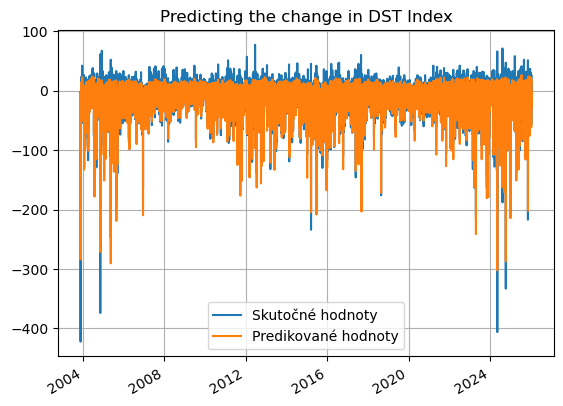

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9087739716151358
MCC=0.7233989107308786
Výkon NN:
MAE: 5.3880, MSE: 67.7758
Perzistentný model:
MAE: 6.0733, MSE: 92.3300
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 11.28%
MSE Improvement: 26.59%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step 

530/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step 

395/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 11:29 771ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 29s 33ms/step   

  5/896 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step 

531/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step 

395/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step


Shapes LSTM:
train: (229344,) (229344,)
val:   (57327,) (57327,)
test:  (194188,) (194188,)
Global sigma (LSTM errors, scaled): 0.4555692
Shapes GP:
X_gp_train: (286671, 12)
y_gp_train: (286671,)
X_test_gp: (194188, 12)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 2**2 * RBF(length_scale=0.537) + WhiteKernel(noise_level=0.736)


Global sigma (LSTM errors): 10.024306
Hybrid prediction with smoothed, inflated interval ready.


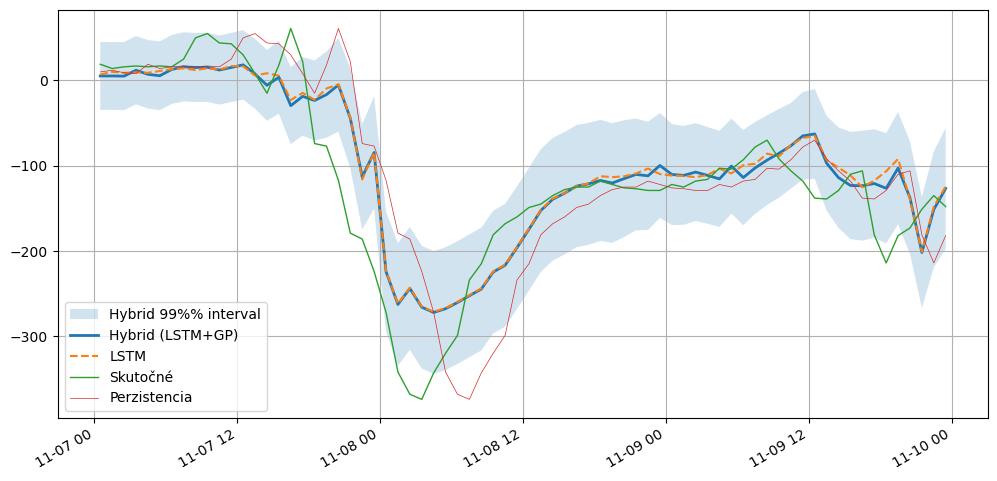

In [20]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [21]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 72.4820
MAE: 5.5688

--- Klasifikačné metriky (Prah: -19.9 nT) ---
Matthews Correlation Coefficient (MCC): 0.7117

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      145138 |        6912
Skutočná 1 |       11479 |       30652

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.93      0.95      0.94    152050
   Trieda 1 (Búrka)       0.82      0.73      0.77     42131

           accuracy                           0.91    194181
          macro avg       0.87      0.84      0.85    194181
       weighted avg       0.90      0.91      0.90    194181



In [22]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9087706830225408
MCC=0.7233963296477058
Výkon NN:
MAE: 5.3880, MSE: 67.7758
Perzistentný model:
MAE: 6.0733, MSE: 92.3300
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 11.28%
MSE Improvement: 26.59%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9304    0.9549    0.9425    152050
           1     0.8202    0.7423    0.7793     42131

    accuracy                         0.9088    194181
   macro avg     0.8753    0.8486    0.8609    194181
weighted avg     0.9065    0.9088    0.9071    194181


===== LSTM+GP =====
ACC=0.9052893949459525
MCC=0.7117460054322635
Výkon NN:
MAE: 5.5688, MSE: 72.4820
Perzistentný model:
MAE: 6.0733, MSE: 92.3300
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 8.31%
MSE Improvement: 21.50%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9267    0.9545    0.9404    152050
           1     0.8160    0.7275    0.7692     42131

 

/tmp/ipykernel_873556/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_873556/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
34,2026-04-27T08:17:11,LSTM,24.0,3.0,DST+3,OMNI2_all,-20.0,-19.6,0.922393,0.763625,"{""text"": "" precision recall f...",4.579899,49.493291,5.299679,68.962605,13.581577,28.231698
35,2026-04-27T08:17:11,LSTM+GP,24.0,3.0,DST+3,OMNI2_all,-20.0,-19.6,0.915255,0.743916,"{""text"": "" precision recall f...",4.852218,53.955285,5.299679,68.962605,8.443174,21.761533
36,2026-04-27T08:24:46,LSTM,6.0,3.0,DST+3,OMNI2_all,-20.0,-20.0,0.918281,0.755646,"{""text"": "" precision recall f...",4.765482,53.307935,5.299620,68.959107,10.078809,22.696309
37,2026-04-27T08:24:46,LSTM+GP,6.0,3.0,DST+3,OMNI2_all,-20.0,-20.0,0.913770,0.740763,"{""text"": "" precision recall f...",5.004895,58.871922,5.299620,68.959107,5.561261,14.627778
38,2026-04-27T08:57:48,LSTM,6.0,3.0,DST+3,OMNI2_all,-20.0,-19.3,0.918667,0.758048,"{""text"": "" precision recall f...",4.714845,50.685691,5.299620,68.959107,11.034291,26.498916
39,2026-04-27T08:57:48,LSTM+GP,6.0,3.0,DST+3,OMNI2_all,-20.0,-19.3,0.914305,0.745982,"{""text"": "" precision recall f...",4.902091,55.022840,5.299620,68.959107,7.501087,20.209466
40,2026-04-27T09:24:50,LSTM,12.0,4.0,DST+4,OMNI2_all,-20.0,-19.9,0.908771,0.723396,"{""text"": "" precision recall f...",5.388027,67.775802,6.073318,92.330027,11.283640,26.593975
41,2026-04-27T09:24:50,LSTM+GP,12.0,4.0,DST+4,OMNI2_all,-20.0,-19.9,0.905289,0.711746,"{""text"": "" precision recall f...",5.568835,72.481960,6.073318,92.330027,8.306554,21.496871
42,2026-04-27T09:44:31,LSTM,12.0,4.0,DST+4,OMNI2_all,-20.0,-19.9,0.908771,0.723396,"{""text"": "" precision recall f...",5.388027,67.775802,6.073318,92.330027,11.283640,26.593975
43,2026-04-27T09:44:31,LSTM+GP,12.0,4.0,DST+4,OMNI2_all,-20.0,-19.9,0.905289,0.711746,"{""text"": "" precision recall f...",5.568835,72.481960,6.073318,92.330027,8.306554,21.496871
